In [1]:
%matplotlib notebook
import os
import numpy as np
import matplotlib.pyplot as plt
import rasterio as rio
import pandas as pd
import geopandas as gpd
from matplotlib import transforms
import re
from shapely.geometry import Point
import contextily as ctx
from mpl_toolkits.axes_grid1 import make_axes_locatable
from matplotlib.animation import FuncAnimation
import matplotlib.animation as animation
from mpl_toolkits.axes_grid1.inset_locator import inset_axes
import matplotlib
import earthpy as et
import earthpy.spatial as es
import earthpy.plot as ep
import earthpy.mask as em
import gdal
import osr
from PIL import Image 
import cv2
from osgeo import gdal_array
from rasterio.plot import show
import random
import spectral
import h5py
import json
import math
from osgeo import gdal,ogr,osr
import affine
import matplotlib.gridspec as gridspec
from glob import glob
from datetime import datetime
import geopandas as gdp

In [2]:
# Change this to where ever your data files are located
data_dir = r"D:\Permanent Thesis Workspace\Final datasets of 3 sensors"
files = os.listdir(data_dir)

# header file of the image
#data_hdr = r"D:\JPL Internship Local Deliverables\MASTER Images\MASTERL1B_1981719_02_20190806_1851_1900_sat_applied.hdr"
#data_hdr = glob(os.path.join(data_hdr))

def planck_um(lam, T):
    c1 = 1.191042*10**8
    c2 = 1.4387752*10**4
    return c1/(lam**5*(np.exp(c2/(lam*T))-1))

def inv_planck_um(lam, radiance):
    c1 = 1.191042*10**8
    c2 = 1.4387752*10**4
    return c2/(lam*np.log(c1/(lam**5*radiance)+1))

# Test functions
print(planck_um(11, 290), 'W/m2*sr*um should be ', 8.222077035769829,'W/m2*sr*um')
print(inv_planck_um(11, 1000), 'K should be ', 2362.5656807352184,'K')

8.222072203488061 W/m2*sr*um should be  8.222077035769829 W/m2*sr*um
2362.5793738804778 K should be  2362.5656807352184 K


In [3]:
# Extracting start and end times from defined image path
# When intputting file path,
#-----date, start-time, end-time, start date-time, end-time, and others are pulled from files that have '2019' in the name
def extract_start_end_datetime(file):
    date_index = file.find('2019')
    date = file[date_index:date_index+4]+"-"+file[date_index+4:date_index+6]+"-"+file[date_index+6:date_index+8]
    start_time = file[date_index+9: date_index+11]+":"+file[date_index+11:date_index+13]
    end_time = file[date_index+14: date_index+16]+":"+file[date_index+16:date_index+18]
    start_datetime = np.datetime64(date+"T"+start_time)
    end_datetime = np.datetime64(date+"T"+end_time)
    day_time = float(file[date_index+9: date_index+11])-7+float(file[date_index+11:date_index+13])/60
    return (start_datetime, end_datetime, day_time)

In [4]:
# The georeferenced images are the band_filenames list that is first down below

band_filenames = []
fdi_filenames = []
start_datetimes = []
day_times = []
end_datetimes = []
durations = []
flight_tracks = []

for file in files:
    #print(file)
    if(file.endswith('_georeferenced')):
        #print('bands',file)                # shortwave via radiance threshold
        #print('Radiance',file+"_MIRMask")  # 'fdi', file + "_fdi" is the original text
        #print(extract_start_end_datetime(file))
        (start_datetime, end_datetime, day_time) = extract_start_end_datetime(file)
        start_datetimes.append(start_datetime)
        end_datetimes.append(end_datetime)
        durations.append(end_datetime-start_datetime)
        band_filenames.append(file)
        fdi_filenames.append(file + "_MIRMask_v02")
        date_index = file.find('2019')
        flight_track = file[date_index-9:date_index-1]
        flight_tracks.append(flight_track)
        day_times.append(day_time)
    
print(start_datetimes)
    
df = pd.DataFrame({'flight_track':flight_tracks,'start_time':start_datetimes,'day_time':day_times, 'end_time':end_datetimes,
                   'duration':durations,'band_file':band_filenames, 'fdi_file':fdi_filenames})
df = df.sort_values('start_time')
df = df.reset_index(drop=True)
 
df['start_time']=df['start_time'].dt.tz_localize(tz='UTC')
df['start_time']=df['start_time'].dt.tz_convert(tz='US/Pacific')
df['end_time']=df['end_time'].dt.tz_localize(tz='UTC')
df['end_time']=df['end_time'].dt.tz_convert(tz='US/Pacific')


print(df)
print(df.dtypes)

[numpy.datetime64('2019-08-06T18:51')]
  flight_track                start_time  day_time                  end_time  \
0     81719_02 2019-08-06 11:51:00-07:00     11.85 2019-08-06 12:00:00-07:00   

  duration                                          band_file  \
0 00:09:00  MASTERL1B_1981719_02_20190806_1851_1900_V01_ge...   

                                            fdi_file  
0  MASTERL1B_1981719_02_20190806_1851_1900_V01_ge...  
flight_track                        object
start_time      datetime64[ns, US/Pacific]
day_time                           float64
end_time        datetime64[ns, US/Pacific]
duration                   timedelta64[ns]
band_file                           object
fdi_file                            object
dtype: object


In [5]:
# takes in the row/col position of the fire pixel, then the fdi array

def get_nonfire_neighbors(row, col, fdi): 
    
    #creates empty list for nonfire_neighbors to be exported
    nonfire_neighbors = []
    
    # Tuple is created from the fdi shape----e.g. (711,336)
    (num_row, num_col) = fdi.shape  
 
    # bound 1 as a starting point to loop through
    bound = 1
    
    # while the bound is less than 5 and the nonFire_neighbors have less than 5 pixels
    while(bound <7):
        for i in range(row-bound, row+bound + 1):   # for i in the range of the row bounds
            print("Row",i)
            for j in range(col-bound, col+bound + 1):  # for j in the range of columns
                print("Col",j)
                if(fdi[i,j] == 0):                   # if both values of col/rows is equal to zero
                    print("Pixel:", (i,j), "is non-fire")
                    nonfire_neighbors.append((i,j))     # append it to nonfire_neighbors empty list
        print("Next bound round")
        bound += 1
    return nonfire_neighbors


In [6]:
# Creation of a geodataframe filled with variables no limited to: xy coord, FRP data, and 
# ---background spectral radiance information, as we

fire_detect_data = gpd.GeoDataFrame(columns=["start_time","end_time","x_coord","y_coord","geometry",
                                             "dataset","row","col","FRP","FRP_T5","FRP_ratio","epsilon",
                                             "atmo_transmit","LfMIR","Lbkg", "Num_nonFire_background"])

fire_detect_data.crs = "EPSG:32611"
#row_df = pd.DataFrame([[user_id, name, points, 0]], columns=["user_id","name","score","hints"])
#score_df = pd.concat([score_df, row_df], ignore_index=True)
fire_times = []
fire_frps = []
fire_datasets = []
fire_rows = []
fire_cols = []
fire_LfMIR = []
fire_Lbackground = []

fire_detection_times = []
fire_detection_number = []
fire_total_FRP = []

num_fire_no_background = 0
num_fire_pixels = 0

#loop through the only image in the df dataframe
for index, row in df.iterrows():
    
    fire_time = row['start_time']
    fire_end_time = row["end_time"]
    band_file = row['band_file']
    fdi_file = row['fdi_file']
        
    #print(band_file)
    fp = data_dir+"/"+band_file
    #print(fp)
    raster = rio.open(fp)
    if(not raster.count == 49):
        continue
    #print(raster)
    transform = raster.transform
    band_data = raster.tags()
    #print(band_data)
    wls = []
    for band in band_data.keys():
        band = band_data[band]
        band = band.split(")")[2]
        band = band.split("(")[1]
        #print(band)
        wls.append(float(band))
    wls= sorted(wls)
   #print(wls)
    
    band_data_array = raster.read()
    #print(len(band_data_array))

    #print(wls)
    fp_fdi = data_dir+"/"+fdi_file
    print(fp_fdi)
    raster_fdi = rio.open(fp_fdi)
    fdi_data_array = raster_fdi.read()[0]
    (row,col)=np.nonzero(fdi_data_array)
    
    # fire_pixels is an empty dictionary that will contain the fire pixel position and the non-fire background pixel position
    #-------------------------------------------------------------corresponding to that fire pixel
    fire_pixels = {}
    num_fire_pixels += len(row)
    
    # from 0 to 558 fire pixels
    for i in range(0, len(row)):
        # retrieve their row
        row_ind = row[i]
        col_ind = col[i]
        fire_pixels[(row_ind, col_ind)] = get_nonfire_neighbors(row_ind, col_ind, fdi_data_array)

    
    #print(fire_pixels)
    
    MIR_ind = wls.index(4.06)
    TIR_ind = wls.index(10.71)
    #rint(MIR_ind)
    #rint(TIR_ind)
    a = 2.632953e-09 # T**4 fit coefficient
    b = 1.98805018e-12 # T**5 fit coefficient
    epsilon = 0.8   # Assume a value for emissivity for T**5 FRP
    sigma = 5.67*10**(-8) #stephan boltzmans
    A = 18.0 * 18.0 # Pixel area is the sptial resolution in  meters
    atmo_transmit = 0.93695 # Atmospheric transmittance
    FRPs = []
    

    fire_detection_times.append(fire_time)
    fire_detection_number.append(len(row)) #number of pixels with fire
    total_FRP = 0

    frp_data_array = np.zeros_like(fdi_data_array, dtype=float)
    
    #"dataset","row","col","FRP","FRP_T5","epsilon","LfMIR","Lbkg"
    fire_detect_start_times = []
    fire_detect_end_times = []
    fire_detect_xcoords = []
    fire_detect_ycoords = []
    fire_detect_nf_xcoords= []
    fire_detect_nf_ycoords= []
    fire_detect_number_nonfire_neighbors= []
    fire_detect_datasets = []
    fire_detect_rows = []
    fire_detect_cols = []
    fire_detect_FRPs = []
    fire_detect_FRP_T5s = []
    fire_detect_epsilons = []
    fire_detect_atmo_transmits = []
    fire_detect_LfMIRs = []
    fire_detect_Lbkgs = []
    fire_detect_FRP_ratios = []
    fire_detect_points = []
    
   # from 0 to 558 cells that are fire pixels
   # Basically for each fire pixel...do the following
    for i in range(0, len(row)):
        
        # creating row_col variables for each fire cell
        row_ind = row[i]
        col_ind = col[i]
        
        # creating fire_neighbors variable that has non-fire pixels position  
        fire_neighbors = fire_pixels[(row_ind, col_ind)]
        
        # the number of non-fire pixel neighbors
        num_fire_neighbors = len(fire_neighbors)
        fire_detect_number_nonfire_neighbors.append(num_fire_neighbors)
        
        # if there is 0 in the number of non-fire pixel neighbors, then create a num_fire_no_bacgrnd and add onto it for--
        #--------each loop
        if(num_fire_neighbors==0):
            num_fire_no_background+=1
            continue
       
        fire_detect_start_times.append(fire_time)
        fire_detect_end_times.append(fire_end_time)
        fire_detect_datasets.append(band_file)
        
        # appending the individual row/col variables within each loop to fire_Detect_rows/cols 
        fire_detect_rows.append(row_ind)
        fire_detect_cols.append(col_ind)
        #print(row_ind)
        #print(col_ind)
        
        # Then project the pixel positon points to x,y coordinates (to meteres)
        (x_coord, y_coord) = rio.transform.xy(raster.transform, row_ind, col_ind, offset="ul")
        
        # then append those x,y points to the empty list variables
        fire_detect_points.append(Point(x_coord, y_coord))
        fire_detect_xcoords.append(x_coord)
        fire_detect_ycoords.append(y_coord)
        fire_detect_epsilons.append(epsilon)
        fire_detect_atmo_transmits.append(atmo_transmit)
        
        # creating none value for radiance backrgound (L_background)
        # this value will accumulate the background radiance values from the loop down below
        #----then eventually the total will be divded to get an average background value
        L_background = 0
        
        # loop throgh row/col of fire neighbpors (they are in tuple format, thus (row_n,col_n))
        # if there is 13 values in fire_neighbors, it will loop through 13 times for example.
        for (row_n, col_n) in fire_neighbors:
            
            # convert backgground pixel positions to xy coordinates in meters
            (x_nf_coord, y_nf_coord) = rio.transform.xy(raster.transform, row_n, col_n, offset="ul")
            fire_detect_nf_xcoords.append(x_nf_coord)
            fire_detect_nf_ycoords.append(y_nf_coord)
            
            # retrieveing the value of the 24th band of the raster by getting its col/row position
            L_background += band_data_array[MIR_ind,row_n,col_n]
        
        # then divide the total accumnulated background radiance (L_background) by the number of pixels to get average value
        L_background = L_background / num_fire_neighbors

        # then calculate the total difference between the radiance value of the fire pixel and the average value of background
        LfMIR = (band_data_array[MIR_ind, row_ind, col_ind] - L_background) / atmo_transmit
        
        # then apply forumula of frp
        FRP = A*sigma*LfMIR/a
        FRP_T5 = A*sigma*epsilon**(1./5)*(LfMIR**(4./5))/(b**(4./5))
        FRPs.append(FRP)
        
        fire_detect_Lbkgs.append(L_background)
        fire_detect_LfMIRs.append(LfMIR)
        #print(FRP)
        fire_detect_FRPs.append(FRP)
        fire_detect_FRP_T5s.append(FRP_T5)
        fire_detect_FRP_ratios.append(FRP_T5/FRP)
        
        fire_times.append(fire_time)
        fire_frps.append(FRP)
        fire_datasets.append(band_file)
        fire_rows.append(row_ind)
        fire_cols.append(col_ind)
        
        fire_LfMIR.append(LfMIR)
        fire_Lbackground.append(L_background)
        total_FRP += FRP
        frp_data_array[row_ind, col_ind] = FRP
        
        
        fire_total_FRP.append(total_FRP)
        
        
    nonFire_detect_flighttrack = gpd.GeoDataFrame(columns=["X_coords", "Y_coords"])
    nonFire_detect_flighttrack['X_coords'] = fire_detect_nf_xcoords
    nonFire_detect_flighttrack['Y_coords'] = fire_detect_nf_ycoords

    fire_detect_flighttrack = gpd.GeoDataFrame(columns=["start_time","end_time","x_coord","y_coord","geometry","dataset","row","col","FRP","FRP_T5","FRP_ratio","epsilon","atmo_transmit","LfMIR","Lbkg"])
    fire_detect_flighttrack["start_time"] = fire_detect_start_times
    fire_detect_flighttrack["end_time"] = fire_detect_end_times
    fire_detect_flighttrack["x_coord"] = fire_detect_xcoords
    fire_detect_flighttrack["y_coord"] = fire_detect_ycoords
    fire_detect_flighttrack["dataset"] = fire_detect_datasets
    fire_detect_flighttrack["row"] = fire_detect_rows
    fire_detect_flighttrack["col"] = fire_detect_cols
    fire_detect_flighttrack["FRP"] = fire_detect_FRPs
    fire_detect_flighttrack["FRP_T5"] = fire_detect_FRP_T5s
    fire_detect_flighttrack["FRP_ratio"] = fire_detect_FRP_ratios
    fire_detect_flighttrack["epsilon"] = fire_detect_epsilons
    fire_detect_flighttrack["atmo_transmit"] = fire_detect_atmo_transmits
    fire_detect_flighttrack["LfMIR"] = fire_detect_LfMIRs
    fire_detect_flighttrack["Lbkg"] = fire_detect_Lbkgs
    fire_detect_flighttrack["Num_nonFire_background"] = fire_detect_number_nonfire_neighbors
    
    s = gpd.GeoSeries(fire_detect_points)
    s.crs = "EPSG:32611"
    fire_detect_flighttrack['geometry'] = s
    
    # "FRP","FRP_T5","epsilon","atmo_transmit","LfMIR","Lbkg"
    #,columns=["start_time","end_time","lat","lon","dataset","row","col","FRP","FRP_T5","epsilon","atmo_transmit","LfMIR","Lbkg"]
    #pd.DataFrame([[user_id, name, points, 0]], columns=["user_id","name","score","hints"])
    fire_detect_data = gpd.GeoDataFrame(pd.concat([fire_detect_data, fire_detect_flighttrack], ignore_index=True))

    
# ----------Exploratory statistics for fire radiance
print("Stats for fire pixels: ")
print("Number of fire pixels", len(fire_detect_LfMIRs))
print("\tMin radiance of fire", np.min(fire_detect_LfMIRs), "\n\tMax",np.max(fire_detect_LfMIRs))
print("\tMean radiance of fire", np.mean(fire_detect_LfMIRs))
print("\tStandard Deviation",np.std(fire_detect_LfMIRs))


# ----------Exploratory statistics for fire background radiance
print("Stats for fire-background pixels: ")
print("\tMin radiance of fire background", np.min(fire_detect_Lbkgs), "\n\tMax",np.max(fire_detect_Lbkgs))
print("\tMean radiance of fire background", np.mean(fire_detect_Lbkgs))
print("\tStandard Deviation of fire background",np.std(fire_detect_Lbkgs))


fire_detect_data.crs = "EPSG:32611"
print("\tfire pixels =",num_fire_pixels)
print("\tNon Fire pixels:", len(fire_detect_Lbkgs))
print("\tfire pixels with no non-fire neighbors=",num_fire_no_background)  


D:\Permanent Thesis Workspace\Final datasets of 3 sensors/MASTERL1B_1981719_02_20190806_1851_1900_V01_georeferenced_MIRMask_v02
Row 50
Col 120
Pixel: (50, 120) is non-fire
Col 121
Pixel: (50, 121) is non-fire
Col 122
Pixel: (50, 122) is non-fire
Row 51
Col 120
Pixel: (51, 120) is non-fire
Col 121
Col 122
Row 52
Col 120
Pixel: (52, 120) is non-fire
Col 121
Pixel: (52, 121) is non-fire
Col 122
Pixel: (52, 122) is non-fire
Next bound round
Row 49
Col 119
Pixel: (49, 119) is non-fire
Col 120
Pixel: (49, 120) is non-fire
Col 121
Pixel: (49, 121) is non-fire
Col 122
Pixel: (49, 122) is non-fire
Col 123
Pixel: (49, 123) is non-fire
Row 50
Col 119
Pixel: (50, 119) is non-fire
Col 120
Pixel: (50, 120) is non-fire
Col 121
Pixel: (50, 121) is non-fire
Col 122
Pixel: (50, 122) is non-fire
Col 123
Pixel: (50, 123) is non-fire
Row 51
Col 119
Pixel: (51, 119) is non-fire
Col 120
Pixel: (51, 120) is non-fire
Col 121
Col 122
Col 123
Row 52
Col 119
Pixel: (52, 119) is non-fire
Col 120
Pixel: (52, 120) i

Pixel: (51, 126) is non-fire
Col 127
Pixel: (51, 127) is non-fire
Row 52
Col 115
Pixel: (52, 115) is non-fire
Col 116
Pixel: (52, 116) is non-fire
Col 117
Pixel: (52, 117) is non-fire
Col 118
Pixel: (52, 118) is non-fire
Col 119
Pixel: (52, 119) is non-fire
Col 120
Pixel: (52, 120) is non-fire
Col 121
Pixel: (52, 121) is non-fire
Col 122
Pixel: (52, 122) is non-fire
Col 123
Pixel: (52, 123) is non-fire
Col 124
Pixel: (52, 124) is non-fire
Col 125
Pixel: (52, 125) is non-fire
Col 126
Pixel: (52, 126) is non-fire
Col 127
Pixel: (52, 127) is non-fire
Row 53
Col 115
Pixel: (53, 115) is non-fire
Col 116
Pixel: (53, 116) is non-fire
Col 117
Pixel: (53, 117) is non-fire
Col 118
Pixel: (53, 118) is non-fire
Col 119
Pixel: (53, 119) is non-fire
Col 120
Pixel: (53, 120) is non-fire
Col 121
Pixel: (53, 121) is non-fire
Col 122
Pixel: (53, 122) is non-fire
Col 123
Pixel: (53, 123) is non-fire
Col 124
Pixel: (53, 124) is non-fire
Col 125
Pixel: (53, 125) is non-fire
Col 126
Pixel: (53, 126) is non-

Col 123
Pixel: (49, 123) is non-fire
Col 124
Pixel: (49, 124) is non-fire
Col 125
Pixel: (49, 125) is non-fire
Row 50
Col 121
Pixel: (50, 121) is non-fire
Col 122
Pixel: (50, 122) is non-fire
Col 123
Pixel: (50, 123) is non-fire
Col 124
Pixel: (50, 124) is non-fire
Col 125
Pixel: (50, 125) is non-fire
Row 51
Col 121
Col 122
Col 123
Col 124
Pixel: (51, 124) is non-fire
Col 125
Pixel: (51, 125) is non-fire
Row 52
Col 121
Pixel: (52, 121) is non-fire
Col 122
Pixel: (52, 122) is non-fire
Col 123
Pixel: (52, 123) is non-fire
Col 124
Pixel: (52, 124) is non-fire
Col 125
Pixel: (52, 125) is non-fire
Row 53
Col 121
Pixel: (53, 121) is non-fire
Col 122
Pixel: (53, 122) is non-fire
Col 123
Pixel: (53, 123) is non-fire
Col 124
Pixel: (53, 124) is non-fire
Col 125
Pixel: (53, 125) is non-fire
Next bound round
Row 48
Col 120
Pixel: (48, 120) is non-fire
Col 121
Pixel: (48, 121) is non-fire
Col 122
Pixel: (48, 122) is non-fire
Col 123
Pixel: (48, 123) is non-fire
Col 124
Pixel: (48, 124) is non-fire

Pixel: (51, 118) is non-fire
Col 119
Pixel: (51, 119) is non-fire
Col 120
Pixel: (51, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Pixel: (51, 124) is non-fire
Col 125
Pixel: (51, 125) is non-fire
Col 126
Pixel: (51, 126) is non-fire
Col 127
Pixel: (51, 127) is non-fire
Col 128
Pixel: (51, 128) is non-fire
Col 129
Pixel: (51, 129) is non-fire
Row 52
Col 117
Pixel: (52, 117) is non-fire
Col 118
Pixel: (52, 118) is non-fire
Col 119
Pixel: (52, 119) is non-fire
Col 120
Pixel: (52, 120) is non-fire
Col 121
Pixel: (52, 121) is non-fire
Col 122
Pixel: (52, 122) is non-fire
Col 123
Pixel: (52, 123) is non-fire
Col 124
Pixel: (52, 124) is non-fire
Col 125
Pixel: (52, 125) is non-fire
Col 126
Pixel: (52, 126) is non-fire
Col 127
Pixel: (52, 127) is non-fire
Col 128
Pixel: (52, 128) is non-fire
Col 129
Pixel: (52, 129) is non-fire
Row 53
Col 117
Pixel: (53, 117) is non-fire
Col 118
Pixel: (53, 118) is non-fire
Col 119
Pixel: (53, 119) is non-fire
Col 120
Pixel: (53, 120) is non-fire
Col 121


Pixel: (188, 76) is non-fire
Col 77
Pixel: (188, 77) is non-fire
Col 78
Pixel: (188, 78) is non-fire
Col 79
Col 80
Pixel: (188, 80) is non-fire
Col 81
Col 82
Col 83
Col 84
Col 85
Pixel: (188, 85) is non-fire
Col 86
Pixel: (188, 86) is non-fire
Col 87
Pixel: (188, 87) is non-fire
Row 189
Col 75
Pixel: (189, 75) is non-fire
Col 76
Pixel: (189, 76) is non-fire
Col 77
Pixel: (189, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (189, 80) is non-fire
Col 81
Pixel: (189, 81) is non-fire
Col 82
Pixel: (189, 82) is non-fire
Col 83
Pixel: (189, 83) is non-fire
Col 84
Pixel: (189, 84) is non-fire
Col 85
Pixel: (189, 85) is non-fire
Col 86
Pixel: (189, 86) is non-fire
Col 87
Pixel: (189, 87) is non-fire
Row 190
Col 75
Pixel: (190, 75) is non-fire
Col 76
Pixel: (190, 76) is non-fire
Col 77
Pixel: (190, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Col 82
Pixel: (190, 82) is non-fire
Col 83
Pixel: (190, 83) is non-fire
Col 84
Pixel: (190, 84) is n

Pixel: (191, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Col 82
Pixel: (191, 82) is non-fire
Col 83
Pixel: (191, 83) is non-fire
Next bound round
Row 180
Col 72
Pixel: (180, 72) is non-fire
Col 73
Pixel: (180, 73) is non-fire
Col 74
Pixel: (180, 74) is non-fire
Col 75
Pixel: (180, 75) is non-fire
Col 76
Pixel: (180, 76) is non-fire
Col 77
Pixel: (180, 77) is non-fire
Col 78
Pixel: (180, 78) is non-fire
Col 79
Pixel: (180, 79) is non-fire
Col 80
Pixel: (180, 80) is non-fire
Col 81
Pixel: (180, 81) is non-fire
Col 82
Pixel: (180, 82) is non-fire
Col 83
Pixel: (180, 83) is non-fire
Col 84
Pixel: (180, 84) is non-fire
Row 181
Col 72
Pixel: (181, 72) is non-fire
Col 73
Pixel: (181, 73) is non-fire
Col 74
Pixel: (181, 74) is non-fire
Col 75
Pixel: (181, 75) is non-fire
Col 76
Pixel: (181, 76) is non-fire
Col 77
Pixel: (181, 77) is non-fire
Col 78
Pixel: (181, 78) 

Pixel: (183, 82) is non-fire
Col 83
Pixel: (183, 83) is non-fire
Row 184
Col 75
Pixel: (184, 75) is non-fire
Col 76
Pixel: (184, 76) is non-fire
Col 77
Pixel: (184, 77) is non-fire
Col 78
Pixel: (184, 78) is non-fire
Col 79
Pixel: (184, 79) is non-fire
Col 80
Pixel: (184, 80) is non-fire
Col 81
Pixel: (184, 81) is non-fire
Col 82
Pixel: (184, 82) is non-fire
Col 83
Pixel: (184, 83) is non-fire
Row 185
Col 75
Pixel: (185, 75) is non-fire
Col 76
Pixel: (185, 76) is non-fire
Col 77
Pixel: (185, 77) is non-fire
Col 78
Pixel: (185, 78) is non-fire
Col 79
Pixel: (185, 79) is non-fire
Col 80
Pixel: (185, 80) is non-fire
Col 81
Col 82
Pixel: (185, 82) is non-fire
Col 83
Pixel: (185, 83) is non-fire
Row 186
Col 75
Pixel: (186, 75) is non-fire
Col 76
Pixel: (186, 76) is non-fire
Col 77
Pixel: (186, 77) is non-fire
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Pixel: (186, 83) is non-fire
Row 187
Col 75
Pixel: (187, 75) is non-fire
Col 76
Pixel: (187, 76) is non-fire
Col 77
Pixel: (187, 77) is non-fi

Col 78
Pixel: (184, 78) is non-fire
Col 79
Pixel: (184, 79) is non-fire
Col 80
Pixel: (184, 80) is non-fire
Col 81
Pixel: (184, 81) is non-fire
Col 82
Pixel: (184, 82) is non-fire
Row 185
Col 78
Pixel: (185, 78) is non-fire
Col 79
Pixel: (185, 79) is non-fire
Col 80
Pixel: (185, 80) is non-fire
Col 81
Col 82
Pixel: (185, 82) is non-fire
Row 186
Col 78
Col 79
Col 80
Col 81
Col 82
Row 187
Col 78
Col 79
Col 80
Col 81
Col 82
Row 188
Col 78
Pixel: (188, 78) is non-fire
Col 79
Col 80
Pixel: (188, 80) is non-fire
Col 81
Col 82
Next bound round
Row 183
Col 77
Pixel: (183, 77) is non-fire
Col 78
Pixel: (183, 78) is non-fire
Col 79
Pixel: (183, 79) is non-fire
Col 80
Pixel: (183, 80) is non-fire
Col 81
Pixel: (183, 81) is non-fire
Col 82
Pixel: (183, 82) is non-fire
Col 83
Pixel: (183, 83) is non-fire
Row 184
Col 77
Pixel: (184, 77) is non-fire
Col 78
Pixel: (184, 78) is non-fire
Col 79
Pixel: (184, 79) is non-fire
Col 80
Pixel: (184, 80) is non-fire
Col 81
Pixel: (184, 81) is non-fire
Col 82
Pi

Col 75
Pixel: (192, 75) is non-fire
Col 76
Pixel: (192, 76) is non-fire
Col 77
Pixel: (192, 77) is non-fire
Col 78
Pixel: (192, 78) is non-fire
Col 79
Pixel: (192, 79) is non-fire
Col 80
Pixel: (192, 80) is non-fire
Col 81
Pixel: (192, 81) is non-fire
Col 82
Pixel: (192, 82) is non-fire
Col 83
Pixel: (192, 83) is non-fire
Col 84
Pixel: (192, 84) is non-fire
Col 85
Pixel: (192, 85) is non-fire
Col 86
Pixel: (192, 86) is non-fire
Next bound round
Row 185
Col 80
Pixel: (185, 80) is non-fire
Col 81
Col 82
Pixel: (185, 82) is non-fire
Row 186
Col 80
Col 81
Col 82
Row 187
Col 80
Col 81
Col 82
Next bound round
Row 184
Col 79
Pixel: (184, 79) is non-fire
Col 80
Pixel: (184, 80) is non-fire
Col 81
Pixel: (184, 81) is non-fire
Col 82
Pixel: (184, 82) is non-fire
Col 83
Pixel: (184, 83) is non-fire
Row 185
Col 79
Pixel: (185, 79) is non-fire
Col 80
Pixel: (185, 80) is non-fire
Col 81
Col 82
Pixel: (185, 82) is non-fire
Col 83
Pixel: (185, 83) is non-fire
Row 186
Col 79
Col 80
Col 81
Col 82
Col 83

Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Col 82
Pixel: (190, 82) is non-fire
Col 83
Pixel: (190, 83) is non-fire
Col 84
Pixel: (190, 84) is non-fire
Col 85
Pixel: (190, 85) is non-fire
Col 86
Pixel: (190, 86) is non-fire
Col 87
Pixel: (190, 87) is non-fire
Row 191
Col 75
Pixel: (191, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Col 82
Pixel: (191, 82) is non-fire
Col 83
Pixel: (191, 83) is non-fire
Col 84
Pixel: (191, 84) is non-fire
Col 85
Pixel: (191, 85) is non-fire
Col 86
Pixel: (191, 86) is non-fire
Col 87
Pixel: (191, 87) is non-fire
Row 192
Col 75
Pixel: (192, 75) is non-fire
Col 76
Pixel: (192, 76) is non-fire
Col 77
Pixel: (192, 77) is non-fire
Col 78
Pixel: (192, 78) is non-fire
Col 79
Pixel: (192, 79) is non-fire
Col 80
Pixel: (192, 80) is non-fire
Col 81
Pixel: (192, 81) is non-fire
Col 82
Pixel: (192, 82) is non-fire
Col 8

Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Col 82
Pixel: (191, 82) is non-fire
Col 83
Pixel: (191, 83) is non-fire
Col 84
Pixel: (191, 84) is non-fire
Col 85
Pixel: (191, 85) is non-fire
Col 86
Pixel: (191, 86) is non-fire
Col 87
Pixel: (191, 87) is non-fire
Next bound round
Row 180
Col 76
Pixel: (180, 76) is non-fire
Col 77
Pixel: (180, 77) is non-fire
Col 78
Pixel: (180, 78) is non-fire
Col 79
Pixel: (180, 79) is non-fire
Col 80
Pixel: (180, 80) is non-fire
Col 81
Pixel: (180, 81) is non-fire
Col 82
Pixel: (180, 82) is non-fire
Col 83
Pixel: (180, 83) is non-fire
Col 84
Pixel: (180, 84) is non-fire
Col 85
Pixel: (180, 85) is non-fire
Col 86
Pixel: (180, 86) is non-fire
Col 87
Pixel: (180, 87) is non-fire
Col 88
Pixel: (180, 88) is non-fire
Row 181
Col 76
Pixel: (181, 76) is non-fire
Col 77
Pixel: (181, 77) is non-fire
Col 78
Pixel: (181, 78) is non-fire
Col 79
Pixel: (181, 79) is non-fire
Co

Col 76
Pixel: (188, 76) is non-fire
Col 77
Pixel: (188, 77) is non-fire
Col 78
Pixel: (188, 78) is non-fire
Col 79
Col 80
Pixel: (188, 80) is non-fire
Col 81
Col 82
Row 189
Col 74
Pixel: (189, 74) is non-fire
Col 75
Pixel: (189, 75) is non-fire
Col 76
Pixel: (189, 76) is non-fire
Col 77
Pixel: (189, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (189, 80) is non-fire
Col 81
Pixel: (189, 81) is non-fire
Col 82
Pixel: (189, 82) is non-fire
Row 190
Col 74
Pixel: (190, 74) is non-fire
Col 75
Pixel: (190, 75) is non-fire
Col 76
Pixel: (190, 76) is non-fire
Col 77
Pixel: (190, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Col 82
Pixel: (190, 82) is non-fire
Row 191
Col 74
Pixel: (191, 74) is non-fire
Col 75
Pixel: (191, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Col 82
Pixel: (191, 82) is non-fire
Next bound ro

Col 73
Pixel: (191, 73) is non-fire
Col 74
Pixel: (191, 74) is non-fire
Col 75
Pixel: (191, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Col 82
Pixel: (191, 82) is non-fire
Col 83
Pixel: (191, 83) is non-fire
Col 84
Pixel: (191, 84) is non-fire
Row 192
Col 72
Pixel: (192, 72) is non-fire
Col 73
Pixel: (192, 73) is non-fire
Col 74
Pixel: (192, 74) is non-fire
Col 75
Pixel: (192, 75) is non-fire
Col 76
Pixel: (192, 76) is non-fire
Col 77
Pixel: (192, 77) is non-fire
Col 78
Pixel: (192, 78) is non-fire
Col 79
Pixel: (192, 79) is non-fire
Col 80
Pixel: (192, 80) is non-fire
Col 81
Pixel: (192, 81) is non-fire
Col 82
Pixel: (192, 82) is non-fire
Col 83
Pixel: (192, 83) is non-fire
Col 84
Pixel: (192, 84) is non-fire
Row 193
Col 72
Pixel: (193, 72) is non-fire
Col 73
Pixel: (193, 73) is non-fire
Col 74
Pixel: (193, 74) is non-fire
Col 75
Pixel: (193, 75) is non-fir

Col 82
Pixel: (185, 82) is non-fire
Col 83
Pixel: (185, 83) is non-fire
Col 84
Pixel: (185, 84) is non-fire
Col 85
Pixel: (185, 85) is non-fire
Row 186
Col 73
Pixel: (186, 73) is non-fire
Col 74
Pixel: (186, 74) is non-fire
Col 75
Pixel: (186, 75) is non-fire
Col 76
Pixel: (186, 76) is non-fire
Col 77
Pixel: (186, 77) is non-fire
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Pixel: (186, 83) is non-fire
Col 84
Pixel: (186, 84) is non-fire
Col 85
Pixel: (186, 85) is non-fire
Row 187
Col 73
Pixel: (187, 73) is non-fire
Col 74
Pixel: (187, 74) is non-fire
Col 75
Pixel: (187, 75) is non-fire
Col 76
Pixel: (187, 76) is non-fire
Col 77
Pixel: (187, 77) is non-fire
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Col 84
Pixel: (187, 84) is non-fire
Col 85
Pixel: (187, 85) is non-fire
Row 188
Col 73
Pixel: (188, 73) is non-fire
Col 74
Pixel: (188, 74) is non-fire
Col 75
Pixel: (188, 75) is non-fire
Col 76
Pixel: (188, 76) is non-fire
Col 77
Pixel: (188, 77) is non-fire
Col 78
Pixel: (188, 78) is non-fire

Row 184
Col 74
Pixel: (184, 74) is non-fire
Col 75
Pixel: (184, 75) is non-fire
Col 76
Pixel: (184, 76) is non-fire
Col 77
Pixel: (184, 77) is non-fire
Col 78
Pixel: (184, 78) is non-fire
Col 79
Pixel: (184, 79) is non-fire
Col 80
Pixel: (184, 80) is non-fire
Col 81
Pixel: (184, 81) is non-fire
Col 82
Pixel: (184, 82) is non-fire
Col 83
Pixel: (184, 83) is non-fire
Col 84
Pixel: (184, 84) is non-fire
Col 85
Pixel: (184, 85) is non-fire
Col 86
Pixel: (184, 86) is non-fire
Row 185
Col 74
Pixel: (185, 74) is non-fire
Col 75
Pixel: (185, 75) is non-fire
Col 76
Pixel: (185, 76) is non-fire
Col 77
Pixel: (185, 77) is non-fire
Col 78
Pixel: (185, 78) is non-fire
Col 79
Pixel: (185, 79) is non-fire
Col 80
Pixel: (185, 80) is non-fire
Col 81
Col 82
Pixel: (185, 82) is non-fire
Col 83
Pixel: (185, 83) is non-fire
Col 84
Pixel: (185, 84) is non-fire
Col 85
Pixel: (185, 85) is non-fire
Col 86
Pixel: (185, 86) is non-fire
Row 186
Col 74
Pixel: (186, 74) is non-fire
Col 75
Pixel: (186, 75) is non-fi

Pixel: (183, 81) is non-fire
Col 82
Pixel: (183, 82) is non-fire
Col 83
Pixel: (183, 83) is non-fire
Col 84
Pixel: (183, 84) is non-fire
Col 85
Pixel: (183, 85) is non-fire
Col 86
Pixel: (183, 86) is non-fire
Row 184
Col 76
Pixel: (184, 76) is non-fire
Col 77
Pixel: (184, 77) is non-fire
Col 78
Pixel: (184, 78) is non-fire
Col 79
Pixel: (184, 79) is non-fire
Col 80
Pixel: (184, 80) is non-fire
Col 81
Pixel: (184, 81) is non-fire
Col 82
Pixel: (184, 82) is non-fire
Col 83
Pixel: (184, 83) is non-fire
Col 84
Pixel: (184, 84) is non-fire
Col 85
Pixel: (184, 85) is non-fire
Col 86
Pixel: (184, 86) is non-fire
Row 185
Col 76
Pixel: (185, 76) is non-fire
Col 77
Pixel: (185, 77) is non-fire
Col 78
Pixel: (185, 78) is non-fire
Col 79
Pixel: (185, 79) is non-fire
Col 80
Pixel: (185, 80) is non-fire
Col 81
Col 82
Pixel: (185, 82) is non-fire
Col 83
Pixel: (185, 83) is non-fire
Col 84
Pixel: (185, 84) is non-fire
Col 85
Pixel: (185, 85) is non-fire
Col 86
Pixel: (185, 86) is non-fire
Row 186
Col 

Col 79
Pixel: (185, 79) is non-fire
Col 80
Pixel: (185, 80) is non-fire
Col 81
Col 82
Pixel: (185, 82) is non-fire
Col 83
Pixel: (185, 83) is non-fire
Col 84
Pixel: (185, 84) is non-fire
Col 85
Pixel: (185, 85) is non-fire
Row 186
Col 79
Col 80
Col 81
Col 82
Col 83
Pixel: (186, 83) is non-fire
Col 84
Pixel: (186, 84) is non-fire
Col 85
Pixel: (186, 85) is non-fire
Row 187
Col 79
Col 80
Col 81
Col 82
Col 83
Col 84
Pixel: (187, 84) is non-fire
Col 85
Pixel: (187, 85) is non-fire
Row 188
Col 79
Col 80
Pixel: (188, 80) is non-fire
Col 81
Col 82
Col 83
Col 84
Col 85
Pixel: (188, 85) is non-fire
Row 189
Col 79
Col 80
Pixel: (189, 80) is non-fire
Col 81
Pixel: (189, 81) is non-fire
Col 82
Pixel: (189, 82) is non-fire
Col 83
Pixel: (189, 83) is non-fire
Col 84
Pixel: (189, 84) is non-fire
Col 85
Pixel: (189, 85) is non-fire
Row 190
Col 79
Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Col 82
Pixel: (190, 82) is non-fire
Col 83
Pixel: (190, 83) is non-fire
Col 84
Pixel:

Col 80
Pixel: (184, 80) is non-fire
Col 81
Pixel: (184, 81) is non-fire
Col 82
Pixel: (184, 82) is non-fire
Col 83
Pixel: (184, 83) is non-fire
Col 84
Pixel: (184, 84) is non-fire
Col 85
Pixel: (184, 85) is non-fire
Col 86
Pixel: (184, 86) is non-fire
Col 87
Pixel: (184, 87) is non-fire
Col 88
Pixel: (184, 88) is non-fire
Row 185
Col 76
Pixel: (185, 76) is non-fire
Col 77
Pixel: (185, 77) is non-fire
Col 78
Pixel: (185, 78) is non-fire
Col 79
Pixel: (185, 79) is non-fire
Col 80
Pixel: (185, 80) is non-fire
Col 81
Col 82
Pixel: (185, 82) is non-fire
Col 83
Pixel: (185, 83) is non-fire
Col 84
Pixel: (185, 84) is non-fire
Col 85
Pixel: (185, 85) is non-fire
Col 86
Pixel: (185, 86) is non-fire
Col 87
Pixel: (185, 87) is non-fire
Col 88
Pixel: (185, 88) is non-fire
Row 186
Col 76
Pixel: (186, 76) is non-fire
Col 77
Pixel: (186, 77) is non-fire
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Pixel: (186, 83) is non-fire
Col 84
Pixel: (186, 84) is non-fire
Col 85
Pixel: (186, 85) is non-fire
Col 86

Pixel: (187, 84) is non-fire
Col 85
Pixel: (187, 85) is non-fire
Col 86
Pixel: (187, 86) is non-fire
Col 87
Pixel: (187, 87) is non-fire
Col 88
Pixel: (187, 88) is non-fire
Row 188
Col 78
Pixel: (188, 78) is non-fire
Col 79
Col 80
Pixel: (188, 80) is non-fire
Col 81
Col 82
Col 83
Col 84
Col 85
Pixel: (188, 85) is non-fire
Col 86
Pixel: (188, 86) is non-fire
Col 87
Pixel: (188, 87) is non-fire
Col 88
Pixel: (188, 88) is non-fire
Row 189
Col 78
Col 79
Col 80
Pixel: (189, 80) is non-fire
Col 81
Pixel: (189, 81) is non-fire
Col 82
Pixel: (189, 82) is non-fire
Col 83
Pixel: (189, 83) is non-fire
Col 84
Pixel: (189, 84) is non-fire
Col 85
Pixel: (189, 85) is non-fire
Col 86
Pixel: (189, 86) is non-fire
Col 87
Pixel: (189, 87) is non-fire
Col 88
Pixel: (189, 88) is non-fire
Row 190
Col 78
Col 79
Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Col 82
Pixel: (190, 82) is non-fire
Col 83
Pixel: (190, 83) is non-fire
Col 84
Pixel: (190, 84) is non-fire
Col 85
Pixel: (190, 

Col 76
Pixel: (188, 76) is non-fire
Col 77
Pixel: (188, 77) is non-fire
Col 78
Pixel: (188, 78) is non-fire
Col 79
Col 80
Pixel: (188, 80) is non-fire
Col 81
Col 82
Col 83
Row 189
Col 75
Pixel: (189, 75) is non-fire
Col 76
Pixel: (189, 76) is non-fire
Col 77
Pixel: (189, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (189, 80) is non-fire
Col 81
Pixel: (189, 81) is non-fire
Col 82
Pixel: (189, 82) is non-fire
Col 83
Pixel: (189, 83) is non-fire
Row 190
Col 75
Pixel: (190, 75) is non-fire
Col 76
Pixel: (190, 76) is non-fire
Col 77
Pixel: (190, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Col 82
Pixel: (190, 82) is non-fire
Col 83
Pixel: (190, 83) is non-fire
Row 191
Col 75
Pixel: (191, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Col 82
Pixel: (191, 82) is non-fire
Col 83
Pixel: (191, 83) is non-fire
Row 19

Pixel: (188, 80) is non-fire
Col 81
Col 82
Row 189
Col 80
Pixel: (189, 80) is non-fire
Col 81
Pixel: (189, 81) is non-fire
Col 82
Pixel: (189, 82) is non-fire
Next bound round
Row 186
Col 79
Col 80
Col 81
Col 82
Col 83
Pixel: (186, 83) is non-fire
Row 187
Col 79
Col 80
Col 81
Col 82
Col 83
Row 188
Col 79
Col 80
Pixel: (188, 80) is non-fire
Col 81
Col 82
Col 83
Row 189
Col 79
Col 80
Pixel: (189, 80) is non-fire
Col 81
Pixel: (189, 81) is non-fire
Col 82
Pixel: (189, 82) is non-fire
Col 83
Pixel: (189, 83) is non-fire
Row 190
Col 79
Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Col 82
Pixel: (190, 82) is non-fire
Col 83
Pixel: (190, 83) is non-fire
Next bound round
Row 185
Col 78
Pixel: (185, 78) is non-fire
Col 79
Pixel: (185, 79) is non-fire
Col 80
Pixel: (185, 80) is non-fire
Col 81
Col 82
Pixel: (185, 82) is non-fire
Col 83
Pixel: (185, 83) is non-fire
Col 84
Pixel: (185, 84) is non-fire
Row 186
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Pixel: (186, 83) is n

Col 76
Pixel: (190, 76) is non-fire
Col 77
Pixel: (190, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Col 82
Pixel: (190, 82) is non-fire
Col 83
Pixel: (190, 83) is non-fire
Col 84
Pixel: (190, 84) is non-fire
Col 85
Pixel: (190, 85) is non-fire
Col 86
Pixel: (190, 86) is non-fire
Col 87
Pixel: (190, 87) is non-fire
Row 191
Col 75
Pixel: (191, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Col 82
Pixel: (191, 82) is non-fire
Col 83
Pixel: (191, 83) is non-fire
Col 84
Pixel: (191, 84) is non-fire
Col 85
Pixel: (191, 85) is non-fire
Col 86
Pixel: (191, 86) is non-fire
Col 87
Pixel: (191, 87) is non-fire
Row 192
Col 75
Pixel: (192, 75) is non-fire
Col 76
Pixel: (192, 76) is non-fire
Col 77
Pixel: (192, 77) is non-fire
Col 78
Pixel: (192, 78) is non-fire
Col 79
Pixel: (192, 79) is non-fire
Col 80
Pixel: (192, 

Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Col 82
Pixel: (190, 82) is non-fire
Col 83
Pixel: (190, 83) is non-fire
Col 84
Pixel: (190, 84) is non-fire
Col 85
Pixel: (190, 85) is non-fire
Col 86
Pixel: (190, 86) is non-fire
Col 87
Pixel: (190, 87) is non-fire
Row 191
Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Col 82
Pixel: (191, 82) is non-fire
Col 83
Pixel: (191, 83) is non-fire
Col 84
Pixel: (191, 84) is non-fire
Col 85
Pixel: (191, 85) is non-fire
Col 86
Pixel: (191, 86) is non-fire
Col 87
Pixel: (191, 87) is non-fire
Row 192
Col 77
Pixel: (192, 77) is non-fire
Col 78
Pixel: (192, 78) is non-fire
Col 79
Pixel: (192, 79) is non-fire
Col 80
Pixel: (192, 80) is non-fire
Col 81
Pixel: (192, 81) is non-fire
Col 82
Pixel: (192, 82) is non-fire
Col 83
Pixel: (192, 83) is non-fire
Col 84
Pixel: (192, 84) is non-fire
Col 85
Pixel: (192, 85) is non-fire
Col 86
Pixel

Col 83
Pixel: (190, 83) is non-fire
Col 84
Pixel: (190, 84) is non-fire
Col 85
Pixel: (190, 85) is non-fire
Col 86
Pixel: (190, 86) is non-fire
Row 191
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Col 82
Pixel: (191, 82) is non-fire
Col 83
Pixel: (191, 83) is non-fire
Col 84
Pixel: (191, 84) is non-fire
Col 85
Pixel: (191, 85) is non-fire
Col 86
Pixel: (191, 86) is non-fire
Next bound round
Row 184
Col 79
Pixel: (184, 79) is non-fire
Col 80
Pixel: (184, 80) is non-fire
Col 81
Pixel: (184, 81) is non-fire
Col 82
Pixel: (184, 82) is non-fire
Col 83
Pixel: (184, 83) is non-fire
Col 84
Pixel: (184, 84) is non-fire
Col 85
Pixel: (184, 85) is non-fire
Col 86
Pixel: (184, 86) is non-fire
Col 87
Pixel: (184, 87) is non-fire
Row 185
Col 79
Pixel: (185, 79) is non-fire
Col 80
Pixel: (185, 80) is non-fire
Col 81
Col 82
Pixel: (185, 82) is non-fire
Col 83
Pixel: (185, 83) is non-fire
Col 84
Pixel: (185, 84) is non-fire
Col 85
Pixel: (185, 85) is non-fire
Col 86
Pixel: (1

Row 186
Col 77
Pixel: (186, 77) is non-fire
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Pixel: (186, 83) is non-fire
Col 84
Pixel: (186, 84) is non-fire
Col 85
Pixel: (186, 85) is non-fire
Col 86
Pixel: (186, 86) is non-fire
Col 87
Pixel: (186, 87) is non-fire
Col 88
Pixel: (186, 88) is non-fire
Col 89
Pixel: (186, 89) is non-fire
Row 187
Col 77
Pixel: (187, 77) is non-fire
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Col 84
Pixel: (187, 84) is non-fire
Col 85
Pixel: (187, 85) is non-fire
Col 86
Pixel: (187, 86) is non-fire
Col 87
Pixel: (187, 87) is non-fire
Col 88
Pixel: (187, 88) is non-fire
Col 89
Pixel: (187, 89) is non-fire
Row 188
Col 77
Pixel: (188, 77) is non-fire
Col 78
Pixel: (188, 78) is non-fire
Col 79
Col 80
Pixel: (188, 80) is non-fire
Col 81
Col 82
Col 83
Col 84
Col 85
Pixel: (188, 85) is non-fire
Col 86
Pixel: (188, 86) is non-fire
Col 87
Pixel: (188, 87) is non-fire
Col 88
Pixel: (188, 88) is non-fire
Col 89
Pixel: (188, 89) is non-fire
Row 189
Col 77
Pixel: (189, 77) is n

Col 82
Pixel: (189, 82) is non-fire
Col 83
Pixel: (189, 83) is non-fire
Col 84
Pixel: (189, 84) is non-fire
Col 85
Pixel: (189, 85) is non-fire
Col 86
Pixel: (189, 86) is non-fire
Col 87
Pixel: (189, 87) is non-fire
Col 88
Pixel: (189, 88) is non-fire
Col 89
Pixel: (189, 89) is non-fire
Row 190
Col 79
Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Col 82
Pixel: (190, 82) is non-fire
Col 83
Pixel: (190, 83) is non-fire
Col 84
Pixel: (190, 84) is non-fire
Col 85
Pixel: (190, 85) is non-fire
Col 86
Pixel: (190, 86) is non-fire
Col 87
Pixel: (190, 87) is non-fire
Col 88
Pixel: (190, 88) is non-fire
Col 89
Pixel: (190, 89) is non-fire
Row 191
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Col 82
Pixel: (191, 82) is non-fire
Col 83
Pixel: (191, 83) is non-fire
Col 84
Pixel: (191, 84) is non-fire
Col 85
Pixel: (191, 85) is non-fire
Col 86
Pixel: (191, 86) is non-fire
Col 87
Pixel: (191, 87) is non-fire
Col 8

Col 80
Pixel: (188, 80) is non-fire
Col 81
Row 189
Col 75
Pixel: (189, 75) is non-fire
Col 76
Pixel: (189, 76) is non-fire
Col 77
Pixel: (189, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (189, 80) is non-fire
Col 81
Pixel: (189, 81) is non-fire
Row 190
Col 75
Pixel: (190, 75) is non-fire
Col 76
Pixel: (190, 76) is non-fire
Col 77
Pixel: (190, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Row 191
Col 75
Pixel: (191, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Row 192
Col 75
Pixel: (192, 75) is non-fire
Col 76
Pixel: (192, 76) is non-fire
Col 77
Pixel: (192, 77) is non-fire
Col 78
Pixel: (192, 78) is non-fire
Col 79
Pixel: (192, 79) is non-fire
Col 80
Pixel: (192, 80) is non-fire
Col 81
Pixel: (192, 81) is non-fire
Next bound round
Row 185
Col 74
Pixel: (185, 74) is non-fire
Col 75
Pixel: (185, 75) is non

Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Col 82
Pixel: (190, 82) is non-fire
Col 83
Pixel: (190, 83) is non-fire
Col 84
Pixel: (190, 84) is non-fire
Row 191
Col 72
Pixel: (191, 72) is non-fire
Col 73
Pixel: (191, 73) is non-fire
Col 74
Pixel: (191, 74) is non-fire
Col 75
Pixel: (191, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Col 82
Pixel: (191, 82) is non-fire
Col 83
Pixel: (191, 83) is non-fire
Col 84
Pixel: (191, 84) is non-fire
Row 192
Col 72
Pixel: (192, 72) is non-fire
Col 73
Pixel: (192, 73) is non-fire
Col 74
Pixel: (192, 74) is non-fire
Col 75
Pixel: (192, 75) is non-fire
Col 76
Pixel: (192, 76) is non-fire
Col 77
Pixel: (192, 77) is non-fire
Col 78
Pixel: (192, 78) is non-fire
Col 79
Pixel: (192, 79) is non-fire
Col 80
Pixel: (192, 80) is non-fire
Col 81
Pixel: (192, 81) is non-fire
Col 82
Pixel: (192, 82) is non-fir

Pixel: (188, 77) is non-fire
Col 78
Pixel: (188, 78) is non-fire
Col 79
Col 80
Pixel: (188, 80) is non-fire
Col 81
Col 82
Col 83
Col 84
Row 189
Col 74
Pixel: (189, 74) is non-fire
Col 75
Pixel: (189, 75) is non-fire
Col 76
Pixel: (189, 76) is non-fire
Col 77
Pixel: (189, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (189, 80) is non-fire
Col 81
Pixel: (189, 81) is non-fire
Col 82
Pixel: (189, 82) is non-fire
Col 83
Pixel: (189, 83) is non-fire
Col 84
Pixel: (189, 84) is non-fire
Row 190
Col 74
Pixel: (190, 74) is non-fire
Col 75
Pixel: (190, 75) is non-fire
Col 76
Pixel: (190, 76) is non-fire
Col 77
Pixel: (190, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Col 82
Pixel: (190, 82) is non-fire
Col 83
Pixel: (190, 83) is non-fire
Col 84
Pixel: (190, 84) is non-fire
Row 191
Col 74
Pixel: (191, 74) is non-fire
Col 75
Pixel: (191, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80

Pixel: (188, 101) is non-fire
Col 102
Pixel: (188, 102) is non-fire
Col 103
Pixel: (188, 103) is non-fire
Row 189
Col 97
Pixel: (189, 97) is non-fire
Col 98
Pixel: (189, 98) is non-fire
Col 99
Pixel: (189, 99) is non-fire
Col 100
Col 101
Pixel: (189, 101) is non-fire
Col 102
Pixel: (189, 102) is non-fire
Col 103
Pixel: (189, 103) is non-fire
Row 190
Col 97
Col 98
Pixel: (190, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Col 103
Pixel: (190, 103) is non-fire
Row 191
Col 97
Pixel: (191, 97) is non-fire
Col 98
Pixel: (191, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Col 103
Row 192
Col 97
Pixel: (192, 97) is non-fire
Col 98
Pixel: (192, 98) is non-fire
Col 99
Pixel: (192, 99) is non-fire
Col 100
Col 101
Col 102
Col 103
Pixel: (192, 103) is non-fire
Next bound round
Row 185
Col 96
Pixel: (185, 96) is non-fire
Col 97
Pixel: (185, 97) is non-fire
Col 98
Pixel: (185, 98) is non-fire
Col 99
Pixel: (185, 99) is non-fire
Col 100
Pixel: (185, 100) is non-fire
Col 101
Pixel: (185, 101) is non

Pixel: (187, 105) is non-fire
Col 106
Pixel: (187, 106) is non-fire
Row 188
Col 94
Pixel: (188, 94) is non-fire
Col 95
Pixel: (188, 95) is non-fire
Col 96
Pixel: (188, 96) is non-fire
Col 97
Pixel: (188, 97) is non-fire
Col 98
Pixel: (188, 98) is non-fire
Col 99
Pixel: (188, 99) is non-fire
Col 100
Pixel: (188, 100) is non-fire
Col 101
Pixel: (188, 101) is non-fire
Col 102
Pixel: (188, 102) is non-fire
Col 103
Pixel: (188, 103) is non-fire
Col 104
Pixel: (188, 104) is non-fire
Col 105
Pixel: (188, 105) is non-fire
Col 106
Pixel: (188, 106) is non-fire
Row 189
Col 94
Pixel: (189, 94) is non-fire
Col 95
Pixel: (189, 95) is non-fire
Col 96
Pixel: (189, 96) is non-fire
Col 97
Pixel: (189, 97) is non-fire
Col 98
Pixel: (189, 98) is non-fire
Col 99
Pixel: (189, 99) is non-fire
Col 100
Col 101
Pixel: (189, 101) is non-fire
Col 102
Pixel: (189, 102) is non-fire
Col 103
Pixel: (189, 103) is non-fire
Col 104
Pixel: (189, 104) is non-fire
Col 105
Pixel: (189, 105) is non-fire
Col 106
Pixel: (189,

Pixel: (186, 76) is non-fire
Col 77
Pixel: (186, 77) is non-fire
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Pixel: (186, 83) is non-fire
Row 187
Col 73
Pixel: (187, 73) is non-fire
Col 74
Pixel: (187, 74) is non-fire
Col 75
Pixel: (187, 75) is non-fire
Col 76
Pixel: (187, 76) is non-fire
Col 77
Pixel: (187, 77) is non-fire
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Row 188
Col 73
Pixel: (188, 73) is non-fire
Col 74
Pixel: (188, 74) is non-fire
Col 75
Pixel: (188, 75) is non-fire
Col 76
Pixel: (188, 76) is non-fire
Col 77
Pixel: (188, 77) is non-fire
Col 78
Pixel: (188, 78) is non-fire
Col 79
Col 80
Pixel: (188, 80) is non-fire
Col 81
Col 82
Col 83
Row 189
Col 73
Pixel: (189, 73) is non-fire
Col 74
Pixel: (189, 74) is non-fire
Col 75
Pixel: (189, 75) is non-fire
Col 76
Pixel: (189, 76) is non-fire
Col 77
Pixel: (189, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (189, 80) is non-fire
Col 81
Pixel: (189, 81) is non-fire
Col 82
Pixel: (189, 82) is non-fire
Col 83
Pixel: (189, 83) is non-fire


Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Row 192
Col 77
Pixel: (192, 77) is non-fire
Col 78
Pixel: (192, 78) is non-fire
Col 79
Pixel: (192, 79) is non-fire
Col 80
Pixel: (192, 80) is non-fire
Col 81
Pixel: (192, 81) is non-fire
Next bound round
Row 187
Col 76
Pixel: (187, 76) is non-fire
Col 77
Pixel: (187, 77) is non-fire
Col 78
Col 79
Col 80
Col 81
Col 82
Row 188
Col 76
Pixel: (188, 76) is non-fire
Col 77
Pixel: (188, 77) is non-fire
Col 78
Pixel: (188, 78) is non-fire
Col 79
Col 80
Pixel: (188, 80) is non-fire
Col 81
Col 82
Row 189
Col 76
Pixel: (189, 76) is non-fire
Col 77
Pixel: (189, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (189, 80) is non-fire
Col 81
Pixel: (189, 81) is non-fire
Col 82
Pixel: (189, 82) is non-fire
Row 190
Col 76
Pixel: (190, 76) is non-fire
Col 77
Pixel: (190, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) 

Col 75
Pixel: (191, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Col 82
Pixel: (191, 82) is non-fire
Col 83
Pixel: (191, 83) is non-fire
Col 84
Pixel: (191, 84) is non-fire
Col 85
Pixel: (191, 85) is non-fire
Row 192
Col 73
Pixel: (192, 73) is non-fire
Col 74
Pixel: (192, 74) is non-fire
Col 75
Pixel: (192, 75) is non-fire
Col 76
Pixel: (192, 76) is non-fire
Col 77
Pixel: (192, 77) is non-fire
Col 78
Pixel: (192, 78) is non-fire
Col 79
Pixel: (192, 79) is non-fire
Col 80
Pixel: (192, 80) is non-fire
Col 81
Pixel: (192, 81) is non-fire
Col 82
Pixel: (192, 82) is non-fire
Col 83
Pixel: (192, 83) is non-fire
Col 84
Pixel: (192, 84) is non-fire
Col 85
Pixel: (192, 85) is non-fire
Row 193
Col 73
Pixel: (193, 73) is non-fire
Col 74
Pixel: (193, 74) is non-fire
Col 75
Pixel: (193, 75) is non-fire
Col 76
Pixel: (193, 76) is non-fire
Col 77
Pixel: (193, 77) is non-fir

Pixel: (188, 101) is non-fire
Col 102
Pixel: (188, 102) is non-fire
Row 189
Col 92
Pixel: (189, 92) is non-fire
Col 93
Pixel: (189, 93) is non-fire
Col 94
Pixel: (189, 94) is non-fire
Col 95
Pixel: (189, 95) is non-fire
Col 96
Pixel: (189, 96) is non-fire
Col 97
Pixel: (189, 97) is non-fire
Col 98
Pixel: (189, 98) is non-fire
Col 99
Pixel: (189, 99) is non-fire
Col 100
Col 101
Pixel: (189, 101) is non-fire
Col 102
Pixel: (189, 102) is non-fire
Row 190
Col 92
Pixel: (190, 92) is non-fire
Col 93
Pixel: (190, 93) is non-fire
Col 94
Pixel: (190, 94) is non-fire
Col 95
Pixel: (190, 95) is non-fire
Col 96
Pixel: (190, 96) is non-fire
Col 97
Col 98
Pixel: (190, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Row 191
Col 92
Pixel: (191, 92) is non-fire
Col 93
Pixel: (191, 93) is non-fire
Col 94
Pixel: (191, 94) is non-fire
Col 95
Pixel: (191, 95) is non-fire
Col 96
Pixel: (191, 96) is non-fire
Col 97
Pixel: (191, 97) is non-fire
Col 98
Pixel: (191, 98) is non-fire
Col 99
Col 100
Col 101
Col 102

Col 101
Pixel: (188, 101) is non-fire
Col 102
Pixel: (188, 102) is non-fire
Row 189
Col 96
Pixel: (189, 96) is non-fire
Col 97
Pixel: (189, 97) is non-fire
Col 98
Pixel: (189, 98) is non-fire
Col 99
Pixel: (189, 99) is non-fire
Col 100
Col 101
Pixel: (189, 101) is non-fire
Col 102
Pixel: (189, 102) is non-fire
Row 190
Col 96
Pixel: (190, 96) is non-fire
Col 97
Col 98
Pixel: (190, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Row 191
Col 96
Pixel: (191, 96) is non-fire
Col 97
Pixel: (191, 97) is non-fire
Col 98
Pixel: (191, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Row 192
Col 96
Pixel: (192, 96) is non-fire
Col 97
Pixel: (192, 97) is non-fire
Col 98
Pixel: (192, 98) is non-fire
Col 99
Pixel: (192, 99) is non-fire
Col 100
Col 101
Col 102
Row 193
Col 96
Pixel: (193, 96) is non-fire
Col 97
Pixel: (193, 97) is non-fire
Col 98
Pixel: (193, 98) is non-fire
Col 99
Col 100
Pixel: (193, 100) is non-fire
Col 101
Col 102
Next bound round
Row 186
Col 95
Pixel: (186, 95) is non-fire
Col 96
Pi

Pixel: (187, 96) is non-fire
Col 97
Pixel: (187, 97) is non-fire
Col 98
Pixel: (187, 98) is non-fire
Col 99
Pixel: (187, 99) is non-fire
Col 100
Pixel: (187, 100) is non-fire
Col 101
Pixel: (187, 101) is non-fire
Col 102
Pixel: (187, 102) is non-fire
Col 103
Pixel: (187, 103) is non-fire
Col 104
Pixel: (187, 104) is non-fire
Col 105
Pixel: (187, 105) is non-fire
Row 188
Col 93
Pixel: (188, 93) is non-fire
Col 94
Pixel: (188, 94) is non-fire
Col 95
Pixel: (188, 95) is non-fire
Col 96
Pixel: (188, 96) is non-fire
Col 97
Pixel: (188, 97) is non-fire
Col 98
Pixel: (188, 98) is non-fire
Col 99
Pixel: (188, 99) is non-fire
Col 100
Pixel: (188, 100) is non-fire
Col 101
Pixel: (188, 101) is non-fire
Col 102
Pixel: (188, 102) is non-fire
Col 103
Pixel: (188, 103) is non-fire
Col 104
Pixel: (188, 104) is non-fire
Col 105
Pixel: (188, 105) is non-fire
Row 189
Col 93
Pixel: (189, 93) is non-fire
Col 94
Pixel: (189, 94) is non-fire
Col 95
Pixel: (189, 95) is non-fire
Col 96
Pixel: (189, 96) is non-

Pixel: (194, 101) is non-fire
Col 102
Col 103
Pixel: (194, 103) is non-fire
Col 104
Pixel: (194, 104) is non-fire
Col 105
Pixel: (194, 105) is non-fire
Row 195
Col 95
Pixel: (195, 95) is non-fire
Col 96
Pixel: (195, 96) is non-fire
Col 97
Pixel: (195, 97) is non-fire
Col 98
Pixel: (195, 98) is non-fire
Col 99
Pixel: (195, 99) is non-fire
Col 100
Pixel: (195, 100) is non-fire
Col 101
Pixel: (195, 101) is non-fire
Col 102
Pixel: (195, 102) is non-fire
Col 103
Pixel: (195, 103) is non-fire
Col 104
Pixel: (195, 104) is non-fire
Col 105
Pixel: (195, 105) is non-fire
Next bound round
Row 184
Col 94
Pixel: (184, 94) is non-fire
Col 95
Pixel: (184, 95) is non-fire
Col 96
Pixel: (184, 96) is non-fire
Col 97
Pixel: (184, 97) is non-fire
Col 98
Pixel: (184, 98) is non-fire
Col 99
Pixel: (184, 99) is non-fire
Col 100
Pixel: (184, 100) is non-fire
Col 101
Pixel: (184, 101) is non-fire
Col 102
Pixel: (184, 102) is non-fire
Col 103
Pixel: (184, 103) is non-fire
Col 104
Pixel: (184, 104) is non-fire
C

Pixel: (188, 98) is non-fire
Col 99
Pixel: (188, 99) is non-fire
Col 100
Pixel: (188, 100) is non-fire
Col 101
Pixel: (188, 101) is non-fire
Col 102
Pixel: (188, 102) is non-fire
Col 103
Pixel: (188, 103) is non-fire
Col 104
Pixel: (188, 104) is non-fire
Col 105
Pixel: (188, 105) is non-fire
Row 189
Col 97
Pixel: (189, 97) is non-fire
Col 98
Pixel: (189, 98) is non-fire
Col 99
Pixel: (189, 99) is non-fire
Col 100
Col 101
Pixel: (189, 101) is non-fire
Col 102
Pixel: (189, 102) is non-fire
Col 103
Pixel: (189, 103) is non-fire
Col 104
Pixel: (189, 104) is non-fire
Col 105
Pixel: (189, 105) is non-fire
Row 190
Col 97
Col 98
Pixel: (190, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Col 103
Pixel: (190, 103) is non-fire
Col 104
Pixel: (190, 104) is non-fire
Col 105
Pixel: (190, 105) is non-fire
Row 191
Col 97
Pixel: (191, 97) is non-fire
Col 98
Pixel: (191, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Col 103
Col 104
Pixel: (191, 104) is non-fire
Col 105
Pixel: (191, 105) is non-fire
Ro

Pixel: (188, 99) is non-fire
Col 100
Pixel: (188, 100) is non-fire
Col 101
Pixel: (188, 101) is non-fire
Col 102
Pixel: (188, 102) is non-fire
Col 103
Pixel: (188, 103) is non-fire
Col 104
Pixel: (188, 104) is non-fire
Col 105
Pixel: (188, 105) is non-fire
Row 189
Col 99
Pixel: (189, 99) is non-fire
Col 100
Col 101
Pixel: (189, 101) is non-fire
Col 102
Pixel: (189, 102) is non-fire
Col 103
Pixel: (189, 103) is non-fire
Col 104
Pixel: (189, 104) is non-fire
Col 105
Pixel: (189, 105) is non-fire
Row 190
Col 99
Col 100
Col 101
Col 102
Col 103
Pixel: (190, 103) is non-fire
Col 104
Pixel: (190, 104) is non-fire
Col 105
Pixel: (190, 105) is non-fire
Row 191
Col 99
Col 100
Col 101
Col 102
Col 103
Col 104
Pixel: (191, 104) is non-fire
Col 105
Pixel: (191, 105) is non-fire
Row 192
Col 99
Pixel: (192, 99) is non-fire
Col 100
Col 101
Col 102
Col 103
Pixel: (192, 103) is non-fire
Col 104
Pixel: (192, 104) is non-fire
Col 105
Pixel: (192, 105) is non-fire
Row 193
Col 99
Col 100
Pixel: (193, 100) is

Pixel: (189, 108) is non-fire
Row 190
Col 96
Pixel: (190, 96) is non-fire
Col 97
Col 98
Pixel: (190, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Col 103
Pixel: (190, 103) is non-fire
Col 104
Pixel: (190, 104) is non-fire
Col 105
Pixel: (190, 105) is non-fire
Col 106
Pixel: (190, 106) is non-fire
Col 107
Pixel: (190, 107) is non-fire
Col 108
Pixel: (190, 108) is non-fire
Row 191
Col 96
Pixel: (191, 96) is non-fire
Col 97
Pixel: (191, 97) is non-fire
Col 98
Pixel: (191, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Col 103
Col 104
Pixel: (191, 104) is non-fire
Col 105
Pixel: (191, 105) is non-fire
Col 106
Pixel: (191, 106) is non-fire
Col 107
Pixel: (191, 107) is non-fire
Col 108
Pixel: (191, 108) is non-fire
Row 192
Col 96
Pixel: (192, 96) is non-fire
Col 97
Pixel: (192, 97) is non-fire
Col 98
Pixel: (192, 98) is non-fire
Col 99
Pixel: (192, 99) is non-fire
Col 100
Col 101
Col 102
Col 103
Pixel: (192, 103) is non-fire
Col 104
Pixel: (192, 104) is non-fire
Col 105
Pixel: (192, 105) i

Pixel: (189, 72) is non-fire
Col 73
Pixel: (189, 73) is non-fire
Col 74
Pixel: (189, 74) is non-fire
Col 75
Pixel: (189, 75) is non-fire
Col 76
Pixel: (189, 76) is non-fire
Col 77
Pixel: (189, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (189, 80) is non-fire
Col 81
Pixel: (189, 81) is non-fire
Row 190
Col 71
Pixel: (190, 71) is non-fire
Col 72
Pixel: (190, 72) is non-fire
Col 73
Pixel: (190, 73) is non-fire
Col 74
Pixel: (190, 74) is non-fire
Col 75
Pixel: (190, 75) is non-fire
Col 76
Pixel: (190, 76) is non-fire
Col 77
Pixel: (190, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (190, 80) is non-fire
Col 81
Pixel: (190, 81) is non-fire
Row 191
Col 71
Pixel: (191, 71) is non-fire
Col 72
Pixel: (191, 72) is non-fire
Col 73
Pixel: (191, 73) is non-fire
Col 74
Pixel: (191, 74) is non-fire
Col 75
Pixel: (191, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (191, 78) is non-fire
Col 79
Pixel: (191, 79) is non-fire
Col 80
Pixel: (191, 80) is non-fire
Col 81
Pixel: (191, 81) is non-fire
Row 192
Col 7

Row 192
Col 75
Pixel: (192, 75) is non-fire
Col 76
Pixel: (192, 76) is non-fire
Col 77
Pixel: (192, 77) is non-fire
Col 78
Pixel: (192, 78) is non-fire
Col 79
Pixel: (192, 79) is non-fire
Row 193
Col 75
Pixel: (193, 75) is non-fire
Col 76
Pixel: (193, 76) is non-fire
Col 77
Pixel: (193, 77) is non-fire
Col 78
Pixel: (193, 78) is non-fire
Col 79
Pixel: (193, 79) is non-fire
Next bound round
Row 188
Col 74
Pixel: (188, 74) is non-fire
Col 75
Pixel: (188, 75) is non-fire
Col 76
Pixel: (188, 76) is non-fire
Col 77
Pixel: (188, 77) is non-fire
Col 78
Pixel: (188, 78) is non-fire
Col 79
Col 80
Pixel: (188, 80) is non-fire
Row 189
Col 74
Pixel: (189, 74) is non-fire
Col 75
Pixel: (189, 75) is non-fire
Col 76
Pixel: (189, 76) is non-fire
Col 77
Pixel: (189, 77) is non-fire
Col 78
Col 79
Col 80
Pixel: (189, 80) is non-fire
Row 190
Col 74
Pixel: (190, 74) is non-fire
Col 75
Pixel: (190, 75) is non-fire
Col 76
Pixel: (190, 76) is non-fire
Col 77
Pixel: (190, 77) is non-fire
Col 78
Col 79
Col 80
P

Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Pixel: (186, 83) is non-fire
Row 187
Col 71
Pixel: (187, 71) is non-fire
Col 72
Pixel: (187, 72) is non-fire
Col 73
Pixel: (187, 73) is non-fire
Col 74
Pixel: (187, 74) is non-fire
Col 75
Pixel: (187, 75) is non-fire
Col 76
Pixel: (187, 76) is non-fire
Col 77
Pixel: (187, 77) is non-fire
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Row 188
Col 71
Pixel: (188, 71) is non-fire
Col 72
Pixel: (188, 72) is non-fire
Col 73
Pixel: (188, 73) is non-fire
Col 74
Pixel: (188, 74) is non-fire
Col 75
Pixel: (188, 75) is non-fire
Col 76
Pixel: (188, 76) is non-fire
Col 77
Pixel: (188, 77) is non-fire
Col 78
Pixel: (188, 78) is non-fire
Col 79
Col 80
Pixel: (188, 80) is non-fire
Col 81
Col 82
Col 83
Row 189
Col 71
Pixel: (189, 71) is non-fire
Col 72
Pixel: (189, 72) is non-fire
Col 73
Pixel: (189, 73) is non-fire
Col 74
Pixel: (189, 74) is non-fire
Col 75
Pixel: (189, 75) is non-fire
Col 76
Pixel: (189, 76) is non-fire
Col 77
Pixel: (189, 77) is non-fire
Col 78


Pixel: (186, 98) is non-fire
Col 99
Pixel: (186, 99) is non-fire
Col 100
Pixel: (186, 100) is non-fire
Col 101
Pixel: (186, 101) is non-fire
Col 102
Pixel: (186, 102) is non-fire
Col 103
Pixel: (186, 103) is non-fire
Col 104
Pixel: (186, 104) is non-fire
Row 187
Col 94
Pixel: (187, 94) is non-fire
Col 95
Pixel: (187, 95) is non-fire
Col 96
Pixel: (187, 96) is non-fire
Col 97
Pixel: (187, 97) is non-fire
Col 98
Pixel: (187, 98) is non-fire
Col 99
Pixel: (187, 99) is non-fire
Col 100
Pixel: (187, 100) is non-fire
Col 101
Pixel: (187, 101) is non-fire
Col 102
Pixel: (187, 102) is non-fire
Col 103
Pixel: (187, 103) is non-fire
Col 104
Pixel: (187, 104) is non-fire
Row 188
Col 94
Pixel: (188, 94) is non-fire
Col 95
Pixel: (188, 95) is non-fire
Col 96
Pixel: (188, 96) is non-fire
Col 97
Pixel: (188, 97) is non-fire
Col 98
Pixel: (188, 98) is non-fire
Col 99
Pixel: (188, 99) is non-fire
Col 100
Pixel: (188, 100) is non-fire
Col 101
Pixel: (188, 101) is non-fire
Col 102
Pixel: (188, 102) is no

Col 101
Col 102
Col 103
Pixel: (192, 103) is non-fire
Row 193
Col 97
Pixel: (193, 97) is non-fire
Col 98
Pixel: (193, 98) is non-fire
Col 99
Col 100
Pixel: (193, 100) is non-fire
Col 101
Col 102
Col 103
Row 194
Col 97
Pixel: (194, 97) is non-fire
Col 98
Pixel: (194, 98) is non-fire
Col 99
Pixel: (194, 99) is non-fire
Col 100
Pixel: (194, 100) is non-fire
Col 101
Pixel: (194, 101) is non-fire
Col 102
Col 103
Pixel: (194, 103) is non-fire
Next bound round
Row 187
Col 96
Pixel: (187, 96) is non-fire
Col 97
Pixel: (187, 97) is non-fire
Col 98
Pixel: (187, 98) is non-fire
Col 99
Pixel: (187, 99) is non-fire
Col 100
Pixel: (187, 100) is non-fire
Col 101
Pixel: (187, 101) is non-fire
Col 102
Pixel: (187, 102) is non-fire
Col 103
Pixel: (187, 103) is non-fire
Col 104
Pixel: (187, 104) is non-fire
Row 188
Col 96
Pixel: (188, 96) is non-fire
Col 97
Pixel: (188, 97) is non-fire
Col 98
Pixel: (188, 98) is non-fire
Col 99
Pixel: (188, 99) is non-fire
Col 100
Pixel: (188, 100) is non-fire
Col 101
Pi

Row 191
Col 94
Pixel: (191, 94) is non-fire
Col 95
Pixel: (191, 95) is non-fire
Col 96
Pixel: (191, 96) is non-fire
Col 97
Pixel: (191, 97) is non-fire
Col 98
Pixel: (191, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Col 103
Col 104
Pixel: (191, 104) is non-fire
Col 105
Pixel: (191, 105) is non-fire
Col 106
Pixel: (191, 106) is non-fire
Row 192
Col 94
Pixel: (192, 94) is non-fire
Col 95
Pixel: (192, 95) is non-fire
Col 96
Pixel: (192, 96) is non-fire
Col 97
Pixel: (192, 97) is non-fire
Col 98
Pixel: (192, 98) is non-fire
Col 99
Pixel: (192, 99) is non-fire
Col 100
Col 101
Col 102
Col 103
Pixel: (192, 103) is non-fire
Col 104
Pixel: (192, 104) is non-fire
Col 105
Pixel: (192, 105) is non-fire
Col 106
Pixel: (192, 106) is non-fire
Row 193
Col 94
Pixel: (193, 94) is non-fire
Col 95
Pixel: (193, 95) is non-fire
Col 96
Pixel: (193, 96) is non-fire
Col 97
Pixel: (193, 97) is non-fire
Col 98
Pixel: (193, 98) is non-fire
Col 99
Col 100
Pixel: (193, 100) is non-fire
Col 101
Col 102
Col 103
Co

Col 106
Pixel: (193, 106) is non-fire
Row 194
Col 96
Pixel: (194, 96) is non-fire
Col 97
Pixel: (194, 97) is non-fire
Col 98
Pixel: (194, 98) is non-fire
Col 99
Pixel: (194, 99) is non-fire
Col 100
Pixel: (194, 100) is non-fire
Col 101
Pixel: (194, 101) is non-fire
Col 102
Col 103
Pixel: (194, 103) is non-fire
Col 104
Pixel: (194, 104) is non-fire
Col 105
Pixel: (194, 105) is non-fire
Col 106
Pixel: (194, 106) is non-fire
Row 195
Col 96
Pixel: (195, 96) is non-fire
Col 97
Pixel: (195, 97) is non-fire
Col 98
Pixel: (195, 98) is non-fire
Col 99
Pixel: (195, 99) is non-fire
Col 100
Pixel: (195, 100) is non-fire
Col 101
Pixel: (195, 101) is non-fire
Col 102
Pixel: (195, 102) is non-fire
Col 103
Pixel: (195, 103) is non-fire
Col 104
Pixel: (195, 104) is non-fire
Col 105
Pixel: (195, 105) is non-fire
Col 106
Pixel: (195, 106) is non-fire
Row 196
Col 96
Col 97
Pixel: (196, 97) is non-fire
Col 98
Pixel: (196, 98) is non-fire
Col 99
Col 100
Col 101
Pixel: (196, 101) is non-fire
Col 102
Pixel: (

Pixel: (189, 105) is non-fire
Col 106
Pixel: (189, 106) is non-fire
Row 190
Col 98
Pixel: (190, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Col 103
Pixel: (190, 103) is non-fire
Col 104
Pixel: (190, 104) is non-fire
Col 105
Pixel: (190, 105) is non-fire
Col 106
Pixel: (190, 106) is non-fire
Row 191
Col 98
Pixel: (191, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Col 103
Col 104
Pixel: (191, 104) is non-fire
Col 105
Pixel: (191, 105) is non-fire
Col 106
Pixel: (191, 106) is non-fire
Row 192
Col 98
Pixel: (192, 98) is non-fire
Col 99
Pixel: (192, 99) is non-fire
Col 100
Col 101
Col 102
Col 103
Pixel: (192, 103) is non-fire
Col 104
Pixel: (192, 104) is non-fire
Col 105
Pixel: (192, 105) is non-fire
Col 106
Pixel: (192, 106) is non-fire
Row 193
Col 98
Pixel: (193, 98) is non-fire
Col 99
Col 100
Pixel: (193, 100) is non-fire
Col 101
Col 102
Col 103
Col 104
Pixel: (193, 104) is non-fire
Col 105
Pixel: (193, 105) is non-fire
Col 106
Pixel: (193, 106) is non-fire
Row 194
Col 98
Pixel: (19

Pixel: (195, 97) is non-fire
Col 98
Pixel: (195, 98) is non-fire
Col 99
Pixel: (195, 99) is non-fire
Col 100
Pixel: (195, 100) is non-fire
Col 101
Pixel: (195, 101) is non-fire
Col 102
Pixel: (195, 102) is non-fire
Col 103
Pixel: (195, 103) is non-fire
Col 104
Pixel: (195, 104) is non-fire
Col 105
Pixel: (195, 105) is non-fire
Col 106
Pixel: (195, 106) is non-fire
Col 107
Pixel: (195, 107) is non-fire
Col 108
Pixel: (195, 108) is non-fire
Row 196
Col 96
Col 97
Pixel: (196, 97) is non-fire
Col 98
Pixel: (196, 98) is non-fire
Col 99
Col 100
Col 101
Pixel: (196, 101) is non-fire
Col 102
Pixel: (196, 102) is non-fire
Col 103
Pixel: (196, 103) is non-fire
Col 104
Pixel: (196, 104) is non-fire
Col 105
Pixel: (196, 105) is non-fire
Col 106
Pixel: (196, 106) is non-fire
Col 107
Pixel: (196, 107) is non-fire
Col 108
Pixel: (196, 108) is non-fire
Row 197
Col 96
Pixel: (197, 96) is non-fire
Col 97
Col 98
Col 99
Pixel: (197, 99) is non-fire
Col 100
Pixel: (197, 100) is non-fire
Col 101
Pixel: (197

Pixel: (193, 97) is non-fire
Col 98
Pixel: (193, 98) is non-fire
Col 99
Col 100
Pixel: (193, 100) is non-fire
Col 101
Col 102
Col 103
Row 194
Col 97
Pixel: (194, 97) is non-fire
Col 98
Pixel: (194, 98) is non-fire
Col 99
Pixel: (194, 99) is non-fire
Col 100
Pixel: (194, 100) is non-fire
Col 101
Pixel: (194, 101) is non-fire
Col 102
Col 103
Pixel: (194, 103) is non-fire
Row 195
Col 97
Pixel: (195, 97) is non-fire
Col 98
Pixel: (195, 98) is non-fire
Col 99
Pixel: (195, 99) is non-fire
Col 100
Pixel: (195, 100) is non-fire
Col 101
Pixel: (195, 101) is non-fire
Col 102
Pixel: (195, 102) is non-fire
Col 103
Pixel: (195, 103) is non-fire
Next bound round
Row 188
Col 96
Pixel: (188, 96) is non-fire
Col 97
Pixel: (188, 97) is non-fire
Col 98
Pixel: (188, 98) is non-fire
Col 99
Pixel: (188, 99) is non-fire
Col 100
Pixel: (188, 100) is non-fire
Col 101
Pixel: (188, 101) is non-fire
Col 102
Pixel: (188, 102) is non-fire
Col 103
Pixel: (188, 103) is non-fire
Col 104
Pixel: (188, 104) is non-fire
R

Col 103
Pixel: (194, 103) is non-fire
Col 104
Pixel: (194, 104) is non-fire
Row 195
Col 98
Pixel: (195, 98) is non-fire
Col 99
Pixel: (195, 99) is non-fire
Col 100
Pixel: (195, 100) is non-fire
Col 101
Pixel: (195, 101) is non-fire
Col 102
Pixel: (195, 102) is non-fire
Col 103
Pixel: (195, 103) is non-fire
Col 104
Pixel: (195, 104) is non-fire
Next bound round
Row 188
Col 97
Pixel: (188, 97) is non-fire
Col 98
Pixel: (188, 98) is non-fire
Col 99
Pixel: (188, 99) is non-fire
Col 100
Pixel: (188, 100) is non-fire
Col 101
Pixel: (188, 101) is non-fire
Col 102
Pixel: (188, 102) is non-fire
Col 103
Pixel: (188, 103) is non-fire
Col 104
Pixel: (188, 104) is non-fire
Col 105
Pixel: (188, 105) is non-fire
Row 189
Col 97
Pixel: (189, 97) is non-fire
Col 98
Pixel: (189, 98) is non-fire
Col 99
Pixel: (189, 99) is non-fire
Col 100
Col 101
Pixel: (189, 101) is non-fire
Col 102
Pixel: (189, 102) is non-fire
Col 103
Pixel: (189, 103) is non-fire
Col 104
Pixel: (189, 104) is non-fire
Col 105
Pixel: (1

Col 102
Pixel: (196, 102) is non-fire
Col 103
Pixel: (196, 103) is non-fire
Col 104
Pixel: (196, 104) is non-fire
Col 105
Pixel: (196, 105) is non-fire
Col 106
Pixel: (196, 106) is non-fire
Col 107
Pixel: (196, 107) is non-fire
Row 197
Col 95
Pixel: (197, 95) is non-fire
Col 96
Pixel: (197, 96) is non-fire
Col 97
Col 98
Col 99
Pixel: (197, 99) is non-fire
Col 100
Pixel: (197, 100) is non-fire
Col 101
Pixel: (197, 101) is non-fire
Col 102
Pixel: (197, 102) is non-fire
Col 103
Pixel: (197, 103) is non-fire
Col 104
Pixel: (197, 104) is non-fire
Col 105
Pixel: (197, 105) is non-fire
Col 106
Pixel: (197, 106) is non-fire
Col 107
Pixel: (197, 107) is non-fire
Row 198
Col 95
Pixel: (198, 95) is non-fire
Col 96
Pixel: (198, 96) is non-fire
Col 97
Pixel: (198, 97) is non-fire
Col 98
Pixel: (198, 98) is non-fire
Col 99
Pixel: (198, 99) is non-fire
Col 100
Pixel: (198, 100) is non-fire
Col 101
Pixel: (198, 101) is non-fire
Col 102
Pixel: (198, 102) is non-fire
Col 103
Pixel: (198, 103) is non-fir

Pixel: (186, 102) is non-fire
Col 103
Pixel: (186, 103) is non-fire
Col 104
Pixel: (186, 104) is non-fire
Col 105
Pixel: (186, 105) is non-fire
Col 106
Pixel: (186, 106) is non-fire
Col 107
Pixel: (186, 107) is non-fire
Col 108
Pixel: (186, 108) is non-fire
Row 187
Col 96
Pixel: (187, 96) is non-fire
Col 97
Pixel: (187, 97) is non-fire
Col 98
Pixel: (187, 98) is non-fire
Col 99
Pixel: (187, 99) is non-fire
Col 100
Pixel: (187, 100) is non-fire
Col 101
Pixel: (187, 101) is non-fire
Col 102
Pixel: (187, 102) is non-fire
Col 103
Pixel: (187, 103) is non-fire
Col 104
Pixel: (187, 104) is non-fire
Col 105
Pixel: (187, 105) is non-fire
Col 106
Pixel: (187, 106) is non-fire
Col 107
Pixel: (187, 107) is non-fire
Col 108
Pixel: (187, 108) is non-fire
Row 188
Col 96
Pixel: (188, 96) is non-fire
Col 97
Pixel: (188, 97) is non-fire
Col 98
Pixel: (188, 98) is non-fire
Col 99
Pixel: (188, 99) is non-fire
Col 100
Pixel: (188, 100) is non-fire
Col 101
Pixel: (188, 101) is non-fire
Col 102
Pixel: (188,

Col 102
Pixel: (197, 102) is non-fire
Col 103
Pixel: (197, 103) is non-fire
Next bound round
Row 188
Col 94
Pixel: (188, 94) is non-fire
Col 95
Pixel: (188, 95) is non-fire
Col 96
Pixel: (188, 96) is non-fire
Col 97
Pixel: (188, 97) is non-fire
Col 98
Pixel: (188, 98) is non-fire
Col 99
Pixel: (188, 99) is non-fire
Col 100
Pixel: (188, 100) is non-fire
Col 101
Pixel: (188, 101) is non-fire
Col 102
Pixel: (188, 102) is non-fire
Col 103
Pixel: (188, 103) is non-fire
Col 104
Pixel: (188, 104) is non-fire
Row 189
Col 94
Pixel: (189, 94) is non-fire
Col 95
Pixel: (189, 95) is non-fire
Col 96
Pixel: (189, 96) is non-fire
Col 97
Pixel: (189, 97) is non-fire
Col 98
Pixel: (189, 98) is non-fire
Col 99
Pixel: (189, 99) is non-fire
Col 100
Col 101
Pixel: (189, 101) is non-fire
Col 102
Pixel: (189, 102) is non-fire
Col 103
Pixel: (189, 103) is non-fire
Col 104
Pixel: (189, 104) is non-fire
Row 190
Col 94
Pixel: (190, 94) is non-fire
Col 95
Pixel: (190, 95) is non-fire
Col 96
Pixel: (190, 96) is no

Pixel: (194, 101) is non-fire
Col 102
Col 103
Pixel: (194, 103) is non-fire
Row 195
Col 99
Pixel: (195, 99) is non-fire
Col 100
Pixel: (195, 100) is non-fire
Col 101
Pixel: (195, 101) is non-fire
Col 102
Pixel: (195, 102) is non-fire
Col 103
Pixel: (195, 103) is non-fire
Next bound round
Row 190
Col 98
Pixel: (190, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Col 103
Pixel: (190, 103) is non-fire
Col 104
Pixel: (190, 104) is non-fire
Row 191
Col 98
Pixel: (191, 98) is non-fire
Col 99
Col 100
Col 101
Col 102
Col 103
Col 104
Pixel: (191, 104) is non-fire
Row 192
Col 98
Pixel: (192, 98) is non-fire
Col 99
Pixel: (192, 99) is non-fire
Col 100
Col 101
Col 102
Col 103
Pixel: (192, 103) is non-fire
Col 104
Pixel: (192, 104) is non-fire
Row 193
Col 98
Pixel: (193, 98) is non-fire
Col 99
Col 100
Pixel: (193, 100) is non-fire
Col 101
Col 102
Col 103
Col 104
Pixel: (193, 104) is non-fire
Row 194
Col 98
Pixel: (194, 98) is non-fire
Col 99
Pixel: (194, 99) is non-fire
Col 100
Pixel: (194, 100) is

Row 193
Col 95
Pixel: (193, 95) is non-fire
Col 96
Pixel: (193, 96) is non-fire
Col 97
Pixel: (193, 97) is non-fire
Col 98
Pixel: (193, 98) is non-fire
Col 99
Col 100
Pixel: (193, 100) is non-fire
Col 101
Col 102
Col 103
Col 104
Pixel: (193, 104) is non-fire
Col 105
Pixel: (193, 105) is non-fire
Col 106
Pixel: (193, 106) is non-fire
Col 107
Pixel: (193, 107) is non-fire
Row 194
Col 95
Pixel: (194, 95) is non-fire
Col 96
Pixel: (194, 96) is non-fire
Col 97
Pixel: (194, 97) is non-fire
Col 98
Pixel: (194, 98) is non-fire
Col 99
Pixel: (194, 99) is non-fire
Col 100
Pixel: (194, 100) is non-fire
Col 101
Pixel: (194, 101) is non-fire
Col 102
Col 103
Pixel: (194, 103) is non-fire
Col 104
Pixel: (194, 104) is non-fire
Col 105
Pixel: (194, 105) is non-fire
Col 106
Pixel: (194, 106) is non-fire
Col 107
Pixel: (194, 107) is non-fire
Row 195
Col 95
Pixel: (195, 95) is non-fire
Col 96
Pixel: (195, 96) is non-fire
Col 97
Pixel: (195, 97) is non-fire
Col 98
Pixel: (195, 98) is non-fire
Col 99
Pixel:

Col 100
Pixel: (194, 100) is non-fire
Col 101
Pixel: (194, 101) is non-fire
Col 102
Col 103
Pixel: (194, 103) is non-fire
Col 104
Pixel: (194, 104) is non-fire
Col 105
Pixel: (194, 105) is non-fire
Col 106
Pixel: (194, 106) is non-fire
Col 107
Pixel: (194, 107) is non-fire
Row 195
Col 97
Pixel: (195, 97) is non-fire
Col 98
Pixel: (195, 98) is non-fire
Col 99
Pixel: (195, 99) is non-fire
Col 100
Pixel: (195, 100) is non-fire
Col 101
Pixel: (195, 101) is non-fire
Col 102
Pixel: (195, 102) is non-fire
Col 103
Pixel: (195, 103) is non-fire
Col 104
Pixel: (195, 104) is non-fire
Col 105
Pixel: (195, 105) is non-fire
Col 106
Pixel: (195, 106) is non-fire
Col 107
Pixel: (195, 107) is non-fire
Row 196
Col 97
Pixel: (196, 97) is non-fire
Col 98
Pixel: (196, 98) is non-fire
Col 99
Col 100
Col 101
Pixel: (196, 101) is non-fire
Col 102
Pixel: (196, 102) is non-fire
Col 103
Pixel: (196, 103) is non-fire
Col 104
Pixel: (196, 104) is non-fire
Col 105
Pixel: (196, 105) is non-fire
Col 106
Pixel: (196, 

Pixel: (189, 103) is non-fire
Col 104
Pixel: (189, 104) is non-fire
Col 105
Pixel: (189, 105) is non-fire
Col 106
Pixel: (189, 106) is non-fire
Col 107
Pixel: (189, 107) is non-fire
Row 190
Col 99
Col 100
Col 101
Col 102
Col 103
Pixel: (190, 103) is non-fire
Col 104
Pixel: (190, 104) is non-fire
Col 105
Pixel: (190, 105) is non-fire
Col 106
Pixel: (190, 106) is non-fire
Col 107
Pixel: (190, 107) is non-fire
Row 191
Col 99
Col 100
Col 101
Col 102
Col 103
Col 104
Pixel: (191, 104) is non-fire
Col 105
Pixel: (191, 105) is non-fire
Col 106
Pixel: (191, 106) is non-fire
Col 107
Pixel: (191, 107) is non-fire
Row 192
Col 99
Pixel: (192, 99) is non-fire
Col 100
Col 101
Col 102
Col 103
Pixel: (192, 103) is non-fire
Col 104
Pixel: (192, 104) is non-fire
Col 105
Pixel: (192, 105) is non-fire
Col 106
Pixel: (192, 106) is non-fire
Col 107
Pixel: (192, 107) is non-fire
Row 193
Col 99
Col 100
Pixel: (193, 100) is non-fire
Col 101
Col 102
Col 103
Col 104
Pixel: (193, 104) is non-fire
Col 105
Pixel: (1

Col 105
Pixel: (196, 105) is non-fire
Col 106
Pixel: (196, 106) is non-fire
Col 107
Pixel: (196, 107) is non-fire
Col 108
Pixel: (196, 108) is non-fire
Col 109
Pixel: (196, 109) is non-fire
Row 197
Col 97
Col 98
Col 99
Pixel: (197, 99) is non-fire
Col 100
Pixel: (197, 100) is non-fire
Col 101
Pixel: (197, 101) is non-fire
Col 102
Pixel: (197, 102) is non-fire
Col 103
Pixel: (197, 103) is non-fire
Col 104
Pixel: (197, 104) is non-fire
Col 105
Pixel: (197, 105) is non-fire
Col 106
Pixel: (197, 106) is non-fire
Col 107
Pixel: (197, 107) is non-fire
Col 108
Pixel: (197, 108) is non-fire
Col 109
Pixel: (197, 109) is non-fire
Row 198
Col 97
Pixel: (198, 97) is non-fire
Col 98
Pixel: (198, 98) is non-fire
Col 99
Pixel: (198, 99) is non-fire
Col 100
Pixel: (198, 100) is non-fire
Col 101
Pixel: (198, 101) is non-fire
Col 102
Pixel: (198, 102) is non-fire
Col 103
Pixel: (198, 103) is non-fire
Col 104
Pixel: (198, 104) is non-fire
Col 105
Pixel: (198, 105) is non-fire
Col 106
Pixel: (198, 106) is

Pixel: (198, 104) is non-fire
Col 105
Pixel: (198, 105) is non-fire
Col 106
Pixel: (198, 106) is non-fire
Col 107
Pixel: (198, 107) is non-fire
Row 199
Col 97
Pixel: (199, 97) is non-fire
Col 98
Pixel: (199, 98) is non-fire
Col 99
Pixel: (199, 99) is non-fire
Col 100
Pixel: (199, 100) is non-fire
Col 101
Pixel: (199, 101) is non-fire
Col 102
Pixel: (199, 102) is non-fire
Col 103
Pixel: (199, 103) is non-fire
Col 104
Pixel: (199, 104) is non-fire
Col 105
Pixel: (199, 105) is non-fire
Col 106
Pixel: (199, 106) is non-fire
Col 107
Pixel: (199, 107) is non-fire
Next bound round
Row 188
Col 96
Pixel: (188, 96) is non-fire
Col 97
Pixel: (188, 97) is non-fire
Col 98
Pixel: (188, 98) is non-fire
Col 99
Pixel: (188, 99) is non-fire
Col 100
Pixel: (188, 100) is non-fire
Col 101
Pixel: (188, 101) is non-fire
Col 102
Pixel: (188, 102) is non-fire
Col 103
Pixel: (188, 103) is non-fire
Col 104
Pixel: (188, 104) is non-fire
Col 105
Pixel: (188, 105) is non-fire
Col 106
Pixel: (188, 106) is non-fire
C

Col 278
Pixel: (197, 278) is non-fire
Col 279
Pixel: (197, 279) is non-fire
Col 280
Pixel: (197, 280) is non-fire
Col 281
Pixel: (197, 281) is non-fire
Col 282
Pixel: (197, 282) is non-fire
Col 283
Pixel: (197, 283) is non-fire
Row 198
Col 275
Pixel: (198, 275) is non-fire
Col 276
Pixel: (198, 276) is non-fire
Col 277
Pixel: (198, 277) is non-fire
Col 278
Pixel: (198, 278) is non-fire
Col 279
Pixel: (198, 279) is non-fire
Col 280
Pixel: (198, 280) is non-fire
Col 281
Pixel: (198, 281) is non-fire
Col 282
Pixel: (198, 282) is non-fire
Col 283
Pixel: (198, 283) is non-fire
Next bound round
Row 189
Col 274
Pixel: (189, 274) is non-fire
Col 275
Pixel: (189, 275) is non-fire
Col 276
Pixel: (189, 276) is non-fire
Col 277
Pixel: (189, 277) is non-fire
Col 278
Pixel: (189, 278) is non-fire
Col 279
Pixel: (189, 279) is non-fire
Col 280
Pixel: (189, 280) is non-fire
Col 281
Pixel: (189, 281) is non-fire
Col 282
Pixel: (189, 282) is non-fire
Col 283
Pixel: (189, 283) is non-fire
Col 284
Pixel: (1

Pixel: (197, 281) is non-fire
Col 282
Pixel: (197, 282) is non-fire
Col 283
Pixel: (197, 283) is non-fire
Col 284
Pixel: (197, 284) is non-fire
Col 285
Pixel: (197, 285) is non-fire
Row 198
Col 273
Pixel: (198, 273) is non-fire
Col 274
Pixel: (198, 274) is non-fire
Col 275
Pixel: (198, 275) is non-fire
Col 276
Pixel: (198, 276) is non-fire
Col 277
Pixel: (198, 277) is non-fire
Col 278
Pixel: (198, 278) is non-fire
Col 279
Pixel: (198, 279) is non-fire
Col 280
Pixel: (198, 280) is non-fire
Col 281
Pixel: (198, 281) is non-fire
Col 282
Pixel: (198, 282) is non-fire
Col 283
Pixel: (198, 283) is non-fire
Col 284
Pixel: (198, 284) is non-fire
Col 285
Pixel: (198, 285) is non-fire
Row 199
Col 273
Pixel: (199, 273) is non-fire
Col 274
Pixel: (199, 274) is non-fire
Col 275
Pixel: (199, 275) is non-fire
Col 276
Pixel: (199, 276) is non-fire
Col 277
Pixel: (199, 277) is non-fire
Col 278
Pixel: (199, 278) is non-fire
Col 279
Col 280
Pixel: (199, 280) is non-fire
Col 281
Pixel: (199, 281) is non-f

Pixel: (199, 93) is non-fire
Col 94
Pixel: (199, 94) is non-fire
Col 95
Pixel: (199, 95) is non-fire
Col 96
Pixel: (199, 96) is non-fire
Col 97
Pixel: (199, 97) is non-fire
Col 98
Pixel: (199, 98) is non-fire
Col 99
Pixel: (199, 99) is non-fire
Col 100
Pixel: (199, 100) is non-fire
Col 101
Pixel: (199, 101) is non-fire
Row 200
Col 91
Pixel: (200, 91) is non-fire
Col 92
Pixel: (200, 92) is non-fire
Col 93
Pixel: (200, 93) is non-fire
Col 94
Pixel: (200, 94) is non-fire
Col 95
Pixel: (200, 95) is non-fire
Col 96
Pixel: (200, 96) is non-fire
Col 97
Pixel: (200, 97) is non-fire
Col 98
Pixel: (200, 98) is non-fire
Col 99
Pixel: (200, 99) is non-fire
Col 100
Pixel: (200, 100) is non-fire
Col 101
Pixel: (200, 101) is non-fire
Row 201
Col 91
Pixel: (201, 91) is non-fire
Col 92
Pixel: (201, 92) is non-fire
Col 93
Pixel: (201, 93) is non-fire
Col 94
Pixel: (201, 94) is non-fire
Col 95
Pixel: (201, 95) is non-fire
Col 96
Pixel: (201, 96) is non-fire
Col 97
Pixel: (201, 97) is non-fire
Col 98
Pixe

Pixel: (193, 100) is non-fire
Col 101
Col 102
Col 103
Row 194
Col 95
Pixel: (194, 95) is non-fire
Col 96
Pixel: (194, 96) is non-fire
Col 97
Pixel: (194, 97) is non-fire
Col 98
Pixel: (194, 98) is non-fire
Col 99
Pixel: (194, 99) is non-fire
Col 100
Pixel: (194, 100) is non-fire
Col 101
Pixel: (194, 101) is non-fire
Col 102
Col 103
Pixel: (194, 103) is non-fire
Row 195
Col 95
Pixel: (195, 95) is non-fire
Col 96
Pixel: (195, 96) is non-fire
Col 97
Pixel: (195, 97) is non-fire
Col 98
Pixel: (195, 98) is non-fire
Col 99
Pixel: (195, 99) is non-fire
Col 100
Pixel: (195, 100) is non-fire
Col 101
Pixel: (195, 101) is non-fire
Col 102
Pixel: (195, 102) is non-fire
Col 103
Pixel: (195, 103) is non-fire
Row 196
Col 95
Pixel: (196, 95) is non-fire
Col 96
Col 97
Pixel: (196, 97) is non-fire
Col 98
Pixel: (196, 98) is non-fire
Col 99
Col 100
Col 101
Pixel: (196, 101) is non-fire
Col 102
Pixel: (196, 102) is non-fire
Col 103
Pixel: (196, 103) is non-fire
Row 197
Col 95
Pixel: (197, 95) is non-fire


Col 102
Pixel: (196, 102) is non-fire
Col 103
Pixel: (196, 103) is non-fire
Col 104
Pixel: (196, 104) is non-fire
Col 105
Pixel: (196, 105) is non-fire
Row 197
Col 93
Pixel: (197, 93) is non-fire
Col 94
Pixel: (197, 94) is non-fire
Col 95
Pixel: (197, 95) is non-fire
Col 96
Pixel: (197, 96) is non-fire
Col 97
Col 98
Col 99
Pixel: (197, 99) is non-fire
Col 100
Pixel: (197, 100) is non-fire
Col 101
Pixel: (197, 101) is non-fire
Col 102
Pixel: (197, 102) is non-fire
Col 103
Pixel: (197, 103) is non-fire
Col 104
Pixel: (197, 104) is non-fire
Col 105
Pixel: (197, 105) is non-fire
Row 198
Col 93
Pixel: (198, 93) is non-fire
Col 94
Pixel: (198, 94) is non-fire
Col 95
Pixel: (198, 95) is non-fire
Col 96
Pixel: (198, 96) is non-fire
Col 97
Pixel: (198, 97) is non-fire
Col 98
Pixel: (198, 98) is non-fire
Col 99
Pixel: (198, 99) is non-fire
Col 100
Pixel: (198, 100) is non-fire
Col 101
Pixel: (198, 101) is non-fire
Col 102
Pixel: (198, 102) is non-fire
Col 103
Pixel: (198, 103) is non-fire
Col 10

Col 102
Pixel: (195, 102) is non-fire
Col 103
Pixel: (195, 103) is non-fire
Col 104
Pixel: (195, 104) is non-fire
Col 105
Pixel: (195, 105) is non-fire
Row 196
Col 95
Pixel: (196, 95) is non-fire
Col 96
Col 97
Pixel: (196, 97) is non-fire
Col 98
Pixel: (196, 98) is non-fire
Col 99
Col 100
Col 101
Pixel: (196, 101) is non-fire
Col 102
Pixel: (196, 102) is non-fire
Col 103
Pixel: (196, 103) is non-fire
Col 104
Pixel: (196, 104) is non-fire
Col 105
Pixel: (196, 105) is non-fire
Row 197
Col 95
Pixel: (197, 95) is non-fire
Col 96
Pixel: (197, 96) is non-fire
Col 97
Col 98
Col 99
Pixel: (197, 99) is non-fire
Col 100
Pixel: (197, 100) is non-fire
Col 101
Pixel: (197, 101) is non-fire
Col 102
Pixel: (197, 102) is non-fire
Col 103
Pixel: (197, 103) is non-fire
Col 104
Pixel: (197, 104) is non-fire
Col 105
Pixel: (197, 105) is non-fire
Row 198
Col 95
Pixel: (198, 95) is non-fire
Col 96
Pixel: (198, 96) is non-fire
Col 97
Pixel: (198, 97) is non-fire
Col 98
Pixel: (198, 98) is non-fire
Col 99
Pix

Pixel: (196, 97) is non-fire
Col 98
Pixel: (196, 98) is non-fire
Col 99
Col 100
Row 197
Col 94
Pixel: (197, 94) is non-fire
Col 95
Pixel: (197, 95) is non-fire
Col 96
Pixel: (197, 96) is non-fire
Col 97
Col 98
Col 99
Pixel: (197, 99) is non-fire
Col 100
Pixel: (197, 100) is non-fire
Row 198
Col 94
Pixel: (198, 94) is non-fire
Col 95
Pixel: (198, 95) is non-fire
Col 96
Pixel: (198, 96) is non-fire
Col 97
Pixel: (198, 97) is non-fire
Col 98
Pixel: (198, 98) is non-fire
Col 99
Pixel: (198, 99) is non-fire
Col 100
Pixel: (198, 100) is non-fire
Row 199
Col 94
Pixel: (199, 94) is non-fire
Col 95
Pixel: (199, 95) is non-fire
Col 96
Pixel: (199, 96) is non-fire
Col 97
Pixel: (199, 97) is non-fire
Col 98
Pixel: (199, 98) is non-fire
Col 99
Pixel: (199, 99) is non-fire
Col 100
Pixel: (199, 100) is non-fire
Row 200
Col 94
Pixel: (200, 94) is non-fire
Col 95
Pixel: (200, 95) is non-fire
Col 96
Pixel: (200, 96) is non-fire
Col 97
Pixel: (200, 97) is non-fire
Col 98
Pixel: (200, 98) is non-fire
Col 

Col 100
Pixel: (194, 100) is non-fire
Col 101
Pixel: (194, 101) is non-fire
Col 102
Col 103
Pixel: (194, 103) is non-fire
Row 195
Col 91
Pixel: (195, 91) is non-fire
Col 92
Pixel: (195, 92) is non-fire
Col 93
Pixel: (195, 93) is non-fire
Col 94
Pixel: (195, 94) is non-fire
Col 95
Pixel: (195, 95) is non-fire
Col 96
Pixel: (195, 96) is non-fire
Col 97
Pixel: (195, 97) is non-fire
Col 98
Pixel: (195, 98) is non-fire
Col 99
Pixel: (195, 99) is non-fire
Col 100
Pixel: (195, 100) is non-fire
Col 101
Pixel: (195, 101) is non-fire
Col 102
Pixel: (195, 102) is non-fire
Col 103
Pixel: (195, 103) is non-fire
Row 196
Col 91
Pixel: (196, 91) is non-fire
Col 92
Pixel: (196, 92) is non-fire
Col 93
Pixel: (196, 93) is non-fire
Col 94
Pixel: (196, 94) is non-fire
Col 95
Pixel: (196, 95) is non-fire
Col 96
Col 97
Pixel: (196, 97) is non-fire
Col 98
Pixel: (196, 98) is non-fire
Col 99
Col 100
Col 101
Pixel: (196, 101) is non-fire
Col 102
Pixel: (196, 102) is non-fire
Col 103
Pixel: (196, 103) is non-fir

Col 96
Pixel: (193, 96) is non-fire
Col 97
Pixel: (193, 97) is non-fire
Col 98
Pixel: (193, 98) is non-fire
Col 99
Col 100
Pixel: (193, 100) is non-fire
Col 101
Col 102
Col 103
Row 194
Col 93
Pixel: (194, 93) is non-fire
Col 94
Pixel: (194, 94) is non-fire
Col 95
Pixel: (194, 95) is non-fire
Col 96
Pixel: (194, 96) is non-fire
Col 97
Pixel: (194, 97) is non-fire
Col 98
Pixel: (194, 98) is non-fire
Col 99
Pixel: (194, 99) is non-fire
Col 100
Pixel: (194, 100) is non-fire
Col 101
Pixel: (194, 101) is non-fire
Col 102
Col 103
Pixel: (194, 103) is non-fire
Row 195
Col 93
Pixel: (195, 93) is non-fire
Col 94
Pixel: (195, 94) is non-fire
Col 95
Pixel: (195, 95) is non-fire
Col 96
Pixel: (195, 96) is non-fire
Col 97
Pixel: (195, 97) is non-fire
Col 98
Pixel: (195, 98) is non-fire
Col 99
Pixel: (195, 99) is non-fire
Col 100
Pixel: (195, 100) is non-fire
Col 101
Pixel: (195, 101) is non-fire
Col 102
Pixel: (195, 102) is non-fire
Col 103
Pixel: (195, 103) is non-fire
Row 196
Col 93
Pixel: (196, 9

Pixel: (197, 276) is non-fire
Col 277
Pixel: (197, 277) is non-fire
Col 278
Pixel: (197, 278) is non-fire
Col 279
Pixel: (197, 279) is non-fire
Col 280
Pixel: (197, 280) is non-fire
Col 281
Pixel: (197, 281) is non-fire
Col 282
Pixel: (197, 282) is non-fire
Row 198
Col 276
Pixel: (198, 276) is non-fire
Col 277
Pixel: (198, 277) is non-fire
Col 278
Pixel: (198, 278) is non-fire
Col 279
Pixel: (198, 279) is non-fire
Col 280
Pixel: (198, 280) is non-fire
Col 281
Pixel: (198, 281) is non-fire
Col 282
Pixel: (198, 282) is non-fire
Row 199
Col 276
Pixel: (199, 276) is non-fire
Col 277
Pixel: (199, 277) is non-fire
Col 278
Pixel: (199, 278) is non-fire
Col 279
Col 280
Pixel: (199, 280) is non-fire
Col 281
Pixel: (199, 281) is non-fire
Col 282
Pixel: (199, 282) is non-fire
Row 200
Col 276
Pixel: (200, 276) is non-fire
Col 277
Pixel: (200, 277) is non-fire
Col 278
Pixel: (200, 278) is non-fire
Col 279
Pixel: (200, 279) is non-fire
Col 280
Pixel: (200, 280) is non-fire
Col 281
Pixel: (200, 281) 

Col 284
Pixel: (194, 284) is non-fire
Col 285
Pixel: (194, 285) is non-fire
Row 195
Col 273
Pixel: (195, 273) is non-fire
Col 274
Pixel: (195, 274) is non-fire
Col 275
Pixel: (195, 275) is non-fire
Col 276
Pixel: (195, 276) is non-fire
Col 277
Pixel: (195, 277) is non-fire
Col 278
Pixel: (195, 278) is non-fire
Col 279
Pixel: (195, 279) is non-fire
Col 280
Pixel: (195, 280) is non-fire
Col 281
Pixel: (195, 281) is non-fire
Col 282
Pixel: (195, 282) is non-fire
Col 283
Pixel: (195, 283) is non-fire
Col 284
Pixel: (195, 284) is non-fire
Col 285
Pixel: (195, 285) is non-fire
Row 196
Col 273
Pixel: (196, 273) is non-fire
Col 274
Pixel: (196, 274) is non-fire
Col 275
Pixel: (196, 275) is non-fire
Col 276
Pixel: (196, 276) is non-fire
Col 277
Pixel: (196, 277) is non-fire
Col 278
Pixel: (196, 278) is non-fire
Col 279
Pixel: (196, 279) is non-fire
Col 280
Pixel: (196, 280) is non-fire
Col 281
Pixel: (196, 281) is non-fire
Col 282
Pixel: (196, 282) is non-fire
Col 283
Pixel: (196, 283) is non-f

Pixel: (205, 90) is non-fire
Next bound round
Row 196
Col 81
Pixel: (196, 81) is non-fire
Col 82
Pixel: (196, 82) is non-fire
Col 83
Pixel: (196, 83) is non-fire
Col 84
Pixel: (196, 84) is non-fire
Col 85
Pixel: (196, 85) is non-fire
Col 86
Pixel: (196, 86) is non-fire
Col 87
Pixel: (196, 87) is non-fire
Col 88
Pixel: (196, 88) is non-fire
Col 89
Pixel: (196, 89) is non-fire
Col 90
Pixel: (196, 90) is non-fire
Col 91
Pixel: (196, 91) is non-fire
Row 197
Col 81
Pixel: (197, 81) is non-fire
Col 82
Pixel: (197, 82) is non-fire
Col 83
Pixel: (197, 83) is non-fire
Col 84
Pixel: (197, 84) is non-fire
Col 85
Pixel: (197, 85) is non-fire
Col 86
Pixel: (197, 86) is non-fire
Col 87
Pixel: (197, 87) is non-fire
Col 88
Pixel: (197, 88) is non-fire
Col 89
Pixel: (197, 89) is non-fire
Col 90
Pixel: (197, 90) is non-fire
Col 91
Pixel: (197, 91) is non-fire
Row 198
Col 81
Pixel: (198, 81) is non-fire
Col 82
Pixel: (198, 82) is non-fire
Col 83
Pixel: (198, 83) is non-fire
Col 84
Pixel: (198, 84) is non

Col 82
Pixel: (207, 82) is non-fire
Col 83
Pixel: (207, 83) is non-fire
Col 84
Pixel: (207, 84) is non-fire
Col 85
Col 86
Pixel: (207, 86) is non-fire
Col 87
Pixel: (207, 87) is non-fire
Col 88
Pixel: (207, 88) is non-fire
Col 89
Pixel: (207, 89) is non-fire
Col 90
Pixel: (207, 90) is non-fire
Col 91
Pixel: (207, 91) is non-fire
Col 92
Pixel: (207, 92) is non-fire
Next bound round
Row 201
Col 84
Pixel: (201, 84) is non-fire
Col 85
Pixel: (201, 85) is non-fire
Col 86
Row 202
Col 84
Pixel: (202, 84) is non-fire
Col 85
Col 86
Row 203
Col 84
Pixel: (203, 84) is non-fire
Col 85
Pixel: (203, 85) is non-fire
Col 86
Pixel: (203, 86) is non-fire
Next bound round
Row 200
Col 83
Pixel: (200, 83) is non-fire
Col 84
Pixel: (200, 84) is non-fire
Col 85
Pixel: (200, 85) is non-fire
Col 86
Pixel: (200, 86) is non-fire
Col 87
Pixel: (200, 87) is non-fire
Row 201
Col 83
Pixel: (201, 83) is non-fire
Col 84
Pixel: (201, 84) is non-fire
Col 85
Pixel: (201, 85) is non-fire
Col 86
Col 87
Pixel: (201, 87) is 

Pixel: (201, 81) is non-fire
Col 82
Pixel: (201, 82) is non-fire
Col 83
Pixel: (201, 83) is non-fire
Col 84
Pixel: (201, 84) is non-fire
Col 85
Pixel: (201, 85) is non-fire
Col 86
Col 87
Pixel: (201, 87) is non-fire
Col 88
Pixel: (201, 88) is non-fire
Col 89
Pixel: (201, 89) is non-fire
Col 90
Pixel: (201, 90) is non-fire
Col 91
Pixel: (201, 91) is non-fire
Row 202
Col 79
Pixel: (202, 79) is non-fire
Col 80
Pixel: (202, 80) is non-fire
Col 81
Pixel: (202, 81) is non-fire
Col 82
Pixel: (202, 82) is non-fire
Col 83
Pixel: (202, 83) is non-fire
Col 84
Pixel: (202, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (202, 87) is non-fire
Col 88
Pixel: (202, 88) is non-fire
Col 89
Pixel: (202, 89) is non-fire
Col 90
Pixel: (202, 90) is non-fire
Col 91
Pixel: (202, 91) is non-fire
Row 203
Col 79
Pixel: (203, 79) is non-fire
Col 80
Pixel: (203, 80) is non-fire
Col 81
Pixel: (203, 81) is non-fire
Col 82
Pixel: (203, 82) is non-fire
Col 83
Pixel: (203, 83) is non-fire
Col 84
Pixel: (203, 84) is non-fir

Pixel: (203, 85) is non-fire
Col 86
Pixel: (203, 86) is non-fire
Col 87
Pixel: (203, 87) is non-fire
Col 88
Pixel: (203, 88) is non-fire
Col 89
Pixel: (203, 89) is non-fire
Col 90
Pixel: (203, 90) is non-fire
Col 91
Pixel: (203, 91) is non-fire
Col 92
Pixel: (203, 92) is non-fire
Row 204
Col 80
Pixel: (204, 80) is non-fire
Col 81
Pixel: (204, 81) is non-fire
Col 82
Pixel: (204, 82) is non-fire
Col 83
Pixel: (204, 83) is non-fire
Col 84
Pixel: (204, 84) is non-fire
Col 85
Pixel: (204, 85) is non-fire
Col 86
Pixel: (204, 86) is non-fire
Col 87
Pixel: (204, 87) is non-fire
Col 88
Pixel: (204, 88) is non-fire
Col 89
Pixel: (204, 89) is non-fire
Col 90
Pixel: (204, 90) is non-fire
Col 91
Pixel: (204, 91) is non-fire
Col 92
Pixel: (204, 92) is non-fire
Row 205
Col 80
Pixel: (205, 80) is non-fire
Col 81
Pixel: (205, 81) is non-fire
Col 82
Pixel: (205, 82) is non-fire
Col 83
Pixel: (205, 83) is non-fire
Col 84
Pixel: (205, 84) is non-fire
Col 85
Pixel: (205, 85) is non-fire
Col 86
Pixel: (205,

Row 204
Col 80
Pixel: (204, 80) is non-fire
Col 81
Pixel: (204, 81) is non-fire
Col 82
Pixel: (204, 82) is non-fire
Col 83
Pixel: (204, 83) is non-fire
Col 84
Pixel: (204, 84) is non-fire
Col 85
Pixel: (204, 85) is non-fire
Col 86
Pixel: (204, 86) is non-fire
Col 87
Pixel: (204, 87) is non-fire
Col 88
Pixel: (204, 88) is non-fire
Col 89
Pixel: (204, 89) is non-fire
Col 90
Pixel: (204, 90) is non-fire
Row 205
Col 80
Pixel: (205, 80) is non-fire
Col 81
Pixel: (205, 81) is non-fire
Col 82
Pixel: (205, 82) is non-fire
Col 83
Pixel: (205, 83) is non-fire
Col 84
Pixel: (205, 84) is non-fire
Col 85
Pixel: (205, 85) is non-fire
Col 86
Pixel: (205, 86) is non-fire
Col 87
Pixel: (205, 87) is non-fire
Col 88
Pixel: (205, 88) is non-fire
Col 89
Pixel: (205, 89) is non-fire
Col 90
Pixel: (205, 90) is non-fire
Row 206
Col 80
Pixel: (206, 80) is non-fire
Col 81
Pixel: (206, 81) is non-fire
Col 82
Pixel: (206, 82) is non-fire
Col 83
Pixel: (206, 83) is non-fire
Col 84
Pixel: (206, 84) is non-fire
Col 

Col 281
Col 282
Pixel: (207, 282) is non-fire
Col 283
Pixel: (207, 283) is non-fire
Row 208
Col 279
Pixel: (208, 279) is non-fire
Col 280
Pixel: (208, 280) is non-fire
Col 281
Pixel: (208, 281) is non-fire
Col 282
Pixel: (208, 282) is non-fire
Col 283
Pixel: (208, 283) is non-fire
Row 209
Col 279
Pixel: (209, 279) is non-fire
Col 280
Pixel: (209, 280) is non-fire
Col 281
Pixel: (209, 281) is non-fire
Col 282
Pixel: (209, 282) is non-fire
Col 283
Pixel: (209, 283) is non-fire
Next bound round
Row 204
Col 278
Pixel: (204, 278) is non-fire
Col 279
Pixel: (204, 279) is non-fire
Col 280
Pixel: (204, 280) is non-fire
Col 281
Pixel: (204, 281) is non-fire
Col 282
Pixel: (204, 282) is non-fire
Col 283
Pixel: (204, 283) is non-fire
Col 284
Pixel: (204, 284) is non-fire
Row 205
Col 278
Pixel: (205, 278) is non-fire
Col 279
Pixel: (205, 279) is non-fire
Col 280
Pixel: (205, 280) is non-fire
Col 281
Pixel: (205, 281) is non-fire
Col 282
Pixel: (205, 282) is non-fire
Col 283
Pixel: (205, 283) is no

Pixel: (212, 286) is non-fire
Next bound round
Row 201
Col 275
Pixel: (201, 275) is non-fire
Col 276
Pixel: (201, 276) is non-fire
Col 277
Pixel: (201, 277) is non-fire
Col 278
Pixel: (201, 278) is non-fire
Col 279
Pixel: (201, 279) is non-fire
Col 280
Pixel: (201, 280) is non-fire
Col 281
Pixel: (201, 281) is non-fire
Col 282
Pixel: (201, 282) is non-fire
Col 283
Pixel: (201, 283) is non-fire
Col 284
Pixel: (201, 284) is non-fire
Col 285
Pixel: (201, 285) is non-fire
Col 286
Pixel: (201, 286) is non-fire
Col 287
Pixel: (201, 287) is non-fire
Row 202
Col 275
Pixel: (202, 275) is non-fire
Col 276
Pixel: (202, 276) is non-fire
Col 277
Pixel: (202, 277) is non-fire
Col 278
Pixel: (202, 278) is non-fire
Col 279
Pixel: (202, 279) is non-fire
Col 280
Pixel: (202, 280) is non-fire
Col 281
Pixel: (202, 281) is non-fire
Col 282
Pixel: (202, 282) is non-fire
Col 283
Pixel: (202, 283) is non-fire
Col 284
Pixel: (202, 284) is non-fire
Col 285
Pixel: (202, 285) is non-fire
Col 286
Pixel: (202, 286)

Col 83
Pixel: (205, 83) is non-fire
Col 84
Pixel: (205, 84) is non-fire
Col 85
Pixel: (205, 85) is non-fire
Col 86
Pixel: (205, 86) is non-fire
Col 87
Pixel: (205, 87) is non-fire
Col 88
Pixel: (205, 88) is non-fire
Col 89
Pixel: (205, 89) is non-fire
Row 206
Col 81
Pixel: (206, 81) is non-fire
Col 82
Pixel: (206, 82) is non-fire
Col 83
Pixel: (206, 83) is non-fire
Col 84
Pixel: (206, 84) is non-fire
Col 85
Pixel: (206, 85) is non-fire
Col 86
Pixel: (206, 86) is non-fire
Col 87
Pixel: (206, 87) is non-fire
Col 88
Pixel: (206, 88) is non-fire
Col 89
Pixel: (206, 89) is non-fire
Row 207
Col 81
Pixel: (207, 81) is non-fire
Col 82
Pixel: (207, 82) is non-fire
Col 83
Pixel: (207, 83) is non-fire
Col 84
Pixel: (207, 84) is non-fire
Col 85
Col 86
Pixel: (207, 86) is non-fire
Col 87
Pixel: (207, 87) is non-fire
Col 88
Pixel: (207, 88) is non-fire
Col 89
Pixel: (207, 89) is non-fire
Row 208
Col 81
Pixel: (208, 81) is non-fire
Col 82
Pixel: (208, 82) is non-fire
Col 83
Pixel: (208, 83) is non-fi

Pixel: (208, 90) is non-fire
Col 91
Pixel: (208, 91) is non-fire
Row 209
Col 79
Pixel: (209, 79) is non-fire
Col 80
Pixel: (209, 80) is non-fire
Col 81
Pixel: (209, 81) is non-fire
Col 82
Pixel: (209, 82) is non-fire
Col 83
Pixel: (209, 83) is non-fire
Col 84
Pixel: (209, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (209, 87) is non-fire
Col 88
Pixel: (209, 88) is non-fire
Col 89
Pixel: (209, 89) is non-fire
Col 90
Pixel: (209, 90) is non-fire
Col 91
Pixel: (209, 91) is non-fire
Row 210
Col 79
Pixel: (210, 79) is non-fire
Col 80
Pixel: (210, 80) is non-fire
Col 81
Pixel: (210, 81) is non-fire
Col 82
Pixel: (210, 82) is non-fire
Col 83
Pixel: (210, 83) is non-fire
Col 84
Pixel: (210, 84) is non-fire
Col 85
Pixel: (210, 85) is non-fire
Col 86
Col 87
Col 88
Pixel: (210, 88) is non-fire
Col 89
Pixel: (210, 89) is non-fire
Col 90
Pixel: (210, 90) is non-fire
Col 91
Pixel: (210, 91) is non-fire
Row 211
Col 79
Pixel: (211, 79) is non-fire
Col 80
Pixel: (211, 80) is non-fire
Col 81
Pixel: (211,

Col 88
Pixel: (205, 88) is non-fire
Col 89
Pixel: (205, 89) is non-fire
Col 90
Pixel: (205, 90) is non-fire
Row 206
Col 80
Pixel: (206, 80) is non-fire
Col 81
Pixel: (206, 81) is non-fire
Col 82
Pixel: (206, 82) is non-fire
Col 83
Pixel: (206, 83) is non-fire
Col 84
Pixel: (206, 84) is non-fire
Col 85
Pixel: (206, 85) is non-fire
Col 86
Pixel: (206, 86) is non-fire
Col 87
Pixel: (206, 87) is non-fire
Col 88
Pixel: (206, 88) is non-fire
Col 89
Pixel: (206, 89) is non-fire
Col 90
Pixel: (206, 90) is non-fire
Row 207
Col 80
Pixel: (207, 80) is non-fire
Col 81
Pixel: (207, 81) is non-fire
Col 82
Pixel: (207, 82) is non-fire
Col 83
Pixel: (207, 83) is non-fire
Col 84
Pixel: (207, 84) is non-fire
Col 85
Col 86
Pixel: (207, 86) is non-fire
Col 87
Pixel: (207, 87) is non-fire
Col 88
Pixel: (207, 88) is non-fire
Col 89
Pixel: (207, 89) is non-fire
Col 90
Pixel: (207, 90) is non-fire
Row 208
Col 80
Pixel: (208, 80) is non-fire
Col 81
Pixel: (208, 81) is non-fire
Col 82
Pixel: (208, 82) is non-fi

Row 209
Col 85
Col 86
Col 87
Pixel: (209, 87) is non-fire
Row 210
Col 85
Pixel: (210, 85) is non-fire
Col 86
Col 87
Next bound round
Row 207
Col 84
Pixel: (207, 84) is non-fire
Col 85
Col 86
Pixel: (207, 86) is non-fire
Col 87
Pixel: (207, 87) is non-fire
Col 88
Pixel: (207, 88) is non-fire
Row 208
Col 84
Pixel: (208, 84) is non-fire
Col 85
Col 86
Pixel: (208, 86) is non-fire
Col 87
Pixel: (208, 87) is non-fire
Col 88
Pixel: (208, 88) is non-fire
Row 209
Col 84
Pixel: (209, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (209, 87) is non-fire
Col 88
Pixel: (209, 88) is non-fire
Row 210
Col 84
Pixel: (210, 84) is non-fire
Col 85
Pixel: (210, 85) is non-fire
Col 86
Col 87
Col 88
Pixel: (210, 88) is non-fire
Row 211
Col 84
Pixel: (211, 84) is non-fire
Col 85
Pixel: (211, 85) is non-fire
Col 86
Pixel: (211, 86) is non-fire
Col 87
Pixel: (211, 87) is non-fire
Col 88
Pixel: (211, 88) is non-fire
Next bound round
Row 206
Col 83
Pixel: (206, 83) is non-fire
Col 84
Pixel: (206, 84) is non-fire
Col 

Col 85
Pixel: (212, 85) is non-fire
Col 86
Pixel: (212, 86) is non-fire
Col 87
Pixel: (212, 87) is non-fire
Col 88
Pixel: (212, 88) is non-fire
Col 89
Pixel: (212, 89) is non-fire
Col 90
Pixel: (212, 90) is non-fire
Col 91
Pixel: (212, 91) is non-fire
Row 213
Col 81
Pixel: (213, 81) is non-fire
Col 82
Pixel: (213, 82) is non-fire
Col 83
Pixel: (213, 83) is non-fire
Col 84
Pixel: (213, 84) is non-fire
Col 85
Pixel: (213, 85) is non-fire
Col 86
Pixel: (213, 86) is non-fire
Col 87
Pixel: (213, 87) is non-fire
Col 88
Pixel: (213, 88) is non-fire
Col 89
Pixel: (213, 89) is non-fire
Col 90
Pixel: (213, 90) is non-fire
Col 91
Pixel: (213, 91) is non-fire
Row 214
Col 81
Pixel: (214, 81) is non-fire
Col 82
Pixel: (214, 82) is non-fire
Col 83
Pixel: (214, 83) is non-fire
Col 84
Pixel: (214, 84) is non-fire
Col 85
Pixel: (214, 85) is non-fire
Col 86
Pixel: (214, 86) is non-fire
Col 87
Pixel: (214, 87) is non-fire
Col 88
Pixel: (214, 88) is non-fire
Col 89
Pixel: (214, 89) is non-fire
Col 90
Pixel

Pixel: (213, 87) is non-fire
Col 88
Pixel: (213, 88) is non-fire
Col 89
Pixel: (213, 89) is non-fire
Next bound round
Row 206
Col 82
Pixel: (206, 82) is non-fire
Col 83
Pixel: (206, 83) is non-fire
Col 84
Pixel: (206, 84) is non-fire
Col 85
Pixel: (206, 85) is non-fire
Col 86
Pixel: (206, 86) is non-fire
Col 87
Pixel: (206, 87) is non-fire
Col 88
Pixel: (206, 88) is non-fire
Col 89
Pixel: (206, 89) is non-fire
Col 90
Pixel: (206, 90) is non-fire
Row 207
Col 82
Pixel: (207, 82) is non-fire
Col 83
Pixel: (207, 83) is non-fire
Col 84
Pixel: (207, 84) is non-fire
Col 85
Col 86
Pixel: (207, 86) is non-fire
Col 87
Pixel: (207, 87) is non-fire
Col 88
Pixel: (207, 88) is non-fire
Col 89
Pixel: (207, 89) is non-fire
Col 90
Pixel: (207, 90) is non-fire
Row 208
Col 82
Pixel: (208, 82) is non-fire
Col 83
Pixel: (208, 83) is non-fire
Col 84
Pixel: (208, 84) is non-fire
Col 85
Col 86
Pixel: (208, 86) is non-fire
Col 87
Pixel: (208, 87) is non-fire
Col 88
Pixel: (208, 88) is non-fire
Col 89
Pixel: (2

Pixel: (208, 83) is non-fire
Col 84
Pixel: (208, 84) is non-fire
Col 85
Col 86
Pixel: (208, 86) is non-fire
Col 87
Pixel: (208, 87) is non-fire
Col 88
Pixel: (208, 88) is non-fire
Col 89
Pixel: (208, 89) is non-fire
Col 90
Pixel: (208, 90) is non-fire
Col 91
Pixel: (208, 91) is non-fire
Col 92
Pixel: (208, 92) is non-fire
Row 209
Col 80
Pixel: (209, 80) is non-fire
Col 81
Pixel: (209, 81) is non-fire
Col 82
Pixel: (209, 82) is non-fire
Col 83
Pixel: (209, 83) is non-fire
Col 84
Pixel: (209, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (209, 87) is non-fire
Col 88
Pixel: (209, 88) is non-fire
Col 89
Pixel: (209, 89) is non-fire
Col 90
Pixel: (209, 90) is non-fire
Col 91
Pixel: (209, 91) is non-fire
Col 92
Pixel: (209, 92) is non-fire
Row 210
Col 80
Pixel: (210, 80) is non-fire
Col 81
Pixel: (210, 81) is non-fire
Col 82
Pixel: (210, 82) is non-fire
Col 83
Pixel: (210, 83) is non-fire
Col 84
Pixel: (210, 84) is non-fire
Col 85
Pixel: (210, 85) is non-fire
Col 86
Col 87
Col 88
Pixel: (210, 

Col 82
Pixel: (207, 82) is non-fire
Col 83
Pixel: (207, 83) is non-fire
Col 84
Pixel: (207, 84) is non-fire
Col 85
Col 86
Pixel: (207, 86) is non-fire
Col 87
Pixel: (207, 87) is non-fire
Col 88
Pixel: (207, 88) is non-fire
Col 89
Pixel: (207, 89) is non-fire
Col 90
Pixel: (207, 90) is non-fire
Col 91
Pixel: (207, 91) is non-fire
Col 92
Pixel: (207, 92) is non-fire
Row 208
Col 82
Pixel: (208, 82) is non-fire
Col 83
Pixel: (208, 83) is non-fire
Col 84
Pixel: (208, 84) is non-fire
Col 85
Col 86
Pixel: (208, 86) is non-fire
Col 87
Pixel: (208, 87) is non-fire
Col 88
Pixel: (208, 88) is non-fire
Col 89
Pixel: (208, 89) is non-fire
Col 90
Pixel: (208, 90) is non-fire
Col 91
Pixel: (208, 91) is non-fire
Col 92
Pixel: (208, 92) is non-fire
Row 209
Col 82
Pixel: (209, 82) is non-fire
Col 83
Pixel: (209, 83) is non-fire
Col 84
Pixel: (209, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (209, 87) is non-fire
Col 88
Pixel: (209, 88) is non-fire
Col 89
Pixel: (209, 89) is non-fire
Col 90
Pixel: (209, 

Col 277
Pixel: (211, 277) is non-fire
Col 278
Pixel: (211, 278) is non-fire
Col 279
Pixel: (211, 279) is non-fire
Row 212
Col 271
Pixel: (212, 271) is non-fire
Col 272
Pixel: (212, 272) is non-fire
Col 273
Pixel: (212, 273) is non-fire
Col 274
Pixel: (212, 274) is non-fire
Col 275
Col 276
Col 277
Pixel: (212, 277) is non-fire
Col 278
Pixel: (212, 278) is non-fire
Col 279
Pixel: (212, 279) is non-fire
Row 213
Col 271
Pixel: (213, 271) is non-fire
Col 272
Pixel: (213, 272) is non-fire
Col 273
Pixel: (213, 273) is non-fire
Col 274
Pixel: (213, 274) is non-fire
Col 275
Col 276
Pixel: (213, 276) is non-fire
Col 277
Pixel: (213, 277) is non-fire
Col 278
Pixel: (213, 278) is non-fire
Col 279
Pixel: (213, 279) is non-fire
Row 214
Col 271
Pixel: (214, 271) is non-fire
Col 272
Pixel: (214, 272) is non-fire
Col 273
Pixel: (214, 273) is non-fire
Col 274
Pixel: (214, 274) is non-fire
Col 275
Pixel: (214, 275) is non-fire
Col 276
Pixel: (214, 276) is non-fire
Col 277
Pixel: (214, 277) is non-fire
Co

Pixel: (214, 277) is non-fire
Col 278
Pixel: (214, 278) is non-fire
Col 279
Pixel: (214, 279) is non-fire
Col 280
Pixel: (214, 280) is non-fire
Col 281
Pixel: (214, 281) is non-fire
Row 215
Col 269
Pixel: (215, 269) is non-fire
Col 270
Pixel: (215, 270) is non-fire
Col 271
Pixel: (215, 271) is non-fire
Col 272
Pixel: (215, 272) is non-fire
Col 273
Pixel: (215, 273) is non-fire
Col 274
Pixel: (215, 274) is non-fire
Col 275
Pixel: (215, 275) is non-fire
Col 276
Pixel: (215, 276) is non-fire
Col 277
Pixel: (215, 277) is non-fire
Col 278
Pixel: (215, 278) is non-fire
Col 279
Pixel: (215, 279) is non-fire
Col 280
Pixel: (215, 280) is non-fire
Col 281
Pixel: (215, 281) is non-fire
Row 216
Col 269
Pixel: (216, 269) is non-fire
Col 270
Pixel: (216, 270) is non-fire
Col 271
Pixel: (216, 271) is non-fire
Col 272
Pixel: (216, 272) is non-fire
Col 273
Pixel: (216, 273) is non-fire
Col 274
Pixel: (216, 274) is non-fire
Col 275
Pixel: (216, 275) is non-fire
Col 276
Pixel: (216, 276) is non-fire
Col 

Col 271
Pixel: (213, 271) is non-fire
Col 272
Pixel: (213, 272) is non-fire
Col 273
Pixel: (213, 273) is non-fire
Col 274
Pixel: (213, 274) is non-fire
Col 275
Col 276
Pixel: (213, 276) is non-fire
Col 277
Pixel: (213, 277) is non-fire
Col 278
Pixel: (213, 278) is non-fire
Col 279
Pixel: (213, 279) is non-fire
Col 280
Pixel: (213, 280) is non-fire
Col 281
Pixel: (213, 281) is non-fire
Row 214
Col 271
Pixel: (214, 271) is non-fire
Col 272
Pixel: (214, 272) is non-fire
Col 273
Pixel: (214, 273) is non-fire
Col 274
Pixel: (214, 274) is non-fire
Col 275
Pixel: (214, 275) is non-fire
Col 276
Pixel: (214, 276) is non-fire
Col 277
Pixel: (214, 277) is non-fire
Col 278
Pixel: (214, 278) is non-fire
Col 279
Pixel: (214, 279) is non-fire
Col 280
Pixel: (214, 280) is non-fire
Col 281
Pixel: (214, 281) is non-fire
Row 215
Col 271
Pixel: (215, 271) is non-fire
Col 272
Pixel: (215, 272) is non-fire
Col 273
Pixel: (215, 273) is non-fire
Col 274
Pixel: (215, 274) is non-fire
Col 275
Pixel: (215, 275) 

Pixel: (215, 277) is non-fire
Next bound round
Row 210
Col 272
Pixel: (210, 272) is non-fire
Col 273
Pixel: (210, 273) is non-fire
Col 274
Pixel: (210, 274) is non-fire
Col 275
Pixel: (210, 275) is non-fire
Col 276
Pixel: (210, 276) is non-fire
Col 277
Pixel: (210, 277) is non-fire
Col 278
Pixel: (210, 278) is non-fire
Row 211
Col 272
Pixel: (211, 272) is non-fire
Col 273
Pixel: (211, 273) is non-fire
Col 274
Pixel: (211, 274) is non-fire
Col 275
Pixel: (211, 275) is non-fire
Col 276
Pixel: (211, 276) is non-fire
Col 277
Pixel: (211, 277) is non-fire
Col 278
Pixel: (211, 278) is non-fire
Row 212
Col 272
Pixel: (212, 272) is non-fire
Col 273
Pixel: (212, 273) is non-fire
Col 274
Pixel: (212, 274) is non-fire
Col 275
Col 276
Col 277
Pixel: (212, 277) is non-fire
Col 278
Pixel: (212, 278) is non-fire
Row 213
Col 272
Pixel: (213, 272) is non-fire
Col 273
Pixel: (213, 273) is non-fire
Col 274
Pixel: (213, 274) is non-fire
Col 275
Col 276
Pixel: (213, 276) is non-fire
Col 277
Pixel: (213, 27

Col 274
Pixel: (208, 274) is non-fire
Col 275
Pixel: (208, 275) is non-fire
Col 276
Pixel: (208, 276) is non-fire
Col 277
Pixel: (208, 277) is non-fire
Col 278
Pixel: (208, 278) is non-fire
Col 279
Pixel: (208, 279) is non-fire
Col 280
Pixel: (208, 280) is non-fire
Col 281
Pixel: (208, 281) is non-fire
Row 209
Col 269
Pixel: (209, 269) is non-fire
Col 270
Pixel: (209, 270) is non-fire
Col 271
Pixel: (209, 271) is non-fire
Col 272
Pixel: (209, 272) is non-fire
Col 273
Pixel: (209, 273) is non-fire
Col 274
Pixel: (209, 274) is non-fire
Col 275
Pixel: (209, 275) is non-fire
Col 276
Pixel: (209, 276) is non-fire
Col 277
Pixel: (209, 277) is non-fire
Col 278
Pixel: (209, 278) is non-fire
Col 279
Pixel: (209, 279) is non-fire
Col 280
Pixel: (209, 280) is non-fire
Col 281
Pixel: (209, 281) is non-fire
Row 210
Col 269
Pixel: (210, 269) is non-fire
Col 270
Pixel: (210, 270) is non-fire
Col 271
Pixel: (210, 271) is non-fire
Col 272
Pixel: (210, 272) is non-fire
Col 273
Pixel: (210, 273) is non-f

Col 82
Pixel: (221, 82) is non-fire
Col 83
Pixel: (221, 83) is non-fire
Col 84
Pixel: (221, 84) is non-fire
Col 85
Col 86
Pixel: (221, 86) is non-fire
Col 87
Pixel: (221, 87) is non-fire
Col 88
Pixel: (221, 88) is non-fire
Col 89
Pixel: (221, 89) is non-fire
Row 222
Col 81
Col 82
Col 83
Col 84
Col 85
Col 86
Pixel: (222, 86) is non-fire
Col 87
Pixel: (222, 87) is non-fire
Col 88
Pixel: (222, 88) is non-fire
Col 89
Pixel: (222, 89) is non-fire
Row 223
Col 81
Col 82
Col 83
Col 84
Pixel: (223, 84) is non-fire
Col 85
Pixel: (223, 85) is non-fire
Col 86
Pixel: (223, 86) is non-fire
Col 87
Pixel: (223, 87) is non-fire
Col 88
Pixel: (223, 88) is non-fire
Col 89
Pixel: (223, 89) is non-fire
Row 224
Col 81
Col 82
Pixel: (224, 82) is non-fire
Col 83
Pixel: (224, 83) is non-fire
Col 84
Pixel: (224, 84) is non-fire
Col 85
Pixel: (224, 85) is non-fire
Col 86
Pixel: (224, 86) is non-fire
Col 87
Pixel: (224, 87) is non-fire
Col 88
Pixel: (224, 88) is non-fire
Col 89
Pixel: (224, 89) is non-fire
Row 22

Pixel: (224, 91) is non-fire
Row 225
Col 79
Pixel: (225, 79) is non-fire
Col 80
Pixel: (225, 80) is non-fire
Col 81
Pixel: (225, 81) is non-fire
Col 82
Pixel: (225, 82) is non-fire
Col 83
Pixel: (225, 83) is non-fire
Col 84
Pixel: (225, 84) is non-fire
Col 85
Pixel: (225, 85) is non-fire
Col 86
Pixel: (225, 86) is non-fire
Col 87
Pixel: (225, 87) is non-fire
Col 88
Pixel: (225, 88) is non-fire
Col 89
Pixel: (225, 89) is non-fire
Col 90
Pixel: (225, 90) is non-fire
Col 91
Pixel: (225, 91) is non-fire
Row 226
Col 79
Pixel: (226, 79) is non-fire
Col 80
Pixel: (226, 80) is non-fire
Col 81
Pixel: (226, 81) is non-fire
Col 82
Pixel: (226, 82) is non-fire
Col 83
Pixel: (226, 83) is non-fire
Col 84
Pixel: (226, 84) is non-fire
Col 85
Pixel: (226, 85) is non-fire
Col 86
Pixel: (226, 86) is non-fire
Col 87
Pixel: (226, 87) is non-fire
Col 88
Pixel: (226, 88) is non-fire
Col 89
Pixel: (226, 89) is non-fire
Col 90
Pixel: (226, 90) is non-fire
Col 91
Pixel: (226, 91) is non-fire
Row 227
Col 79
Pixe

Col 77
Pixel: (223, 77) is non-fire
Col 78
Pixel: (223, 78) is non-fire
Col 79
Pixel: (223, 79) is non-fire
Col 80
Pixel: (223, 80) is non-fire
Col 81
Col 82
Col 83
Col 84
Pixel: (223, 84) is non-fire
Col 85
Pixel: (223, 85) is non-fire
Row 224
Col 75
Pixel: (224, 75) is non-fire
Col 76
Pixel: (224, 76) is non-fire
Col 77
Pixel: (224, 77) is non-fire
Col 78
Pixel: (224, 78) is non-fire
Col 79
Col 80
Col 81
Col 82
Pixel: (224, 82) is non-fire
Col 83
Pixel: (224, 83) is non-fire
Col 84
Pixel: (224, 84) is non-fire
Col 85
Pixel: (224, 85) is non-fire
Row 225
Col 75
Pixel: (225, 75) is non-fire
Col 76
Pixel: (225, 76) is non-fire
Col 77
Pixel: (225, 77) is non-fire
Col 78
Pixel: (225, 78) is non-fire
Col 79
Pixel: (225, 79) is non-fire
Col 80
Pixel: (225, 80) is non-fire
Col 81
Pixel: (225, 81) is non-fire
Col 82
Pixel: (225, 82) is non-fire
Col 83
Pixel: (225, 83) is non-fire
Col 84
Pixel: (225, 84) is non-fire
Col 85
Pixel: (225, 85) is non-fire
Row 226
Col 75
Pixel: (226, 75) is non-fir

Pixel: (226, 78) is non-fire
Col 79
Pixel: (226, 79) is non-fire
Col 80
Pixel: (226, 80) is non-fire
Col 81
Pixel: (226, 81) is non-fire
Col 82
Pixel: (226, 82) is non-fire
Col 83
Pixel: (226, 83) is non-fire
Col 84
Pixel: (226, 84) is non-fire
Col 85
Pixel: (226, 85) is non-fire
Next bound round
Row 217
Col 76
Pixel: (217, 76) is non-fire
Col 77
Pixel: (217, 77) is non-fire
Col 78
Pixel: (217, 78) is non-fire
Col 79
Pixel: (217, 79) is non-fire
Col 80
Pixel: (217, 80) is non-fire
Col 81
Pixel: (217, 81) is non-fire
Col 82
Pixel: (217, 82) is non-fire
Col 83
Pixel: (217, 83) is non-fire
Col 84
Pixel: (217, 84) is non-fire
Col 85
Pixel: (217, 85) is non-fire
Col 86
Pixel: (217, 86) is non-fire
Row 218
Col 76
Pixel: (218, 76) is non-fire
Col 77
Pixel: (218, 77) is non-fire
Col 78
Pixel: (218, 78) is non-fire
Col 79
Pixel: (218, 79) is non-fire
Col 80
Pixel: (218, 80) is non-fire
Col 81
Pixel: (218, 81) is non-fire
Col 82
Pixel: (218, 82) is non-fire
Col 83
Pixel: (218, 83) is non-fire
Co

Pixel: (221, 81) is non-fire
Col 82
Pixel: (221, 82) is non-fire
Col 83
Pixel: (221, 83) is non-fire
Row 222
Col 81
Col 82
Col 83
Row 223
Col 81
Col 82
Col 83
Next bound round
Row 220
Col 80
Pixel: (220, 80) is non-fire
Col 81
Pixel: (220, 81) is non-fire
Col 82
Pixel: (220, 82) is non-fire
Col 83
Pixel: (220, 83) is non-fire
Col 84
Pixel: (220, 84) is non-fire
Row 221
Col 80
Pixel: (221, 80) is non-fire
Col 81
Pixel: (221, 81) is non-fire
Col 82
Pixel: (221, 82) is non-fire
Col 83
Pixel: (221, 83) is non-fire
Col 84
Pixel: (221, 84) is non-fire
Row 222
Col 80
Col 81
Col 82
Col 83
Col 84
Row 223
Col 80
Pixel: (223, 80) is non-fire
Col 81
Col 82
Col 83
Col 84
Pixel: (223, 84) is non-fire
Row 224
Col 80
Col 81
Col 82
Pixel: (224, 82) is non-fire
Col 83
Pixel: (224, 83) is non-fire
Col 84
Pixel: (224, 84) is non-fire
Next bound round
Row 219
Col 79
Pixel: (219, 79) is non-fire
Col 80
Pixel: (219, 80) is non-fire
Col 81
Pixel: (219, 81) is non-fire
Col 82
Pixel: (219, 82) is non-fire
Col 8

Pixel: (219, 85) is non-fire
Col 86
Pixel: (219, 86) is non-fire
Row 220
Col 80
Pixel: (220, 80) is non-fire
Col 81
Pixel: (220, 81) is non-fire
Col 82
Pixel: (220, 82) is non-fire
Col 83
Pixel: (220, 83) is non-fire
Col 84
Pixel: (220, 84) is non-fire
Col 85
Pixel: (220, 85) is non-fire
Col 86
Pixel: (220, 86) is non-fire
Row 221
Col 80
Pixel: (221, 80) is non-fire
Col 81
Pixel: (221, 81) is non-fire
Col 82
Pixel: (221, 82) is non-fire
Col 83
Pixel: (221, 83) is non-fire
Col 84
Pixel: (221, 84) is non-fire
Col 85
Col 86
Pixel: (221, 86) is non-fire
Row 222
Col 80
Col 81
Col 82
Col 83
Col 84
Col 85
Col 86
Pixel: (222, 86) is non-fire
Row 223
Col 80
Pixel: (223, 80) is non-fire
Col 81
Col 82
Col 83
Col 84
Pixel: (223, 84) is non-fire
Col 85
Pixel: (223, 85) is non-fire
Col 86
Pixel: (223, 86) is non-fire
Row 224
Col 80
Col 81
Col 82
Pixel: (224, 82) is non-fire
Col 83
Pixel: (224, 83) is non-fire
Col 84
Pixel: (224, 84) is non-fire
Col 85
Pixel: (224, 85) is non-fire
Col 86
Pixel: (224,

Pixel: (219, 79) is non-fire
Col 80
Pixel: (219, 80) is non-fire
Col 81
Pixel: (219, 81) is non-fire
Col 82
Pixel: (219, 82) is non-fire
Col 83
Pixel: (219, 83) is non-fire
Col 84
Pixel: (219, 84) is non-fire
Col 85
Pixel: (219, 85) is non-fire
Col 86
Pixel: (219, 86) is non-fire
Col 87
Pixel: (219, 87) is non-fire
Col 88
Pixel: (219, 88) is non-fire
Col 89
Pixel: (219, 89) is non-fire
Row 220
Col 77
Pixel: (220, 77) is non-fire
Col 78
Pixel: (220, 78) is non-fire
Col 79
Pixel: (220, 79) is non-fire
Col 80
Pixel: (220, 80) is non-fire
Col 81
Pixel: (220, 81) is non-fire
Col 82
Pixel: (220, 82) is non-fire
Col 83
Pixel: (220, 83) is non-fire
Col 84
Pixel: (220, 84) is non-fire
Col 85
Pixel: (220, 85) is non-fire
Col 86
Pixel: (220, 86) is non-fire
Col 87
Pixel: (220, 87) is non-fire
Col 88
Pixel: (220, 88) is non-fire
Col 89
Pixel: (220, 89) is non-fire
Row 221
Col 77
Pixel: (221, 77) is non-fire
Col 78
Pixel: (221, 78) is non-fire
Col 79
Pixel: (221, 79) is non-fire
Col 80
Pixel: (221,

Pixel: (217, 88) is non-fire
Col 89
Pixel: (217, 89) is non-fire
Row 218
Col 79
Pixel: (218, 79) is non-fire
Col 80
Pixel: (218, 80) is non-fire
Col 81
Pixel: (218, 81) is non-fire
Col 82
Pixel: (218, 82) is non-fire
Col 83
Pixel: (218, 83) is non-fire
Col 84
Pixel: (218, 84) is non-fire
Col 85
Pixel: (218, 85) is non-fire
Col 86
Pixel: (218, 86) is non-fire
Col 87
Pixel: (218, 87) is non-fire
Col 88
Pixel: (218, 88) is non-fire
Col 89
Pixel: (218, 89) is non-fire
Row 219
Col 79
Pixel: (219, 79) is non-fire
Col 80
Pixel: (219, 80) is non-fire
Col 81
Pixel: (219, 81) is non-fire
Col 82
Pixel: (219, 82) is non-fire
Col 83
Pixel: (219, 83) is non-fire
Col 84
Pixel: (219, 84) is non-fire
Col 85
Pixel: (219, 85) is non-fire
Col 86
Pixel: (219, 86) is non-fire
Col 87
Pixel: (219, 87) is non-fire
Col 88
Pixel: (219, 88) is non-fire
Col 89
Pixel: (219, 89) is non-fire
Row 220
Col 79
Pixel: (220, 79) is non-fire
Col 80
Pixel: (220, 80) is non-fire
Col 81
Pixel: (220, 81) is non-fire
Col 82
Pixe

Pixel: (219, 86) is non-fire
Col 87
Pixel: (219, 87) is non-fire
Col 88
Pixel: (219, 88) is non-fire
Row 220
Col 82
Pixel: (220, 82) is non-fire
Col 83
Pixel: (220, 83) is non-fire
Col 84
Pixel: (220, 84) is non-fire
Col 85
Pixel: (220, 85) is non-fire
Col 86
Pixel: (220, 86) is non-fire
Col 87
Pixel: (220, 87) is non-fire
Col 88
Pixel: (220, 88) is non-fire
Row 221
Col 82
Pixel: (221, 82) is non-fire
Col 83
Pixel: (221, 83) is non-fire
Col 84
Pixel: (221, 84) is non-fire
Col 85
Col 86
Pixel: (221, 86) is non-fire
Col 87
Pixel: (221, 87) is non-fire
Col 88
Pixel: (221, 88) is non-fire
Row 222
Col 82
Col 83
Col 84
Col 85
Col 86
Pixel: (222, 86) is non-fire
Col 87
Pixel: (222, 87) is non-fire
Col 88
Pixel: (222, 88) is non-fire
Row 223
Col 82
Col 83
Col 84
Pixel: (223, 84) is non-fire
Col 85
Pixel: (223, 85) is non-fire
Col 86
Pixel: (223, 86) is non-fire
Col 87
Pixel: (223, 87) is non-fire
Col 88
Pixel: (223, 88) is non-fire
Row 224
Col 82
Pixel: (224, 82) is non-fire
Col 83
Pixel: (224

Pixel: (219, 86) is non-fire
Col 87
Pixel: (219, 87) is non-fire
Col 88
Pixel: (219, 88) is non-fire
Col 89
Pixel: (219, 89) is non-fire
Col 90
Pixel: (219, 90) is non-fire
Col 91
Pixel: (219, 91) is non-fire
Row 220
Col 79
Pixel: (220, 79) is non-fire
Col 80
Pixel: (220, 80) is non-fire
Col 81
Pixel: (220, 81) is non-fire
Col 82
Pixel: (220, 82) is non-fire
Col 83
Pixel: (220, 83) is non-fire
Col 84
Pixel: (220, 84) is non-fire
Col 85
Pixel: (220, 85) is non-fire
Col 86
Pixel: (220, 86) is non-fire
Col 87
Pixel: (220, 87) is non-fire
Col 88
Pixel: (220, 88) is non-fire
Col 89
Pixel: (220, 89) is non-fire
Col 90
Pixel: (220, 90) is non-fire
Col 91
Pixel: (220, 91) is non-fire
Row 221
Col 79
Pixel: (221, 79) is non-fire
Col 80
Pixel: (221, 80) is non-fire
Col 81
Pixel: (221, 81) is non-fire
Col 82
Pixel: (221, 82) is non-fire
Col 83
Pixel: (221, 83) is non-fire
Col 84
Pixel: (221, 84) is non-fire
Col 85
Col 86
Pixel: (221, 86) is non-fire
Col 87
Pixel: (221, 87) is non-fire
Col 88
Pixel

Col 288
Pixel: (224, 288) is non-fire
Col 289
Pixel: (224, 289) is non-fire
Col 290
Pixel: (224, 290) is non-fire
Col 291
Col 292
Col 293
Col 294
Pixel: (224, 294) is non-fire
Col 295
Pixel: (224, 295) is non-fire
Row 225
Col 287
Pixel: (225, 287) is non-fire
Col 288
Pixel: (225, 288) is non-fire
Col 289
Pixel: (225, 289) is non-fire
Col 290
Pixel: (225, 290) is non-fire
Col 291
Pixel: (225, 291) is non-fire
Col 292
Pixel: (225, 292) is non-fire
Col 293
Pixel: (225, 293) is non-fire
Col 294
Pixel: (225, 294) is non-fire
Col 295
Pixel: (225, 295) is non-fire
Row 226
Col 287
Pixel: (226, 287) is non-fire
Col 288
Pixel: (226, 288) is non-fire
Col 289
Pixel: (226, 289) is non-fire
Col 290
Pixel: (226, 290) is non-fire
Col 291
Pixel: (226, 291) is non-fire
Col 292
Pixel: (226, 292) is non-fire
Col 293
Pixel: (226, 293) is non-fire
Col 294
Pixel: (226, 294) is non-fire
Col 295
Pixel: (226, 295) is non-fire
Next bound round
Row 217
Col 286
Pixel: (217, 286) is non-fire
Col 287
Pixel: (217, 28

Pixel: (226, 293) is non-fire
Col 294
Pixel: (226, 294) is non-fire
Col 295
Pixel: (226, 295) is non-fire
Col 296
Pixel: (226, 296) is non-fire
Col 297
Pixel: (226, 297) is non-fire
Row 227
Col 285
Pixel: (227, 285) is non-fire
Col 286
Pixel: (227, 286) is non-fire
Col 287
Pixel: (227, 287) is non-fire
Col 288
Pixel: (227, 288) is non-fire
Col 289
Pixel: (227, 289) is non-fire
Col 290
Col 291
Pixel: (227, 291) is non-fire
Col 292
Pixel: (227, 292) is non-fire
Col 293
Pixel: (227, 293) is non-fire
Col 294
Pixel: (227, 294) is non-fire
Col 295
Pixel: (227, 295) is non-fire
Col 296
Pixel: (227, 296) is non-fire
Col 297
Pixel: (227, 297) is non-fire
Row 228
Col 285
Pixel: (228, 285) is non-fire
Col 286
Pixel: (228, 286) is non-fire
Col 287
Pixel: (228, 287) is non-fire
Col 288
Pixel: (228, 288) is non-fire
Col 289
Pixel: (228, 289) is non-fire
Col 290
Pixel: (228, 290) is non-fire
Col 291
Pixel: (228, 291) is non-fire
Col 292
Pixel: (228, 292) is non-fire
Col 293
Pixel: (228, 293) is non-f

Pixel: (217, 85) is non-fire
Col 86
Pixel: (217, 86) is non-fire
Col 87
Pixel: (217, 87) is non-fire
Row 218
Col 75
Pixel: (218, 75) is non-fire
Col 76
Pixel: (218, 76) is non-fire
Col 77
Pixel: (218, 77) is non-fire
Col 78
Pixel: (218, 78) is non-fire
Col 79
Pixel: (218, 79) is non-fire
Col 80
Pixel: (218, 80) is non-fire
Col 81
Pixel: (218, 81) is non-fire
Col 82
Pixel: (218, 82) is non-fire
Col 83
Pixel: (218, 83) is non-fire
Col 84
Pixel: (218, 84) is non-fire
Col 85
Pixel: (218, 85) is non-fire
Col 86
Pixel: (218, 86) is non-fire
Col 87
Pixel: (218, 87) is non-fire
Row 219
Col 75
Pixel: (219, 75) is non-fire
Col 76
Pixel: (219, 76) is non-fire
Col 77
Pixel: (219, 77) is non-fire
Col 78
Pixel: (219, 78) is non-fire
Col 79
Pixel: (219, 79) is non-fire
Col 80
Pixel: (219, 80) is non-fire
Col 81
Pixel: (219, 81) is non-fire
Col 82
Pixel: (219, 82) is non-fire
Col 83
Pixel: (219, 83) is non-fire
Col 84
Pixel: (219, 84) is non-fire
Col 85
Pixel: (219, 85) is non-fire
Col 86
Pixel: (219,

Col 85
Col 86
Pixel: (222, 86) is non-fire
Row 223
Col 78
Pixel: (223, 78) is non-fire
Col 79
Pixel: (223, 79) is non-fire
Col 80
Pixel: (223, 80) is non-fire
Col 81
Col 82
Col 83
Col 84
Pixel: (223, 84) is non-fire
Col 85
Pixel: (223, 85) is non-fire
Col 86
Pixel: (223, 86) is non-fire
Row 224
Col 78
Pixel: (224, 78) is non-fire
Col 79
Col 80
Col 81
Col 82
Pixel: (224, 82) is non-fire
Col 83
Pixel: (224, 83) is non-fire
Col 84
Pixel: (224, 84) is non-fire
Col 85
Pixel: (224, 85) is non-fire
Col 86
Pixel: (224, 86) is non-fire
Row 225
Col 78
Pixel: (225, 78) is non-fire
Col 79
Pixel: (225, 79) is non-fire
Col 80
Pixel: (225, 80) is non-fire
Col 81
Pixel: (225, 81) is non-fire
Col 82
Pixel: (225, 82) is non-fire
Col 83
Pixel: (225, 83) is non-fire
Col 84
Pixel: (225, 84) is non-fire
Col 85
Pixel: (225, 85) is non-fire
Col 86
Pixel: (225, 86) is non-fire
Row 226
Col 78
Pixel: (226, 78) is non-fire
Col 79
Pixel: (226, 79) is non-fire
Col 80
Pixel: (226, 80) is non-fire
Col 81
Pixel: (226,

Col 84
Pixel: (225, 84) is non-fire
Col 85
Pixel: (225, 85) is non-fire
Col 86
Pixel: (225, 86) is non-fire
Col 87
Pixel: (225, 87) is non-fire
Col 88
Pixel: (225, 88) is non-fire
Row 226
Col 76
Pixel: (226, 76) is non-fire
Col 77
Pixel: (226, 77) is non-fire
Col 78
Pixel: (226, 78) is non-fire
Col 79
Pixel: (226, 79) is non-fire
Col 80
Pixel: (226, 80) is non-fire
Col 81
Pixel: (226, 81) is non-fire
Col 82
Pixel: (226, 82) is non-fire
Col 83
Pixel: (226, 83) is non-fire
Col 84
Pixel: (226, 84) is non-fire
Col 85
Pixel: (226, 85) is non-fire
Col 86
Pixel: (226, 86) is non-fire
Col 87
Pixel: (226, 87) is non-fire
Col 88
Pixel: (226, 88) is non-fire
Row 227
Col 76
Pixel: (227, 76) is non-fire
Col 77
Pixel: (227, 77) is non-fire
Col 78
Pixel: (227, 78) is non-fire
Col 79
Pixel: (227, 79) is non-fire
Col 80
Pixel: (227, 80) is non-fire
Col 81
Pixel: (227, 81) is non-fire
Col 82
Pixel: (227, 82) is non-fire
Col 83
Pixel: (227, 83) is non-fire
Col 84
Pixel: (227, 84) is non-fire
Col 85
Pixel

Pixel: (223, 88) is non-fire
Row 224
Col 78
Pixel: (224, 78) is non-fire
Col 79
Col 80
Col 81
Col 82
Pixel: (224, 82) is non-fire
Col 83
Pixel: (224, 83) is non-fire
Col 84
Pixel: (224, 84) is non-fire
Col 85
Pixel: (224, 85) is non-fire
Col 86
Pixel: (224, 86) is non-fire
Col 87
Pixel: (224, 87) is non-fire
Col 88
Pixel: (224, 88) is non-fire
Row 225
Col 78
Pixel: (225, 78) is non-fire
Col 79
Pixel: (225, 79) is non-fire
Col 80
Pixel: (225, 80) is non-fire
Col 81
Pixel: (225, 81) is non-fire
Col 82
Pixel: (225, 82) is non-fire
Col 83
Pixel: (225, 83) is non-fire
Col 84
Pixel: (225, 84) is non-fire
Col 85
Pixel: (225, 85) is non-fire
Col 86
Pixel: (225, 86) is non-fire
Col 87
Pixel: (225, 87) is non-fire
Col 88
Pixel: (225, 88) is non-fire
Row 226
Col 78
Pixel: (226, 78) is non-fire
Col 79
Pixel: (226, 79) is non-fire
Col 80
Pixel: (226, 80) is non-fire
Col 81
Pixel: (226, 81) is non-fire
Col 82
Pixel: (226, 82) is non-fire
Col 83
Pixel: (226, 83) is non-fire
Col 84
Pixel: (226, 84) is

Pixel: (225, 289) is non-fire
Col 290
Pixel: (225, 290) is non-fire
Col 291
Pixel: (225, 291) is non-fire
Col 292
Pixel: (225, 292) is non-fire
Col 293
Pixel: (225, 293) is non-fire
Col 294
Pixel: (225, 294) is non-fire
Row 226
Col 288
Pixel: (226, 288) is non-fire
Col 289
Pixel: (226, 289) is non-fire
Col 290
Pixel: (226, 290) is non-fire
Col 291
Pixel: (226, 291) is non-fire
Col 292
Pixel: (226, 292) is non-fire
Col 293
Pixel: (226, 293) is non-fire
Col 294
Pixel: (226, 294) is non-fire
Next bound round
Row 219
Col 287
Pixel: (219, 287) is non-fire
Col 288
Pixel: (219, 288) is non-fire
Col 289
Pixel: (219, 289) is non-fire
Col 290
Pixel: (219, 290) is non-fire
Col 291
Pixel: (219, 291) is non-fire
Col 292
Pixel: (219, 292) is non-fire
Col 293
Pixel: (219, 293) is non-fire
Col 294
Pixel: (219, 294) is non-fire
Col 295
Pixel: (219, 295) is non-fire
Row 220
Col 287
Pixel: (220, 287) is non-fire
Col 288
Pixel: (220, 288) is non-fire
Col 289
Pixel: (220, 289) is non-fire
Col 290
Pixel: (2

Pixel: (221, 286) is non-fire
Col 287
Pixel: (221, 287) is non-fire
Col 288
Pixel: (221, 288) is non-fire
Col 289
Pixel: (221, 289) is non-fire
Col 290
Pixel: (221, 290) is non-fire
Col 291
Pixel: (221, 291) is non-fire
Col 292
Pixel: (221, 292) is non-fire
Col 293
Pixel: (221, 293) is non-fire
Col 294
Pixel: (221, 294) is non-fire
Col 295
Pixel: (221, 295) is non-fire
Col 296
Pixel: (221, 296) is non-fire
Col 297
Pixel: (221, 297) is non-fire
Row 222
Col 285
Pixel: (222, 285) is non-fire
Col 286
Pixel: (222, 286) is non-fire
Col 287
Pixel: (222, 287) is non-fire
Col 288
Pixel: (222, 288) is non-fire
Col 289
Pixel: (222, 289) is non-fire
Col 290
Pixel: (222, 290) is non-fire
Col 291
Col 292
Pixel: (222, 292) is non-fire
Col 293
Pixel: (222, 293) is non-fire
Col 294
Pixel: (222, 294) is non-fire
Col 295
Pixel: (222, 295) is non-fire
Col 296
Pixel: (222, 296) is non-fire
Col 297
Pixel: (222, 297) is non-fire
Row 223
Col 285
Pixel: (223, 285) is non-fire
Col 286
Pixel: (223, 286) is non-f

Col 75
Pixel: (219, 75) is non-fire
Col 76
Pixel: (219, 76) is non-fire
Col 77
Pixel: (219, 77) is non-fire
Col 78
Pixel: (219, 78) is non-fire
Col 79
Pixel: (219, 79) is non-fire
Col 80
Pixel: (219, 80) is non-fire
Col 81
Pixel: (219, 81) is non-fire
Col 82
Pixel: (219, 82) is non-fire
Col 83
Pixel: (219, 83) is non-fire
Col 84
Pixel: (219, 84) is non-fire
Row 220
Col 74
Pixel: (220, 74) is non-fire
Col 75
Pixel: (220, 75) is non-fire
Col 76
Pixel: (220, 76) is non-fire
Col 77
Pixel: (220, 77) is non-fire
Col 78
Pixel: (220, 78) is non-fire
Col 79
Pixel: (220, 79) is non-fire
Col 80
Pixel: (220, 80) is non-fire
Col 81
Pixel: (220, 81) is non-fire
Col 82
Pixel: (220, 82) is non-fire
Col 83
Pixel: (220, 83) is non-fire
Col 84
Pixel: (220, 84) is non-fire
Row 221
Col 74
Pixel: (221, 74) is non-fire
Col 75
Pixel: (221, 75) is non-fire
Col 76
Pixel: (221, 76) is non-fire
Col 77
Pixel: (221, 77) is non-fire
Col 78
Pixel: (221, 78) is non-fire
Col 79
Pixel: (221, 79) is non-fire
Col 80
Pixel

Col 80
Pixel: (223, 80) is non-fire
Col 81
Col 82
Row 224
Col 78
Pixel: (224, 78) is non-fire
Col 79
Col 80
Col 81
Col 82
Pixel: (224, 82) is non-fire
Row 225
Col 78
Pixel: (225, 78) is non-fire
Col 79
Pixel: (225, 79) is non-fire
Col 80
Pixel: (225, 80) is non-fire
Col 81
Pixel: (225, 81) is non-fire
Col 82
Pixel: (225, 82) is non-fire
Row 226
Col 78
Pixel: (226, 78) is non-fire
Col 79
Pixel: (226, 79) is non-fire
Col 80
Pixel: (226, 80) is non-fire
Col 81
Pixel: (226, 81) is non-fire
Col 82
Pixel: (226, 82) is non-fire
Next bound round
Row 221
Col 77
Pixel: (221, 77) is non-fire
Col 78
Pixel: (221, 78) is non-fire
Col 79
Pixel: (221, 79) is non-fire
Col 80
Pixel: (221, 80) is non-fire
Col 81
Pixel: (221, 81) is non-fire
Col 82
Pixel: (221, 82) is non-fire
Col 83
Pixel: (221, 83) is non-fire
Row 222
Col 77
Pixel: (222, 77) is non-fire
Col 78
Pixel: (222, 78) is non-fire
Col 79
Pixel: (222, 79) is non-fire
Col 80
Col 81
Col 82
Col 83
Row 223
Col 77
Pixel: (223, 77) is non-fire
Col 78
P

Pixel: (221, 82) is non-fire
Col 83
Pixel: (221, 83) is non-fire
Col 84
Pixel: (221, 84) is non-fire
Col 85
Col 86
Pixel: (221, 86) is non-fire
Row 222
Col 74
Pixel: (222, 74) is non-fire
Col 75
Pixel: (222, 75) is non-fire
Col 76
Pixel: (222, 76) is non-fire
Col 77
Pixel: (222, 77) is non-fire
Col 78
Pixel: (222, 78) is non-fire
Col 79
Pixel: (222, 79) is non-fire
Col 80
Col 81
Col 82
Col 83
Col 84
Col 85
Col 86
Pixel: (222, 86) is non-fire
Row 223
Col 74
Pixel: (223, 74) is non-fire
Col 75
Pixel: (223, 75) is non-fire
Col 76
Pixel: (223, 76) is non-fire
Col 77
Pixel: (223, 77) is non-fire
Col 78
Pixel: (223, 78) is non-fire
Col 79
Pixel: (223, 79) is non-fire
Col 80
Pixel: (223, 80) is non-fire
Col 81
Col 82
Col 83
Col 84
Pixel: (223, 84) is non-fire
Col 85
Pixel: (223, 85) is non-fire
Col 86
Pixel: (223, 86) is non-fire
Row 224
Col 74
Pixel: (224, 74) is non-fire
Col 75
Pixel: (224, 75) is non-fire
Col 76
Pixel: (224, 76) is non-fire
Col 77
Pixel: (224, 77) is non-fire
Col 78
Pixel:

Col 83
Pixel: (227, 83) is non-fire
Col 84
Pixel: (227, 84) is non-fire
Col 85
Pixel: (227, 85) is non-fire
Row 228
Col 77
Pixel: (228, 77) is non-fire
Col 78
Pixel: (228, 78) is non-fire
Col 79
Pixel: (228, 79) is non-fire
Col 80
Pixel: (228, 80) is non-fire
Col 81
Pixel: (228, 81) is non-fire
Col 82
Pixel: (228, 82) is non-fire
Col 83
Pixel: (228, 83) is non-fire
Col 84
Pixel: (228, 84) is non-fire
Col 85
Pixel: (228, 85) is non-fire
Next bound round
Row 219
Col 76
Pixel: (219, 76) is non-fire
Col 77
Pixel: (219, 77) is non-fire
Col 78
Pixel: (219, 78) is non-fire
Col 79
Pixel: (219, 79) is non-fire
Col 80
Pixel: (219, 80) is non-fire
Col 81
Pixel: (219, 81) is non-fire
Col 82
Pixel: (219, 82) is non-fire
Col 83
Pixel: (219, 83) is non-fire
Col 84
Pixel: (219, 84) is non-fire
Col 85
Pixel: (219, 85) is non-fire
Col 86
Pixel: (219, 86) is non-fire
Row 220
Col 76
Pixel: (220, 76) is non-fire
Col 77
Pixel: (220, 77) is non-fire
Col 78
Pixel: (220, 78) is non-fire
Col 79
Pixel: (220, 79)

Pixel: (230, 80) is non-fire
Col 81
Pixel: (230, 81) is non-fire
Col 82
Pixel: (230, 82) is non-fire
Col 83
Pixel: (230, 83) is non-fire
Col 84
Pixel: (230, 84) is non-fire
Col 85
Pixel: (230, 85) is non-fire
Col 86
Pixel: (230, 86) is non-fire
Col 87
Pixel: (230, 87) is non-fire
Next bound round
Row 223
Col 290
Pixel: (223, 290) is non-fire
Col 291
Col 292
Pixel: (223, 292) is non-fire
Row 224
Col 290
Pixel: (224, 290) is non-fire
Col 291
Col 292
Row 225
Col 290
Pixel: (225, 290) is non-fire
Col 291
Pixel: (225, 291) is non-fire
Col 292
Pixel: (225, 292) is non-fire
Next bound round
Row 222
Col 289
Pixel: (222, 289) is non-fire
Col 290
Pixel: (222, 290) is non-fire
Col 291
Col 292
Pixel: (222, 292) is non-fire
Col 293
Pixel: (222, 293) is non-fire
Row 223
Col 289
Pixel: (223, 289) is non-fire
Col 290
Pixel: (223, 290) is non-fire
Col 291
Col 292
Pixel: (223, 292) is non-fire
Col 293
Pixel: (223, 293) is non-fire
Row 224
Col 289
Pixel: (224, 289) is non-fire
Col 290
Pixel: (224, 290) i

Pixel: (221, 290) is non-fire
Col 291
Pixel: (221, 291) is non-fire
Col 292
Pixel: (221, 292) is non-fire
Col 293
Pixel: (221, 293) is non-fire
Col 294
Pixel: (221, 294) is non-fire
Col 295
Pixel: (221, 295) is non-fire
Col 296
Pixel: (221, 296) is non-fire
Col 297
Pixel: (221, 297) is non-fire
Row 222
Col 285
Pixel: (222, 285) is non-fire
Col 286
Pixel: (222, 286) is non-fire
Col 287
Pixel: (222, 287) is non-fire
Col 288
Pixel: (222, 288) is non-fire
Col 289
Pixel: (222, 289) is non-fire
Col 290
Pixel: (222, 290) is non-fire
Col 291
Col 292
Pixel: (222, 292) is non-fire
Col 293
Pixel: (222, 293) is non-fire
Col 294
Pixel: (222, 294) is non-fire
Col 295
Pixel: (222, 295) is non-fire
Col 296
Pixel: (222, 296) is non-fire
Col 297
Pixel: (222, 297) is non-fire
Row 223
Col 285
Pixel: (223, 285) is non-fire
Col 286
Pixel: (223, 286) is non-fire
Col 287
Pixel: (223, 287) is non-fire
Col 288
Pixel: (223, 288) is non-fire
Col 289
Pixel: (223, 289) is non-fire
Col 290
Pixel: (223, 290) is non-f

Pixel: (227, 295) is non-fire
Col 296
Pixel: (227, 296) is non-fire
Row 228
Col 288
Pixel: (228, 288) is non-fire
Col 289
Pixel: (228, 289) is non-fire
Col 290
Pixel: (228, 290) is non-fire
Col 291
Pixel: (228, 291) is non-fire
Col 292
Pixel: (228, 292) is non-fire
Col 293
Pixel: (228, 293) is non-fire
Col 294
Pixel: (228, 294) is non-fire
Col 295
Pixel: (228, 295) is non-fire
Col 296
Pixel: (228, 296) is non-fire
Next bound round
Row 219
Col 287
Pixel: (219, 287) is non-fire
Col 288
Pixel: (219, 288) is non-fire
Col 289
Pixel: (219, 289) is non-fire
Col 290
Pixel: (219, 290) is non-fire
Col 291
Pixel: (219, 291) is non-fire
Col 292
Pixel: (219, 292) is non-fire
Col 293
Pixel: (219, 293) is non-fire
Col 294
Pixel: (219, 294) is non-fire
Col 295
Pixel: (219, 295) is non-fire
Col 296
Pixel: (219, 296) is non-fire
Col 297
Pixel: (219, 297) is non-fire
Row 220
Col 287
Pixel: (220, 287) is non-fire
Col 288
Pixel: (220, 288) is non-fire
Col 289
Pixel: (220, 289) is non-fire
Col 290
Pixel: (2

Col 290
Pixel: (229, 290) is non-fire
Col 291
Pixel: (229, 291) is non-fire
Col 292
Pixel: (229, 292) is non-fire
Col 293
Pixel: (229, 293) is non-fire
Col 294
Pixel: (229, 294) is non-fire
Col 295
Pixel: (229, 295) is non-fire
Col 296
Pixel: (229, 296) is non-fire
Col 297
Pixel: (229, 297) is non-fire
Col 298
Pixel: (229, 298) is non-fire
Row 230
Col 286
Pixel: (230, 286) is non-fire
Col 287
Pixel: (230, 287) is non-fire
Col 288
Pixel: (230, 288) is non-fire
Col 289
Pixel: (230, 289) is non-fire
Col 290
Pixel: (230, 290) is non-fire
Col 291
Pixel: (230, 291) is non-fire
Col 292
Pixel: (230, 292) is non-fire
Col 293
Pixel: (230, 293) is non-fire
Col 294
Pixel: (230, 294) is non-fire
Col 295
Pixel: (230, 295) is non-fire
Col 296
Pixel: (230, 296) is non-fire
Col 297
Pixel: (230, 297) is non-fire
Col 298
Pixel: (230, 298) is non-fire
Next bound round
Row 223
Col 292
Pixel: (223, 292) is non-fire
Col 293
Pixel: (223, 293) is non-fire
Col 294
Pixel: (223, 294) is non-fire
Row 224
Col 292
C

Col 287
Pixel: (219, 287) is non-fire
Col 288
Pixel: (219, 288) is non-fire
Col 289
Pixel: (219, 289) is non-fire
Col 290
Pixel: (219, 290) is non-fire
Col 291
Pixel: (219, 291) is non-fire
Col 292
Pixel: (219, 292) is non-fire
Col 293
Pixel: (219, 293) is non-fire
Col 294
Pixel: (219, 294) is non-fire
Col 295
Pixel: (219, 295) is non-fire
Col 296
Pixel: (219, 296) is non-fire
Col 297
Pixel: (219, 297) is non-fire
Col 298
Pixel: (219, 298) is non-fire
Col 299
Pixel: (219, 299) is non-fire
Row 220
Col 287
Pixel: (220, 287) is non-fire
Col 288
Pixel: (220, 288) is non-fire
Col 289
Pixel: (220, 289) is non-fire
Col 290
Pixel: (220, 290) is non-fire
Col 291
Pixel: (220, 291) is non-fire
Col 292
Pixel: (220, 292) is non-fire
Col 293
Pixel: (220, 293) is non-fire
Col 294
Pixel: (220, 294) is non-fire
Col 295
Pixel: (220, 295) is non-fire
Col 296
Pixel: (220, 296) is non-fire
Col 297
Pixel: (220, 297) is non-fire
Col 298
Pixel: (220, 298) is non-fire
Col 299
Pixel: (220, 299) is non-fire
Row 

Col 294
Pixel: (228, 294) is non-fire
Row 229
Col 286
Pixel: (229, 286) is non-fire
Col 287
Pixel: (229, 287) is non-fire
Col 288
Pixel: (229, 288) is non-fire
Col 289
Pixel: (229, 289) is non-fire
Col 290
Pixel: (229, 290) is non-fire
Col 291
Pixel: (229, 291) is non-fire
Col 292
Pixel: (229, 292) is non-fire
Col 293
Pixel: (229, 293) is non-fire
Col 294
Pixel: (229, 294) is non-fire
Row 230
Col 286
Pixel: (230, 286) is non-fire
Col 287
Pixel: (230, 287) is non-fire
Col 288
Pixel: (230, 288) is non-fire
Col 289
Pixel: (230, 289) is non-fire
Col 290
Pixel: (230, 290) is non-fire
Col 291
Pixel: (230, 291) is non-fire
Col 292
Pixel: (230, 292) is non-fire
Col 293
Pixel: (230, 293) is non-fire
Col 294
Pixel: (230, 294) is non-fire
Row 231
Col 286
Pixel: (231, 286) is non-fire
Col 287
Pixel: (231, 287) is non-fire
Col 288
Pixel: (231, 288) is non-fire
Col 289
Pixel: (231, 289) is non-fire
Col 290
Pixel: (231, 290) is non-fire
Col 291
Pixel: (231, 291) is non-fire
Col 292
Pixel: (231, 292) 

Pixel: (232, 291) is non-fire
Col 292
Pixel: (232, 292) is non-fire
Col 293
Pixel: (232, 293) is non-fire
Col 294
Pixel: (232, 294) is non-fire
Col 295
Pixel: (232, 295) is non-fire
Col 296
Pixel: (232, 296) is non-fire
Row 233
Col 284
Pixel: (233, 284) is non-fire
Col 285
Pixel: (233, 285) is non-fire
Col 286
Pixel: (233, 286) is non-fire
Col 287
Pixel: (233, 287) is non-fire
Col 288
Pixel: (233, 288) is non-fire
Col 289
Pixel: (233, 289) is non-fire
Col 290
Pixel: (233, 290) is non-fire
Col 291
Pixel: (233, 291) is non-fire
Col 292
Pixel: (233, 292) is non-fire
Col 293
Pixel: (233, 293) is non-fire
Col 294
Pixel: (233, 294) is non-fire
Col 295
Pixel: (233, 295) is non-fire
Col 296
Pixel: (233, 296) is non-fire
Next bound round
Row 251
Col 63
Pixel: (251, 63) is non-fire
Col 64
Pixel: (251, 64) is non-fire
Col 65
Pixel: (251, 65) is non-fire
Row 252
Col 63
Pixel: (252, 63) is non-fire
Col 64
Col 65
Row 253
Col 63
Pixel: (253, 63) is non-fire
Col 64
Pixel: (253, 64) is non-fire
Col 65


Col 66
Pixel: (254, 66) is non-fire
Col 67
Pixel: (254, 67) is non-fire
Col 68
Pixel: (254, 68) is non-fire
Col 69
Pixel: (254, 69) is non-fire
Row 255
Col 59
Pixel: (255, 59) is non-fire
Col 60
Pixel: (255, 60) is non-fire
Col 61
Pixel: (255, 61) is non-fire
Col 62
Col 63
Pixel: (255, 63) is non-fire
Col 64
Pixel: (255, 64) is non-fire
Col 65
Pixel: (255, 65) is non-fire
Col 66
Pixel: (255, 66) is non-fire
Col 67
Pixel: (255, 67) is non-fire
Col 68
Pixel: (255, 68) is non-fire
Col 69
Pixel: (255, 69) is non-fire
Row 256
Col 59
Pixel: (256, 59) is non-fire
Col 60
Pixel: (256, 60) is non-fire
Col 61
Pixel: (256, 61) is non-fire
Col 62
Pixel: (256, 62) is non-fire
Col 63
Pixel: (256, 63) is non-fire
Col 64
Pixel: (256, 64) is non-fire
Col 65
Pixel: (256, 65) is non-fire
Col 66
Pixel: (256, 66) is non-fire
Col 67
Pixel: (256, 67) is non-fire
Col 68
Pixel: (256, 68) is non-fire
Col 69
Pixel: (256, 69) is non-fire
Row 257
Col 59
Col 60
Col 61
Col 62
Col 63
Pixel: (257, 63) is non-fire
Col 6

Pixel: (253, 63) is non-fire
Col 64
Pixel: (253, 64) is non-fire
Col 65
Pixel: (253, 65) is non-fire
Col 66
Pixel: (253, 66) is non-fire
Col 67
Pixel: (253, 67) is non-fire
Col 68
Pixel: (253, 68) is non-fire
Row 254
Col 62
Col 63
Pixel: (254, 63) is non-fire
Col 64
Pixel: (254, 64) is non-fire
Col 65
Pixel: (254, 65) is non-fire
Col 66
Pixel: (254, 66) is non-fire
Col 67
Pixel: (254, 67) is non-fire
Col 68
Pixel: (254, 68) is non-fire
Row 255
Col 62
Col 63
Pixel: (255, 63) is non-fire
Col 64
Pixel: (255, 64) is non-fire
Col 65
Pixel: (255, 65) is non-fire
Col 66
Pixel: (255, 66) is non-fire
Col 67
Pixel: (255, 67) is non-fire
Col 68
Pixel: (255, 68) is non-fire
Next bound round
Row 248
Col 61
Pixel: (248, 61) is non-fire
Col 62
Pixel: (248, 62) is non-fire
Col 63
Pixel: (248, 63) is non-fire
Col 64
Pixel: (248, 64) is non-fire
Col 65
Pixel: (248, 65) is non-fire
Col 66
Pixel: (248, 66) is non-fire
Col 67
Pixel: (248, 67) is non-fire
Col 68
Pixel: (248, 68) is non-fire
Col 69
Pixel: (2

Pixel: (250, 60) is non-fire
Col 61
Pixel: (250, 61) is non-fire
Col 62
Pixel: (250, 62) is non-fire
Col 63
Pixel: (250, 63) is non-fire
Col 64
Pixel: (250, 64) is non-fire
Col 65
Pixel: (250, 65) is non-fire
Col 66
Pixel: (250, 66) is non-fire
Col 67
Pixel: (250, 67) is non-fire
Col 68
Pixel: (250, 68) is non-fire
Col 69
Pixel: (250, 69) is non-fire
Col 70
Pixel: (250, 70) is non-fire
Col 71
Pixel: (250, 71) is non-fire
Row 251
Col 59
Pixel: (251, 59) is non-fire
Col 60
Pixel: (251, 60) is non-fire
Col 61
Pixel: (251, 61) is non-fire
Col 62
Pixel: (251, 62) is non-fire
Col 63
Pixel: (251, 63) is non-fire
Col 64
Pixel: (251, 64) is non-fire
Col 65
Pixel: (251, 65) is non-fire
Col 66
Pixel: (251, 66) is non-fire
Col 67
Pixel: (251, 67) is non-fire
Col 68
Pixel: (251, 68) is non-fire
Col 69
Pixel: (251, 69) is non-fire
Col 70
Pixel: (251, 70) is non-fire
Col 71
Pixel: (251, 71) is non-fire
Row 252
Col 59
Pixel: (252, 59) is non-fire
Col 60
Pixel: (252, 60) is non-fire
Col 61
Pixel: (252,

Pixel: (248, 57) is non-fire
Col 58
Pixel: (248, 58) is non-fire
Col 59
Pixel: (248, 59) is non-fire
Col 60
Pixel: (248, 60) is non-fire
Col 61
Pixel: (248, 61) is non-fire
Col 62
Pixel: (248, 62) is non-fire
Col 63
Pixel: (248, 63) is non-fire
Col 64
Pixel: (248, 64) is non-fire
Col 65
Pixel: (248, 65) is non-fire
Col 66
Pixel: (248, 66) is non-fire
Col 67
Pixel: (248, 67) is non-fire
Row 249
Col 57
Pixel: (249, 57) is non-fire
Col 58
Pixel: (249, 58) is non-fire
Col 59
Pixel: (249, 59) is non-fire
Col 60
Pixel: (249, 60) is non-fire
Col 61
Pixel: (249, 61) is non-fire
Col 62
Pixel: (249, 62) is non-fire
Col 63
Pixel: (249, 63) is non-fire
Col 64
Pixel: (249, 64) is non-fire
Col 65
Pixel: (249, 65) is non-fire
Col 66
Pixel: (249, 66) is non-fire
Col 67
Pixel: (249, 67) is non-fire
Row 250
Col 57
Pixel: (250, 57) is non-fire
Col 58
Pixel: (250, 58) is non-fire
Col 59
Pixel: (250, 59) is non-fire
Col 60
Pixel: (250, 60) is non-fire
Col 61
Pixel: (250, 61) is non-fire
Col 62
Pixel: (250,

Pixel: (258, 67) is non-fire
Col 68
Pixel: (258, 68) is non-fire
Row 259
Col 56
Pixel: (259, 56) is non-fire
Col 57
Pixel: (259, 57) is non-fire
Col 58
Pixel: (259, 58) is non-fire
Col 59
Pixel: (259, 59) is non-fire
Col 60
Pixel: (259, 60) is non-fire
Col 61
Pixel: (259, 61) is non-fire
Col 62
Pixel: (259, 62) is non-fire
Col 63
Pixel: (259, 63) is non-fire
Col 64
Pixel: (259, 64) is non-fire
Col 65
Pixel: (259, 65) is non-fire
Col 66
Col 67
Col 68
Pixel: (259, 68) is non-fire
Next bound round
Row 252
Col 70
Pixel: (252, 70) is non-fire
Col 71
Pixel: (252, 71) is non-fire
Col 72
Pixel: (252, 72) is non-fire
Row 253
Col 70
Pixel: (253, 70) is non-fire
Col 71
Col 72
Row 254
Col 70
Pixel: (254, 70) is non-fire
Col 71
Pixel: (254, 71) is non-fire
Col 72
Pixel: (254, 72) is non-fire
Next bound round
Row 251
Col 69
Pixel: (251, 69) is non-fire
Col 70
Pixel: (251, 70) is non-fire
Col 71
Pixel: (251, 71) is non-fire
Col 72
Pixel: (251, 72) is non-fire
Col 73
Pixel: (251, 73) is non-fire
Row 2

Col 68
Pixel: (249, 68) is non-fire
Col 69
Pixel: (249, 69) is non-fire
Col 70
Pixel: (249, 70) is non-fire
Col 71
Pixel: (249, 71) is non-fire
Col 72
Pixel: (249, 72) is non-fire
Col 73
Pixel: (249, 73) is non-fire
Col 74
Pixel: (249, 74) is non-fire
Col 75
Pixel: (249, 75) is non-fire
Col 76
Pixel: (249, 76) is non-fire
Col 77
Pixel: (249, 77) is non-fire
Row 250
Col 65
Pixel: (250, 65) is non-fire
Col 66
Pixel: (250, 66) is non-fire
Col 67
Pixel: (250, 67) is non-fire
Col 68
Pixel: (250, 68) is non-fire
Col 69
Pixel: (250, 69) is non-fire
Col 70
Pixel: (250, 70) is non-fire
Col 71
Pixel: (250, 71) is non-fire
Col 72
Pixel: (250, 72) is non-fire
Col 73
Pixel: (250, 73) is non-fire
Col 74
Pixel: (250, 74) is non-fire
Col 75
Pixel: (250, 75) is non-fire
Col 76
Pixel: (250, 76) is non-fire
Col 77
Pixel: (250, 77) is non-fire
Row 251
Col 65
Pixel: (251, 65) is non-fire
Col 66
Pixel: (251, 66) is non-fire
Col 67
Pixel: (251, 67) is non-fire
Col 68
Pixel: (251, 68) is non-fire
Col 69
Pixel

Col 74
Pixel: (248, 74) is non-fire
Col 75
Pixel: (248, 75) is non-fire
Col 76
Pixel: (248, 76) is non-fire
Col 77
Pixel: (248, 77) is non-fire
Col 78
Pixel: (248, 78) is non-fire
Row 249
Col 66
Pixel: (249, 66) is non-fire
Col 67
Pixel: (249, 67) is non-fire
Col 68
Pixel: (249, 68) is non-fire
Col 69
Pixel: (249, 69) is non-fire
Col 70
Pixel: (249, 70) is non-fire
Col 71
Pixel: (249, 71) is non-fire
Col 72
Pixel: (249, 72) is non-fire
Col 73
Pixel: (249, 73) is non-fire
Col 74
Pixel: (249, 74) is non-fire
Col 75
Pixel: (249, 75) is non-fire
Col 76
Pixel: (249, 76) is non-fire
Col 77
Pixel: (249, 77) is non-fire
Col 78
Pixel: (249, 78) is non-fire
Row 250
Col 66
Pixel: (250, 66) is non-fire
Col 67
Pixel: (250, 67) is non-fire
Col 68
Pixel: (250, 68) is non-fire
Col 69
Pixel: (250, 69) is non-fire
Col 70
Pixel: (250, 70) is non-fire
Col 71
Pixel: (250, 71) is non-fire
Col 72
Pixel: (250, 72) is non-fire
Col 73
Pixel: (250, 73) is non-fire
Col 74
Pixel: (250, 74) is non-fire
Col 75
Pixel

Col 75
Pixel: (250, 75) is non-fire
Col 76
Pixel: (250, 76) is non-fire
Col 77
Pixel: (250, 77) is non-fire
Row 251
Col 69
Pixel: (251, 69) is non-fire
Col 70
Pixel: (251, 70) is non-fire
Col 71
Pixel: (251, 71) is non-fire
Col 72
Pixel: (251, 72) is non-fire
Col 73
Pixel: (251, 73) is non-fire
Col 74
Pixel: (251, 74) is non-fire
Col 75
Pixel: (251, 75) is non-fire
Col 76
Pixel: (251, 76) is non-fire
Col 77
Pixel: (251, 77) is non-fire
Row 252
Col 69
Pixel: (252, 69) is non-fire
Col 70
Pixel: (252, 70) is non-fire
Col 71
Pixel: (252, 71) is non-fire
Col 72
Pixel: (252, 72) is non-fire
Col 73
Pixel: (252, 73) is non-fire
Col 74
Pixel: (252, 74) is non-fire
Col 75
Pixel: (252, 75) is non-fire
Col 76
Pixel: (252, 76) is non-fire
Col 77
Pixel: (252, 77) is non-fire
Row 253
Col 69
Pixel: (253, 69) is non-fire
Col 70
Pixel: (253, 70) is non-fire
Col 71
Col 72
Col 73
Col 74
Pixel: (253, 74) is non-fire
Col 75
Pixel: (253, 75) is non-fire
Col 76
Pixel: (253, 76) is non-fire
Col 77
Pixel: (253,

Col 73
Pixel: (254, 73) is non-fire
Col 74
Pixel: (254, 74) is non-fire
Col 75
Pixel: (254, 75) is non-fire
Col 76
Pixel: (254, 76) is non-fire
Col 77
Pixel: (254, 77) is non-fire
Col 78
Pixel: (254, 78) is non-fire
Col 79
Pixel: (254, 79) is non-fire
Row 255
Col 67
Pixel: (255, 67) is non-fire
Col 68
Pixel: (255, 68) is non-fire
Col 69
Pixel: (255, 69) is non-fire
Col 70
Pixel: (255, 70) is non-fire
Col 71
Pixel: (255, 71) is non-fire
Col 72
Pixel: (255, 72) is non-fire
Col 73
Pixel: (255, 73) is non-fire
Col 74
Pixel: (255, 74) is non-fire
Col 75
Pixel: (255, 75) is non-fire
Col 76
Pixel: (255, 76) is non-fire
Col 77
Pixel: (255, 77) is non-fire
Col 78
Pixel: (255, 78) is non-fire
Col 79
Pixel: (255, 79) is non-fire
Row 256
Col 67
Pixel: (256, 67) is non-fire
Col 68
Pixel: (256, 68) is non-fire
Col 69
Pixel: (256, 69) is non-fire
Col 70
Pixel: (256, 70) is non-fire
Col 71
Pixel: (256, 71) is non-fire
Col 72
Pixel: (256, 72) is non-fire
Col 73
Pixel: (256, 73) is non-fire
Col 74
Pixel

Col 67
Pixel: (253, 67) is non-fire
Row 254
Col 57
Pixel: (254, 57) is non-fire
Col 58
Pixel: (254, 58) is non-fire
Col 59
Pixel: (254, 59) is non-fire
Col 60
Pixel: (254, 60) is non-fire
Col 61
Pixel: (254, 61) is non-fire
Col 62
Col 63
Pixel: (254, 63) is non-fire
Col 64
Pixel: (254, 64) is non-fire
Col 65
Pixel: (254, 65) is non-fire
Col 66
Pixel: (254, 66) is non-fire
Col 67
Pixel: (254, 67) is non-fire
Row 255
Col 57
Pixel: (255, 57) is non-fire
Col 58
Pixel: (255, 58) is non-fire
Col 59
Pixel: (255, 59) is non-fire
Col 60
Pixel: (255, 60) is non-fire
Col 61
Pixel: (255, 61) is non-fire
Col 62
Col 63
Pixel: (255, 63) is non-fire
Col 64
Pixel: (255, 64) is non-fire
Col 65
Pixel: (255, 65) is non-fire
Col 66
Pixel: (255, 66) is non-fire
Col 67
Pixel: (255, 67) is non-fire
Row 256
Col 57
Pixel: (256, 57) is non-fire
Col 58
Pixel: (256, 58) is non-fire
Col 59
Pixel: (256, 59) is non-fire
Col 60
Pixel: (256, 60) is non-fire
Col 61
Pixel: (256, 61) is non-fire
Col 62
Pixel: (256, 62) is

Pixel: (254, 59) is non-fire
Col 60
Pixel: (254, 60) is non-fire
Col 61
Pixel: (254, 61) is non-fire
Col 62
Col 63
Pixel: (254, 63) is non-fire
Col 64
Pixel: (254, 64) is non-fire
Col 65
Pixel: (254, 65) is non-fire
Col 66
Pixel: (254, 66) is non-fire
Row 255
Col 58
Pixel: (255, 58) is non-fire
Col 59
Pixel: (255, 59) is non-fire
Col 60
Pixel: (255, 60) is non-fire
Col 61
Pixel: (255, 61) is non-fire
Col 62
Col 63
Pixel: (255, 63) is non-fire
Col 64
Pixel: (255, 64) is non-fire
Col 65
Pixel: (255, 65) is non-fire
Col 66
Pixel: (255, 66) is non-fire
Row 256
Col 58
Pixel: (256, 58) is non-fire
Col 59
Pixel: (256, 59) is non-fire
Col 60
Pixel: (256, 60) is non-fire
Col 61
Pixel: (256, 61) is non-fire
Col 62
Pixel: (256, 62) is non-fire
Col 63
Pixel: (256, 63) is non-fire
Col 64
Pixel: (256, 64) is non-fire
Col 65
Pixel: (256, 65) is non-fire
Col 66
Pixel: (256, 66) is non-fire
Row 257
Col 58
Pixel: (257, 58) is non-fire
Col 59
Col 60
Col 61
Col 62
Col 63
Pixel: (257, 63) is non-fire
Col 6

Col 62
Col 63
Pixel: (257, 63) is non-fire
Col 64
Pixel: (257, 64) is non-fire
Col 65
Pixel: (257, 65) is non-fire
Col 66
Pixel: (257, 66) is non-fire
Col 67
Pixel: (257, 67) is non-fire
Col 68
Pixel: (257, 68) is non-fire
Row 258
Col 56
Pixel: (258, 56) is non-fire
Col 57
Pixel: (258, 57) is non-fire
Col 58
Pixel: (258, 58) is non-fire
Col 59
Pixel: (258, 59) is non-fire
Col 60
Pixel: (258, 60) is non-fire
Col 61
Col 62
Col 63
Pixel: (258, 63) is non-fire
Col 64
Pixel: (258, 64) is non-fire
Col 65
Pixel: (258, 65) is non-fire
Col 66
Pixel: (258, 66) is non-fire
Col 67
Pixel: (258, 67) is non-fire
Col 68
Pixel: (258, 68) is non-fire
Row 259
Col 56
Pixel: (259, 56) is non-fire
Col 57
Pixel: (259, 57) is non-fire
Col 58
Pixel: (259, 58) is non-fire
Col 59
Pixel: (259, 59) is non-fire
Col 60
Pixel: (259, 60) is non-fire
Col 61
Pixel: (259, 61) is non-fire
Col 62
Pixel: (259, 62) is non-fire
Col 63
Pixel: (259, 63) is non-fire
Col 64
Pixel: (259, 64) is non-fire
Col 65
Pixel: (259, 65) is 

Pixel: (256, 61) is non-fire
Col 62
Pixel: (256, 62) is non-fire
Col 63
Pixel: (256, 63) is non-fire
Col 64
Pixel: (256, 64) is non-fire
Row 257
Col 54
Pixel: (257, 54) is non-fire
Col 55
Pixel: (257, 55) is non-fire
Col 56
Pixel: (257, 56) is non-fire
Col 57
Pixel: (257, 57) is non-fire
Col 58
Pixel: (257, 58) is non-fire
Col 59
Col 60
Col 61
Col 62
Col 63
Pixel: (257, 63) is non-fire
Col 64
Pixel: (257, 64) is non-fire
Row 258
Col 54
Pixel: (258, 54) is non-fire
Col 55
Pixel: (258, 55) is non-fire
Col 56
Pixel: (258, 56) is non-fire
Col 57
Pixel: (258, 57) is non-fire
Col 58
Pixel: (258, 58) is non-fire
Col 59
Pixel: (258, 59) is non-fire
Col 60
Pixel: (258, 60) is non-fire
Col 61
Col 62
Col 63
Pixel: (258, 63) is non-fire
Col 64
Pixel: (258, 64) is non-fire
Row 259
Col 54
Pixel: (259, 54) is non-fire
Col 55
Pixel: (259, 55) is non-fire
Col 56
Pixel: (259, 56) is non-fire
Col 57
Pixel: (259, 57) is non-fire
Col 58
Pixel: (259, 58) is non-fire
Col 59
Pixel: (259, 59) is non-fire
Col 6

Pixel: (255, 57) is non-fire
Col 58
Pixel: (255, 58) is non-fire
Col 59
Pixel: (255, 59) is non-fire
Col 60
Pixel: (255, 60) is non-fire
Col 61
Pixel: (255, 61) is non-fire
Col 62
Col 63
Pixel: (255, 63) is non-fire
Row 256
Col 57
Pixel: (256, 57) is non-fire
Col 58
Pixel: (256, 58) is non-fire
Col 59
Pixel: (256, 59) is non-fire
Col 60
Pixel: (256, 60) is non-fire
Col 61
Pixel: (256, 61) is non-fire
Col 62
Pixel: (256, 62) is non-fire
Col 63
Pixel: (256, 63) is non-fire
Row 257
Col 57
Pixel: (257, 57) is non-fire
Col 58
Pixel: (257, 58) is non-fire
Col 59
Col 60
Col 61
Col 62
Col 63
Pixel: (257, 63) is non-fire
Row 258
Col 57
Pixel: (258, 57) is non-fire
Col 58
Pixel: (258, 58) is non-fire
Col 59
Pixel: (258, 59) is non-fire
Col 60
Pixel: (258, 60) is non-fire
Col 61
Col 62
Col 63
Pixel: (258, 63) is non-fire
Row 259
Col 57
Pixel: (259, 57) is non-fire
Col 58
Pixel: (259, 58) is non-fire
Col 59
Pixel: (259, 59) is non-fire
Col 60
Pixel: (259, 60) is non-fire
Col 61
Pixel: (259, 61) is

Pixel: (257, 66) is non-fire
Row 258
Col 54
Pixel: (258, 54) is non-fire
Col 55
Pixel: (258, 55) is non-fire
Col 56
Pixel: (258, 56) is non-fire
Col 57
Pixel: (258, 57) is non-fire
Col 58
Pixel: (258, 58) is non-fire
Col 59
Pixel: (258, 59) is non-fire
Col 60
Pixel: (258, 60) is non-fire
Col 61
Col 62
Col 63
Pixel: (258, 63) is non-fire
Col 64
Pixel: (258, 64) is non-fire
Col 65
Pixel: (258, 65) is non-fire
Col 66
Pixel: (258, 66) is non-fire
Row 259
Col 54
Pixel: (259, 54) is non-fire
Col 55
Pixel: (259, 55) is non-fire
Col 56
Pixel: (259, 56) is non-fire
Col 57
Pixel: (259, 57) is non-fire
Col 58
Pixel: (259, 58) is non-fire
Col 59
Pixel: (259, 59) is non-fire
Col 60
Pixel: (259, 60) is non-fire
Col 61
Pixel: (259, 61) is non-fire
Col 62
Pixel: (259, 62) is non-fire
Col 63
Pixel: (259, 63) is non-fire
Col 64
Pixel: (259, 64) is non-fire
Col 65
Pixel: (259, 65) is non-fire
Col 66
Row 260
Col 54
Pixel: (260, 54) is non-fire
Col 55
Pixel: (260, 55) is non-fire
Col 56
Pixel: (260, 56) is

Pixel: (256, 66) is non-fire
Row 257
Col 56
Pixel: (257, 56) is non-fire
Col 57
Pixel: (257, 57) is non-fire
Col 58
Pixel: (257, 58) is non-fire
Col 59
Col 60
Col 61
Col 62
Col 63
Pixel: (257, 63) is non-fire
Col 64
Pixel: (257, 64) is non-fire
Col 65
Pixel: (257, 65) is non-fire
Col 66
Pixel: (257, 66) is non-fire
Row 258
Col 56
Pixel: (258, 56) is non-fire
Col 57
Pixel: (258, 57) is non-fire
Col 58
Pixel: (258, 58) is non-fire
Col 59
Pixel: (258, 59) is non-fire
Col 60
Pixel: (258, 60) is non-fire
Col 61
Col 62
Col 63
Pixel: (258, 63) is non-fire
Col 64
Pixel: (258, 64) is non-fire
Col 65
Pixel: (258, 65) is non-fire
Col 66
Pixel: (258, 66) is non-fire
Row 259
Col 56
Pixel: (259, 56) is non-fire
Col 57
Pixel: (259, 57) is non-fire
Col 58
Pixel: (259, 58) is non-fire
Col 59
Pixel: (259, 59) is non-fire
Col 60
Pixel: (259, 60) is non-fire
Col 61
Pixel: (259, 61) is non-fire
Col 62
Pixel: (259, 62) is non-fire
Col 63
Pixel: (259, 63) is non-fire
Col 64
Pixel: (259, 64) is non-fire
Col 6

Pixel: (260, 59) is non-fire
Col 60
Pixel: (260, 60) is non-fire
Col 61
Pixel: (260, 61) is non-fire
Col 62
Pixel: (260, 62) is non-fire
Col 63
Pixel: (260, 63) is non-fire
Col 64
Pixel: (260, 64) is non-fire
Col 65
Pixel: (260, 65) is non-fire
Next bound round
Row 253
Col 58
Pixel: (253, 58) is non-fire
Col 59
Pixel: (253, 59) is non-fire
Col 60
Pixel: (253, 60) is non-fire
Col 61
Pixel: (253, 61) is non-fire
Col 62
Col 63
Pixel: (253, 63) is non-fire
Col 64
Pixel: (253, 64) is non-fire
Col 65
Pixel: (253, 65) is non-fire
Col 66
Pixel: (253, 66) is non-fire
Row 254
Col 58
Pixel: (254, 58) is non-fire
Col 59
Pixel: (254, 59) is non-fire
Col 60
Pixel: (254, 60) is non-fire
Col 61
Pixel: (254, 61) is non-fire
Col 62
Col 63
Pixel: (254, 63) is non-fire
Col 64
Pixel: (254, 64) is non-fire
Col 65
Pixel: (254, 65) is non-fire
Col 66
Pixel: (254, 66) is non-fire
Row 255
Col 58
Pixel: (255, 58) is non-fire
Col 59
Pixel: (255, 59) is non-fire
Col 60
Pixel: (255, 60) is non-fire
Col 61
Pixel: (2

Pixel: (256, 67) is non-fire
Col 68
Pixel: (256, 68) is non-fire
Row 257
Col 56
Pixel: (257, 56) is non-fire
Col 57
Pixel: (257, 57) is non-fire
Col 58
Pixel: (257, 58) is non-fire
Col 59
Col 60
Col 61
Col 62
Col 63
Pixel: (257, 63) is non-fire
Col 64
Pixel: (257, 64) is non-fire
Col 65
Pixel: (257, 65) is non-fire
Col 66
Pixel: (257, 66) is non-fire
Col 67
Pixel: (257, 67) is non-fire
Col 68
Pixel: (257, 68) is non-fire
Row 258
Col 56
Pixel: (258, 56) is non-fire
Col 57
Pixel: (258, 57) is non-fire
Col 58
Pixel: (258, 58) is non-fire
Col 59
Pixel: (258, 59) is non-fire
Col 60
Pixel: (258, 60) is non-fire
Col 61
Col 62
Col 63
Pixel: (258, 63) is non-fire
Col 64
Pixel: (258, 64) is non-fire
Col 65
Pixel: (258, 65) is non-fire
Col 66
Pixel: (258, 66) is non-fire
Col 67
Pixel: (258, 67) is non-fire
Col 68
Pixel: (258, 68) is non-fire
Row 259
Col 56
Pixel: (259, 56) is non-fire
Col 57
Pixel: (259, 57) is non-fire
Col 58
Pixel: (259, 58) is non-fire
Col 59
Pixel: (259, 59) is non-fire
Col 6

Col 62
Col 63
Pixel: (257, 63) is non-fire
Col 64
Pixel: (257, 64) is non-fire
Col 65
Pixel: (257, 65) is non-fire
Col 66
Pixel: (257, 66) is non-fire
Row 258
Col 56
Pixel: (258, 56) is non-fire
Col 57
Pixel: (258, 57) is non-fire
Col 58
Pixel: (258, 58) is non-fire
Col 59
Pixel: (258, 59) is non-fire
Col 60
Pixel: (258, 60) is non-fire
Col 61
Col 62
Col 63
Pixel: (258, 63) is non-fire
Col 64
Pixel: (258, 64) is non-fire
Col 65
Pixel: (258, 65) is non-fire
Col 66
Pixel: (258, 66) is non-fire
Row 259
Col 56
Pixel: (259, 56) is non-fire
Col 57
Pixel: (259, 57) is non-fire
Col 58
Pixel: (259, 58) is non-fire
Col 59
Pixel: (259, 59) is non-fire
Col 60
Pixel: (259, 60) is non-fire
Col 61
Pixel: (259, 61) is non-fire
Col 62
Pixel: (259, 62) is non-fire
Col 63
Pixel: (259, 63) is non-fire
Col 64
Pixel: (259, 64) is non-fire
Col 65
Pixel: (259, 65) is non-fire
Col 66
Row 260
Col 56
Pixel: (260, 56) is non-fire
Col 57
Pixel: (260, 57) is non-fire
Col 58
Pixel: (260, 58) is non-fire
Col 59
Pixel

Col 63
Pixel: (260, 63) is non-fire
Col 64
Pixel: (260, 64) is non-fire
Next bound round
Row 255
Col 59
Pixel: (255, 59) is non-fire
Col 60
Pixel: (255, 60) is non-fire
Col 61
Pixel: (255, 61) is non-fire
Col 62
Col 63
Pixel: (255, 63) is non-fire
Col 64
Pixel: (255, 64) is non-fire
Col 65
Pixel: (255, 65) is non-fire
Row 256
Col 59
Pixel: (256, 59) is non-fire
Col 60
Pixel: (256, 60) is non-fire
Col 61
Pixel: (256, 61) is non-fire
Col 62
Pixel: (256, 62) is non-fire
Col 63
Pixel: (256, 63) is non-fire
Col 64
Pixel: (256, 64) is non-fire
Col 65
Pixel: (256, 65) is non-fire
Row 257
Col 59
Col 60
Col 61
Col 62
Col 63
Pixel: (257, 63) is non-fire
Col 64
Pixel: (257, 64) is non-fire
Col 65
Pixel: (257, 65) is non-fire
Row 258
Col 59
Pixel: (258, 59) is non-fire
Col 60
Pixel: (258, 60) is non-fire
Col 61
Col 62
Col 63
Pixel: (258, 63) is non-fire
Col 64
Pixel: (258, 64) is non-fire
Col 65
Pixel: (258, 65) is non-fire
Row 259
Col 59
Pixel: (259, 59) is non-fire
Col 60
Pixel: (259, 60) is non

Pixel: (259, 62) is non-fire
Col 63
Pixel: (259, 63) is non-fire
Col 64
Pixel: (259, 64) is non-fire
Col 65
Pixel: (259, 65) is non-fire
Col 66
Col 67
Col 68
Pixel: (259, 68) is non-fire
Row 260
Col 56
Pixel: (260, 56) is non-fire
Col 57
Pixel: (260, 57) is non-fire
Col 58
Pixel: (260, 58) is non-fire
Col 59
Pixel: (260, 59) is non-fire
Col 60
Pixel: (260, 60) is non-fire
Col 61
Pixel: (260, 61) is non-fire
Col 62
Pixel: (260, 62) is non-fire
Col 63
Pixel: (260, 63) is non-fire
Col 64
Pixel: (260, 64) is non-fire
Col 65
Pixel: (260, 65) is non-fire
Col 66
Col 67
Pixel: (260, 67) is non-fire
Col 68
Pixel: (260, 68) is non-fire
Row 261
Col 56
Pixel: (261, 56) is non-fire
Col 57
Pixel: (261, 57) is non-fire
Col 58
Pixel: (261, 58) is non-fire
Col 59
Pixel: (261, 59) is non-fire
Col 60
Pixel: (261, 60) is non-fire
Col 61
Pixel: (261, 61) is non-fire
Col 62
Pixel: (261, 62) is non-fire
Col 63
Pixel: (261, 63) is non-fire
Col 64
Pixel: (261, 64) is non-fire
Col 65
Pixel: (261, 65) is non-fir

Col 71
Pixel: (255, 71) is non-fire
Row 256
Col 61
Pixel: (256, 61) is non-fire
Col 62
Pixel: (256, 62) is non-fire
Col 63
Pixel: (256, 63) is non-fire
Col 64
Pixel: (256, 64) is non-fire
Col 65
Pixel: (256, 65) is non-fire
Col 66
Pixel: (256, 66) is non-fire
Col 67
Pixel: (256, 67) is non-fire
Col 68
Pixel: (256, 68) is non-fire
Col 69
Pixel: (256, 69) is non-fire
Col 70
Pixel: (256, 70) is non-fire
Col 71
Pixel: (256, 71) is non-fire
Row 257
Col 61
Col 62
Col 63
Pixel: (257, 63) is non-fire
Col 64
Pixel: (257, 64) is non-fire
Col 65
Pixel: (257, 65) is non-fire
Col 66
Pixel: (257, 66) is non-fire
Col 67
Pixel: (257, 67) is non-fire
Col 68
Pixel: (257, 68) is non-fire
Col 69
Pixel: (257, 69) is non-fire
Col 70
Pixel: (257, 70) is non-fire
Col 71
Pixel: (257, 71) is non-fire
Row 258
Col 61
Col 62
Col 63
Pixel: (258, 63) is non-fire
Col 64
Pixel: (258, 64) is non-fire
Col 65
Pixel: (258, 65) is non-fire
Col 66
Pixel: (258, 66) is non-fire
Col 67
Pixel: (258, 67) is non-fire
Col 68
Pixel

Pixel: (257, 69) is non-fire
Row 258
Col 65
Pixel: (258, 65) is non-fire
Col 66
Pixel: (258, 66) is non-fire
Col 67
Pixel: (258, 67) is non-fire
Col 68
Pixel: (258, 68) is non-fire
Col 69
Pixel: (258, 69) is non-fire
Row 259
Col 65
Pixel: (259, 65) is non-fire
Col 66
Col 67
Col 68
Pixel: (259, 68) is non-fire
Col 69
Pixel: (259, 69) is non-fire
Row 260
Col 65
Pixel: (260, 65) is non-fire
Col 66
Col 67
Pixel: (260, 67) is non-fire
Col 68
Pixel: (260, 68) is non-fire
Col 69
Pixel: (260, 69) is non-fire
Row 261
Col 65
Pixel: (261, 65) is non-fire
Col 66
Pixel: (261, 66) is non-fire
Col 67
Pixel: (261, 67) is non-fire
Col 68
Pixel: (261, 68) is non-fire
Col 69
Pixel: (261, 69) is non-fire
Next bound round
Row 256
Col 64
Pixel: (256, 64) is non-fire
Col 65
Pixel: (256, 65) is non-fire
Col 66
Pixel: (256, 66) is non-fire
Col 67
Pixel: (256, 67) is non-fire
Col 68
Pixel: (256, 68) is non-fire
Col 69
Pixel: (256, 69) is non-fire
Col 70
Pixel: (256, 70) is non-fire
Row 257
Col 64
Pixel: (257, 6

Pixel: (257, 67) is non-fire
Col 68
Pixel: (257, 68) is non-fire
Col 69
Pixel: (257, 69) is non-fire
Col 70
Pixel: (257, 70) is non-fire
Row 258
Col 62
Col 63
Pixel: (258, 63) is non-fire
Col 64
Pixel: (258, 64) is non-fire
Col 65
Pixel: (258, 65) is non-fire
Col 66
Pixel: (258, 66) is non-fire
Col 67
Pixel: (258, 67) is non-fire
Col 68
Pixel: (258, 68) is non-fire
Col 69
Pixel: (258, 69) is non-fire
Col 70
Pixel: (258, 70) is non-fire
Row 259
Col 62
Pixel: (259, 62) is non-fire
Col 63
Pixel: (259, 63) is non-fire
Col 64
Pixel: (259, 64) is non-fire
Col 65
Pixel: (259, 65) is non-fire
Col 66
Col 67
Col 68
Pixel: (259, 68) is non-fire
Col 69
Pixel: (259, 69) is non-fire
Col 70
Pixel: (259, 70) is non-fire
Row 260
Col 62
Pixel: (260, 62) is non-fire
Col 63
Pixel: (260, 63) is non-fire
Col 64
Pixel: (260, 64) is non-fire
Col 65
Pixel: (260, 65) is non-fire
Col 66
Col 67
Pixel: (260, 67) is non-fire
Col 68
Pixel: (260, 68) is non-fire
Col 69
Pixel: (260, 69) is non-fire
Col 70
Pixel: (260,

Col 236
Pixel: (263, 236) is non-fire
Col 237
Col 238
Pixel: (263, 238) is non-fire
Col 239
Pixel: (263, 239) is non-fire
Col 240
Pixel: (263, 240) is non-fire
Row 264
Col 234
Pixel: (264, 234) is non-fire
Col 235
Pixel: (264, 235) is non-fire
Col 236
Pixel: (264, 236) is non-fire
Col 237
Pixel: (264, 237) is non-fire
Col 238
Pixel: (264, 238) is non-fire
Col 239
Pixel: (264, 239) is non-fire
Col 240
Pixel: (264, 240) is non-fire
Row 265
Col 234
Pixel: (265, 234) is non-fire
Col 235
Pixel: (265, 235) is non-fire
Col 236
Pixel: (265, 236) is non-fire
Col 237
Pixel: (265, 237) is non-fire
Col 238
Pixel: (265, 238) is non-fire
Col 239
Pixel: (265, 239) is non-fire
Col 240
Pixel: (265, 240) is non-fire
Row 266
Col 234
Pixel: (266, 234) is non-fire
Col 235
Pixel: (266, 235) is non-fire
Col 236
Pixel: (266, 236) is non-fire
Col 237
Pixel: (266, 237) is non-fire
Col 238
Pixel: (266, 238) is non-fire
Col 239
Pixel: (266, 239) is non-fire
Col 240
Pixel: (266, 240) is non-fire
Next bound round
R

Col 59
Pixel: (263, 59) is non-fire
Col 60
Pixel: (263, 60) is non-fire
Col 61
Pixel: (263, 61) is non-fire
Col 62
Pixel: (263, 62) is non-fire
Col 63
Pixel: (263, 63) is non-fire
Col 64
Pixel: (263, 64) is non-fire
Row 264
Col 56
Pixel: (264, 56) is non-fire
Col 57
Pixel: (264, 57) is non-fire
Col 58
Pixel: (264, 58) is non-fire
Col 59
Pixel: (264, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Row 265
Col 56
Pixel: (265, 56) is non-fire
Col 57
Pixel: (265, 57) is non-fire
Col 58
Pixel: (265, 58) is non-fire
Col 59
Pixel: (265, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Row 266
Col 56
Pixel: (266, 56) is non-fire
Col 57
Pixel: (266, 57) is non-fire
Col 58
Pixel: (266, 58) is non-fire
Col 59
Pixel: (266, 59) is non-fire
Col 60
Pixel: (266, 60) is non-fire
Col 61
Pixel: (266, 61) is non-fire
Col 62
Pixel: (266, 62) is non-fire
Col 63
Col 64
Pixel: (266, 64) is non-fire
Row 267
Col 56
Pixel: (267, 56) is non-fire
Col 57
Pixel: (267, 57) is non-fire
Col 58
Pixel: (267, 58) is 

Row 264
Col 60
Col 61
Col 62
Row 265
Col 60
Col 61
Col 62
Next bound round
Row 262
Col 59
Pixel: (262, 59) is non-fire
Col 60
Pixel: (262, 60) is non-fire
Col 61
Pixel: (262, 61) is non-fire
Col 62
Pixel: (262, 62) is non-fire
Col 63
Pixel: (262, 63) is non-fire
Row 263
Col 59
Pixel: (263, 59) is non-fire
Col 60
Pixel: (263, 60) is non-fire
Col 61
Pixel: (263, 61) is non-fire
Col 62
Pixel: (263, 62) is non-fire
Col 63
Pixel: (263, 63) is non-fire
Row 264
Col 59
Pixel: (264, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Row 265
Col 59
Pixel: (265, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Row 266
Col 59
Pixel: (266, 59) is non-fire
Col 60
Pixel: (266, 60) is non-fire
Col 61
Pixel: (266, 61) is non-fire
Col 62
Pixel: (266, 62) is non-fire
Col 63
Next bound round
Row 261
Col 58
Pixel: (261, 58) is non-fire
Col 59
Pixel: (261, 59) is non-fire
Col 60
Pixel: (261, 60) is non-fire
Col 61
Pixel: (261, 61) is non-fire
Col 62
Pixel: (261, 62) is non-fire
Col 63
Pixel: (261, 63) is non-fire
Col 6

Pixel: (258, 56) is non-fire
Col 57
Pixel: (258, 57) is non-fire
Col 58
Pixel: (258, 58) is non-fire
Col 59
Pixel: (258, 59) is non-fire
Col 60
Pixel: (258, 60) is non-fire
Col 61
Col 62
Col 63
Pixel: (258, 63) is non-fire
Col 64
Pixel: (258, 64) is non-fire
Col 65
Pixel: (258, 65) is non-fire
Col 66
Pixel: (258, 66) is non-fire
Col 67
Pixel: (258, 67) is non-fire
Row 259
Col 55
Pixel: (259, 55) is non-fire
Col 56
Pixel: (259, 56) is non-fire
Col 57
Pixel: (259, 57) is non-fire
Col 58
Pixel: (259, 58) is non-fire
Col 59
Pixel: (259, 59) is non-fire
Col 60
Pixel: (259, 60) is non-fire
Col 61
Pixel: (259, 61) is non-fire
Col 62
Pixel: (259, 62) is non-fire
Col 63
Pixel: (259, 63) is non-fire
Col 64
Pixel: (259, 64) is non-fire
Col 65
Pixel: (259, 65) is non-fire
Col 66
Col 67
Row 260
Col 55
Pixel: (260, 55) is non-fire
Col 56
Pixel: (260, 56) is non-fire
Col 57
Pixel: (260, 57) is non-fire
Col 58
Pixel: (260, 58) is non-fire
Col 59
Pixel: (260, 59) is non-fire
Col 60
Pixel: (260, 60) is 

Pixel: (264, 66) is non-fire
Row 265
Col 58
Pixel: (265, 58) is non-fire
Col 59
Pixel: (265, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (265, 65) is non-fire
Col 66
Pixel: (265, 66) is non-fire
Row 266
Col 58
Pixel: (266, 58) is non-fire
Col 59
Pixel: (266, 59) is non-fire
Col 60
Pixel: (266, 60) is non-fire
Col 61
Pixel: (266, 61) is non-fire
Col 62
Pixel: (266, 62) is non-fire
Col 63
Col 64
Pixel: (266, 64) is non-fire
Col 65
Pixel: (266, 65) is non-fire
Col 66
Pixel: (266, 66) is non-fire
Row 267
Col 58
Pixel: (267, 58) is non-fire
Col 59
Pixel: (267, 59) is non-fire
Col 60
Pixel: (267, 60) is non-fire
Col 61
Pixel: (267, 61) is non-fire
Col 62
Pixel: (267, 62) is non-fire
Col 63
Pixel: (267, 63) is non-fire
Col 64
Pixel: (267, 64) is non-fire
Col 65
Pixel: (267, 65) is non-fire
Col 66
Pixel: (267, 66) is non-fire
Row 268
Col 58
Pixel: (268, 58) is non-fire
Col 59
Pixel: (268, 59) is non-fire
Col 60
Pixel: (268, 60) is non-fire
Col 61
Pixel: (268, 61) is non-fi

Col 63
Col 64
Pixel: (266, 64) is non-fire
Col 65
Pixel: (266, 65) is non-fire
Next bound round
Row 261
Col 60
Pixel: (261, 60) is non-fire
Col 61
Pixel: (261, 61) is non-fire
Col 62
Pixel: (261, 62) is non-fire
Col 63
Pixel: (261, 63) is non-fire
Col 64
Pixel: (261, 64) is non-fire
Col 65
Pixel: (261, 65) is non-fire
Col 66
Pixel: (261, 66) is non-fire
Row 262
Col 60
Pixel: (262, 60) is non-fire
Col 61
Pixel: (262, 61) is non-fire
Col 62
Pixel: (262, 62) is non-fire
Col 63
Pixel: (262, 63) is non-fire
Col 64
Pixel: (262, 64) is non-fire
Col 65
Pixel: (262, 65) is non-fire
Col 66
Pixel: (262, 66) is non-fire
Row 263
Col 60
Pixel: (263, 60) is non-fire
Col 61
Pixel: (263, 61) is non-fire
Col 62
Pixel: (263, 62) is non-fire
Col 63
Pixel: (263, 63) is non-fire
Col 64
Pixel: (263, 64) is non-fire
Col 65
Pixel: (263, 65) is non-fire
Col 66
Pixel: (263, 66) is non-fire
Row 264
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (264, 65) is non-fire
Col 66
Pixel: (264, 66) is non-fire
Row 265
C

Pixel: (262, 61) is non-fire
Col 62
Pixel: (262, 62) is non-fire
Col 63
Pixel: (262, 63) is non-fire
Col 64
Pixel: (262, 64) is non-fire
Col 65
Pixel: (262, 65) is non-fire
Col 66
Pixel: (262, 66) is non-fire
Col 67
Pixel: (262, 67) is non-fire
Col 68
Pixel: (262, 68) is non-fire
Col 69
Pixel: (262, 69) is non-fire
Row 263
Col 57
Pixel: (263, 57) is non-fire
Col 58
Pixel: (263, 58) is non-fire
Col 59
Pixel: (263, 59) is non-fire
Col 60
Pixel: (263, 60) is non-fire
Col 61
Pixel: (263, 61) is non-fire
Col 62
Pixel: (263, 62) is non-fire
Col 63
Pixel: (263, 63) is non-fire
Col 64
Pixel: (263, 64) is non-fire
Col 65
Pixel: (263, 65) is non-fire
Col 66
Pixel: (263, 66) is non-fire
Col 67
Pixel: (263, 67) is non-fire
Col 68
Pixel: (263, 68) is non-fire
Col 69
Pixel: (263, 69) is non-fire
Row 264
Col 57
Pixel: (264, 57) is non-fire
Col 58
Pixel: (264, 58) is non-fire
Col 59
Pixel: (264, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (264, 65) is non-fire
Col 66
Pixel: (264, 

Pixel: (259, 60) is non-fire
Col 61
Pixel: (259, 61) is non-fire
Col 62
Pixel: (259, 62) is non-fire
Col 63
Pixel: (259, 63) is non-fire
Col 64
Pixel: (259, 64) is non-fire
Col 65
Pixel: (259, 65) is non-fire
Col 66
Col 67
Col 68
Pixel: (259, 68) is non-fire
Col 69
Pixel: (259, 69) is non-fire
Row 260
Col 59
Pixel: (260, 59) is non-fire
Col 60
Pixel: (260, 60) is non-fire
Col 61
Pixel: (260, 61) is non-fire
Col 62
Pixel: (260, 62) is non-fire
Col 63
Pixel: (260, 63) is non-fire
Col 64
Pixel: (260, 64) is non-fire
Col 65
Pixel: (260, 65) is non-fire
Col 66
Col 67
Pixel: (260, 67) is non-fire
Col 68
Pixel: (260, 68) is non-fire
Col 69
Pixel: (260, 69) is non-fire
Row 261
Col 59
Pixel: (261, 59) is non-fire
Col 60
Pixel: (261, 60) is non-fire
Col 61
Pixel: (261, 61) is non-fire
Col 62
Pixel: (261, 62) is non-fire
Col 63
Pixel: (261, 63) is non-fire
Col 64
Pixel: (261, 64) is non-fire
Col 65
Pixel: (261, 65) is non-fire
Col 66
Pixel: (261, 66) is non-fire
Col 67
Pixel: (261, 67) is non-fir

Col 61
Row 266
Col 59
Pixel: (266, 59) is non-fire
Col 60
Pixel: (266, 60) is non-fire
Col 61
Pixel: (266, 61) is non-fire
Next bound round
Row 263
Col 58
Pixel: (263, 58) is non-fire
Col 59
Pixel: (263, 59) is non-fire
Col 60
Pixel: (263, 60) is non-fire
Col 61
Pixel: (263, 61) is non-fire
Col 62
Pixel: (263, 62) is non-fire
Row 264
Col 58
Pixel: (264, 58) is non-fire
Col 59
Pixel: (264, 59) is non-fire
Col 60
Col 61
Col 62
Row 265
Col 58
Pixel: (265, 58) is non-fire
Col 59
Pixel: (265, 59) is non-fire
Col 60
Col 61
Col 62
Row 266
Col 58
Pixel: (266, 58) is non-fire
Col 59
Pixel: (266, 59) is non-fire
Col 60
Pixel: (266, 60) is non-fire
Col 61
Pixel: (266, 61) is non-fire
Col 62
Pixel: (266, 62) is non-fire
Row 267
Col 58
Pixel: (267, 58) is non-fire
Col 59
Pixel: (267, 59) is non-fire
Col 60
Pixel: (267, 60) is non-fire
Col 61
Pixel: (267, 61) is non-fire
Col 62
Pixel: (267, 62) is non-fire
Next bound round
Row 262
Col 57
Pixel: (262, 57) is non-fire
Col 58
Pixel: (262, 58) is non-fi

Pixel: (259, 55) is non-fire
Col 56
Pixel: (259, 56) is non-fire
Col 57
Pixel: (259, 57) is non-fire
Col 58
Pixel: (259, 58) is non-fire
Col 59
Pixel: (259, 59) is non-fire
Col 60
Pixel: (259, 60) is non-fire
Col 61
Pixel: (259, 61) is non-fire
Col 62
Pixel: (259, 62) is non-fire
Col 63
Pixel: (259, 63) is non-fire
Col 64
Pixel: (259, 64) is non-fire
Col 65
Pixel: (259, 65) is non-fire
Col 66
Row 260
Col 54
Pixel: (260, 54) is non-fire
Col 55
Pixel: (260, 55) is non-fire
Col 56
Pixel: (260, 56) is non-fire
Col 57
Pixel: (260, 57) is non-fire
Col 58
Pixel: (260, 58) is non-fire
Col 59
Pixel: (260, 59) is non-fire
Col 60
Pixel: (260, 60) is non-fire
Col 61
Pixel: (260, 61) is non-fire
Col 62
Pixel: (260, 62) is non-fire
Col 63
Pixel: (260, 63) is non-fire
Col 64
Pixel: (260, 64) is non-fire
Col 65
Pixel: (260, 65) is non-fire
Col 66
Row 261
Col 54
Pixel: (261, 54) is non-fire
Col 55
Pixel: (261, 55) is non-fire
Col 56
Pixel: (261, 56) is non-fire
Col 57
Pixel: (261, 57) is non-fire
Col 5

Col 57
Pixel: (263, 57) is non-fire
Col 58
Pixel: (263, 58) is non-fire
Col 59
Pixel: (263, 59) is non-fire
Col 60
Pixel: (263, 60) is non-fire
Col 61
Pixel: (263, 61) is non-fire
Col 62
Pixel: (263, 62) is non-fire
Col 63
Pixel: (263, 63) is non-fire
Col 64
Pixel: (263, 64) is non-fire
Col 65
Pixel: (263, 65) is non-fire
Row 264
Col 57
Pixel: (264, 57) is non-fire
Col 58
Pixel: (264, 58) is non-fire
Col 59
Pixel: (264, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (264, 65) is non-fire
Row 265
Col 57
Pixel: (265, 57) is non-fire
Col 58
Pixel: (265, 58) is non-fire
Col 59
Pixel: (265, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (265, 65) is non-fire
Row 266
Col 57
Pixel: (266, 57) is non-fire
Col 58
Pixel: (266, 58) is non-fire
Col 59
Pixel: (266, 59) is non-fire
Col 60
Pixel: (266, 60) is non-fire
Col 61
Pixel: (266, 61) is non-fire
Col 62
Pixel: (266, 62) is non-fire
Col 63
Col 64
Pixel: (266, 64) is non-fire
Col 65
Pixel: (266, 65) is non-fire

Pixel: (269, 55) is non-fire
Col 56
Pixel: (269, 56) is non-fire
Col 57
Pixel: (269, 57) is non-fire
Col 58
Pixel: (269, 58) is non-fire
Col 59
Pixel: (269, 59) is non-fire
Col 60
Pixel: (269, 60) is non-fire
Col 61
Pixel: (269, 61) is non-fire
Col 62
Pixel: (269, 62) is non-fire
Col 63
Pixel: (269, 63) is non-fire
Col 64
Col 65
Pixel: (269, 65) is non-fire
Col 66
Pixel: (269, 66) is non-fire
Col 67
Pixel: (269, 67) is non-fire
Row 270
Col 55
Pixel: (270, 55) is non-fire
Col 56
Pixel: (270, 56) is non-fire
Col 57
Pixel: (270, 57) is non-fire
Col 58
Pixel: (270, 58) is non-fire
Col 59
Pixel: (270, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (270, 63) is non-fire
Col 64
Pixel: (270, 64) is non-fire
Col 65
Pixel: (270, 65) is non-fire
Col 66
Col 67
Pixel: (270, 67) is non-fire
Row 271
Col 55
Pixel: (271, 55) is non-fire
Col 56
Pixel: (271, 56) is non-fire
Col 57
Pixel: (271, 57) is non-fire
Col 58
Pixel: (271, 58) is non-fire
Col 59
Pixel: (271, 59) is non-fire
Col 60
Pixel: (271, 

Pixel: (269, 57) is non-fire
Col 58
Pixel: (269, 58) is non-fire
Col 59
Pixel: (269, 59) is non-fire
Col 60
Pixel: (269, 60) is non-fire
Col 61
Pixel: (269, 61) is non-fire
Col 62
Pixel: (269, 62) is non-fire
Col 63
Pixel: (269, 63) is non-fire
Col 64
Col 65
Pixel: (269, 65) is non-fire
Col 66
Pixel: (269, 66) is non-fire
Col 67
Pixel: (269, 67) is non-fire
Col 68
Pixel: (269, 68) is non-fire
Row 270
Col 56
Pixel: (270, 56) is non-fire
Col 57
Pixel: (270, 57) is non-fire
Col 58
Pixel: (270, 58) is non-fire
Col 59
Pixel: (270, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (270, 63) is non-fire
Col 64
Pixel: (270, 64) is non-fire
Col 65
Pixel: (270, 65) is non-fire
Col 66
Col 67
Pixel: (270, 67) is non-fire
Col 68
Pixel: (270, 68) is non-fire
Row 271
Col 56
Pixel: (271, 56) is non-fire
Col 57
Pixel: (271, 57) is non-fire
Col 58
Pixel: (271, 58) is non-fire
Col 59
Pixel: (271, 59) is non-fire
Col 60
Pixel: (271, 60) is non-fire
Col 61
Pixel: (271, 61) is non-fire
Col 62
Col 63
Pixel:

Row 267
Col 58
Pixel: (267, 58) is non-fire
Col 59
Pixel: (267, 59) is non-fire
Col 60
Pixel: (267, 60) is non-fire
Col 61
Pixel: (267, 61) is non-fire
Col 62
Pixel: (267, 62) is non-fire
Col 63
Pixel: (267, 63) is non-fire
Col 64
Pixel: (267, 64) is non-fire
Col 65
Pixel: (267, 65) is non-fire
Col 66
Pixel: (267, 66) is non-fire
Col 67
Pixel: (267, 67) is non-fire
Col 68
Pixel: (267, 68) is non-fire
Row 268
Col 58
Pixel: (268, 58) is non-fire
Col 59
Pixel: (268, 59) is non-fire
Col 60
Pixel: (268, 60) is non-fire
Col 61
Pixel: (268, 61) is non-fire
Col 62
Pixel: (268, 62) is non-fire
Col 63
Pixel: (268, 63) is non-fire
Col 64
Pixel: (268, 64) is non-fire
Col 65
Pixel: (268, 65) is non-fire
Col 66
Pixel: (268, 66) is non-fire
Col 67
Pixel: (268, 67) is non-fire
Col 68
Pixel: (268, 68) is non-fire
Row 269
Col 58
Pixel: (269, 58) is non-fire
Col 59
Pixel: (269, 59) is non-fire
Col 60
Pixel: (269, 60) is non-fire
Col 61
Pixel: (269, 61) is non-fire
Col 62
Pixel: (269, 62) is non-fire
Col 

Pixel: (269, 66) is non-fire
Col 67
Pixel: (269, 67) is non-fire
Col 68
Pixel: (269, 68) is non-fire
Next bound round
Row 260
Col 59
Pixel: (260, 59) is non-fire
Col 60
Pixel: (260, 60) is non-fire
Col 61
Pixel: (260, 61) is non-fire
Col 62
Pixel: (260, 62) is non-fire
Col 63
Pixel: (260, 63) is non-fire
Col 64
Pixel: (260, 64) is non-fire
Col 65
Pixel: (260, 65) is non-fire
Col 66
Col 67
Pixel: (260, 67) is non-fire
Col 68
Pixel: (260, 68) is non-fire
Col 69
Pixel: (260, 69) is non-fire
Row 261
Col 59
Pixel: (261, 59) is non-fire
Col 60
Pixel: (261, 60) is non-fire
Col 61
Pixel: (261, 61) is non-fire
Col 62
Pixel: (261, 62) is non-fire
Col 63
Pixel: (261, 63) is non-fire
Col 64
Pixel: (261, 64) is non-fire
Col 65
Pixel: (261, 65) is non-fire
Col 66
Pixel: (261, 66) is non-fire
Col 67
Pixel: (261, 67) is non-fire
Col 68
Pixel: (261, 68) is non-fire
Col 69
Pixel: (261, 69) is non-fire
Row 262
Col 59
Pixel: (262, 59) is non-fire
Col 60
Pixel: (262, 60) is non-fire
Col 61
Pixel: (262, 61)

Row 263
Col 60
Pixel: (263, 60) is non-fire
Col 61
Pixel: (263, 61) is non-fire
Col 62
Pixel: (263, 62) is non-fire
Col 63
Pixel: (263, 63) is non-fire
Col 64
Pixel: (263, 64) is non-fire
Col 65
Pixel: (263, 65) is non-fire
Col 66
Pixel: (263, 66) is non-fire
Row 264
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (264, 65) is non-fire
Col 66
Pixel: (264, 66) is non-fire
Row 265
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (265, 65) is non-fire
Col 66
Pixel: (265, 66) is non-fire
Row 266
Col 60
Pixel: (266, 60) is non-fire
Col 61
Pixel: (266, 61) is non-fire
Col 62
Pixel: (266, 62) is non-fire
Col 63
Col 64
Pixel: (266, 64) is non-fire
Col 65
Pixel: (266, 65) is non-fire
Col 66
Pixel: (266, 66) is non-fire
Row 267
Col 60
Pixel: (267, 60) is non-fire
Col 61
Pixel: (267, 61) is non-fire
Col 62
Pixel: (267, 62) is non-fire
Col 63
Pixel: (267, 63) is non-fire
Col 64
Pixel: (267, 64) is non-fire
Col 65
Pixel: (267, 65) is non-fire
Col 66
Pixel: (267, 66) is non-fire
Row 268
Col 60
Pixe

Pixel: (262, 57) is non-fire
Col 58
Pixel: (262, 58) is non-fire
Col 59
Pixel: (262, 59) is non-fire
Col 60
Pixel: (262, 60) is non-fire
Col 61
Pixel: (262, 61) is non-fire
Col 62
Pixel: (262, 62) is non-fire
Col 63
Pixel: (262, 63) is non-fire
Col 64
Pixel: (262, 64) is non-fire
Col 65
Pixel: (262, 65) is non-fire
Col 66
Pixel: (262, 66) is non-fire
Col 67
Pixel: (262, 67) is non-fire
Col 68
Pixel: (262, 68) is non-fire
Col 69
Pixel: (262, 69) is non-fire
Row 263
Col 57
Pixel: (263, 57) is non-fire
Col 58
Pixel: (263, 58) is non-fire
Col 59
Pixel: (263, 59) is non-fire
Col 60
Pixel: (263, 60) is non-fire
Col 61
Pixel: (263, 61) is non-fire
Col 62
Pixel: (263, 62) is non-fire
Col 63
Pixel: (263, 63) is non-fire
Col 64
Pixel: (263, 64) is non-fire
Col 65
Pixel: (263, 65) is non-fire
Col 66
Pixel: (263, 66) is non-fire
Col 67
Pixel: (263, 67) is non-fire
Col 68
Pixel: (263, 68) is non-fire
Col 69
Pixel: (263, 69) is non-fire
Row 264
Col 57
Pixel: (264, 57) is non-fire
Col 58
Pixel: (264,

Pixel: (267, 288) is non-fire
Col 289
Col 290
Col 291
Col 292
Pixel: (267, 292) is non-fire
Col 293
Pixel: (267, 293) is non-fire
Col 294
Pixel: (267, 294) is non-fire
Row 268
Col 284
Pixel: (268, 284) is non-fire
Col 285
Pixel: (268, 285) is non-fire
Col 286
Pixel: (268, 286) is non-fire
Col 287
Pixel: (268, 287) is non-fire
Col 288
Pixel: (268, 288) is non-fire
Col 289
Pixel: (268, 289) is non-fire
Col 290
Pixel: (268, 290) is non-fire
Col 291
Pixel: (268, 291) is non-fire
Col 292
Pixel: (268, 292) is non-fire
Col 293
Pixel: (268, 293) is non-fire
Col 294
Pixel: (268, 294) is non-fire
Row 269
Col 284
Pixel: (269, 284) is non-fire
Col 285
Pixel: (269, 285) is non-fire
Col 286
Pixel: (269, 286) is non-fire
Col 287
Pixel: (269, 287) is non-fire
Col 288
Pixel: (269, 288) is non-fire
Col 289
Pixel: (269, 289) is non-fire
Col 290
Pixel: (269, 290) is non-fire
Col 291
Pixel: (269, 291) is non-fire
Col 292
Pixel: (269, 292) is non-fire
Col 293
Pixel: (269, 293) is non-fire
Col 294
Pixel: (26

Col 290
Pixel: (264, 290) is non-fire
Col 291
Pixel: (264, 291) is non-fire
Col 292
Pixel: (264, 292) is non-fire
Col 293
Pixel: (264, 293) is non-fire
Col 294
Pixel: (264, 294) is non-fire
Row 265
Col 286
Pixel: (265, 286) is non-fire
Col 287
Pixel: (265, 287) is non-fire
Col 288
Pixel: (265, 288) is non-fire
Col 289
Pixel: (265, 289) is non-fire
Col 290
Pixel: (265, 290) is non-fire
Col 291
Pixel: (265, 291) is non-fire
Col 292
Pixel: (265, 292) is non-fire
Col 293
Pixel: (265, 293) is non-fire
Col 294
Pixel: (265, 294) is non-fire
Row 266
Col 286
Pixel: (266, 286) is non-fire
Col 287
Pixel: (266, 287) is non-fire
Col 288
Pixel: (266, 288) is non-fire
Col 289
Pixel: (266, 289) is non-fire
Col 290
Pixel: (266, 290) is non-fire
Col 291
Pixel: (266, 291) is non-fire
Col 292
Pixel: (266, 292) is non-fire
Col 293
Pixel: (266, 293) is non-fire
Col 294
Pixel: (266, 294) is non-fire
Row 267
Col 286
Pixel: (267, 286) is non-fire
Col 287
Pixel: (267, 287) is non-fire
Col 288
Pixel: (267, 288) 

Col 286
Pixel: (267, 286) is non-fire
Col 287
Pixel: (267, 287) is non-fire
Col 288
Pixel: (267, 288) is non-fire
Col 289
Col 290
Col 291
Col 292
Pixel: (267, 292) is non-fire
Col 293
Pixel: (267, 293) is non-fire
Col 294
Pixel: (267, 294) is non-fire
Col 295
Pixel: (267, 295) is non-fire
Col 296
Pixel: (267, 296) is non-fire
Row 268
Col 284
Pixel: (268, 284) is non-fire
Col 285
Pixel: (268, 285) is non-fire
Col 286
Pixel: (268, 286) is non-fire
Col 287
Pixel: (268, 287) is non-fire
Col 288
Pixel: (268, 288) is non-fire
Col 289
Pixel: (268, 289) is non-fire
Col 290
Pixel: (268, 290) is non-fire
Col 291
Pixel: (268, 291) is non-fire
Col 292
Pixel: (268, 292) is non-fire
Col 293
Pixel: (268, 293) is non-fire
Col 294
Pixel: (268, 294) is non-fire
Col 295
Pixel: (268, 295) is non-fire
Col 296
Pixel: (268, 296) is non-fire
Row 269
Col 284
Pixel: (269, 284) is non-fire
Col 285
Pixel: (269, 285) is non-fire
Col 286
Pixel: (269, 286) is non-fire
Col 287
Pixel: (269, 287) is non-fire
Col 288
Pi

Row 262
Col 286
Pixel: (262, 286) is non-fire
Col 287
Pixel: (262, 287) is non-fire
Col 288
Pixel: (262, 288) is non-fire
Col 289
Pixel: (262, 289) is non-fire
Col 290
Pixel: (262, 290) is non-fire
Col 291
Pixel: (262, 291) is non-fire
Col 292
Pixel: (262, 292) is non-fire
Col 293
Pixel: (262, 293) is non-fire
Col 294
Pixel: (262, 294) is non-fire
Col 295
Pixel: (262, 295) is non-fire
Col 296
Pixel: (262, 296) is non-fire
Row 263
Col 286
Pixel: (263, 286) is non-fire
Col 287
Pixel: (263, 287) is non-fire
Col 288
Pixel: (263, 288) is non-fire
Col 289
Pixel: (263, 289) is non-fire
Col 290
Pixel: (263, 290) is non-fire
Col 291
Pixel: (263, 291) is non-fire
Col 292
Pixel: (263, 292) is non-fire
Col 293
Pixel: (263, 293) is non-fire
Col 294
Pixel: (263, 294) is non-fire
Col 295
Pixel: (263, 295) is non-fire
Col 296
Pixel: (263, 296) is non-fire
Row 264
Col 286
Pixel: (264, 286) is non-fire
Col 287
Pixel: (264, 287) is non-fire
Col 288
Pixel: (264, 288) is non-fire
Col 289
Pixel: (264, 289) 

Pixel: (271, 293) is non-fire
Col 294
Pixel: (271, 294) is non-fire
Col 295
Pixel: (271, 295) is non-fire
Col 296
Pixel: (271, 296) is non-fire
Col 297
Pixel: (271, 297) is non-fire
Row 272
Col 285
Pixel: (272, 285) is non-fire
Col 286
Pixel: (272, 286) is non-fire
Col 287
Pixel: (272, 287) is non-fire
Col 288
Pixel: (272, 288) is non-fire
Col 289
Pixel: (272, 289) is non-fire
Col 290
Pixel: (272, 290) is non-fire
Col 291
Pixel: (272, 291) is non-fire
Col 292
Pixel: (272, 292) is non-fire
Col 293
Pixel: (272, 293) is non-fire
Col 294
Pixel: (272, 294) is non-fire
Col 295
Pixel: (272, 295) is non-fire
Col 296
Pixel: (272, 296) is non-fire
Col 297
Pixel: (272, 297) is non-fire
Row 273
Col 285
Pixel: (273, 285) is non-fire
Col 286
Pixel: (273, 286) is non-fire
Col 287
Pixel: (273, 287) is non-fire
Col 288
Pixel: (273, 288) is non-fire
Col 289
Pixel: (273, 289) is non-fire
Col 290
Pixel: (273, 290) is non-fire
Col 291
Pixel: (273, 291) is non-fire
Col 292
Pixel: (273, 292) is non-fire
Col 

Pixel: (271, 69) is non-fire
Row 272
Col 59
Pixel: (272, 59) is non-fire
Col 60
Pixel: (272, 60) is non-fire
Col 61
Pixel: (272, 61) is non-fire
Col 62
Pixel: (272, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (272, 65) is non-fire
Col 66
Pixel: (272, 66) is non-fire
Col 67
Pixel: (272, 67) is non-fire
Col 68
Pixel: (272, 68) is non-fire
Col 69
Pixel: (272, 69) is non-fire
Row 273
Col 59
Pixel: (273, 59) is non-fire
Col 60
Pixel: (273, 60) is non-fire
Col 61
Pixel: (273, 61) is non-fire
Col 62
Pixel: (273, 62) is non-fire
Col 63
Col 64
Pixel: (273, 64) is non-fire
Col 65
Pixel: (273, 65) is non-fire
Col 66
Pixel: (273, 66) is non-fire
Col 67
Pixel: (273, 67) is non-fire
Col 68
Pixel: (273, 68) is non-fire
Col 69
Pixel: (273, 69) is non-fire
Row 274
Col 59
Pixel: (274, 59) is non-fire
Col 60
Pixel: (274, 60) is non-fire
Col 61
Pixel: (274, 61) is non-fire
Col 62
Pixel: (274, 62) is non-fire
Col 63
Pixel: (274, 63) is non-fire
Col 64
Pixel: (274, 64) is non-fire
Col 65
Pixel: (274, 65) is

Col 269
Col 270
Col 271
Pixel: (272, 271) is non-fire
Col 272
Pixel: (272, 272) is non-fire
Col 273
Col 274
Col 275
Pixel: (272, 275) is non-fire
Next bound round
Row 265
Col 268
Pixel: (265, 268) is non-fire
Col 269
Pixel: (265, 269) is non-fire
Col 270
Pixel: (265, 270) is non-fire
Col 271
Pixel: (265, 271) is non-fire
Col 272
Pixel: (265, 272) is non-fire
Col 273
Pixel: (265, 273) is non-fire
Col 274
Pixel: (265, 274) is non-fire
Col 275
Pixel: (265, 275) is non-fire
Col 276
Pixel: (265, 276) is non-fire
Row 266
Col 268
Pixel: (266, 268) is non-fire
Col 269
Pixel: (266, 269) is non-fire
Col 270
Pixel: (266, 270) is non-fire
Col 271
Pixel: (266, 271) is non-fire
Col 272
Pixel: (266, 272) is non-fire
Col 273
Pixel: (266, 273) is non-fire
Col 274
Pixel: (266, 274) is non-fire
Col 275
Pixel: (266, 275) is non-fire
Col 276
Pixel: (266, 276) is non-fire
Row 267
Col 268
Pixel: (267, 268) is non-fire
Col 269
Pixel: (267, 269) is non-fire
Col 270
Pixel: (267, 270) is non-fire
Col 271
Pixel: 

Pixel: (270, 272) is non-fire
Col 273
Col 274
Col 275
Col 276
Pixel: (270, 276) is non-fire
Col 277
Pixel: (270, 277) is non-fire
Col 278
Pixel: (270, 278) is non-fire
Row 271
Col 266
Pixel: (271, 266) is non-fire
Col 267
Pixel: (271, 267) is non-fire
Col 268
Pixel: (271, 268) is non-fire
Col 269
Pixel: (271, 269) is non-fire
Col 270
Pixel: (271, 270) is non-fire
Col 271
Pixel: (271, 271) is non-fire
Col 272
Pixel: (271, 272) is non-fire
Col 273
Pixel: (271, 273) is non-fire
Col 274
Pixel: (271, 274) is non-fire
Col 275
Pixel: (271, 275) is non-fire
Col 276
Pixel: (271, 276) is non-fire
Col 277
Pixel: (271, 277) is non-fire
Col 278
Pixel: (271, 278) is non-fire
Row 272
Col 266
Pixel: (272, 266) is non-fire
Col 267
Pixel: (272, 267) is non-fire
Col 268
Col 269
Col 270
Col 271
Pixel: (272, 271) is non-fire
Col 272
Pixel: (272, 272) is non-fire
Col 273
Col 274
Col 275
Pixel: (272, 275) is non-fire
Col 276
Pixel: (272, 276) is non-fire
Col 277
Pixel: (272, 277) is non-fire
Col 278
Pixel: (

Col 276
Pixel: (267, 276) is non-fire
Col 277
Pixel: (267, 277) is non-fire
Col 278
Pixel: (267, 278) is non-fire
Row 268
Col 268
Pixel: (268, 268) is non-fire
Col 269
Pixel: (268, 269) is non-fire
Col 270
Pixel: (268, 270) is non-fire
Col 271
Pixel: (268, 271) is non-fire
Col 272
Pixel: (268, 272) is non-fire
Col 273
Pixel: (268, 273) is non-fire
Col 274
Pixel: (268, 274) is non-fire
Col 275
Pixel: (268, 275) is non-fire
Col 276
Pixel: (268, 276) is non-fire
Col 277
Pixel: (268, 277) is non-fire
Col 278
Pixel: (268, 278) is non-fire
Row 269
Col 268
Pixel: (269, 268) is non-fire
Col 269
Pixel: (269, 269) is non-fire
Col 270
Pixel: (269, 270) is non-fire
Col 271
Pixel: (269, 271) is non-fire
Col 272
Col 273
Col 274
Col 275
Pixel: (269, 275) is non-fire
Col 276
Pixel: (269, 276) is non-fire
Col 277
Pixel: (269, 277) is non-fire
Col 278
Pixel: (269, 278) is non-fire
Row 270
Col 268
Pixel: (270, 268) is non-fire
Col 269
Pixel: (270, 269) is non-fire
Col 270
Pixel: (270, 270) is non-fire
Co

Pixel: (272, 278) is non-fire
Row 273
Col 270
Pixel: (273, 270) is non-fire
Col 271
Pixel: (273, 271) is non-fire
Col 272
Pixel: (273, 272) is non-fire
Col 273
Pixel: (273, 273) is non-fire
Col 274
Pixel: (273, 274) is non-fire
Col 275
Pixel: (273, 275) is non-fire
Col 276
Pixel: (273, 276) is non-fire
Col 277
Pixel: (273, 277) is non-fire
Col 278
Pixel: (273, 278) is non-fire
Next bound round
Row 264
Col 269
Pixel: (264, 269) is non-fire
Col 270
Pixel: (264, 270) is non-fire
Col 271
Pixel: (264, 271) is non-fire
Col 272
Pixel: (264, 272) is non-fire
Col 273
Pixel: (264, 273) is non-fire
Col 274
Pixel: (264, 274) is non-fire
Col 275
Pixel: (264, 275) is non-fire
Col 276
Pixel: (264, 276) is non-fire
Col 277
Pixel: (264, 277) is non-fire
Col 278
Pixel: (264, 278) is non-fire
Col 279
Pixel: (264, 279) is non-fire
Row 265
Col 269
Pixel: (265, 269) is non-fire
Col 270
Pixel: (265, 270) is non-fire
Col 271
Pixel: (265, 271) is non-fire
Col 272
Pixel: (265, 272) is non-fire
Col 273
Pixel: (2

Col 270
Pixel: (274, 270) is non-fire
Col 271
Pixel: (274, 271) is non-fire
Col 272
Pixel: (274, 272) is non-fire
Col 273
Pixel: (274, 273) is non-fire
Col 274
Pixel: (274, 274) is non-fire
Col 275
Pixel: (274, 275) is non-fire
Col 276
Pixel: (274, 276) is non-fire
Col 277
Pixel: (274, 277) is non-fire
Col 278
Pixel: (274, 278) is non-fire
Col 279
Pixel: (274, 279) is non-fire
Col 280
Pixel: (274, 280) is non-fire
Row 275
Col 268
Pixel: (275, 268) is non-fire
Col 269
Pixel: (275, 269) is non-fire
Col 270
Pixel: (275, 270) is non-fire
Col 271
Pixel: (275, 271) is non-fire
Col 272
Pixel: (275, 272) is non-fire
Col 273
Pixel: (275, 273) is non-fire
Col 274
Pixel: (275, 274) is non-fire
Col 275
Pixel: (275, 275) is non-fire
Col 276
Pixel: (275, 276) is non-fire
Col 277
Pixel: (275, 277) is non-fire
Col 278
Pixel: (275, 278) is non-fire
Col 279
Pixel: (275, 279) is non-fire
Col 280
Pixel: (275, 280) is non-fire
Next bound round
Row 269
Col 59
Pixel: (269, 59) is non-fire
Col 60
Pixel: (269,

Col 61
Pixel: (273, 61) is non-fire
Col 62
Pixel: (273, 62) is non-fire
Col 63
Col 64
Pixel: (273, 64) is non-fire
Col 65
Pixel: (273, 65) is non-fire
Row 274
Col 55
Pixel: (274, 55) is non-fire
Col 56
Pixel: (274, 56) is non-fire
Col 57
Pixel: (274, 57) is non-fire
Col 58
Pixel: (274, 58) is non-fire
Col 59
Pixel: (274, 59) is non-fire
Col 60
Pixel: (274, 60) is non-fire
Col 61
Pixel: (274, 61) is non-fire
Col 62
Pixel: (274, 62) is non-fire
Col 63
Pixel: (274, 63) is non-fire
Col 64
Pixel: (274, 64) is non-fire
Col 65
Pixel: (274, 65) is non-fire
Row 275
Col 55
Pixel: (275, 55) is non-fire
Col 56
Pixel: (275, 56) is non-fire
Col 57
Pixel: (275, 57) is non-fire
Col 58
Pixel: (275, 58) is non-fire
Col 59
Pixel: (275, 59) is non-fire
Col 60
Pixel: (275, 60) is non-fire
Col 61
Pixel: (275, 61) is non-fire
Col 62
Pixel: (275, 62) is non-fire
Col 63
Pixel: (275, 63) is non-fire
Col 64
Pixel: (275, 64) is non-fire
Col 65
Pixel: (275, 65) is non-fire
Next bound round
Row 264
Col 54
Pixel: (2

Col 63
Pixel: (274, 63) is non-fire
Col 64
Pixel: (274, 64) is non-fire
Col 65
Pixel: (274, 65) is non-fire
Next bound round
Row 265
Col 56
Pixel: (265, 56) is non-fire
Col 57
Pixel: (265, 57) is non-fire
Col 58
Pixel: (265, 58) is non-fire
Col 59
Pixel: (265, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (265, 65) is non-fire
Col 66
Pixel: (265, 66) is non-fire
Row 266
Col 56
Pixel: (266, 56) is non-fire
Col 57
Pixel: (266, 57) is non-fire
Col 58
Pixel: (266, 58) is non-fire
Col 59
Pixel: (266, 59) is non-fire
Col 60
Pixel: (266, 60) is non-fire
Col 61
Pixel: (266, 61) is non-fire
Col 62
Pixel: (266, 62) is non-fire
Col 63
Col 64
Pixel: (266, 64) is non-fire
Col 65
Pixel: (266, 65) is non-fire
Col 66
Pixel: (266, 66) is non-fire
Row 267
Col 56
Pixel: (267, 56) is non-fire
Col 57
Pixel: (267, 57) is non-fire
Col 58
Pixel: (267, 58) is non-fire
Col 59
Pixel: (267, 59) is non-fire
Col 60
Pixel: (267, 60) is non-fire
Col 61
Pixel: (267, 61) is non-fire
Col 62
Pixel: (26

Col 55
Pixel: (276, 55) is non-fire
Col 56
Pixel: (276, 56) is non-fire
Col 57
Pixel: (276, 57) is non-fire
Col 58
Pixel: (276, 58) is non-fire
Col 59
Pixel: (276, 59) is non-fire
Col 60
Pixel: (276, 60) is non-fire
Col 61
Pixel: (276, 61) is non-fire
Col 62
Pixel: (276, 62) is non-fire
Col 63
Pixel: (276, 63) is non-fire
Col 64
Col 65
Pixel: (276, 65) is non-fire
Col 66
Pixel: (276, 66) is non-fire
Col 67
Pixel: (276, 67) is non-fire
Next bound round
Row 269
Col 61
Pixel: (269, 61) is non-fire
Col 62
Pixel: (269, 62) is non-fire
Col 63
Pixel: (269, 63) is non-fire
Row 270
Col 61
Col 62
Col 63
Pixel: (270, 63) is non-fire
Row 271
Col 61
Pixel: (271, 61) is non-fire
Col 62
Col 63
Pixel: (271, 63) is non-fire
Next bound round
Row 268
Col 60
Pixel: (268, 60) is non-fire
Col 61
Pixel: (268, 61) is non-fire
Col 62
Pixel: (268, 62) is non-fire
Col 63
Pixel: (268, 63) is non-fire
Col 64
Pixel: (268, 64) is non-fire
Row 269
Col 60
Pixel: (269, 60) is non-fire
Col 61
Pixel: (269, 61) is non-fir

Col 61
Pixel: (273, 61) is non-fire
Col 62
Pixel: (273, 62) is non-fire
Col 63
Col 64
Pixel: (273, 64) is non-fire
Col 65
Pixel: (273, 65) is non-fire
Col 66
Pixel: (273, 66) is non-fire
Col 67
Pixel: (273, 67) is non-fire
Row 274
Col 57
Pixel: (274, 57) is non-fire
Col 58
Pixel: (274, 58) is non-fire
Col 59
Pixel: (274, 59) is non-fire
Col 60
Pixel: (274, 60) is non-fire
Col 61
Pixel: (274, 61) is non-fire
Col 62
Pixel: (274, 62) is non-fire
Col 63
Pixel: (274, 63) is non-fire
Col 64
Pixel: (274, 64) is non-fire
Col 65
Pixel: (274, 65) is non-fire
Col 66
Pixel: (274, 66) is non-fire
Col 67
Pixel: (274, 67) is non-fire
Row 275
Col 57
Pixel: (275, 57) is non-fire
Col 58
Pixel: (275, 58) is non-fire
Col 59
Pixel: (275, 59) is non-fire
Col 60
Pixel: (275, 60) is non-fire
Col 61
Pixel: (275, 61) is non-fire
Col 62
Pixel: (275, 62) is non-fire
Col 63
Pixel: (275, 63) is non-fire
Col 64
Pixel: (275, 64) is non-fire
Col 65
Pixel: (275, 65) is non-fire
Col 66
Pixel: (275, 66) is non-fire
Col 6

Col 64
Col 65
Pixel: (272, 65) is non-fire
Col 66
Pixel: (272, 66) is non-fire
Col 67
Pixel: (272, 67) is non-fire
Col 68
Pixel: (272, 68) is non-fire
Col 69
Pixel: (272, 69) is non-fire
Col 70
Pixel: (272, 70) is non-fire
Row 273
Col 62
Pixel: (273, 62) is non-fire
Col 63
Col 64
Pixel: (273, 64) is non-fire
Col 65
Pixel: (273, 65) is non-fire
Col 66
Pixel: (273, 66) is non-fire
Col 67
Pixel: (273, 67) is non-fire
Col 68
Pixel: (273, 68) is non-fire
Col 69
Pixel: (273, 69) is non-fire
Col 70
Pixel: (273, 70) is non-fire
Row 274
Col 62
Pixel: (274, 62) is non-fire
Col 63
Pixel: (274, 63) is non-fire
Col 64
Pixel: (274, 64) is non-fire
Col 65
Pixel: (274, 65) is non-fire
Col 66
Pixel: (274, 66) is non-fire
Col 67
Pixel: (274, 67) is non-fire
Col 68
Pixel: (274, 68) is non-fire
Col 69
Pixel: (274, 69) is non-fire
Col 70
Pixel: (274, 70) is non-fire
Next bound round
Row 265
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (265, 65) is non-fire
Col 66
Pixel: (265, 66) is non-fire
Col 67
Pixel: (26

Pixel: (275, 65) is non-fire
Col 66
Pixel: (275, 66) is non-fire
Col 67
Pixel: (275, 67) is non-fire
Col 68
Pixel: (275, 68) is non-fire
Col 69
Pixel: (275, 69) is non-fire
Col 70
Pixel: (275, 70) is non-fire
Col 71
Pixel: (275, 71) is non-fire
Col 72
Pixel: (275, 72) is non-fire
Row 276
Col 60
Pixel: (276, 60) is non-fire
Col 61
Pixel: (276, 61) is non-fire
Col 62
Pixel: (276, 62) is non-fire
Col 63
Pixel: (276, 63) is non-fire
Col 64
Col 65
Pixel: (276, 65) is non-fire
Col 66
Pixel: (276, 66) is non-fire
Col 67
Pixel: (276, 67) is non-fire
Col 68
Pixel: (276, 68) is non-fire
Col 69
Pixel: (276, 69) is non-fire
Col 70
Pixel: (276, 70) is non-fire
Col 71
Pixel: (276, 71) is non-fire
Col 72
Pixel: (276, 72) is non-fire
Next bound round
Row 269
Col 272
Col 273
Col 274
Row 270
Col 272
Pixel: (270, 272) is non-fire
Col 273
Col 274
Row 271
Col 272
Pixel: (271, 272) is non-fire
Col 273
Pixel: (271, 273) is non-fire
Col 274
Pixel: (271, 274) is non-fire
Next bound round
Row 268
Col 271
Pixel:

Pixel: (274, 268) is non-fire
Col 269
Pixel: (274, 269) is non-fire
Col 270
Pixel: (274, 270) is non-fire
Col 271
Pixel: (274, 271) is non-fire
Col 272
Pixel: (274, 272) is non-fire
Col 273
Pixel: (274, 273) is non-fire
Col 274
Pixel: (274, 274) is non-fire
Col 275
Pixel: (274, 275) is non-fire
Col 276
Pixel: (274, 276) is non-fire
Col 277
Pixel: (274, 277) is non-fire
Col 278
Pixel: (274, 278) is non-fire
Row 275
Col 268
Pixel: (275, 268) is non-fire
Col 269
Pixel: (275, 269) is non-fire
Col 270
Pixel: (275, 270) is non-fire
Col 271
Pixel: (275, 271) is non-fire
Col 272
Pixel: (275, 272) is non-fire
Col 273
Pixel: (275, 273) is non-fire
Col 274
Pixel: (275, 274) is non-fire
Col 275
Pixel: (275, 275) is non-fire
Col 276
Pixel: (275, 276) is non-fire
Col 277
Pixel: (275, 277) is non-fire
Col 278
Pixel: (275, 278) is non-fire
Next bound round
Row 264
Col 267
Pixel: (264, 267) is non-fire
Col 268
Pixel: (264, 268) is non-fire
Col 269
Pixel: (264, 269) is non-fire
Col 270
Pixel: (264, 270)

Col 270
Pixel: (266, 270) is non-fire
Col 271
Pixel: (266, 271) is non-fire
Col 272
Pixel: (266, 272) is non-fire
Col 273
Pixel: (266, 273) is non-fire
Col 274
Pixel: (266, 274) is non-fire
Col 275
Pixel: (266, 275) is non-fire
Col 276
Pixel: (266, 276) is non-fire
Col 277
Pixel: (266, 277) is non-fire
Col 278
Pixel: (266, 278) is non-fire
Row 267
Col 270
Pixel: (267, 270) is non-fire
Col 271
Pixel: (267, 271) is non-fire
Col 272
Pixel: (267, 272) is non-fire
Col 273
Pixel: (267, 273) is non-fire
Col 274
Pixel: (267, 274) is non-fire
Col 275
Pixel: (267, 275) is non-fire
Col 276
Pixel: (267, 276) is non-fire
Col 277
Pixel: (267, 277) is non-fire
Col 278
Pixel: (267, 278) is non-fire
Row 268
Col 270
Pixel: (268, 270) is non-fire
Col 271
Pixel: (268, 271) is non-fire
Col 272
Pixel: (268, 272) is non-fire
Col 273
Pixel: (268, 273) is non-fire
Col 274
Pixel: (268, 274) is non-fire
Col 275
Pixel: (268, 275) is non-fire
Col 276
Pixel: (268, 276) is non-fire
Col 277
Pixel: (268, 277) is non-f

Col 270
Pixel: (270, 270) is non-fire
Col 271
Pixel: (270, 271) is non-fire
Col 272
Pixel: (270, 272) is non-fire
Col 273
Col 274
Col 275
Col 276
Pixel: (270, 276) is non-fire
Col 277
Pixel: (270, 277) is non-fire
Col 278
Pixel: (270, 278) is non-fire
Col 279
Pixel: (270, 279) is non-fire
Col 280
Pixel: (270, 280) is non-fire
Row 271
Col 268
Pixel: (271, 268) is non-fire
Col 269
Pixel: (271, 269) is non-fire
Col 270
Pixel: (271, 270) is non-fire
Col 271
Pixel: (271, 271) is non-fire
Col 272
Pixel: (271, 272) is non-fire
Col 273
Pixel: (271, 273) is non-fire
Col 274
Pixel: (271, 274) is non-fire
Col 275
Pixel: (271, 275) is non-fire
Col 276
Pixel: (271, 276) is non-fire
Col 277
Pixel: (271, 277) is non-fire
Col 278
Pixel: (271, 278) is non-fire
Col 279
Pixel: (271, 279) is non-fire
Col 280
Pixel: (271, 280) is non-fire
Row 272
Col 268
Col 269
Col 270
Col 271
Pixel: (272, 271) is non-fire
Col 272
Pixel: (272, 272) is non-fire
Col 273
Col 274
Col 275
Pixel: (272, 275) is non-fire
Col 276


Pixel: (266, 274) is non-fire
Col 275
Pixel: (266, 275) is non-fire
Col 276
Pixel: (266, 276) is non-fire
Col 277
Pixel: (266, 277) is non-fire
Col 278
Pixel: (266, 278) is non-fire
Col 279
Pixel: (266, 279) is non-fire
Col 280
Pixel: (266, 280) is non-fire
Row 267
Col 270
Pixel: (267, 270) is non-fire
Col 271
Pixel: (267, 271) is non-fire
Col 272
Pixel: (267, 272) is non-fire
Col 273
Pixel: (267, 273) is non-fire
Col 274
Pixel: (267, 274) is non-fire
Col 275
Pixel: (267, 275) is non-fire
Col 276
Pixel: (267, 276) is non-fire
Col 277
Pixel: (267, 277) is non-fire
Col 278
Pixel: (267, 278) is non-fire
Col 279
Pixel: (267, 279) is non-fire
Col 280
Pixel: (267, 280) is non-fire
Row 268
Col 270
Pixel: (268, 270) is non-fire
Col 271
Pixel: (268, 271) is non-fire
Col 272
Pixel: (268, 272) is non-fire
Col 273
Pixel: (268, 273) is non-fire
Col 274
Pixel: (268, 274) is non-fire
Col 275
Pixel: (268, 275) is non-fire
Col 276
Pixel: (268, 276) is non-fire
Col 277
Pixel: (268, 277) is non-fire
Col 

Pixel: (267, 64) is non-fire
Col 65
Pixel: (267, 65) is non-fire
Col 66
Pixel: (267, 66) is non-fire
Col 67
Pixel: (267, 67) is non-fire
Row 268
Col 57
Pixel: (268, 57) is non-fire
Col 58
Pixel: (268, 58) is non-fire
Col 59
Pixel: (268, 59) is non-fire
Col 60
Pixel: (268, 60) is non-fire
Col 61
Pixel: (268, 61) is non-fire
Col 62
Pixel: (268, 62) is non-fire
Col 63
Pixel: (268, 63) is non-fire
Col 64
Pixel: (268, 64) is non-fire
Col 65
Pixel: (268, 65) is non-fire
Col 66
Pixel: (268, 66) is non-fire
Col 67
Pixel: (268, 67) is non-fire
Row 269
Col 57
Pixel: (269, 57) is non-fire
Col 58
Pixel: (269, 58) is non-fire
Col 59
Pixel: (269, 59) is non-fire
Col 60
Pixel: (269, 60) is non-fire
Col 61
Pixel: (269, 61) is non-fire
Col 62
Pixel: (269, 62) is non-fire
Col 63
Pixel: (269, 63) is non-fire
Col 64
Col 65
Pixel: (269, 65) is non-fire
Col 66
Pixel: (269, 66) is non-fire
Col 67
Pixel: (269, 67) is non-fire
Row 270
Col 57
Pixel: (270, 57) is non-fire
Col 58
Pixel: (270, 58) is non-fire
Col 

Pixel: (274, 64) is non-fire
Col 65
Pixel: (274, 65) is non-fire
Next bound round
Row 269
Col 60
Pixel: (269, 60) is non-fire
Col 61
Pixel: (269, 61) is non-fire
Col 62
Pixel: (269, 62) is non-fire
Col 63
Pixel: (269, 63) is non-fire
Col 64
Col 65
Pixel: (269, 65) is non-fire
Col 66
Pixel: (269, 66) is non-fire
Row 270
Col 60
Col 61
Col 62
Col 63
Pixel: (270, 63) is non-fire
Col 64
Pixel: (270, 64) is non-fire
Col 65
Pixel: (270, 65) is non-fire
Col 66
Row 271
Col 60
Pixel: (271, 60) is non-fire
Col 61
Pixel: (271, 61) is non-fire
Col 62
Col 63
Pixel: (271, 63) is non-fire
Col 64
Pixel: (271, 64) is non-fire
Col 65
Pixel: (271, 65) is non-fire
Col 66
Pixel: (271, 66) is non-fire
Row 272
Col 60
Pixel: (272, 60) is non-fire
Col 61
Pixel: (272, 61) is non-fire
Col 62
Pixel: (272, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (272, 65) is non-fire
Col 66
Pixel: (272, 66) is non-fire
Row 273
Col 60
Pixel: (273, 60) is non-fire
Col 61
Pixel: (273, 61) is non-fire
Col 62
Pixel: (273, 62) is non

Pixel: (267, 68) is non-fire
Col 69
Pixel: (267, 69) is non-fire
Row 268
Col 57
Pixel: (268, 57) is non-fire
Col 58
Pixel: (268, 58) is non-fire
Col 59
Pixel: (268, 59) is non-fire
Col 60
Pixel: (268, 60) is non-fire
Col 61
Pixel: (268, 61) is non-fire
Col 62
Pixel: (268, 62) is non-fire
Col 63
Pixel: (268, 63) is non-fire
Col 64
Pixel: (268, 64) is non-fire
Col 65
Pixel: (268, 65) is non-fire
Col 66
Pixel: (268, 66) is non-fire
Col 67
Pixel: (268, 67) is non-fire
Col 68
Pixel: (268, 68) is non-fire
Col 69
Pixel: (268, 69) is non-fire
Row 269
Col 57
Pixel: (269, 57) is non-fire
Col 58
Pixel: (269, 58) is non-fire
Col 59
Pixel: (269, 59) is non-fire
Col 60
Pixel: (269, 60) is non-fire
Col 61
Pixel: (269, 61) is non-fire
Col 62
Pixel: (269, 62) is non-fire
Col 63
Pixel: (269, 63) is non-fire
Col 64
Col 65
Pixel: (269, 65) is non-fire
Col 66
Pixel: (269, 66) is non-fire
Col 67
Pixel: (269, 67) is non-fire
Col 68
Pixel: (269, 68) is non-fire
Col 69
Pixel: (269, 69) is non-fire
Row 270
Col 

Row 267
Col 59
Pixel: (267, 59) is non-fire
Col 60
Pixel: (267, 60) is non-fire
Col 61
Pixel: (267, 61) is non-fire
Col 62
Pixel: (267, 62) is non-fire
Col 63
Pixel: (267, 63) is non-fire
Col 64
Pixel: (267, 64) is non-fire
Col 65
Pixel: (267, 65) is non-fire
Col 66
Pixel: (267, 66) is non-fire
Col 67
Pixel: (267, 67) is non-fire
Col 68
Pixel: (267, 68) is non-fire
Col 69
Pixel: (267, 69) is non-fire
Row 268
Col 59
Pixel: (268, 59) is non-fire
Col 60
Pixel: (268, 60) is non-fire
Col 61
Pixel: (268, 61) is non-fire
Col 62
Pixel: (268, 62) is non-fire
Col 63
Pixel: (268, 63) is non-fire
Col 64
Pixel: (268, 64) is non-fire
Col 65
Pixel: (268, 65) is non-fire
Col 66
Pixel: (268, 66) is non-fire
Col 67
Pixel: (268, 67) is non-fire
Col 68
Pixel: (268, 68) is non-fire
Col 69
Pixel: (268, 69) is non-fire
Row 269
Col 59
Pixel: (269, 59) is non-fire
Col 60
Pixel: (269, 60) is non-fire
Col 61
Pixel: (269, 61) is non-fire
Col 62
Pixel: (269, 62) is non-fire
Col 63
Pixel: (269, 63) is non-fire
Col 

Pixel: (271, 269) is non-fire
Col 270
Pixel: (271, 270) is non-fire
Row 272
Col 266
Pixel: (272, 266) is non-fire
Col 267
Pixel: (272, 267) is non-fire
Col 268
Col 269
Col 270
Row 273
Col 266
Pixel: (273, 266) is non-fire
Col 267
Pixel: (273, 267) is non-fire
Col 268
Pixel: (273, 268) is non-fire
Col 269
Pixel: (273, 269) is non-fire
Col 270
Pixel: (273, 270) is non-fire
Row 274
Col 266
Pixel: (274, 266) is non-fire
Col 267
Pixel: (274, 267) is non-fire
Col 268
Pixel: (274, 268) is non-fire
Col 269
Pixel: (274, 269) is non-fire
Col 270
Pixel: (274, 270) is non-fire
Next bound round
Row 269
Col 265
Pixel: (269, 265) is non-fire
Col 266
Pixel: (269, 266) is non-fire
Col 267
Pixel: (269, 267) is non-fire
Col 268
Pixel: (269, 268) is non-fire
Col 269
Pixel: (269, 269) is non-fire
Col 270
Pixel: (269, 270) is non-fire
Col 271
Pixel: (269, 271) is non-fire
Row 270
Col 265
Pixel: (270, 265) is non-fire
Col 266
Pixel: (270, 266) is non-fire
Col 267
Pixel: (270, 267) is non-fire
Col 268
Pixel: 

Pixel: (266, 265) is non-fire
Col 266
Pixel: (266, 266) is non-fire
Col 267
Pixel: (266, 267) is non-fire
Col 268
Pixel: (266, 268) is non-fire
Col 269
Pixel: (266, 269) is non-fire
Col 270
Pixel: (266, 270) is non-fire
Col 271
Pixel: (266, 271) is non-fire
Col 272
Pixel: (266, 272) is non-fire
Col 273
Pixel: (266, 273) is non-fire
Col 274
Pixel: (266, 274) is non-fire
Row 267
Col 262
Pixel: (267, 262) is non-fire
Col 263
Pixel: (267, 263) is non-fire
Col 264
Pixel: (267, 264) is non-fire
Col 265
Pixel: (267, 265) is non-fire
Col 266
Pixel: (267, 266) is non-fire
Col 267
Pixel: (267, 267) is non-fire
Col 268
Pixel: (267, 268) is non-fire
Col 269
Pixel: (267, 269) is non-fire
Col 270
Pixel: (267, 270) is non-fire
Col 271
Pixel: (267, 271) is non-fire
Col 272
Pixel: (267, 272) is non-fire
Col 273
Pixel: (267, 273) is non-fire
Col 274
Pixel: (267, 274) is non-fire
Row 268
Col 262
Pixel: (268, 262) is non-fire
Col 263
Pixel: (268, 263) is non-fire
Col 264
Pixel: (268, 264) is non-fire
Col 

Pixel: (271, 265) is non-fire
Col 266
Pixel: (271, 266) is non-fire
Col 267
Pixel: (271, 267) is non-fire
Col 268
Pixel: (271, 268) is non-fire
Col 269
Pixel: (271, 269) is non-fire
Col 270
Pixel: (271, 270) is non-fire
Col 271
Pixel: (271, 271) is non-fire
Col 272
Pixel: (271, 272) is non-fire
Col 273
Pixel: (271, 273) is non-fire
Row 272
Col 265
Pixel: (272, 265) is non-fire
Col 266
Pixel: (272, 266) is non-fire
Col 267
Pixel: (272, 267) is non-fire
Col 268
Col 269
Col 270
Col 271
Pixel: (272, 271) is non-fire
Col 272
Pixel: (272, 272) is non-fire
Col 273
Row 273
Col 265
Pixel: (273, 265) is non-fire
Col 266
Pixel: (273, 266) is non-fire
Col 267
Pixel: (273, 267) is non-fire
Col 268
Pixel: (273, 268) is non-fire
Col 269
Pixel: (273, 269) is non-fire
Col 270
Pixel: (273, 270) is non-fire
Col 271
Pixel: (273, 271) is non-fire
Col 272
Pixel: (273, 272) is non-fire
Col 273
Pixel: (273, 273) is non-fire
Row 274
Col 265
Pixel: (274, 265) is non-fire
Col 266
Pixel: (274, 266) is non-fire
Co

Row 274
Col 263
Pixel: (274, 263) is non-fire
Col 264
Pixel: (274, 264) is non-fire
Col 265
Pixel: (274, 265) is non-fire
Col 266
Pixel: (274, 266) is non-fire
Col 267
Pixel: (274, 267) is non-fire
Col 268
Pixel: (274, 268) is non-fire
Col 269
Pixel: (274, 269) is non-fire
Col 270
Pixel: (274, 270) is non-fire
Col 271
Pixel: (274, 271) is non-fire
Col 272
Pixel: (274, 272) is non-fire
Col 273
Pixel: (274, 273) is non-fire
Col 274
Pixel: (274, 274) is non-fire
Col 275
Pixel: (274, 275) is non-fire
Row 275
Col 263
Pixel: (275, 263) is non-fire
Col 264
Pixel: (275, 264) is non-fire
Col 265
Pixel: (275, 265) is non-fire
Col 266
Pixel: (275, 266) is non-fire
Col 267
Pixel: (275, 267) is non-fire
Col 268
Pixel: (275, 268) is non-fire
Col 269
Pixel: (275, 269) is non-fire
Col 270
Pixel: (275, 270) is non-fire
Col 271
Pixel: (275, 271) is non-fire
Col 272
Pixel: (275, 272) is non-fire
Col 273
Pixel: (275, 273) is non-fire
Col 274
Pixel: (275, 274) is non-fire
Col 275
Pixel: (275, 275) is non-f

Pixel: (273, 270) is non-fire
Col 271
Pixel: (273, 271) is non-fire
Col 272
Pixel: (273, 272) is non-fire
Col 273
Pixel: (273, 273) is non-fire
Col 274
Pixel: (273, 274) is non-fire
Col 275
Pixel: (273, 275) is non-fire
Row 274
Col 265
Pixel: (274, 265) is non-fire
Col 266
Pixel: (274, 266) is non-fire
Col 267
Pixel: (274, 267) is non-fire
Col 268
Pixel: (274, 268) is non-fire
Col 269
Pixel: (274, 269) is non-fire
Col 270
Pixel: (274, 270) is non-fire
Col 271
Pixel: (274, 271) is non-fire
Col 272
Pixel: (274, 272) is non-fire
Col 273
Pixel: (274, 273) is non-fire
Col 274
Pixel: (274, 274) is non-fire
Col 275
Pixel: (274, 275) is non-fire
Row 275
Col 265
Pixel: (275, 265) is non-fire
Col 266
Pixel: (275, 266) is non-fire
Col 267
Pixel: (275, 267) is non-fire
Col 268
Pixel: (275, 268) is non-fire
Col 269
Pixel: (275, 269) is non-fire
Col 270
Pixel: (275, 270) is non-fire
Col 271
Pixel: (275, 271) is non-fire
Col 272
Pixel: (275, 272) is non-fire
Col 273
Pixel: (275, 273) is non-fire
Col 

Col 273
Col 274
Col 275
Col 276
Pixel: (270, 276) is non-fire
Row 271
Col 270
Pixel: (271, 270) is non-fire
Col 271
Pixel: (271, 271) is non-fire
Col 272
Pixel: (271, 272) is non-fire
Col 273
Pixel: (271, 273) is non-fire
Col 274
Pixel: (271, 274) is non-fire
Col 275
Pixel: (271, 275) is non-fire
Col 276
Pixel: (271, 276) is non-fire
Row 272
Col 270
Col 271
Pixel: (272, 271) is non-fire
Col 272
Pixel: (272, 272) is non-fire
Col 273
Col 274
Col 275
Pixel: (272, 275) is non-fire
Col 276
Pixel: (272, 276) is non-fire
Row 273
Col 270
Pixel: (273, 270) is non-fire
Col 271
Pixel: (273, 271) is non-fire
Col 272
Pixel: (273, 272) is non-fire
Col 273
Pixel: (273, 273) is non-fire
Col 274
Pixel: (273, 274) is non-fire
Col 275
Pixel: (273, 275) is non-fire
Col 276
Pixel: (273, 276) is non-fire
Row 274
Col 270
Pixel: (274, 270) is non-fire
Col 271
Pixel: (274, 271) is non-fire
Col 272
Pixel: (274, 272) is non-fire
Col 273
Pixel: (274, 273) is non-fire
Col 274
Pixel: (274, 274) is non-fire
Col 275


Col 279
Pixel: (271, 279) is non-fire
Row 272
Col 267
Pixel: (272, 267) is non-fire
Col 268
Col 269
Col 270
Col 271
Pixel: (272, 271) is non-fire
Col 272
Pixel: (272, 272) is non-fire
Col 273
Col 274
Col 275
Pixel: (272, 275) is non-fire
Col 276
Pixel: (272, 276) is non-fire
Col 277
Pixel: (272, 277) is non-fire
Col 278
Pixel: (272, 278) is non-fire
Col 279
Pixel: (272, 279) is non-fire
Row 273
Col 267
Pixel: (273, 267) is non-fire
Col 268
Pixel: (273, 268) is non-fire
Col 269
Pixel: (273, 269) is non-fire
Col 270
Pixel: (273, 270) is non-fire
Col 271
Pixel: (273, 271) is non-fire
Col 272
Pixel: (273, 272) is non-fire
Col 273
Pixel: (273, 273) is non-fire
Col 274
Pixel: (273, 274) is non-fire
Col 275
Pixel: (273, 275) is non-fire
Col 276
Pixel: (273, 276) is non-fire
Col 277
Pixel: (273, 277) is non-fire
Col 278
Pixel: (273, 278) is non-fire
Col 279
Pixel: (273, 279) is non-fire
Row 274
Col 267
Pixel: (274, 267) is non-fire
Col 268
Pixel: (274, 268) is non-fire
Col 269
Pixel: (274, 269

Col 277
Pixel: (268, 277) is non-fire
Col 278
Pixel: (268, 278) is non-fire
Col 279
Pixel: (268, 279) is non-fire
Row 269
Col 269
Pixel: (269, 269) is non-fire
Col 270
Pixel: (269, 270) is non-fire
Col 271
Pixel: (269, 271) is non-fire
Col 272
Col 273
Col 274
Col 275
Pixel: (269, 275) is non-fire
Col 276
Pixel: (269, 276) is non-fire
Col 277
Pixel: (269, 277) is non-fire
Col 278
Pixel: (269, 278) is non-fire
Col 279
Pixel: (269, 279) is non-fire
Row 270
Col 269
Pixel: (270, 269) is non-fire
Col 270
Pixel: (270, 270) is non-fire
Col 271
Pixel: (270, 271) is non-fire
Col 272
Pixel: (270, 272) is non-fire
Col 273
Col 274
Col 275
Col 276
Pixel: (270, 276) is non-fire
Col 277
Pixel: (270, 277) is non-fire
Col 278
Pixel: (270, 278) is non-fire
Col 279
Pixel: (270, 279) is non-fire
Row 271
Col 269
Pixel: (271, 269) is non-fire
Col 270
Pixel: (271, 270) is non-fire
Col 271
Pixel: (271, 271) is non-fire
Col 272
Pixel: (271, 272) is non-fire
Col 273
Pixel: (271, 273) is non-fire
Col 274
Pixel: (

Pixel: (277, 279) is non-fire
Col 280
Pixel: (277, 280) is non-fire
Row 278
Col 268
Pixel: (278, 268) is non-fire
Col 269
Pixel: (278, 269) is non-fire
Col 270
Pixel: (278, 270) is non-fire
Col 271
Pixel: (278, 271) is non-fire
Col 272
Pixel: (278, 272) is non-fire
Col 273
Pixel: (278, 273) is non-fire
Col 274
Pixel: (278, 274) is non-fire
Col 275
Pixel: (278, 275) is non-fire
Col 276
Pixel: (278, 276) is non-fire
Col 277
Pixel: (278, 277) is non-fire
Col 278
Pixel: (278, 278) is non-fire
Col 279
Pixel: (278, 279) is non-fire
Col 280
Pixel: (278, 280) is non-fire
Next bound round
Row 272
Col 62
Pixel: (272, 62) is non-fire
Col 63
Col 64
Row 273
Col 62
Pixel: (273, 62) is non-fire
Col 63
Col 64
Pixel: (273, 64) is non-fire
Row 274
Col 62
Pixel: (274, 62) is non-fire
Col 63
Pixel: (274, 63) is non-fire
Col 64
Pixel: (274, 64) is non-fire
Next bound round
Row 271
Col 61
Pixel: (271, 61) is non-fire
Col 62
Col 63
Pixel: (271, 63) is non-fire
Col 64
Pixel: (271, 64) is non-fire
Col 65
Pixel

Col 67
Pixel: (275, 67) is non-fire
Col 68
Pixel: (275, 68) is non-fire
Row 276
Col 58
Pixel: (276, 58) is non-fire
Col 59
Pixel: (276, 59) is non-fire
Col 60
Pixel: (276, 60) is non-fire
Col 61
Pixel: (276, 61) is non-fire
Col 62
Pixel: (276, 62) is non-fire
Col 63
Pixel: (276, 63) is non-fire
Col 64
Col 65
Pixel: (276, 65) is non-fire
Col 66
Pixel: (276, 66) is non-fire
Col 67
Pixel: (276, 67) is non-fire
Col 68
Pixel: (276, 68) is non-fire
Row 277
Col 58
Pixel: (277, 58) is non-fire
Col 59
Pixel: (277, 59) is non-fire
Col 60
Pixel: (277, 60) is non-fire
Col 61
Pixel: (277, 61) is non-fire
Col 62
Pixel: (277, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (277, 65) is non-fire
Col 66
Pixel: (277, 66) is non-fire
Col 67
Pixel: (277, 67) is non-fire
Col 68
Pixel: (277, 68) is non-fire
Row 278
Col 58
Pixel: (278, 58) is non-fire
Col 59
Pixel: (278, 59) is non-fire
Col 60
Pixel: (278, 60) is non-fire
Col 61
Pixel: (278, 61) is non-fire
Col 62
Pixel: (278, 62) is non-fire
Col 63
Col 64
Pixel

Col 65
Pixel: (279, 65) is non-fire
Col 66
Pixel: (279, 66) is non-fire
Col 67
Pixel: (279, 67) is non-fire
Next bound round
Row 272
Col 60
Pixel: (272, 60) is non-fire
Col 61
Pixel: (272, 61) is non-fire
Col 62
Pixel: (272, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (272, 65) is non-fire
Col 66
Pixel: (272, 66) is non-fire
Col 67
Pixel: (272, 67) is non-fire
Col 68
Pixel: (272, 68) is non-fire
Row 273
Col 60
Pixel: (273, 60) is non-fire
Col 61
Pixel: (273, 61) is non-fire
Col 62
Pixel: (273, 62) is non-fire
Col 63
Col 64
Pixel: (273, 64) is non-fire
Col 65
Pixel: (273, 65) is non-fire
Col 66
Pixel: (273, 66) is non-fire
Col 67
Pixel: (273, 67) is non-fire
Col 68
Pixel: (273, 68) is non-fire
Row 274
Col 60
Pixel: (274, 60) is non-fire
Col 61
Pixel: (274, 61) is non-fire
Col 62
Pixel: (274, 62) is non-fire
Col 63
Pixel: (274, 63) is non-fire
Col 64
Pixel: (274, 64) is non-fire
Col 65
Pixel: (274, 65) is non-fire
Col 66
Pixel: (274, 66) is non-fire
Col 67
Pixel: (274, 67) is non-fire
Co

Pixel: (275, 66) is non-fire
Col 67
Pixel: (275, 67) is non-fire
Col 68
Pixel: (275, 68) is non-fire
Col 69
Pixel: (275, 69) is non-fire
Col 70
Pixel: (275, 70) is non-fire
Row 276
Col 58
Pixel: (276, 58) is non-fire
Col 59
Pixel: (276, 59) is non-fire
Col 60
Pixel: (276, 60) is non-fire
Col 61
Pixel: (276, 61) is non-fire
Col 62
Pixel: (276, 62) is non-fire
Col 63
Pixel: (276, 63) is non-fire
Col 64
Col 65
Pixel: (276, 65) is non-fire
Col 66
Pixel: (276, 66) is non-fire
Col 67
Pixel: (276, 67) is non-fire
Col 68
Pixel: (276, 68) is non-fire
Col 69
Pixel: (276, 69) is non-fire
Col 70
Pixel: (276, 70) is non-fire
Row 277
Col 58
Pixel: (277, 58) is non-fire
Col 59
Pixel: (277, 59) is non-fire
Col 60
Pixel: (277, 60) is non-fire
Col 61
Pixel: (277, 61) is non-fire
Col 62
Pixel: (277, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (277, 65) is non-fire
Col 66
Pixel: (277, 66) is non-fire
Col 67
Pixel: (277, 67) is non-fire
Col 68
Pixel: (277, 68) is non-fire
Col 69
Pixel: (277, 69) is non-fir

Col 59
Pixel: (273, 59) is non-fire
Col 60
Pixel: (273, 60) is non-fire
Col 61
Pixel: (273, 61) is non-fire
Col 62
Pixel: (273, 62) is non-fire
Col 63
Col 64
Pixel: (273, 64) is non-fire
Col 65
Pixel: (273, 65) is non-fire
Col 66
Pixel: (273, 66) is non-fire
Col 67
Pixel: (273, 67) is non-fire
Col 68
Pixel: (273, 68) is non-fire
Row 274
Col 58
Pixel: (274, 58) is non-fire
Col 59
Pixel: (274, 59) is non-fire
Col 60
Pixel: (274, 60) is non-fire
Col 61
Pixel: (274, 61) is non-fire
Col 62
Pixel: (274, 62) is non-fire
Col 63
Pixel: (274, 63) is non-fire
Col 64
Pixel: (274, 64) is non-fire
Col 65
Pixel: (274, 65) is non-fire
Col 66
Pixel: (274, 66) is non-fire
Col 67
Pixel: (274, 67) is non-fire
Col 68
Pixel: (274, 68) is non-fire
Row 275
Col 58
Pixel: (275, 58) is non-fire
Col 59
Pixel: (275, 59) is non-fire
Col 60
Pixel: (275, 60) is non-fire
Col 61
Pixel: (275, 61) is non-fire
Col 62
Pixel: (275, 62) is non-fire
Col 63
Pixel: (275, 63) is non-fire
Col 64
Pixel: (275, 64) is non-fire
Col 6

Pixel: (283, 60) is non-fire
Col 61
Pixel: (283, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (283, 64) is non-fire
Col 65
Pixel: (283, 65) is non-fire
Col 66
Pixel: (283, 66) is non-fire
Col 67
Pixel: (283, 67) is non-fire
Col 68
Pixel: (283, 68) is non-fire
Col 69
Pixel: (283, 69) is non-fire
Next bound round
Row 276
Col 63
Pixel: (276, 63) is non-fire
Col 64
Col 65
Pixel: (276, 65) is non-fire
Row 277
Col 63
Col 64
Col 65
Pixel: (277, 65) is non-fire
Row 278
Col 63
Col 64
Pixel: (278, 64) is non-fire
Col 65
Pixel: (278, 65) is non-fire
Next bound round
Row 275
Col 62
Pixel: (275, 62) is non-fire
Col 63
Pixel: (275, 63) is non-fire
Col 64
Pixel: (275, 64) is non-fire
Col 65
Pixel: (275, 65) is non-fire
Col 66
Pixel: (275, 66) is non-fire
Row 276
Col 62
Pixel: (276, 62) is non-fire
Col 63
Pixel: (276, 63) is non-fire
Col 64
Col 65
Pixel: (276, 65) is non-fire
Col 66
Pixel: (276, 66) is non-fire
Row 277
Col 62
Pixel: (277, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (277, 65) is non-fir

Col 61
Pixel: (272, 61) is non-fire
Col 62
Pixel: (272, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (272, 65) is non-fire
Col 66
Pixel: (272, 66) is non-fire
Col 67
Pixel: (272, 67) is non-fire
Col 68
Pixel: (272, 68) is non-fire
Col 69
Pixel: (272, 69) is non-fire
Col 70
Pixel: (272, 70) is non-fire
Row 273
Col 58
Pixel: (273, 58) is non-fire
Col 59
Pixel: (273, 59) is non-fire
Col 60
Pixel: (273, 60) is non-fire
Col 61
Pixel: (273, 61) is non-fire
Col 62
Pixel: (273, 62) is non-fire
Col 63
Col 64
Pixel: (273, 64) is non-fire
Col 65
Pixel: (273, 65) is non-fire
Col 66
Pixel: (273, 66) is non-fire
Col 67
Pixel: (273, 67) is non-fire
Col 68
Pixel: (273, 68) is non-fire
Col 69
Pixel: (273, 69) is non-fire
Col 70
Pixel: (273, 70) is non-fire
Row 274
Col 58
Pixel: (274, 58) is non-fire
Col 59
Pixel: (274, 59) is non-fire
Col 60
Pixel: (274, 60) is non-fire
Col 61
Pixel: (274, 61) is non-fire
Col 62
Pixel: (274, 62) is non-fire
Col 63
Pixel: (274, 63) is non-fire
Col 64
Pixel: (274, 64) is 

Pixel: (277, 66) is non-fire
Col 67
Pixel: (277, 67) is non-fire
Row 278
Col 59
Pixel: (278, 59) is non-fire
Col 60
Pixel: (278, 60) is non-fire
Col 61
Pixel: (278, 61) is non-fire
Col 62
Pixel: (278, 62) is non-fire
Col 63
Col 64
Pixel: (278, 64) is non-fire
Col 65
Pixel: (278, 65) is non-fire
Col 66
Pixel: (278, 66) is non-fire
Col 67
Pixel: (278, 67) is non-fire
Row 279
Col 59
Pixel: (279, 59) is non-fire
Col 60
Pixel: (279, 60) is non-fire
Col 61
Pixel: (279, 61) is non-fire
Col 62
Pixel: (279, 62) is non-fire
Col 63
Pixel: (279, 63) is non-fire
Col 64
Pixel: (279, 64) is non-fire
Col 65
Pixel: (279, 65) is non-fire
Col 66
Pixel: (279, 66) is non-fire
Col 67
Pixel: (279, 67) is non-fire
Row 280
Col 59
Pixel: (280, 59) is non-fire
Col 60
Pixel: (280, 60) is non-fire
Col 61
Pixel: (280, 61) is non-fire
Col 62
Pixel: (280, 62) is non-fire
Col 63
Pixel: (280, 63) is non-fire
Col 64
Pixel: (280, 64) is non-fire
Col 65
Pixel: (280, 65) is non-fire
Col 66
Pixel: (280, 66) is non-fire
Col 

Col 69
Pixel: (280, 69) is non-fire
Row 281
Col 57
Pixel: (281, 57) is non-fire
Col 58
Pixel: (281, 58) is non-fire
Col 59
Pixel: (281, 59) is non-fire
Col 60
Pixel: (281, 60) is non-fire
Col 61
Pixel: (281, 61) is non-fire
Col 62
Pixel: (281, 62) is non-fire
Col 63
Pixel: (281, 63) is non-fire
Col 64
Pixel: (281, 64) is non-fire
Col 65
Col 66
Col 67
Pixel: (281, 67) is non-fire
Col 68
Pixel: (281, 68) is non-fire
Col 69
Pixel: (281, 69) is non-fire
Row 282
Col 57
Pixel: (282, 57) is non-fire
Col 58
Pixel: (282, 58) is non-fire
Col 59
Pixel: (282, 59) is non-fire
Col 60
Pixel: (282, 60) is non-fire
Col 61
Pixel: (282, 61) is non-fire
Col 62
Pixel: (282, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (282, 65) is non-fire
Col 66
Pixel: (282, 66) is non-fire
Col 67
Pixel: (282, 67) is non-fire
Col 68
Pixel: (282, 68) is non-fire
Col 69
Pixel: (282, 69) is non-fire
Row 283
Col 57
Pixel: (283, 57) is non-fire
Col 58
Pixel: (283, 58) is non-fire
Col 59
Pixel: (283, 59) is non-fire
Col 60
Pixel

Row 284
Col 60
Pixel: (284, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Pixel: (284, 64) is non-fire
Col 65
Pixel: (284, 65) is non-fire
Col 66
Pixel: (284, 66) is non-fire
Col 67
Pixel: (284, 67) is non-fire
Col 68
Pixel: (284, 68) is non-fire
Col 69
Pixel: (284, 69) is non-fire
Col 70
Pixel: (284, 70) is non-fire
Row 285
Col 60
Pixel: (285, 60) is non-fire
Col 61
Pixel: (285, 61) is non-fire
Col 62
Col 63
Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Col 65
Pixel: (285, 65) is non-fire
Col 66
Pixel: (285, 66) is non-fire
Col 67
Pixel: (285, 67) is non-fire
Col 68
Pixel: (285, 68) is non-fire
Col 69
Pixel: (285, 69) is non-fire
Col 70
Pixel: (285, 70) is non-fire
Row 286
Col 60
Pixel: (286, 60) is non-fire
Col 61
Pixel: (286, 61) is non-fire
Col 62
Col 63
Pixel: (286, 63) is non-fire
Col 64
Pixel: (286, 64) is non-fire
Col 65
Pixel: (286, 65) is non-fire
Col 66
Pixel: (286, 66) is non-fire
Col 67
Pixel: (286, 67) is non-fire
Col 68
Pixel: (286, 68) is non-fire
Col 6

Col 69
Pixel: (283, 69) is non-fire
Row 284
Col 63
Col 64
Pixel: (284, 64) is non-fire
Col 65
Pixel: (284, 65) is non-fire
Col 66
Pixel: (284, 66) is non-fire
Col 67
Pixel: (284, 67) is non-fire
Col 68
Pixel: (284, 68) is non-fire
Col 69
Pixel: (284, 69) is non-fire
Next bound round
Row 277
Col 62
Pixel: (277, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (277, 65) is non-fire
Col 66
Pixel: (277, 66) is non-fire
Col 67
Pixel: (277, 67) is non-fire
Col 68
Pixel: (277, 68) is non-fire
Col 69
Pixel: (277, 69) is non-fire
Col 70
Pixel: (277, 70) is non-fire
Row 278
Col 62
Pixel: (278, 62) is non-fire
Col 63
Col 64
Pixel: (278, 64) is non-fire
Col 65
Pixel: (278, 65) is non-fire
Col 66
Pixel: (278, 66) is non-fire
Col 67
Pixel: (278, 67) is non-fire
Col 68
Pixel: (278, 68) is non-fire
Col 69
Pixel: (278, 69) is non-fire
Col 70
Pixel: (278, 70) is non-fire
Row 279
Col 62
Pixel: (279, 62) is non-fire
Col 63
Pixel: (279, 63) is non-fire
Col 64
Pixel: (279, 64) is non-fire
Col 65
Pixel: (279, 65)

Pixel: (284, 69) is non-fire
Col 70
Pixel: (284, 70) is non-fire
Col 71
Pixel: (284, 71) is non-fire
Col 72
Pixel: (284, 72) is non-fire
Row 285
Col 60
Pixel: (285, 60) is non-fire
Col 61
Pixel: (285, 61) is non-fire
Col 62
Col 63
Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Col 65
Pixel: (285, 65) is non-fire
Col 66
Pixel: (285, 66) is non-fire
Col 67
Pixel: (285, 67) is non-fire
Col 68
Pixel: (285, 68) is non-fire
Col 69
Pixel: (285, 69) is non-fire
Col 70
Pixel: (285, 70) is non-fire
Col 71
Pixel: (285, 71) is non-fire
Col 72
Pixel: (285, 72) is non-fire
Row 286
Col 60
Pixel: (286, 60) is non-fire
Col 61
Pixel: (286, 61) is non-fire
Col 62
Col 63
Pixel: (286, 63) is non-fire
Col 64
Pixel: (286, 64) is non-fire
Col 65
Pixel: (286, 65) is non-fire
Col 66
Pixel: (286, 66) is non-fire
Col 67
Pixel: (286, 67) is non-fire
Col 68
Pixel: (286, 68) is non-fire
Col 69
Pixel: (286, 69) is non-fire
Col 70
Pixel: (286, 70) is non-fire
Col 71
Pixel: (286, 71) is non-fire
Col 7

Col 281
Pixel: (283, 281) is non-fire
Col 282
Pixel: (283, 282) is non-fire
Col 283
Pixel: (283, 283) is non-fire
Col 284
Pixel: (283, 284) is non-fire
Col 285
Pixel: (283, 285) is non-fire
Row 284
Col 275
Pixel: (284, 275) is non-fire
Col 276
Pixel: (284, 276) is non-fire
Col 277
Pixel: (284, 277) is non-fire
Col 278
Pixel: (284, 278) is non-fire
Col 279
Pixel: (284, 279) is non-fire
Col 280
Pixel: (284, 280) is non-fire
Col 281
Pixel: (284, 281) is non-fire
Col 282
Pixel: (284, 282) is non-fire
Col 283
Pixel: (284, 283) is non-fire
Col 284
Pixel: (284, 284) is non-fire
Col 285
Pixel: (284, 285) is non-fire
Row 285
Col 275
Pixel: (285, 275) is non-fire
Col 276
Pixel: (285, 276) is non-fire
Col 277
Pixel: (285, 277) is non-fire
Col 278
Pixel: (285, 278) is non-fire
Col 279
Pixel: (285, 279) is non-fire
Col 280
Pixel: (285, 280) is non-fire
Col 281
Pixel: (285, 281) is non-fire
Col 282
Pixel: (285, 282) is non-fire
Col 283
Pixel: (285, 283) is non-fire
Col 284
Pixel: (285, 284) is non-f

Pixel: (284, 67) is non-fire
Row 285
Col 59
Pixel: (285, 59) is non-fire
Col 60
Pixel: (285, 60) is non-fire
Col 61
Pixel: (285, 61) is non-fire
Col 62
Col 63
Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Col 65
Pixel: (285, 65) is non-fire
Col 66
Pixel: (285, 66) is non-fire
Col 67
Pixel: (285, 67) is non-fire
Row 286
Col 59
Pixel: (286, 59) is non-fire
Col 60
Pixel: (286, 60) is non-fire
Col 61
Pixel: (286, 61) is non-fire
Col 62
Col 63
Pixel: (286, 63) is non-fire
Col 64
Pixel: (286, 64) is non-fire
Col 65
Pixel: (286, 65) is non-fire
Col 66
Pixel: (286, 66) is non-fire
Col 67
Pixel: (286, 67) is non-fire
Next bound round
Row 277
Col 58
Pixel: (277, 58) is non-fire
Col 59
Pixel: (277, 59) is non-fire
Col 60
Pixel: (277, 60) is non-fire
Col 61
Pixel: (277, 61) is non-fire
Col 62
Pixel: (277, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (277, 65) is non-fire
Col 66
Pixel: (277, 66) is non-fire
Col 67
Pixel: (277, 67) is non-fire
Col 68
Pixel: (277, 68) is non-fire
Ro

Col 64
Pixel: (278, 64) is non-fire
Col 65
Pixel: (278, 65) is non-fire
Col 66
Pixel: (278, 66) is non-fire
Col 67
Pixel: (278, 67) is non-fire
Col 68
Pixel: (278, 68) is non-fire
Row 279
Col 60
Pixel: (279, 60) is non-fire
Col 61
Pixel: (279, 61) is non-fire
Col 62
Pixel: (279, 62) is non-fire
Col 63
Pixel: (279, 63) is non-fire
Col 64
Pixel: (279, 64) is non-fire
Col 65
Pixel: (279, 65) is non-fire
Col 66
Pixel: (279, 66) is non-fire
Col 67
Pixel: (279, 67) is non-fire
Col 68
Pixel: (279, 68) is non-fire
Row 280
Col 60
Pixel: (280, 60) is non-fire
Col 61
Pixel: (280, 61) is non-fire
Col 62
Pixel: (280, 62) is non-fire
Col 63
Pixel: (280, 63) is non-fire
Col 64
Pixel: (280, 64) is non-fire
Col 65
Pixel: (280, 65) is non-fire
Col 66
Pixel: (280, 66) is non-fire
Col 67
Pixel: (280, 67) is non-fire
Col 68
Pixel: (280, 68) is non-fire
Row 281
Col 60
Pixel: (281, 60) is non-fire
Col 61
Pixel: (281, 61) is non-fire
Col 62
Pixel: (281, 62) is non-fire
Col 63
Pixel: (281, 63) is non-fire
Col 

Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Col 65
Pixel: (285, 65) is non-fire
Col 66
Pixel: (285, 66) is non-fire
Col 67
Pixel: (285, 67) is non-fire
Col 68
Pixel: (285, 68) is non-fire
Col 69
Pixel: (285, 69) is non-fire
Col 70
Pixel: (285, 70) is non-fire
Row 286
Col 58
Pixel: (286, 58) is non-fire
Col 59
Pixel: (286, 59) is non-fire
Col 60
Pixel: (286, 60) is non-fire
Col 61
Pixel: (286, 61) is non-fire
Col 62
Col 63
Pixel: (286, 63) is non-fire
Col 64
Pixel: (286, 64) is non-fire
Col 65
Pixel: (286, 65) is non-fire
Col 66
Pixel: (286, 66) is non-fire
Col 67
Pixel: (286, 67) is non-fire
Col 68
Pixel: (286, 68) is non-fire
Col 69
Pixel: (286, 69) is non-fire
Col 70
Pixel: (286, 70) is non-fire
Row 287
Col 58
Pixel: (287, 58) is non-fire
Col 59
Pixel: (287, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (287, 65) is non-fire
Col 66
Pixel: (287, 66) is non-fire
Col 67
Pixel: (287, 67) is non-fire
Col 68
Pixel: (287, 68) is non-fire
Col 69
Pixel:

Pixel: (286, 64) is non-fire
Col 65
Pixel: (286, 65) is non-fire
Col 66
Pixel: (286, 66) is non-fire
Col 67
Pixel: (286, 67) is non-fire
Row 287
Col 57
Pixel: (287, 57) is non-fire
Col 58
Pixel: (287, 58) is non-fire
Col 59
Pixel: (287, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (287, 65) is non-fire
Col 66
Pixel: (287, 66) is non-fire
Col 67
Pixel: (287, 67) is non-fire
Row 288
Col 57
Pixel: (288, 57) is non-fire
Col 58
Pixel: (288, 58) is non-fire
Col 59
Pixel: (288, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (288, 63) is non-fire
Col 64
Pixel: (288, 64) is non-fire
Col 65
Pixel: (288, 65) is non-fire
Col 66
Pixel: (288, 66) is non-fire
Col 67
Pixel: (288, 67) is non-fire
Next bound round
Row 277
Col 56
Pixel: (277, 56) is non-fire
Col 57
Pixel: (277, 57) is non-fire
Col 58
Pixel: (277, 58) is non-fire
Col 59
Pixel: (277, 59) is non-fire
Col 60
Pixel: (277, 60) is non-fire
Col 61
Pixel: (277, 61) is non-fire
Col 62
Pixel: (277, 62) is non-fire
Col 63
Col

Col 59
Pixel: (284, 59) is non-fire
Col 60
Pixel: (284, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Pixel: (284, 64) is non-fire
Col 65
Pixel: (284, 65) is non-fire
Col 66
Pixel: (284, 66) is non-fire
Col 67
Pixel: (284, 67) is non-fire
Row 285
Col 59
Pixel: (285, 59) is non-fire
Col 60
Pixel: (285, 60) is non-fire
Col 61
Pixel: (285, 61) is non-fire
Col 62
Col 63
Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Col 65
Pixel: (285, 65) is non-fire
Col 66
Pixel: (285, 66) is non-fire
Col 67
Pixel: (285, 67) is non-fire
Row 286
Col 59
Pixel: (286, 59) is non-fire
Col 60
Pixel: (286, 60) is non-fire
Col 61
Pixel: (286, 61) is non-fire
Col 62
Col 63
Pixel: (286, 63) is non-fire
Col 64
Pixel: (286, 64) is non-fire
Col 65
Pixel: (286, 65) is non-fire
Col 66
Pixel: (286, 66) is non-fire
Col 67
Pixel: (286, 67) is non-fire
Row 287
Col 59
Pixel: (287, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (287, 65) is non-fire
Col 66
Pixel: (287, 66) is non-fire
Col 67

Col 59
Pixel: (288, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (288, 63) is non-fire
Col 64
Pixel: (288, 64) is non-fire
Col 65
Pixel: (288, 65) is non-fire
Col 66
Pixel: (288, 66) is non-fire
Col 67
Pixel: (288, 67) is non-fire
Col 68
Pixel: (288, 68) is non-fire
Col 69
Pixel: (288, 69) is non-fire
Row 289
Col 57
Pixel: (289, 57) is non-fire
Col 58
Pixel: (289, 58) is non-fire
Col 59
Pixel: (289, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (289, 62) is non-fire
Col 63
Pixel: (289, 63) is non-fire
Col 64
Pixel: (289, 64) is non-fire
Col 65
Pixel: (289, 65) is non-fire
Col 66
Pixel: (289, 66) is non-fire
Col 67
Pixel: (289, 67) is non-fire
Col 68
Pixel: (289, 68) is non-fire
Col 69
Pixel: (289, 69) is non-fire
Next bound round
Row 283
Col 60
Pixel: (283, 60) is non-fire
Col 61
Pixel: (283, 61) is non-fire
Col 62
Row 284
Col 60
Pixel: (284, 60) is non-fire
Col 61
Col 62
Row 285
Col 60
Pixel: (285, 60) is non-fire
Col 61
Pixel: (285, 61) is non-fire
Col 62
Next bound round
Row 282

Pixel: (286, 66) is non-fire
Col 67
Pixel: (286, 67) is non-fire
Row 287
Col 55
Pixel: (287, 55) is non-fire
Col 56
Pixel: (287, 56) is non-fire
Col 57
Pixel: (287, 57) is non-fire
Col 58
Pixel: (287, 58) is non-fire
Col 59
Pixel: (287, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (287, 65) is non-fire
Col 66
Pixel: (287, 66) is non-fire
Col 67
Pixel: (287, 67) is non-fire
Row 288
Col 55
Pixel: (288, 55) is non-fire
Col 56
Pixel: (288, 56) is non-fire
Col 57
Pixel: (288, 57) is non-fire
Col 58
Pixel: (288, 58) is non-fire
Col 59
Pixel: (288, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (288, 63) is non-fire
Col 64
Pixel: (288, 64) is non-fire
Col 65
Pixel: (288, 65) is non-fire
Col 66
Pixel: (288, 66) is non-fire
Col 67
Pixel: (288, 67) is non-fire
Row 289
Col 55
Pixel: (289, 55) is non-fire
Col 56
Pixel: (289, 56) is non-fire
Col 57
Pixel: (289, 57) is non-fire
Col 58
Pixel: (289, 58) is non-fire
Col 59
Pixel: (289, 59) is non-fire
Col 60
Col 61
Col 62
Pixel:

Col 57
Pixel: (287, 57) is non-fire
Col 58
Pixel: (287, 58) is non-fire
Col 59
Pixel: (287, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (287, 65) is non-fire
Col 66
Pixel: (287, 66) is non-fire
Col 67
Pixel: (287, 67) is non-fire
Col 68
Pixel: (287, 68) is non-fire
Row 288
Col 56
Pixel: (288, 56) is non-fire
Col 57
Pixel: (288, 57) is non-fire
Col 58
Pixel: (288, 58) is non-fire
Col 59
Pixel: (288, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (288, 63) is non-fire
Col 64
Pixel: (288, 64) is non-fire
Col 65
Pixel: (288, 65) is non-fire
Col 66
Pixel: (288, 66) is non-fire
Col 67
Pixel: (288, 67) is non-fire
Col 68
Pixel: (288, 68) is non-fire
Row 289
Col 56
Pixel: (289, 56) is non-fire
Col 57
Pixel: (289, 57) is non-fire
Col 58
Pixel: (289, 58) is non-fire
Col 59
Pixel: (289, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (289, 62) is non-fire
Col 63
Pixel: (289, 63) is non-fire
Col 64
Pixel: (289, 64) is non-fire
Col 65
Pixel: (289, 65) is non-fire
Col 66
Pixel: 

Pixel: (283, 64) is non-fire
Col 65
Pixel: (283, 65) is non-fire
Col 66
Pixel: (283, 66) is non-fire
Col 67
Pixel: (283, 67) is non-fire
Col 68
Pixel: (283, 68) is non-fire
Col 69
Pixel: (283, 69) is non-fire
Row 284
Col 57
Pixel: (284, 57) is non-fire
Col 58
Pixel: (284, 58) is non-fire
Col 59
Pixel: (284, 59) is non-fire
Col 60
Pixel: (284, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Pixel: (284, 64) is non-fire
Col 65
Pixel: (284, 65) is non-fire
Col 66
Pixel: (284, 66) is non-fire
Col 67
Pixel: (284, 67) is non-fire
Col 68
Pixel: (284, 68) is non-fire
Col 69
Pixel: (284, 69) is non-fire
Row 285
Col 57
Pixel: (285, 57) is non-fire
Col 58
Pixel: (285, 58) is non-fire
Col 59
Pixel: (285, 59) is non-fire
Col 60
Pixel: (285, 60) is non-fire
Col 61
Pixel: (285, 61) is non-fire
Col 62
Col 63
Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Col 65
Pixel: (285, 65) is non-fire
Col 66
Pixel: (285, 66) is non-fire
Col 67
Pixel: (285, 67) is non-fire
Col 68
Pixel: (285, 68) is 

Col 64
Col 65
Pixel: (287, 65) is non-fire
Col 66
Pixel: (287, 66) is non-fire
Col 67
Pixel: (287, 67) is non-fire
Col 68
Pixel: (287, 68) is non-fire
Row 288
Col 56
Pixel: (288, 56) is non-fire
Col 57
Pixel: (288, 57) is non-fire
Col 58
Pixel: (288, 58) is non-fire
Col 59
Pixel: (288, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (288, 63) is non-fire
Col 64
Pixel: (288, 64) is non-fire
Col 65
Pixel: (288, 65) is non-fire
Col 66
Pixel: (288, 66) is non-fire
Col 67
Pixel: (288, 67) is non-fire
Col 68
Pixel: (288, 68) is non-fire
Row 289
Col 56
Pixel: (289, 56) is non-fire
Col 57
Pixel: (289, 57) is non-fire
Col 58
Pixel: (289, 58) is non-fire
Col 59
Pixel: (289, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (289, 62) is non-fire
Col 63
Pixel: (289, 63) is non-fire
Col 64
Pixel: (289, 64) is non-fire
Col 65
Pixel: (289, 65) is non-fire
Col 66
Pixel: (289, 66) is non-fire
Col 67
Pixel: (289, 67) is non-fire
Col 68
Pixel: (289, 68) is non-fire
Row 290
Col 56
Pixel: (290, 56) is non-fir

Pixel: (284, 59) is non-fire
Col 60
Pixel: (284, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Pixel: (284, 64) is non-fire
Col 65
Pixel: (284, 65) is non-fire
Col 66
Pixel: (284, 66) is non-fire
Col 67
Pixel: (284, 67) is non-fire
Col 68
Pixel: (284, 68) is non-fire
Row 285
Col 56
Pixel: (285, 56) is non-fire
Col 57
Pixel: (285, 57) is non-fire
Col 58
Pixel: (285, 58) is non-fire
Col 59
Pixel: (285, 59) is non-fire
Col 60
Pixel: (285, 60) is non-fire
Col 61
Pixel: (285, 61) is non-fire
Col 62
Col 63
Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Col 65
Pixel: (285, 65) is non-fire
Col 66
Pixel: (285, 66) is non-fire
Col 67
Pixel: (285, 67) is non-fire
Col 68
Pixel: (285, 68) is non-fire
Row 286
Col 56
Pixel: (286, 56) is non-fire
Col 57
Pixel: (286, 57) is non-fire
Col 58
Pixel: (286, 58) is non-fire
Col 59
Pixel: (286, 59) is non-fire
Col 60
Pixel: (286, 60) is non-fire
Col 61
Pixel: (286, 61) is non-fire
Col 62
Col 63
Pixel: (286, 63) is non-fire
Col 64
Pixel: (286, 

Pixel: (285, 60) is non-fire
Col 61
Pixel: (285, 61) is non-fire
Col 62
Col 63
Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Col 65
Pixel: (285, 65) is non-fire
Row 286
Col 55
Pixel: (286, 55) is non-fire
Col 56
Pixel: (286, 56) is non-fire
Col 57
Pixel: (286, 57) is non-fire
Col 58
Pixel: (286, 58) is non-fire
Col 59
Pixel: (286, 59) is non-fire
Col 60
Pixel: (286, 60) is non-fire
Col 61
Pixel: (286, 61) is non-fire
Col 62
Col 63
Pixel: (286, 63) is non-fire
Col 64
Pixel: (286, 64) is non-fire
Col 65
Pixel: (286, 65) is non-fire
Row 287
Col 55
Pixel: (287, 55) is non-fire
Col 56
Pixel: (287, 56) is non-fire
Col 57
Pixel: (287, 57) is non-fire
Col 58
Pixel: (287, 58) is non-fire
Col 59
Pixel: (287, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (287, 65) is non-fire
Row 288
Col 55
Pixel: (288, 55) is non-fire
Col 56
Pixel: (288, 56) is non-fire
Col 57
Pixel: (288, 57) is non-fire
Col 58
Pixel: (288, 58) is non-fire
Col 59
Pixel: (288, 59) is non-fir

Pixel: (287, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Row 288
Col 58
Pixel: (288, 58) is non-fire
Col 59
Pixel: (288, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (288, 63) is non-fire
Col 64
Pixel: (288, 64) is non-fire
Row 289
Col 58
Pixel: (289, 58) is non-fire
Col 59
Pixel: (289, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (289, 62) is non-fire
Col 63
Pixel: (289, 63) is non-fire
Col 64
Pixel: (289, 64) is non-fire
Row 290
Col 58
Pixel: (290, 58) is non-fire
Col 59
Pixel: (290, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (290, 62) is non-fire
Col 63
Pixel: (290, 63) is non-fire
Col 64
Pixel: (290, 64) is non-fire
Next bound round
Row 283
Col 57
Pixel: (283, 57) is non-fire
Col 58
Pixel: (283, 58) is non-fire
Col 59
Pixel: (283, 59) is non-fire
Col 60
Pixel: (283, 60) is non-fire
Col 61
Pixel: (283, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (283, 64) is non-fire
Col 65
Pixel: (283, 65) is non-fire
Row 284
Col 57
Pixel: (284, 57) is non-fire
Col 58
Pixel: (284, 58) 

Pixel: (285, 60) is non-fire
Col 61
Pixel: (285, 61) is non-fire
Col 62
Col 63
Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Row 286
Col 60
Pixel: (286, 60) is non-fire
Col 61
Pixel: (286, 61) is non-fire
Col 62
Col 63
Pixel: (286, 63) is non-fire
Col 64
Pixel: (286, 64) is non-fire
Row 287
Col 60
Col 61
Col 62
Col 63
Col 64
Row 288
Col 60
Col 61
Col 62
Col 63
Pixel: (288, 63) is non-fire
Col 64
Pixel: (288, 64) is non-fire
Row 289
Col 60
Col 61
Col 62
Pixel: (289, 62) is non-fire
Col 63
Pixel: (289, 63) is non-fire
Col 64
Pixel: (289, 64) is non-fire
Next bound round
Row 284
Col 59
Pixel: (284, 59) is non-fire
Col 60
Pixel: (284, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Pixel: (284, 64) is non-fire
Col 65
Pixel: (284, 65) is non-fire
Row 285
Col 59
Pixel: (285, 59) is non-fire
Col 60
Pixel: (285, 60) is non-fire
Col 61
Pixel: (285, 61) is non-fire
Col 62
Col 63
Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Col 65
Pixel: (285, 65) is non-fire
Ro

Col 60
Pixel: (282, 60) is non-fire
Col 61
Pixel: (282, 61) is non-fire
Col 62
Pixel: (282, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (282, 65) is non-fire
Col 66
Pixel: (282, 66) is non-fire
Col 67
Pixel: (282, 67) is non-fire
Col 68
Pixel: (282, 68) is non-fire
Row 283
Col 56
Pixel: (283, 56) is non-fire
Col 57
Pixel: (283, 57) is non-fire
Col 58
Pixel: (283, 58) is non-fire
Col 59
Pixel: (283, 59) is non-fire
Col 60
Pixel: (283, 60) is non-fire
Col 61
Pixel: (283, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (283, 64) is non-fire
Col 65
Pixel: (283, 65) is non-fire
Col 66
Pixel: (283, 66) is non-fire
Col 67
Pixel: (283, 67) is non-fire
Col 68
Pixel: (283, 68) is non-fire
Row 284
Col 56
Pixel: (284, 56) is non-fire
Col 57
Pixel: (284, 57) is non-fire
Col 58
Pixel: (284, 58) is non-fire
Col 59
Pixel: (284, 59) is non-fire
Col 60
Pixel: (284, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Pixel: (284, 64) is non-fire
Col 65
Pixel: (284, 65) is non-fire
Col 66
Pixel: (284, 66) is non-fire

Col 64
Pixel: (290, 64) is non-fire
Col 65
Pixel: (290, 65) is non-fire
Col 66
Pixel: (290, 66) is non-fire
Col 67
Pixel: (290, 67) is non-fire
Row 291
Col 59
Pixel: (291, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (291, 63) is non-fire
Col 64
Pixel: (291, 64) is non-fire
Col 65
Pixel: (291, 65) is non-fire
Col 66
Pixel: (291, 66) is non-fire
Col 67
Pixel: (291, 67) is non-fire
Next bound round
Row 282
Col 58
Pixel: (282, 58) is non-fire
Col 59
Pixel: (282, 59) is non-fire
Col 60
Pixel: (282, 60) is non-fire
Col 61
Pixel: (282, 61) is non-fire
Col 62
Pixel: (282, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (282, 65) is non-fire
Col 66
Pixel: (282, 66) is non-fire
Col 67
Pixel: (282, 67) is non-fire
Col 68
Pixel: (282, 68) is non-fire
Row 283
Col 58
Pixel: (283, 58) is non-fire
Col 59
Pixel: (283, 59) is non-fire
Col 60
Pixel: (283, 60) is non-fire
Col 61
Pixel: (283, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (283, 64) is non-fire
Col 65
Pixel: (283, 65) is non-fire
Col 66
Pix

Pixel: (288, 63) is non-fire
Col 64
Pixel: (288, 64) is non-fire
Col 65
Pixel: (288, 65) is non-fire
Next bound round
Row 285
Col 62
Col 63
Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Col 65
Pixel: (285, 65) is non-fire
Col 66
Pixel: (285, 66) is non-fire
Row 286
Col 62
Col 63
Pixel: (286, 63) is non-fire
Col 64
Pixel: (286, 64) is non-fire
Col 65
Pixel: (286, 65) is non-fire
Col 66
Pixel: (286, 66) is non-fire
Row 287
Col 62
Col 63
Col 64
Col 65
Pixel: (287, 65) is non-fire
Col 66
Pixel: (287, 66) is non-fire
Row 288
Col 62
Col 63
Pixel: (288, 63) is non-fire
Col 64
Pixel: (288, 64) is non-fire
Col 65
Pixel: (288, 65) is non-fire
Col 66
Pixel: (288, 66) is non-fire
Row 289
Col 62
Pixel: (289, 62) is non-fire
Col 63
Pixel: (289, 63) is non-fire
Col 64
Pixel: (289, 64) is non-fire
Col 65
Pixel: (289, 65) is non-fire
Col 66
Pixel: (289, 66) is non-fire
Next bound round
Row 284
Col 61
Col 62
Col 63
Col 64
Pixel: (284, 64) is non-fire
Col 65
Pixel: (284, 65) is non-fir

Pixel: (281, 63) is non-fire
Col 64
Pixel: (281, 64) is non-fire
Col 65
Col 66
Col 67
Pixel: (281, 67) is non-fire
Col 68
Pixel: (281, 68) is non-fire
Col 69
Pixel: (281, 69) is non-fire
Col 70
Pixel: (281, 70) is non-fire
Row 282
Col 58
Pixel: (282, 58) is non-fire
Col 59
Pixel: (282, 59) is non-fire
Col 60
Pixel: (282, 60) is non-fire
Col 61
Pixel: (282, 61) is non-fire
Col 62
Pixel: (282, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (282, 65) is non-fire
Col 66
Pixel: (282, 66) is non-fire
Col 67
Pixel: (282, 67) is non-fire
Col 68
Pixel: (282, 68) is non-fire
Col 69
Pixel: (282, 69) is non-fire
Col 70
Pixel: (282, 70) is non-fire
Row 283
Col 58
Pixel: (283, 58) is non-fire
Col 59
Pixel: (283, 59) is non-fire
Col 60
Pixel: (283, 60) is non-fire
Col 61
Pixel: (283, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (283, 64) is non-fire
Col 65
Pixel: (283, 65) is non-fire
Col 66
Pixel: (283, 66) is non-fire
Col 67
Pixel: (283, 67) is non-fire
Col 68
Pixel: (283, 68) is non-fire
Col 69
Pixel:

Col 61
Col 62
Pixel: (290, 62) is non-fire
Col 63
Pixel: (290, 63) is non-fire
Col 64
Pixel: (290, 64) is non-fire
Row 291
Col 56
Pixel: (291, 56) is non-fire
Col 57
Pixel: (291, 57) is non-fire
Col 58
Pixel: (291, 58) is non-fire
Col 59
Pixel: (291, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (291, 63) is non-fire
Col 64
Pixel: (291, 64) is non-fire
Row 292
Col 56
Pixel: (292, 56) is non-fire
Col 57
Pixel: (292, 57) is non-fire
Col 58
Pixel: (292, 58) is non-fire
Col 59
Pixel: (292, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (292, 62) is non-fire
Col 63
Pixel: (292, 63) is non-fire
Col 64
Pixel: (292, 64) is non-fire
Next bound round
Row 283
Col 55
Pixel: (283, 55) is non-fire
Col 56
Pixel: (283, 56) is non-fire
Col 57
Pixel: (283, 57) is non-fire
Col 58
Pixel: (283, 58) is non-fire
Col 59
Pixel: (283, 59) is non-fire
Col 60
Pixel: (283, 60) is non-fire
Col 61
Pixel: (283, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (283, 64) is non-fire
Col 65
Pixel: (283, 65) is non-fire
Row

Pixel: (293, 62) is non-fire
Col 63
Pixel: (293, 63) is non-fire
Col 64
Pixel: (293, 64) is non-fire
Col 65
Pixel: (293, 65) is non-fire
Col 66
Pixel: (293, 66) is non-fire
Row 294
Col 54
Pixel: (294, 54) is non-fire
Col 55
Pixel: (294, 55) is non-fire
Col 56
Pixel: (294, 56) is non-fire
Col 57
Pixel: (294, 57) is non-fire
Col 58
Pixel: (294, 58) is non-fire
Col 59
Pixel: (294, 59) is non-fire
Col 60
Pixel: (294, 60) is non-fire
Col 61
Pixel: (294, 61) is non-fire
Col 62
Pixel: (294, 62) is non-fire
Col 63
Pixel: (294, 63) is non-fire
Col 64
Pixel: (294, 64) is non-fire
Col 65
Pixel: (294, 65) is non-fire
Col 66
Pixel: (294, 66) is non-fire
Next bound round
Row 287
Col 60
Col 61
Col 62
Row 288
Col 60
Col 61
Col 62
Row 289
Col 60
Col 61
Col 62
Pixel: (289, 62) is non-fire
Next bound round
Row 286
Col 59
Pixel: (286, 59) is non-fire
Col 60
Pixel: (286, 60) is non-fire
Col 61
Pixel: (286, 61) is non-fire
Col 62
Col 63
Pixel: (286, 63) is non-fire
Row 287
Col 59
Pixel: (287, 59) is non-fir

Pixel: (293, 63) is non-fire
Col 64
Pixel: (293, 64) is non-fire
Col 65
Pixel: (293, 65) is non-fire
Col 66
Pixel: (293, 66) is non-fire
Next bound round
Row 282
Col 55
Pixel: (282, 55) is non-fire
Col 56
Pixel: (282, 56) is non-fire
Col 57
Pixel: (282, 57) is non-fire
Col 58
Pixel: (282, 58) is non-fire
Col 59
Pixel: (282, 59) is non-fire
Col 60
Pixel: (282, 60) is non-fire
Col 61
Pixel: (282, 61) is non-fire
Col 62
Pixel: (282, 62) is non-fire
Col 63
Col 64
Col 65
Pixel: (282, 65) is non-fire
Col 66
Pixel: (282, 66) is non-fire
Col 67
Pixel: (282, 67) is non-fire
Row 283
Col 55
Pixel: (283, 55) is non-fire
Col 56
Pixel: (283, 56) is non-fire
Col 57
Pixel: (283, 57) is non-fire
Col 58
Pixel: (283, 58) is non-fire
Col 59
Pixel: (283, 59) is non-fire
Col 60
Pixel: (283, 60) is non-fire
Col 61
Pixel: (283, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (283, 64) is non-fire
Col 65
Pixel: (283, 65) is non-fire
Col 66
Pixel: (283, 66) is non-fire
Col 67
Pixel: (283, 67) is non-fire
Row 284
Co

Pixel: (285, 57) is non-fire
Col 58
Pixel: (285, 58) is non-fire
Col 59
Pixel: (285, 59) is non-fire
Col 60
Pixel: (285, 60) is non-fire
Col 61
Pixel: (285, 61) is non-fire
Col 62
Col 63
Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Col 65
Pixel: (285, 65) is non-fire
Col 66
Pixel: (285, 66) is non-fire
Col 67
Pixel: (285, 67) is non-fire
Row 286
Col 57
Pixel: (286, 57) is non-fire
Col 58
Pixel: (286, 58) is non-fire
Col 59
Pixel: (286, 59) is non-fire
Col 60
Pixel: (286, 60) is non-fire
Col 61
Pixel: (286, 61) is non-fire
Col 62
Col 63
Pixel: (286, 63) is non-fire
Col 64
Pixel: (286, 64) is non-fire
Col 65
Pixel: (286, 65) is non-fire
Col 66
Pixel: (286, 66) is non-fire
Col 67
Pixel: (286, 67) is non-fire
Row 287
Col 57
Pixel: (287, 57) is non-fire
Col 58
Pixel: (287, 58) is non-fire
Col 59
Pixel: (287, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (287, 65) is non-fire
Col 66
Pixel: (287, 66) is non-fire
Col 67
Pixel: (287, 67) is non-fire
Row 28

Col 57
Pixel: (292, 57) is non-fire
Col 58
Pixel: (292, 58) is non-fire
Col 59
Pixel: (292, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (292, 62) is non-fire
Col 63
Pixel: (292, 63) is non-fire
Next bound round
Row 285
Col 56
Pixel: (285, 56) is non-fire
Col 57
Pixel: (285, 57) is non-fire
Col 58
Pixel: (285, 58) is non-fire
Col 59
Pixel: (285, 59) is non-fire
Col 60
Pixel: (285, 60) is non-fire
Col 61
Pixel: (285, 61) is non-fire
Col 62
Col 63
Pixel: (285, 63) is non-fire
Col 64
Pixel: (285, 64) is non-fire
Row 286
Col 56
Pixel: (286, 56) is non-fire
Col 57
Pixel: (286, 57) is non-fire
Col 58
Pixel: (286, 58) is non-fire
Col 59
Pixel: (286, 59) is non-fire
Col 60
Pixel: (286, 60) is non-fire
Col 61
Pixel: (286, 61) is non-fire
Col 62
Col 63
Pixel: (286, 63) is non-fire
Col 64
Pixel: (286, 64) is non-fire
Row 287
Col 56
Pixel: (287, 56) is non-fire
Col 57
Pixel: (287, 57) is non-fire
Col 58
Pixel: (287, 58) is non-fire
Col 59
Pixel: (287, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col

Col 61
Col 62
Pixel: (293, 62) is non-fire
Col 63
Pixel: (293, 63) is non-fire
Col 64
Pixel: (293, 64) is non-fire
Col 65
Pixel: (293, 65) is non-fire
Col 66
Pixel: (293, 66) is non-fire
Row 294
Col 54
Pixel: (294, 54) is non-fire
Col 55
Pixel: (294, 55) is non-fire
Col 56
Pixel: (294, 56) is non-fire
Col 57
Pixel: (294, 57) is non-fire
Col 58
Pixel: (294, 58) is non-fire
Col 59
Pixel: (294, 59) is non-fire
Col 60
Pixel: (294, 60) is non-fire
Col 61
Pixel: (294, 61) is non-fire
Col 62
Pixel: (294, 62) is non-fire
Col 63
Pixel: (294, 63) is non-fire
Col 64
Pixel: (294, 64) is non-fire
Col 65
Pixel: (294, 65) is non-fire
Col 66
Pixel: (294, 66) is non-fire
Row 295
Col 54
Pixel: (295, 54) is non-fire
Col 55
Pixel: (295, 55) is non-fire
Col 56
Pixel: (295, 56) is non-fire
Col 57
Pixel: (295, 57) is non-fire
Col 58
Pixel: (295, 58) is non-fire
Col 59
Pixel: (295, 59) is non-fire
Col 60
Pixel: (295, 60) is non-fire
Col 61
Pixel: (295, 61) is non-fire
Col 62
Pixel: (295, 62) is non-fire
Col 6

Col 60
Col 61
Col 62
Pixel: (293, 62) is non-fire
Col 63
Pixel: (293, 63) is non-fire
Col 64
Pixel: (293, 64) is non-fire
Col 65
Pixel: (293, 65) is non-fire
Col 66
Pixel: (293, 66) is non-fire
Row 294
Col 56
Pixel: (294, 56) is non-fire
Col 57
Pixel: (294, 57) is non-fire
Col 58
Pixel: (294, 58) is non-fire
Col 59
Pixel: (294, 59) is non-fire
Col 60
Pixel: (294, 60) is non-fire
Col 61
Pixel: (294, 61) is non-fire
Col 62
Pixel: (294, 62) is non-fire
Col 63
Pixel: (294, 63) is non-fire
Col 64
Pixel: (294, 64) is non-fire
Col 65
Pixel: (294, 65) is non-fire
Col 66
Pixel: (294, 66) is non-fire
Next bound round
Row 283
Col 55
Pixel: (283, 55) is non-fire
Col 56
Pixel: (283, 56) is non-fire
Col 57
Pixel: (283, 57) is non-fire
Col 58
Pixel: (283, 58) is non-fire
Col 59
Pixel: (283, 59) is non-fire
Col 60
Pixel: (283, 60) is non-fire
Col 61
Pixel: (283, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (283, 64) is non-fire
Col 65
Pixel: (283, 65) is non-fire
Col 66
Pixel: (283, 66) is non-fire
Col

Col 57
Pixel: (290, 57) is non-fire
Col 58
Pixel: (290, 58) is non-fire
Col 59
Pixel: (290, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (290, 62) is non-fire
Col 63
Pixel: (290, 63) is non-fire
Col 64
Pixel: (290, 64) is non-fire
Row 291
Col 56
Pixel: (291, 56) is non-fire
Col 57
Pixel: (291, 57) is non-fire
Col 58
Pixel: (291, 58) is non-fire
Col 59
Pixel: (291, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (291, 63) is non-fire
Col 64
Pixel: (291, 64) is non-fire
Row 292
Col 56
Pixel: (292, 56) is non-fire
Col 57
Pixel: (292, 57) is non-fire
Col 58
Pixel: (292, 58) is non-fire
Col 59
Pixel: (292, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (292, 62) is non-fire
Col 63
Pixel: (292, 63) is non-fire
Col 64
Pixel: (292, 64) is non-fire
Row 293
Col 56
Pixel: (293, 56) is non-fire
Col 57
Pixel: (293, 57) is non-fire
Col 58
Pixel: (293, 58) is non-fire
Col 59
Pixel: (293, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (293, 62) is non-fire
Col 63
Pixel: (293, 63) is non-fire
Col 64
Pixel:

Pixel: (293, 57) is non-fire
Col 58
Pixel: (293, 58) is non-fire
Col 59
Pixel: (293, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (293, 62) is non-fire
Col 63
Pixel: (293, 63) is non-fire
Col 64
Pixel: (293, 64) is non-fire
Col 65
Pixel: (293, 65) is non-fire
Col 66
Pixel: (293, 66) is non-fire
Row 294
Col 54
Pixel: (294, 54) is non-fire
Col 55
Pixel: (294, 55) is non-fire
Col 56
Pixel: (294, 56) is non-fire
Col 57
Pixel: (294, 57) is non-fire
Col 58
Pixel: (294, 58) is non-fire
Col 59
Pixel: (294, 59) is non-fire
Col 60
Pixel: (294, 60) is non-fire
Col 61
Pixel: (294, 61) is non-fire
Col 62
Pixel: (294, 62) is non-fire
Col 63
Pixel: (294, 63) is non-fire
Col 64
Pixel: (294, 64) is non-fire
Col 65
Pixel: (294, 65) is non-fire
Col 66
Pixel: (294, 66) is non-fire
Row 295
Col 54
Pixel: (295, 54) is non-fire
Col 55
Pixel: (295, 55) is non-fire
Col 56
Pixel: (295, 56) is non-fire
Col 57
Pixel: (295, 57) is non-fire
Col 58
Pixel: (295, 58) is non-fire
Col 59
Pixel: (295, 59) is non-fire
Col 6

Pixel: (292, 62) is non-fire
Row 293
Col 58
Pixel: (293, 58) is non-fire
Col 59
Pixel: (293, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (293, 62) is non-fire
Next bound round
Row 288
Col 57
Pixel: (288, 57) is non-fire
Col 58
Pixel: (288, 58) is non-fire
Col 59
Pixel: (288, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (288, 63) is non-fire
Row 289
Col 57
Pixel: (289, 57) is non-fire
Col 58
Pixel: (289, 58) is non-fire
Col 59
Pixel: (289, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (289, 62) is non-fire
Col 63
Pixel: (289, 63) is non-fire
Row 290
Col 57
Pixel: (290, 57) is non-fire
Col 58
Pixel: (290, 58) is non-fire
Col 59
Pixel: (290, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (290, 62) is non-fire
Col 63
Pixel: (290, 63) is non-fire
Row 291
Col 57
Pixel: (291, 57) is non-fire
Col 58
Pixel: (291, 58) is non-fire
Col 59
Pixel: (291, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (291, 63) is non-fire
Row 292
Col 57
Pixel: (292, 57) is non-fire
Col 58
Pixel: (292, 58) is non

Pixel: (289, 63) is non-fire
Row 290
Col 59
Pixel: (290, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (290, 62) is non-fire
Col 63
Pixel: (290, 63) is non-fire
Row 291
Col 59
Pixel: (291, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (291, 63) is non-fire
Row 292
Col 59
Pixel: (292, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (292, 62) is non-fire
Col 63
Pixel: (292, 63) is non-fire
Row 293
Col 59
Pixel: (293, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (293, 62) is non-fire
Col 63
Pixel: (293, 63) is non-fire
Next bound round
Row 288
Col 58
Pixel: (288, 58) is non-fire
Col 59
Pixel: (288, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (288, 63) is non-fire
Col 64
Pixel: (288, 64) is non-fire
Row 289
Col 58
Pixel: (289, 58) is non-fire
Col 59
Pixel: (289, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (289, 62) is non-fire
Col 63
Pixel: (289, 63) is non-fire
Col 64
Pixel: (289, 64) is non-fire
Row 290
Col 58
Pixel: (290, 58) is non-fire
Col 59
Pixel: (290, 59) is non-fire
Col 60
C

Col 63
Pixel: (293, 63) is non-fire
Col 64
Pixel: (293, 64) is non-fire
Col 65
Pixel: (293, 65) is non-fire
Col 66
Pixel: (293, 66) is non-fire
Row 294
Col 58
Pixel: (294, 58) is non-fire
Col 59
Pixel: (294, 59) is non-fire
Col 60
Pixel: (294, 60) is non-fire
Col 61
Pixel: (294, 61) is non-fire
Col 62
Pixel: (294, 62) is non-fire
Col 63
Pixel: (294, 63) is non-fire
Col 64
Pixel: (294, 64) is non-fire
Col 65
Pixel: (294, 65) is non-fire
Col 66
Pixel: (294, 66) is non-fire
Row 295
Col 58
Pixel: (295, 58) is non-fire
Col 59
Pixel: (295, 59) is non-fire
Col 60
Pixel: (295, 60) is non-fire
Col 61
Pixel: (295, 61) is non-fire
Col 62
Pixel: (295, 62) is non-fire
Col 63
Pixel: (295, 63) is non-fire
Col 64
Pixel: (295, 64) is non-fire
Col 65
Pixel: (295, 65) is non-fire
Col 66
Pixel: (295, 66) is non-fire
Next bound round
Row 286
Col 57
Pixel: (286, 57) is non-fire
Col 58
Pixel: (286, 58) is non-fire
Col 59
Pixel: (286, 59) is non-fire
Col 60
Pixel: (286, 60) is non-fire
Col 61
Pixel: (286, 61)

Pixel: (290, 281) is non-fire
Col 282
Pixel: (290, 282) is non-fire
Col 283
Pixel: (290, 283) is non-fire
Row 291
Col 277
Pixel: (291, 277) is non-fire
Col 278
Pixel: (291, 278) is non-fire
Col 279
Pixel: (291, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Pixel: (291, 283) is non-fire
Row 292
Col 277
Pixel: (292, 277) is non-fire
Col 278
Pixel: (292, 278) is non-fire
Col 279
Pixel: (292, 279) is non-fire
Col 280
Pixel: (292, 280) is non-fire
Col 281
Pixel: (292, 281) is non-fire
Col 282
Pixel: (292, 282) is non-fire
Col 283
Pixel: (292, 283) is non-fire
Row 293
Col 277
Pixel: (293, 277) is non-fire
Col 278
Pixel: (293, 278) is non-fire
Col 279
Pixel: (293, 279) is non-fire
Col 280
Pixel: (293, 280) is non-fire
Col 281
Pixel: (293, 281) is non-fire
Col 282
Pixel: (293, 282) is non-fire
Col 283
Pixel: (293, 283) is non-fire
Row 294
Col 277
Pixel: (294, 277) is non-fire
Col 278
Pixel: (294, 278) is non-fire
Col 279
Pixel: (294, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Next bou

Col 275
Pixel: (292, 275) is non-fire
Col 276
Pixel: (292, 276) is non-fire
Col 277
Pixel: (292, 277) is non-fire
Col 278
Pixel: (292, 278) is non-fire
Col 279
Pixel: (292, 279) is non-fire
Col 280
Pixel: (292, 280) is non-fire
Col 281
Pixel: (292, 281) is non-fire
Col 282
Pixel: (292, 282) is non-fire
Col 283
Pixel: (292, 283) is non-fire
Col 284
Pixel: (292, 284) is non-fire
Col 285
Pixel: (292, 285) is non-fire
Col 286
Pixel: (292, 286) is non-fire
Row 293
Col 274
Pixel: (293, 274) is non-fire
Col 275
Pixel: (293, 275) is non-fire
Col 276
Pixel: (293, 276) is non-fire
Col 277
Pixel: (293, 277) is non-fire
Col 278
Pixel: (293, 278) is non-fire
Col 279
Pixel: (293, 279) is non-fire
Col 280
Pixel: (293, 280) is non-fire
Col 281
Pixel: (293, 281) is non-fire
Col 282
Pixel: (293, 282) is non-fire
Col 283
Pixel: (293, 283) is non-fire
Col 284
Pixel: (293, 284) is non-fire
Col 285
Pixel: (293, 285) is non-fire
Col 286
Pixel: (293, 286) is non-fire
Row 294
Col 274
Pixel: (294, 274) is non-f

Pixel: (290, 283) is non-fire
Col 284
Pixel: (290, 284) is non-fire
Col 285
Pixel: (290, 285) is non-fire
Col 286
Pixel: (290, 286) is non-fire
Row 291
Col 276
Pixel: (291, 276) is non-fire
Col 277
Pixel: (291, 277) is non-fire
Col 278
Pixel: (291, 278) is non-fire
Col 279
Pixel: (291, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Pixel: (291, 283) is non-fire
Col 284
Pixel: (291, 284) is non-fire
Col 285
Pixel: (291, 285) is non-fire
Col 286
Pixel: (291, 286) is non-fire
Row 292
Col 276
Pixel: (292, 276) is non-fire
Col 277
Pixel: (292, 277) is non-fire
Col 278
Pixel: (292, 278) is non-fire
Col 279
Pixel: (292, 279) is non-fire
Col 280
Pixel: (292, 280) is non-fire
Col 281
Pixel: (292, 281) is non-fire
Col 282
Pixel: (292, 282) is non-fire
Col 283
Pixel: (292, 283) is non-fire
Col 284
Pixel: (292, 284) is non-fire
Col 285
Pixel: (292, 285) is non-fire
Col 286
Pixel: (292, 286) is non-fire
Row 293
Col 276
Pixel: (293, 276) is non-fire
Col 277
Pixel: (293, 277) is non-fire
Col 278
Pi

Row 291
Col 279
Pixel: (291, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Pixel: (291, 283) is non-fire
Col 284
Pixel: (291, 284) is non-fire
Col 285
Pixel: (291, 285) is non-fire
Row 292
Col 279
Pixel: (292, 279) is non-fire
Col 280
Pixel: (292, 280) is non-fire
Col 281
Pixel: (292, 281) is non-fire
Col 282
Pixel: (292, 282) is non-fire
Col 283
Pixel: (292, 283) is non-fire
Col 284
Pixel: (292, 284) is non-fire
Col 285
Pixel: (292, 285) is non-fire
Row 293
Col 279
Pixel: (293, 279) is non-fire
Col 280
Pixel: (293, 280) is non-fire
Col 281
Pixel: (293, 281) is non-fire
Col 282
Pixel: (293, 282) is non-fire
Col 283
Pixel: (293, 283) is non-fire
Col 284
Pixel: (293, 284) is non-fire
Col 285
Pixel: (293, 285) is non-fire
Row 294
Col 279
Pixel: (294, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Col 284
Col 285
Pixel: (294, 285) is non-fire
Next bound round
Row 287
Col 278
Pixel: (287, 278) is non-fire
Col 279
Pixel: (287, 279) is non-fire
Col 280
Pixel: (287, 280) is non-fire
Col 2

Pixel: (292, 279) is non-fire
Col 280
Pixel: (292, 280) is non-fire
Col 281
Pixel: (292, 281) is non-fire
Col 282
Pixel: (292, 282) is non-fire
Col 283
Pixel: (292, 283) is non-fire
Col 284
Pixel: (292, 284) is non-fire
Col 285
Pixel: (292, 285) is non-fire
Col 286
Pixel: (292, 286) is non-fire
Col 287
Pixel: (292, 287) is non-fire
Col 288
Pixel: (292, 288) is non-fire
Row 293
Col 276
Pixel: (293, 276) is non-fire
Col 277
Pixel: (293, 277) is non-fire
Col 278
Pixel: (293, 278) is non-fire
Col 279
Pixel: (293, 279) is non-fire
Col 280
Pixel: (293, 280) is non-fire
Col 281
Pixel: (293, 281) is non-fire
Col 282
Pixel: (293, 282) is non-fire
Col 283
Pixel: (293, 283) is non-fire
Col 284
Pixel: (293, 284) is non-fire
Col 285
Pixel: (293, 285) is non-fire
Col 286
Pixel: (293, 286) is non-fire
Col 287
Pixel: (293, 287) is non-fire
Col 288
Pixel: (293, 288) is non-fire
Row 294
Col 276
Pixel: (294, 276) is non-fire
Col 277
Pixel: (294, 277) is non-fire
Col 278
Pixel: (294, 278) is non-fire
Col 

Col 63
Pixel: (290, 63) is non-fire
Col 64
Pixel: (290, 64) is non-fire
Col 65
Pixel: (290, 65) is non-fire
Col 66
Pixel: (290, 66) is non-fire
Row 291
Col 54
Pixel: (291, 54) is non-fire
Col 55
Pixel: (291, 55) is non-fire
Col 56
Pixel: (291, 56) is non-fire
Col 57
Pixel: (291, 57) is non-fire
Col 58
Pixel: (291, 58) is non-fire
Col 59
Pixel: (291, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (291, 63) is non-fire
Col 64
Pixel: (291, 64) is non-fire
Col 65
Pixel: (291, 65) is non-fire
Col 66
Pixel: (291, 66) is non-fire
Row 292
Col 54
Pixel: (292, 54) is non-fire
Col 55
Pixel: (292, 55) is non-fire
Col 56
Pixel: (292, 56) is non-fire
Col 57
Pixel: (292, 57) is non-fire
Col 58
Pixel: (292, 58) is non-fire
Col 59
Pixel: (292, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (292, 62) is non-fire
Col 63
Pixel: (292, 63) is non-fire
Col 64
Pixel: (292, 64) is non-fire
Col 65
Pixel: (292, 65) is non-fire
Col 66
Pixel: (292, 66) is non-fire
Row 293
Col 54
Pixel: (293, 54) is non-fire
Col 5

Pixel: (291, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (291, 63) is non-fire
Col 64
Pixel: (291, 64) is non-fire
Col 65
Pixel: (291, 65) is non-fire
Col 66
Pixel: (291, 66) is non-fire
Row 292
Col 56
Pixel: (292, 56) is non-fire
Col 57
Pixel: (292, 57) is non-fire
Col 58
Pixel: (292, 58) is non-fire
Col 59
Pixel: (292, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (292, 62) is non-fire
Col 63
Pixel: (292, 63) is non-fire
Col 64
Pixel: (292, 64) is non-fire
Col 65
Pixel: (292, 65) is non-fire
Col 66
Pixel: (292, 66) is non-fire
Row 293
Col 56
Pixel: (293, 56) is non-fire
Col 57
Pixel: (293, 57) is non-fire
Col 58
Pixel: (293, 58) is non-fire
Col 59
Pixel: (293, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (293, 62) is non-fire
Col 63
Pixel: (293, 63) is non-fire
Col 64
Pixel: (293, 64) is non-fire
Col 65
Pixel: (293, 65) is non-fire
Col 66
Pixel: (293, 66) is non-fire
Row 294
Col 56
Pixel: (294, 56) is non-fire
Col 57
Pixel: (294, 57) is non-fire
Col 58
Pixel: (294, 58) is non-fir

Pixel: (289, 56) is non-fire
Col 57
Pixel: (289, 57) is non-fire
Col 58
Pixel: (289, 58) is non-fire
Col 59
Pixel: (289, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (289, 62) is non-fire
Col 63
Pixel: (289, 63) is non-fire
Col 64
Pixel: (289, 64) is non-fire
Row 290
Col 56
Pixel: (290, 56) is non-fire
Col 57
Pixel: (290, 57) is non-fire
Col 58
Pixel: (290, 58) is non-fire
Col 59
Pixel: (290, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (290, 62) is non-fire
Col 63
Pixel: (290, 63) is non-fire
Col 64
Pixel: (290, 64) is non-fire
Row 291
Col 56
Pixel: (291, 56) is non-fire
Col 57
Pixel: (291, 57) is non-fire
Col 58
Pixel: (291, 58) is non-fire
Col 59
Pixel: (291, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (291, 63) is non-fire
Col 64
Pixel: (291, 64) is non-fire
Row 292
Col 56
Pixel: (292, 56) is non-fire
Col 57
Pixel: (292, 57) is non-fire
Col 58
Pixel: (292, 58) is non-fire
Col 59
Pixel: (292, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (292, 62) is non-fire
Col 63
Pixel: (292, 

Pixel: (294, 60) is non-fire
Col 61
Pixel: (294, 61) is non-fire
Col 62
Pixel: (294, 62) is non-fire
Col 63
Pixel: (294, 63) is non-fire
Col 64
Pixel: (294, 64) is non-fire
Col 65
Pixel: (294, 65) is non-fire
Col 66
Pixel: (294, 66) is non-fire
Row 295
Col 54
Pixel: (295, 54) is non-fire
Col 55
Pixel: (295, 55) is non-fire
Col 56
Pixel: (295, 56) is non-fire
Col 57
Pixel: (295, 57) is non-fire
Col 58
Pixel: (295, 58) is non-fire
Col 59
Pixel: (295, 59) is non-fire
Col 60
Pixel: (295, 60) is non-fire
Col 61
Pixel: (295, 61) is non-fire
Col 62
Pixel: (295, 62) is non-fire
Col 63
Pixel: (295, 63) is non-fire
Col 64
Pixel: (295, 64) is non-fire
Col 65
Pixel: (295, 65) is non-fire
Col 66
Pixel: (295, 66) is non-fire
Row 296
Col 54
Pixel: (296, 54) is non-fire
Col 55
Pixel: (296, 55) is non-fire
Col 56
Pixel: (296, 56) is non-fire
Col 57
Pixel: (296, 57) is non-fire
Col 58
Pixel: (296, 58) is non-fire
Col 59
Pixel: (296, 59) is non-fire
Col 60
Pixel: (296, 60) is non-fire
Col 61
Col 62
Col 6

Col 282
Pixel: (296, 282) is non-fire
Next bound round
Row 291
Col 277
Pixel: (291, 277) is non-fire
Col 278
Pixel: (291, 278) is non-fire
Col 279
Pixel: (291, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Pixel: (291, 283) is non-fire
Row 292
Col 277
Pixel: (292, 277) is non-fire
Col 278
Pixel: (292, 278) is non-fire
Col 279
Pixel: (292, 279) is non-fire
Col 280
Pixel: (292, 280) is non-fire
Col 281
Pixel: (292, 281) is non-fire
Col 282
Pixel: (292, 282) is non-fire
Col 283
Pixel: (292, 283) is non-fire
Row 293
Col 277
Pixel: (293, 277) is non-fire
Col 278
Pixel: (293, 278) is non-fire
Col 279
Pixel: (293, 279) is non-fire
Col 280
Pixel: (293, 280) is non-fire
Col 281
Pixel: (293, 281) is non-fire
Col 282
Pixel: (293, 282) is non-fire
Col 283
Pixel: (293, 283) is non-fire
Row 294
Col 277
Pixel: (294, 277) is non-fire
Col 278
Pixel: (294, 278) is non-fire
Col 279
Pixel: (294, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Row 295
Col 277
Pixel: (295, 277) is non-fire
Col 278
Pixel

Col 282
Pixel: (293, 282) is non-fire
Col 283
Pixel: (293, 283) is non-fire
Col 284
Pixel: (293, 284) is non-fire
Col 285
Pixel: (293, 285) is non-fire
Col 286
Pixel: (293, 286) is non-fire
Row 294
Col 274
Pixel: (294, 274) is non-fire
Col 275
Pixel: (294, 275) is non-fire
Col 276
Pixel: (294, 276) is non-fire
Col 277
Pixel: (294, 277) is non-fire
Col 278
Pixel: (294, 278) is non-fire
Col 279
Pixel: (294, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Col 284
Col 285
Pixel: (294, 285) is non-fire
Col 286
Pixel: (294, 286) is non-fire
Row 295
Col 274
Pixel: (295, 274) is non-fire
Col 275
Pixel: (295, 275) is non-fire
Col 276
Pixel: (295, 276) is non-fire
Col 277
Pixel: (295, 277) is non-fire
Col 278
Pixel: (295, 278) is non-fire
Col 279
Pixel: (295, 279) is non-fire
Col 280
Pixel: (295, 280) is non-fire
Col 281
Pixel: (295, 281) is non-fire
Col 282
Pixel: (295, 282) is non-fire
Col 283
Pixel: (295, 283) is non-fire
Col 284
Pixel: (295, 284) is non-fire
Col 285
Pixel: (295, 285) is non

Pixel: (289, 286) is non-fire
Row 290
Col 276
Pixel: (290, 276) is non-fire
Col 277
Pixel: (290, 277) is non-fire
Col 278
Pixel: (290, 278) is non-fire
Col 279
Pixel: (290, 279) is non-fire
Col 280
Pixel: (290, 280) is non-fire
Col 281
Pixel: (290, 281) is non-fire
Col 282
Pixel: (290, 282) is non-fire
Col 283
Pixel: (290, 283) is non-fire
Col 284
Pixel: (290, 284) is non-fire
Col 285
Pixel: (290, 285) is non-fire
Col 286
Pixel: (290, 286) is non-fire
Row 291
Col 276
Pixel: (291, 276) is non-fire
Col 277
Pixel: (291, 277) is non-fire
Col 278
Pixel: (291, 278) is non-fire
Col 279
Pixel: (291, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Pixel: (291, 283) is non-fire
Col 284
Pixel: (291, 284) is non-fire
Col 285
Pixel: (291, 285) is non-fire
Col 286
Pixel: (291, 286) is non-fire
Row 292
Col 276
Pixel: (292, 276) is non-fire
Col 277
Pixel: (292, 277) is non-fire
Col 278
Pixel: (292, 278) is non-fire
Col 279
Pixel: (292, 279) is non-fire
Col 280
Pixel: (292, 280) is non-fire
Col 281
Pi

Col 284
Pixel: (291, 284) is non-fire
Col 285
Pixel: (291, 285) is non-fire
Row 292
Col 279
Pixel: (292, 279) is non-fire
Col 280
Pixel: (292, 280) is non-fire
Col 281
Pixel: (292, 281) is non-fire
Col 282
Pixel: (292, 282) is non-fire
Col 283
Pixel: (292, 283) is non-fire
Col 284
Pixel: (292, 284) is non-fire
Col 285
Pixel: (292, 285) is non-fire
Row 293
Col 279
Pixel: (293, 279) is non-fire
Col 280
Pixel: (293, 280) is non-fire
Col 281
Pixel: (293, 281) is non-fire
Col 282
Pixel: (293, 282) is non-fire
Col 283
Pixel: (293, 283) is non-fire
Col 284
Pixel: (293, 284) is non-fire
Col 285
Pixel: (293, 285) is non-fire
Row 294
Col 279
Pixel: (294, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Col 284
Col 285
Pixel: (294, 285) is non-fire
Row 295
Col 279
Pixel: (295, 279) is non-fire
Col 280
Pixel: (295, 280) is non-fire
Col 281
Pixel: (295, 281) is non-fire
Col 282
Pixel: (295, 282) is non-fire
Col 283
Pixel: (295, 283) is non-fire
Col 284
Pixel: (295, 284) is non-fire
Col 285
Pixel: (

Pixel: (292, 280) is non-fire
Col 281
Pixel: (292, 281) is non-fire
Col 282
Pixel: (292, 282) is non-fire
Col 283
Pixel: (292, 283) is non-fire
Col 284
Pixel: (292, 284) is non-fire
Col 285
Pixel: (292, 285) is non-fire
Col 286
Pixel: (292, 286) is non-fire
Col 287
Pixel: (292, 287) is non-fire
Col 288
Pixel: (292, 288) is non-fire
Row 293
Col 276
Pixel: (293, 276) is non-fire
Col 277
Pixel: (293, 277) is non-fire
Col 278
Pixel: (293, 278) is non-fire
Col 279
Pixel: (293, 279) is non-fire
Col 280
Pixel: (293, 280) is non-fire
Col 281
Pixel: (293, 281) is non-fire
Col 282
Pixel: (293, 282) is non-fire
Col 283
Pixel: (293, 283) is non-fire
Col 284
Pixel: (293, 284) is non-fire
Col 285
Pixel: (293, 285) is non-fire
Col 286
Pixel: (293, 286) is non-fire
Col 287
Pixel: (293, 287) is non-fire
Col 288
Pixel: (293, 288) is non-fire
Row 294
Col 276
Pixel: (294, 276) is non-fire
Col 277
Pixel: (294, 277) is non-fire
Col 278
Pixel: (294, 278) is non-fire
Col 279
Pixel: (294, 279) is non-fire
Col 

Pixel: (299, 287) is non-fire
Col 288
Pixel: (299, 288) is non-fire
Next bound round
Row 288
Col 277
Pixel: (288, 277) is non-fire
Col 278
Pixel: (288, 278) is non-fire
Col 279
Pixel: (288, 279) is non-fire
Col 280
Pixel: (288, 280) is non-fire
Col 281
Pixel: (288, 281) is non-fire
Col 282
Pixel: (288, 282) is non-fire
Col 283
Pixel: (288, 283) is non-fire
Col 284
Pixel: (288, 284) is non-fire
Col 285
Pixel: (288, 285) is non-fire
Col 286
Pixel: (288, 286) is non-fire
Col 287
Pixel: (288, 287) is non-fire
Col 288
Pixel: (288, 288) is non-fire
Col 289
Pixel: (288, 289) is non-fire
Row 289
Col 277
Pixel: (289, 277) is non-fire
Col 278
Pixel: (289, 278) is non-fire
Col 279
Pixel: (289, 279) is non-fire
Col 280
Pixel: (289, 280) is non-fire
Col 281
Pixel: (289, 281) is non-fire
Col 282
Pixel: (289, 282) is non-fire
Col 283
Pixel: (289, 283) is non-fire
Col 284
Pixel: (289, 284) is non-fire
Col 285
Pixel: (289, 285) is non-fire
Col 286
Pixel: (289, 286) is non-fire
Col 287
Pixel: (289, 287)

Col 287
Pixel: (295, 287) is non-fire
Col 288
Pixel: (295, 288) is non-fire
Col 289
Pixel: (295, 289) is non-fire
Row 296
Col 279
Pixel: (296, 279) is non-fire
Col 280
Pixel: (296, 280) is non-fire
Col 281
Pixel: (296, 281) is non-fire
Col 282
Pixel: (296, 282) is non-fire
Col 283
Pixel: (296, 283) is non-fire
Col 284
Pixel: (296, 284) is non-fire
Col 285
Pixel: (296, 285) is non-fire
Col 286
Pixel: (296, 286) is non-fire
Col 287
Pixel: (296, 287) is non-fire
Col 288
Pixel: (296, 288) is non-fire
Col 289
Pixel: (296, 289) is non-fire
Row 297
Col 279
Pixel: (297, 279) is non-fire
Col 280
Pixel: (297, 280) is non-fire
Col 281
Pixel: (297, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Pixel: (297, 286) is non-fire
Col 287
Pixel: (297, 287) is non-fire
Col 288
Pixel: (297, 288) is non-fire
Col 289
Pixel: (297, 289) is non-fire
Row 298
Col 279
Pixel: (298, 279) is non-fire
Col 280
Pixel: (298, 280) is non-fire
Col 281
Pixel: (298, 281) is non-fire
Col 282
Col 283
Col 284
Col 285


Row 297
Col 57
Pixel: (297, 57) is non-fire
Col 58
Pixel: (297, 58) is non-fire
Col 59
Pixel: (297, 59) is non-fire
Col 60
Pixel: (297, 60) is non-fire
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Row 298
Col 57
Pixel: (298, 57) is non-fire
Col 58
Pixel: (298, 58) is non-fire
Col 59
Pixel: (298, 59) is non-fire
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel: (298, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Row 299
Col 57
Pixel: (299, 57) is non-fire
Col 58
Pixel: (299, 58) is non-fire
Col 59
Pixel: (299, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Row 300
Col 57
Pixel: (300, 57) is non-fire
Col 58
Pixel: (300, 58) is non-fire
Col 59
Pixel: (300, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Next bound round
Row 291
Col 56
Pixel: (291, 56) is non-fire
Col 57
Pixel: (291, 57) is non-fire
Col 58
Pixel: (291, 58) is non-fire
Col

Col 59
Pixel: (302, 59) is non-fire
Col 60
Pixel: (302, 60) is non-fire
Col 61
Pixel: (302, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (302, 64) is non-fire
Col 65
Col 66
Col 67
Next bound round
Row 295
Col 61
Pixel: (295, 61) is non-fire
Col 62
Pixel: (295, 62) is non-fire
Col 63
Pixel: (295, 63) is non-fire
Row 296
Col 61
Col 62
Col 63
Row 297
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Next bound round
Row 294
Col 60
Pixel: (294, 60) is non-fire
Col 61
Pixel: (294, 61) is non-fire
Col 62
Pixel: (294, 62) is non-fire
Col 63
Pixel: (294, 63) is non-fire
Col 64
Pixel: (294, 64) is non-fire
Row 295
Col 60
Pixel: (295, 60) is non-fire
Col 61
Pixel: (295, 61) is non-fire
Col 62
Pixel: (295, 62) is non-fire
Col 63
Pixel: (295, 63) is non-fire
Col 64
Pixel: (295, 64) is non-fire
Row 296
Col 60
Pixel: (296, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Row 297
Col 60
Pixel: (297, 60) is non-fire
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Row 298
Col 60
Pixel: (298, 60) is 

Col 57
Pixel: (293, 57) is non-fire
Col 58
Pixel: (293, 58) is non-fire
Col 59
Pixel: (293, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (293, 62) is non-fire
Col 63
Pixel: (293, 63) is non-fire
Col 64
Pixel: (293, 64) is non-fire
Col 65
Pixel: (293, 65) is non-fire
Col 66
Pixel: (293, 66) is non-fire
Col 67
Pixel: (293, 67) is non-fire
Col 68
Pixel: (293, 68) is non-fire
Row 294
Col 56
Pixel: (294, 56) is non-fire
Col 57
Pixel: (294, 57) is non-fire
Col 58
Pixel: (294, 58) is non-fire
Col 59
Pixel: (294, 59) is non-fire
Col 60
Pixel: (294, 60) is non-fire
Col 61
Pixel: (294, 61) is non-fire
Col 62
Pixel: (294, 62) is non-fire
Col 63
Pixel: (294, 63) is non-fire
Col 64
Pixel: (294, 64) is non-fire
Col 65
Pixel: (294, 65) is non-fire
Col 66
Pixel: (294, 66) is non-fire
Col 67
Pixel: (294, 67) is non-fire
Col 68
Pixel: (294, 68) is non-fire
Row 295
Col 56
Pixel: (295, 56) is non-fire
Col 57
Pixel: (295, 57) is non-fire
Col 58
Pixel: (295, 58) is non-fire
Col 59
Pixel: (295, 59) is non-fir

Pixel: (294, 67) is non-fire
Col 68
Pixel: (294, 68) is non-fire
Row 295
Col 58
Pixel: (295, 58) is non-fire
Col 59
Pixel: (295, 59) is non-fire
Col 60
Pixel: (295, 60) is non-fire
Col 61
Pixel: (295, 61) is non-fire
Col 62
Pixel: (295, 62) is non-fire
Col 63
Pixel: (295, 63) is non-fire
Col 64
Pixel: (295, 64) is non-fire
Col 65
Pixel: (295, 65) is non-fire
Col 66
Pixel: (295, 66) is non-fire
Col 67
Pixel: (295, 67) is non-fire
Col 68
Pixel: (295, 68) is non-fire
Row 296
Col 58
Pixel: (296, 58) is non-fire
Col 59
Pixel: (296, 59) is non-fire
Col 60
Pixel: (296, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (296, 66) is non-fire
Col 67
Pixel: (296, 67) is non-fire
Col 68
Pixel: (296, 68) is non-fire
Row 297
Col 58
Pixel: (297, 58) is non-fire
Col 59
Pixel: (297, 59) is non-fire
Col 60
Pixel: (297, 60) is non-fire
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (297, 66) is non-fire
Col 67
Pixel: (297, 67) is non-fire
Col 68
Pixel: (297, 

Pixel: (295, 67) is non-fire
Col 68
Pixel: (295, 68) is non-fire
Row 296
Col 60
Pixel: (296, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (296, 66) is non-fire
Col 67
Pixel: (296, 67) is non-fire
Col 68
Pixel: (296, 68) is non-fire
Row 297
Col 60
Pixel: (297, 60) is non-fire
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (297, 66) is non-fire
Col 67
Pixel: (297, 67) is non-fire
Col 68
Pixel: (297, 68) is non-fire
Row 298
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel: (298, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Col 66
Pixel: (298, 66) is non-fire
Col 67
Pixel: (298, 67) is non-fire
Col 68
Pixel: (298, 68) is non-fire
Row 299
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Col 66
Pixel: (299, 66) is non-fire
Col 67
Pixel: (299, 67) is non-fire
Col 68
Pixel: (299, 68) is non-fire
Row 300
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is n

Col 69
Pixel: (299, 69) is non-fire
Col 70
Pixel: (299, 70) is non-fire
Row 300
Col 58
Pixel: (300, 58) is non-fire
Col 59
Pixel: (300, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Col 66
Pixel: (300, 66) is non-fire
Col 67
Pixel: (300, 67) is non-fire
Col 68
Pixel: (300, 68) is non-fire
Col 69
Pixel: (300, 69) is non-fire
Col 70
Pixel: (300, 70) is non-fire
Row 301
Col 58
Pixel: (301, 58) is non-fire
Col 59
Pixel: (301, 59) is non-fire
Col 60
Col 61
Pixel: (301, 61) is non-fire
Col 62
Col 63
Pixel: (301, 63) is non-fire
Col 64
Pixel: (301, 64) is non-fire
Col 65
Pixel: (301, 65) is non-fire
Col 66
Pixel: (301, 66) is non-fire
Col 67
Pixel: (301, 67) is non-fire
Col 68
Pixel: (301, 68) is non-fire
Col 69
Pixel: (301, 69) is non-fire
Col 70
Pixel: (301, 70) is non-fire
Row 302
Col 58
Pixel: (302, 58) is non-fire
Col 59
Pixel: (302, 59) is non-fire
Col 60
Pixel: (302, 60) is non-fire
Col 61
Pixel: (302, 61) is non-fire
Col 62
Col 63
Col 64
Pixel:

Col 63
Pixel: (291, 63) is non-fire
Col 64
Pixel: (291, 64) is non-fire
Col 65
Pixel: (291, 65) is non-fire
Col 66
Pixel: (291, 66) is non-fire
Col 67
Pixel: (291, 67) is non-fire
Col 68
Pixel: (291, 68) is non-fire
Col 69
Pixel: (291, 69) is non-fire
Col 70
Pixel: (291, 70) is non-fire
Col 71
Pixel: (291, 71) is non-fire
Row 292
Col 59
Pixel: (292, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (292, 62) is non-fire
Col 63
Pixel: (292, 63) is non-fire
Col 64
Pixel: (292, 64) is non-fire
Col 65
Pixel: (292, 65) is non-fire
Col 66
Pixel: (292, 66) is non-fire
Col 67
Pixel: (292, 67) is non-fire
Col 68
Pixel: (292, 68) is non-fire
Col 69
Pixel: (292, 69) is non-fire
Col 70
Pixel: (292, 70) is non-fire
Col 71
Pixel: (292, 71) is non-fire
Row 293
Col 59
Pixel: (293, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (293, 62) is non-fire
Col 63
Pixel: (293, 63) is non-fire
Col 64
Pixel: (293, 64) is non-fire
Col 65
Pixel: (293, 65) is non-fire
Col 66
Pixel: (293, 66) is non-fire
Col 67
Pixel: (293, 

Col 203
Pixel: (296, 203) is non-fire
Col 204
Pixel: (296, 204) is non-fire
Col 205
Col 206
Col 207
Pixel: (296, 207) is non-fire
Col 208
Pixel: (296, 208) is non-fire
Col 209
Pixel: (296, 209) is non-fire
Col 210
Pixel: (296, 210) is non-fire
Row 297
Col 200
Pixel: (297, 200) is non-fire
Col 201
Pixel: (297, 201) is non-fire
Col 202
Pixel: (297, 202) is non-fire
Col 203
Pixel: (297, 203) is non-fire
Col 204
Pixel: (297, 204) is non-fire
Col 205
Pixel: (297, 205) is non-fire
Col 206
Pixel: (297, 206) is non-fire
Col 207
Pixel: (297, 207) is non-fire
Col 208
Pixel: (297, 208) is non-fire
Col 209
Pixel: (297, 209) is non-fire
Col 210
Pixel: (297, 210) is non-fire
Row 298
Col 200
Pixel: (298, 200) is non-fire
Col 201
Pixel: (298, 201) is non-fire
Col 202
Pixel: (298, 202) is non-fire
Col 203
Pixel: (298, 203) is non-fire
Col 204
Pixel: (298, 204) is non-fire
Col 205
Pixel: (298, 205) is non-fire
Col 206
Pixel: (298, 206) is non-fire
Col 207
Pixel: (298, 207) is non-fire
Col 208
Pixel: (29

Pixel: (298, 203) is non-fire
Col 204
Pixel: (298, 204) is non-fire
Col 205
Pixel: (298, 205) is non-fire
Col 206
Pixel: (298, 206) is non-fire
Col 207
Pixel: (298, 207) is non-fire
Col 208
Pixel: (298, 208) is non-fire
Col 209
Pixel: (298, 209) is non-fire
Row 299
Col 203
Pixel: (299, 203) is non-fire
Col 204
Pixel: (299, 204) is non-fire
Col 205
Pixel: (299, 205) is non-fire
Col 206
Pixel: (299, 206) is non-fire
Col 207
Pixel: (299, 207) is non-fire
Col 208
Pixel: (299, 208) is non-fire
Col 209
Pixel: (299, 209) is non-fire
Next bound round
Row 292
Col 202
Pixel: (292, 202) is non-fire
Col 203
Pixel: (292, 203) is non-fire
Col 204
Pixel: (292, 204) is non-fire
Col 205
Pixel: (292, 205) is non-fire
Col 206
Pixel: (292, 206) is non-fire
Col 207
Pixel: (292, 207) is non-fire
Col 208
Pixel: (292, 208) is non-fire
Col 209
Pixel: (292, 209) is non-fire
Col 210
Pixel: (292, 210) is non-fire
Row 293
Col 202
Pixel: (293, 202) is non-fire
Col 203
Pixel: (293, 203) is non-fire
Col 204
Pixel: (2

Col 211
Pixel: (292, 211) is non-fire
Col 212
Pixel: (292, 212) is non-fire
Row 293
Col 200
Pixel: (293, 200) is non-fire
Col 201
Pixel: (293, 201) is non-fire
Col 202
Pixel: (293, 202) is non-fire
Col 203
Pixel: (293, 203) is non-fire
Col 204
Pixel: (293, 204) is non-fire
Col 205
Pixel: (293, 205) is non-fire
Col 206
Pixel: (293, 206) is non-fire
Col 207
Pixel: (293, 207) is non-fire
Col 208
Pixel: (293, 208) is non-fire
Col 209
Pixel: (293, 209) is non-fire
Col 210
Pixel: (293, 210) is non-fire
Col 211
Pixel: (293, 211) is non-fire
Col 212
Pixel: (293, 212) is non-fire
Row 294
Col 200
Pixel: (294, 200) is non-fire
Col 201
Pixel: (294, 201) is non-fire
Col 202
Pixel: (294, 202) is non-fire
Col 203
Pixel: (294, 203) is non-fire
Col 204
Pixel: (294, 204) is non-fire
Col 205
Pixel: (294, 205) is non-fire
Col 206
Pixel: (294, 206) is non-fire
Col 207
Pixel: (294, 207) is non-fire
Col 208
Pixel: (294, 208) is non-fire
Col 209
Pixel: (294, 209) is non-fire
Col 210
Pixel: (294, 210) is non-f

Col 64
Col 65
Pixel: (300, 65) is non-fire
Col 66
Pixel: (300, 66) is non-fire
Col 67
Pixel: (300, 67) is non-fire
Row 301
Col 57
Pixel: (301, 57) is non-fire
Col 58
Pixel: (301, 58) is non-fire
Col 59
Pixel: (301, 59) is non-fire
Col 60
Col 61
Pixel: (301, 61) is non-fire
Col 62
Col 63
Pixel: (301, 63) is non-fire
Col 64
Pixel: (301, 64) is non-fire
Col 65
Pixel: (301, 65) is non-fire
Col 66
Pixel: (301, 66) is non-fire
Col 67
Pixel: (301, 67) is non-fire
Row 302
Col 57
Pixel: (302, 57) is non-fire
Col 58
Pixel: (302, 58) is non-fire
Col 59
Pixel: (302, 59) is non-fire
Col 60
Pixel: (302, 60) is non-fire
Col 61
Pixel: (302, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (302, 64) is non-fire
Col 65
Col 66
Col 67
Next bound round
Row 291
Col 56
Pixel: (291, 56) is non-fire
Col 57
Pixel: (291, 57) is non-fire
Col 58
Pixel: (291, 58) is non-fire
Col 59
Pixel: (291, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Pixel: (291, 63) is non-fire
Col 64
Pixel: (291, 64) is non-fire
Col 65
Pixel: (291

Pixel: (301, 66) is non-fire
Col 67
Pixel: (301, 67) is non-fire
Next bound round
Row 292
Col 58
Pixel: (292, 58) is non-fire
Col 59
Pixel: (292, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (292, 62) is non-fire
Col 63
Pixel: (292, 63) is non-fire
Col 64
Pixel: (292, 64) is non-fire
Col 65
Pixel: (292, 65) is non-fire
Col 66
Pixel: (292, 66) is non-fire
Col 67
Pixel: (292, 67) is non-fire
Col 68
Pixel: (292, 68) is non-fire
Row 293
Col 58
Pixel: (293, 58) is non-fire
Col 59
Pixel: (293, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (293, 62) is non-fire
Col 63
Pixel: (293, 63) is non-fire
Col 64
Pixel: (293, 64) is non-fire
Col 65
Pixel: (293, 65) is non-fire
Col 66
Pixel: (293, 66) is non-fire
Col 67
Pixel: (293, 67) is non-fire
Col 68
Pixel: (293, 68) is non-fire
Row 294
Col 58
Pixel: (294, 58) is non-fire
Col 59
Pixel: (294, 59) is non-fire
Col 60
Pixel: (294, 60) is non-fire
Col 61
Pixel: (294, 61) is non-fire
Col 62
Pixel: (294, 62) is non-fire
Col 63
Pixel: (294, 63) is non-fire
Co

Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (297, 66) is non-fire
Row 298
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Col 66
Pixel: (298, 66) is non-fire
Row 299
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Col 66
Pixel: (299, 66) is non-fire
Next bound round
Row 294
Col 61
Pixel: (294, 61) is non-fire
Col 62
Pixel: (294, 62) is non-fire
Col 63
Pixel: (294, 63) is non-fire
Col 64
Pixel: (294, 64) is non-fire
Col 65
Pixel: (294, 65) is non-fire
Col 66
Pixel: (294, 66) is non-fire
Col 67
Pixel: (294, 67) is non-fire
Row 295
Col 61
Pixel: (295, 61) is non-fire
Col 62
Pixel: (295, 62) is non-fire
Col 63
Pixel: (295, 63) is non-fire
Col 64
Pixel: (295, 64) is non-fire
Col 65
Pixel: (295, 65) is non-fire
Col 66
Pixel: (295, 66) is non-fire
Col 67
Pixel: (295, 67) is non-fire
Row 296
Col 61
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (296, 66) is non-fire
Col 67
Pixel: (296, 67) is non-fire
Row 297
Col 61
Pixel: (297, 61) is non-fire
Col 62
Co

Pixel: (297, 66) is non-fire
Col 67
Pixel: (297, 67) is non-fire
Col 68
Pixel: (297, 68) is non-fire
Col 69
Pixel: (297, 69) is non-fire
Col 70
Pixel: (297, 70) is non-fire
Row 298
Col 58
Pixel: (298, 58) is non-fire
Col 59
Pixel: (298, 59) is non-fire
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel: (298, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Col 66
Pixel: (298, 66) is non-fire
Col 67
Pixel: (298, 67) is non-fire
Col 68
Pixel: (298, 68) is non-fire
Col 69
Pixel: (298, 69) is non-fire
Col 70
Pixel: (298, 70) is non-fire
Row 299
Col 58
Pixel: (299, 58) is non-fire
Col 59
Pixel: (299, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Col 66
Pixel: (299, 66) is non-fire
Col 67
Pixel: (299, 67) is non-fire
Col 68
Pixel: (299, 68) is non-fire
Col 69
Pixel: (299, 69) is non-fire
Col 70
Pixel: (299, 70) is non-fire
Row 300
Col 58
Pixel: (300, 58) is non-fire
Col 59
Pixel: (300, 59) is non-fir

Pixel: (295, 66) is non-fire
Col 67
Pixel: (295, 67) is non-fire
Col 68
Pixel: (295, 68) is non-fire
Col 69
Pixel: (295, 69) is non-fire
Col 70
Pixel: (295, 70) is non-fire
Row 296
Col 60
Pixel: (296, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (296, 66) is non-fire
Col 67
Pixel: (296, 67) is non-fire
Col 68
Pixel: (296, 68) is non-fire
Col 69
Pixel: (296, 69) is non-fire
Col 70
Pixel: (296, 70) is non-fire
Row 297
Col 60
Pixel: (297, 60) is non-fire
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (297, 66) is non-fire
Col 67
Pixel: (297, 67) is non-fire
Col 68
Pixel: (297, 68) is non-fire
Col 69
Pixel: (297, 69) is non-fire
Col 70
Pixel: (297, 70) is non-fire
Row 298
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel: (298, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Col 66
Pixel: (298, 66) is non-fire
Col 67
Pixel: (298, 67) is non-fire
Col 68
Pixel: (298, 68) is non-fire
Col 69

Pixel: (298, 77) is non-fire
Col 78
Pixel: (298, 78) is non-fire
Col 79
Pixel: (298, 79) is non-fire
Col 80
Pixel: (298, 80) is non-fire
Col 81
Pixel: (298, 81) is non-fire
Col 82
Pixel: (298, 82) is non-fire
Row 299
Col 76
Pixel: (299, 76) is non-fire
Col 77
Pixel: (299, 77) is non-fire
Col 78
Pixel: (299, 78) is non-fire
Col 79
Pixel: (299, 79) is non-fire
Col 80
Pixel: (299, 80) is non-fire
Col 81
Pixel: (299, 81) is non-fire
Col 82
Pixel: (299, 82) is non-fire
Row 300
Col 76
Pixel: (300, 76) is non-fire
Col 77
Pixel: (300, 77) is non-fire
Col 78
Pixel: (300, 78) is non-fire
Col 79
Pixel: (300, 79) is non-fire
Col 80
Pixel: (300, 80) is non-fire
Col 81
Pixel: (300, 81) is non-fire
Col 82
Pixel: (300, 82) is non-fire
Next bound round
Row 293
Col 75
Pixel: (293, 75) is non-fire
Col 76
Pixel: (293, 76) is non-fire
Col 77
Pixel: (293, 77) is non-fire
Col 78
Pixel: (293, 78) is non-fire
Col 79
Pixel: (293, 79) is non-fire
Col 80
Pixel: (293, 80) is non-fire
Col 81
Pixel: (293, 81) is non

Col 80
Col 81
Pixel: (297, 81) is non-fire
Row 298
Col 79
Pixel: (298, 79) is non-fire
Col 80
Pixel: (298, 80) is non-fire
Col 81
Pixel: (298, 81) is non-fire
Next bound round
Row 295
Col 78
Pixel: (295, 78) is non-fire
Col 79
Pixel: (295, 79) is non-fire
Col 80
Pixel: (295, 80) is non-fire
Col 81
Pixel: (295, 81) is non-fire
Col 82
Pixel: (295, 82) is non-fire
Row 296
Col 78
Pixel: (296, 78) is non-fire
Col 79
Pixel: (296, 79) is non-fire
Col 80
Pixel: (296, 80) is non-fire
Col 81
Pixel: (296, 81) is non-fire
Col 82
Pixel: (296, 82) is non-fire
Row 297
Col 78
Pixel: (297, 78) is non-fire
Col 79
Col 80
Col 81
Pixel: (297, 81) is non-fire
Col 82
Pixel: (297, 82) is non-fire
Row 298
Col 78
Pixel: (298, 78) is non-fire
Col 79
Pixel: (298, 79) is non-fire
Col 80
Pixel: (298, 80) is non-fire
Col 81
Pixel: (298, 81) is non-fire
Col 82
Pixel: (298, 82) is non-fire
Row 299
Col 78
Pixel: (299, 78) is non-fire
Col 79
Pixel: (299, 79) is non-fire
Col 80
Pixel: (299, 80) is non-fire
Col 81
Pixel: 

Pixel: (301, 85) is non-fire
Row 302
Col 75
Pixel: (302, 75) is non-fire
Col 76
Pixel: (302, 76) is non-fire
Col 77
Pixel: (302, 77) is non-fire
Col 78
Pixel: (302, 78) is non-fire
Col 79
Pixel: (302, 79) is non-fire
Col 80
Pixel: (302, 80) is non-fire
Col 81
Pixel: (302, 81) is non-fire
Col 82
Pixel: (302, 82) is non-fire
Col 83
Pixel: (302, 83) is non-fire
Col 84
Pixel: (302, 84) is non-fire
Col 85
Pixel: (302, 85) is non-fire
Next bound round
Row 291
Col 74
Pixel: (291, 74) is non-fire
Col 75
Pixel: (291, 75) is non-fire
Col 76
Pixel: (291, 76) is non-fire
Col 77
Pixel: (291, 77) is non-fire
Col 78
Pixel: (291, 78) is non-fire
Col 79
Pixel: (291, 79) is non-fire
Col 80
Pixel: (291, 80) is non-fire
Col 81
Pixel: (291, 81) is non-fire
Col 82
Pixel: (291, 82) is non-fire
Col 83
Pixel: (291, 83) is non-fire
Col 84
Pixel: (291, 84) is non-fire
Col 85
Pixel: (291, 85) is non-fire
Col 86
Pixel: (291, 86) is non-fire
Row 292
Col 74
Pixel: (292, 74) is non-fire
Col 75
Pixel: (292, 75) is non

Pixel: (295, 282) is non-fire
Col 283
Pixel: (295, 283) is non-fire
Col 284
Pixel: (295, 284) is non-fire
Col 285
Pixel: (295, 285) is non-fire
Col 286
Pixel: (295, 286) is non-fire
Row 296
Col 278
Pixel: (296, 278) is non-fire
Col 279
Pixel: (296, 279) is non-fire
Col 280
Pixel: (296, 280) is non-fire
Col 281
Pixel: (296, 281) is non-fire
Col 282
Pixel: (296, 282) is non-fire
Col 283
Pixel: (296, 283) is non-fire
Col 284
Pixel: (296, 284) is non-fire
Col 285
Pixel: (296, 285) is non-fire
Col 286
Pixel: (296, 286) is non-fire
Row 297
Col 278
Pixel: (297, 278) is non-fire
Col 279
Pixel: (297, 279) is non-fire
Col 280
Pixel: (297, 280) is non-fire
Col 281
Pixel: (297, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Pixel: (297, 286) is non-fire
Row 298
Col 278
Pixel: (298, 278) is non-fire
Col 279
Pixel: (298, 279) is non-fire
Col 280
Pixel: (298, 280) is non-fire
Col 281
Pixel: (298, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Row 299
Col 278
Pixel: (299, 278) is n

Pixel: (300, 281) is non-fire
Col 282
Pixel: (300, 282) is non-fire
Col 283
Pixel: (300, 283) is non-fire
Col 284
Pixel: (300, 284) is non-fire
Col 285
Pixel: (300, 285) is non-fire
Col 286
Pixel: (300, 286) is non-fire
Next bound round
Row 293
Col 279
Pixel: (293, 279) is non-fire
Col 280
Pixel: (293, 280) is non-fire
Col 281
Pixel: (293, 281) is non-fire
Col 282
Pixel: (293, 282) is non-fire
Col 283
Pixel: (293, 283) is non-fire
Col 284
Pixel: (293, 284) is non-fire
Col 285
Pixel: (293, 285) is non-fire
Col 286
Pixel: (293, 286) is non-fire
Col 287
Pixel: (293, 287) is non-fire
Row 294
Col 279
Pixel: (294, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Col 284
Col 285
Pixel: (294, 285) is non-fire
Col 286
Pixel: (294, 286) is non-fire
Col 287
Pixel: (294, 287) is non-fire
Row 295
Col 279
Pixel: (295, 279) is non-fire
Col 280
Pixel: (295, 280) is non-fire
Col 281
Pixel: (295, 281) is non-fire
Col 282
Pixel: (295, 282) is non-fire
Col 283
Pixel: (295, 283) is non-fire
Col 284
Pixel: 

Pixel: (294, 285) is non-fire
Col 286
Pixel: (294, 286) is non-fire
Col 287
Pixel: (294, 287) is non-fire
Row 295
Col 281
Pixel: (295, 281) is non-fire
Col 282
Pixel: (295, 282) is non-fire
Col 283
Pixel: (295, 283) is non-fire
Col 284
Pixel: (295, 284) is non-fire
Col 285
Pixel: (295, 285) is non-fire
Col 286
Pixel: (295, 286) is non-fire
Col 287
Pixel: (295, 287) is non-fire
Row 296
Col 281
Pixel: (296, 281) is non-fire
Col 282
Pixel: (296, 282) is non-fire
Col 283
Pixel: (296, 283) is non-fire
Col 284
Pixel: (296, 284) is non-fire
Col 285
Pixel: (296, 285) is non-fire
Col 286
Pixel: (296, 286) is non-fire
Col 287
Pixel: (296, 287) is non-fire
Row 297
Col 281
Pixel: (297, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Pixel: (297, 286) is non-fire
Col 287
Pixel: (297, 287) is non-fire
Row 298
Col 281
Pixel: (298, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Col 287
Pixel: (298, 287) is non-fire
Row 299
Col 281
Col 282
Col 283
Col 284
Col 285
Col 286
Col 287
Pixe

Pixel: (295, 289) is non-fire
Col 290
Pixel: (295, 290) is non-fire
Row 296
Col 278
Pixel: (296, 278) is non-fire
Col 279
Pixel: (296, 279) is non-fire
Col 280
Pixel: (296, 280) is non-fire
Col 281
Pixel: (296, 281) is non-fire
Col 282
Pixel: (296, 282) is non-fire
Col 283
Pixel: (296, 283) is non-fire
Col 284
Pixel: (296, 284) is non-fire
Col 285
Pixel: (296, 285) is non-fire
Col 286
Pixel: (296, 286) is non-fire
Col 287
Pixel: (296, 287) is non-fire
Col 288
Pixel: (296, 288) is non-fire
Col 289
Pixel: (296, 289) is non-fire
Col 290
Pixel: (296, 290) is non-fire
Row 297
Col 278
Pixel: (297, 278) is non-fire
Col 279
Pixel: (297, 279) is non-fire
Col 280
Pixel: (297, 280) is non-fire
Col 281
Pixel: (297, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Pixel: (297, 286) is non-fire
Col 287
Pixel: (297, 287) is non-fire
Col 288
Pixel: (297, 288) is non-fire
Col 289
Pixel: (297, 289) is non-fire
Col 290
Pixel: (297, 290) is non-fire
Row 298
Col 278
Pixel: (298, 278) is non-fire
Co

Col 288
Pixel: (293, 288) is non-fire
Col 289
Pixel: (293, 289) is non-fire
Col 290
Pixel: (293, 290) is non-fire
Row 294
Col 280
Col 281
Col 282
Col 283
Col 284
Col 285
Pixel: (294, 285) is non-fire
Col 286
Pixel: (294, 286) is non-fire
Col 287
Pixel: (294, 287) is non-fire
Col 288
Pixel: (294, 288) is non-fire
Col 289
Pixel: (294, 289) is non-fire
Col 290
Pixel: (294, 290) is non-fire
Row 295
Col 280
Pixel: (295, 280) is non-fire
Col 281
Pixel: (295, 281) is non-fire
Col 282
Pixel: (295, 282) is non-fire
Col 283
Pixel: (295, 283) is non-fire
Col 284
Pixel: (295, 284) is non-fire
Col 285
Pixel: (295, 285) is non-fire
Col 286
Pixel: (295, 286) is non-fire
Col 287
Pixel: (295, 287) is non-fire
Col 288
Pixel: (295, 288) is non-fire
Col 289
Pixel: (295, 289) is non-fire
Col 290
Pixel: (295, 290) is non-fire
Row 296
Col 280
Pixel: (296, 280) is non-fire
Col 281
Pixel: (296, 281) is non-fire
Col 282
Pixel: (296, 282) is non-fire
Col 283
Pixel: (296, 283) is non-fire
Col 284
Pixel: (296, 284

Pixel: (294, 63) is non-fire
Col 64
Pixel: (294, 64) is non-fire
Col 65
Pixel: (294, 65) is non-fire
Col 66
Pixel: (294, 66) is non-fire
Row 295
Col 58
Pixel: (295, 58) is non-fire
Col 59
Pixel: (295, 59) is non-fire
Col 60
Pixel: (295, 60) is non-fire
Col 61
Pixel: (295, 61) is non-fire
Col 62
Pixel: (295, 62) is non-fire
Col 63
Pixel: (295, 63) is non-fire
Col 64
Pixel: (295, 64) is non-fire
Col 65
Pixel: (295, 65) is non-fire
Col 66
Pixel: (295, 66) is non-fire
Row 296
Col 58
Pixel: (296, 58) is non-fire
Col 59
Pixel: (296, 59) is non-fire
Col 60
Pixel: (296, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (296, 66) is non-fire
Row 297
Col 58
Pixel: (297, 58) is non-fire
Col 59
Pixel: (297, 59) is non-fire
Col 60
Pixel: (297, 60) is non-fire
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (297, 66) is non-fire
Row 298
Col 58
Pixel: (298, 58) is non-fire
Col 59
Pixel: (298, 59) is non-fire
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel

Pixel: (300, 58) is non-fire
Col 59
Pixel: (300, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Col 66
Pixel: (300, 66) is non-fire
Col 67
Pixel: (300, 67) is non-fire
Col 68
Pixel: (300, 68) is non-fire
Row 301
Col 56
Pixel: (301, 56) is non-fire
Col 57
Pixel: (301, 57) is non-fire
Col 58
Pixel: (301, 58) is non-fire
Col 59
Pixel: (301, 59) is non-fire
Col 60
Col 61
Pixel: (301, 61) is non-fire
Col 62
Col 63
Pixel: (301, 63) is non-fire
Col 64
Pixel: (301, 64) is non-fire
Col 65
Pixel: (301, 65) is non-fire
Col 66
Pixel: (301, 66) is non-fire
Col 67
Pixel: (301, 67) is non-fire
Col 68
Pixel: (301, 68) is non-fire
Row 302
Col 56
Pixel: (302, 56) is non-fire
Col 57
Pixel: (302, 57) is non-fire
Col 58
Pixel: (302, 58) is non-fire
Col 59
Pixel: (302, 59) is non-fire
Col 60
Pixel: (302, 60) is non-fire
Col 61
Pixel: (302, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (302, 64) is non-fire
Col 65
Col 66
Col 67
Col 68
Pixel: (302, 68) is non-fire
Row 303

Col 61
Pixel: (303, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (303, 64) is non-fire
Col 65
Pixel: (303, 65) is non-fire
Col 66
Pixel: (303, 66) is non-fire
Col 67
Pixel: (303, 67) is non-fire
Col 68
Pixel: (303, 68) is non-fire
Next bound round
Row 292
Col 57
Pixel: (292, 57) is non-fire
Col 58
Pixel: (292, 58) is non-fire
Col 59
Pixel: (292, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (292, 62) is non-fire
Col 63
Pixel: (292, 63) is non-fire
Col 64
Pixel: (292, 64) is non-fire
Col 65
Pixel: (292, 65) is non-fire
Col 66
Pixel: (292, 66) is non-fire
Col 67
Pixel: (292, 67) is non-fire
Col 68
Pixel: (292, 68) is non-fire
Col 69
Pixel: (292, 69) is non-fire
Row 293
Col 57
Pixel: (293, 57) is non-fire
Col 58
Pixel: (293, 58) is non-fire
Col 59
Pixel: (293, 59) is non-fire
Col 60
Col 61
Col 62
Pixel: (293, 62) is non-fire
Col 63
Pixel: (293, 63) is non-fire
Col 64
Pixel: (293, 64) is non-fire
Col 65
Pixel: (293, 65) is non-fire
Col 66
Pixel: (293, 66) is non-fire
Col 67
Pixel: (293, 67) i

Col 224
Pixel: (298, 224) is non-fire
Col 225
Col 226
Pixel: (298, 226) is non-fire
Col 227
Pixel: (298, 227) is non-fire
Row 299
Col 219
Pixel: (299, 219) is non-fire
Col 220
Pixel: (299, 220) is non-fire
Col 221
Pixel: (299, 221) is non-fire
Col 222
Pixel: (299, 222) is non-fire
Col 223
Pixel: (299, 223) is non-fire
Col 224
Pixel: (299, 224) is non-fire
Col 225
Pixel: (299, 225) is non-fire
Col 226
Pixel: (299, 226) is non-fire
Col 227
Pixel: (299, 227) is non-fire
Row 300
Col 219
Pixel: (300, 219) is non-fire
Col 220
Pixel: (300, 220) is non-fire
Col 221
Pixel: (300, 221) is non-fire
Col 222
Pixel: (300, 222) is non-fire
Col 223
Pixel: (300, 223) is non-fire
Col 224
Pixel: (300, 224) is non-fire
Col 225
Pixel: (300, 225) is non-fire
Col 226
Pixel: (300, 226) is non-fire
Col 227
Pixel: (300, 227) is non-fire
Row 301
Col 219
Pixel: (301, 219) is non-fire
Col 220
Pixel: (301, 220) is non-fire
Col 221
Pixel: (301, 221) is non-fire
Col 222
Pixel: (301, 222) is non-fire
Col 223
Pixel: (30

Pixel: (297, 226) is non-fire
Col 227
Pixel: (297, 227) is non-fire
Row 298
Col 223
Col 224
Pixel: (298, 224) is non-fire
Col 225
Col 226
Pixel: (298, 226) is non-fire
Col 227
Pixel: (298, 227) is non-fire
Row 299
Col 223
Pixel: (299, 223) is non-fire
Col 224
Pixel: (299, 224) is non-fire
Col 225
Pixel: (299, 225) is non-fire
Col 226
Pixel: (299, 226) is non-fire
Col 227
Pixel: (299, 227) is non-fire
Row 300
Col 223
Pixel: (300, 223) is non-fire
Col 224
Pixel: (300, 224) is non-fire
Col 225
Pixel: (300, 225) is non-fire
Col 226
Pixel: (300, 226) is non-fire
Col 227
Pixel: (300, 227) is non-fire
Next bound round
Row 295
Col 222
Pixel: (295, 222) is non-fire
Col 223
Pixel: (295, 223) is non-fire
Col 224
Pixel: (295, 224) is non-fire
Col 225
Pixel: (295, 225) is non-fire
Col 226
Pixel: (295, 226) is non-fire
Col 227
Pixel: (295, 227) is non-fire
Col 228
Pixel: (295, 228) is non-fire
Row 296
Col 222
Pixel: (296, 222) is non-fire
Col 223
Pixel: (296, 223) is non-fire
Col 224
Pixel: (296, 22

Col 229
Pixel: (303, 229) is non-fire
Col 230
Pixel: (303, 230) is non-fire
Next bound round
Row 292
Col 219
Pixel: (292, 219) is non-fire
Col 220
Pixel: (292, 220) is non-fire
Col 221
Pixel: (292, 221) is non-fire
Col 222
Pixel: (292, 222) is non-fire
Col 223
Pixel: (292, 223) is non-fire
Col 224
Pixel: (292, 224) is non-fire
Col 225
Pixel: (292, 225) is non-fire
Col 226
Pixel: (292, 226) is non-fire
Col 227
Pixel: (292, 227) is non-fire
Col 228
Pixel: (292, 228) is non-fire
Col 229
Pixel: (292, 229) is non-fire
Col 230
Pixel: (292, 230) is non-fire
Col 231
Pixel: (292, 231) is non-fire
Row 293
Col 219
Pixel: (293, 219) is non-fire
Col 220
Pixel: (293, 220) is non-fire
Col 221
Pixel: (293, 221) is non-fire
Col 222
Pixel: (293, 222) is non-fire
Col 223
Pixel: (293, 223) is non-fire
Col 224
Pixel: (293, 224) is non-fire
Col 225
Pixel: (293, 225) is non-fire
Col 226
Pixel: (293, 226) is non-fire
Col 227
Pixel: (293, 227) is non-fire
Col 228
Pixel: (293, 228) is non-fire
Col 229
Pixel: (2

Col 280
Pixel: (298, 280) is non-fire
Col 281
Pixel: (298, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Row 299
Col 278
Pixel: (299, 278) is non-fire
Col 279
Pixel: (299, 279) is non-fire
Col 280
Pixel: (299, 280) is non-fire
Col 281
Col 282
Col 283
Col 284
Col 285
Col 286
Row 300
Col 278
Pixel: (300, 278) is non-fire
Col 279
Pixel: (300, 279) is non-fire
Col 280
Pixel: (300, 280) is non-fire
Col 281
Pixel: (300, 281) is non-fire
Col 282
Pixel: (300, 282) is non-fire
Col 283
Pixel: (300, 283) is non-fire
Col 284
Pixel: (300, 284) is non-fire
Col 285
Pixel: (300, 285) is non-fire
Col 286
Pixel: (300, 286) is non-fire
Row 301
Col 278
Pixel: (301, 278) is non-fire
Col 279
Pixel: (301, 279) is non-fire
Col 280
Pixel: (301, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (301, 283) is non-fire
Col 284
Pixel: (301, 284) is non-fire
Col 285
Pixel: (301, 285) is non-fire
Col 286
Pixel: (301, 286) is non-fire
Row 302
Col 278
Pixel: (302, 278) is non-fire
Col 279
Pixel: (302, 279) is

Pixel: (300, 285) is non-fire
Col 286
Pixel: (300, 286) is non-fire
Row 301
Col 280
Pixel: (301, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (301, 283) is non-fire
Col 284
Pixel: (301, 284) is non-fire
Col 285
Pixel: (301, 285) is non-fire
Col 286
Pixel: (301, 286) is non-fire
Next bound round
Row 294
Col 279
Pixel: (294, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Col 284
Col 285
Pixel: (294, 285) is non-fire
Col 286
Pixel: (294, 286) is non-fire
Col 287
Pixel: (294, 287) is non-fire
Row 295
Col 279
Pixel: (295, 279) is non-fire
Col 280
Pixel: (295, 280) is non-fire
Col 281
Pixel: (295, 281) is non-fire
Col 282
Pixel: (295, 282) is non-fire
Col 283
Pixel: (295, 283) is non-fire
Col 284
Pixel: (295, 284) is non-fire
Col 285
Pixel: (295, 285) is non-fire
Col 286
Pixel: (295, 286) is non-fire
Col 287
Pixel: (295, 287) is non-fire
Row 296
Col 279
Pixel: (296, 279) is non-fire
Col 280
Pixel: (296, 280) is non-fire
Col 281
Pixel: (296, 281) is non-fire
Col 282
Pixel: (296, 282) is 

Pixel: (299, 289) is non-fire
Row 300
Col 277
Pixel: (300, 277) is non-fire
Col 278
Pixel: (300, 278) is non-fire
Col 279
Pixel: (300, 279) is non-fire
Col 280
Pixel: (300, 280) is non-fire
Col 281
Pixel: (300, 281) is non-fire
Col 282
Pixel: (300, 282) is non-fire
Col 283
Pixel: (300, 283) is non-fire
Col 284
Pixel: (300, 284) is non-fire
Col 285
Pixel: (300, 285) is non-fire
Col 286
Pixel: (300, 286) is non-fire
Col 287
Pixel: (300, 287) is non-fire
Col 288
Pixel: (300, 288) is non-fire
Col 289
Pixel: (300, 289) is non-fire
Row 301
Col 277
Pixel: (301, 277) is non-fire
Col 278
Pixel: (301, 278) is non-fire
Col 279
Pixel: (301, 279) is non-fire
Col 280
Pixel: (301, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (301, 283) is non-fire
Col 284
Pixel: (301, 284) is non-fire
Col 285
Pixel: (301, 285) is non-fire
Col 286
Pixel: (301, 286) is non-fire
Col 287
Pixel: (301, 287) is non-fire
Col 288
Pixel: (301, 288) is non-fire
Col 289
Pixel: (301, 289) is non-fire
Row 302
Col 277
Pixel: (30

Col 281
Pixel: (296, 281) is non-fire
Col 282
Pixel: (296, 282) is non-fire
Col 283
Pixel: (296, 283) is non-fire
Col 284
Pixel: (296, 284) is non-fire
Col 285
Pixel: (296, 285) is non-fire
Col 286
Pixel: (296, 286) is non-fire
Col 287
Pixel: (296, 287) is non-fire
Col 288
Pixel: (296, 288) is non-fire
Col 289
Pixel: (296, 289) is non-fire
Col 290
Pixel: (296, 290) is non-fire
Row 297
Col 278
Pixel: (297, 278) is non-fire
Col 279
Pixel: (297, 279) is non-fire
Col 280
Pixel: (297, 280) is non-fire
Col 281
Pixel: (297, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Pixel: (297, 286) is non-fire
Col 287
Pixel: (297, 287) is non-fire
Col 288
Pixel: (297, 288) is non-fire
Col 289
Pixel: (297, 289) is non-fire
Col 290
Pixel: (297, 290) is non-fire
Row 298
Col 278
Pixel: (298, 278) is non-fire
Col 279
Pixel: (298, 279) is non-fire
Col 280
Pixel: (298, 280) is non-fire
Col 281
Pixel: (298, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Col 287
Pixel: (298, 287) is non-fire


Pixel: (293, 288) is non-fire
Col 289
Pixel: (293, 289) is non-fire
Col 290
Pixel: (293, 290) is non-fire
Col 291
Pixel: (293, 291) is non-fire
Row 294
Col 279
Pixel: (294, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Col 284
Col 285
Pixel: (294, 285) is non-fire
Col 286
Pixel: (294, 286) is non-fire
Col 287
Pixel: (294, 287) is non-fire
Col 288
Pixel: (294, 288) is non-fire
Col 289
Pixel: (294, 289) is non-fire
Col 290
Pixel: (294, 290) is non-fire
Col 291
Pixel: (294, 291) is non-fire
Row 295
Col 279
Pixel: (295, 279) is non-fire
Col 280
Pixel: (295, 280) is non-fire
Col 281
Pixel: (295, 281) is non-fire
Col 282
Pixel: (295, 282) is non-fire
Col 283
Pixel: (295, 283) is non-fire
Col 284
Pixel: (295, 284) is non-fire
Col 285
Pixel: (295, 285) is non-fire
Col 286
Pixel: (295, 286) is non-fire
Col 287
Pixel: (295, 287) is non-fire
Col 288
Pixel: (295, 288) is non-fire
Col 289
Pixel: (295, 289) is non-fire
Col 290
Pixel: (295, 290) is non-fire
Col 291
Pixel: (295, 291) is non-fire
Ro

Pixel: (296, 285) is non-fire
Col 286
Pixel: (296, 286) is non-fire
Col 287
Pixel: (296, 287) is non-fire
Col 288
Pixel: (296, 288) is non-fire
Col 289
Pixel: (296, 289) is non-fire
Col 290
Pixel: (296, 290) is non-fire
Col 291
Pixel: (296, 291) is non-fire
Row 297
Col 281
Pixel: (297, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Pixel: (297, 286) is non-fire
Col 287
Pixel: (297, 287) is non-fire
Col 288
Pixel: (297, 288) is non-fire
Col 289
Pixel: (297, 289) is non-fire
Col 290
Pixel: (297, 290) is non-fire
Col 291
Pixel: (297, 291) is non-fire
Row 298
Col 281
Pixel: (298, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Col 287
Pixel: (298, 287) is non-fire
Col 288
Pixel: (298, 288) is non-fire
Col 289
Pixel: (298, 289) is non-fire
Col 290
Pixel: (298, 290) is non-fire
Col 291
Pixel: (298, 291) is non-fire
Row 299
Col 281
Col 282
Col 283
Col 284
Col 285
Col 286
Col 287
Pixel: (299, 287) is non-fire
Col 288
Pixel: (299, 288) is non-fire
Col 289
Pixel: (299, 289) is

Col 60
Col 61
Col 62
Col 63
Row 301
Col 57
Pixel: (301, 57) is non-fire
Col 58
Pixel: (301, 58) is non-fire
Col 59
Pixel: (301, 59) is non-fire
Col 60
Col 61
Pixel: (301, 61) is non-fire
Col 62
Col 63
Pixel: (301, 63) is non-fire
Row 302
Col 57
Pixel: (302, 57) is non-fire
Col 58
Pixel: (302, 58) is non-fire
Col 59
Pixel: (302, 59) is non-fire
Col 60
Pixel: (302, 60) is non-fire
Col 61
Pixel: (302, 61) is non-fire
Col 62
Col 63
Next bound round
Row 295
Col 56
Pixel: (295, 56) is non-fire
Col 57
Pixel: (295, 57) is non-fire
Col 58
Pixel: (295, 58) is non-fire
Col 59
Pixel: (295, 59) is non-fire
Col 60
Pixel: (295, 60) is non-fire
Col 61
Pixel: (295, 61) is non-fire
Col 62
Pixel: (295, 62) is non-fire
Col 63
Pixel: (295, 63) is non-fire
Col 64
Pixel: (295, 64) is non-fire
Row 296
Col 56
Pixel: (296, 56) is non-fire
Col 57
Pixel: (296, 57) is non-fire
Col 58
Pixel: (296, 58) is non-fire
Col 59
Pixel: (296, 59) is non-fire
Col 60
Pixel: (296, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Row

Pixel: (303, 55) is non-fire
Col 56
Pixel: (303, 56) is non-fire
Col 57
Pixel: (303, 57) is non-fire
Col 58
Pixel: (303, 58) is non-fire
Col 59
Pixel: (303, 59) is non-fire
Col 60
Pixel: (303, 60) is non-fire
Col 61
Pixel: (303, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (303, 64) is non-fire
Col 65
Pixel: (303, 65) is non-fire
Col 66
Pixel: (303, 66) is non-fire
Row 304
Col 54
Pixel: (304, 54) is non-fire
Col 55
Pixel: (304, 55) is non-fire
Col 56
Pixel: (304, 56) is non-fire
Col 57
Pixel: (304, 57) is non-fire
Col 58
Pixel: (304, 58) is non-fire
Col 59
Pixel: (304, 59) is non-fire
Col 60
Pixel: (304, 60) is non-fire
Col 61
Pixel: (304, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Row 305
Col 54
Pixel: (305, 54) is non-fire
Col 55
Pixel: (305, 55) is non-fire
Col 56
Pixel: (305, 56) is non-fire
Col 57
Pixel: (305, 57) is non-fire
Col 58
Pixel: (305, 58) is non-fire
Col 59
Pixel: (305, 59) is non-fire
Col 60
Pixel: (305, 60) is non-fire
Col 61
Pixel: (305, 61) is non-fire
Col 62

Pixel: (299, 65) is non-fire
Col 66
Pixel: (299, 66) is non-fire
Row 300
Col 58
Pixel: (300, 58) is non-fire
Col 59
Pixel: (300, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Col 66
Pixel: (300, 66) is non-fire
Row 301
Col 58
Pixel: (301, 58) is non-fire
Col 59
Pixel: (301, 59) is non-fire
Col 60
Col 61
Pixel: (301, 61) is non-fire
Col 62
Col 63
Pixel: (301, 63) is non-fire
Col 64
Pixel: (301, 64) is non-fire
Col 65
Pixel: (301, 65) is non-fire
Col 66
Pixel: (301, 66) is non-fire
Row 302
Col 58
Pixel: (302, 58) is non-fire
Col 59
Pixel: (302, 59) is non-fire
Col 60
Pixel: (302, 60) is non-fire
Col 61
Pixel: (302, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (302, 64) is non-fire
Col 65
Col 66
Row 303
Col 58
Pixel: (303, 58) is non-fire
Col 59
Pixel: (303, 59) is non-fire
Col 60
Pixel: (303, 60) is non-fire
Col 61
Pixel: (303, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (303, 64) is non-fire
Col 65
Pixel: (303, 65) is non-fire
Col 66
Pixel: (303, 

Pixel: (304, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Col 67
Col 68
Row 305
Col 56
Pixel: (305, 56) is non-fire
Col 57
Pixel: (305, 57) is non-fire
Col 58
Pixel: (305, 58) is non-fire
Col 59
Pixel: (305, 59) is non-fire
Col 60
Pixel: (305, 60) is non-fire
Col 61
Pixel: (305, 61) is non-fire
Col 62
Pixel: (305, 62) is non-fire
Col 63
Pixel: (305, 63) is non-fire
Col 64
Pixel: (305, 64) is non-fire
Col 65
Col 66
Col 67
Col 68
Next bound round
Row 298
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Row 299
Col 62
Col 63
Col 64
Row 300
Col 62
Col 63
Col 64
Next bound round
Row 297
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Row 298
Col 61
Pixel: (298, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Row 299
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Row 300
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Row 301
Col 61
Pixel: (301, 61) is non-fire
Col 62
Col 63
Pixel: (

Col 60
Pixel: (297, 60) is non-fire
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (297, 66) is non-fire
Col 67
Pixel: (297, 67) is non-fire
Col 68
Pixel: (297, 68) is non-fire
Col 69
Pixel: (297, 69) is non-fire
Row 298
Col 57
Pixel: (298, 57) is non-fire
Col 58
Pixel: (298, 58) is non-fire
Col 59
Pixel: (298, 59) is non-fire
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel: (298, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Col 66
Pixel: (298, 66) is non-fire
Col 67
Pixel: (298, 67) is non-fire
Col 68
Pixel: (298, 68) is non-fire
Col 69
Pixel: (298, 69) is non-fire
Row 299
Col 57
Pixel: (299, 57) is non-fire
Col 58
Pixel: (299, 58) is non-fire
Col 59
Pixel: (299, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Col 66
Pixel: (299, 66) is non-fire
Col 67
Pixel: (299, 67) is non-fire
Col 68
Pixel: (299, 68) is non-fire
Col 69
Pixel: (299, 69) is non-fire
Row 300

Pixel: (300, 65) is non-fire
Col 66
Pixel: (300, 66) is non-fire
Col 67
Pixel: (300, 67) is non-fire
Col 68
Pixel: (300, 68) is non-fire
Col 69
Pixel: (300, 69) is non-fire
Row 301
Col 59
Pixel: (301, 59) is non-fire
Col 60
Col 61
Pixel: (301, 61) is non-fire
Col 62
Col 63
Pixel: (301, 63) is non-fire
Col 64
Pixel: (301, 64) is non-fire
Col 65
Pixel: (301, 65) is non-fire
Col 66
Pixel: (301, 66) is non-fire
Col 67
Pixel: (301, 67) is non-fire
Col 68
Pixel: (301, 68) is non-fire
Col 69
Pixel: (301, 69) is non-fire
Row 302
Col 59
Pixel: (302, 59) is non-fire
Col 60
Pixel: (302, 60) is non-fire
Col 61
Pixel: (302, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (302, 64) is non-fire
Col 65
Col 66
Col 67
Col 68
Pixel: (302, 68) is non-fire
Col 69
Pixel: (302, 69) is non-fire
Row 303
Col 59
Pixel: (303, 59) is non-fire
Col 60
Pixel: (303, 60) is non-fire
Col 61
Pixel: (303, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (303, 64) is non-fire
Col 65
Pixel: (303, 65) is non-fire
Col 66
Pixel: (303, 

Pixel: (302, 279) is non-fire
Col 280
Pixel: (302, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (302, 283) is non-fire
Col 284
Pixel: (302, 284) is non-fire
Next bound round
Row 295
Col 277
Pixel: (295, 277) is non-fire
Col 278
Pixel: (295, 278) is non-fire
Col 279
Pixel: (295, 279) is non-fire
Col 280
Pixel: (295, 280) is non-fire
Col 281
Pixel: (295, 281) is non-fire
Col 282
Pixel: (295, 282) is non-fire
Col 283
Pixel: (295, 283) is non-fire
Col 284
Pixel: (295, 284) is non-fire
Col 285
Pixel: (295, 285) is non-fire
Row 296
Col 277
Pixel: (296, 277) is non-fire
Col 278
Pixel: (296, 278) is non-fire
Col 279
Pixel: (296, 279) is non-fire
Col 280
Pixel: (296, 280) is non-fire
Col 281
Pixel: (296, 281) is non-fire
Col 282
Pixel: (296, 282) is non-fire
Col 283
Pixel: (296, 283) is non-fire
Col 284
Pixel: (296, 284) is non-fire
Col 285
Pixel: (296, 285) is non-fire
Row 297
Col 277
Pixel: (297, 277) is non-fire
Col 278
Pixel: (297, 278) is non-fire
Col 279
Pixel: (297, 279) is non-fire
C

Pixel: (300, 281) is non-fire
Col 282
Pixel: (300, 282) is non-fire
Col 283
Pixel: (300, 283) is non-fire
Col 284
Pixel: (300, 284) is non-fire
Col 285
Pixel: (300, 285) is non-fire
Col 286
Pixel: (300, 286) is non-fire
Col 287
Pixel: (300, 287) is non-fire
Row 301
Col 275
Pixel: (301, 275) is non-fire
Col 276
Pixel: (301, 276) is non-fire
Col 277
Pixel: (301, 277) is non-fire
Col 278
Pixel: (301, 278) is non-fire
Col 279
Pixel: (301, 279) is non-fire
Col 280
Pixel: (301, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (301, 283) is non-fire
Col 284
Pixel: (301, 284) is non-fire
Col 285
Pixel: (301, 285) is non-fire
Col 286
Pixel: (301, 286) is non-fire
Col 287
Pixel: (301, 287) is non-fire
Row 302
Col 275
Pixel: (302, 275) is non-fire
Col 276
Pixel: (302, 276) is non-fire
Col 277
Pixel: (302, 277) is non-fire
Col 278
Pixel: (302, 278) is non-fire
Col 279
Pixel: (302, 279) is non-fire
Col 280
Pixel: (302, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (302, 283) is non-fire
Col 284
Pi

Col 281
Col 282
Col 283
Pixel: (302, 283) is non-fire
Col 284
Pixel: (302, 284) is non-fire
Col 285
Pixel: (302, 285) is non-fire
Col 286
Pixel: (302, 286) is non-fire
Col 287
Pixel: (302, 287) is non-fire
Row 303
Col 277
Pixel: (303, 277) is non-fire
Col 278
Pixel: (303, 278) is non-fire
Col 279
Pixel: (303, 279) is non-fire
Col 280
Pixel: (303, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (303, 283) is non-fire
Col 284
Pixel: (303, 284) is non-fire
Col 285
Pixel: (303, 285) is non-fire
Col 286
Pixel: (303, 286) is non-fire
Col 287
Pixel: (303, 287) is non-fire
Row 304
Col 277
Pixel: (304, 277) is non-fire
Col 278
Pixel: (304, 278) is non-fire
Col 279
Pixel: (304, 279) is non-fire
Col 280
Pixel: (304, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (304, 283) is non-fire
Col 284
Pixel: (304, 284) is non-fire
Col 285
Pixel: (304, 285) is non-fire
Col 286
Pixel: (304, 286) is non-fire
Col 287
Pixel: (304, 287) is non-fire
Next bound round
Row 293
Col 276
Pixel: (293, 276) is non-fire

Pixel: (304, 288) is non-fire
Next bound round
Row 293
Col 277
Pixel: (293, 277) is non-fire
Col 278
Pixel: (293, 278) is non-fire
Col 279
Pixel: (293, 279) is non-fire
Col 280
Pixel: (293, 280) is non-fire
Col 281
Pixel: (293, 281) is non-fire
Col 282
Pixel: (293, 282) is non-fire
Col 283
Pixel: (293, 283) is non-fire
Col 284
Pixel: (293, 284) is non-fire
Col 285
Pixel: (293, 285) is non-fire
Col 286
Pixel: (293, 286) is non-fire
Col 287
Pixel: (293, 287) is non-fire
Col 288
Pixel: (293, 288) is non-fire
Col 289
Pixel: (293, 289) is non-fire
Row 294
Col 277
Pixel: (294, 277) is non-fire
Col 278
Pixel: (294, 278) is non-fire
Col 279
Pixel: (294, 279) is non-fire
Col 280
Col 281
Col 282
Col 283
Col 284
Col 285
Pixel: (294, 285) is non-fire
Col 286
Pixel: (294, 286) is non-fire
Col 287
Pixel: (294, 287) is non-fire
Col 288
Pixel: (294, 288) is non-fire
Col 289
Pixel: (294, 289) is non-fire
Row 295
Col 277
Pixel: (295, 277) is non-fire
Col 278
Pixel: (295, 278) is non-fire
Col 279
Pixel: 

Col 280
Pixel: (296, 280) is non-fire
Col 281
Pixel: (296, 281) is non-fire
Col 282
Pixel: (296, 282) is non-fire
Col 283
Pixel: (296, 283) is non-fire
Col 284
Pixel: (296, 284) is non-fire
Col 285
Pixel: (296, 285) is non-fire
Col 286
Pixel: (296, 286) is non-fire
Col 287
Pixel: (296, 287) is non-fire
Col 288
Pixel: (296, 288) is non-fire
Col 289
Pixel: (296, 289) is non-fire
Row 297
Col 279
Pixel: (297, 279) is non-fire
Col 280
Pixel: (297, 280) is non-fire
Col 281
Pixel: (297, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Pixel: (297, 286) is non-fire
Col 287
Pixel: (297, 287) is non-fire
Col 288
Pixel: (297, 288) is non-fire
Col 289
Pixel: (297, 289) is non-fire
Row 298
Col 279
Pixel: (298, 279) is non-fire
Col 280
Pixel: (298, 280) is non-fire
Col 281
Pixel: (298, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Col 287
Pixel: (298, 287) is non-fire
Col 288
Pixel: (298, 288) is non-fire
Col 289
Pixel: (298, 289) is non-fire
Row 299
Col 279
Pixel: (299, 279) is n

Pixel: (298, 287) is non-fire
Row 299
Col 283
Col 284
Col 285
Col 286
Col 287
Pixel: (299, 287) is non-fire
Row 300
Col 283
Pixel: (300, 283) is non-fire
Col 284
Pixel: (300, 284) is non-fire
Col 285
Pixel: (300, 285) is non-fire
Col 286
Pixel: (300, 286) is non-fire
Col 287
Pixel: (300, 287) is non-fire
Row 301
Col 283
Pixel: (301, 283) is non-fire
Col 284
Pixel: (301, 284) is non-fire
Col 285
Pixel: (301, 285) is non-fire
Col 286
Pixel: (301, 286) is non-fire
Col 287
Pixel: (301, 287) is non-fire
Next bound round
Row 296
Col 282
Pixel: (296, 282) is non-fire
Col 283
Pixel: (296, 283) is non-fire
Col 284
Pixel: (296, 284) is non-fire
Col 285
Pixel: (296, 285) is non-fire
Col 286
Pixel: (296, 286) is non-fire
Col 287
Pixel: (296, 287) is non-fire
Col 288
Pixel: (296, 288) is non-fire
Row 297
Col 282
Col 283
Col 284
Col 285
Col 286
Pixel: (297, 286) is non-fire
Col 287
Pixel: (297, 287) is non-fire
Col 288
Pixel: (297, 288) is non-fire
Row 298
Col 282
Col 283
Col 284
Col 285
Col 286
Col

Col 284
Pixel: (300, 284) is non-fire
Col 285
Pixel: (300, 285) is non-fire
Col 286
Pixel: (300, 286) is non-fire
Col 287
Pixel: (300, 287) is non-fire
Col 288
Pixel: (300, 288) is non-fire
Col 289
Pixel: (300, 289) is non-fire
Col 290
Pixel: (300, 290) is non-fire
Col 291
Pixel: (300, 291) is non-fire
Row 301
Col 279
Pixel: (301, 279) is non-fire
Col 280
Pixel: (301, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (301, 283) is non-fire
Col 284
Pixel: (301, 284) is non-fire
Col 285
Pixel: (301, 285) is non-fire
Col 286
Pixel: (301, 286) is non-fire
Col 287
Pixel: (301, 287) is non-fire
Col 288
Pixel: (301, 288) is non-fire
Col 289
Pixel: (301, 289) is non-fire
Col 290
Pixel: (301, 290) is non-fire
Col 291
Pixel: (301, 291) is non-fire
Row 302
Col 279
Pixel: (302, 279) is non-fire
Col 280
Pixel: (302, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (302, 283) is non-fire
Col 284
Pixel: (302, 284) is non-fire
Col 285
Pixel: (302, 285) is non-fire
Col 286
Pixel: (302, 286) is non-fire
Co

Pixel: (301, 288) is non-fire
Col 289
Pixel: (301, 289) is non-fire
Col 290
Pixel: (301, 290) is non-fire
Col 291
Pixel: (301, 291) is non-fire
Row 302
Col 281
Col 282
Col 283
Pixel: (302, 283) is non-fire
Col 284
Pixel: (302, 284) is non-fire
Col 285
Pixel: (302, 285) is non-fire
Col 286
Pixel: (302, 286) is non-fire
Col 287
Pixel: (302, 287) is non-fire
Col 288
Pixel: (302, 288) is non-fire
Col 289
Pixel: (302, 289) is non-fire
Col 290
Pixel: (302, 290) is non-fire
Col 291
Pixel: (302, 291) is non-fire
Row 303
Col 281
Col 282
Col 283
Pixel: (303, 283) is non-fire
Col 284
Pixel: (303, 284) is non-fire
Col 285
Pixel: (303, 285) is non-fire
Col 286
Pixel: (303, 286) is non-fire
Col 287
Pixel: (303, 287) is non-fire
Col 288
Pixel: (303, 288) is non-fire
Col 289
Pixel: (303, 289) is non-fire
Col 290
Pixel: (303, 290) is non-fire
Col 291
Pixel: (303, 291) is non-fire
Row 304
Col 281
Col 282
Col 283
Pixel: (304, 283) is non-fire
Col 284
Pixel: (304, 284) is non-fire
Col 285
Pixel: (304, 285

Col 64
Pixel: (301, 64) is non-fire
Row 302
Col 56
Pixel: (302, 56) is non-fire
Col 57
Pixel: (302, 57) is non-fire
Col 58
Pixel: (302, 58) is non-fire
Col 59
Pixel: (302, 59) is non-fire
Col 60
Pixel: (302, 60) is non-fire
Col 61
Pixel: (302, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (302, 64) is non-fire
Row 303
Col 56
Pixel: (303, 56) is non-fire
Col 57
Pixel: (303, 57) is non-fire
Col 58
Pixel: (303, 58) is non-fire
Col 59
Pixel: (303, 59) is non-fire
Col 60
Pixel: (303, 60) is non-fire
Col 61
Pixel: (303, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (303, 64) is non-fire
Row 304
Col 56
Pixel: (304, 56) is non-fire
Col 57
Pixel: (304, 57) is non-fire
Col 58
Pixel: (304, 58) is non-fire
Col 59
Pixel: (304, 59) is non-fire
Col 60
Pixel: (304, 60) is non-fire
Col 61
Pixel: (304, 61) is non-fire
Col 62
Col 63
Col 64
Next bound round
Row 295
Col 55
Pixel: (295, 55) is non-fire
Col 56
Pixel: (295, 56) is non-fire
Col 57
Pixel: (295, 57) is non-fire
Col 58
Pixel: (295, 58) is non-fire
Co

Pixel: (297, 59) is non-fire
Col 60
Pixel: (297, 60) is non-fire
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (297, 66) is non-fire
Row 298
Col 56
Pixel: (298, 56) is non-fire
Col 57
Pixel: (298, 57) is non-fire
Col 58
Pixel: (298, 58) is non-fire
Col 59
Pixel: (298, 59) is non-fire
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel: (298, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Col 66
Pixel: (298, 66) is non-fire
Row 299
Col 56
Pixel: (299, 56) is non-fire
Col 57
Pixel: (299, 57) is non-fire
Col 58
Pixel: (299, 58) is non-fire
Col 59
Pixel: (299, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Col 66
Pixel: (299, 66) is non-fire
Row 300
Col 56
Pixel: (300, 56) is non-fire
Col 57
Pixel: (300, 57) is non-fire
Col 58
Pixel: (300, 58) is non-fire
Col 59
Pixel: (300, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Col 66


Pixel: (299, 65) is non-fire
Row 300
Col 59
Pixel: (300, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Row 301
Col 59
Pixel: (301, 59) is non-fire
Col 60
Col 61
Pixel: (301, 61) is non-fire
Col 62
Col 63
Pixel: (301, 63) is non-fire
Col 64
Pixel: (301, 64) is non-fire
Col 65
Pixel: (301, 65) is non-fire
Row 302
Col 59
Pixel: (302, 59) is non-fire
Col 60
Pixel: (302, 60) is non-fire
Col 61
Pixel: (302, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (302, 64) is non-fire
Col 65
Row 303
Col 59
Pixel: (303, 59) is non-fire
Col 60
Pixel: (303, 60) is non-fire
Col 61
Pixel: (303, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (303, 64) is non-fire
Col 65
Pixel: (303, 65) is non-fire
Next bound round
Row 296
Col 58
Pixel: (296, 58) is non-fire
Col 59
Pixel: (296, 59) is non-fire
Col 60
Pixel: (296, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (296, 66) is non-fire
Row 297
Col 58
Pixel: (297, 58) is non-fire
Col 59
Pixel: (297, 59) is non-

Row 303
Col 56
Pixel: (303, 56) is non-fire
Col 57
Pixel: (303, 57) is non-fire
Col 58
Pixel: (303, 58) is non-fire
Col 59
Pixel: (303, 59) is non-fire
Col 60
Pixel: (303, 60) is non-fire
Col 61
Pixel: (303, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (303, 64) is non-fire
Col 65
Pixel: (303, 65) is non-fire
Col 66
Pixel: (303, 66) is non-fire
Col 67
Pixel: (303, 67) is non-fire
Col 68
Pixel: (303, 68) is non-fire
Row 304
Col 56
Pixel: (304, 56) is non-fire
Col 57
Pixel: (304, 57) is non-fire
Col 58
Pixel: (304, 58) is non-fire
Col 59
Pixel: (304, 59) is non-fire
Col 60
Pixel: (304, 60) is non-fire
Col 61
Pixel: (304, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Col 67
Col 68
Row 305
Col 56
Pixel: (305, 56) is non-fire
Col 57
Pixel: (305, 57) is non-fire
Col 58
Pixel: (305, 58) is non-fire
Col 59
Pixel: (305, 59) is non-fire
Col 60
Pixel: (305, 60) is non-fire
Col 61
Pixel: (305, 61) is non-fire
Col 62
Pixel: (305, 62) is non-fire
Col 63
Pixel: (305, 63) is non-fire
Col 64
Pixel:

Col 61
Pixel: (294, 61) is non-fire
Col 62
Pixel: (294, 62) is non-fire
Col 63
Pixel: (294, 63) is non-fire
Col 64
Pixel: (294, 64) is non-fire
Col 65
Pixel: (294, 65) is non-fire
Col 66
Pixel: (294, 66) is non-fire
Col 67
Pixel: (294, 67) is non-fire
Col 68
Pixel: (294, 68) is non-fire
Col 69
Pixel: (294, 69) is non-fire
Row 295
Col 57
Pixel: (295, 57) is non-fire
Col 58
Pixel: (295, 58) is non-fire
Col 59
Pixel: (295, 59) is non-fire
Col 60
Pixel: (295, 60) is non-fire
Col 61
Pixel: (295, 61) is non-fire
Col 62
Pixel: (295, 62) is non-fire
Col 63
Pixel: (295, 63) is non-fire
Col 64
Pixel: (295, 64) is non-fire
Col 65
Pixel: (295, 65) is non-fire
Col 66
Pixel: (295, 66) is non-fire
Col 67
Pixel: (295, 67) is non-fire
Col 68
Pixel: (295, 68) is non-fire
Col 69
Pixel: (295, 69) is non-fire
Row 296
Col 57
Pixel: (296, 57) is non-fire
Col 58
Pixel: (296, 58) is non-fire
Col 59
Pixel: (296, 59) is non-fire
Col 60
Pixel: (296, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel:

Pixel: (294, 64) is non-fire
Col 65
Pixel: (294, 65) is non-fire
Col 66
Pixel: (294, 66) is non-fire
Col 67
Pixel: (294, 67) is non-fire
Col 68
Pixel: (294, 68) is non-fire
Col 69
Pixel: (294, 69) is non-fire
Col 70
Pixel: (294, 70) is non-fire
Row 295
Col 58
Pixel: (295, 58) is non-fire
Col 59
Pixel: (295, 59) is non-fire
Col 60
Pixel: (295, 60) is non-fire
Col 61
Pixel: (295, 61) is non-fire
Col 62
Pixel: (295, 62) is non-fire
Col 63
Pixel: (295, 63) is non-fire
Col 64
Pixel: (295, 64) is non-fire
Col 65
Pixel: (295, 65) is non-fire
Col 66
Pixel: (295, 66) is non-fire
Col 67
Pixel: (295, 67) is non-fire
Col 68
Pixel: (295, 68) is non-fire
Col 69
Pixel: (295, 69) is non-fire
Col 70
Pixel: (295, 70) is non-fire
Row 296
Col 58
Pixel: (296, 58) is non-fire
Col 59
Pixel: (296, 59) is non-fire
Col 60
Pixel: (296, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (296, 66) is non-fire
Col 67
Pixel: (296, 67) is non-fire
Col 68
Pixel: (296, 68) is non-fire
Col 69
Pixel: (296, 

Col 60
Pixel: (297, 60) is non-fire
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Row 298
Col 55
Pixel: (298, 55) is non-fire
Col 56
Pixel: (298, 56) is non-fire
Col 57
Pixel: (298, 57) is non-fire
Col 58
Pixel: (298, 58) is non-fire
Col 59
Pixel: (298, 59) is non-fire
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel: (298, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Row 299
Col 55
Pixel: (299, 55) is non-fire
Col 56
Pixel: (299, 56) is non-fire
Col 57
Pixel: (299, 57) is non-fire
Col 58
Pixel: (299, 58) is non-fire
Col 59
Pixel: (299, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Row 300
Col 55
Pixel: (300, 55) is non-fire
Col 56
Pixel: (300, 56) is non-fire
Col 57
Pixel: (300, 57) is non-fire
Col 58
Pixel: (300, 58) is non-fire
Col 59
Pixel: (300, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Row 301
Col 55
Pixel: (301, 55) is n

Pixel: (302, 60) is non-fire
Col 61
Pixel: (302, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (302, 64) is non-fire
Col 65
Row 303
Col 59
Pixel: (303, 59) is non-fire
Col 60
Pixel: (303, 60) is non-fire
Col 61
Pixel: (303, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (303, 64) is non-fire
Col 65
Pixel: (303, 65) is non-fire
Row 304
Col 59
Pixel: (304, 59) is non-fire
Col 60
Pixel: (304, 60) is non-fire
Col 61
Pixel: (304, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Next bound round
Row 297
Col 58
Pixel: (297, 58) is non-fire
Col 59
Pixel: (297, 59) is non-fire
Col 60
Pixel: (297, 60) is non-fire
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (297, 66) is non-fire
Row 298
Col 58
Pixel: (298, 58) is non-fire
Col 59
Pixel: (298, 59) is non-fire
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel: (298, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Col 66
Pixel: (298, 66) is non-fire
Row 299
Col 58
Pixel: (29

Col 280
Pixel: (302, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (302, 283) is non-fire
Col 284
Pixel: (302, 284) is non-fire
Col 285
Pixel: (302, 285) is non-fire
Row 303
Col 277
Pixel: (303, 277) is non-fire
Col 278
Pixel: (303, 278) is non-fire
Col 279
Pixel: (303, 279) is non-fire
Col 280
Pixel: (303, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (303, 283) is non-fire
Col 284
Pixel: (303, 284) is non-fire
Col 285
Pixel: (303, 285) is non-fire
Row 304
Col 277
Pixel: (304, 277) is non-fire
Col 278
Pixel: (304, 278) is non-fire
Col 279
Pixel: (304, 279) is non-fire
Col 280
Pixel: (304, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (304, 283) is non-fire
Col 284
Pixel: (304, 284) is non-fire
Col 285
Pixel: (304, 285) is non-fire
Row 305
Col 277
Pixel: (305, 277) is non-fire
Col 278
Pixel: (305, 278) is non-fire
Col 279
Pixel: (305, 279) is non-fire
Col 280
Pixel: (305, 280) is non-fire
Col 281
Pixel: (305, 281) is non-fire
Col 282
Pixel: (305, 282) is non-fire
Col 283
Pixel: (

Col 285
Col 286
Row 299
Col 278
Pixel: (299, 278) is non-fire
Col 279
Pixel: (299, 279) is non-fire
Col 280
Pixel: (299, 280) is non-fire
Col 281
Col 282
Col 283
Col 284
Col 285
Col 286
Row 300
Col 278
Pixel: (300, 278) is non-fire
Col 279
Pixel: (300, 279) is non-fire
Col 280
Pixel: (300, 280) is non-fire
Col 281
Pixel: (300, 281) is non-fire
Col 282
Pixel: (300, 282) is non-fire
Col 283
Pixel: (300, 283) is non-fire
Col 284
Pixel: (300, 284) is non-fire
Col 285
Pixel: (300, 285) is non-fire
Col 286
Pixel: (300, 286) is non-fire
Row 301
Col 278
Pixel: (301, 278) is non-fire
Col 279
Pixel: (301, 279) is non-fire
Col 280
Pixel: (301, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (301, 283) is non-fire
Col 284
Pixel: (301, 284) is non-fire
Col 285
Pixel: (301, 285) is non-fire
Col 286
Pixel: (301, 286) is non-fire
Row 302
Col 278
Pixel: (302, 278) is non-fire
Col 279
Pixel: (302, 279) is non-fire
Col 280
Pixel: (302, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (302, 283) is non-fir

Col 284
Pixel: (305, 284) is non-fire
Col 285
Pixel: (305, 285) is non-fire
Col 286
Pixel: (305, 286) is non-fire
Col 287
Pixel: (305, 287) is non-fire
Col 288
Pixel: (305, 288) is non-fire
Row 306
Col 276
Pixel: (306, 276) is non-fire
Col 277
Pixel: (306, 277) is non-fire
Col 278
Pixel: (306, 278) is non-fire
Col 279
Pixel: (306, 279) is non-fire
Col 280
Pixel: (306, 280) is non-fire
Col 281
Pixel: (306, 281) is non-fire
Col 282
Pixel: (306, 282) is non-fire
Col 283
Pixel: (306, 283) is non-fire
Col 284
Pixel: (306, 284) is non-fire
Col 285
Pixel: (306, 285) is non-fire
Col 286
Pixel: (306, 286) is non-fire
Col 287
Pixel: (306, 287) is non-fire
Col 288
Pixel: (306, 288) is non-fire
Row 307
Col 276
Pixel: (307, 276) is non-fire
Col 277
Pixel: (307, 277) is non-fire
Col 278
Pixel: (307, 278) is non-fire
Col 279
Pixel: (307, 279) is non-fire
Col 280
Pixel: (307, 280) is non-fire
Col 281
Pixel: (307, 281) is non-fire
Col 282
Pixel: (307, 282) is non-fire
Col 283
Pixel: (307, 283) is non-f

Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Col 66
Pixel: (299, 66) is non-fire
Col 67
Pixel: (299, 67) is non-fire
Col 68
Pixel: (299, 68) is non-fire
Row 300
Col 56
Pixel: (300, 56) is non-fire
Col 57
Pixel: (300, 57) is non-fire
Col 58
Pixel: (300, 58) is non-fire
Col 59
Pixel: (300, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Col 66
Pixel: (300, 66) is non-fire
Col 67
Pixel: (300, 67) is non-fire
Col 68
Pixel: (300, 68) is non-fire
Row 301
Col 56
Pixel: (301, 56) is non-fire
Col 57
Pixel: (301, 57) is non-fire
Col 58
Pixel: (301, 58) is non-fire
Col 59
Pixel: (301, 59) is non-fire
Col 60
Col 61
Pixel: (301, 61) is non-fire
Col 62
Col 63
Pixel: (301, 63) is non-fire
Col 64
Pixel: (301, 64) is non-fire
Col 65
Pixel: (301, 65) is non-fire
Col 66
Pixel: (301, 66) is non-fire
Col 67
Pixel: (301, 67) is non-fire
Col 68
Pixel: (301, 68) is non-fire
Row 302
Col 56
Pixel: (302, 56) is non-fire
Col 57
Pixel: (302, 57) is non-fire
Col 58

Pixel: (298, 58) is non-fire
Col 59
Pixel: (298, 59) is non-fire
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel: (298, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Col 66
Pixel: (298, 66) is non-fire
Col 67
Pixel: (298, 67) is non-fire
Col 68
Pixel: (298, 68) is non-fire
Col 69
Pixel: (298, 69) is non-fire
Row 299
Col 57
Pixel: (299, 57) is non-fire
Col 58
Pixel: (299, 58) is non-fire
Col 59
Pixel: (299, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Col 66
Pixel: (299, 66) is non-fire
Col 67
Pixel: (299, 67) is non-fire
Col 68
Pixel: (299, 68) is non-fire
Col 69
Pixel: (299, 69) is non-fire
Row 300
Col 57
Pixel: (300, 57) is non-fire
Col 58
Pixel: (300, 58) is non-fire
Col 59
Pixel: (300, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Col 66
Pixel: (300, 66) is non-fire
Col 67
Pixel: (300, 67) is non-fire
Col 68
Pixel: (300, 68) is non-fire
Col 69


Col 63
Col 64
Col 65
Col 66
Pixel: (296, 66) is non-fire
Col 67
Pixel: (296, 67) is non-fire
Col 68
Pixel: (296, 68) is non-fire
Col 69
Pixel: (296, 69) is non-fire
Col 70
Pixel: (296, 70) is non-fire
Col 71
Pixel: (296, 71) is non-fire
Row 297
Col 59
Pixel: (297, 59) is non-fire
Col 60
Pixel: (297, 60) is non-fire
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (297, 66) is non-fire
Col 67
Pixel: (297, 67) is non-fire
Col 68
Pixel: (297, 68) is non-fire
Col 69
Pixel: (297, 69) is non-fire
Col 70
Pixel: (297, 70) is non-fire
Col 71
Pixel: (297, 71) is non-fire
Row 298
Col 59
Pixel: (298, 59) is non-fire
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel: (298, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Col 66
Pixel: (298, 66) is non-fire
Col 67
Pixel: (298, 67) is non-fire
Col 68
Pixel: (298, 68) is non-fire
Col 69
Pixel: (298, 69) is non-fire
Col 70
Pixel: (298, 70) is non-fire
Col 71
Pixel: (298, 7

Pixel: (307, 64) is non-fire
Col 65
Col 66
Pixel: (307, 66) is non-fire
Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Next bound round
Row 296
Col 60
Pixel: (296, 60) is non-fire
Col 61
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (296, 66) is non-fire
Col 67
Pixel: (296, 67) is non-fire
Col 68
Pixel: (296, 68) is non-fire
Col 69
Pixel: (296, 69) is non-fire
Col 70
Pixel: (296, 70) is non-fire
Col 71
Pixel: (296, 71) is non-fire
Col 72
Pixel: (296, 72) is non-fire
Row 297
Col 60
Pixel: (297, 60) is non-fire
Col 61
Pixel: (297, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (297, 66) is non-fire
Col 67
Pixel: (297, 67) is non-fire
Col 68
Pixel: (297, 68) is non-fire
Col 69
Pixel: (297, 69) is non-fire
Col 70
Pixel: (297, 70) is non-fire
Col 71
Pixel: (297, 71) is non-fire
Col 72
Pixel: (297, 72) is non-fire
Row 298
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel: (298, 61) i

Pixel: (303, 66) is non-fire
Col 67
Pixel: (303, 67) is non-fire
Col 68
Pixel: (303, 68) is non-fire
Col 69
Pixel: (303, 69) is non-fire
Col 70
Pixel: (303, 70) is non-fire
Col 71
Pixel: (303, 71) is non-fire
Row 304
Col 63
Col 64
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (304, 69) is non-fire
Col 70
Pixel: (304, 70) is non-fire
Col 71
Pixel: (304, 71) is non-fire
Row 305
Col 63
Pixel: (305, 63) is non-fire
Col 64
Pixel: (305, 64) is non-fire
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (305, 69) is non-fire
Col 70
Pixel: (305, 70) is non-fire
Col 71
Pixel: (305, 71) is non-fire
Row 306
Col 63
Pixel: (306, 63) is non-fire
Col 64
Pixel: (306, 64) is non-fire
Col 65
Pixel: (306, 65) is non-fire
Col 66
Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non-fire
Col 69
Pixel: (306, 69) is non-fire
Col 70
Pixel: (306, 70) is non-fire
Col 71
Pixel: (306, 71) is non-fire
Next bound round
Row 297
Col 62
Col 63
Col 64
Col 65
Col 66
Pixel: (297, 66) is non-f

Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Col 72
Pixel: (307, 72) is non-fire
Col 73
Pixel: (307, 73) is non-fire
Row 308
Col 61
Pixel: (308, 61) is non-fire
Col 62
Pixel: (308, 62) is non-fire
Col 63
Pixel: (308, 63) is non-fire
Col 64
Pixel: (308, 64) is non-fire
Col 65
Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fire
Col 68
Pixel: (308, 68) is non-fire
Col 69
Col 70
Pixel: (308, 70) is non-fire
Col 71
Pixel: (308, 71) is non-fire
Col 72
Pixel: (308, 72) is non-fire
Col 73
Pixel: (308, 73) is non-fire
Next bound round
Row 301
Col 269
Pixel: (301, 269) is non-fire
Col 270
Pixel: (301, 270) is non-fire
Col 271
Pixel: (301, 271) is non-fire
Row 302
Col 269
Pixel: (302, 269) is non-fire
Col 270
Col 271
Pixel: (302, 271) is non-fire
Row 303
Col 269
Pixel: (303, 269) is non-fire
Col 270
Pixel: (303, 270) is non-fire
Col 271
Pixel: (303, 271) is non-fire
Next b

Pixel: (304, 268) is non-fire
Col 269
Pixel: (304, 269) is non-fire
Col 270
Col 271
Col 272
Pixel: (304, 272) is non-fire
Col 273
Pixel: (304, 273) is non-fire
Col 274
Pixel: (304, 274) is non-fire
Col 275
Pixel: (304, 275) is non-fire
Row 305
Col 265
Pixel: (305, 265) is non-fire
Col 266
Pixel: (305, 266) is non-fire
Col 267
Pixel: (305, 267) is non-fire
Col 268
Pixel: (305, 268) is non-fire
Col 269
Pixel: (305, 269) is non-fire
Col 270
Pixel: (305, 270) is non-fire
Col 271
Pixel: (305, 271) is non-fire
Col 272
Pixel: (305, 272) is non-fire
Col 273
Pixel: (305, 273) is non-fire
Col 274
Pixel: (305, 274) is non-fire
Col 275
Pixel: (305, 275) is non-fire
Row 306
Col 265
Pixel: (306, 265) is non-fire
Col 266
Pixel: (306, 266) is non-fire
Col 267
Pixel: (306, 267) is non-fire
Col 268
Pixel: (306, 268) is non-fire
Col 269
Pixel: (306, 269) is non-fire
Col 270
Pixel: (306, 270) is non-fire
Col 271
Pixel: (306, 271) is non-fire
Col 272
Pixel: (306, 272) is non-fire
Col 273
Pixel: (306, 273) 

Col 274
Pixel: (304, 274) is non-fire
Col 275
Pixel: (304, 275) is non-fire
Col 276
Pixel: (304, 276) is non-fire
Row 305
Col 268
Pixel: (305, 268) is non-fire
Col 269
Pixel: (305, 269) is non-fire
Col 270
Pixel: (305, 270) is non-fire
Col 271
Pixel: (305, 271) is non-fire
Col 272
Pixel: (305, 272) is non-fire
Col 273
Pixel: (305, 273) is non-fire
Col 274
Pixel: (305, 274) is non-fire
Col 275
Pixel: (305, 275) is non-fire
Col 276
Pixel: (305, 276) is non-fire
Row 306
Col 268
Pixel: (306, 268) is non-fire
Col 269
Pixel: (306, 269) is non-fire
Col 270
Pixel: (306, 270) is non-fire
Col 271
Pixel: (306, 271) is non-fire
Col 272
Pixel: (306, 272) is non-fire
Col 273
Pixel: (306, 273) is non-fire
Col 274
Pixel: (306, 274) is non-fire
Col 275
Pixel: (306, 275) is non-fire
Col 276
Pixel: (306, 276) is non-fire
Next bound round
Row 297
Col 267
Pixel: (297, 267) is non-fire
Col 268
Pixel: (297, 268) is non-fire
Col 269
Pixel: (297, 269) is non-fire
Col 270
Pixel: (297, 270) is non-fire
Col 271
P

Col 272
Pixel: (305, 272) is non-fire
Col 273
Pixel: (305, 273) is non-fire
Col 274
Pixel: (305, 274) is non-fire
Col 275
Pixel: (305, 275) is non-fire
Col 276
Pixel: (305, 276) is non-fire
Col 277
Pixel: (305, 277) is non-fire
Col 278
Pixel: (305, 278) is non-fire
Row 306
Col 266
Pixel: (306, 266) is non-fire
Col 267
Pixel: (306, 267) is non-fire
Col 268
Pixel: (306, 268) is non-fire
Col 269
Pixel: (306, 269) is non-fire
Col 270
Pixel: (306, 270) is non-fire
Col 271
Pixel: (306, 271) is non-fire
Col 272
Pixel: (306, 272) is non-fire
Col 273
Pixel: (306, 273) is non-fire
Col 274
Pixel: (306, 274) is non-fire
Col 275
Pixel: (306, 275) is non-fire
Col 276
Pixel: (306, 276) is non-fire
Col 277
Pixel: (306, 277) is non-fire
Col 278
Pixel: (306, 278) is non-fire
Row 307
Col 266
Pixel: (307, 266) is non-fire
Col 267
Pixel: (307, 267) is non-fire
Col 268
Pixel: (307, 268) is non-fire
Col 269
Pixel: (307, 269) is non-fire
Col 270
Pixel: (307, 270) is non-fire
Col 271
Pixel: (307, 271) is non-f

Col 271
Pixel: (302, 271) is non-fire
Col 272
Col 273
Col 274
Pixel: (302, 274) is non-fire
Col 275
Pixel: (302, 275) is non-fire
Col 276
Pixel: (302, 276) is non-fire
Col 277
Pixel: (302, 277) is non-fire
Col 278
Pixel: (302, 278) is non-fire
Row 303
Col 268
Pixel: (303, 268) is non-fire
Col 269
Pixel: (303, 269) is non-fire
Col 270
Pixel: (303, 270) is non-fire
Col 271
Pixel: (303, 271) is non-fire
Col 272
Pixel: (303, 272) is non-fire
Col 273
Col 274
Pixel: (303, 274) is non-fire
Col 275
Pixel: (303, 275) is non-fire
Col 276
Pixel: (303, 276) is non-fire
Col 277
Pixel: (303, 277) is non-fire
Col 278
Pixel: (303, 278) is non-fire
Row 304
Col 268
Pixel: (304, 268) is non-fire
Col 269
Pixel: (304, 269) is non-fire
Col 270
Col 271
Col 272
Pixel: (304, 272) is non-fire
Col 273
Pixel: (304, 273) is non-fire
Col 274
Pixel: (304, 274) is non-fire
Col 275
Pixel: (304, 275) is non-fire
Col 276
Pixel: (304, 276) is non-fire
Col 277
Pixel: (304, 277) is non-fire
Col 278
Pixel: (304, 278) is non

Col 281
Col 282
Col 283
Pixel: (304, 283) is non-fire
Next bound round
Row 299
Col 278
Pixel: (299, 278) is non-fire
Col 279
Pixel: (299, 279) is non-fire
Col 280
Pixel: (299, 280) is non-fire
Col 281
Col 282
Col 283
Col 284
Row 300
Col 278
Pixel: (300, 278) is non-fire
Col 279
Pixel: (300, 279) is non-fire
Col 280
Pixel: (300, 280) is non-fire
Col 281
Pixel: (300, 281) is non-fire
Col 282
Pixel: (300, 282) is non-fire
Col 283
Pixel: (300, 283) is non-fire
Col 284
Pixel: (300, 284) is non-fire
Row 301
Col 278
Pixel: (301, 278) is non-fire
Col 279
Pixel: (301, 279) is non-fire
Col 280
Pixel: (301, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (301, 283) is non-fire
Col 284
Pixel: (301, 284) is non-fire
Row 302
Col 278
Pixel: (302, 278) is non-fire
Col 279
Pixel: (302, 279) is non-fire
Col 280
Pixel: (302, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (302, 283) is non-fire
Col 284
Pixel: (302, 284) is non-fire
Row 303
Col 278
Pixel: (303, 278) is non-fire
Col 279
Pixel: (303, 279) i

Pixel: (301, 277) is non-fire
Col 278
Pixel: (301, 278) is non-fire
Col 279
Pixel: (301, 279) is non-fire
Col 280
Pixel: (301, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (301, 283) is non-fire
Col 284
Pixel: (301, 284) is non-fire
Col 285
Pixel: (301, 285) is non-fire
Col 286
Pixel: (301, 286) is non-fire
Col 287
Pixel: (301, 287) is non-fire
Row 302
Col 275
Pixel: (302, 275) is non-fire
Col 276
Pixel: (302, 276) is non-fire
Col 277
Pixel: (302, 277) is non-fire
Col 278
Pixel: (302, 278) is non-fire
Col 279
Pixel: (302, 279) is non-fire
Col 280
Pixel: (302, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (302, 283) is non-fire
Col 284
Pixel: (302, 284) is non-fire
Col 285
Pixel: (302, 285) is non-fire
Col 286
Pixel: (302, 286) is non-fire
Col 287
Pixel: (302, 287) is non-fire
Row 303
Col 275
Pixel: (303, 275) is non-fire
Col 276
Pixel: (303, 276) is non-fire
Col 277
Pixel: (303, 277) is non-fire
Col 278
Pixel: (303, 278) is non-fire
Col 279
Pixel: (303, 279) is non-fire
Col 280
Pi

Pixel: (296, 287) is non-fire
Col 288
Pixel: (296, 288) is non-fire
Row 297
Col 276
Pixel: (297, 276) is non-fire
Col 277
Pixel: (297, 277) is non-fire
Col 278
Pixel: (297, 278) is non-fire
Col 279
Pixel: (297, 279) is non-fire
Col 280
Pixel: (297, 280) is non-fire
Col 281
Pixel: (297, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Pixel: (297, 286) is non-fire
Col 287
Pixel: (297, 287) is non-fire
Col 288
Pixel: (297, 288) is non-fire
Row 298
Col 276
Pixel: (298, 276) is non-fire
Col 277
Pixel: (298, 277) is non-fire
Col 278
Pixel: (298, 278) is non-fire
Col 279
Pixel: (298, 279) is non-fire
Col 280
Pixel: (298, 280) is non-fire
Col 281
Pixel: (298, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Col 287
Pixel: (298, 287) is non-fire
Col 288
Pixel: (298, 288) is non-fire
Row 299
Col 276
Pixel: (299, 276) is non-fire
Col 277
Pixel: (299, 277) is non-fire
Col 278
Pixel: (299, 278) is non-fire
Col 279
Pixel: (299, 279) is non-fire
Col 280
Pixel: (299, 280) is non-fire


Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Col 66
Pixel: (298, 66) is non-fire
Col 67
Pixel: (298, 67) is non-fire
Row 299
Col 57
Pixel: (299, 57) is non-fire
Col 58
Pixel: (299, 58) is non-fire
Col 59
Pixel: (299, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Col 66
Pixel: (299, 66) is non-fire
Col 67
Pixel: (299, 67) is non-fire
Row 300
Col 57
Pixel: (300, 57) is non-fire
Col 58
Pixel: (300, 58) is non-fire
Col 59
Pixel: (300, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Col 66
Pixel: (300, 66) is non-fire
Col 67
Pixel: (300, 67) is non-fire
Row 301
Col 57
Pixel: (301, 57) is non-fire
Col 58
Pixel: (301, 58) is non-fire
Col 59
Pixel: (301, 59) is non-fire
Col 60
Col 61
Pixel: (301, 61) is non-fire
Col 62
Col 63
Pixel: (301, 63) is non-fire
Col 64
Pixel: (301, 64) is non-fire
Col 65
Pixel: (301, 65) is non-fire
Col 66
Pixel: (301, 66) is non-fire
Col 67
Pixel: (301, 6

Col 65
Col 66
Row 305
Col 60
Pixel: (305, 60) is non-fire
Col 61
Pixel: (305, 61) is non-fire
Col 62
Pixel: (305, 62) is non-fire
Col 63
Pixel: (305, 63) is non-fire
Col 64
Pixel: (305, 64) is non-fire
Col 65
Col 66
Row 306
Col 60
Pixel: (306, 60) is non-fire
Col 61
Pixel: (306, 61) is non-fire
Col 62
Pixel: (306, 62) is non-fire
Col 63
Pixel: (306, 63) is non-fire
Col 64
Pixel: (306, 64) is non-fire
Col 65
Pixel: (306, 65) is non-fire
Col 66
Pixel: (306, 66) is non-fire
Next bound round
Row 299
Col 59
Pixel: (299, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Col 66
Pixel: (299, 66) is non-fire
Col 67
Pixel: (299, 67) is non-fire
Row 300
Col 59
Pixel: (300, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Col 66
Pixel: (300, 66) is non-fire
Col 67
Pixel: (300, 67) is non-fire
Row 301
Col 59
Pixel: (301, 59) is non-fire
Col 60
Col 61
Pixel: (301, 61) is non-fire
Col 62
Col 63
Pixel: (301, 63) is non-fire
Col

Pixel: (304, 60) is non-fire
Col 61
Pixel: (304, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (304, 69) is non-fire
Row 305
Col 57
Pixel: (305, 57) is non-fire
Col 58
Pixel: (305, 58) is non-fire
Col 59
Pixel: (305, 59) is non-fire
Col 60
Pixel: (305, 60) is non-fire
Col 61
Pixel: (305, 61) is non-fire
Col 62
Pixel: (305, 62) is non-fire
Col 63
Pixel: (305, 63) is non-fire
Col 64
Pixel: (305, 64) is non-fire
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (305, 69) is non-fire
Row 306
Col 57
Pixel: (306, 57) is non-fire
Col 58
Pixel: (306, 58) is non-fire
Col 59
Pixel: (306, 59) is non-fire
Col 60
Pixel: (306, 60) is non-fire
Col 61
Pixel: (306, 61) is non-fire
Col 62
Pixel: (306, 62) is non-fire
Col 63
Pixel: (306, 63) is non-fire
Col 64
Pixel: (306, 64) is non-fire
Col 65
Pixel: (306, 65) is non-fire
Col 66
Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non-fire
Col 69
Pixel: (306, 69) is non-fire
Row 307
Col 57

Pixel: (305, 268) is non-fire
Col 269
Pixel: (305, 269) is non-fire
Col 270
Pixel: (305, 270) is non-fire
Col 271
Pixel: (305, 271) is non-fire
Col 272
Pixel: (305, 272) is non-fire
Col 273
Pixel: (305, 273) is non-fire
Col 274
Pixel: (305, 274) is non-fire
Col 275
Pixel: (305, 275) is non-fire
Col 276
Pixel: (305, 276) is non-fire
Col 277
Pixel: (305, 277) is non-fire
Col 278
Pixel: (305, 278) is non-fire
Row 306
Col 268
Pixel: (306, 268) is non-fire
Col 269
Pixel: (306, 269) is non-fire
Col 270
Pixel: (306, 270) is non-fire
Col 271
Pixel: (306, 271) is non-fire
Col 272
Pixel: (306, 272) is non-fire
Col 273
Pixel: (306, 273) is non-fire
Col 274
Pixel: (306, 274) is non-fire
Col 275
Pixel: (306, 275) is non-fire
Col 276
Pixel: (306, 276) is non-fire
Col 277
Pixel: (306, 277) is non-fire
Col 278
Pixel: (306, 278) is non-fire
Row 307
Col 268
Pixel: (307, 268) is non-fire
Col 269
Pixel: (307, 269) is non-fire
Col 270
Pixel: (307, 270) is non-fire
Col 271
Pixel: (307, 271) is non-fire
Col 

Col 283
Pixel: (305, 283) is non-fire
Col 284
Pixel: (305, 284) is non-fire
Row 306
Col 278
Pixel: (306, 278) is non-fire
Col 279
Pixel: (306, 279) is non-fire
Col 280
Pixel: (306, 280) is non-fire
Col 281
Pixel: (306, 281) is non-fire
Col 282
Pixel: (306, 282) is non-fire
Col 283
Pixel: (306, 283) is non-fire
Col 284
Pixel: (306, 284) is non-fire
Next bound round
Row 299
Col 277
Pixel: (299, 277) is non-fire
Col 278
Pixel: (299, 278) is non-fire
Col 279
Pixel: (299, 279) is non-fire
Col 280
Pixel: (299, 280) is non-fire
Col 281
Col 282
Col 283
Col 284
Col 285
Row 300
Col 277
Pixel: (300, 277) is non-fire
Col 278
Pixel: (300, 278) is non-fire
Col 279
Pixel: (300, 279) is non-fire
Col 280
Pixel: (300, 280) is non-fire
Col 281
Pixel: (300, 281) is non-fire
Col 282
Pixel: (300, 282) is non-fire
Col 283
Pixel: (300, 283) is non-fire
Col 284
Pixel: (300, 284) is non-fire
Col 285
Pixel: (300, 285) is non-fire
Row 301
Col 277
Pixel: (301, 277) is non-fire
Col 278
Pixel: (301, 278) is non-fire

Col 278
Pixel: (302, 278) is non-fire
Col 279
Pixel: (302, 279) is non-fire
Col 280
Pixel: (302, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (302, 283) is non-fire
Col 284
Pixel: (302, 284) is non-fire
Col 285
Pixel: (302, 285) is non-fire
Col 286
Pixel: (302, 286) is non-fire
Col 287
Pixel: (302, 287) is non-fire
Row 303
Col 275
Pixel: (303, 275) is non-fire
Col 276
Pixel: (303, 276) is non-fire
Col 277
Pixel: (303, 277) is non-fire
Col 278
Pixel: (303, 278) is non-fire
Col 279
Pixel: (303, 279) is non-fire
Col 280
Pixel: (303, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (303, 283) is non-fire
Col 284
Pixel: (303, 284) is non-fire
Col 285
Pixel: (303, 285) is non-fire
Col 286
Pixel: (303, 286) is non-fire
Col 287
Pixel: (303, 287) is non-fire
Row 304
Col 275
Pixel: (304, 275) is non-fire
Col 276
Pixel: (304, 276) is non-fire
Col 277
Pixel: (304, 277) is non-fire
Col 278
Pixel: (304, 278) is non-fire
Col 279
Pixel: (304, 279) is non-fire
Col 280
Pixel: (304, 280) is non-fire
Co

Pixel: (307, 284) is non-fire
Col 285
Pixel: (307, 285) is non-fire
Col 286
Pixel: (307, 286) is non-fire
Col 287
Pixel: (307, 287) is non-fire
Row 308
Col 277
Pixel: (308, 277) is non-fire
Col 278
Pixel: (308, 278) is non-fire
Col 279
Pixel: (308, 279) is non-fire
Col 280
Pixel: (308, 280) is non-fire
Col 281
Pixel: (308, 281) is non-fire
Col 282
Pixel: (308, 282) is non-fire
Col 283
Pixel: (308, 283) is non-fire
Col 284
Pixel: (308, 284) is non-fire
Col 285
Pixel: (308, 285) is non-fire
Col 286
Pixel: (308, 286) is non-fire
Col 287
Pixel: (308, 287) is non-fire
Next bound round
Row 297
Col 276
Pixel: (297, 276) is non-fire
Col 277
Pixel: (297, 277) is non-fire
Col 278
Pixel: (297, 278) is non-fire
Col 279
Pixel: (297, 279) is non-fire
Col 280
Pixel: (297, 280) is non-fire
Col 281
Pixel: (297, 281) is non-fire
Col 282
Col 283
Col 284
Col 285
Col 286
Pixel: (297, 286) is non-fire
Col 287
Pixel: (297, 287) is non-fire
Col 288
Pixel: (297, 288) is non-fire
Row 298
Col 276
Pixel: (298, 27

Pixel: (304, 60) is non-fire
Col 61
Pixel: (304, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Row 305
Col 58
Pixel: (305, 58) is non-fire
Col 59
Pixel: (305, 59) is non-fire
Col 60
Pixel: (305, 60) is non-fire
Col 61
Pixel: (305, 61) is non-fire
Col 62
Pixel: (305, 62) is non-fire
Col 63
Pixel: (305, 63) is non-fire
Col 64
Pixel: (305, 64) is non-fire
Col 65
Col 66
Row 306
Col 58
Pixel: (306, 58) is non-fire
Col 59
Pixel: (306, 59) is non-fire
Col 60
Pixel: (306, 60) is non-fire
Col 61
Pixel: (306, 61) is non-fire
Col 62
Pixel: (306, 62) is non-fire
Col 63
Pixel: (306, 63) is non-fire
Col 64
Pixel: (306, 64) is non-fire
Col 65
Pixel: (306, 65) is non-fire
Col 66
Pixel: (306, 66) is non-fire
Row 307
Col 58
Pixel: (307, 58) is non-fire
Col 59
Pixel: (307, 59) is non-fire
Col 60
Pixel: (307, 60) is non-fire
Col 61
Pixel: (307, 61) is non-fire
Col 62
Pixel: (307, 62) is non-fire
Col 63
Pixel: (307, 63) is non-fire
Col 64
Pixel: (307, 64) is non-fire
Col 65
Col 66
Pixel: (307, 66) is 

Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fire
Col 68
Pixel: (308, 68) is non-fire
Row 309
Col 56
Pixel: (309, 56) is non-fire
Col 57
Pixel: (309, 57) is non-fire
Col 58
Pixel: (309, 58) is non-fire
Col 59
Pixel: (309, 59) is non-fire
Col 60
Pixel: (309, 60) is non-fire
Col 61
Pixel: (309, 61) is non-fire
Col 62
Pixel: (309, 62) is non-fire
Col 63
Pixel: (309, 63) is non-fire
Col 64
Pixel: (309, 64) is non-fire
Col 65
Pixel: (309, 65) is non-fire
Col 66
Pixel: (309, 66) is non-fire
Col 67
Pixel: (309, 67) is non-fire
Col 68
Pixel: (309, 68) is non-fire
Row 310
Col 56
Pixel: (310, 56) is non-fire
Col 57
Pixel: (310, 57) is non-fire
Col 58
Pixel: (310, 58) is non-fire
Col 59
Pixel: (310, 59) is non-fire
Col 60
Pixel: (310, 60) is non-fire
Col 61
Pixel: (310, 61) is non-fire
Col 62
Pixel: (310, 62) is non-fire
Col 63
Pixel: (310, 63) is non-fire
Col 64
Col 65
Pixel: (310, 65) is non-fire
Col 66
Pixel: (310, 66) is non-fire
Col 67
Pixel: (310, 67) is non-fire
Col 6

Pixel: (298, 59) is non-fire
Col 60
Pixel: (298, 60) is non-fire
Col 61
Pixel: (298, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (298, 64) is non-fire
Col 65
Pixel: (298, 65) is non-fire
Col 66
Pixel: (298, 66) is non-fire
Col 67
Pixel: (298, 67) is non-fire
Col 68
Pixel: (298, 68) is non-fire
Col 69
Pixel: (298, 69) is non-fire
Row 299
Col 57
Pixel: (299, 57) is non-fire
Col 58
Pixel: (299, 58) is non-fire
Col 59
Pixel: (299, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Col 66
Pixel: (299, 66) is non-fire
Col 67
Pixel: (299, 67) is non-fire
Col 68
Pixel: (299, 68) is non-fire
Col 69
Pixel: (299, 69) is non-fire
Row 300
Col 57
Pixel: (300, 57) is non-fire
Col 58
Pixel: (300, 58) is non-fire
Col 59
Pixel: (300, 59) is non-fire
Col 60
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Col 66
Pixel: (300, 66) is non-fire
Col 67
Pixel: (300, 67) is non-fire
Col 68
Pixel: (300, 68) is non-fire
Col 69
Pixel: (300, 69) is non-fire
Row 301

Col 67
Pixel: (303, 67) is non-fire
Col 68
Pixel: (303, 68) is non-fire
Col 69
Pixel: (303, 69) is non-fire
Row 304
Col 59
Pixel: (304, 59) is non-fire
Col 60
Pixel: (304, 60) is non-fire
Col 61
Pixel: (304, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (304, 69) is non-fire
Row 305
Col 59
Pixel: (305, 59) is non-fire
Col 60
Pixel: (305, 60) is non-fire
Col 61
Pixel: (305, 61) is non-fire
Col 62
Pixel: (305, 62) is non-fire
Col 63
Pixel: (305, 63) is non-fire
Col 64
Pixel: (305, 64) is non-fire
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (305, 69) is non-fire
Row 306
Col 59
Pixel: (306, 59) is non-fire
Col 60
Pixel: (306, 60) is non-fire
Col 61
Pixel: (306, 61) is non-fire
Col 62
Pixel: (306, 62) is non-fire
Col 63
Pixel: (306, 63) is non-fire
Col 64
Pixel: (306, 64) is non-fire
Col 65
Pixel: (306, 65) is non-fire
Col 66
Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non-fire
Col 69
Pixel: (306, 69) is non-fire

Col 68
Row 306
Col 62
Pixel: (306, 62) is non-fire
Col 63
Pixel: (306, 63) is non-fire
Col 64
Pixel: (306, 64) is non-fire
Col 65
Pixel: (306, 65) is non-fire
Col 66
Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non-fire
Row 307
Col 62
Pixel: (307, 62) is non-fire
Col 63
Pixel: (307, 63) is non-fire
Col 64
Pixel: (307, 64) is non-fire
Col 65
Col 66
Pixel: (307, 66) is non-fire
Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Next bound round
Row 300
Col 61
Col 62
Col 63
Col 64
Col 65
Pixel: (300, 65) is non-fire
Col 66
Pixel: (300, 66) is non-fire
Col 67
Pixel: (300, 67) is non-fire
Col 68
Pixel: (300, 68) is non-fire
Col 69
Pixel: (300, 69) is non-fire
Row 301
Col 61
Pixel: (301, 61) is non-fire
Col 62
Col 63
Pixel: (301, 63) is non-fire
Col 64
Pixel: (301, 64) is non-fire
Col 65
Pixel: (301, 65) is non-fire
Col 66
Pixel: (301, 66) is non-fire
Col 67
Pixel: (301, 67) is non-fire
Col 68
Pixel: (301, 68) is non-fire
Co

Pixel: (306, 64) is non-fire
Col 65
Pixel: (306, 65) is non-fire
Col 66
Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non-fire
Col 69
Pixel: (306, 69) is non-fire
Col 70
Pixel: (306, 70) is non-fire
Col 71
Pixel: (306, 71) is non-fire
Row 307
Col 59
Pixel: (307, 59) is non-fire
Col 60
Pixel: (307, 60) is non-fire
Col 61
Pixel: (307, 61) is non-fire
Col 62
Pixel: (307, 62) is non-fire
Col 63
Pixel: (307, 63) is non-fire
Col 64
Pixel: (307, 64) is non-fire
Col 65
Col 66
Pixel: (307, 66) is non-fire
Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Row 308
Col 59
Pixel: (308, 59) is non-fire
Col 60
Pixel: (308, 60) is non-fire
Col 61
Pixel: (308, 61) is non-fire
Col 62
Pixel: (308, 62) is non-fire
Col 63
Pixel: (308, 63) is non-fire
Col 64
Pixel: (308, 64) is non-fire
Col 65
Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fir

Pixel: (306, 63) is non-fire
Col 64
Pixel: (306, 64) is non-fire
Col 65
Pixel: (306, 65) is non-fire
Col 66
Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non-fire
Col 69
Pixel: (306, 69) is non-fire
Col 70
Pixel: (306, 70) is non-fire
Col 71
Pixel: (306, 71) is non-fire
Row 307
Col 61
Pixel: (307, 61) is non-fire
Col 62
Pixel: (307, 62) is non-fire
Col 63
Pixel: (307, 63) is non-fire
Col 64
Pixel: (307, 64) is non-fire
Col 65
Col 66
Pixel: (307, 66) is non-fire
Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Row 308
Col 61
Pixel: (308, 61) is non-fire
Col 62
Pixel: (308, 62) is non-fire
Col 63
Pixel: (308, 63) is non-fire
Col 64
Pixel: (308, 64) is non-fire
Col 65
Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fire
Col 68
Pixel: (308, 68) is non-fire
Col 69
Col 70
Pixel: (308, 70) is non-fire
Col 71
Pixel: (308, 71) is 

Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non-fire
Col 69
Pixel: (306, 69) is non-fire
Col 70
Pixel: (306, 70) is non-fire
Col 71
Pixel: (306, 71) is non-fire
Row 307
Col 63
Pixel: (307, 63) is non-fire
Col 64
Pixel: (307, 64) is non-fire
Col 65
Col 66
Pixel: (307, 66) is non-fire
Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Row 308
Col 63
Pixel: (308, 63) is non-fire
Col 64
Pixel: (308, 64) is non-fire
Col 65
Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fire
Col 68
Pixel: (308, 68) is non-fire
Col 69
Col 70
Pixel: (308, 70) is non-fire
Col 71
Pixel: (308, 71) is non-fire
Next bound round
Row 299
Col 62
Col 63
Col 64
Col 65
Pixel: (299, 65) is non-fire
Col 66
Pixel: (299, 66) is non-fire
Col 67
Pixel: (299, 67) is non-fire
Col 68
Pixel: (299, 68) is non-fire
Col 69
Pixel: (299, 69) is non-fire
Col 70
Pixel: (29

Col 70
Pixel: (303, 70) is non-fire
Col 71
Pixel: (303, 71) is non-fire
Row 304
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (304, 69) is non-fire
Col 70
Pixel: (304, 70) is non-fire
Col 71
Pixel: (304, 71) is non-fire
Row 305
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (305, 69) is non-fire
Col 70
Pixel: (305, 70) is non-fire
Col 71
Pixel: (305, 71) is non-fire
Row 306
Col 65
Pixel: (306, 65) is non-fire
Col 66
Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non-fire
Col 69
Pixel: (306, 69) is non-fire
Col 70
Pixel: (306, 70) is non-fire
Col 71
Pixel: (306, 71) is non-fire
Row 307
Col 65
Col 66
Pixel: (307, 66) is non-fire
Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Next bound round
Row 300
Col 64
Col 65
Pixel: (300, 65) is non-fire
Col 66
Pixel: (300, 66) is non-fire
Col 67
Pixel: (300, 67) is non-fire
Col 68
Pixel: (300, 68) is non-fire
Co

Pixel: (306, 64) is non-fire
Col 65
Pixel: (306, 65) is non-fire
Col 66
Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non-fire
Col 69
Pixel: (306, 69) is non-fire
Col 70
Pixel: (306, 70) is non-fire
Col 71
Pixel: (306, 71) is non-fire
Col 72
Pixel: (306, 72) is non-fire
Col 73
Pixel: (306, 73) is non-fire
Col 74
Pixel: (306, 74) is non-fire
Row 307
Col 62
Pixel: (307, 62) is non-fire
Col 63
Pixel: (307, 63) is non-fire
Col 64
Pixel: (307, 64) is non-fire
Col 65
Col 66
Pixel: (307, 66) is non-fire
Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Col 72
Pixel: (307, 72) is non-fire
Col 73
Pixel: (307, 73) is non-fire
Col 74
Pixel: (307, 74) is non-fire
Row 308
Col 62
Pixel: (308, 62) is non-fire
Col 63
Pixel: (308, 63) is non-fire
Col 64
Pixel: (308, 64) is non-fire
Col 65
Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fir

Pixel: (305, 274) is non-fire
Col 275
Pixel: (305, 275) is non-fire
Row 306
Col 265
Pixel: (306, 265) is non-fire
Col 266
Pixel: (306, 266) is non-fire
Col 267
Pixel: (306, 267) is non-fire
Col 268
Pixel: (306, 268) is non-fire
Col 269
Pixel: (306, 269) is non-fire
Col 270
Pixel: (306, 270) is non-fire
Col 271
Pixel: (306, 271) is non-fire
Col 272
Pixel: (306, 272) is non-fire
Col 273
Pixel: (306, 273) is non-fire
Col 274
Pixel: (306, 274) is non-fire
Col 275
Pixel: (306, 275) is non-fire
Row 307
Col 265
Pixel: (307, 265) is non-fire
Col 266
Pixel: (307, 266) is non-fire
Col 267
Pixel: (307, 267) is non-fire
Col 268
Pixel: (307, 268) is non-fire
Col 269
Pixel: (307, 269) is non-fire
Col 270
Pixel: (307, 270) is non-fire
Col 271
Pixel: (307, 271) is non-fire
Col 272
Pixel: (307, 272) is non-fire
Col 273
Pixel: (307, 273) is non-fire
Col 274
Pixel: (307, 274) is non-fire
Col 275
Pixel: (307, 275) is non-fire
Row 308
Col 265
Pixel: (308, 265) is non-fire
Col 266
Pixel: (308, 266) is non-f

Pixel: (300, 273) is non-fire
Col 274
Pixel: (300, 274) is non-fire
Col 275
Pixel: (300, 275) is non-fire
Row 301
Col 267
Pixel: (301, 267) is non-fire
Col 268
Pixel: (301, 268) is non-fire
Col 269
Pixel: (301, 269) is non-fire
Col 270
Pixel: (301, 270) is non-fire
Col 271
Pixel: (301, 271) is non-fire
Col 272
Pixel: (301, 272) is non-fire
Col 273
Pixel: (301, 273) is non-fire
Col 274
Pixel: (301, 274) is non-fire
Col 275
Pixel: (301, 275) is non-fire
Row 302
Col 267
Pixel: (302, 267) is non-fire
Col 268
Pixel: (302, 268) is non-fire
Col 269
Pixel: (302, 269) is non-fire
Col 270
Col 271
Pixel: (302, 271) is non-fire
Col 272
Col 273
Col 274
Pixel: (302, 274) is non-fire
Col 275
Pixel: (302, 275) is non-fire
Row 303
Col 267
Pixel: (303, 267) is non-fire
Col 268
Pixel: (303, 268) is non-fire
Col 269
Pixel: (303, 269) is non-fire
Col 270
Pixel: (303, 270) is non-fire
Col 271
Pixel: (303, 271) is non-fire
Col 272
Pixel: (303, 272) is non-fire
Col 273
Col 274
Pixel: (303, 274) is non-fire
Co

Row 304
Col 265
Pixel: (304, 265) is non-fire
Col 266
Pixel: (304, 266) is non-fire
Col 267
Pixel: (304, 267) is non-fire
Col 268
Pixel: (304, 268) is non-fire
Col 269
Pixel: (304, 269) is non-fire
Col 270
Col 271
Col 272
Pixel: (304, 272) is non-fire
Col 273
Pixel: (304, 273) is non-fire
Col 274
Pixel: (304, 274) is non-fire
Col 275
Pixel: (304, 275) is non-fire
Col 276
Pixel: (304, 276) is non-fire
Col 277
Pixel: (304, 277) is non-fire
Row 305
Col 265
Pixel: (305, 265) is non-fire
Col 266
Pixel: (305, 266) is non-fire
Col 267
Pixel: (305, 267) is non-fire
Col 268
Pixel: (305, 268) is non-fire
Col 269
Pixel: (305, 269) is non-fire
Col 270
Pixel: (305, 270) is non-fire
Col 271
Pixel: (305, 271) is non-fire
Col 272
Pixel: (305, 272) is non-fire
Col 273
Pixel: (305, 273) is non-fire
Col 274
Pixel: (305, 274) is non-fire
Col 275
Pixel: (305, 275) is non-fire
Col 276
Pixel: (305, 276) is non-fire
Col 277
Pixel: (305, 277) is non-fire
Row 306
Col 265
Pixel: (306, 265) is non-fire
Col 266
Pi

Col 278
Pixel: (300, 278) is non-fire
Col 279
Pixel: (300, 279) is non-fire
Col 280
Pixel: (300, 280) is non-fire
Col 281
Pixel: (300, 281) is non-fire
Col 282
Pixel: (300, 282) is non-fire
Col 283
Pixel: (300, 283) is non-fire
Col 284
Pixel: (300, 284) is non-fire
Col 285
Pixel: (300, 285) is non-fire
Col 286
Pixel: (300, 286) is non-fire
Row 301
Col 276
Pixel: (301, 276) is non-fire
Col 277
Pixel: (301, 277) is non-fire
Col 278
Pixel: (301, 278) is non-fire
Col 279
Pixel: (301, 279) is non-fire
Col 280
Pixel: (301, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (301, 283) is non-fire
Col 284
Pixel: (301, 284) is non-fire
Col 285
Pixel: (301, 285) is non-fire
Col 286
Pixel: (301, 286) is non-fire
Row 302
Col 276
Pixel: (302, 276) is non-fire
Col 277
Pixel: (302, 277) is non-fire
Col 278
Pixel: (302, 278) is non-fire
Col 279
Pixel: (302, 279) is non-fire
Col 280
Pixel: (302, 280) is non-fire
Col 281
Col 282
Col 283
Pixel: (302, 283) is non-fire
Col 284
Pixel: (302, 284) is non-fire
Co

Col 282
Pixel: (309, 282) is non-fire
Col 283
Pixel: (309, 283) is non-fire
Col 284
Pixel: (309, 284) is non-fire
Col 285
Pixel: (309, 285) is non-fire
Col 286
Pixel: (309, 286) is non-fire
Col 287
Pixel: (309, 287) is non-fire
Row 310
Col 275
Pixel: (310, 275) is non-fire
Col 276
Pixel: (310, 276) is non-fire
Col 277
Pixel: (310, 277) is non-fire
Col 278
Pixel: (310, 278) is non-fire
Col 279
Pixel: (310, 279) is non-fire
Col 280
Pixel: (310, 280) is non-fire
Col 281
Pixel: (310, 281) is non-fire
Col 282
Pixel: (310, 282) is non-fire
Col 283
Pixel: (310, 283) is non-fire
Col 284
Pixel: (310, 284) is non-fire
Col 285
Pixel: (310, 285) is non-fire
Col 286
Pixel: (310, 286) is non-fire
Col 287
Pixel: (310, 287) is non-fire
Next bound round
Row 303
Col 281
Col 282
Col 283
Pixel: (303, 283) is non-fire
Row 304
Col 281
Col 282
Col 283
Pixel: (304, 283) is non-fire
Row 305
Col 281
Pixel: (305, 281) is non-fire
Col 282
Pixel: (305, 282) is non-fire
Col 283
Pixel: (305, 283) is non-fire
Next bo

Col 278
Pixel: (308, 278) is non-fire
Col 279
Pixel: (308, 279) is non-fire
Col 280
Pixel: (308, 280) is non-fire
Col 281
Pixel: (308, 281) is non-fire
Col 282
Pixel: (308, 282) is non-fire
Col 283
Pixel: (308, 283) is non-fire
Col 284
Pixel: (308, 284) is non-fire
Col 285
Pixel: (308, 285) is non-fire
Col 286
Pixel: (308, 286) is non-fire
Col 287
Pixel: (308, 287) is non-fire
Row 309
Col 277
Pixel: (309, 277) is non-fire
Col 278
Pixel: (309, 278) is non-fire
Col 279
Pixel: (309, 279) is non-fire
Col 280
Pixel: (309, 280) is non-fire
Col 281
Pixel: (309, 281) is non-fire
Col 282
Pixel: (309, 282) is non-fire
Col 283
Pixel: (309, 283) is non-fire
Col 284
Pixel: (309, 284) is non-fire
Col 285
Pixel: (309, 285) is non-fire
Col 286
Pixel: (309, 286) is non-fire
Col 287
Pixel: (309, 287) is non-fire
Next bound round
Row 298
Col 276
Pixel: (298, 276) is non-fire
Col 277
Pixel: (298, 277) is non-fire
Col 278
Pixel: (298, 278) is non-fire
Col 279
Pixel: (298, 279) is non-fire
Col 280
Pixel: (2

Pixel: (303, 65) is non-fire
Col 66
Pixel: (303, 66) is non-fire
Col 67
Pixel: (303, 67) is non-fire
Col 68
Pixel: (303, 68) is non-fire
Col 69
Pixel: (303, 69) is non-fire
Col 70
Pixel: (303, 70) is non-fire
Row 304
Col 60
Pixel: (304, 60) is non-fire
Col 61
Pixel: (304, 61) is non-fire
Col 62
Col 63
Col 64
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (304, 69) is non-fire
Col 70
Pixel: (304, 70) is non-fire
Row 305
Col 60
Pixel: (305, 60) is non-fire
Col 61
Pixel: (305, 61) is non-fire
Col 62
Pixel: (305, 62) is non-fire
Col 63
Pixel: (305, 63) is non-fire
Col 64
Pixel: (305, 64) is non-fire
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (305, 69) is non-fire
Col 70
Pixel: (305, 70) is non-fire
Row 306
Col 60
Pixel: (306, 60) is non-fire
Col 61
Pixel: (306, 61) is non-fire
Col 62
Pixel: (306, 62) is non-fire
Col 63
Pixel: (306, 63) is non-fire
Col 64
Pixel: (306, 64) is non-fire
Col 65
Pixel: (306, 65) is non-fire
Col 66
Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68

Col 63
Pixel: (307, 63) is non-fire
Col 64
Pixel: (307, 64) is non-fire
Col 65
Col 66
Pixel: (307, 66) is non-fire
Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Col 69
Row 308
Col 63
Pixel: (308, 63) is non-fire
Col 64
Pixel: (308, 64) is non-fire
Col 65
Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fire
Col 68
Pixel: (308, 68) is non-fire
Col 69
Next bound round
Row 301
Col 62
Col 63
Pixel: (301, 63) is non-fire
Col 64
Pixel: (301, 64) is non-fire
Col 65
Pixel: (301, 65) is non-fire
Col 66
Pixel: (301, 66) is non-fire
Col 67
Pixel: (301, 67) is non-fire
Col 68
Pixel: (301, 68) is non-fire
Col 69
Pixel: (301, 69) is non-fire
Col 70
Pixel: (301, 70) is non-fire
Row 302
Col 62
Col 63
Col 64
Pixel: (302, 64) is non-fire
Col 65
Col 66
Col 67
Col 68
Pixel: (302, 68) is non-fire
Col 69
Pixel: (302, 69) is non-fire
Col 70
Pixel: (302, 70) is non-fire
Row 303
Col 62
Col 63
Col 64
Pixel: (303, 64) is non-fire
Col 65
Pixel: (303, 65) is non-fire
Col

Pixel: (309, 71) is non-fire
Col 72
Pixel: (309, 72) is non-fire
Row 310
Col 60
Pixel: (310, 60) is non-fire
Col 61
Pixel: (310, 61) is non-fire
Col 62
Pixel: (310, 62) is non-fire
Col 63
Pixel: (310, 63) is non-fire
Col 64
Col 65
Pixel: (310, 65) is non-fire
Col 66
Pixel: (310, 66) is non-fire
Col 67
Pixel: (310, 67) is non-fire
Col 68
Pixel: (310, 68) is non-fire
Col 69
Col 70
Col 71
Col 72
Row 311
Col 60
Pixel: (311, 60) is non-fire
Col 61
Pixel: (311, 61) is non-fire
Col 62
Pixel: (311, 62) is non-fire
Col 63
Pixel: (311, 63) is non-fire
Col 64
Pixel: (311, 64) is non-fire
Col 65
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (311, 71) is non-fire
Col 72
Pixel: (311, 72) is non-fire
Next bound round
Row 304
Col 66
Col 67
Col 68
Row 305
Col 66
Col 67
Col 68
Row 306
Col 66
Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non-fire
Next bound round
Row 303

Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Col 72
Pixel: (307, 72) is non-fire
Col 73
Pixel: (307, 73) is non-fire
Row 308
Col 61
Pixel: (308, 61) is non-fire
Col 62
Pixel: (308, 62) is non-fire
Col 63
Pixel: (308, 63) is non-fire
Col 64
Pixel: (308, 64) is non-fire
Col 65
Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fire
Col 68
Pixel: (308, 68) is non-fire
Col 69
Col 70
Pixel: (308, 70) is non-fire
Col 71
Pixel: (308, 71) is non-fire
Col 72
Pixel: (308, 72) is non-fire
Col 73
Pixel: (308, 73) is non-fire
Row 309
Col 61
Pixel: (309, 61) is non-fire
Col 62
Pixel: (309, 62) is non-fire
Col 63
Pixel: (309, 63) is non-fire
Col 64
Pixel: (309, 64) is non-fire
Col 65
Pixel: (309, 65) is non-fire
Col 66
Pixel: (309, 66) is non-fire
Col 67
Pixel: (309, 67) is non-fire
Col 68
Pixel: (309, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (309, 71) is non-fire
Col 72
Pixel: (309, 72) is non-fire
Col 73
Pixel: (309, 

Pixel: (309, 67) is non-fire
Col 68
Pixel: (309, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (309, 71) is non-fire
Col 72
Pixel: (309, 72) is non-fire
Col 73
Pixel: (309, 73) is non-fire
Col 74
Pixel: (309, 74) is non-fire
Row 310
Col 62
Pixel: (310, 62) is non-fire
Col 63
Pixel: (310, 63) is non-fire
Col 64
Col 65
Pixel: (310, 65) is non-fire
Col 66
Pixel: (310, 66) is non-fire
Col 67
Pixel: (310, 67) is non-fire
Col 68
Pixel: (310, 68) is non-fire
Col 69
Col 70
Col 71
Col 72
Col 73
Pixel: (310, 73) is non-fire
Col 74
Pixel: (310, 74) is non-fire
Row 311
Col 62
Pixel: (311, 62) is non-fire
Col 63
Pixel: (311, 63) is non-fire
Col 64
Pixel: (311, 64) is non-fire
Col 65
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (311, 71) is non-fire
Col 72
Pixel: (311, 72) is non-fire
Col 73
Pixel: (311, 73) is non-fire
Col 74
Pixel: (311, 74) is non-fire
Next bound round
Row 306
Col 64
Pixel: (306, 64) is non-f

Pixel: (305, 70) is non-fire
Col 71
Pixel: (305, 71) is non-fire
Row 306
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non-fire
Col 69
Pixel: (306, 69) is non-fire
Col 70
Pixel: (306, 70) is non-fire
Col 71
Pixel: (306, 71) is non-fire
Row 307
Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Row 308
Col 67
Pixel: (308, 67) is non-fire
Col 68
Pixel: (308, 68) is non-fire
Col 69
Col 70
Pixel: (308, 70) is non-fire
Col 71
Pixel: (308, 71) is non-fire
Row 309
Col 67
Pixel: (309, 67) is non-fire
Col 68
Pixel: (309, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (309, 71) is non-fire
Next bound round
Row 304
Col 66
Col 67
Col 68
Col 69
Pixel: (304, 69) is non-fire
Col 70
Pixel: (304, 70) is non-fire
Col 71
Pixel: (304, 71) is non-fire
Col 72
Pixel: (304, 72) is non-fire
Row 305
Col 66
Col 67
Col 68
Col 69
Pixel: (305, 69) is non-fire
Col 70
Pixel: (305, 70) is non-fire
Col 71
P

Col 75
Pixel: (302, 75) is non-fire
Row 303
Col 63
Col 64
Pixel: (303, 64) is non-fire
Col 65
Pixel: (303, 65) is non-fire
Col 66
Pixel: (303, 66) is non-fire
Col 67
Pixel: (303, 67) is non-fire
Col 68
Pixel: (303, 68) is non-fire
Col 69
Pixel: (303, 69) is non-fire
Col 70
Pixel: (303, 70) is non-fire
Col 71
Pixel: (303, 71) is non-fire
Col 72
Pixel: (303, 72) is non-fire
Col 73
Pixel: (303, 73) is non-fire
Col 74
Pixel: (303, 74) is non-fire
Col 75
Pixel: (303, 75) is non-fire
Row 304
Col 63
Col 64
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (304, 69) is non-fire
Col 70
Pixel: (304, 70) is non-fire
Col 71
Pixel: (304, 71) is non-fire
Col 72
Pixel: (304, 72) is non-fire
Col 73
Pixel: (304, 73) is non-fire
Col 74
Pixel: (304, 74) is non-fire
Col 75
Pixel: (304, 75) is non-fire
Row 305
Col 63
Pixel: (305, 63) is non-fire
Col 64
Pixel: (305, 64) is non-fire
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (305, 69) is non-fire
Col 70
Pixel: (305, 70) is non-fire
Col 71
Pixel: (305, 71) is non-fire

Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Row 312
Col 60
Pixel: (312, 60) is non-fire
Col 61
Pixel: (312, 61) is non-fire
Col 62
Pixel: (312, 62) is non-fire
Col 63
Pixel: (312, 63) is non-fire
Col 64
Pixel: (312, 64) is non-fire
Col 65
Col 66
Pixel: (312, 66) is non-fire
Col 67
Pixel: (312, 67) is non-fire
Col 68
Pixel: (312, 68) is non-fire
Col 69
Col 70
Pixel: (312, 70) is non-fire
Row 313
Col 60
Pixel: (313, 60) is non-fire
Col 61
Pixel: (313, 61) is non-fire
Col 62
Pixel: (313, 62) is non-fire
Col 63
Pixel: (313, 63) is non-fire
Col 64
Pixel: (313, 64) is non-fire
Col 65
Col 66
Pixel: (313, 66) is non-fire
Col 67
Pixel: (313, 67) is non-fire
Col 68
Pixel: (313, 68) is non-fire
Col 69
Col 70
Pixel: (313, 70) is non-fire
Next bound round
Row 302
Col 59
Pixel: (302, 59) is non-fire
Col 60
Pixel: (302, 60) is non-fire
Col 61
Pixel: (302, 61) is non-fire
Col 62
Col 63
Col 64
Pixel: (302, 64) is non-fire
Col 65
Col 66
Col 67
Col 68
Pixel: (302

Pixel: (308, 67) is non-fire
Col 68
Pixel: (308, 68) is non-fire
Col 69
Col 70
Pixel: (308, 70) is non-fire
Col 71
Pixel: (308, 71) is non-fire
Col 72
Pixel: (308, 72) is non-fire
Col 73
Pixel: (308, 73) is non-fire
Row 309
Col 65
Pixel: (309, 65) is non-fire
Col 66
Pixel: (309, 66) is non-fire
Col 67
Pixel: (309, 67) is non-fire
Col 68
Pixel: (309, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (309, 71) is non-fire
Col 72
Pixel: (309, 72) is non-fire
Col 73
Pixel: (309, 73) is non-fire
Row 310
Col 65
Pixel: (310, 65) is non-fire
Col 66
Pixel: (310, 66) is non-fire
Col 67
Pixel: (310, 67) is non-fire
Col 68
Pixel: (310, 68) is non-fire
Col 69
Col 70
Col 71
Col 72
Col 73
Pixel: (310, 73) is non-fire
Row 311
Col 65
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (311, 71) is non-fire
Col 72
Pixel: (311, 72) is non-fire
Col 73
Pixel: (311, 73) is non-fire
Row 312
Col 65
Col 66
Pixel: (312, 66) is non-fir

Col 69
Col 70
Pixel: (312, 70) is non-fire
Col 71
Pixel: (312, 71) is non-fire
Col 72
Pixel: (312, 72) is non-fire
Col 73
Pixel: (312, 73) is non-fire
Col 74
Pixel: (312, 74) is non-fire
Col 75
Pixel: (312, 75) is non-fire
Row 313
Col 63
Pixel: (313, 63) is non-fire
Col 64
Pixel: (313, 64) is non-fire
Col 65
Col 66
Pixel: (313, 66) is non-fire
Col 67
Pixel: (313, 67) is non-fire
Col 68
Pixel: (313, 68) is non-fire
Col 69
Col 70
Pixel: (313, 70) is non-fire
Col 71
Pixel: (313, 71) is non-fire
Col 72
Pixel: (313, 72) is non-fire
Col 73
Pixel: (313, 73) is non-fire
Col 74
Pixel: (313, 74) is non-fire
Col 75
Pixel: (313, 75) is non-fire
Row 314
Col 63
Pixel: (314, 63) is non-fire
Col 64
Pixel: (314, 64) is non-fire
Col 65
Pixel: (314, 65) is non-fire
Col 66
Pixel: (314, 66) is non-fire
Col 67
Col 68
Col 69
Col 70
Pixel: (314, 70) is non-fire
Col 71
Pixel: (314, 71) is non-fire
Col 72
Pixel: (314, 72) is non-fire
Col 73
Pixel: (314, 73) is non-fire
Col 74
Pixel: (314, 74) is non-fire
Col 75

Pixel: (303, 70) is non-fire
Col 71
Pixel: (303, 71) is non-fire
Col 72
Pixel: (303, 72) is non-fire
Col 73
Pixel: (303, 73) is non-fire
Col 74
Pixel: (303, 74) is non-fire
Col 75
Pixel: (303, 75) is non-fire
Row 304
Col 63
Col 64
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (304, 69) is non-fire
Col 70
Pixel: (304, 70) is non-fire
Col 71
Pixel: (304, 71) is non-fire
Col 72
Pixel: (304, 72) is non-fire
Col 73
Pixel: (304, 73) is non-fire
Col 74
Pixel: (304, 74) is non-fire
Col 75
Pixel: (304, 75) is non-fire
Row 305
Col 63
Pixel: (305, 63) is non-fire
Col 64
Pixel: (305, 64) is non-fire
Col 65
Col 66
Col 67
Col 68
Col 69
Pixel: (305, 69) is non-fire
Col 70
Pixel: (305, 70) is non-fire
Col 71
Pixel: (305, 71) is non-fire
Col 72
Pixel: (305, 72) is non-fire
Col 73
Pixel: (305, 73) is non-fire
Col 74
Pixel: (305, 74) is non-fire
Col 75
Pixel: (305, 75) is non-fire
Row 306
Col 63
Pixel: (306, 63) is non-fire
Col 64
Pixel: (306, 64) is non-fire
Col 65
Pixel: (306, 65) is non-fire
Col 66
Pixel:

Pixel: (308, 72) is non-fire
Col 73
Pixel: (308, 73) is non-fire
Col 74
Pixel: (308, 74) is non-fire
Col 75
Pixel: (308, 75) is non-fire
Row 309
Col 65
Pixel: (309, 65) is non-fire
Col 66
Pixel: (309, 66) is non-fire
Col 67
Pixel: (309, 67) is non-fire
Col 68
Pixel: (309, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (309, 71) is non-fire
Col 72
Pixel: (309, 72) is non-fire
Col 73
Pixel: (309, 73) is non-fire
Col 74
Pixel: (309, 74) is non-fire
Col 75
Pixel: (309, 75) is non-fire
Row 310
Col 65
Pixel: (310, 65) is non-fire
Col 66
Pixel: (310, 66) is non-fire
Col 67
Pixel: (310, 67) is non-fire
Col 68
Pixel: (310, 68) is non-fire
Col 69
Col 70
Col 71
Col 72
Col 73
Pixel: (310, 73) is non-fire
Col 74
Pixel: (310, 74) is non-fire
Col 75
Pixel: (310, 75) is non-fire
Row 311
Col 65
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (311, 71) is non-fire
Col 72
Pixel: (311, 72) is non-fire
Col 73
Pixel: (311, 

Pixel: (310, 63) is non-fire
Col 64
Col 65
Pixel: (310, 65) is non-fire
Col 66
Pixel: (310, 66) is non-fire
Col 67
Pixel: (310, 67) is non-fire
Row 311
Col 61
Pixel: (311, 61) is non-fire
Col 62
Pixel: (311, 62) is non-fire
Col 63
Pixel: (311, 63) is non-fire
Col 64
Pixel: (311, 64) is non-fire
Col 65
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Row 312
Col 61
Pixel: (312, 61) is non-fire
Col 62
Pixel: (312, 62) is non-fire
Col 63
Pixel: (312, 63) is non-fire
Col 64
Pixel: (312, 64) is non-fire
Col 65
Col 66
Pixel: (312, 66) is non-fire
Col 67
Pixel: (312, 67) is non-fire
Row 313
Col 61
Pixel: (313, 61) is non-fire
Col 62
Pixel: (313, 62) is non-fire
Col 63
Pixel: (313, 63) is non-fire
Col 64
Pixel: (313, 64) is non-fire
Col 65
Col 66
Pixel: (313, 66) is non-fire
Col 67
Pixel: (313, 67) is non-fire
Next bound round
Row 306
Col 60
Pixel: (306, 60) is non-fire
Col 61
Pixel: (306, 61) is non-fire
Col 62
Pixel: (306, 62) is non-fire
Col 63
Pixel: (306, 63) is non

Col 63
Pixel: (310, 63) is non-fire
Col 64
Col 65
Pixel: (310, 65) is non-fire
Col 66
Pixel: (310, 66) is non-fire
Col 67
Pixel: (310, 67) is non-fire
Col 68
Pixel: (310, 68) is non-fire
Col 69
Col 70
Row 311
Col 58
Pixel: (311, 58) is non-fire
Col 59
Pixel: (311, 59) is non-fire
Col 60
Pixel: (311, 60) is non-fire
Col 61
Pixel: (311, 61) is non-fire
Col 62
Pixel: (311, 62) is non-fire
Col 63
Pixel: (311, 63) is non-fire
Col 64
Pixel: (311, 64) is non-fire
Col 65
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Row 312
Col 58
Pixel: (312, 58) is non-fire
Col 59
Pixel: (312, 59) is non-fire
Col 60
Pixel: (312, 60) is non-fire
Col 61
Pixel: (312, 61) is non-fire
Col 62
Pixel: (312, 62) is non-fire
Col 63
Pixel: (312, 63) is non-fire
Col 64
Pixel: (312, 64) is non-fire
Col 65
Col 66
Pixel: (312, 66) is non-fire
Col 67
Pixel: (312, 67) is non-fire
Col 68
Pixel: (312, 68) is non-fire
Col 69
Col 70
Pixel: (312, 70) is n

Pixel: (308, 74) is non-fire
Row 309
Col 64
Pixel: (309, 64) is non-fire
Col 65
Pixel: (309, 65) is non-fire
Col 66
Pixel: (309, 66) is non-fire
Col 67
Pixel: (309, 67) is non-fire
Col 68
Pixel: (309, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (309, 71) is non-fire
Col 72
Pixel: (309, 72) is non-fire
Col 73
Pixel: (309, 73) is non-fire
Col 74
Pixel: (309, 74) is non-fire
Row 310
Col 64
Col 65
Pixel: (310, 65) is non-fire
Col 66
Pixel: (310, 66) is non-fire
Col 67
Pixel: (310, 67) is non-fire
Col 68
Pixel: (310, 68) is non-fire
Col 69
Col 70
Col 71
Col 72
Col 73
Pixel: (310, 73) is non-fire
Col 74
Pixel: (310, 74) is non-fire
Row 311
Col 64
Pixel: (311, 64) is non-fire
Col 65
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (311, 71) is non-fire
Col 72
Pixel: (311, 72) is non-fire
Col 73
Pixel: (311, 73) is non-fire
Col 74
Pixel: (311, 74) is non-fire
Row 312
Col 64
Pixel: (312, 64) is non-fire
Col 6

Pixel: (309, 72) is non-fire
Col 73
Pixel: (309, 73) is non-fire
Row 310
Col 67
Pixel: (310, 67) is non-fire
Col 68
Pixel: (310, 68) is non-fire
Col 69
Col 70
Col 71
Col 72
Col 73
Pixel: (310, 73) is non-fire
Row 311
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (311, 71) is non-fire
Col 72
Pixel: (311, 72) is non-fire
Col 73
Pixel: (311, 73) is non-fire
Row 312
Col 67
Pixel: (312, 67) is non-fire
Col 68
Pixel: (312, 68) is non-fire
Col 69
Col 70
Pixel: (312, 70) is non-fire
Col 71
Pixel: (312, 71) is non-fire
Col 72
Pixel: (312, 72) is non-fire
Col 73
Pixel: (312, 73) is non-fire
Row 313
Col 67
Pixel: (313, 67) is non-fire
Col 68
Pixel: (313, 68) is non-fire
Col 69
Col 70
Pixel: (313, 70) is non-fire
Col 71
Pixel: (313, 71) is non-fire
Col 72
Pixel: (313, 72) is non-fire
Col 73
Pixel: (313, 73) is non-fire
Next bound round
Row 306
Col 66
Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non

Pixel: (310, 76) is non-fire
Row 311
Col 64
Pixel: (311, 64) is non-fire
Col 65
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (311, 71) is non-fire
Col 72
Pixel: (311, 72) is non-fire
Col 73
Pixel: (311, 73) is non-fire
Col 74
Pixel: (311, 74) is non-fire
Col 75
Pixel: (311, 75) is non-fire
Col 76
Pixel: (311, 76) is non-fire
Row 312
Col 64
Pixel: (312, 64) is non-fire
Col 65
Col 66
Pixel: (312, 66) is non-fire
Col 67
Pixel: (312, 67) is non-fire
Col 68
Pixel: (312, 68) is non-fire
Col 69
Col 70
Pixel: (312, 70) is non-fire
Col 71
Pixel: (312, 71) is non-fire
Col 72
Pixel: (312, 72) is non-fire
Col 73
Pixel: (312, 73) is non-fire
Col 74
Pixel: (312, 74) is non-fire
Col 75
Pixel: (312, 75) is non-fire
Col 76
Pixel: (312, 76) is non-fire
Row 313
Col 64
Pixel: (313, 64) is non-fire
Col 65
Col 66
Pixel: (313, 66) is non-fire
Col 67
Pixel: (313, 67) is non-fire
Col 68
Pixel: (313, 68) is non-fire
Col 6

Col 68
Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Col 72
Pixel: (307, 72) is non-fire
Col 73
Pixel: (307, 73) is non-fire
Col 74
Pixel: (307, 74) is non-fire
Col 75
Pixel: (307, 75) is non-fire
Col 76
Pixel: (307, 76) is non-fire
Col 77
Pixel: (307, 77) is non-fire
Row 308
Col 65
Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fire
Col 68
Pixel: (308, 68) is non-fire
Col 69
Col 70
Pixel: (308, 70) is non-fire
Col 71
Pixel: (308, 71) is non-fire
Col 72
Pixel: (308, 72) is non-fire
Col 73
Pixel: (308, 73) is non-fire
Col 74
Pixel: (308, 74) is non-fire
Col 75
Pixel: (308, 75) is non-fire
Col 76
Pixel: (308, 76) is non-fire
Col 77
Pixel: (308, 77) is non-fire
Row 309
Col 65
Pixel: (309, 65) is non-fire
Col 66
Pixel: (309, 66) is non-fire
Col 67
Pixel: (309, 67) is non-fire
Col 68
Pixel: (309, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (309, 71) is non-fire
Col 72
Pixel: (309, 72) is non-fire
Col 73
Pixel:

Pixel: (306, 66) is non-fire
Col 67
Pixel: (306, 67) is non-fire
Col 68
Pixel: (306, 68) is non-fire
Col 69
Pixel: (306, 69) is non-fire
Col 70
Pixel: (306, 70) is non-fire
Col 71
Pixel: (306, 71) is non-fire
Col 72
Pixel: (306, 72) is non-fire
Col 73
Pixel: (306, 73) is non-fire
Col 74
Pixel: (306, 74) is non-fire
Col 75
Pixel: (306, 75) is non-fire
Col 76
Pixel: (306, 76) is non-fire
Col 77
Pixel: (306, 77) is non-fire
Col 78
Pixel: (306, 78) is non-fire
Row 307
Col 66
Pixel: (307, 66) is non-fire
Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Col 72
Pixel: (307, 72) is non-fire
Col 73
Pixel: (307, 73) is non-fire
Col 74
Pixel: (307, 74) is non-fire
Col 75
Pixel: (307, 75) is non-fire
Col 76
Pixel: (307, 76) is non-fire
Col 77
Pixel: (307, 77) is non-fire
Col 78
Pixel: (307, 78) is non-fire
Row 308
Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fire
Col 68
Pixel

Col 213
Pixel: (306, 213) is non-fire
Col 214
Pixel: (306, 214) is non-fire
Col 215
Pixel: (306, 215) is non-fire
Col 216
Pixel: (306, 216) is non-fire
Col 217
Pixel: (306, 217) is non-fire
Col 218
Pixel: (306, 218) is non-fire
Row 307
Col 206
Pixel: (307, 206) is non-fire
Col 207
Pixel: (307, 207) is non-fire
Col 208
Pixel: (307, 208) is non-fire
Col 209
Pixel: (307, 209) is non-fire
Col 210
Pixel: (307, 210) is non-fire
Col 211
Pixel: (307, 211) is non-fire
Col 212
Pixel: (307, 212) is non-fire
Col 213
Pixel: (307, 213) is non-fire
Col 214
Pixel: (307, 214) is non-fire
Col 215
Pixel: (307, 215) is non-fire
Col 216
Pixel: (307, 216) is non-fire
Col 217
Pixel: (307, 217) is non-fire
Col 218
Pixel: (307, 218) is non-fire
Row 308
Col 206
Pixel: (308, 206) is non-fire
Col 207
Pixel: (308, 207) is non-fire
Col 208
Pixel: (308, 208) is non-fire
Col 209
Pixel: (308, 209) is non-fire
Col 210
Pixel: (308, 210) is non-fire
Col 211
Pixel: (308, 211) is non-fire
Col 212
Pixel: (308, 212) is non-f

Col 211
Pixel: (309, 211) is non-fire
Col 212
Pixel: (309, 212) is non-fire
Col 213
Pixel: (309, 213) is non-fire
Col 214
Pixel: (309, 214) is non-fire
Col 215
Pixel: (309, 215) is non-fire
Col 216
Pixel: (309, 216) is non-fire
Col 217
Pixel: (309, 217) is non-fire
Col 218
Pixel: (309, 218) is non-fire
Col 219
Pixel: (309, 219) is non-fire
Col 220
Pixel: (309, 220) is non-fire
Col 221
Pixel: (309, 221) is non-fire
Row 310
Col 211
Pixel: (310, 211) is non-fire
Col 212
Col 213
Pixel: (310, 213) is non-fire
Col 214
Pixel: (310, 214) is non-fire
Col 215
Pixel: (310, 215) is non-fire
Col 216
Col 217
Col 218
Pixel: (310, 218) is non-fire
Col 219
Pixel: (310, 219) is non-fire
Col 220
Pixel: (310, 220) is non-fire
Col 221
Pixel: (310, 221) is non-fire
Row 311
Col 211
Col 212
Pixel: (311, 212) is non-fire
Col 213
Pixel: (311, 213) is non-fire
Col 214
Pixel: (311, 214) is non-fire
Col 215
Pixel: (311, 215) is non-fire
Col 216
Pixel: (311, 216) is non-fire
Col 217
Pixel: (311, 217) is non-fire
Co

Pixel: (308, 215) is non-fire
Col 216
Pixel: (308, 216) is non-fire
Col 217
Pixel: (308, 217) is non-fire
Col 218
Pixel: (308, 218) is non-fire
Col 219
Pixel: (308, 219) is non-fire
Col 220
Pixel: (308, 220) is non-fire
Col 221
Pixel: (308, 221) is non-fire
Row 309
Col 213
Pixel: (309, 213) is non-fire
Col 214
Pixel: (309, 214) is non-fire
Col 215
Pixel: (309, 215) is non-fire
Col 216
Pixel: (309, 216) is non-fire
Col 217
Pixel: (309, 217) is non-fire
Col 218
Pixel: (309, 218) is non-fire
Col 219
Pixel: (309, 219) is non-fire
Col 220
Pixel: (309, 220) is non-fire
Col 221
Pixel: (309, 221) is non-fire
Row 310
Col 213
Pixel: (310, 213) is non-fire
Col 214
Pixel: (310, 214) is non-fire
Col 215
Pixel: (310, 215) is non-fire
Col 216
Col 217
Col 218
Pixel: (310, 218) is non-fire
Col 219
Pixel: (310, 219) is non-fire
Col 220
Pixel: (310, 220) is non-fire
Col 221
Pixel: (310, 221) is non-fire
Row 311
Col 213
Pixel: (311, 213) is non-fire
Col 214
Pixel: (311, 214) is non-fire
Col 215
Pixel: (31

Pixel: (314, 220) is non-fire
Col 221
Pixel: (314, 221) is non-fire
Col 222
Pixel: (314, 222) is non-fire
Col 223
Pixel: (314, 223) is non-fire
Row 315
Col 211
Pixel: (315, 211) is non-fire
Col 212
Pixel: (315, 212) is non-fire
Col 213
Pixel: (315, 213) is non-fire
Col 214
Pixel: (315, 214) is non-fire
Col 215
Pixel: (315, 215) is non-fire
Col 216
Pixel: (315, 216) is non-fire
Col 217
Pixel: (315, 217) is non-fire
Col 218
Pixel: (315, 218) is non-fire
Col 219
Pixel: (315, 219) is non-fire
Col 220
Pixel: (315, 220) is non-fire
Col 221
Pixel: (315, 221) is non-fire
Col 222
Pixel: (315, 222) is non-fire
Col 223
Pixel: (315, 223) is non-fire
Row 316
Col 211
Pixel: (316, 211) is non-fire
Col 212
Pixel: (316, 212) is non-fire
Col 213
Pixel: (316, 213) is non-fire
Col 214
Pixel: (316, 214) is non-fire
Col 215
Pixel: (316, 215) is non-fire
Col 216
Pixel: (316, 216) is non-fire
Col 217
Pixel: (316, 217) is non-fire
Col 218
Pixel: (316, 218) is non-fire
Col 219
Pixel: (316, 219) is non-fire
Col 

Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Row 308
Col 59
Pixel: (308, 59) is non-fire
Col 60
Pixel: (308, 60) is non-fire
Col 61
Pixel: (308, 61) is non-fire
Col 62
Pixel: (308, 62) is non-fire
Col 63
Pixel: (308, 63) is non-fire
Col 64
Pixel: (308, 64) is non-fire
Col 65
Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fire
Col 68
Pixel: (308, 68) is non-fire
Col 69
Col 70
Pixel: (308, 70) is non-fire
Col 71
Pixel: (308, 71) is non-fire
Row 309
Col 59
Pixel: (309, 59) is non-fire
Col 60
Pixel: (309, 60) is non-fire
Col 61
Pixel: (309, 61) is non-fire
Col 62
Pixel: (309, 62) is non-fire
Col 63
Pixel: (309, 63) is non-fire
Col 64
Pixel: (309, 64) is non-fire
Col 65
Pixel: (309, 65) is non-fire
Col 66
Pixel: (309, 66) is non-fire
Col 67
Pixel: (309, 67) is non-fire
Col 68
Pixel: (309, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (309, 71) is non-fire
Row 310
Col 5

Col 67
Pixel: (307, 67) is non-fire
Col 68
Pixel: (307, 68) is non-fire
Col 69
Col 70
Pixel: (307, 70) is non-fire
Col 71
Pixel: (307, 71) is non-fire
Col 72
Pixel: (307, 72) is non-fire
Col 73
Pixel: (307, 73) is non-fire
Col 74
Pixel: (307, 74) is non-fire
Row 308
Col 64
Pixel: (308, 64) is non-fire
Col 65
Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fire
Col 68
Pixel: (308, 68) is non-fire
Col 69
Col 70
Pixel: (308, 70) is non-fire
Col 71
Pixel: (308, 71) is non-fire
Col 72
Pixel: (308, 72) is non-fire
Col 73
Pixel: (308, 73) is non-fire
Col 74
Pixel: (308, 74) is non-fire
Row 309
Col 64
Pixel: (309, 64) is non-fire
Col 65
Pixel: (309, 65) is non-fire
Col 66
Pixel: (309, 66) is non-fire
Col 67
Pixel: (309, 67) is non-fire
Col 68
Pixel: (309, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (309, 71) is non-fire
Col 72
Pixel: (309, 72) is non-fire
Col 73
Pixel: (309, 73) is non-fire
Col 74
Pixel: (309, 74) is non-fire
Row 310
Col 64
Col 65
Pixel: (310, 65) is non-fir

Col 71
Pixel: (307, 71) is non-fire
Col 72
Pixel: (307, 72) is non-fire
Col 73
Pixel: (307, 73) is non-fire
Col 74
Pixel: (307, 74) is non-fire
Row 308
Col 66
Pixel: (308, 66) is non-fire
Col 67
Pixel: (308, 67) is non-fire
Col 68
Pixel: (308, 68) is non-fire
Col 69
Col 70
Pixel: (308, 70) is non-fire
Col 71
Pixel: (308, 71) is non-fire
Col 72
Pixel: (308, 72) is non-fire
Col 73
Pixel: (308, 73) is non-fire
Col 74
Pixel: (308, 74) is non-fire
Row 309
Col 66
Pixel: (309, 66) is non-fire
Col 67
Pixel: (309, 67) is non-fire
Col 68
Pixel: (309, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (309, 71) is non-fire
Col 72
Pixel: (309, 72) is non-fire
Col 73
Pixel: (309, 73) is non-fire
Col 74
Pixel: (309, 74) is non-fire
Row 310
Col 66
Pixel: (310, 66) is non-fire
Col 67
Pixel: (310, 67) is non-fire
Col 68
Pixel: (310, 68) is non-fire
Col 69
Col 70
Col 71
Col 72
Col 73
Pixel: (310, 73) is non-fire
Col 74
Pixel: (310, 74) is non-fire
Row 311
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311,

Col 75
Pixel: (315, 75) is non-fire
Col 76
Pixel: (315, 76) is non-fire
Row 316
Col 64
Pixel: (316, 64) is non-fire
Col 65
Pixel: (316, 65) is non-fire
Col 66
Pixel: (316, 66) is non-fire
Col 67
Pixel: (316, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (316, 72) is non-fire
Col 73
Pixel: (316, 73) is non-fire
Col 74
Pixel: (316, 74) is non-fire
Col 75
Pixel: (316, 75) is non-fire
Col 76
Pixel: (316, 76) is non-fire
Row 317
Col 64
Pixel: (317, 64) is non-fire
Col 65
Pixel: (317, 65) is non-fire
Col 66
Pixel: (317, 66) is non-fire
Col 67
Pixel: (317, 67) is non-fire
Col 68
Pixel: (317, 68) is non-fire
Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Col 72
Pixel: (317, 72) is non-fire
Col 73
Pixel: (317, 73) is non-fire
Col 74
Pixel: (317, 74) is non-fire
Col 75
Pixel: (317, 75) is non-fire
Col 76
Pixel: (317, 76) is non-fire
Next bound round
Row 310
Col 210
Pixel: (310, 210) is non-fire
Col 211
Pixel: (310, 211) is non-fire
Col 212
Row 311
Col 

Pixel: (309, 208) is non-fire
Col 209
Pixel: (309, 209) is non-fire
Col 210
Pixel: (309, 210) is non-fire
Col 211
Pixel: (309, 211) is non-fire
Col 212
Pixel: (309, 212) is non-fire
Col 213
Pixel: (309, 213) is non-fire
Col 214
Pixel: (309, 214) is non-fire
Col 215
Pixel: (309, 215) is non-fire
Col 216
Pixel: (309, 216) is non-fire
Col 217
Pixel: (309, 217) is non-fire
Row 310
Col 205
Pixel: (310, 205) is non-fire
Col 206
Pixel: (310, 206) is non-fire
Col 207
Pixel: (310, 207) is non-fire
Col 208
Pixel: (310, 208) is non-fire
Col 209
Pixel: (310, 209) is non-fire
Col 210
Pixel: (310, 210) is non-fire
Col 211
Pixel: (310, 211) is non-fire
Col 212
Col 213
Pixel: (310, 213) is non-fire
Col 214
Pixel: (310, 214) is non-fire
Col 215
Pixel: (310, 215) is non-fire
Col 216
Col 217
Row 311
Col 205
Pixel: (311, 205) is non-fire
Col 206
Pixel: (311, 206) is non-fire
Col 207
Pixel: (311, 207) is non-fire
Col 208
Pixel: (311, 208) is non-fire
Col 209
Pixel: (311, 209) is non-fire
Col 210
Pixel: (31

Col 64
Col 65
Pixel: (310, 65) is non-fire
Col 66
Pixel: (310, 66) is non-fire
Col 67
Pixel: (310, 67) is non-fire
Col 68
Pixel: (310, 68) is non-fire
Col 69
Col 70
Row 311
Col 60
Pixel: (311, 60) is non-fire
Col 61
Pixel: (311, 61) is non-fire
Col 62
Pixel: (311, 62) is non-fire
Col 63
Pixel: (311, 63) is non-fire
Col 64
Pixel: (311, 64) is non-fire
Col 65
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Row 312
Col 60
Pixel: (312, 60) is non-fire
Col 61
Pixel: (312, 61) is non-fire
Col 62
Pixel: (312, 62) is non-fire
Col 63
Pixel: (312, 63) is non-fire
Col 64
Pixel: (312, 64) is non-fire
Col 65
Col 66
Pixel: (312, 66) is non-fire
Col 67
Pixel: (312, 67) is non-fire
Col 68
Pixel: (312, 68) is non-fire
Col 69
Col 70
Pixel: (312, 70) is non-fire
Row 313
Col 60
Pixel: (313, 60) is non-fire
Col 61
Pixel: (313, 61) is non-fire
Col 62
Pixel: (313, 62) is non-fire
Col 63
Pixel: (313, 63) is non-fire
Col 64
Pixel: (313, 

Row 310
Col 66
Pixel: (310, 66) is non-fire
Col 67
Pixel: (310, 67) is non-fire
Col 68
Pixel: (310, 68) is non-fire
Col 69
Col 70
Col 71
Col 72
Row 311
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (311, 71) is non-fire
Col 72
Pixel: (311, 72) is non-fire
Row 312
Col 66
Pixel: (312, 66) is non-fire
Col 67
Pixel: (312, 67) is non-fire
Col 68
Pixel: (312, 68) is non-fire
Col 69
Col 70
Pixel: (312, 70) is non-fire
Col 71
Pixel: (312, 71) is non-fire
Col 72
Pixel: (312, 72) is non-fire
Row 313
Col 66
Pixel: (313, 66) is non-fire
Col 67
Pixel: (313, 67) is non-fire
Col 68
Pixel: (313, 68) is non-fire
Col 69
Col 70
Pixel: (313, 70) is non-fire
Col 71
Pixel: (313, 71) is non-fire
Col 72
Pixel: (313, 72) is non-fire
Row 314
Col 66
Pixel: (314, 66) is non-fire
Col 67
Col 68
Col 69
Col 70
Pixel: (314, 70) is non-fire
Col 71
Pixel: (314, 71) is non-fire
Col 72
Pixel: (314, 72) is non-fire
Row 315
Col 66
Pixe

Row 318
Col 63
Pixel: (318, 63) is non-fire
Col 64
Pixel: (318, 64) is non-fire
Col 65
Pixel: (318, 65) is non-fire
Col 66
Pixel: (318, 66) is non-fire
Col 67
Pixel: (318, 67) is non-fire
Col 68
Col 69
Col 70
Pixel: (318, 70) is non-fire
Col 71
Pixel: (318, 71) is non-fire
Col 72
Pixel: (318, 72) is non-fire
Col 73
Pixel: (318, 73) is non-fire
Col 74
Pixel: (318, 74) is non-fire
Col 75
Pixel: (318, 75) is non-fire
Next bound round
Row 312
Col 64
Pixel: (312, 64) is non-fire
Col 65
Col 66
Pixel: (312, 66) is non-fire
Row 313
Col 64
Pixel: (313, 64) is non-fire
Col 65
Col 66
Pixel: (313, 66) is non-fire
Row 314
Col 64
Pixel: (314, 64) is non-fire
Col 65
Pixel: (314, 65) is non-fire
Col 66
Pixel: (314, 66) is non-fire
Next bound round
Row 311
Col 63
Pixel: (311, 63) is non-fire
Col 64
Pixel: (311, 64) is non-fire
Col 65
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Row 312
Col 63
Pixel: (312, 63) is non-fire
Col 64
Pixel: (312, 64) is non-fire
Col 65
Col 66
Pixel

Col 66
Pixel: (313, 66) is non-fire
Col 67
Pixel: (313, 67) is non-fire
Col 68
Pixel: (313, 68) is non-fire
Col 69
Col 70
Pixel: (313, 70) is non-fire
Col 71
Pixel: (313, 71) is non-fire
Row 314
Col 59
Pixel: (314, 59) is non-fire
Col 60
Pixel: (314, 60) is non-fire
Col 61
Pixel: (314, 61) is non-fire
Col 62
Pixel: (314, 62) is non-fire
Col 63
Pixel: (314, 63) is non-fire
Col 64
Pixel: (314, 64) is non-fire
Col 65
Pixel: (314, 65) is non-fire
Col 66
Pixel: (314, 66) is non-fire
Col 67
Col 68
Col 69
Col 70
Pixel: (314, 70) is non-fire
Col 71
Pixel: (314, 71) is non-fire
Row 315
Col 59
Pixel: (315, 59) is non-fire
Col 60
Pixel: (315, 60) is non-fire
Col 61
Pixel: (315, 61) is non-fire
Col 62
Pixel: (315, 62) is non-fire
Col 63
Pixel: (315, 63) is non-fire
Col 64
Pixel: (315, 64) is non-fire
Col 65
Pixel: (315, 65) is non-fire
Col 66
Pixel: (315, 66) is non-fire
Col 67
Col 68
Col 69
Col 70
Col 71
Row 316
Col 59
Pixel: (316, 59) is non-fire
Col 60
Pixel: (316, 60) is non-fire
Col 61
Pixel:

Pixel: (312, 72) is non-fire
Col 73
Pixel: (312, 73) is non-fire
Col 74
Pixel: (312, 74) is non-fire
Row 313
Col 64
Pixel: (313, 64) is non-fire
Col 65
Col 66
Pixel: (313, 66) is non-fire
Col 67
Pixel: (313, 67) is non-fire
Col 68
Pixel: (313, 68) is non-fire
Col 69
Col 70
Pixel: (313, 70) is non-fire
Col 71
Pixel: (313, 71) is non-fire
Col 72
Pixel: (313, 72) is non-fire
Col 73
Pixel: (313, 73) is non-fire
Col 74
Pixel: (313, 74) is non-fire
Row 314
Col 64
Pixel: (314, 64) is non-fire
Col 65
Pixel: (314, 65) is non-fire
Col 66
Pixel: (314, 66) is non-fire
Col 67
Col 68
Col 69
Col 70
Pixel: (314, 70) is non-fire
Col 71
Pixel: (314, 71) is non-fire
Col 72
Pixel: (314, 72) is non-fire
Col 73
Pixel: (314, 73) is non-fire
Col 74
Pixel: (314, 74) is non-fire
Row 315
Col 64
Pixel: (315, 64) is non-fire
Col 65
Pixel: (315, 65) is non-fire
Col 66
Pixel: (315, 66) is non-fire
Col 67
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (315, 72) is non-fire
Col 73
Pixel: (315, 73) is non-fire
Col 74
Pixel:

Col 262
Pixel: (310, 262) is non-fire
Col 263
Pixel: (310, 263) is non-fire
Col 264
Pixel: (310, 264) is non-fire
Row 311
Col 256
Pixel: (311, 256) is non-fire
Col 257
Pixel: (311, 257) is non-fire
Col 258
Pixel: (311, 258) is non-fire
Col 259
Pixel: (311, 259) is non-fire
Col 260
Pixel: (311, 260) is non-fire
Col 261
Pixel: (311, 261) is non-fire
Col 262
Pixel: (311, 262) is non-fire
Col 263
Pixel: (311, 263) is non-fire
Col 264
Pixel: (311, 264) is non-fire
Row 312
Col 256
Pixel: (312, 256) is non-fire
Col 257
Pixel: (312, 257) is non-fire
Col 258
Pixel: (312, 258) is non-fire
Col 259
Pixel: (312, 259) is non-fire
Col 260
Pixel: (312, 260) is non-fire
Col 261
Pixel: (312, 261) is non-fire
Col 262
Pixel: (312, 262) is non-fire
Col 263
Pixel: (312, 263) is non-fire
Col 264
Pixel: (312, 264) is non-fire
Row 313
Col 256
Pixel: (313, 256) is non-fire
Col 257
Pixel: (313, 257) is non-fire
Col 258
Pixel: (313, 258) is non-fire
Col 259
Pixel: (313, 259) is non-fire
Col 260
Col 261
Pixel: (31

Col 254
Pixel: (314, 254) is non-fire
Col 255
Pixel: (314, 255) is non-fire
Col 256
Pixel: (314, 256) is non-fire
Col 257
Col 258
Col 259
Pixel: (314, 259) is non-fire
Col 260
Pixel: (314, 260) is non-fire
Col 261
Pixel: (314, 261) is non-fire
Col 262
Pixel: (314, 262) is non-fire
Col 263
Pixel: (314, 263) is non-fire
Col 264
Pixel: (314, 264) is non-fire
Col 265
Pixel: (314, 265) is non-fire
Col 266
Pixel: (314, 266) is non-fire
Row 315
Col 254
Pixel: (315, 254) is non-fire
Col 255
Pixel: (315, 255) is non-fire
Col 256
Pixel: (315, 256) is non-fire
Col 257
Pixel: (315, 257) is non-fire
Col 258
Col 259
Pixel: (315, 259) is non-fire
Col 260
Pixel: (315, 260) is non-fire
Col 261
Pixel: (315, 261) is non-fire
Col 262
Pixel: (315, 262) is non-fire
Col 263
Pixel: (315, 263) is non-fire
Col 264
Pixel: (315, 264) is non-fire
Col 265
Pixel: (315, 265) is non-fire
Col 266
Pixel: (315, 266) is non-fire
Row 316
Col 254
Pixel: (316, 254) is non-fire
Col 255
Pixel: (316, 255) is non-fire
Col 256
Pi

Col 63
Pixel: (316, 63) is non-fire
Col 64
Pixel: (316, 64) is non-fire
Col 65
Pixel: (316, 65) is non-fire
Col 66
Pixel: (316, 66) is non-fire
Col 67
Pixel: (316, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (316, 72) is non-fire
Row 317
Col 62
Pixel: (317, 62) is non-fire
Col 63
Pixel: (317, 63) is non-fire
Col 64
Pixel: (317, 64) is non-fire
Col 65
Pixel: (317, 65) is non-fire
Col 66
Pixel: (317, 66) is non-fire
Col 67
Pixel: (317, 67) is non-fire
Col 68
Pixel: (317, 68) is non-fire
Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Col 72
Pixel: (317, 72) is non-fire
Row 318
Col 62
Pixel: (318, 62) is non-fire
Col 63
Pixel: (318, 63) is non-fire
Col 64
Pixel: (318, 64) is non-fire
Col 65
Pixel: (318, 65) is non-fire
Col 66
Pixel: (318, 66) is non-fire
Col 67
Pixel: (318, 67) is non-fire
Col 68
Col 69
Col 70
Pixel: (318, 70) is non-fire
Col 71
Pixel: (318, 71) is non-fire
Col 72
Pixel: (318, 72) is non-fire
Row 319
Col 62
Pixel: (319, 62) is 

Pixel: (311, 64) is non-fire
Col 65
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (311, 71) is non-fire
Col 72
Pixel: (311, 72) is non-fire
Col 73
Pixel: (311, 73) is non-fire
Row 312
Col 63
Pixel: (312, 63) is non-fire
Col 64
Pixel: (312, 64) is non-fire
Col 65
Col 66
Pixel: (312, 66) is non-fire
Col 67
Pixel: (312, 67) is non-fire
Col 68
Pixel: (312, 68) is non-fire
Col 69
Col 70
Pixel: (312, 70) is non-fire
Col 71
Pixel: (312, 71) is non-fire
Col 72
Pixel: (312, 72) is non-fire
Col 73
Pixel: (312, 73) is non-fire
Row 313
Col 63
Pixel: (313, 63) is non-fire
Col 64
Pixel: (313, 64) is non-fire
Col 65
Col 66
Pixel: (313, 66) is non-fire
Col 67
Pixel: (313, 67) is non-fire
Col 68
Pixel: (313, 68) is non-fire
Col 69
Col 70
Pixel: (313, 70) is non-fire
Col 71
Pixel: (313, 71) is non-fire
Col 72
Pixel: (313, 72) is non-fire
Col 73
Pixel: (313, 73) is non-fire
Row 314
Col 63
Pixel: (314, 63) is non-fir

Col 70
Col 71
Row 316
Col 67
Pixel: (316, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Next bound round
Row 311
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (311, 71) is non-fire
Col 72
Pixel: (311, 72) is non-fire
Row 312
Col 66
Pixel: (312, 66) is non-fire
Col 67
Pixel: (312, 67) is non-fire
Col 68
Pixel: (312, 68) is non-fire
Col 69
Col 70
Pixel: (312, 70) is non-fire
Col 71
Pixel: (312, 71) is non-fire
Col 72
Pixel: (312, 72) is non-fire
Row 313
Col 66
Pixel: (313, 66) is non-fire
Col 67
Pixel: (313, 67) is non-fire
Col 68
Pixel: (313, 68) is non-fire
Col 69
Col 70
Pixel: (313, 70) is non-fire
Col 71
Pixel: (313, 71) is non-fire
Col 72
Pixel: (313, 72) is non-fire
Row 314
Col 66
Pixel: (314, 66) is non-fire
Col 67
Col 68
Col 69
Col 70
Pixel: (314, 70) is non-fire
Col 71
Pixel: (314, 71) is non-fire
Col 72
Pixel: (314, 72) is non-fire
Row 315
Col 66
Pixel: (315, 66) is non-fire
Col 67
Col 68
Co

Col 72
Pixel: (316, 72) is non-fire
Col 73
Pixel: (316, 73) is non-fire
Col 74
Pixel: (316, 74) is non-fire
Col 75
Pixel: (316, 75) is non-fire
Row 317
Col 63
Pixel: (317, 63) is non-fire
Col 64
Pixel: (317, 64) is non-fire
Col 65
Pixel: (317, 65) is non-fire
Col 66
Pixel: (317, 66) is non-fire
Col 67
Pixel: (317, 67) is non-fire
Col 68
Pixel: (317, 68) is non-fire
Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Col 72
Pixel: (317, 72) is non-fire
Col 73
Pixel: (317, 73) is non-fire
Col 74
Pixel: (317, 74) is non-fire
Col 75
Pixel: (317, 75) is non-fire
Row 318
Col 63
Pixel: (318, 63) is non-fire
Col 64
Pixel: (318, 64) is non-fire
Col 65
Pixel: (318, 65) is non-fire
Col 66
Pixel: (318, 66) is non-fire
Col 67
Pixel: (318, 67) is non-fire
Col 68
Col 69
Col 70
Pixel: (318, 70) is non-fire
Col 71
Pixel: (318, 71) is non-fire
Col 72
Pixel: (318, 72) is non-fire
Col 73
Pixel: (318, 73) is non-fire
Col 74
Pixel: (318, 74) is non-fire
Col 75
Pixel: (318, 75) is 

Col 260
Pixel: (314, 260) is non-fire
Col 261
Pixel: (314, 261) is non-fire
Col 262
Pixel: (314, 262) is non-fire
Row 315
Col 252
Pixel: (315, 252) is non-fire
Col 253
Pixel: (315, 253) is non-fire
Col 254
Pixel: (315, 254) is non-fire
Col 255
Pixel: (315, 255) is non-fire
Col 256
Pixel: (315, 256) is non-fire
Col 257
Pixel: (315, 257) is non-fire
Col 258
Col 259
Pixel: (315, 259) is non-fire
Col 260
Pixel: (315, 260) is non-fire
Col 261
Pixel: (315, 261) is non-fire
Col 262
Pixel: (315, 262) is non-fire
Row 316
Col 252
Pixel: (316, 252) is non-fire
Col 253
Pixel: (316, 253) is non-fire
Col 254
Pixel: (316, 254) is non-fire
Col 255
Pixel: (316, 255) is non-fire
Col 256
Pixel: (316, 256) is non-fire
Col 257
Col 258
Pixel: (316, 258) is non-fire
Col 259
Pixel: (316, 259) is non-fire
Col 260
Pixel: (316, 260) is non-fire
Col 261
Pixel: (316, 261) is non-fire
Col 262
Pixel: (316, 262) is non-fire
Row 317
Col 252
Pixel: (317, 252) is non-fire
Col 253
Pixel: (317, 253) is non-fire
Col 254
Pi

Row 312
Col 255
Pixel: (312, 255) is non-fire
Col 256
Pixel: (312, 256) is non-fire
Col 257
Pixel: (312, 257) is non-fire
Col 258
Pixel: (312, 258) is non-fire
Col 259
Pixel: (312, 259) is non-fire
Col 260
Pixel: (312, 260) is non-fire
Col 261
Pixel: (312, 261) is non-fire
Row 313
Col 255
Pixel: (313, 255) is non-fire
Col 256
Pixel: (313, 256) is non-fire
Col 257
Pixel: (313, 257) is non-fire
Col 258
Pixel: (313, 258) is non-fire
Col 259
Pixel: (313, 259) is non-fire
Col 260
Col 261
Pixel: (313, 261) is non-fire
Row 314
Col 255
Pixel: (314, 255) is non-fire
Col 256
Pixel: (314, 256) is non-fire
Col 257
Col 258
Col 259
Pixel: (314, 259) is non-fire
Col 260
Pixel: (314, 260) is non-fire
Col 261
Pixel: (314, 261) is non-fire
Row 315
Col 255
Pixel: (315, 255) is non-fire
Col 256
Pixel: (315, 256) is non-fire
Col 257
Pixel: (315, 257) is non-fire
Col 258
Col 259
Pixel: (315, 259) is non-fire
Col 260
Pixel: (315, 260) is non-fire
Col 261
Pixel: (315, 261) is non-fire
Row 316
Col 255
Pixel: (

Pixel: (310, 252) is non-fire
Col 253
Pixel: (310, 253) is non-fire
Col 254
Pixel: (310, 254) is non-fire
Col 255
Pixel: (310, 255) is non-fire
Col 256
Pixel: (310, 256) is non-fire
Col 257
Pixel: (310, 257) is non-fire
Col 258
Pixel: (310, 258) is non-fire
Col 259
Pixel: (310, 259) is non-fire
Col 260
Pixel: (310, 260) is non-fire
Col 261
Pixel: (310, 261) is non-fire
Col 262
Pixel: (310, 262) is non-fire
Col 263
Pixel: (310, 263) is non-fire
Col 264
Pixel: (310, 264) is non-fire
Row 311
Col 252
Pixel: (311, 252) is non-fire
Col 253
Pixel: (311, 253) is non-fire
Col 254
Pixel: (311, 254) is non-fire
Col 255
Pixel: (311, 255) is non-fire
Col 256
Pixel: (311, 256) is non-fire
Col 257
Pixel: (311, 257) is non-fire
Col 258
Pixel: (311, 258) is non-fire
Col 259
Pixel: (311, 259) is non-fire
Col 260
Pixel: (311, 260) is non-fire
Col 261
Pixel: (311, 261) is non-fire
Col 262
Pixel: (311, 262) is non-fire
Col 263
Pixel: (311, 263) is non-fire
Col 264
Pixel: (311, 264) is non-fire
Row 312
Col 

Pixel: (315, 63) is non-fire
Col 64
Pixel: (315, 64) is non-fire
Col 65
Pixel: (315, 65) is non-fire
Col 66
Pixel: (315, 66) is non-fire
Col 67
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (315, 72) is non-fire
Row 316
Col 62
Pixel: (316, 62) is non-fire
Col 63
Pixel: (316, 63) is non-fire
Col 64
Pixel: (316, 64) is non-fire
Col 65
Pixel: (316, 65) is non-fire
Col 66
Pixel: (316, 66) is non-fire
Col 67
Pixel: (316, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (316, 72) is non-fire
Row 317
Col 62
Pixel: (317, 62) is non-fire
Col 63
Pixel: (317, 63) is non-fire
Col 64
Pixel: (317, 64) is non-fire
Col 65
Pixel: (317, 65) is non-fire
Col 66
Pixel: (317, 66) is non-fire
Col 67
Pixel: (317, 67) is non-fire
Col 68
Pixel: (317, 68) is non-fire
Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Col 72
Pixel: (317, 72) is non-fire
Row 318
Col 62
Pixel: (318, 62) is non-fire
Col 63
Pixel: (318, 63) is non-fire
Col 64
Pixel: (318, 64) is non-fire
Col 65
Pixel:

Pixel: (315, 64) is non-fire
Col 65
Pixel: (315, 65) is non-fire
Col 66
Pixel: (315, 66) is non-fire
Col 67
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (315, 72) is non-fire
Row 316
Col 64
Pixel: (316, 64) is non-fire
Col 65
Pixel: (316, 65) is non-fire
Col 66
Pixel: (316, 66) is non-fire
Col 67
Pixel: (316, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (316, 72) is non-fire
Row 317
Col 64
Pixel: (317, 64) is non-fire
Col 65
Pixel: (317, 65) is non-fire
Col 66
Pixel: (317, 66) is non-fire
Col 67
Pixel: (317, 67) is non-fire
Col 68
Pixel: (317, 68) is non-fire
Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Col 72
Pixel: (317, 72) is non-fire
Row 318
Col 64
Pixel: (318, 64) is non-fire
Col 65
Pixel: (318, 65) is non-fire
Col 66
Pixel: (318, 66) is non-fire
Col 67
Pixel: (318, 67) is non-fire
Col 68
Col 69
Col 70
Pixel: (318, 70) is non-fire
Col 71
Pixel: (318, 71) is non-fire
Col 72
Pixel: (318, 72) is non-fire
Row 319
Col 64
Pixel: (319, 64) is 

Pixel: (321, 68) is non-fire
Col 69
Pixel: (321, 69) is non-fire
Col 70
Pixel: (321, 70) is non-fire
Col 71
Pixel: (321, 71) is non-fire
Col 72
Pixel: (321, 72) is non-fire
Col 73
Pixel: (321, 73) is non-fire
Col 74
Pixel: (321, 74) is non-fire
Next bound round
Row 314
Col 68
Col 69
Col 70
Pixel: (314, 70) is non-fire
Row 315
Col 68
Col 69
Col 70
Row 316
Col 68
Col 69
Col 70
Next bound round
Row 313
Col 67
Pixel: (313, 67) is non-fire
Col 68
Pixel: (313, 68) is non-fire
Col 69
Col 70
Pixel: (313, 70) is non-fire
Col 71
Pixel: (313, 71) is non-fire
Row 314
Col 67
Col 68
Col 69
Col 70
Pixel: (314, 70) is non-fire
Col 71
Pixel: (314, 71) is non-fire
Row 315
Col 67
Col 68
Col 69
Col 70
Col 71
Row 316
Col 67
Pixel: (316, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Row 317
Col 67
Pixel: (317, 67) is non-fire
Col 68
Pixel: (317, 68) is non-fire
Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Next bound round
Row 312
Col 66
Pixel: (312, 66) is non-fire
Col 67
Pix

Pixel: (317, 67) is non-fire
Col 68
Pixel: (317, 68) is non-fire
Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Col 72
Pixel: (317, 72) is non-fire
Col 73
Pixel: (317, 73) is non-fire
Col 74
Pixel: (317, 74) is non-fire
Col 75
Pixel: (317, 75) is non-fire
Row 318
Col 63
Pixel: (318, 63) is non-fire
Col 64
Pixel: (318, 64) is non-fire
Col 65
Pixel: (318, 65) is non-fire
Col 66
Pixel: (318, 66) is non-fire
Col 67
Pixel: (318, 67) is non-fire
Col 68
Col 69
Col 70
Pixel: (318, 70) is non-fire
Col 71
Pixel: (318, 71) is non-fire
Col 72
Pixel: (318, 72) is non-fire
Col 73
Pixel: (318, 73) is non-fire
Col 74
Pixel: (318, 74) is non-fire
Col 75
Pixel: (318, 75) is non-fire
Row 319
Col 63
Pixel: (319, 63) is non-fire
Col 64
Pixel: (319, 64) is non-fire
Col 65
Pixel: (319, 65) is non-fire
Col 66
Pixel: (319, 66) is non-fire
Col 67
Pixel: (319, 67) is non-fire
Col 68
Pixel: (319, 68) is non-fire
Col 69
Pixel: (319, 69) is non-fire
Col 70
Pixel: (319, 70) is non-fir

Col 75
Pixel: (320, 75) is non-fire
Next bound round
Row 309
Col 64
Pixel: (309, 64) is non-fire
Col 65
Pixel: (309, 65) is non-fire
Col 66
Pixel: (309, 66) is non-fire
Col 67
Pixel: (309, 67) is non-fire
Col 68
Pixel: (309, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (309, 71) is non-fire
Col 72
Pixel: (309, 72) is non-fire
Col 73
Pixel: (309, 73) is non-fire
Col 74
Pixel: (309, 74) is non-fire
Col 75
Pixel: (309, 75) is non-fire
Col 76
Pixel: (309, 76) is non-fire
Row 310
Col 64
Col 65
Pixel: (310, 65) is non-fire
Col 66
Pixel: (310, 66) is non-fire
Col 67
Pixel: (310, 67) is non-fire
Col 68
Pixel: (310, 68) is non-fire
Col 69
Col 70
Col 71
Col 72
Col 73
Pixel: (310, 73) is non-fire
Col 74
Pixel: (310, 74) is non-fire
Col 75
Pixel: (310, 75) is non-fire
Col 76
Pixel: (310, 76) is non-fire
Row 311
Col 64
Pixel: (311, 64) is non-fire
Col 65
Col 66
Pixel: (311, 66) is non-fire
Col 67
Pixel: (311, 67) is non-fire
Col 68
Pixel: (311, 68) is non-fire
Col 69
Col 70
Col 71
Pixel: (311, 71) i

Pixel: (314, 72) is non-fire
Col 73
Pixel: (314, 73) is non-fire
Col 74
Pixel: (314, 74) is non-fire
Col 75
Pixel: (314, 75) is non-fire
Row 315
Col 67
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (315, 72) is non-fire
Col 73
Pixel: (315, 73) is non-fire
Col 74
Pixel: (315, 74) is non-fire
Col 75
Pixel: (315, 75) is non-fire
Row 316
Col 67
Pixel: (316, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (316, 72) is non-fire
Col 73
Pixel: (316, 73) is non-fire
Col 74
Pixel: (316, 74) is non-fire
Col 75
Pixel: (316, 75) is non-fire
Row 317
Col 67
Pixel: (317, 67) is non-fire
Col 68
Pixel: (317, 68) is non-fire
Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Col 72
Pixel: (317, 72) is non-fire
Col 73
Pixel: (317, 73) is non-fire
Col 74
Pixel: (317, 74) is non-fire
Col 75
Pixel: (317, 75) is non-fire
Row 318
Col 67
Pixel: (318, 67) is non-fire
Col 68
Col 69
Col 70
Pixel: (318, 70) is non-fire
Col 71
Pixel: (318, 71) is non-fire
Col 72
Pixel: (318, 72) is 

Col 71
Pixel: (318, 71) is non-fire
Col 72
Pixel: (318, 72) is non-fire
Col 73
Pixel: (318, 73) is non-fire
Col 74
Pixel: (318, 74) is non-fire
Col 75
Pixel: (318, 75) is non-fire
Col 76
Pixel: (318, 76) is non-fire
Col 77
Pixel: (318, 77) is non-fire
Row 319
Col 65
Pixel: (319, 65) is non-fire
Col 66
Pixel: (319, 66) is non-fire
Col 67
Pixel: (319, 67) is non-fire
Col 68
Pixel: (319, 68) is non-fire
Col 69
Pixel: (319, 69) is non-fire
Col 70
Pixel: (319, 70) is non-fire
Col 71
Pixel: (319, 71) is non-fire
Col 72
Pixel: (319, 72) is non-fire
Col 73
Pixel: (319, 73) is non-fire
Col 74
Pixel: (319, 74) is non-fire
Col 75
Pixel: (319, 75) is non-fire
Col 76
Pixel: (319, 76) is non-fire
Col 77
Pixel: (319, 77) is non-fire
Row 320
Col 65
Pixel: (320, 65) is non-fire
Col 66
Pixel: (320, 66) is non-fire
Col 67
Pixel: (320, 67) is non-fire
Col 68
Pixel: (320, 68) is non-fire
Col 69
Pixel: (320, 69) is non-fire
Col 70
Col 71
Col 72
Col 73
Pixel: (320, 73) is non-fire
Col 74
Pixel: (320, 74) is 

Pixel: (317, 254) is non-fire
Col 255
Pixel: (317, 255) is non-fire
Col 256
Pixel: (317, 256) is non-fire
Col 257
Pixel: (317, 257) is non-fire
Col 258
Pixel: (317, 258) is non-fire
Col 259
Pixel: (317, 259) is non-fire
Col 260
Pixel: (317, 260) is non-fire
Col 261
Pixel: (317, 261) is non-fire
Col 262
Pixel: (317, 262) is non-fire
Col 263
Pixel: (317, 263) is non-fire
Row 318
Col 253
Pixel: (318, 253) is non-fire
Col 254
Pixel: (318, 254) is non-fire
Col 255
Pixel: (318, 255) is non-fire
Col 256
Pixel: (318, 256) is non-fire
Col 257
Pixel: (318, 257) is non-fire
Col 258
Pixel: (318, 258) is non-fire
Col 259
Pixel: (318, 259) is non-fire
Col 260
Pixel: (318, 260) is non-fire
Col 261
Pixel: (318, 261) is non-fire
Col 262
Pixel: (318, 262) is non-fire
Col 263
Pixel: (318, 263) is non-fire
Row 319
Col 253
Pixel: (319, 253) is non-fire
Col 254
Pixel: (319, 254) is non-fire
Col 255
Pixel: (319, 255) is non-fire
Col 256
Pixel: (319, 256) is non-fire
Col 257
Pixel: (319, 257) is non-fire
Col 

Pixel: (319, 66) is non-fire
Col 67
Pixel: (319, 67) is non-fire
Col 68
Pixel: (319, 68) is non-fire
Col 69
Pixel: (319, 69) is non-fire
Col 70
Pixel: (319, 70) is non-fire
Col 71
Pixel: (319, 71) is non-fire
Next bound round
Row 312
Col 64
Pixel: (312, 64) is non-fire
Col 65
Col 66
Pixel: (312, 66) is non-fire
Col 67
Pixel: (312, 67) is non-fire
Col 68
Pixel: (312, 68) is non-fire
Col 69
Col 70
Pixel: (312, 70) is non-fire
Col 71
Pixel: (312, 71) is non-fire
Col 72
Pixel: (312, 72) is non-fire
Row 313
Col 64
Pixel: (313, 64) is non-fire
Col 65
Col 66
Pixel: (313, 66) is non-fire
Col 67
Pixel: (313, 67) is non-fire
Col 68
Pixel: (313, 68) is non-fire
Col 69
Col 70
Pixel: (313, 70) is non-fire
Col 71
Pixel: (313, 71) is non-fire
Col 72
Pixel: (313, 72) is non-fire
Row 314
Col 64
Pixel: (314, 64) is non-fire
Col 65
Pixel: (314, 65) is non-fire
Col 66
Pixel: (314, 66) is non-fire
Col 67
Col 68
Col 69
Col 70
Pixel: (314, 70) is non-fire
Col 71
Pixel: (314, 71) is non-fire
Col 72
Pixel: (31

Pixel: (318, 71) is non-fire
Col 72
Pixel: (318, 72) is non-fire
Col 73
Pixel: (318, 73) is non-fire
Col 74
Pixel: (318, 74) is non-fire
Row 319
Col 62
Pixel: (319, 62) is non-fire
Col 63
Pixel: (319, 63) is non-fire
Col 64
Pixel: (319, 64) is non-fire
Col 65
Pixel: (319, 65) is non-fire
Col 66
Pixel: (319, 66) is non-fire
Col 67
Pixel: (319, 67) is non-fire
Col 68
Pixel: (319, 68) is non-fire
Col 69
Pixel: (319, 69) is non-fire
Col 70
Pixel: (319, 70) is non-fire
Col 71
Pixel: (319, 71) is non-fire
Col 72
Pixel: (319, 72) is non-fire
Col 73
Pixel: (319, 73) is non-fire
Col 74
Pixel: (319, 74) is non-fire
Row 320
Col 62
Pixel: (320, 62) is non-fire
Col 63
Pixel: (320, 63) is non-fire
Col 64
Pixel: (320, 64) is non-fire
Col 65
Pixel: (320, 65) is non-fire
Col 66
Pixel: (320, 66) is non-fire
Col 67
Pixel: (320, 67) is non-fire
Col 68
Pixel: (320, 68) is non-fire
Col 69
Pixel: (320, 69) is non-fire
Col 70
Col 71
Col 72
Col 73
Pixel: (320, 73) is non-fire
Col 74
Pixel: (320, 74) is non-fir

Col 68
Col 69
Col 70
Pixel: (318, 70) is non-fire
Col 71
Pixel: (318, 71) is non-fire
Col 72
Pixel: (318, 72) is non-fire
Next bound round
Row 313
Col 67
Pixel: (313, 67) is non-fire
Col 68
Pixel: (313, 68) is non-fire
Col 69
Col 70
Pixel: (313, 70) is non-fire
Col 71
Pixel: (313, 71) is non-fire
Col 72
Pixel: (313, 72) is non-fire
Col 73
Pixel: (313, 73) is non-fire
Row 314
Col 67
Col 68
Col 69
Col 70
Pixel: (314, 70) is non-fire
Col 71
Pixel: (314, 71) is non-fire
Col 72
Pixel: (314, 72) is non-fire
Col 73
Pixel: (314, 73) is non-fire
Row 315
Col 67
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (315, 72) is non-fire
Col 73
Pixel: (315, 73) is non-fire
Row 316
Col 67
Pixel: (316, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (316, 72) is non-fire
Col 73
Pixel: (316, 73) is non-fire
Row 317
Col 67
Pixel: (317, 67) is non-fire
Col 68
Pixel: (317, 68) is non-fire
Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Col 72
Pixel: (317, 72) is non-fire
Col

Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Col 72
Pixel: (317, 72) is non-fire
Col 73
Pixel: (317, 73) is non-fire
Col 74
Pixel: (317, 74) is non-fire
Col 75
Pixel: (317, 75) is non-fire
Row 318
Col 67
Pixel: (318, 67) is non-fire
Col 68
Col 69
Col 70
Pixel: (318, 70) is non-fire
Col 71
Pixel: (318, 71) is non-fire
Col 72
Pixel: (318, 72) is non-fire
Col 73
Pixel: (318, 73) is non-fire
Col 74
Pixel: (318, 74) is non-fire
Col 75
Pixel: (318, 75) is non-fire
Row 319
Col 67
Pixel: (319, 67) is non-fire
Col 68
Pixel: (319, 68) is non-fire
Col 69
Pixel: (319, 69) is non-fire
Col 70
Pixel: (319, 70) is non-fire
Col 71
Pixel: (319, 71) is non-fire
Col 72
Pixel: (319, 72) is non-fire
Col 73
Pixel: (319, 73) is non-fire
Col 74
Pixel: (319, 74) is non-fire
Col 75
Pixel: (319, 75) is non-fire
Row 320
Col 67
Pixel: (320, 67) is non-fire
Col 68
Pixel: (320, 68) is non-fire
Col 69
Pixel: (320, 69) is non-fire
Col 70
Col 71
Col 72
Col 73
Pixel: (320, 73) is non-fir

Col 256
Pixel: (319, 256) is non-fire
Col 257
Pixel: (319, 257) is non-fire
Col 258
Pixel: (319, 258) is non-fire
Col 259
Pixel: (319, 259) is non-fire
Col 260
Pixel: (319, 260) is non-fire
Next bound round
Row 312
Col 253
Pixel: (312, 253) is non-fire
Col 254
Pixel: (312, 254) is non-fire
Col 255
Pixel: (312, 255) is non-fire
Col 256
Pixel: (312, 256) is non-fire
Col 257
Pixel: (312, 257) is non-fire
Col 258
Pixel: (312, 258) is non-fire
Col 259
Pixel: (312, 259) is non-fire
Col 260
Pixel: (312, 260) is non-fire
Col 261
Pixel: (312, 261) is non-fire
Row 313
Col 253
Pixel: (313, 253) is non-fire
Col 254
Pixel: (313, 254) is non-fire
Col 255
Pixel: (313, 255) is non-fire
Col 256
Pixel: (313, 256) is non-fire
Col 257
Pixel: (313, 257) is non-fire
Col 258
Pixel: (313, 258) is non-fire
Col 259
Pixel: (313, 259) is non-fire
Col 260
Col 261
Pixel: (313, 261) is non-fire
Row 314
Col 253
Pixel: (314, 253) is non-fire
Col 254
Pixel: (314, 254) is non-fire
Col 255
Pixel: (314, 255) is non-fire
C

Col 67
Pixel: (316, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Row 317
Col 67
Pixel: (317, 67) is non-fire
Col 68
Pixel: (317, 68) is non-fire
Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Row 318
Col 67
Pixel: (318, 67) is non-fire
Col 68
Col 69
Col 70
Pixel: (318, 70) is non-fire
Col 71
Pixel: (318, 71) is non-fire
Row 319
Col 67
Pixel: (319, 67) is non-fire
Col 68
Pixel: (319, 68) is non-fire
Col 69
Pixel: (319, 69) is non-fire
Col 70
Pixel: (319, 70) is non-fire
Col 71
Pixel: (319, 71) is non-fire
Next bound round
Row 314
Col 66
Pixel: (314, 66) is non-fire
Col 67
Col 68
Col 69
Col 70
Pixel: (314, 70) is non-fire
Col 71
Pixel: (314, 71) is non-fire
Col 72
Pixel: (314, 72) is non-fire
Row 315
Col 66
Pixel: (315, 66) is non-fire
Col 67
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (315, 72) is non-fire
Row 316
Col 66
Pixel: (316, 66) is non-fire
Col 67
Pixel: (316, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (316, 72) is non-fire
Row 317
Co

Col 63
Pixel: (321, 63) is non-fire
Col 64
Pixel: (321, 64) is non-fire
Col 65
Pixel: (321, 65) is non-fire
Col 66
Pixel: (321, 66) is non-fire
Col 67
Pixel: (321, 67) is non-fire
Col 68
Pixel: (321, 68) is non-fire
Col 69
Pixel: (321, 69) is non-fire
Col 70
Pixel: (321, 70) is non-fire
Col 71
Pixel: (321, 71) is non-fire
Col 72
Pixel: (321, 72) is non-fire
Col 73
Pixel: (321, 73) is non-fire
Col 74
Pixel: (321, 74) is non-fire
Col 75
Pixel: (321, 75) is non-fire
Row 322
Col 63
Pixel: (322, 63) is non-fire
Col 64
Pixel: (322, 64) is non-fire
Col 65
Pixel: (322, 65) is non-fire
Col 66
Pixel: (322, 66) is non-fire
Col 67
Pixel: (322, 67) is non-fire
Col 68
Pixel: (322, 68) is non-fire
Col 69
Pixel: (322, 69) is non-fire
Col 70
Pixel: (322, 70) is non-fire
Col 71
Pixel: (322, 71) is non-fire
Col 72
Pixel: (322, 72) is non-fire
Col 73
Pixel: (322, 73) is non-fire
Col 74
Pixel: (322, 74) is non-fire
Col 75
Pixel: (322, 75) is non-fire
Row 323
Col 63
Pixel: (323, 63) is non-fire
Col 64
Pixel

Col 223
Pixel: (320, 223) is non-fire
Col 224
Pixel: (320, 224) is non-fire
Col 225
Pixel: (320, 225) is non-fire
Col 226
Pixel: (320, 226) is non-fire
Col 227
Pixel: (320, 227) is non-fire
Col 228
Pixel: (320, 228) is non-fire
Col 229
Pixel: (320, 229) is non-fire
Col 230
Pixel: (320, 230) is non-fire
Col 231
Pixel: (320, 231) is non-fire
Col 232
Pixel: (320, 232) is non-fire
Col 233
Pixel: (320, 233) is non-fire
Row 321
Col 223
Pixel: (321, 223) is non-fire
Col 224
Pixel: (321, 224) is non-fire
Col 225
Pixel: (321, 225) is non-fire
Col 226
Pixel: (321, 226) is non-fire
Col 227
Pixel: (321, 227) is non-fire
Col 228
Pixel: (321, 228) is non-fire
Col 229
Pixel: (321, 229) is non-fire
Col 230
Pixel: (321, 230) is non-fire
Col 231
Pixel: (321, 231) is non-fire
Col 232
Pixel: (321, 232) is non-fire
Col 233
Pixel: (321, 233) is non-fire
Row 322
Col 223
Pixel: (322, 223) is non-fire
Col 224
Pixel: (322, 224) is non-fire
Col 225
Pixel: (322, 225) is non-fire
Col 226
Pixel: (322, 226) is non-f

Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Col 72
Pixel: (317, 72) is non-fire
Col 73
Pixel: (317, 73) is non-fire
Row 318
Col 63
Pixel: (318, 63) is non-fire
Col 64
Pixel: (318, 64) is non-fire
Col 65
Pixel: (318, 65) is non-fire
Col 66
Pixel: (318, 66) is non-fire
Col 67
Pixel: (318, 67) is non-fire
Col 68
Col 69
Col 70
Pixel: (318, 70) is non-fire
Col 71
Pixel: (318, 71) is non-fire
Col 72
Pixel: (318, 72) is non-fire
Col 73
Pixel: (318, 73) is non-fire
Row 319
Col 63
Pixel: (319, 63) is non-fire
Col 64
Pixel: (319, 64) is non-fire
Col 65
Pixel: (319, 65) is non-fire
Col 66
Pixel: (319, 66) is non-fire
Col 67
Pixel: (319, 67) is non-fire
Col 68
Pixel: (319, 68) is non-fire
Col 69
Pixel: (319, 69) is non-fire
Col 70
Pixel: (319, 70) is non-fire
Col 71
Pixel: (319, 71) is non-fire
Col 72
Pixel: (319, 72) is non-fire
Col 73
Pixel: (319, 73) is non-fire
Row 320
Col 63
Pixel: (320, 63) is non-fire
Col 64
Pixel: (320, 64) is non-fire
Col 65
Pixel: (320, 65) is non-fi

Pixel: (319, 68) is non-fire
Col 69
Pixel: (319, 69) is non-fire
Col 70
Pixel: (319, 70) is non-fire
Col 71
Pixel: (319, 71) is non-fire
Col 72
Pixel: (319, 72) is non-fire
Col 73
Pixel: (319, 73) is non-fire
Row 320
Col 65
Pixel: (320, 65) is non-fire
Col 66
Pixel: (320, 66) is non-fire
Col 67
Pixel: (320, 67) is non-fire
Col 68
Pixel: (320, 68) is non-fire
Col 69
Pixel: (320, 69) is non-fire
Col 70
Col 71
Col 72
Col 73
Pixel: (320, 73) is non-fire
Row 321
Col 65
Pixel: (321, 65) is non-fire
Col 66
Pixel: (321, 66) is non-fire
Col 67
Pixel: (321, 67) is non-fire
Col 68
Pixel: (321, 68) is non-fire
Col 69
Pixel: (321, 69) is non-fire
Col 70
Pixel: (321, 70) is non-fire
Col 71
Pixel: (321, 71) is non-fire
Col 72
Pixel: (321, 72) is non-fire
Col 73
Pixel: (321, 73) is non-fire
Row 322
Col 65
Pixel: (322, 65) is non-fire
Col 66
Pixel: (322, 66) is non-fire
Col 67
Pixel: (322, 67) is non-fire
Col 68
Pixel: (322, 68) is non-fire
Col 69
Pixel: (322, 69) is non-fire
Col 70
Pixel: (322, 70) is

Pixel: (321, 69) is non-fire
Col 70
Pixel: (321, 70) is non-fire
Col 71
Pixel: (321, 71) is non-fire
Col 72
Pixel: (321, 72) is non-fire
Col 73
Pixel: (321, 73) is non-fire
Col 74
Pixel: (321, 74) is non-fire
Col 75
Pixel: (321, 75) is non-fire
Row 322
Col 63
Pixel: (322, 63) is non-fire
Col 64
Pixel: (322, 64) is non-fire
Col 65
Pixel: (322, 65) is non-fire
Col 66
Pixel: (322, 66) is non-fire
Col 67
Pixel: (322, 67) is non-fire
Col 68
Pixel: (322, 68) is non-fire
Col 69
Pixel: (322, 69) is non-fire
Col 70
Pixel: (322, 70) is non-fire
Col 71
Pixel: (322, 71) is non-fire
Col 72
Pixel: (322, 72) is non-fire
Col 73
Pixel: (322, 73) is non-fire
Col 74
Pixel: (322, 74) is non-fire
Col 75
Pixel: (322, 75) is non-fire
Row 323
Col 63
Pixel: (323, 63) is non-fire
Col 64
Pixel: (323, 64) is non-fire
Col 65
Pixel: (323, 65) is non-fire
Col 66
Pixel: (323, 66) is non-fire
Col 67
Pixel: (323, 67) is non-fire
Col 68
Pixel: (323, 68) is non-fire
Col 69
Pixel: (323, 69) is non-fire
Col 70
Pixel: (323,

Pixel: (319, 155) is non-fire
Col 156
Pixel: (319, 156) is non-fire
Col 157
Pixel: (319, 157) is non-fire
Col 158
Pixel: (319, 158) is non-fire
Col 159
Pixel: (319, 159) is non-fire
Col 160
Pixel: (319, 160) is non-fire
Row 320
Col 150
Pixel: (320, 150) is non-fire
Col 151
Pixel: (320, 151) is non-fire
Col 152
Pixel: (320, 152) is non-fire
Col 153
Pixel: (320, 153) is non-fire
Col 154
Pixel: (320, 154) is non-fire
Col 155
Pixel: (320, 155) is non-fire
Col 156
Pixel: (320, 156) is non-fire
Col 157
Pixel: (320, 157) is non-fire
Col 158
Pixel: (320, 158) is non-fire
Col 159
Pixel: (320, 159) is non-fire
Col 160
Pixel: (320, 160) is non-fire
Row 321
Col 150
Pixel: (321, 150) is non-fire
Col 151
Pixel: (321, 151) is non-fire
Col 152
Pixel: (321, 152) is non-fire
Col 153
Pixel: (321, 153) is non-fire
Col 154
Pixel: (321, 154) is non-fire
Col 155
Pixel: (321, 155) is non-fire
Col 156
Pixel: (321, 156) is non-fire
Col 157
Pixel: (321, 157) is non-fire
Col 158
Pixel: (321, 158) is non-fire
Col 

Col 268
Pixel: (318, 268) is non-fire
Col 269
Pixel: (318, 269) is non-fire
Col 270
Pixel: (318, 270) is non-fire
Col 271
Pixel: (318, 271) is non-fire
Col 272
Pixel: (318, 272) is non-fire
Col 273
Pixel: (318, 273) is non-fire
Row 319
Col 265
Pixel: (319, 265) is non-fire
Col 266
Pixel: (319, 266) is non-fire
Col 267
Pixel: (319, 267) is non-fire
Col 268
Pixel: (319, 268) is non-fire
Col 269
Col 270
Pixel: (319, 270) is non-fire
Col 271
Pixel: (319, 271) is non-fire
Col 272
Pixel: (319, 272) is non-fire
Col 273
Pixel: (319, 273) is non-fire
Row 320
Col 265
Pixel: (320, 265) is non-fire
Col 266
Pixel: (320, 266) is non-fire
Col 267
Pixel: (320, 267) is non-fire
Col 268
Pixel: (320, 268) is non-fire
Col 269
Pixel: (320, 269) is non-fire
Col 270
Pixel: (320, 270) is non-fire
Col 271
Pixel: (320, 271) is non-fire
Col 272
Pixel: (320, 272) is non-fire
Col 273
Pixel: (320, 273) is non-fire
Row 321
Col 265
Col 266
Pixel: (321, 266) is non-fire
Col 267
Pixel: (321, 267) is non-fire
Col 268
Pi

Pixel: (320, 275) is non-fire
Row 321
Col 263
Pixel: (321, 263) is non-fire
Col 264
Pixel: (321, 264) is non-fire
Col 265
Col 266
Pixel: (321, 266) is non-fire
Col 267
Pixel: (321, 267) is non-fire
Col 268
Pixel: (321, 268) is non-fire
Col 269
Pixel: (321, 269) is non-fire
Col 270
Pixel: (321, 270) is non-fire
Col 271
Pixel: (321, 271) is non-fire
Col 272
Pixel: (321, 272) is non-fire
Col 273
Pixel: (321, 273) is non-fire
Col 274
Pixel: (321, 274) is non-fire
Col 275
Pixel: (321, 275) is non-fire
Row 322
Col 263
Pixel: (322, 263) is non-fire
Col 264
Col 265
Col 266
Col 267
Pixel: (322, 267) is non-fire
Col 268
Pixel: (322, 268) is non-fire
Col 269
Pixel: (322, 269) is non-fire
Col 270
Pixel: (322, 270) is non-fire
Col 271
Pixel: (322, 271) is non-fire
Col 272
Pixel: (322, 272) is non-fire
Col 273
Pixel: (322, 273) is non-fire
Col 274
Pixel: (322, 274) is non-fire
Col 275
Pixel: (322, 275) is non-fire
Row 323
Col 263
Pixel: (323, 263) is non-fire
Col 264
Pixel: (323, 264) is non-fire
Co

Col 66
Pixel: (323, 66) is non-fire
Col 67
Pixel: (323, 67) is non-fire
Col 68
Pixel: (323, 68) is non-fire
Col 69
Pixel: (323, 69) is non-fire
Col 70
Pixel: (323, 70) is non-fire
Col 71
Pixel: (323, 71) is non-fire
Col 72
Pixel: (323, 72) is non-fire
Col 73
Pixel: (323, 73) is non-fire
Col 74
Pixel: (323, 74) is non-fire
Col 75
Pixel: (323, 75) is non-fire
Row 324
Col 65
Pixel: (324, 65) is non-fire
Col 66
Pixel: (324, 66) is non-fire
Col 67
Pixel: (324, 67) is non-fire
Col 68
Pixel: (324, 68) is non-fire
Col 69
Pixel: (324, 69) is non-fire
Col 70
Pixel: (324, 70) is non-fire
Col 71
Pixel: (324, 71) is non-fire
Col 72
Pixel: (324, 72) is non-fire
Col 73
Pixel: (324, 73) is non-fire
Col 74
Pixel: (324, 74) is non-fire
Col 75
Pixel: (324, 75) is non-fire
Row 325
Col 65
Pixel: (325, 65) is non-fire
Col 66
Pixel: (325, 66) is non-fire
Col 67
Pixel: (325, 67) is non-fire
Col 68
Pixel: (325, 68) is non-fire
Col 69
Pixel: (325, 69) is non-fire
Col 70
Pixel: (325, 70) is non-fire
Col 71
Pixel

Pixel: (317, 68) is non-fire
Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Col 72
Pixel: (317, 72) is non-fire
Col 73
Pixel: (317, 73) is non-fire
Col 74
Pixel: (317, 74) is non-fire
Col 75
Pixel: (317, 75) is non-fire
Row 318
Col 67
Pixel: (318, 67) is non-fire
Col 68
Col 69
Col 70
Pixel: (318, 70) is non-fire
Col 71
Pixel: (318, 71) is non-fire
Col 72
Pixel: (318, 72) is non-fire
Col 73
Pixel: (318, 73) is non-fire
Col 74
Pixel: (318, 74) is non-fire
Col 75
Pixel: (318, 75) is non-fire
Row 319
Col 67
Pixel: (319, 67) is non-fire
Col 68
Pixel: (319, 68) is non-fire
Col 69
Pixel: (319, 69) is non-fire
Col 70
Pixel: (319, 70) is non-fire
Col 71
Pixel: (319, 71) is non-fire
Col 72
Pixel: (319, 72) is non-fire
Col 73
Pixel: (319, 73) is non-fire
Col 74
Pixel: (319, 74) is non-fire
Col 75
Pixel: (319, 75) is non-fire
Row 320
Col 67
Pixel: (320, 67) is non-fire
Col 68
Pixel: (320, 68) is non-fire
Col 69
Pixel: (320, 69) is non-fire
Col 70
Col 71
Col 72
Col 7

Pixel: (323, 68) is non-fire
Col 69
Pixel: (323, 69) is non-fire
Col 70
Pixel: (323, 70) is non-fire
Col 71
Pixel: (323, 71) is non-fire
Col 72
Pixel: (323, 72) is non-fire
Col 73
Pixel: (323, 73) is non-fire
Col 74
Pixel: (323, 74) is non-fire
Col 75
Pixel: (323, 75) is non-fire
Col 76
Pixel: (323, 76) is non-fire
Col 77
Pixel: (323, 77) is non-fire
Row 324
Col 65
Pixel: (324, 65) is non-fire
Col 66
Pixel: (324, 66) is non-fire
Col 67
Pixel: (324, 67) is non-fire
Col 68
Pixel: (324, 68) is non-fire
Col 69
Pixel: (324, 69) is non-fire
Col 70
Pixel: (324, 70) is non-fire
Col 71
Pixel: (324, 71) is non-fire
Col 72
Pixel: (324, 72) is non-fire
Col 73
Pixel: (324, 73) is non-fire
Col 74
Pixel: (324, 74) is non-fire
Col 75
Pixel: (324, 75) is non-fire
Col 76
Pixel: (324, 76) is non-fire
Col 77
Pixel: (324, 77) is non-fire
Row 325
Col 65
Pixel: (325, 65) is non-fire
Col 66
Pixel: (325, 66) is non-fire
Col 67
Pixel: (325, 67) is non-fire
Col 68
Pixel: (325, 68) is non-fire
Col 69
Pixel: (325,

Pixel: (315, 76) is non-fire
Col 77
Pixel: (315, 77) is non-fire
Col 78
Pixel: (315, 78) is non-fire
Row 316
Col 66
Pixel: (316, 66) is non-fire
Col 67
Pixel: (316, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Col 72
Pixel: (316, 72) is non-fire
Col 73
Pixel: (316, 73) is non-fire
Col 74
Pixel: (316, 74) is non-fire
Col 75
Pixel: (316, 75) is non-fire
Col 76
Pixel: (316, 76) is non-fire
Col 77
Pixel: (316, 77) is non-fire
Col 78
Pixel: (316, 78) is non-fire
Row 317
Col 66
Pixel: (317, 66) is non-fire
Col 67
Pixel: (317, 67) is non-fire
Col 68
Pixel: (317, 68) is non-fire
Col 69
Col 70
Pixel: (317, 70) is non-fire
Col 71
Pixel: (317, 71) is non-fire
Col 72
Pixel: (317, 72) is non-fire
Col 73
Pixel: (317, 73) is non-fire
Col 74
Pixel: (317, 74) is non-fire
Col 75
Pixel: (317, 75) is non-fire
Col 76
Pixel: (317, 76) is non-fire
Col 77
Pixel: (317, 77) is non-fire
Col 78
Pixel: (317, 78) is non-fire
Row 318
Col 66
Pixel: (318, 66) is non-fire
Col 67
Pixel: (318, 67) is non-fire
Col 68
Col 6

Col 265
Pixel: (323, 265) is non-fire
Col 266
Pixel: (323, 266) is non-fire
Col 267
Pixel: (323, 267) is non-fire
Col 268
Pixel: (323, 268) is non-fire
Col 269
Pixel: (323, 269) is non-fire
Row 324
Col 261
Pixel: (324, 261) is non-fire
Col 262
Pixel: (324, 262) is non-fire
Col 263
Pixel: (324, 263) is non-fire
Col 264
Pixel: (324, 264) is non-fire
Col 265
Pixel: (324, 265) is non-fire
Col 266
Pixel: (324, 266) is non-fire
Col 267
Col 268
Col 269
Pixel: (324, 269) is non-fire
Row 325
Col 261
Pixel: (325, 261) is non-fire
Col 262
Pixel: (325, 262) is non-fire
Col 263
Pixel: (325, 263) is non-fire
Col 264
Pixel: (325, 264) is non-fire
Col 265
Pixel: (325, 265) is non-fire
Col 266
Pixel: (325, 266) is non-fire
Col 267
Pixel: (325, 267) is non-fire
Col 268
Pixel: (325, 268) is non-fire
Col 269
Pixel: (325, 269) is non-fire
Next bound round
Row 316
Col 260
Pixel: (316, 260) is non-fire
Col 261
Pixel: (316, 261) is non-fire
Col 262
Pixel: (316, 262) is non-fire
Col 263
Pixel: (316, 263) is no

Col 263
Pixel: (320, 263) is non-fire
Col 264
Pixel: (320, 264) is non-fire
Col 265
Pixel: (320, 265) is non-fire
Col 266
Pixel: (320, 266) is non-fire
Col 267
Pixel: (320, 267) is non-fire
Row 321
Col 261
Pixel: (321, 261) is non-fire
Col 262
Pixel: (321, 262) is non-fire
Col 263
Pixel: (321, 263) is non-fire
Col 264
Pixel: (321, 264) is non-fire
Col 265
Col 266
Pixel: (321, 266) is non-fire
Col 267
Pixel: (321, 267) is non-fire
Row 322
Col 261
Pixel: (322, 261) is non-fire
Col 262
Pixel: (322, 262) is non-fire
Col 263
Pixel: (322, 263) is non-fire
Col 264
Col 265
Col 266
Col 267
Pixel: (322, 267) is non-fire
Row 323
Col 261
Col 262
Pixel: (323, 262) is non-fire
Col 263
Pixel: (323, 263) is non-fire
Col 264
Pixel: (323, 264) is non-fire
Col 265
Pixel: (323, 265) is non-fire
Col 266
Pixel: (323, 266) is non-fire
Col 267
Pixel: (323, 267) is non-fire
Row 324
Col 261
Pixel: (324, 261) is non-fire
Col 262
Pixel: (324, 262) is non-fire
Col 263
Pixel: (324, 263) is non-fire
Col 264
Pixel: (

Col 266
Pixel: (317, 266) is non-fire
Col 267
Pixel: (317, 267) is non-fire
Col 268
Pixel: (317, 268) is non-fire
Col 269
Pixel: (317, 269) is non-fire
Col 270
Pixel: (317, 270) is non-fire
Row 318
Col 258
Pixel: (318, 258) is non-fire
Col 259
Pixel: (318, 259) is non-fire
Col 260
Pixel: (318, 260) is non-fire
Col 261
Pixel: (318, 261) is non-fire
Col 262
Pixel: (318, 262) is non-fire
Col 263
Pixel: (318, 263) is non-fire
Col 264
Pixel: (318, 264) is non-fire
Col 265
Pixel: (318, 265) is non-fire
Col 266
Pixel: (318, 266) is non-fire
Col 267
Pixel: (318, 267) is non-fire
Col 268
Pixel: (318, 268) is non-fire
Col 269
Pixel: (318, 269) is non-fire
Col 270
Pixel: (318, 270) is non-fire
Row 319
Col 258
Pixel: (319, 258) is non-fire
Col 259
Pixel: (319, 259) is non-fire
Col 260
Pixel: (319, 260) is non-fire
Col 261
Pixel: (319, 261) is non-fire
Col 262
Pixel: (319, 262) is non-fire
Col 263
Pixel: (319, 263) is non-fire
Col 264
Pixel: (319, 264) is non-fire
Col 265
Pixel: (319, 265) is non-f

Pixel: (322, 261) is non-fire
Col 262
Pixel: (322, 262) is non-fire
Col 263
Pixel: (322, 263) is non-fire
Col 264
Col 265
Col 266
Col 267
Pixel: (322, 267) is non-fire
Col 268
Pixel: (322, 268) is non-fire
Col 269
Pixel: (322, 269) is non-fire
Row 323
Col 261
Col 262
Pixel: (323, 262) is non-fire
Col 263
Pixel: (323, 263) is non-fire
Col 264
Pixel: (323, 264) is non-fire
Col 265
Pixel: (323, 265) is non-fire
Col 266
Pixel: (323, 266) is non-fire
Col 267
Pixel: (323, 267) is non-fire
Col 268
Pixel: (323, 268) is non-fire
Col 269
Pixel: (323, 269) is non-fire
Row 324
Col 261
Pixel: (324, 261) is non-fire
Col 262
Pixel: (324, 262) is non-fire
Col 263
Pixel: (324, 263) is non-fire
Col 264
Pixel: (324, 264) is non-fire
Col 265
Pixel: (324, 265) is non-fire
Col 266
Pixel: (324, 266) is non-fire
Col 267
Col 268
Col 269
Pixel: (324, 269) is non-fire
Row 325
Col 261
Pixel: (325, 261) is non-fire
Col 262
Pixel: (325, 262) is non-fire
Col 263
Pixel: (325, 263) is non-fire
Col 264
Pixel: (325, 264

Pixel: (323, 271) is non-fire
Row 324
Col 259
Pixel: (324, 259) is non-fire
Col 260
Pixel: (324, 260) is non-fire
Col 261
Pixel: (324, 261) is non-fire
Col 262
Pixel: (324, 262) is non-fire
Col 263
Pixel: (324, 263) is non-fire
Col 264
Pixel: (324, 264) is non-fire
Col 265
Pixel: (324, 265) is non-fire
Col 266
Pixel: (324, 266) is non-fire
Col 267
Col 268
Col 269
Pixel: (324, 269) is non-fire
Col 270
Pixel: (324, 270) is non-fire
Col 271
Pixel: (324, 271) is non-fire
Row 325
Col 259
Pixel: (325, 259) is non-fire
Col 260
Pixel: (325, 260) is non-fire
Col 261
Pixel: (325, 261) is non-fire
Col 262
Pixel: (325, 262) is non-fire
Col 263
Pixel: (325, 263) is non-fire
Col 264
Pixel: (325, 264) is non-fire
Col 265
Pixel: (325, 265) is non-fire
Col 266
Pixel: (325, 266) is non-fire
Col 267
Pixel: (325, 267) is non-fire
Col 268
Pixel: (325, 268) is non-fire
Col 269
Pixel: (325, 269) is non-fire
Col 270
Pixel: (325, 270) is non-fire
Col 271
Pixel: (325, 271) is non-fire
Row 326
Col 259
Pixel: (32

Pixel: (319, 263) is non-fire
Col 264
Pixel: (319, 264) is non-fire
Col 265
Pixel: (319, 265) is non-fire
Col 266
Pixel: (319, 266) is non-fire
Col 267
Pixel: (319, 267) is non-fire
Col 268
Pixel: (319, 268) is non-fire
Col 269
Col 270
Pixel: (319, 270) is non-fire
Col 271
Pixel: (319, 271) is non-fire
Row 320
Col 261
Pixel: (320, 261) is non-fire
Col 262
Pixel: (320, 262) is non-fire
Col 263
Pixel: (320, 263) is non-fire
Col 264
Pixel: (320, 264) is non-fire
Col 265
Pixel: (320, 265) is non-fire
Col 266
Pixel: (320, 266) is non-fire
Col 267
Pixel: (320, 267) is non-fire
Col 268
Pixel: (320, 268) is non-fire
Col 269
Pixel: (320, 269) is non-fire
Col 270
Pixel: (320, 270) is non-fire
Col 271
Pixel: (320, 271) is non-fire
Row 321
Col 261
Pixel: (321, 261) is non-fire
Col 262
Pixel: (321, 262) is non-fire
Col 263
Pixel: (321, 263) is non-fire
Col 264
Pixel: (321, 264) is non-fire
Col 265
Col 266
Pixel: (321, 266) is non-fire
Col 267
Pixel: (321, 267) is non-fire
Col 268
Pixel: (321, 268) 

Pixel: (324, 256) is non-fire
Col 257
Pixel: (324, 257) is non-fire
Col 258
Pixel: (324, 258) is non-fire
Col 259
Pixel: (324, 259) is non-fire
Col 260
Pixel: (324, 260) is non-fire
Col 261
Pixel: (324, 261) is non-fire
Col 262
Pixel: (324, 262) is non-fire
Col 263
Pixel: (324, 263) is non-fire
Col 264
Pixel: (324, 264) is non-fire
Row 325
Col 256
Pixel: (325, 256) is non-fire
Col 257
Pixel: (325, 257) is non-fire
Col 258
Pixel: (325, 258) is non-fire
Col 259
Pixel: (325, 259) is non-fire
Col 260
Pixel: (325, 260) is non-fire
Col 261
Pixel: (325, 261) is non-fire
Col 262
Pixel: (325, 262) is non-fire
Col 263
Pixel: (325, 263) is non-fire
Col 264
Pixel: (325, 264) is non-fire
Row 326
Col 256
Pixel: (326, 256) is non-fire
Col 257
Pixel: (326, 257) is non-fire
Col 258
Pixel: (326, 258) is non-fire
Col 259
Pixel: (326, 259) is non-fire
Col 260
Pixel: (326, 260) is non-fire
Col 261
Pixel: (326, 261) is non-fire
Col 262
Pixel: (326, 262) is non-fire
Col 263
Pixel: (326, 263) is non-fire
Col 

Pixel: (325, 266) is non-fire
Row 326
Col 254
Pixel: (326, 254) is non-fire
Col 255
Pixel: (326, 255) is non-fire
Col 256
Pixel: (326, 256) is non-fire
Col 257
Pixel: (326, 257) is non-fire
Col 258
Pixel: (326, 258) is non-fire
Col 259
Pixel: (326, 259) is non-fire
Col 260
Pixel: (326, 260) is non-fire
Col 261
Pixel: (326, 261) is non-fire
Col 262
Pixel: (326, 262) is non-fire
Col 263
Pixel: (326, 263) is non-fire
Col 264
Pixel: (326, 264) is non-fire
Col 265
Pixel: (326, 265) is non-fire
Col 266
Pixel: (326, 266) is non-fire
Row 327
Col 254
Pixel: (327, 254) is non-fire
Col 255
Pixel: (327, 255) is non-fire
Col 256
Pixel: (327, 256) is non-fire
Col 257
Pixel: (327, 257) is non-fire
Col 258
Pixel: (327, 258) is non-fire
Col 259
Pixel: (327, 259) is non-fire
Col 260
Pixel: (327, 260) is non-fire
Col 261
Pixel: (327, 261) is non-fire
Col 262
Pixel: (327, 262) is non-fire
Col 263
Pixel: (327, 263) is non-fire
Col 264
Pixel: (327, 264) is non-fire
Col 265
Pixel: (327, 265) is non-fire
Col 

Col 259
Pixel: (324, 259) is non-fire
Col 260
Pixel: (324, 260) is non-fire
Col 261
Pixel: (324, 261) is non-fire
Col 262
Pixel: (324, 262) is non-fire
Col 263
Pixel: (324, 263) is non-fire
Col 264
Pixel: (324, 264) is non-fire
Col 265
Pixel: (324, 265) is non-fire
Col 266
Pixel: (324, 266) is non-fire
Col 267
Row 325
Col 255
Pixel: (325, 255) is non-fire
Col 256
Pixel: (325, 256) is non-fire
Col 257
Pixel: (325, 257) is non-fire
Col 258
Pixel: (325, 258) is non-fire
Col 259
Pixel: (325, 259) is non-fire
Col 260
Pixel: (325, 260) is non-fire
Col 261
Pixel: (325, 261) is non-fire
Col 262
Pixel: (325, 262) is non-fire
Col 263
Pixel: (325, 263) is non-fire
Col 264
Pixel: (325, 264) is non-fire
Col 265
Pixel: (325, 265) is non-fire
Col 266
Pixel: (325, 266) is non-fire
Col 267
Pixel: (325, 267) is non-fire
Row 326
Col 255
Pixel: (326, 255) is non-fire
Col 256
Pixel: (326, 256) is non-fire
Col 257
Pixel: (326, 257) is non-fire
Col 258
Pixel: (326, 258) is non-fire
Col 259
Pixel: (326, 259) 

Col 270
Pixel: (324, 270) is non-fire
Col 271
Pixel: (324, 271) is non-fire
Col 272
Pixel: (324, 272) is non-fire
Row 325
Col 262
Pixel: (325, 262) is non-fire
Col 263
Pixel: (325, 263) is non-fire
Col 264
Pixel: (325, 264) is non-fire
Col 265
Pixel: (325, 265) is non-fire
Col 266
Pixel: (325, 266) is non-fire
Col 267
Pixel: (325, 267) is non-fire
Col 268
Pixel: (325, 268) is non-fire
Col 269
Pixel: (325, 269) is non-fire
Col 270
Pixel: (325, 270) is non-fire
Col 271
Pixel: (325, 271) is non-fire
Col 272
Pixel: (325, 272) is non-fire
Row 326
Col 262
Pixel: (326, 262) is non-fire
Col 263
Pixel: (326, 263) is non-fire
Col 264
Pixel: (326, 264) is non-fire
Col 265
Pixel: (326, 265) is non-fire
Col 266
Pixel: (326, 266) is non-fire
Col 267
Pixel: (326, 267) is non-fire
Col 268
Pixel: (326, 268) is non-fire
Col 269
Pixel: (326, 269) is non-fire
Col 270
Pixel: (326, 270) is non-fire
Col 271
Pixel: (326, 271) is non-fire
Col 272
Pixel: (326, 272) is non-fire
Row 327
Col 262
Pixel: (327, 262) 

Pixel: (322, 273) is non-fire
Row 323
Col 263
Pixel: (323, 263) is non-fire
Col 264
Pixel: (323, 264) is non-fire
Col 265
Pixel: (323, 265) is non-fire
Col 266
Pixel: (323, 266) is non-fire
Col 267
Pixel: (323, 267) is non-fire
Col 268
Pixel: (323, 268) is non-fire
Col 269
Pixel: (323, 269) is non-fire
Col 270
Pixel: (323, 270) is non-fire
Col 271
Pixel: (323, 271) is non-fire
Col 272
Pixel: (323, 272) is non-fire
Col 273
Pixel: (323, 273) is non-fire
Row 324
Col 263
Pixel: (324, 263) is non-fire
Col 264
Pixel: (324, 264) is non-fire
Col 265
Pixel: (324, 265) is non-fire
Col 266
Pixel: (324, 266) is non-fire
Col 267
Col 268
Col 269
Pixel: (324, 269) is non-fire
Col 270
Pixel: (324, 270) is non-fire
Col 271
Pixel: (324, 271) is non-fire
Col 272
Pixel: (324, 272) is non-fire
Col 273
Pixel: (324, 273) is non-fire
Row 325
Col 263
Pixel: (325, 263) is non-fire
Col 264
Pixel: (325, 264) is non-fire
Col 265
Pixel: (325, 265) is non-fire
Col 266
Pixel: (325, 266) is non-fire
Col 267
Pixel: (32

Pixel: (325, 191) is non-fire
Col 192
Pixel: (325, 192) is non-fire
Row 326
Col 188
Pixel: (326, 188) is non-fire
Col 189
Pixel: (326, 189) is non-fire
Col 190
Col 191
Pixel: (326, 191) is non-fire
Col 192
Pixel: (326, 192) is non-fire
Row 327
Col 188
Pixel: (327, 188) is non-fire
Col 189
Pixel: (327, 189) is non-fire
Col 190
Pixel: (327, 190) is non-fire
Col 191
Col 192
Pixel: (327, 192) is non-fire
Row 328
Col 188
Pixel: (328, 188) is non-fire
Col 189
Pixel: (328, 189) is non-fire
Col 190
Pixel: (328, 190) is non-fire
Col 191
Col 192
Pixel: (328, 192) is non-fire
Next bound round
Row 323
Col 187
Pixel: (323, 187) is non-fire
Col 188
Pixel: (323, 188) is non-fire
Col 189
Pixel: (323, 189) is non-fire
Col 190
Pixel: (323, 190) is non-fire
Col 191
Pixel: (323, 191) is non-fire
Col 192
Pixel: (323, 192) is non-fire
Col 193
Pixel: (323, 193) is non-fire
Row 324
Col 187
Pixel: (324, 187) is non-fire
Col 188
Pixel: (324, 188) is non-fire
Col 189
Pixel: (324, 189) is non-fire
Col 190
Pixel: 

Pixel: (327, 195) is non-fire
Col 196
Pixel: (327, 196) is non-fire
Row 328
Col 184
Pixel: (328, 184) is non-fire
Col 185
Pixel: (328, 185) is non-fire
Col 186
Pixel: (328, 186) is non-fire
Col 187
Pixel: (328, 187) is non-fire
Col 188
Pixel: (328, 188) is non-fire
Col 189
Pixel: (328, 189) is non-fire
Col 190
Pixel: (328, 190) is non-fire
Col 191
Col 192
Pixel: (328, 192) is non-fire
Col 193
Pixel: (328, 193) is non-fire
Col 194
Pixel: (328, 194) is non-fire
Col 195
Pixel: (328, 195) is non-fire
Col 196
Pixel: (328, 196) is non-fire
Row 329
Col 184
Pixel: (329, 184) is non-fire
Col 185
Pixel: (329, 185) is non-fire
Col 186
Pixel: (329, 186) is non-fire
Col 187
Pixel: (329, 187) is non-fire
Col 188
Pixel: (329, 188) is non-fire
Col 189
Pixel: (329, 189) is non-fire
Col 190
Pixel: (329, 190) is non-fire
Col 191
Pixel: (329, 191) is non-fire
Col 192
Pixel: (329, 192) is non-fire
Col 193
Pixel: (329, 193) is non-fire
Col 194
Pixel: (329, 194) is non-fire
Col 195
Pixel: (329, 195) is non-f

Pixel: (324, 65) is non-fire
Col 66
Pixel: (324, 66) is non-fire
Col 67
Pixel: (324, 67) is non-fire
Col 68
Pixel: (324, 68) is non-fire
Col 69
Pixel: (324, 69) is non-fire
Col 70
Pixel: (324, 70) is non-fire
Col 71
Pixel: (324, 71) is non-fire
Col 72
Pixel: (324, 72) is non-fire
Col 73
Pixel: (324, 73) is non-fire
Row 325
Col 63
Pixel: (325, 63) is non-fire
Col 64
Pixel: (325, 64) is non-fire
Col 65
Pixel: (325, 65) is non-fire
Col 66
Pixel: (325, 66) is non-fire
Col 67
Pixel: (325, 67) is non-fire
Col 68
Pixel: (325, 68) is non-fire
Col 69
Pixel: (325, 69) is non-fire
Col 70
Pixel: (325, 70) is non-fire
Col 71
Pixel: (325, 71) is non-fire
Col 72
Pixel: (325, 72) is non-fire
Col 73
Pixel: (325, 73) is non-fire
Row 326
Col 63
Pixel: (326, 63) is non-fire
Col 64
Pixel: (326, 64) is non-fire
Col 65
Pixel: (326, 65) is non-fire
Col 66
Pixel: (326, 66) is non-fire
Col 67
Pixel: (326, 67) is non-fire
Col 68
Pixel: (326, 68) is non-fire
Col 69
Pixel: (326, 69) is non-fire
Col 70
Pixel: (326,

Pixel: (323, 72) is non-fire
Col 73
Pixel: (323, 73) is non-fire
Row 324
Col 65
Pixel: (324, 65) is non-fire
Col 66
Pixel: (324, 66) is non-fire
Col 67
Pixel: (324, 67) is non-fire
Col 68
Pixel: (324, 68) is non-fire
Col 69
Pixel: (324, 69) is non-fire
Col 70
Pixel: (324, 70) is non-fire
Col 71
Pixel: (324, 71) is non-fire
Col 72
Pixel: (324, 72) is non-fire
Col 73
Pixel: (324, 73) is non-fire
Row 325
Col 65
Pixel: (325, 65) is non-fire
Col 66
Pixel: (325, 66) is non-fire
Col 67
Pixel: (325, 67) is non-fire
Col 68
Pixel: (325, 68) is non-fire
Col 69
Pixel: (325, 69) is non-fire
Col 70
Pixel: (325, 70) is non-fire
Col 71
Pixel: (325, 71) is non-fire
Col 72
Pixel: (325, 72) is non-fire
Col 73
Pixel: (325, 73) is non-fire
Row 326
Col 65
Pixel: (326, 65) is non-fire
Col 66
Pixel: (326, 66) is non-fire
Col 67
Pixel: (326, 67) is non-fire
Col 68
Pixel: (326, 68) is non-fire
Col 69
Pixel: (326, 69) is non-fire
Col 70
Pixel: (326, 70) is non-fire
Col 71
Pixel: (326, 71) is non-fire
Col 72
Pixe

Pixel: (326, 71) is non-fire
Col 72
Pixel: (326, 72) is non-fire
Col 73
Pixel: (326, 73) is non-fire
Col 74
Pixel: (326, 74) is non-fire
Col 75
Pixel: (326, 75) is non-fire
Row 327
Col 63
Pixel: (327, 63) is non-fire
Col 64
Pixel: (327, 64) is non-fire
Col 65
Pixel: (327, 65) is non-fire
Col 66
Pixel: (327, 66) is non-fire
Col 67
Pixel: (327, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Pixel: (327, 71) is non-fire
Col 72
Pixel: (327, 72) is non-fire
Col 73
Pixel: (327, 73) is non-fire
Col 74
Pixel: (327, 74) is non-fire
Col 75
Pixel: (327, 75) is non-fire
Row 328
Col 63
Pixel: (328, 63) is non-fire
Col 64
Pixel: (328, 64) is non-fire
Col 65
Pixel: (328, 65) is non-fire
Col 66
Pixel: (328, 66) is non-fire
Col 67
Col 68
Col 69
Pixel: (328, 69) is non-fire
Col 70
Pixel: (328, 70) is non-fire
Col 71
Pixel: (328, 71) is non-fire
Col 72
Pixel: (328, 72) is non-fire
Col 73
Pixel: (328, 73) is non-fire
Col 74
Pixel: (328, 74) is non-fire
Col 75
Pixel: (328, 75) is non-fire
Row 329
Col 63
Pixel

Col 65
Pixel: (327, 65) is non-fire
Col 66
Pixel: (327, 66) is non-fire
Col 67
Pixel: (327, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Pixel: (327, 71) is non-fire
Col 72
Pixel: (327, 72) is non-fire
Col 73
Pixel: (327, 73) is non-fire
Col 74
Pixel: (327, 74) is non-fire
Col 75
Pixel: (327, 75) is non-fire
Row 328
Col 65
Pixel: (328, 65) is non-fire
Col 66
Pixel: (328, 66) is non-fire
Col 67
Col 68
Col 69
Pixel: (328, 69) is non-fire
Col 70
Pixel: (328, 70) is non-fire
Col 71
Pixel: (328, 71) is non-fire
Col 72
Pixel: (328, 72) is non-fire
Col 73
Pixel: (328, 73) is non-fire
Col 74
Pixel: (328, 74) is non-fire
Col 75
Pixel: (328, 75) is non-fire
Row 329
Col 65
Pixel: (329, 65) is non-fire
Col 66
Pixel: (329, 66) is non-fire
Col 67
Pixel: (329, 67) is non-fire
Col 68
Pixel: (329, 68) is non-fire
Col 69
Pixel: (329, 69) is non-fire
Col 70
Pixel: (329, 70) is non-fire
Col 71
Pixel: (329, 71) is non-fire
Col 72
Pixel: (329, 72) is non-fire
Col 73
Pixel: (329, 73) is non-fire
Col 74
Pixel:

Pixel: (324, 193) is non-fire
Col 194
Pixel: (324, 194) is non-fire
Col 195
Pixel: (324, 195) is non-fire
Col 196
Pixel: (324, 196) is non-fire
Row 325
Col 186
Pixel: (325, 186) is non-fire
Col 187
Pixel: (325, 187) is non-fire
Col 188
Pixel: (325, 188) is non-fire
Col 189
Pixel: (325, 189) is non-fire
Col 190
Pixel: (325, 190) is non-fire
Col 191
Pixel: (325, 191) is non-fire
Col 192
Pixel: (325, 192) is non-fire
Col 193
Pixel: (325, 193) is non-fire
Col 194
Pixel: (325, 194) is non-fire
Col 195
Pixel: (325, 195) is non-fire
Col 196
Pixel: (325, 196) is non-fire
Row 326
Col 186
Pixel: (326, 186) is non-fire
Col 187
Pixel: (326, 187) is non-fire
Col 188
Pixel: (326, 188) is non-fire
Col 189
Pixel: (326, 189) is non-fire
Col 190
Col 191
Pixel: (326, 191) is non-fire
Col 192
Pixel: (326, 192) is non-fire
Col 193
Pixel: (326, 193) is non-fire
Col 194
Pixel: (326, 194) is non-fire
Col 195
Pixel: (326, 195) is non-fire
Col 196
Pixel: (326, 196) is non-fire
Row 327
Col 186
Pixel: (327, 186) 

Col 191
Pixel: (333, 191) is non-fire
Col 192
Pixel: (333, 192) is non-fire
Col 193
Pixel: (333, 193) is non-fire
Col 194
Pixel: (333, 194) is non-fire
Col 195
Pixel: (333, 195) is non-fire
Col 196
Pixel: (333, 196) is non-fire
Col 197
Pixel: (333, 197) is non-fire
Next bound round
Row 327
Col 66
Pixel: (327, 66) is non-fire
Col 67
Pixel: (327, 67) is non-fire
Col 68
Row 328
Col 66
Pixel: (328, 66) is non-fire
Col 67
Col 68
Row 329
Col 66
Pixel: (329, 66) is non-fire
Col 67
Pixel: (329, 67) is non-fire
Col 68
Pixel: (329, 68) is non-fire
Next bound round
Row 326
Col 65
Pixel: (326, 65) is non-fire
Col 66
Pixel: (326, 66) is non-fire
Col 67
Pixel: (326, 67) is non-fire
Col 68
Pixel: (326, 68) is non-fire
Col 69
Pixel: (326, 69) is non-fire
Row 327
Col 65
Pixel: (327, 65) is non-fire
Col 66
Pixel: (327, 66) is non-fire
Col 67
Pixel: (327, 67) is non-fire
Col 68
Col 69
Row 328
Col 65
Pixel: (328, 65) is non-fire
Col 66
Pixel: (328, 66) is non-fire
Col 67
Col 68
Col 69
Pixel: (328, 69) is 

Col 63
Pixel: (332, 63) is non-fire
Col 64
Pixel: (332, 64) is non-fire
Col 65
Pixel: (332, 65) is non-fire
Col 66
Pixel: (332, 66) is non-fire
Col 67
Pixel: (332, 67) is non-fire
Col 68
Pixel: (332, 68) is non-fire
Col 69
Pixel: (332, 69) is non-fire
Col 70
Col 71
Col 72
Row 333
Col 62
Pixel: (333, 62) is non-fire
Col 63
Pixel: (333, 63) is non-fire
Col 64
Pixel: (333, 64) is non-fire
Col 65
Pixel: (333, 65) is non-fire
Col 66
Pixel: (333, 66) is non-fire
Col 67
Pixel: (333, 67) is non-fire
Col 68
Pixel: (333, 68) is non-fire
Col 69
Pixel: (333, 69) is non-fire
Col 70
Pixel: (333, 70) is non-fire
Col 71
Pixel: (333, 71) is non-fire
Col 72
Pixel: (333, 72) is non-fire
Next bound round
Row 322
Col 61
Pixel: (322, 61) is non-fire
Col 62
Pixel: (322, 62) is non-fire
Col 63
Pixel: (322, 63) is non-fire
Col 64
Pixel: (322, 64) is non-fire
Col 65
Pixel: (322, 65) is non-fire
Col 66
Pixel: (322, 66) is non-fire
Col 67
Pixel: (322, 67) is non-fire
Col 68
Pixel: (322, 68) is non-fire
Col 69
Pix

Row 325
Col 64
Pixel: (325, 64) is non-fire
Col 65
Pixel: (325, 65) is non-fire
Col 66
Pixel: (325, 66) is non-fire
Col 67
Pixel: (325, 67) is non-fire
Col 68
Pixel: (325, 68) is non-fire
Col 69
Pixel: (325, 69) is non-fire
Col 70
Pixel: (325, 70) is non-fire
Col 71
Pixel: (325, 71) is non-fire
Col 72
Pixel: (325, 72) is non-fire
Row 326
Col 64
Pixel: (326, 64) is non-fire
Col 65
Pixel: (326, 65) is non-fire
Col 66
Pixel: (326, 66) is non-fire
Col 67
Pixel: (326, 67) is non-fire
Col 68
Pixel: (326, 68) is non-fire
Col 69
Pixel: (326, 69) is non-fire
Col 70
Pixel: (326, 70) is non-fire
Col 71
Pixel: (326, 71) is non-fire
Col 72
Pixel: (326, 72) is non-fire
Row 327
Col 64
Pixel: (327, 64) is non-fire
Col 65
Pixel: (327, 65) is non-fire
Col 66
Pixel: (327, 66) is non-fire
Col 67
Pixel: (327, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Pixel: (327, 71) is non-fire
Col 72
Pixel: (327, 72) is non-fire
Row 328
Col 64
Pixel: (328, 64) is non-fire
Col 65
Pixel: (328, 65) is non-fire
Col 66
Pixe

Col 67
Pixel: (331, 67) is non-fire
Col 68
Pixel: (331, 68) is non-fire
Col 69
Pixel: (331, 69) is non-fire
Col 70
Pixel: (331, 70) is non-fire
Col 71
Col 72
Pixel: (331, 72) is non-fire
Col 73
Pixel: (331, 73) is non-fire
Col 74
Pixel: (331, 74) is non-fire
Row 332
Col 62
Pixel: (332, 62) is non-fire
Col 63
Pixel: (332, 63) is non-fire
Col 64
Pixel: (332, 64) is non-fire
Col 65
Pixel: (332, 65) is non-fire
Col 66
Pixel: (332, 66) is non-fire
Col 67
Pixel: (332, 67) is non-fire
Col 68
Pixel: (332, 68) is non-fire
Col 69
Pixel: (332, 69) is non-fire
Col 70
Col 71
Col 72
Col 73
Pixel: (332, 73) is non-fire
Col 74
Pixel: (332, 74) is non-fire
Row 333
Col 62
Pixel: (333, 62) is non-fire
Col 63
Pixel: (333, 63) is non-fire
Col 64
Pixel: (333, 64) is non-fire
Col 65
Pixel: (333, 65) is non-fire
Col 66
Pixel: (333, 66) is non-fire
Col 67
Pixel: (333, 67) is non-fire
Col 68
Pixel: (333, 68) is non-fire
Col 69
Pixel: (333, 69) is non-fire
Col 70
Pixel: (333, 70) is non-fire
Col 71
Pixel: (333, 

Col 193
Pixel: (330, 193) is non-fire
Col 194
Pixel: (330, 194) is non-fire
Col 195
Pixel: (330, 195) is non-fire
Col 196
Pixel: (330, 196) is non-fire
Row 331
Col 186
Pixel: (331, 186) is non-fire
Col 187
Pixel: (331, 187) is non-fire
Col 188
Pixel: (331, 188) is non-fire
Col 189
Pixel: (331, 189) is non-fire
Col 190
Pixel: (331, 190) is non-fire
Col 191
Pixel: (331, 191) is non-fire
Col 192
Pixel: (331, 192) is non-fire
Col 193
Pixel: (331, 193) is non-fire
Col 194
Pixel: (331, 194) is non-fire
Col 195
Pixel: (331, 195) is non-fire
Col 196
Pixel: (331, 196) is non-fire
Row 332
Col 186
Pixel: (332, 186) is non-fire
Col 187
Pixel: (332, 187) is non-fire
Col 188
Pixel: (332, 188) is non-fire
Col 189
Pixel: (332, 189) is non-fire
Col 190
Pixel: (332, 190) is non-fire
Col 191
Pixel: (332, 191) is non-fire
Col 192
Pixel: (332, 192) is non-fire
Col 193
Pixel: (332, 193) is non-fire
Col 194
Pixel: (332, 194) is non-fire
Col 195
Pixel: (332, 195) is non-fire
Col 196
Pixel: (332, 196) is non-f

Pixel: (324, 251) is non-fire
Col 252
Pixel: (324, 252) is non-fire
Col 253
Pixel: (324, 253) is non-fire
Col 254
Pixel: (324, 254) is non-fire
Col 255
Pixel: (324, 255) is non-fire
Col 256
Pixel: (324, 256) is non-fire
Col 257
Pixel: (324, 257) is non-fire
Col 258
Pixel: (324, 258) is non-fire
Col 259
Pixel: (324, 259) is non-fire
Row 325
Col 251
Pixel: (325, 251) is non-fire
Col 252
Pixel: (325, 252) is non-fire
Col 253
Pixel: (325, 253) is non-fire
Col 254
Pixel: (325, 254) is non-fire
Col 255
Pixel: (325, 255) is non-fire
Col 256
Pixel: (325, 256) is non-fire
Col 257
Pixel: (325, 257) is non-fire
Col 258
Pixel: (325, 258) is non-fire
Col 259
Pixel: (325, 259) is non-fire
Row 326
Col 251
Pixel: (326, 251) is non-fire
Col 252
Pixel: (326, 252) is non-fire
Col 253
Pixel: (326, 253) is non-fire
Col 254
Pixel: (326, 254) is non-fire
Col 255
Pixel: (326, 255) is non-fire
Col 256
Pixel: (326, 256) is non-fire
Col 257
Pixel: (326, 257) is non-fire
Col 258
Pixel: (326, 258) is non-fire
Col 

Pixel: (330, 255) is non-fire
Col 256
Pixel: (330, 256) is non-fire
Col 257
Pixel: (330, 257) is non-fire
Col 258
Pixel: (330, 258) is non-fire
Col 259
Pixel: (330, 259) is non-fire
Col 260
Pixel: (330, 260) is non-fire
Col 261
Pixel: (330, 261) is non-fire
Row 331
Col 249
Pixel: (331, 249) is non-fire
Col 250
Pixel: (331, 250) is non-fire
Col 251
Col 252
Pixel: (331, 252) is non-fire
Col 253
Pixel: (331, 253) is non-fire
Col 254
Pixel: (331, 254) is non-fire
Col 255
Pixel: (331, 255) is non-fire
Col 256
Pixel: (331, 256) is non-fire
Col 257
Pixel: (331, 257) is non-fire
Col 258
Pixel: (331, 258) is non-fire
Col 259
Pixel: (331, 259) is non-fire
Col 260
Pixel: (331, 260) is non-fire
Col 261
Pixel: (331, 261) is non-fire
Row 332
Col 249
Pixel: (332, 249) is non-fire
Col 250
Pixel: (332, 250) is non-fire
Col 251
Pixel: (332, 251) is non-fire
Col 252
Pixel: (332, 252) is non-fire
Col 253
Pixel: (332, 253) is non-fire
Col 254
Pixel: (332, 254) is non-fire
Col 255
Pixel: (332, 255) is non-f

Col 232
Pixel: (327, 232) is non-fire
Col 233
Pixel: (327, 233) is non-fire
Col 234
Pixel: (327, 234) is non-fire
Col 235
Pixel: (327, 235) is non-fire
Col 236
Pixel: (327, 236) is non-fire
Row 328
Col 226
Pixel: (328, 226) is non-fire
Col 227
Pixel: (328, 227) is non-fire
Col 228
Pixel: (328, 228) is non-fire
Col 229
Pixel: (328, 229) is non-fire
Col 230
Pixel: (328, 230) is non-fire
Col 231
Pixel: (328, 231) is non-fire
Col 232
Pixel: (328, 232) is non-fire
Col 233
Pixel: (328, 233) is non-fire
Col 234
Pixel: (328, 234) is non-fire
Col 235
Pixel: (328, 235) is non-fire
Col 236
Pixel: (328, 236) is non-fire
Row 329
Col 226
Pixel: (329, 226) is non-fire
Col 227
Pixel: (329, 227) is non-fire
Col 228
Pixel: (329, 228) is non-fire
Col 229
Pixel: (329, 229) is non-fire
Col 230
Pixel: (329, 230) is non-fire
Col 231
Pixel: (329, 231) is non-fire
Col 232
Pixel: (329, 232) is non-fire
Col 233
Pixel: (329, 233) is non-fire
Col 234
Pixel: (329, 234) is non-fire
Col 235
Pixel: (329, 235) is non-f

Col 237
Pixel: (335, 237) is non-fire
Row 336
Col 225
Pixel: (336, 225) is non-fire
Col 226
Pixel: (336, 226) is non-fire
Col 227
Pixel: (336, 227) is non-fire
Col 228
Pixel: (336, 228) is non-fire
Col 229
Pixel: (336, 229) is non-fire
Col 230
Pixel: (336, 230) is non-fire
Col 231
Pixel: (336, 231) is non-fire
Col 232
Pixel: (336, 232) is non-fire
Col 233
Pixel: (336, 233) is non-fire
Col 234
Pixel: (336, 234) is non-fire
Col 235
Pixel: (336, 235) is non-fire
Col 236
Pixel: (336, 236) is non-fire
Col 237
Pixel: (336, 237) is non-fire
Next bound round
Row 330
Col 70
Pixel: (330, 70) is non-fire
Col 71
Pixel: (330, 71) is non-fire
Col 72
Pixel: (330, 72) is non-fire
Row 331
Col 70
Pixel: (331, 70) is non-fire
Col 71
Col 72
Pixel: (331, 72) is non-fire
Row 332
Col 70
Col 71
Col 72
Next bound round
Row 329
Col 69
Pixel: (329, 69) is non-fire
Col 70
Pixel: (329, 70) is non-fire
Col 71
Pixel: (329, 71) is non-fire
Col 72
Pixel: (329, 72) is non-fire
Col 73
Pixel: (329, 73) is non-fire
Row 33

Pixel: (330, 252) is non-fire
Col 253
Pixel: (330, 253) is non-fire
Col 254
Pixel: (330, 254) is non-fire
Row 331
Col 248
Pixel: (331, 248) is non-fire
Col 249
Pixel: (331, 249) is non-fire
Col 250
Pixel: (331, 250) is non-fire
Col 251
Col 252
Pixel: (331, 252) is non-fire
Col 253
Pixel: (331, 253) is non-fire
Col 254
Pixel: (331, 254) is non-fire
Row 332
Col 248
Pixel: (332, 248) is non-fire
Col 249
Pixel: (332, 249) is non-fire
Col 250
Pixel: (332, 250) is non-fire
Col 251
Pixel: (332, 251) is non-fire
Col 252
Pixel: (332, 252) is non-fire
Col 253
Pixel: (332, 253) is non-fire
Col 254
Pixel: (332, 254) is non-fire
Row 333
Col 248
Pixel: (333, 248) is non-fire
Col 249
Pixel: (333, 249) is non-fire
Col 250
Pixel: (333, 250) is non-fire
Col 251
Pixel: (333, 251) is non-fire
Col 252
Pixel: (333, 252) is non-fire
Col 253
Pixel: (333, 253) is non-fire
Col 254
Pixel: (333, 254) is non-fire
Row 334
Col 248
Pixel: (334, 248) is non-fire
Col 249
Pixel: (334, 249) is non-fire
Col 250
Pixel: (33

Col 249
Pixel: (335, 249) is non-fire
Col 250
Pixel: (335, 250) is non-fire
Col 251
Pixel: (335, 251) is non-fire
Col 252
Pixel: (335, 252) is non-fire
Col 253
Pixel: (335, 253) is non-fire
Col 254
Pixel: (335, 254) is non-fire
Col 255
Pixel: (335, 255) is non-fire
Col 256
Pixel: (335, 256) is non-fire
Col 257
Pixel: (335, 257) is non-fire
Row 336
Col 245
Pixel: (336, 245) is non-fire
Col 246
Pixel: (336, 246) is non-fire
Col 247
Pixel: (336, 247) is non-fire
Col 248
Pixel: (336, 248) is non-fire
Col 249
Pixel: (336, 249) is non-fire
Col 250
Pixel: (336, 250) is non-fire
Col 251
Pixel: (336, 251) is non-fire
Col 252
Pixel: (336, 252) is non-fire
Col 253
Pixel: (336, 253) is non-fire
Col 254
Pixel: (336, 254) is non-fire
Col 255
Pixel: (336, 255) is non-fire
Col 256
Pixel: (336, 256) is non-fire
Col 257
Pixel: (336, 257) is non-fire
Row 337
Col 245
Pixel: (337, 245) is non-fire
Col 246
Pixel: (337, 246) is non-fire
Col 247
Pixel: (337, 247) is non-fire
Col 248
Pixel: (337, 248) is non-f

Pixel: (326, 68) is non-fire
Col 69
Pixel: (326, 69) is non-fire
Col 70
Pixel: (326, 70) is non-fire
Col 71
Pixel: (326, 71) is non-fire
Col 72
Pixel: (326, 72) is non-fire
Col 73
Pixel: (326, 73) is non-fire
Col 74
Pixel: (326, 74) is non-fire
Col 75
Pixel: (326, 75) is non-fire
Col 76
Pixel: (326, 76) is non-fire
Row 327
Col 64
Pixel: (327, 64) is non-fire
Col 65
Pixel: (327, 65) is non-fire
Col 66
Pixel: (327, 66) is non-fire
Col 67
Pixel: (327, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Pixel: (327, 71) is non-fire
Col 72
Pixel: (327, 72) is non-fire
Col 73
Pixel: (327, 73) is non-fire
Col 74
Pixel: (327, 74) is non-fire
Col 75
Pixel: (327, 75) is non-fire
Col 76
Pixel: (327, 76) is non-fire
Row 328
Col 64
Pixel: (328, 64) is non-fire
Col 65
Pixel: (328, 65) is non-fire
Col 66
Pixel: (328, 66) is non-fire
Col 67
Col 68
Col 69
Pixel: (328, 69) is non-fire
Col 70
Pixel: (328, 70) is non-fire
Col 71
Pixel: (328, 71) is non-fire
Col 72
Pixel: (328, 72) is non-fire
Col 73
Pixel: (328, 

Col 67
Pixel: (335, 67) is non-fire
Col 68
Pixel: (335, 68) is non-fire
Col 69
Pixel: (335, 69) is non-fire
Col 70
Pixel: (335, 70) is non-fire
Col 71
Pixel: (335, 71) is non-fire
Col 72
Pixel: (335, 72) is non-fire
Col 73
Col 74
Pixel: (335, 74) is non-fire
Col 75
Pixel: (335, 75) is non-fire
Row 336
Col 67
Pixel: (336, 67) is non-fire
Col 68
Pixel: (336, 68) is non-fire
Col 69
Pixel: (336, 69) is non-fire
Col 70
Pixel: (336, 70) is non-fire
Col 71
Pixel: (336, 71) is non-fire
Col 72
Pixel: (336, 72) is non-fire
Col 73
Pixel: (336, 73) is non-fire
Col 74
Pixel: (336, 74) is non-fire
Col 75
Pixel: (336, 75) is non-fire
Next bound round
Row 327
Col 66
Pixel: (327, 66) is non-fire
Col 67
Pixel: (327, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Pixel: (327, 71) is non-fire
Col 72
Pixel: (327, 72) is non-fire
Col 73
Pixel: (327, 73) is non-fire
Col 74
Pixel: (327, 74) is non-fire
Col 75
Pixel: (327, 75) is non-fire
Col 76
Pixel: (327, 76) is non-fire
Row 328
Col 66
Pixel: (328, 66) is non-

Col 70
Pixel: (329, 70) is non-fire
Col 71
Pixel: (329, 71) is non-fire
Col 72
Pixel: (329, 72) is non-fire
Col 73
Pixel: (329, 73) is non-fire
Col 74
Pixel: (329, 74) is non-fire
Col 75
Pixel: (329, 75) is non-fire
Row 330
Col 69
Pixel: (330, 69) is non-fire
Col 70
Pixel: (330, 70) is non-fire
Col 71
Pixel: (330, 71) is non-fire
Col 72
Pixel: (330, 72) is non-fire
Col 73
Pixel: (330, 73) is non-fire
Col 74
Pixel: (330, 74) is non-fire
Col 75
Pixel: (330, 75) is non-fire
Row 331
Col 69
Pixel: (331, 69) is non-fire
Col 70
Pixel: (331, 70) is non-fire
Col 71
Col 72
Pixel: (331, 72) is non-fire
Col 73
Pixel: (331, 73) is non-fire
Col 74
Pixel: (331, 74) is non-fire
Col 75
Pixel: (331, 75) is non-fire
Row 332
Col 69
Pixel: (332, 69) is non-fire
Col 70
Col 71
Col 72
Col 73
Pixel: (332, 73) is non-fire
Col 74
Pixel: (332, 74) is non-fire
Col 75
Pixel: (332, 75) is non-fire
Row 333
Col 69
Pixel: (333, 69) is non-fire
Col 70
Pixel: (333, 70) is non-fire
Col 71
Pixel: (333, 71) is non-fire
Col 

Pixel: (326, 70) is non-fire
Col 71
Pixel: (326, 71) is non-fire
Col 72
Pixel: (326, 72) is non-fire
Col 73
Pixel: (326, 73) is non-fire
Col 74
Pixel: (326, 74) is non-fire
Col 75
Pixel: (326, 75) is non-fire
Col 76
Pixel: (326, 76) is non-fire
Col 77
Pixel: (326, 77) is non-fire
Col 78
Pixel: (326, 78) is non-fire
Row 327
Col 66
Pixel: (327, 66) is non-fire
Col 67
Pixel: (327, 67) is non-fire
Col 68
Col 69
Col 70
Col 71
Pixel: (327, 71) is non-fire
Col 72
Pixel: (327, 72) is non-fire
Col 73
Pixel: (327, 73) is non-fire
Col 74
Pixel: (327, 74) is non-fire
Col 75
Pixel: (327, 75) is non-fire
Col 76
Pixel: (327, 76) is non-fire
Col 77
Pixel: (327, 77) is non-fire
Col 78
Pixel: (327, 78) is non-fire
Row 328
Col 66
Pixel: (328, 66) is non-fire
Col 67
Col 68
Col 69
Pixel: (328, 69) is non-fire
Col 70
Pixel: (328, 70) is non-fire
Col 71
Pixel: (328, 71) is non-fire
Col 72
Pixel: (328, 72) is non-fire
Col 73
Pixel: (328, 73) is non-fire
Col 74
Pixel: (328, 74) is non-fire
Col 75
Pixel: (328, 

Col 74
Pixel: (330, 74) is non-fire
Col 75
Pixel: (330, 75) is non-fire
Col 76
Pixel: (330, 76) is non-fire
Col 77
Pixel: (330, 77) is non-fire
Row 331
Col 69
Pixel: (331, 69) is non-fire
Col 70
Pixel: (331, 70) is non-fire
Col 71
Col 72
Pixel: (331, 72) is non-fire
Col 73
Pixel: (331, 73) is non-fire
Col 74
Pixel: (331, 74) is non-fire
Col 75
Pixel: (331, 75) is non-fire
Col 76
Pixel: (331, 76) is non-fire
Col 77
Pixel: (331, 77) is non-fire
Row 332
Col 69
Pixel: (332, 69) is non-fire
Col 70
Col 71
Col 72
Col 73
Pixel: (332, 73) is non-fire
Col 74
Pixel: (332, 74) is non-fire
Col 75
Pixel: (332, 75) is non-fire
Col 76
Pixel: (332, 76) is non-fire
Col 77
Pixel: (332, 77) is non-fire
Row 333
Col 69
Pixel: (333, 69) is non-fire
Col 70
Pixel: (333, 70) is non-fire
Col 71
Pixel: (333, 71) is non-fire
Col 72
Pixel: (333, 72) is non-fire
Col 73
Col 74
Pixel: (333, 74) is non-fire
Col 75
Pixel: (333, 75) is non-fire
Col 76
Pixel: (333, 76) is non-fire
Col 77
Pixel: (333, 77) is non-fire
Row 3

Col 71
Pixel: (335, 71) is non-fire
Col 72
Pixel: (335, 72) is non-fire
Col 73
Col 74
Pixel: (335, 74) is non-fire
Col 75
Pixel: (335, 75) is non-fire
Col 76
Pixel: (335, 76) is non-fire
Col 77
Pixel: (335, 77) is non-fire
Col 78
Pixel: (335, 78) is non-fire
Col 79
Pixel: (335, 79) is non-fire
Row 336
Col 67
Pixel: (336, 67) is non-fire
Col 68
Pixel: (336, 68) is non-fire
Col 69
Pixel: (336, 69) is non-fire
Col 70
Pixel: (336, 70) is non-fire
Col 71
Pixel: (336, 71) is non-fire
Col 72
Pixel: (336, 72) is non-fire
Col 73
Pixel: (336, 73) is non-fire
Col 74
Pixel: (336, 74) is non-fire
Col 75
Pixel: (336, 75) is non-fire
Col 76
Pixel: (336, 76) is non-fire
Col 77
Pixel: (336, 77) is non-fire
Col 78
Pixel: (336, 78) is non-fire
Col 79
Pixel: (336, 79) is non-fire
Row 337
Col 67
Pixel: (337, 67) is non-fire
Col 68
Pixel: (337, 68) is non-fire
Col 69
Pixel: (337, 69) is non-fire
Col 70
Pixel: (337, 70) is non-fire
Col 71
Pixel: (337, 71) is non-fire
Col 72
Pixel: (337, 72) is non-fire
Col 7

Pixel: (338, 70) is non-fire
Col 71
Pixel: (338, 71) is non-fire
Col 72
Pixel: (338, 72) is non-fire
Col 73
Pixel: (338, 73) is non-fire
Col 74
Pixel: (338, 74) is non-fire
Col 75
Pixel: (338, 75) is non-fire
Col 76
Pixel: (338, 76) is non-fire
Col 77
Col 78
Pixel: (338, 78) is non-fire
Row 339
Col 68
Pixel: (339, 68) is non-fire
Col 69
Pixel: (339, 69) is non-fire
Col 70
Pixel: (339, 70) is non-fire
Col 71
Pixel: (339, 71) is non-fire
Col 72
Pixel: (339, 72) is non-fire
Col 73
Pixel: (339, 73) is non-fire
Col 74
Pixel: (339, 74) is non-fire
Col 75
Col 76
Pixel: (339, 76) is non-fire
Col 77
Pixel: (339, 77) is non-fire
Col 78
Pixel: (339, 78) is non-fire
Next bound round
Row 328
Col 67
Col 68
Col 69
Pixel: (328, 69) is non-fire
Col 70
Pixel: (328, 70) is non-fire
Col 71
Pixel: (328, 71) is non-fire
Col 72
Pixel: (328, 72) is non-fire
Col 73
Pixel: (328, 73) is non-fire
Col 74
Pixel: (328, 74) is non-fire
Col 75
Pixel: (328, 75) is non-fire
Col 76
Pixel: (328, 76) is non-fire
Col 77
Pix

Pixel: (336, 75) is non-fire
Col 76
Pixel: (336, 76) is non-fire
Col 77
Pixel: (336, 77) is non-fire
Row 337
Col 69
Pixel: (337, 69) is non-fire
Col 70
Pixel: (337, 70) is non-fire
Col 71
Pixel: (337, 71) is non-fire
Col 72
Pixel: (337, 72) is non-fire
Col 73
Pixel: (337, 73) is non-fire
Col 74
Pixel: (337, 74) is non-fire
Col 75
Pixel: (337, 75) is non-fire
Col 76
Pixel: (337, 76) is non-fire
Col 77
Pixel: (337, 77) is non-fire
Row 338
Col 69
Pixel: (338, 69) is non-fire
Col 70
Pixel: (338, 70) is non-fire
Col 71
Pixel: (338, 71) is non-fire
Col 72
Pixel: (338, 72) is non-fire
Col 73
Pixel: (338, 73) is non-fire
Col 74
Pixel: (338, 74) is non-fire
Col 75
Pixel: (338, 75) is non-fire
Col 76
Pixel: (338, 76) is non-fire
Col 77
Row 339
Col 69
Pixel: (339, 69) is non-fire
Col 70
Pixel: (339, 70) is non-fire
Col 71
Pixel: (339, 71) is non-fire
Col 72
Pixel: (339, 72) is non-fire
Col 73
Pixel: (339, 73) is non-fire
Col 74
Pixel: (339, 74) is non-fire
Col 75
Col 76
Pixel: (339, 76) is non-fi

Col 67
Pixel: (341, 67) is non-fire
Col 68
Pixel: (341, 68) is non-fire
Col 69
Pixel: (341, 69) is non-fire
Col 70
Pixel: (341, 70) is non-fire
Col 71
Pixel: (341, 71) is non-fire
Col 72
Pixel: (341, 72) is non-fire
Col 73
Pixel: (341, 73) is non-fire
Col 74
Pixel: (341, 74) is non-fire
Col 75
Pixel: (341, 75) is non-fire
Col 76
Col 77
Pixel: (341, 77) is non-fire
Col 78
Pixel: (341, 78) is non-fire
Col 79
Pixel: (341, 79) is non-fire
Next bound round
Row 337
Col 76
Pixel: (337, 76) is non-fire
Col 77
Pixel: (337, 77) is non-fire
Col 78
Pixel: (337, 78) is non-fire
Row 338
Col 76
Pixel: (338, 76) is non-fire
Col 77
Col 78
Pixel: (338, 78) is non-fire
Row 339
Col 76
Pixel: (339, 76) is non-fire
Col 77
Pixel: (339, 77) is non-fire
Col 78
Pixel: (339, 78) is non-fire
Next bound round
Row 336
Col 75
Pixel: (336, 75) is non-fire
Col 76
Pixel: (336, 76) is non-fire
Col 77
Pixel: (336, 77) is non-fire
Col 78
Pixel: (336, 78) is non-fire
Col 79
Pixel: (336, 79) is non-fire
Row 337
Col 75
Pixel

Pixel: (336, 76) is non-fire
Col 77
Pixel: (336, 77) is non-fire
Col 78
Pixel: (336, 78) is non-fire
Col 79
Pixel: (336, 79) is non-fire
Col 80
Pixel: (336, 80) is non-fire
Col 81
Pixel: (336, 81) is non-fire
Col 82
Pixel: (336, 82) is non-fire
Col 83
Pixel: (336, 83) is non-fire
Row 337
Col 71
Pixel: (337, 71) is non-fire
Col 72
Pixel: (337, 72) is non-fire
Col 73
Pixel: (337, 73) is non-fire
Col 74
Pixel: (337, 74) is non-fire
Col 75
Pixel: (337, 75) is non-fire
Col 76
Pixel: (337, 76) is non-fire
Col 77
Pixel: (337, 77) is non-fire
Col 78
Pixel: (337, 78) is non-fire
Col 79
Pixel: (337, 79) is non-fire
Col 80
Pixel: (337, 80) is non-fire
Col 81
Pixel: (337, 81) is non-fire
Col 82
Pixel: (337, 82) is non-fire
Col 83
Pixel: (337, 83) is non-fire
Row 338
Col 71
Pixel: (338, 71) is non-fire
Col 72
Pixel: (338, 72) is non-fire
Col 73
Pixel: (338, 73) is non-fire
Col 74
Pixel: (338, 74) is non-fire
Col 75
Pixel: (338, 75) is non-fire
Col 76
Pixel: (338, 76) is non-fire
Col 77
Col 78
Pixel

Col 156
Pixel: (341, 156) is non-fire
Col 157
Pixel: (341, 157) is non-fire
Col 158
Pixel: (341, 158) is non-fire
Col 159
Pixel: (341, 159) is non-fire
Col 160
Pixel: (341, 160) is non-fire
Col 161
Pixel: (341, 161) is non-fire
Col 162
Pixel: (341, 162) is non-fire
Row 342
Col 154
Pixel: (342, 154) is non-fire
Col 155
Pixel: (342, 155) is non-fire
Col 156
Pixel: (342, 156) is non-fire
Col 157
Pixel: (342, 157) is non-fire
Col 158
Pixel: (342, 158) is non-fire
Col 159
Pixel: (342, 159) is non-fire
Col 160
Pixel: (342, 160) is non-fire
Col 161
Pixel: (342, 161) is non-fire
Col 162
Pixel: (342, 162) is non-fire
Next bound round
Row 333
Col 153
Pixel: (333, 153) is non-fire
Col 154
Pixel: (333, 154) is non-fire
Col 155
Pixel: (333, 155) is non-fire
Col 156
Pixel: (333, 156) is non-fire
Col 157
Pixel: (333, 157) is non-fire
Col 158
Pixel: (333, 158) is non-fire
Col 159
Pixel: (333, 159) is non-fire
Col 160
Pixel: (333, 160) is non-fire
Col 161
Pixel: (333, 161) is non-fire
Col 162
Pixel: (3

Col 157
Pixel: (340, 157) is non-fire
Col 158
Pixel: (340, 158) is non-fire
Col 159
Pixel: (340, 159) is non-fire
Col 160
Pixel: (340, 160) is non-fire
Col 161
Pixel: (340, 161) is non-fire
Col 162
Pixel: (340, 162) is non-fire
Col 163
Pixel: (340, 163) is non-fire
Col 164
Pixel: (340, 164) is non-fire
Row 341
Col 152
Pixel: (341, 152) is non-fire
Col 153
Pixel: (341, 153) is non-fire
Col 154
Pixel: (341, 154) is non-fire
Col 155
Pixel: (341, 155) is non-fire
Col 156
Pixel: (341, 156) is non-fire
Col 157
Pixel: (341, 157) is non-fire
Col 158
Pixel: (341, 158) is non-fire
Col 159
Pixel: (341, 159) is non-fire
Col 160
Pixel: (341, 160) is non-fire
Col 161
Pixel: (341, 161) is non-fire
Col 162
Pixel: (341, 162) is non-fire
Col 163
Pixel: (341, 163) is non-fire
Col 164
Pixel: (341, 164) is non-fire
Row 342
Col 152
Pixel: (342, 152) is non-fire
Col 153
Pixel: (342, 153) is non-fire
Col 154
Pixel: (342, 154) is non-fire
Col 155
Pixel: (342, 155) is non-fire
Col 156
Pixel: (342, 156) is non-f

Col 76
Pixel: (338, 76) is non-fire
Col 77
Col 78
Pixel: (338, 78) is non-fire
Col 79
Pixel: (338, 79) is non-fire
Col 80
Pixel: (338, 80) is non-fire
Row 339
Col 70
Pixel: (339, 70) is non-fire
Col 71
Pixel: (339, 71) is non-fire
Col 72
Pixel: (339, 72) is non-fire
Col 73
Pixel: (339, 73) is non-fire
Col 74
Pixel: (339, 74) is non-fire
Col 75
Col 76
Pixel: (339, 76) is non-fire
Col 77
Pixel: (339, 77) is non-fire
Col 78
Pixel: (339, 78) is non-fire
Col 79
Pixel: (339, 79) is non-fire
Col 80
Pixel: (339, 80) is non-fire
Row 340
Col 70
Pixel: (340, 70) is non-fire
Col 71
Pixel: (340, 71) is non-fire
Col 72
Pixel: (340, 72) is non-fire
Col 73
Pixel: (340, 73) is non-fire
Col 74
Pixel: (340, 74) is non-fire
Col 75
Col 76
Col 77
Pixel: (340, 77) is non-fire
Col 78
Pixel: (340, 78) is non-fire
Col 79
Pixel: (340, 79) is non-fire
Col 80
Pixel: (340, 80) is non-fire
Row 341
Col 70
Pixel: (341, 70) is non-fire
Col 71
Pixel: (341, 71) is non-fire
Col 72
Pixel: (341, 72) is non-fire
Col 73
Pixel

Col 195
Pixel: (338, 195) is non-fire
Row 339
Col 189
Pixel: (339, 189) is non-fire
Col 190
Pixel: (339, 190) is non-fire
Col 191
Pixel: (339, 191) is non-fire
Col 192
Col 193
Col 194
Col 195
Row 340
Col 189
Pixel: (340, 189) is non-fire
Col 190
Pixel: (340, 190) is non-fire
Col 191
Pixel: (340, 191) is non-fire
Col 192
Col 193
Col 194
Col 195
Pixel: (340, 195) is non-fire
Row 341
Col 189
Pixel: (341, 189) is non-fire
Col 190
Pixel: (341, 190) is non-fire
Col 191
Pixel: (341, 191) is non-fire
Col 192
Pixel: (341, 192) is non-fire
Col 193
Pixel: (341, 193) is non-fire
Col 194
Pixel: (341, 194) is non-fire
Col 195
Pixel: (341, 195) is non-fire
Row 342
Col 189
Pixel: (342, 189) is non-fire
Col 190
Pixel: (342, 190) is non-fire
Col 191
Pixel: (342, 191) is non-fire
Col 192
Pixel: (342, 192) is non-fire
Col 193
Pixel: (342, 193) is non-fire
Col 194
Pixel: (342, 194) is non-fire
Col 195
Pixel: (342, 195) is non-fire
Next bound round
Row 335
Col 188
Pixel: (335, 188) is non-fire
Col 189
Pixel

Col 198
Pixel: (339, 198) is non-fire
Row 340
Col 186
Pixel: (340, 186) is non-fire
Col 187
Pixel: (340, 187) is non-fire
Col 188
Pixel: (340, 188) is non-fire
Col 189
Pixel: (340, 189) is non-fire
Col 190
Pixel: (340, 190) is non-fire
Col 191
Pixel: (340, 191) is non-fire
Col 192
Col 193
Col 194
Col 195
Pixel: (340, 195) is non-fire
Col 196
Col 197
Pixel: (340, 197) is non-fire
Col 198
Pixel: (340, 198) is non-fire
Row 341
Col 186
Pixel: (341, 186) is non-fire
Col 187
Pixel: (341, 187) is non-fire
Col 188
Pixel: (341, 188) is non-fire
Col 189
Pixel: (341, 189) is non-fire
Col 190
Pixel: (341, 190) is non-fire
Col 191
Pixel: (341, 191) is non-fire
Col 192
Pixel: (341, 192) is non-fire
Col 193
Pixel: (341, 193) is non-fire
Col 194
Pixel: (341, 194) is non-fire
Col 195
Pixel: (341, 195) is non-fire
Col 196
Pixel: (341, 196) is non-fire
Col 197
Pixel: (341, 197) is non-fire
Col 198
Pixel: (341, 198) is non-fire
Row 342
Col 186
Pixel: (342, 186) is non-fire
Col 187
Pixel: (342, 187) is non

Col 190
Pixel: (337, 190) is non-fire
Col 191
Pixel: (337, 191) is non-fire
Col 192
Pixel: (337, 192) is non-fire
Col 193
Pixel: (337, 193) is non-fire
Col 194
Pixel: (337, 194) is non-fire
Col 195
Pixel: (337, 195) is non-fire
Col 196
Pixel: (337, 196) is non-fire
Col 197
Pixel: (337, 197) is non-fire
Col 198
Pixel: (337, 198) is non-fire
Row 338
Col 188
Pixel: (338, 188) is non-fire
Col 189
Pixel: (338, 189) is non-fire
Col 190
Pixel: (338, 190) is non-fire
Col 191
Pixel: (338, 191) is non-fire
Col 192
Pixel: (338, 192) is non-fire
Col 193
Pixel: (338, 193) is non-fire
Col 194
Pixel: (338, 194) is non-fire
Col 195
Pixel: (338, 195) is non-fire
Col 196
Pixel: (338, 196) is non-fire
Col 197
Pixel: (338, 197) is non-fire
Col 198
Pixel: (338, 198) is non-fire
Row 339
Col 188
Pixel: (339, 188) is non-fire
Col 189
Pixel: (339, 189) is non-fire
Col 190
Pixel: (339, 190) is non-fire
Col 191
Pixel: (339, 191) is non-fire
Col 192
Col 193
Col 194
Col 195
Col 196
Pixel: (339, 196) is non-fire
Co

Row 339
Col 192
Col 193
Col 194
Col 195
Col 196
Pixel: (339, 196) is non-fire
Row 340
Col 192
Col 193
Col 194
Col 195
Pixel: (340, 195) is non-fire
Col 196
Row 341
Col 192
Pixel: (341, 192) is non-fire
Col 193
Pixel: (341, 193) is non-fire
Col 194
Pixel: (341, 194) is non-fire
Col 195
Pixel: (341, 195) is non-fire
Col 196
Pixel: (341, 196) is non-fire
Next bound round
Row 336
Col 191
Pixel: (336, 191) is non-fire
Col 192
Pixel: (336, 192) is non-fire
Col 193
Pixel: (336, 193) is non-fire
Col 194
Pixel: (336, 194) is non-fire
Col 195
Pixel: (336, 195) is non-fire
Col 196
Pixel: (336, 196) is non-fire
Col 197
Pixel: (336, 197) is non-fire
Row 337
Col 191
Pixel: (337, 191) is non-fire
Col 192
Pixel: (337, 192) is non-fire
Col 193
Pixel: (337, 193) is non-fire
Col 194
Pixel: (337, 194) is non-fire
Col 195
Pixel: (337, 195) is non-fire
Col 196
Pixel: (337, 196) is non-fire
Col 197
Pixel: (337, 197) is non-fire
Row 338
Col 191
Pixel: (338, 191) is non-fire
Col 192
Pixel: (338, 192) is non-fi

Pixel: (344, 190) is non-fire
Col 191
Pixel: (344, 191) is non-fire
Col 192
Pixel: (344, 192) is non-fire
Col 193
Pixel: (344, 193) is non-fire
Col 194
Pixel: (344, 194) is non-fire
Col 195
Pixel: (344, 195) is non-fire
Col 196
Pixel: (344, 196) is non-fire
Col 197
Pixel: (344, 197) is non-fire
Col 198
Pixel: (344, 198) is non-fire
Col 199
Pixel: (344, 199) is non-fire
Col 200
Pixel: (344, 200) is non-fire
Row 345
Col 188
Pixel: (345, 188) is non-fire
Col 189
Pixel: (345, 189) is non-fire
Col 190
Pixel: (345, 190) is non-fire
Col 191
Pixel: (345, 191) is non-fire
Col 192
Pixel: (345, 192) is non-fire
Col 193
Pixel: (345, 193) is non-fire
Col 194
Pixel: (345, 194) is non-fire
Col 195
Pixel: (345, 195) is non-fire
Col 196
Pixel: (345, 196) is non-fire
Col 197
Pixel: (345, 197) is non-fire
Col 198
Pixel: (345, 198) is non-fire
Col 199
Pixel: (345, 199) is non-fire
Col 200
Pixel: (345, 200) is non-fire
Next bound round
Row 338
Col 194
Pixel: (338, 194) is non-fire
Col 195
Pixel: (338, 195)

Col 191
Pixel: (344, 191) is non-fire
Col 192
Pixel: (344, 192) is non-fire
Col 193
Pixel: (344, 193) is non-fire
Col 194
Pixel: (344, 194) is non-fire
Col 195
Pixel: (344, 195) is non-fire
Col 196
Pixel: (344, 196) is non-fire
Col 197
Pixel: (344, 197) is non-fire
Col 198
Pixel: (344, 198) is non-fire
Col 199
Pixel: (344, 199) is non-fire
Col 200
Pixel: (344, 200) is non-fire
Next bound round
Row 333
Col 189
Pixel: (333, 189) is non-fire
Col 190
Pixel: (333, 190) is non-fire
Col 191
Pixel: (333, 191) is non-fire
Col 192
Pixel: (333, 192) is non-fire
Col 193
Pixel: (333, 193) is non-fire
Col 194
Pixel: (333, 194) is non-fire
Col 195
Pixel: (333, 195) is non-fire
Col 196
Pixel: (333, 196) is non-fire
Col 197
Pixel: (333, 197) is non-fire
Col 198
Pixel: (333, 198) is non-fire
Col 199
Pixel: (333, 199) is non-fire
Col 200
Pixel: (333, 200) is non-fire
Col 201
Pixel: (333, 201) is non-fire
Row 334
Col 189
Pixel: (334, 189) is non-fire
Col 190
Pixel: (334, 190) is non-fire
Col 191
Pixel: (3

Col 79
Pixel: (338, 79) is non-fire
Row 339
Col 71
Pixel: (339, 71) is non-fire
Col 72
Pixel: (339, 72) is non-fire
Col 73
Pixel: (339, 73) is non-fire
Col 74
Pixel: (339, 74) is non-fire
Col 75
Col 76
Pixel: (339, 76) is non-fire
Col 77
Pixel: (339, 77) is non-fire
Col 78
Pixel: (339, 78) is non-fire
Col 79
Pixel: (339, 79) is non-fire
Row 340
Col 71
Pixel: (340, 71) is non-fire
Col 72
Pixel: (340, 72) is non-fire
Col 73
Pixel: (340, 73) is non-fire
Col 74
Pixel: (340, 74) is non-fire
Col 75
Col 76
Col 77
Pixel: (340, 77) is non-fire
Col 78
Pixel: (340, 78) is non-fire
Col 79
Pixel: (340, 79) is non-fire
Row 341
Col 71
Pixel: (341, 71) is non-fire
Col 72
Pixel: (341, 72) is non-fire
Col 73
Pixel: (341, 73) is non-fire
Col 74
Pixel: (341, 74) is non-fire
Col 75
Pixel: (341, 75) is non-fire
Col 76
Col 77
Pixel: (341, 77) is non-fire
Col 78
Pixel: (341, 78) is non-fire
Col 79
Pixel: (341, 79) is non-fire
Row 342
Col 71
Pixel: (342, 71) is non-fire
Col 72
Pixel: (342, 72) is non-fire
Col 

Pixel: (342, 69) is non-fire
Col 70
Pixel: (342, 70) is non-fire
Col 71
Pixel: (342, 71) is non-fire
Col 72
Pixel: (342, 72) is non-fire
Col 73
Pixel: (342, 73) is non-fire
Col 74
Pixel: (342, 74) is non-fire
Col 75
Pixel: (342, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (342, 78) is non-fire
Col 79
Pixel: (342, 79) is non-fire
Col 80
Pixel: (342, 80) is non-fire
Col 81
Pixel: (342, 81) is non-fire
Row 343
Col 69
Pixel: (343, 69) is non-fire
Col 70
Pixel: (343, 70) is non-fire
Col 71
Pixel: (343, 71) is non-fire
Col 72
Pixel: (343, 72) is non-fire
Col 73
Pixel: (343, 73) is non-fire
Col 74
Pixel: (343, 74) is non-fire
Col 75
Pixel: (343, 75) is non-fire
Col 76
Pixel: (343, 76) is non-fire
Col 77
Col 78
Pixel: (343, 78) is non-fire
Col 79
Pixel: (343, 79) is non-fire
Col 80
Pixel: (343, 80) is non-fire
Col 81
Pixel: (343, 81) is non-fire
Row 344
Col 69
Pixel: (344, 69) is non-fire
Col 70
Pixel: (344, 70) is non-fire
Col 71
Pixel: (344, 71) is non-fire
Col 72
Pixel: (344, 72) is non-fir

Pixel: (343, 82) is non-fire
Row 344
Col 70
Pixel: (344, 70) is non-fire
Col 71
Pixel: (344, 71) is non-fire
Col 72
Pixel: (344, 72) is non-fire
Col 73
Pixel: (344, 73) is non-fire
Col 74
Pixel: (344, 74) is non-fire
Col 75
Pixel: (344, 75) is non-fire
Col 76
Col 77
Col 78
Col 79
Col 80
Col 81
Pixel: (344, 81) is non-fire
Col 82
Pixel: (344, 82) is non-fire
Row 345
Col 70
Pixel: (345, 70) is non-fire
Col 71
Pixel: (345, 71) is non-fire
Col 72
Pixel: (345, 72) is non-fire
Col 73
Pixel: (345, 73) is non-fire
Col 74
Col 75
Pixel: (345, 75) is non-fire
Col 76
Pixel: (345, 76) is non-fire
Col 77
Col 78
Col 79
Col 80
Col 81
Col 82
Row 346
Col 70
Pixel: (346, 70) is non-fire
Col 71
Pixel: (346, 71) is non-fire
Col 72
Pixel: (346, 72) is non-fire
Col 73
Pixel: (346, 73) is non-fire
Col 74
Pixel: (346, 74) is non-fire
Col 75
Col 76
Col 77
Col 78
Col 79
Col 80
Col 81
Col 82
Next bound round
Row 339
Col 191
Pixel: (339, 191) is non-fire
Col 192
Col 193
Row 340
Col 191
Pixel: (340, 191) is non-fir

Pixel: (343, 195) is non-fire
Col 196
Pixel: (343, 196) is non-fire
Col 197
Pixel: (343, 197) is non-fire
Row 344
Col 187
Pixel: (344, 187) is non-fire
Col 188
Pixel: (344, 188) is non-fire
Col 189
Pixel: (344, 189) is non-fire
Col 190
Pixel: (344, 190) is non-fire
Col 191
Pixel: (344, 191) is non-fire
Col 192
Pixel: (344, 192) is non-fire
Col 193
Pixel: (344, 193) is non-fire
Col 194
Pixel: (344, 194) is non-fire
Col 195
Pixel: (344, 195) is non-fire
Col 196
Pixel: (344, 196) is non-fire
Col 197
Pixel: (344, 197) is non-fire
Row 345
Col 187
Pixel: (345, 187) is non-fire
Col 188
Pixel: (345, 188) is non-fire
Col 189
Pixel: (345, 189) is non-fire
Col 190
Pixel: (345, 190) is non-fire
Col 191
Pixel: (345, 191) is non-fire
Col 192
Pixel: (345, 192) is non-fire
Col 193
Pixel: (345, 193) is non-fire
Col 194
Pixel: (345, 194) is non-fire
Col 195
Pixel: (345, 195) is non-fire
Col 196
Pixel: (345, 196) is non-fire
Col 197
Pixel: (345, 197) is non-fire
Next bound round
Row 334
Col 186
Pixel: (3

Pixel: (343, 194) is non-fire
Col 195
Pixel: (343, 195) is non-fire
Col 196
Pixel: (343, 196) is non-fire
Next bound round
Row 336
Col 189
Pixel: (336, 189) is non-fire
Col 190
Pixel: (336, 190) is non-fire
Col 191
Pixel: (336, 191) is non-fire
Col 192
Pixel: (336, 192) is non-fire
Col 193
Pixel: (336, 193) is non-fire
Col 194
Pixel: (336, 194) is non-fire
Col 195
Pixel: (336, 195) is non-fire
Col 196
Pixel: (336, 196) is non-fire
Col 197
Pixel: (336, 197) is non-fire
Row 337
Col 189
Pixel: (337, 189) is non-fire
Col 190
Pixel: (337, 190) is non-fire
Col 191
Pixel: (337, 191) is non-fire
Col 192
Pixel: (337, 192) is non-fire
Col 193
Pixel: (337, 193) is non-fire
Col 194
Pixel: (337, 194) is non-fire
Col 195
Pixel: (337, 195) is non-fire
Col 196
Pixel: (337, 196) is non-fire
Col 197
Pixel: (337, 197) is non-fire
Row 338
Col 189
Pixel: (338, 189) is non-fire
Col 190
Pixel: (338, 190) is non-fire
Col 191
Pixel: (338, 191) is non-fire
Col 192
Pixel: (338, 192) is non-fire
Col 193
Pixel: (3

Pixel: (337, 191) is non-fire
Col 192
Pixel: (337, 192) is non-fire
Col 193
Pixel: (337, 193) is non-fire
Col 194
Pixel: (337, 194) is non-fire
Col 195
Pixel: (337, 195) is non-fire
Col 196
Pixel: (337, 196) is non-fire
Col 197
Pixel: (337, 197) is non-fire
Col 198
Pixel: (337, 198) is non-fire
Row 338
Col 190
Pixel: (338, 190) is non-fire
Col 191
Pixel: (338, 191) is non-fire
Col 192
Pixel: (338, 192) is non-fire
Col 193
Pixel: (338, 193) is non-fire
Col 194
Pixel: (338, 194) is non-fire
Col 195
Pixel: (338, 195) is non-fire
Col 196
Pixel: (338, 196) is non-fire
Col 197
Pixel: (338, 197) is non-fire
Col 198
Pixel: (338, 198) is non-fire
Row 339
Col 190
Pixel: (339, 190) is non-fire
Col 191
Pixel: (339, 191) is non-fire
Col 192
Col 193
Col 194
Col 195
Col 196
Pixel: (339, 196) is non-fire
Col 197
Pixel: (339, 197) is non-fire
Col 198
Pixel: (339, 198) is non-fire
Row 340
Col 190
Pixel: (340, 190) is non-fire
Col 191
Pixel: (340, 191) is non-fire
Col 192
Col 193
Col 194
Col 195
Pixel: (

Pixel: (342, 198) is non-fire
Col 199
Pixel: (342, 199) is non-fire
Row 343
Col 193
Pixel: (343, 193) is non-fire
Col 194
Pixel: (343, 194) is non-fire
Col 195
Pixel: (343, 195) is non-fire
Col 196
Pixel: (343, 196) is non-fire
Col 197
Pixel: (343, 197) is non-fire
Col 198
Pixel: (343, 198) is non-fire
Col 199
Pixel: (343, 199) is non-fire
Next bound round
Row 336
Col 192
Pixel: (336, 192) is non-fire
Col 193
Pixel: (336, 193) is non-fire
Col 194
Pixel: (336, 194) is non-fire
Col 195
Pixel: (336, 195) is non-fire
Col 196
Pixel: (336, 196) is non-fire
Col 197
Pixel: (336, 197) is non-fire
Col 198
Pixel: (336, 198) is non-fire
Col 199
Pixel: (336, 199) is non-fire
Col 200
Pixel: (336, 200) is non-fire
Row 337
Col 192
Pixel: (337, 192) is non-fire
Col 193
Pixel: (337, 193) is non-fire
Col 194
Pixel: (337, 194) is non-fire
Col 195
Pixel: (337, 195) is non-fire
Col 196
Pixel: (337, 196) is non-fire
Col 197
Pixel: (337, 197) is non-fire
Col 198
Pixel: (337, 198) is non-fire
Col 199
Pixel: (3

Col 190
Pixel: (337, 190) is non-fire
Col 191
Pixel: (337, 191) is non-fire
Col 192
Pixel: (337, 192) is non-fire
Col 193
Pixel: (337, 193) is non-fire
Col 194
Pixel: (337, 194) is non-fire
Col 195
Pixel: (337, 195) is non-fire
Col 196
Pixel: (337, 196) is non-fire
Col 197
Pixel: (337, 197) is non-fire
Col 198
Pixel: (337, 198) is non-fire
Col 199
Pixel: (337, 199) is non-fire
Col 200
Pixel: (337, 200) is non-fire
Col 201
Pixel: (337, 201) is non-fire
Col 202
Pixel: (337, 202) is non-fire
Row 338
Col 190
Pixel: (338, 190) is non-fire
Col 191
Pixel: (338, 191) is non-fire
Col 192
Pixel: (338, 192) is non-fire
Col 193
Pixel: (338, 193) is non-fire
Col 194
Pixel: (338, 194) is non-fire
Col 195
Pixel: (338, 195) is non-fire
Col 196
Pixel: (338, 196) is non-fire
Col 197
Pixel: (338, 197) is non-fire
Col 198
Pixel: (338, 198) is non-fire
Col 199
Pixel: (338, 199) is non-fire
Col 200
Pixel: (338, 200) is non-fire
Col 201
Pixel: (338, 201) is non-fire
Col 202
Pixel: (338, 202) is non-fire
Row 

Col 80
Pixel: (342, 80) is non-fire
Row 343
Col 72
Pixel: (343, 72) is non-fire
Col 73
Pixel: (343, 73) is non-fire
Col 74
Pixel: (343, 74) is non-fire
Col 75
Pixel: (343, 75) is non-fire
Col 76
Pixel: (343, 76) is non-fire
Col 77
Col 78
Pixel: (343, 78) is non-fire
Col 79
Pixel: (343, 79) is non-fire
Col 80
Pixel: (343, 80) is non-fire
Row 344
Col 72
Pixel: (344, 72) is non-fire
Col 73
Pixel: (344, 73) is non-fire
Col 74
Pixel: (344, 74) is non-fire
Col 75
Pixel: (344, 75) is non-fire
Col 76
Col 77
Col 78
Col 79
Col 80
Row 345
Col 72
Pixel: (345, 72) is non-fire
Col 73
Pixel: (345, 73) is non-fire
Col 74
Col 75
Pixel: (345, 75) is non-fire
Col 76
Pixel: (345, 76) is non-fire
Col 77
Col 78
Col 79
Col 80
Next bound round
Row 336
Col 71
Pixel: (336, 71) is non-fire
Col 72
Pixel: (336, 72) is non-fire
Col 73
Pixel: (336, 73) is non-fire
Col 74
Pixel: (336, 74) is non-fire
Col 75
Pixel: (336, 75) is non-fire
Col 76
Pixel: (336, 76) is non-fire
Col 77
Pixel: (336, 77) is non-fire
Col 78
Pix

Col 87
Pixel: (339, 87) is non-fire
Col 88
Pixel: (339, 88) is non-fire
Col 89
Pixel: (339, 89) is non-fire
Col 90
Pixel: (339, 90) is non-fire
Col 91
Pixel: (339, 91) is non-fire
Col 92
Pixel: (339, 92) is non-fire
Col 93
Pixel: (339, 93) is non-fire
Row 340
Col 87
Pixel: (340, 87) is non-fire
Col 88
Pixel: (340, 88) is non-fire
Col 89
Pixel: (340, 89) is non-fire
Col 90
Pixel: (340, 90) is non-fire
Col 91
Pixel: (340, 91) is non-fire
Col 92
Pixel: (340, 92) is non-fire
Col 93
Pixel: (340, 93) is non-fire
Row 341
Col 87
Pixel: (341, 87) is non-fire
Col 88
Pixel: (341, 88) is non-fire
Col 89
Pixel: (341, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (341, 92) is non-fire
Col 93
Pixel: (341, 93) is non-fire
Row 342
Col 87
Pixel: (342, 87) is non-fire
Col 88
Pixel: (342, 88) is non-fire
Col 89
Pixel: (342, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (342, 92) is non-fire
Col 93
Pixel: (342, 93) is non-fire
Row 343
Col 87
Pixel: (343, 87) is non-fire
Col 88
Pixel: (343, 88) is non-fire
Col 

Pixel: (340, 84) is non-fire
Col 85
Pixel: (340, 85) is non-fire
Col 86
Pixel: (340, 86) is non-fire
Col 87
Pixel: (340, 87) is non-fire
Col 88
Pixel: (340, 88) is non-fire
Col 89
Pixel: (340, 89) is non-fire
Col 90
Pixel: (340, 90) is non-fire
Col 91
Pixel: (340, 91) is non-fire
Col 92
Pixel: (340, 92) is non-fire
Col 93
Pixel: (340, 93) is non-fire
Col 94
Pixel: (340, 94) is non-fire
Col 95
Pixel: (340, 95) is non-fire
Col 96
Pixel: (340, 96) is non-fire
Row 341
Col 84
Pixel: (341, 84) is non-fire
Col 85
Pixel: (341, 85) is non-fire
Col 86
Pixel: (341, 86) is non-fire
Col 87
Pixel: (341, 87) is non-fire
Col 88
Pixel: (341, 88) is non-fire
Col 89
Pixel: (341, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (341, 92) is non-fire
Col 93
Pixel: (341, 93) is non-fire
Col 94
Pixel: (341, 94) is non-fire
Col 95
Pixel: (341, 95) is non-fire
Col 96
Pixel: (341, 96) is non-fire
Row 342
Col 84
Pixel: (342, 84) is non-fire
Col 85
Pixel: (342, 85) is non-fire
Col 86
Pixel: (342, 86) is non-fire
Col 8

Pixel: (337, 86) is non-fire
Col 87
Pixel: (337, 87) is non-fire
Col 88
Pixel: (337, 88) is non-fire
Col 89
Pixel: (337, 89) is non-fire
Col 90
Pixel: (337, 90) is non-fire
Col 91
Pixel: (337, 91) is non-fire
Col 92
Pixel: (337, 92) is non-fire
Col 93
Pixel: (337, 93) is non-fire
Col 94
Pixel: (337, 94) is non-fire
Col 95
Pixel: (337, 95) is non-fire
Col 96
Pixel: (337, 96) is non-fire
Row 338
Col 86
Pixel: (338, 86) is non-fire
Col 87
Pixel: (338, 87) is non-fire
Col 88
Pixel: (338, 88) is non-fire
Col 89
Pixel: (338, 89) is non-fire
Col 90
Pixel: (338, 90) is non-fire
Col 91
Pixel: (338, 91) is non-fire
Col 92
Pixel: (338, 92) is non-fire
Col 93
Pixel: (338, 93) is non-fire
Col 94
Pixel: (338, 94) is non-fire
Col 95
Pixel: (338, 95) is non-fire
Col 96
Pixel: (338, 96) is non-fire
Row 339
Col 86
Pixel: (339, 86) is non-fire
Col 87
Pixel: (339, 87) is non-fire
Col 88
Pixel: (339, 88) is non-fire
Col 89
Pixel: (339, 89) is non-fire
Col 90
Pixel: (339, 90) is non-fire
Col 91
Pixel: (339,

Pixel: (347, 91) is non-fire
Col 92
Pixel: (347, 92) is non-fire
Col 93
Pixel: (347, 93) is non-fire
Col 94
Pixel: (347, 94) is non-fire
Col 95
Pixel: (347, 95) is non-fire
Col 96
Pixel: (347, 96) is non-fire
Col 97
Pixel: (347, 97) is non-fire
Next bound round
Row 341
Col 75
Pixel: (341, 75) is non-fire
Col 76
Col 77
Pixel: (341, 77) is non-fire
Row 342
Col 75
Pixel: (342, 75) is non-fire
Col 76
Col 77
Row 343
Col 75
Pixel: (343, 75) is non-fire
Col 76
Pixel: (343, 76) is non-fire
Col 77
Next bound round
Row 340
Col 74
Pixel: (340, 74) is non-fire
Col 75
Col 76
Col 77
Pixel: (340, 77) is non-fire
Col 78
Pixel: (340, 78) is non-fire
Row 341
Col 74
Pixel: (341, 74) is non-fire
Col 75
Pixel: (341, 75) is non-fire
Col 76
Col 77
Pixel: (341, 77) is non-fire
Col 78
Pixel: (341, 78) is non-fire
Row 342
Col 74
Pixel: (342, 74) is non-fire
Col 75
Pixel: (342, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (342, 78) is non-fire
Row 343
Col 74
Pixel: (343, 74) is non-fire
Col 75
Pixel: (343, 75) is

Pixel: (337, 71) is non-fire
Col 72
Pixel: (337, 72) is non-fire
Col 73
Pixel: (337, 73) is non-fire
Col 74
Pixel: (337, 74) is non-fire
Col 75
Pixel: (337, 75) is non-fire
Col 76
Pixel: (337, 76) is non-fire
Col 77
Pixel: (337, 77) is non-fire
Col 78
Pixel: (337, 78) is non-fire
Col 79
Pixel: (337, 79) is non-fire
Col 80
Pixel: (337, 80) is non-fire
Col 81
Pixel: (337, 81) is non-fire
Col 82
Pixel: (337, 82) is non-fire
Row 338
Col 70
Pixel: (338, 70) is non-fire
Col 71
Pixel: (338, 71) is non-fire
Col 72
Pixel: (338, 72) is non-fire
Col 73
Pixel: (338, 73) is non-fire
Col 74
Pixel: (338, 74) is non-fire
Col 75
Pixel: (338, 75) is non-fire
Col 76
Pixel: (338, 76) is non-fire
Col 77
Col 78
Pixel: (338, 78) is non-fire
Col 79
Pixel: (338, 79) is non-fire
Col 80
Pixel: (338, 80) is non-fire
Col 81
Pixel: (338, 81) is non-fire
Col 82
Pixel: (338, 82) is non-fire
Row 339
Col 70
Pixel: (339, 70) is non-fire
Col 71
Pixel: (339, 71) is non-fire
Col 72
Pixel: (339, 72) is non-fire
Col 73
Pixel

Pixel: (338, 81) is non-fire
Col 82
Pixel: (338, 82) is non-fire
Row 339
Col 72
Pixel: (339, 72) is non-fire
Col 73
Pixel: (339, 73) is non-fire
Col 74
Pixel: (339, 74) is non-fire
Col 75
Col 76
Pixel: (339, 76) is non-fire
Col 77
Pixel: (339, 77) is non-fire
Col 78
Pixel: (339, 78) is non-fire
Col 79
Pixel: (339, 79) is non-fire
Col 80
Pixel: (339, 80) is non-fire
Col 81
Pixel: (339, 81) is non-fire
Col 82
Pixel: (339, 82) is non-fire
Row 340
Col 72
Pixel: (340, 72) is non-fire
Col 73
Pixel: (340, 73) is non-fire
Col 74
Pixel: (340, 74) is non-fire
Col 75
Col 76
Col 77
Pixel: (340, 77) is non-fire
Col 78
Pixel: (340, 78) is non-fire
Col 79
Pixel: (340, 79) is non-fire
Col 80
Pixel: (340, 80) is non-fire
Col 81
Pixel: (340, 81) is non-fire
Col 82
Pixel: (340, 82) is non-fire
Row 341
Col 72
Pixel: (341, 72) is non-fire
Col 73
Pixel: (341, 73) is non-fire
Col 74
Pixel: (341, 74) is non-fire
Col 75
Pixel: (341, 75) is non-fire
Col 76
Col 77
Pixel: (341, 77) is non-fire
Col 78
Pixel: (341,

Pixel: (337, 89) is non-fire
Col 90
Pixel: (337, 90) is non-fire
Col 91
Pixel: (337, 91) is non-fire
Col 92
Pixel: (337, 92) is non-fire
Col 93
Pixel: (337, 93) is non-fire
Col 94
Pixel: (337, 94) is non-fire
Col 95
Pixel: (337, 95) is non-fire
Row 338
Col 85
Pixel: (338, 85) is non-fire
Col 86
Pixel: (338, 86) is non-fire
Col 87
Pixel: (338, 87) is non-fire
Col 88
Pixel: (338, 88) is non-fire
Col 89
Pixel: (338, 89) is non-fire
Col 90
Pixel: (338, 90) is non-fire
Col 91
Pixel: (338, 91) is non-fire
Col 92
Pixel: (338, 92) is non-fire
Col 93
Pixel: (338, 93) is non-fire
Col 94
Pixel: (338, 94) is non-fire
Col 95
Pixel: (338, 95) is non-fire
Row 339
Col 85
Pixel: (339, 85) is non-fire
Col 86
Pixel: (339, 86) is non-fire
Col 87
Pixel: (339, 87) is non-fire
Col 88
Pixel: (339, 88) is non-fire
Col 89
Pixel: (339, 89) is non-fire
Col 90
Pixel: (339, 90) is non-fire
Col 91
Pixel: (339, 91) is non-fire
Col 92
Pixel: (339, 92) is non-fire
Col 93
Pixel: (339, 93) is non-fire
Col 94
Pixel: (339,

Pixel: (343, 92) is non-fire
Col 93
Pixel: (343, 93) is non-fire
Col 94
Pixel: (343, 94) is non-fire
Row 344
Col 88
Pixel: (344, 88) is non-fire
Col 89
Pixel: (344, 89) is non-fire
Col 90
Pixel: (344, 90) is non-fire
Col 91
Col 92
Col 93
Pixel: (344, 93) is non-fire
Col 94
Pixel: (344, 94) is non-fire
Row 345
Col 88
Pixel: (345, 88) is non-fire
Col 89
Pixel: (345, 89) is non-fire
Col 90
Col 91
Col 92
Col 93
Pixel: (345, 93) is non-fire
Col 94
Pixel: (345, 94) is non-fire
Next bound round
Row 338
Col 87
Pixel: (338, 87) is non-fire
Col 88
Pixel: (338, 88) is non-fire
Col 89
Pixel: (338, 89) is non-fire
Col 90
Pixel: (338, 90) is non-fire
Col 91
Pixel: (338, 91) is non-fire
Col 92
Pixel: (338, 92) is non-fire
Col 93
Pixel: (338, 93) is non-fire
Col 94
Pixel: (338, 94) is non-fire
Col 95
Pixel: (338, 95) is non-fire
Row 339
Col 87
Pixel: (339, 87) is non-fire
Col 88
Pixel: (339, 88) is non-fire
Col 89
Pixel: (339, 89) is non-fire
Col 90
Pixel: (339, 90) is non-fire
Col 91
Pixel: (339, 91)

Col 85
Pixel: (346, 85) is non-fire
Col 86
Pixel: (346, 86) is non-fire
Col 87
Pixel: (346, 87) is non-fire
Col 88
Pixel: (346, 88) is non-fire
Col 89
Pixel: (346, 89) is non-fire
Col 90
Pixel: (346, 90) is non-fire
Col 91
Pixel: (346, 91) is non-fire
Col 92
Pixel: (346, 92) is non-fire
Col 93
Pixel: (346, 93) is non-fire
Col 94
Pixel: (346, 94) is non-fire
Col 95
Pixel: (346, 95) is non-fire
Col 96
Pixel: (346, 96) is non-fire
Col 97
Pixel: (346, 97) is non-fire
Row 347
Col 85
Col 86
Pixel: (347, 86) is non-fire
Col 87
Pixel: (347, 87) is non-fire
Col 88
Pixel: (347, 88) is non-fire
Col 89
Pixel: (347, 89) is non-fire
Col 90
Pixel: (347, 90) is non-fire
Col 91
Pixel: (347, 91) is non-fire
Col 92
Pixel: (347, 92) is non-fire
Col 93
Pixel: (347, 93) is non-fire
Col 94
Pixel: (347, 94) is non-fire
Col 95
Pixel: (347, 95) is non-fire
Col 96
Pixel: (347, 96) is non-fire
Col 97
Pixel: (347, 97) is non-fire
Row 348
Col 85
Col 86
Pixel: (348, 86) is non-fire
Col 87
Pixel: (348, 87) is non-fir

Col 73
Pixel: (340, 73) is non-fire
Col 74
Pixel: (340, 74) is non-fire
Col 75
Col 76
Col 77
Pixel: (340, 77) is non-fire
Col 78
Pixel: (340, 78) is non-fire
Col 79
Pixel: (340, 79) is non-fire
Col 80
Pixel: (340, 80) is non-fire
Col 81
Pixel: (340, 81) is non-fire
Col 82
Pixel: (340, 82) is non-fire
Col 83
Pixel: (340, 83) is non-fire
Row 341
Col 71
Pixel: (341, 71) is non-fire
Col 72
Pixel: (341, 72) is non-fire
Col 73
Pixel: (341, 73) is non-fire
Col 74
Pixel: (341, 74) is non-fire
Col 75
Pixel: (341, 75) is non-fire
Col 76
Col 77
Pixel: (341, 77) is non-fire
Col 78
Pixel: (341, 78) is non-fire
Col 79
Pixel: (341, 79) is non-fire
Col 80
Pixel: (341, 80) is non-fire
Col 81
Pixel: (341, 81) is non-fire
Col 82
Pixel: (341, 82) is non-fire
Col 83
Pixel: (341, 83) is non-fire
Row 342
Col 71
Pixel: (342, 71) is non-fire
Col 72
Pixel: (342, 72) is non-fire
Col 73
Pixel: (342, 73) is non-fire
Col 74
Pixel: (342, 74) is non-fire
Col 75
Pixel: (342, 75) is non-fire
Col 76
Col 77
Col 78
Pixel:

Pixel: (346, 88) is non-fire
Col 89
Pixel: (346, 89) is non-fire
Col 90
Pixel: (346, 90) is non-fire
Col 91
Pixel: (346, 91) is non-fire
Col 92
Pixel: (346, 92) is non-fire
Col 93
Pixel: (346, 93) is non-fire
Col 94
Pixel: (346, 94) is non-fire
Row 347
Col 86
Pixel: (347, 86) is non-fire
Col 87
Pixel: (347, 87) is non-fire
Col 88
Pixel: (347, 88) is non-fire
Col 89
Pixel: (347, 89) is non-fire
Col 90
Pixel: (347, 90) is non-fire
Col 91
Pixel: (347, 91) is non-fire
Col 92
Pixel: (347, 92) is non-fire
Col 93
Pixel: (347, 93) is non-fire
Col 94
Pixel: (347, 94) is non-fire
Next bound round
Row 338
Col 85
Pixel: (338, 85) is non-fire
Col 86
Pixel: (338, 86) is non-fire
Col 87
Pixel: (338, 87) is non-fire
Col 88
Pixel: (338, 88) is non-fire
Col 89
Pixel: (338, 89) is non-fire
Col 90
Pixel: (338, 90) is non-fire
Col 91
Pixel: (338, 91) is non-fire
Col 92
Pixel: (338, 92) is non-fire
Col 93
Pixel: (338, 93) is non-fire
Col 94
Pixel: (338, 94) is non-fire
Col 95
Pixel: (338, 95) is non-fire
Ro

Col 96
Pixel: (348, 96) is non-fire
Row 349
Col 84
Pixel: (349, 84) is non-fire
Col 85
Pixel: (349, 85) is non-fire
Col 86
Pixel: (349, 86) is non-fire
Col 87
Pixel: (349, 87) is non-fire
Col 88
Pixel: (349, 88) is non-fire
Col 89
Pixel: (349, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (349, 92) is non-fire
Col 93
Pixel: (349, 93) is non-fire
Col 94
Pixel: (349, 94) is non-fire
Col 95
Pixel: (349, 95) is non-fire
Col 96
Pixel: (349, 96) is non-fire
Next bound round
Row 342
Col 90
Col 91
Col 92
Pixel: (342, 92) is non-fire
Row 343
Col 90
Col 91
Col 92
Pixel: (343, 92) is non-fire
Row 344
Col 90
Pixel: (344, 90) is non-fire
Col 91
Col 92
Next bound round
Row 341
Col 89
Pixel: (341, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (341, 92) is non-fire
Col 93
Pixel: (341, 93) is non-fire
Row 342
Col 89
Pixel: (342, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (342, 92) is non-fire
Col 93
Pixel: (342, 93) is non-fire
Row 343
Col 89
Pixel: (343, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (343, 

Pixel: (339, 89) is non-fire
Col 90
Pixel: (339, 90) is non-fire
Col 91
Pixel: (339, 91) is non-fire
Col 92
Pixel: (339, 92) is non-fire
Col 93
Pixel: (339, 93) is non-fire
Col 94
Pixel: (339, 94) is non-fire
Col 95
Pixel: (339, 95) is non-fire
Col 96
Pixel: (339, 96) is non-fire
Col 97
Pixel: (339, 97) is non-fire
Row 340
Col 85
Pixel: (340, 85) is non-fire
Col 86
Pixel: (340, 86) is non-fire
Col 87
Pixel: (340, 87) is non-fire
Col 88
Pixel: (340, 88) is non-fire
Col 89
Pixel: (340, 89) is non-fire
Col 90
Pixel: (340, 90) is non-fire
Col 91
Pixel: (340, 91) is non-fire
Col 92
Pixel: (340, 92) is non-fire
Col 93
Pixel: (340, 93) is non-fire
Col 94
Pixel: (340, 94) is non-fire
Col 95
Pixel: (340, 95) is non-fire
Col 96
Pixel: (340, 96) is non-fire
Col 97
Pixel: (340, 97) is non-fire
Row 341
Col 85
Pixel: (341, 85) is non-fire
Col 86
Pixel: (341, 86) is non-fire
Col 87
Pixel: (341, 87) is non-fire
Col 88
Pixel: (341, 88) is non-fire
Col 89
Pixel: (341, 89) is non-fire
Col 90
Col 91
Col 9

Col 154
Pixel: (344, 154) is non-fire
Col 155
Pixel: (344, 155) is non-fire
Col 156
Pixel: (344, 156) is non-fire
Col 157
Pixel: (344, 157) is non-fire
Col 158
Pixel: (344, 158) is non-fire
Col 159
Pixel: (344, 159) is non-fire
Col 160
Col 161
Pixel: (344, 161) is non-fire
Col 162
Pixel: (344, 162) is non-fire
Row 345
Col 154
Pixel: (345, 154) is non-fire
Col 155
Pixel: (345, 155) is non-fire
Col 156
Pixel: (345, 156) is non-fire
Col 157
Pixel: (345, 157) is non-fire
Col 158
Pixel: (345, 158) is non-fire
Col 159
Pixel: (345, 159) is non-fire
Col 160
Pixel: (345, 160) is non-fire
Col 161
Col 162
Pixel: (345, 162) is non-fire
Row 346
Col 154
Pixel: (346, 154) is non-fire
Col 155
Pixel: (346, 155) is non-fire
Col 156
Pixel: (346, 156) is non-fire
Col 157
Pixel: (346, 157) is non-fire
Col 158
Pixel: (346, 158) is non-fire
Col 159
Pixel: (346, 159) is non-fire
Col 160
Pixel: (346, 160) is non-fire
Col 161
Pixel: (346, 161) is non-fire
Col 162
Pixel: (346, 162) is non-fire
Row 347
Col 154
Pi

Pixel: (345, 153) is non-fire
Col 154
Pixel: (345, 154) is non-fire
Col 155
Pixel: (345, 155) is non-fire
Col 156
Pixel: (345, 156) is non-fire
Col 157
Pixel: (345, 157) is non-fire
Col 158
Pixel: (345, 158) is non-fire
Col 159
Pixel: (345, 159) is non-fire
Col 160
Pixel: (345, 160) is non-fire
Col 161
Col 162
Pixel: (345, 162) is non-fire
Col 163
Pixel: (345, 163) is non-fire
Col 164
Pixel: (345, 164) is non-fire
Row 346
Col 152
Pixel: (346, 152) is non-fire
Col 153
Pixel: (346, 153) is non-fire
Col 154
Pixel: (346, 154) is non-fire
Col 155
Pixel: (346, 155) is non-fire
Col 156
Pixel: (346, 156) is non-fire
Col 157
Pixel: (346, 157) is non-fire
Col 158
Pixel: (346, 158) is non-fire
Col 159
Pixel: (346, 159) is non-fire
Col 160
Pixel: (346, 160) is non-fire
Col 161
Pixel: (346, 161) is non-fire
Col 162
Pixel: (346, 162) is non-fire
Col 163
Pixel: (346, 163) is non-fire
Col 164
Pixel: (346, 164) is non-fire
Row 347
Col 152
Pixel: (347, 152) is non-fire
Col 153
Pixel: (347, 153) is non-f

Col 157
Pixel: (340, 157) is non-fire
Col 158
Pixel: (340, 158) is non-fire
Col 159
Pixel: (340, 159) is non-fire
Col 160
Pixel: (340, 160) is non-fire
Col 161
Pixel: (340, 161) is non-fire
Col 162
Pixel: (340, 162) is non-fire
Col 163
Pixel: (340, 163) is non-fire
Col 164
Pixel: (340, 164) is non-fire
Row 341
Col 154
Pixel: (341, 154) is non-fire
Col 155
Pixel: (341, 155) is non-fire
Col 156
Pixel: (341, 156) is non-fire
Col 157
Pixel: (341, 157) is non-fire
Col 158
Pixel: (341, 158) is non-fire
Col 159
Pixel: (341, 159) is non-fire
Col 160
Pixel: (341, 160) is non-fire
Col 161
Pixel: (341, 161) is non-fire
Col 162
Pixel: (341, 162) is non-fire
Col 163
Pixel: (341, 163) is non-fire
Col 164
Pixel: (341, 164) is non-fire
Row 342
Col 154
Pixel: (342, 154) is non-fire
Col 155
Pixel: (342, 155) is non-fire
Col 156
Pixel: (342, 156) is non-fire
Col 157
Pixel: (342, 157) is non-fire
Col 158
Pixel: (342, 158) is non-fire
Col 159
Pixel: (342, 159) is non-fire
Col 160
Pixel: (342, 160) is non-f

Col 78
Pixel: (342, 78) is non-fire
Col 79
Pixel: (342, 79) is non-fire
Row 343
Col 73
Pixel: (343, 73) is non-fire
Col 74
Pixel: (343, 74) is non-fire
Col 75
Pixel: (343, 75) is non-fire
Col 76
Pixel: (343, 76) is non-fire
Col 77
Col 78
Pixel: (343, 78) is non-fire
Col 79
Pixel: (343, 79) is non-fire
Row 344
Col 73
Pixel: (344, 73) is non-fire
Col 74
Pixel: (344, 74) is non-fire
Col 75
Pixel: (344, 75) is non-fire
Col 76
Col 77
Col 78
Col 79
Row 345
Col 73
Pixel: (345, 73) is non-fire
Col 74
Col 75
Pixel: (345, 75) is non-fire
Col 76
Pixel: (345, 76) is non-fire
Col 77
Col 78
Col 79
Row 346
Col 73
Pixel: (346, 73) is non-fire
Col 74
Pixel: (346, 74) is non-fire
Col 75
Col 76
Col 77
Col 78
Col 79
Row 347
Col 73
Pixel: (347, 73) is non-fire
Col 74
Pixel: (347, 74) is non-fire
Col 75
Pixel: (347, 75) is non-fire
Col 76
Pixel: (347, 76) is non-fire
Col 77
Pixel: (347, 77) is non-fire
Col 78
Pixel: (347, 78) is non-fire
Col 79
Pixel: (347, 79) is non-fire
Next bound round
Row 340
Col 72
Pi

Pixel: (350, 81) is non-fire
Col 82
Pixel: (350, 82) is non-fire
Next bound round
Row 343
Col 76
Pixel: (343, 76) is non-fire
Col 77
Col 78
Pixel: (343, 78) is non-fire
Row 344
Col 76
Col 77
Col 78
Row 345
Col 76
Pixel: (345, 76) is non-fire
Col 77
Col 78
Next bound round
Row 342
Col 75
Pixel: (342, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (342, 78) is non-fire
Col 79
Pixel: (342, 79) is non-fire
Row 343
Col 75
Pixel: (343, 75) is non-fire
Col 76
Pixel: (343, 76) is non-fire
Col 77
Col 78
Pixel: (343, 78) is non-fire
Col 79
Pixel: (343, 79) is non-fire
Row 344
Col 75
Pixel: (344, 75) is non-fire
Col 76
Col 77
Col 78
Col 79
Row 345
Col 75
Pixel: (345, 75) is non-fire
Col 76
Pixel: (345, 76) is non-fire
Col 77
Col 78
Col 79
Row 346
Col 75
Col 76
Col 77
Col 78
Col 79
Next bound round
Row 341
Col 74
Pixel: (341, 74) is non-fire
Col 75
Pixel: (341, 75) is non-fire
Col 76
Col 77
Pixel: (341, 77) is non-fire
Col 78
Pixel: (341, 78) is non-fire
Col 79
Pixel: (341, 79) is non-fire
Col 80
Pix

Col 75
Col 76
Col 77
Pixel: (340, 77) is non-fire
Col 78
Pixel: (340, 78) is non-fire
Col 79
Pixel: (340, 79) is non-fire
Col 80
Pixel: (340, 80) is non-fire
Col 81
Pixel: (340, 81) is non-fire
Col 82
Pixel: (340, 82) is non-fire
Col 83
Pixel: (340, 83) is non-fire
Row 341
Col 71
Pixel: (341, 71) is non-fire
Col 72
Pixel: (341, 72) is non-fire
Col 73
Pixel: (341, 73) is non-fire
Col 74
Pixel: (341, 74) is non-fire
Col 75
Pixel: (341, 75) is non-fire
Col 76
Col 77
Pixel: (341, 77) is non-fire
Col 78
Pixel: (341, 78) is non-fire
Col 79
Pixel: (341, 79) is non-fire
Col 80
Pixel: (341, 80) is non-fire
Col 81
Pixel: (341, 81) is non-fire
Col 82
Pixel: (341, 82) is non-fire
Col 83
Pixel: (341, 83) is non-fire
Row 342
Col 71
Pixel: (342, 71) is non-fire
Col 72
Pixel: (342, 72) is non-fire
Col 73
Pixel: (342, 73) is non-fire
Col 74
Pixel: (342, 74) is non-fire
Col 75
Pixel: (342, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (342, 78) is non-fire
Col 79
Pixel: (342, 79) is non-fire
Col 80
Pixel:

Col 76
Col 77
Pixel: (341, 77) is non-fire
Col 78
Pixel: (341, 78) is non-fire
Col 79
Pixel: (341, 79) is non-fire
Col 80
Pixel: (341, 80) is non-fire
Col 81
Pixel: (341, 81) is non-fire
Col 82
Pixel: (341, 82) is non-fire
Col 83
Pixel: (341, 83) is non-fire
Row 342
Col 73
Pixel: (342, 73) is non-fire
Col 74
Pixel: (342, 74) is non-fire
Col 75
Pixel: (342, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (342, 78) is non-fire
Col 79
Pixel: (342, 79) is non-fire
Col 80
Pixel: (342, 80) is non-fire
Col 81
Pixel: (342, 81) is non-fire
Col 82
Pixel: (342, 82) is non-fire
Col 83
Pixel: (342, 83) is non-fire
Row 343
Col 73
Pixel: (343, 73) is non-fire
Col 74
Pixel: (343, 74) is non-fire
Col 75
Pixel: (343, 75) is non-fire
Col 76
Pixel: (343, 76) is non-fire
Col 77
Col 78
Pixel: (343, 78) is non-fire
Col 79
Pixel: (343, 79) is non-fire
Col 80
Pixel: (343, 80) is non-fire
Col 81
Pixel: (343, 81) is non-fire
Col 82
Pixel: (343, 82) is non-fire
Col 83
Pixel: (343, 83) is non-fire
Row 344
Col 73
Pixel

Pixel: (344, 82) is non-fire
Col 83
Pixel: (344, 83) is non-fire
Row 345
Col 75
Pixel: (345, 75) is non-fire
Col 76
Pixel: (345, 76) is non-fire
Col 77
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Row 346
Col 75
Col 76
Col 77
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Row 347
Col 75
Pixel: (347, 75) is non-fire
Col 76
Pixel: (347, 76) is non-fire
Col 77
Pixel: (347, 77) is non-fire
Col 78
Pixel: (347, 78) is non-fire
Col 79
Pixel: (347, 79) is non-fire
Col 80
Pixel: (347, 80) is non-fire
Col 81
Pixel: (347, 81) is non-fire
Col 82
Pixel: (347, 82) is non-fire
Col 83
Pixel: (347, 83) is non-fire
Row 348
Col 75
Pixel: (348, 75) is non-fire
Col 76
Pixel: (348, 76) is non-fire
Col 77
Pixel: (348, 77) is non-fire
Col 78
Pixel: (348, 78) is non-fire
Col 79
Pixel: (348, 79) is non-fire
Col 80
Pixel: (348, 80) is non-fire
Col 81
Pixel: (348, 81) is non-fire
Col 82
Pixel: (348, 82) is non-fire
Col 83
Pixel: (348, 83) is non-fire
Next bound round
Row 339
Col 74
Pixel: (339, 74) is non-fire
Col 75
Col

Col 78
Col 79
Col 80
Col 81
Pixel: (344, 81) is non-fire
Col 82
Pixel: (344, 82) is non-fire
Col 83
Pixel: (344, 83) is non-fire
Col 84
Pixel: (344, 84) is non-fire
Row 345
Col 76
Pixel: (345, 76) is non-fire
Col 77
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Col 84
Row 346
Col 76
Col 77
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Col 84
Row 347
Col 76
Pixel: (347, 76) is non-fire
Col 77
Pixel: (347, 77) is non-fire
Col 78
Pixel: (347, 78) is non-fire
Col 79
Pixel: (347, 79) is non-fire
Col 80
Pixel: (347, 80) is non-fire
Col 81
Pixel: (347, 81) is non-fire
Col 82
Pixel: (347, 82) is non-fire
Col 83
Pixel: (347, 83) is non-fire
Col 84
Pixel: (347, 84) is non-fire
Row 348
Col 76
Pixel: (348, 76) is non-fire
Col 77
Pixel: (348, 77) is non-fire
Col 78
Pixel: (348, 78) is non-fire
Col 79
Pixel: (348, 79) is non-fire
Col 80
Pixel: (348, 80) is non-fire
Col 81
Pixel: (348, 81) is non-fire
Col 82
Pixel: (348, 82) is non-fire
Col 83
Pixel: (348, 83) is non-fire
Col 84
Pixel: (348, 84) is non-fire


Col 82
Pixel: (349, 82) is non-fire
Col 83
Pixel: (349, 83) is non-fire
Col 84
Pixel: (349, 84) is non-fire
Col 85
Pixel: (349, 85) is non-fire
Col 86
Pixel: (349, 86) is non-fire
Row 350
Col 74
Pixel: (350, 74) is non-fire
Col 75
Pixel: (350, 75) is non-fire
Col 76
Pixel: (350, 76) is non-fire
Col 77
Pixel: (350, 77) is non-fire
Col 78
Pixel: (350, 78) is non-fire
Col 79
Pixel: (350, 79) is non-fire
Col 80
Pixel: (350, 80) is non-fire
Col 81
Pixel: (350, 81) is non-fire
Col 82
Pixel: (350, 82) is non-fire
Col 83
Pixel: (350, 83) is non-fire
Col 84
Pixel: (350, 84) is non-fire
Col 85
Pixel: (350, 85) is non-fire
Col 86
Next bound round
Row 343
Col 90
Col 91
Col 92
Pixel: (343, 92) is non-fire
Row 344
Col 90
Pixel: (344, 90) is non-fire
Col 91
Col 92
Row 345
Col 90
Col 91
Col 92
Next bound round
Row 342
Col 89
Pixel: (342, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (342, 92) is non-fire
Col 93
Pixel: (342, 93) is non-fire
Row 343
Col 89
Pixel: (343, 89) is non-fire
Col 90
Col 91
Col 92

Col 91
Pixel: (348, 91) is non-fire
Col 92
Pixel: (348, 92) is non-fire
Col 93
Pixel: (348, 93) is non-fire
Col 94
Pixel: (348, 94) is non-fire
Col 95
Pixel: (348, 95) is non-fire
Col 96
Pixel: (348, 96) is non-fire
Row 349
Col 86
Pixel: (349, 86) is non-fire
Col 87
Pixel: (349, 87) is non-fire
Col 88
Pixel: (349, 88) is non-fire
Col 89
Pixel: (349, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (349, 92) is non-fire
Col 93
Pixel: (349, 93) is non-fire
Col 94
Pixel: (349, 94) is non-fire
Col 95
Pixel: (349, 95) is non-fire
Col 96
Pixel: (349, 96) is non-fire
Next bound round
Row 338
Col 85
Pixel: (338, 85) is non-fire
Col 86
Pixel: (338, 86) is non-fire
Col 87
Pixel: (338, 87) is non-fire
Col 88
Pixel: (338, 88) is non-fire
Col 89
Pixel: (338, 89) is non-fire
Col 90
Pixel: (338, 90) is non-fire
Col 91
Pixel: (338, 91) is non-fire
Col 92
Pixel: (338, 92) is non-fire
Col 93
Pixel: (338, 93) is non-fire
Col 94
Pixel: (338, 94) is non-fire
Col 95
Pixel: (338, 95) is non-fire
Col 96
Pixel: (33

Pixel: (341, 93) is non-fire
Col 94
Pixel: (341, 94) is non-fire
Col 95
Pixel: (341, 95) is non-fire
Col 96
Pixel: (341, 96) is non-fire
Row 342
Col 88
Pixel: (342, 88) is non-fire
Col 89
Pixel: (342, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (342, 92) is non-fire
Col 93
Pixel: (342, 93) is non-fire
Col 94
Pixel: (342, 94) is non-fire
Col 95
Pixel: (342, 95) is non-fire
Col 96
Pixel: (342, 96) is non-fire
Row 343
Col 88
Pixel: (343, 88) is non-fire
Col 89
Pixel: (343, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (343, 92) is non-fire
Col 93
Pixel: (343, 93) is non-fire
Col 94
Pixel: (343, 94) is non-fire
Col 95
Pixel: (343, 95) is non-fire
Col 96
Pixel: (343, 96) is non-fire
Row 344
Col 88
Pixel: (344, 88) is non-fire
Col 89
Pixel: (344, 89) is non-fire
Col 90
Pixel: (344, 90) is non-fire
Col 91
Col 92
Col 93
Pixel: (344, 93) is non-fire
Col 94
Pixel: (344, 94) is non-fire
Col 95
Pixel: (344, 95) is non-fire
Col 96
Pixel: (344, 96) is non-fire
Row 345
Col 88
Pixel: (345, 88) is non-fi

Pixel: (344, 97) is non-fire
Col 98
Pixel: (344, 98) is non-fire
Row 345
Col 86
Pixel: (345, 86) is non-fire
Col 87
Pixel: (345, 87) is non-fire
Col 88
Pixel: (345, 88) is non-fire
Col 89
Pixel: (345, 89) is non-fire
Col 90
Col 91
Col 92
Col 93
Pixel: (345, 93) is non-fire
Col 94
Pixel: (345, 94) is non-fire
Col 95
Pixel: (345, 95) is non-fire
Col 96
Pixel: (345, 96) is non-fire
Col 97
Pixel: (345, 97) is non-fire
Col 98
Pixel: (345, 98) is non-fire
Row 346
Col 86
Pixel: (346, 86) is non-fire
Col 87
Pixel: (346, 87) is non-fire
Col 88
Pixel: (346, 88) is non-fire
Col 89
Pixel: (346, 89) is non-fire
Col 90
Pixel: (346, 90) is non-fire
Col 91
Pixel: (346, 91) is non-fire
Col 92
Pixel: (346, 92) is non-fire
Col 93
Pixel: (346, 93) is non-fire
Col 94
Pixel: (346, 94) is non-fire
Col 95
Pixel: (346, 95) is non-fire
Col 96
Pixel: (346, 96) is non-fire
Col 97
Pixel: (346, 97) is non-fire
Col 98
Pixel: (346, 98) is non-fire
Row 347
Col 86
Pixel: (347, 86) is non-fire
Col 87
Pixel: (347, 87) is

Col 162
Pixel: (341, 162) is non-fire
Col 163
Pixel: (341, 163) is non-fire
Col 164
Pixel: (341, 164) is non-fire
Col 165
Pixel: (341, 165) is non-fire
Col 166
Pixel: (341, 166) is non-fire
Row 342
Col 154
Pixel: (342, 154) is non-fire
Col 155
Pixel: (342, 155) is non-fire
Col 156
Pixel: (342, 156) is non-fire
Col 157
Pixel: (342, 157) is non-fire
Col 158
Pixel: (342, 158) is non-fire
Col 159
Pixel: (342, 159) is non-fire
Col 160
Pixel: (342, 160) is non-fire
Col 161
Pixel: (342, 161) is non-fire
Col 162
Pixel: (342, 162) is non-fire
Col 163
Pixel: (342, 163) is non-fire
Col 164
Pixel: (342, 164) is non-fire
Col 165
Pixel: (342, 165) is non-fire
Col 166
Pixel: (342, 166) is non-fire
Row 343
Col 154
Pixel: (343, 154) is non-fire
Col 155
Pixel: (343, 155) is non-fire
Col 156
Pixel: (343, 156) is non-fire
Col 157
Pixel: (343, 157) is non-fire
Col 158
Col 159
Col 160
Pixel: (343, 160) is non-fire
Col 161
Pixel: (343, 161) is non-fire
Col 162
Pixel: (343, 162) is non-fire
Col 163
Pixel: (34

Col 166
Pixel: (346, 166) is non-fire
Col 167
Pixel: (346, 167) is non-fire
Col 168
Pixel: (346, 168) is non-fire
Col 169
Pixel: (346, 169) is non-fire
Col 170
Pixel: (346, 170) is non-fire
Row 347
Col 162
Pixel: (347, 162) is non-fire
Col 163
Pixel: (347, 163) is non-fire
Col 164
Pixel: (347, 164) is non-fire
Col 165
Pixel: (347, 165) is non-fire
Col 166
Pixel: (347, 166) is non-fire
Col 167
Pixel: (347, 167) is non-fire
Col 168
Pixel: (347, 168) is non-fire
Col 169
Pixel: (347, 169) is non-fire
Col 170
Pixel: (347, 170) is non-fire
Row 348
Col 162
Pixel: (348, 162) is non-fire
Col 163
Pixel: (348, 163) is non-fire
Col 164
Pixel: (348, 164) is non-fire
Col 165
Pixel: (348, 165) is non-fire
Col 166
Pixel: (348, 166) is non-fire
Col 167
Pixel: (348, 167) is non-fire
Col 168
Pixel: (348, 168) is non-fire
Col 169
Pixel: (348, 169) is non-fire
Col 170
Pixel: (348, 170) is non-fire
Next bound round
Row 339
Col 161
Pixel: (339, 161) is non-fire
Col 162
Pixel: (339, 162) is non-fire
Col 163
P

Col 170
Pixel: (348, 170) is non-fire
Col 171
Pixel: (348, 171) is non-fire
Col 172
Pixel: (348, 172) is non-fire
Row 349
Col 160
Pixel: (349, 160) is non-fire
Col 161
Pixel: (349, 161) is non-fire
Col 162
Pixel: (349, 162) is non-fire
Col 163
Pixel: (349, 163) is non-fire
Col 164
Pixel: (349, 164) is non-fire
Col 165
Pixel: (349, 165) is non-fire
Col 166
Pixel: (349, 166) is non-fire
Col 167
Pixel: (349, 167) is non-fire
Col 168
Pixel: (349, 168) is non-fire
Col 169
Pixel: (349, 169) is non-fire
Col 170
Pixel: (349, 170) is non-fire
Col 171
Pixel: (349, 171) is non-fire
Col 172
Pixel: (349, 172) is non-fire
Row 350
Col 160
Pixel: (350, 160) is non-fire
Col 161
Pixel: (350, 161) is non-fire
Col 162
Pixel: (350, 162) is non-fire
Col 163
Pixel: (350, 163) is non-fire
Col 164
Pixel: (350, 164) is non-fire
Col 165
Pixel: (350, 165) is non-fire
Col 166
Pixel: (350, 166) is non-fire
Col 167
Pixel: (350, 167) is non-fire
Col 168
Pixel: (350, 168) is non-fire
Col 169
Pixel: (350, 169) is non-f

Pixel: (349, 72) is non-fire
Col 73
Pixel: (349, 73) is non-fire
Col 74
Pixel: (349, 74) is non-fire
Col 75
Pixel: (349, 75) is non-fire
Col 76
Pixel: (349, 76) is non-fire
Col 77
Pixel: (349, 77) is non-fire
Col 78
Pixel: (349, 78) is non-fire
Col 79
Pixel: (349, 79) is non-fire
Row 350
Col 69
Pixel: (350, 69) is non-fire
Col 70
Pixel: (350, 70) is non-fire
Col 71
Pixel: (350, 71) is non-fire
Col 72
Pixel: (350, 72) is non-fire
Col 73
Pixel: (350, 73) is non-fire
Col 74
Pixel: (350, 74) is non-fire
Col 75
Pixel: (350, 75) is non-fire
Col 76
Pixel: (350, 76) is non-fire
Col 77
Pixel: (350, 77) is non-fire
Col 78
Pixel: (350, 78) is non-fire
Col 79
Pixel: (350, 79) is non-fire
Next bound round
Row 339
Col 68
Pixel: (339, 68) is non-fire
Col 69
Pixel: (339, 69) is non-fire
Col 70
Pixel: (339, 70) is non-fire
Col 71
Pixel: (339, 71) is non-fire
Col 72
Pixel: (339, 72) is non-fire
Col 73
Pixel: (339, 73) is non-fire
Col 74
Pixel: (339, 74) is non-fire
Col 75
Col 76
Pixel: (339, 76) is non-

Pixel: (347, 80) is non-fire
Col 81
Pixel: (347, 81) is non-fire
Row 348
Col 73
Pixel: (348, 73) is non-fire
Col 74
Pixel: (348, 74) is non-fire
Col 75
Pixel: (348, 75) is non-fire
Col 76
Pixel: (348, 76) is non-fire
Col 77
Pixel: (348, 77) is non-fire
Col 78
Pixel: (348, 78) is non-fire
Col 79
Pixel: (348, 79) is non-fire
Col 80
Pixel: (348, 80) is non-fire
Col 81
Pixel: (348, 81) is non-fire
Row 349
Col 73
Pixel: (349, 73) is non-fire
Col 74
Pixel: (349, 74) is non-fire
Col 75
Pixel: (349, 75) is non-fire
Col 76
Pixel: (349, 76) is non-fire
Col 77
Pixel: (349, 77) is non-fire
Col 78
Pixel: (349, 78) is non-fire
Col 79
Pixel: (349, 79) is non-fire
Col 80
Pixel: (349, 80) is non-fire
Col 81
Pixel: (349, 81) is non-fire
Next bound round
Row 340
Col 72
Pixel: (340, 72) is non-fire
Col 73
Pixel: (340, 73) is non-fire
Col 74
Pixel: (340, 74) is non-fire
Col 75
Col 76
Col 77
Pixel: (340, 77) is non-fire
Col 78
Pixel: (340, 78) is non-fire
Col 79
Pixel: (340, 79) is non-fire
Col 80
Pixel: (3

Row 346
Col 77
Col 78
Col 79
Next bound round
Row 343
Col 76
Pixel: (343, 76) is non-fire
Col 77
Col 78
Pixel: (343, 78) is non-fire
Col 79
Pixel: (343, 79) is non-fire
Col 80
Pixel: (343, 80) is non-fire
Row 344
Col 76
Col 77
Col 78
Col 79
Col 80
Row 345
Col 76
Pixel: (345, 76) is non-fire
Col 77
Col 78
Col 79
Col 80
Row 346
Col 76
Col 77
Col 78
Col 79
Col 80
Row 347
Col 76
Pixel: (347, 76) is non-fire
Col 77
Pixel: (347, 77) is non-fire
Col 78
Pixel: (347, 78) is non-fire
Col 79
Pixel: (347, 79) is non-fire
Col 80
Pixel: (347, 80) is non-fire
Next bound round
Row 342
Col 75
Pixel: (342, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (342, 78) is non-fire
Col 79
Pixel: (342, 79) is non-fire
Col 80
Pixel: (342, 80) is non-fire
Col 81
Pixel: (342, 81) is non-fire
Row 343
Col 75
Pixel: (343, 75) is non-fire
Col 76
Pixel: (343, 76) is non-fire
Col 77
Col 78
Pixel: (343, 78) is non-fire
Col 79
Pixel: (343, 79) is non-fire
Col 80
Pixel: (343, 80) is non-fire
Col 81
Pixel: (343, 81) is non-fire

Col 78
Pixel: (349, 78) is non-fire
Col 79
Pixel: (349, 79) is non-fire
Col 80
Pixel: (349, 80) is non-fire
Col 81
Pixel: (349, 81) is non-fire
Col 82
Pixel: (349, 82) is non-fire
Col 83
Pixel: (349, 83) is non-fire
Col 84
Pixel: (349, 84) is non-fire
Row 350
Col 72
Pixel: (350, 72) is non-fire
Col 73
Pixel: (350, 73) is non-fire
Col 74
Pixel: (350, 74) is non-fire
Col 75
Pixel: (350, 75) is non-fire
Col 76
Pixel: (350, 76) is non-fire
Col 77
Pixel: (350, 77) is non-fire
Col 78
Pixel: (350, 78) is non-fire
Col 79
Pixel: (350, 79) is non-fire
Col 80
Pixel: (350, 80) is non-fire
Col 81
Pixel: (350, 81) is non-fire
Col 82
Pixel: (350, 82) is non-fire
Col 83
Pixel: (350, 83) is non-fire
Col 84
Pixel: (350, 84) is non-fire
Row 351
Col 72
Pixel: (351, 72) is non-fire
Col 73
Pixel: (351, 73) is non-fire
Col 74
Pixel: (351, 74) is non-fire
Col 75
Pixel: (351, 75) is non-fire
Col 76
Pixel: (351, 76) is non-fire
Col 77
Pixel: (351, 77) is non-fire
Col 78
Pixel: (351, 78) is non-fire
Col 79
Pixel

Pixel: (343, 82) is non-fire
Col 83
Pixel: (343, 83) is non-fire
Col 84
Pixel: (343, 84) is non-fire
Col 85
Pixel: (343, 85) is non-fire
Row 344
Col 73
Pixel: (344, 73) is non-fire
Col 74
Pixel: (344, 74) is non-fire
Col 75
Pixel: (344, 75) is non-fire
Col 76
Col 77
Col 78
Col 79
Col 80
Col 81
Pixel: (344, 81) is non-fire
Col 82
Pixel: (344, 82) is non-fire
Col 83
Pixel: (344, 83) is non-fire
Col 84
Pixel: (344, 84) is non-fire
Col 85
Pixel: (344, 85) is non-fire
Row 345
Col 73
Pixel: (345, 73) is non-fire
Col 74
Col 75
Pixel: (345, 75) is non-fire
Col 76
Pixel: (345, 76) is non-fire
Col 77
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Col 84
Col 85
Pixel: (345, 85) is non-fire
Row 346
Col 73
Pixel: (346, 73) is non-fire
Col 74
Pixel: (346, 74) is non-fire
Col 75
Col 76
Col 77
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Col 84
Col 85
Pixel: (346, 85) is non-fire
Row 347
Col 73
Pixel: (347, 73) is non-fire
Col 74
Pixel: (347, 74) is non-fire
Col 75
Pixel: (347, 75) is non-fire
Col 76
Pixel: (

Pixel: (345, 85) is non-fire
Row 346
Col 75
Col 76
Col 77
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Col 84
Col 85
Pixel: (346, 85) is non-fire
Row 347
Col 75
Pixel: (347, 75) is non-fire
Col 76
Pixel: (347, 76) is non-fire
Col 77
Pixel: (347, 77) is non-fire
Col 78
Pixel: (347, 78) is non-fire
Col 79
Pixel: (347, 79) is non-fire
Col 80
Pixel: (347, 80) is non-fire
Col 81
Pixel: (347, 81) is non-fire
Col 82
Pixel: (347, 82) is non-fire
Col 83
Pixel: (347, 83) is non-fire
Col 84
Pixel: (347, 84) is non-fire
Col 85
Row 348
Col 75
Pixel: (348, 75) is non-fire
Col 76
Pixel: (348, 76) is non-fire
Col 77
Pixel: (348, 77) is non-fire
Col 78
Pixel: (348, 78) is non-fire
Col 79
Pixel: (348, 79) is non-fire
Col 80
Pixel: (348, 80) is non-fire
Col 81
Pixel: (348, 81) is non-fire
Col 82
Pixel: (348, 82) is non-fire
Col 83
Pixel: (348, 83) is non-fire
Col 84
Pixel: (348, 84) is non-fire
Col 85
Row 349
Col 75
Pixel: (349, 75) is non-fire
Col 76
Pixel: (349, 76) is non-fire
Col 77
Pixel: (349, 77) is 

Pixel: (341, 79) is non-fire
Col 80
Pixel: (341, 80) is non-fire
Col 81
Pixel: (341, 81) is non-fire
Col 82
Pixel: (341, 82) is non-fire
Col 83
Pixel: (341, 83) is non-fire
Col 84
Pixel: (341, 84) is non-fire
Col 85
Pixel: (341, 85) is non-fire
Row 342
Col 77
Col 78
Pixel: (342, 78) is non-fire
Col 79
Pixel: (342, 79) is non-fire
Col 80
Pixel: (342, 80) is non-fire
Col 81
Pixel: (342, 81) is non-fire
Col 82
Pixel: (342, 82) is non-fire
Col 83
Pixel: (342, 83) is non-fire
Col 84
Pixel: (342, 84) is non-fire
Col 85
Pixel: (342, 85) is non-fire
Row 343
Col 77
Col 78
Pixel: (343, 78) is non-fire
Col 79
Pixel: (343, 79) is non-fire
Col 80
Pixel: (343, 80) is non-fire
Col 81
Pixel: (343, 81) is non-fire
Col 82
Pixel: (343, 82) is non-fire
Col 83
Pixel: (343, 83) is non-fire
Col 84
Pixel: (343, 84) is non-fire
Col 85
Pixel: (343, 85) is non-fire
Row 344
Col 77
Col 78
Col 79
Col 80
Col 81
Pixel: (344, 81) is non-fire
Col 82
Pixel: (344, 82) is non-fire
Col 83
Pixel: (344, 83) is non-fire
Col 8

Pixel: (347, 87) is non-fire
Row 348
Col 75
Pixel: (348, 75) is non-fire
Col 76
Pixel: (348, 76) is non-fire
Col 77
Pixel: (348, 77) is non-fire
Col 78
Pixel: (348, 78) is non-fire
Col 79
Pixel: (348, 79) is non-fire
Col 80
Pixel: (348, 80) is non-fire
Col 81
Pixel: (348, 81) is non-fire
Col 82
Pixel: (348, 82) is non-fire
Col 83
Pixel: (348, 83) is non-fire
Col 84
Pixel: (348, 84) is non-fire
Col 85
Col 86
Pixel: (348, 86) is non-fire
Col 87
Pixel: (348, 87) is non-fire
Row 349
Col 75
Pixel: (349, 75) is non-fire
Col 76
Pixel: (349, 76) is non-fire
Col 77
Pixel: (349, 77) is non-fire
Col 78
Pixel: (349, 78) is non-fire
Col 79
Pixel: (349, 79) is non-fire
Col 80
Pixel: (349, 80) is non-fire
Col 81
Pixel: (349, 81) is non-fire
Col 82
Pixel: (349, 82) is non-fire
Col 83
Pixel: (349, 83) is non-fire
Col 84
Pixel: (349, 84) is non-fire
Col 85
Pixel: (349, 85) is non-fire
Col 86
Pixel: (349, 86) is non-fire
Col 87
Pixel: (349, 87) is non-fire
Row 350
Col 75
Pixel: (350, 75) is non-fire
Col 

Row 339
Col 76
Pixel: (339, 76) is non-fire
Col 77
Pixel: (339, 77) is non-fire
Col 78
Pixel: (339, 78) is non-fire
Col 79
Pixel: (339, 79) is non-fire
Col 80
Pixel: (339, 80) is non-fire
Col 81
Pixel: (339, 81) is non-fire
Col 82
Pixel: (339, 82) is non-fire
Col 83
Pixel: (339, 83) is non-fire
Col 84
Pixel: (339, 84) is non-fire
Col 85
Pixel: (339, 85) is non-fire
Col 86
Pixel: (339, 86) is non-fire
Col 87
Pixel: (339, 87) is non-fire
Col 88
Pixel: (339, 88) is non-fire
Row 340
Col 76
Col 77
Pixel: (340, 77) is non-fire
Col 78
Pixel: (340, 78) is non-fire
Col 79
Pixel: (340, 79) is non-fire
Col 80
Pixel: (340, 80) is non-fire
Col 81
Pixel: (340, 81) is non-fire
Col 82
Pixel: (340, 82) is non-fire
Col 83
Pixel: (340, 83) is non-fire
Col 84
Pixel: (340, 84) is non-fire
Col 85
Pixel: (340, 85) is non-fire
Col 86
Pixel: (340, 86) is non-fire
Col 87
Pixel: (340, 87) is non-fire
Col 88
Pixel: (340, 88) is non-fire
Row 341
Col 76
Col 77
Pixel: (341, 77) is non-fire
Col 78
Pixel: (341, 78) is

Pixel: (341, 88) is non-fire
Row 342
Col 78
Pixel: (342, 78) is non-fire
Col 79
Pixel: (342, 79) is non-fire
Col 80
Pixel: (342, 80) is non-fire
Col 81
Pixel: (342, 81) is non-fire
Col 82
Pixel: (342, 82) is non-fire
Col 83
Pixel: (342, 83) is non-fire
Col 84
Pixel: (342, 84) is non-fire
Col 85
Pixel: (342, 85) is non-fire
Col 86
Pixel: (342, 86) is non-fire
Col 87
Pixel: (342, 87) is non-fire
Col 88
Pixel: (342, 88) is non-fire
Row 343
Col 78
Pixel: (343, 78) is non-fire
Col 79
Pixel: (343, 79) is non-fire
Col 80
Pixel: (343, 80) is non-fire
Col 81
Pixel: (343, 81) is non-fire
Col 82
Pixel: (343, 82) is non-fire
Col 83
Pixel: (343, 83) is non-fire
Col 84
Pixel: (343, 84) is non-fire
Col 85
Pixel: (343, 85) is non-fire
Col 86
Pixel: (343, 86) is non-fire
Col 87
Pixel: (343, 87) is non-fire
Col 88
Pixel: (343, 88) is non-fire
Row 344
Col 78
Col 79
Col 80
Col 81
Pixel: (344, 81) is non-fire
Col 82
Pixel: (344, 82) is non-fire
Col 83
Pixel: (344, 83) is non-fire
Col 84
Pixel: (344, 84) is

Pixel: (346, 86) is non-fire
Row 347
Col 82
Pixel: (347, 82) is non-fire
Col 83
Pixel: (347, 83) is non-fire
Col 84
Pixel: (347, 84) is non-fire
Col 85
Col 86
Pixel: (347, 86) is non-fire
Next bound round
Row 342
Col 81
Pixel: (342, 81) is non-fire
Col 82
Pixel: (342, 82) is non-fire
Col 83
Pixel: (342, 83) is non-fire
Col 84
Pixel: (342, 84) is non-fire
Col 85
Pixel: (342, 85) is non-fire
Col 86
Pixel: (342, 86) is non-fire
Col 87
Pixel: (342, 87) is non-fire
Row 343
Col 81
Pixel: (343, 81) is non-fire
Col 82
Pixel: (343, 82) is non-fire
Col 83
Pixel: (343, 83) is non-fire
Col 84
Pixel: (343, 84) is non-fire
Col 85
Pixel: (343, 85) is non-fire
Col 86
Pixel: (343, 86) is non-fire
Col 87
Pixel: (343, 87) is non-fire
Row 344
Col 81
Pixel: (344, 81) is non-fire
Col 82
Pixel: (344, 82) is non-fire
Col 83
Pixel: (344, 83) is non-fire
Col 84
Pixel: (344, 84) is non-fire
Col 85
Pixel: (344, 85) is non-fire
Col 86
Pixel: (344, 86) is non-fire
Col 87
Pixel: (344, 87) is non-fire
Row 345
Col 81


Col 89
Pixel: (343, 89) is non-fire
Col 90
Row 344
Col 78
Col 79
Col 80
Col 81
Pixel: (344, 81) is non-fire
Col 82
Pixel: (344, 82) is non-fire
Col 83
Pixel: (344, 83) is non-fire
Col 84
Pixel: (344, 84) is non-fire
Col 85
Pixel: (344, 85) is non-fire
Col 86
Pixel: (344, 86) is non-fire
Col 87
Pixel: (344, 87) is non-fire
Col 88
Pixel: (344, 88) is non-fire
Col 89
Pixel: (344, 89) is non-fire
Col 90
Pixel: (344, 90) is non-fire
Row 345
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Col 84
Col 85
Pixel: (345, 85) is non-fire
Col 86
Pixel: (345, 86) is non-fire
Col 87
Pixel: (345, 87) is non-fire
Col 88
Pixel: (345, 88) is non-fire
Col 89
Pixel: (345, 89) is non-fire
Col 90
Row 346
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Col 84
Col 85
Pixel: (346, 85) is non-fire
Col 86
Pixel: (346, 86) is non-fire
Col 87
Pixel: (346, 87) is non-fire
Col 88
Pixel: (346, 88) is non-fire
Col 89
Pixel: (346, 89) is non-fire
Col 90
Pixel: (346, 90) is non-fire
Row 347
Col 78
Pixel: (347, 78) is non-fire
Col 79


Pixel: (342, 93) is non-fire
Col 94
Pixel: (342, 94) is non-fire
Col 95
Pixel: (342, 95) is non-fire
Row 343
Col 85
Pixel: (343, 85) is non-fire
Col 86
Pixel: (343, 86) is non-fire
Col 87
Pixel: (343, 87) is non-fire
Col 88
Pixel: (343, 88) is non-fire
Col 89
Pixel: (343, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (343, 92) is non-fire
Col 93
Pixel: (343, 93) is non-fire
Col 94
Pixel: (343, 94) is non-fire
Col 95
Pixel: (343, 95) is non-fire
Row 344
Col 85
Pixel: (344, 85) is non-fire
Col 86
Pixel: (344, 86) is non-fire
Col 87
Pixel: (344, 87) is non-fire
Col 88
Pixel: (344, 88) is non-fire
Col 89
Pixel: (344, 89) is non-fire
Col 90
Pixel: (344, 90) is non-fire
Col 91
Col 92
Col 93
Pixel: (344, 93) is non-fire
Col 94
Pixel: (344, 94) is non-fire
Col 95
Pixel: (344, 95) is non-fire
Row 345
Col 85
Pixel: (345, 85) is non-fire
Col 86
Pixel: (345, 86) is non-fire
Col 87
Pixel: (345, 87) is non-fire
Col 88
Pixel: (345, 88) is non-fire
Col 89
Pixel: (345, 89) is non-fire
Col 90
Col 91
Col 9

Col 94
Pixel: (346, 94) is non-fire
Row 347
Col 88
Pixel: (347, 88) is non-fire
Col 89
Pixel: (347, 89) is non-fire
Col 90
Pixel: (347, 90) is non-fire
Col 91
Pixel: (347, 91) is non-fire
Col 92
Pixel: (347, 92) is non-fire
Col 93
Pixel: (347, 93) is non-fire
Col 94
Pixel: (347, 94) is non-fire
Row 348
Col 88
Pixel: (348, 88) is non-fire
Col 89
Pixel: (348, 89) is non-fire
Col 90
Pixel: (348, 90) is non-fire
Col 91
Pixel: (348, 91) is non-fire
Col 92
Pixel: (348, 92) is non-fire
Col 93
Pixel: (348, 93) is non-fire
Col 94
Pixel: (348, 94) is non-fire
Next bound round
Row 341
Col 87
Pixel: (341, 87) is non-fire
Col 88
Pixel: (341, 88) is non-fire
Col 89
Pixel: (341, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (341, 92) is non-fire
Col 93
Pixel: (341, 93) is non-fire
Col 94
Pixel: (341, 94) is non-fire
Col 95
Pixel: (341, 95) is non-fire
Row 342
Col 87
Pixel: (342, 87) is non-fire
Col 88
Pixel: (342, 88) is non-fire
Col 89
Pixel: (342, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (342, 92)

Pixel: (345, 88) is non-fire
Col 89
Pixel: (345, 89) is non-fire
Col 90
Col 91
Col 92
Col 93
Pixel: (345, 93) is non-fire
Col 94
Pixel: (345, 94) is non-fire
Col 95
Pixel: (345, 95) is non-fire
Col 96
Pixel: (345, 96) is non-fire
Col 97
Pixel: (345, 97) is non-fire
Row 346
Col 85
Pixel: (346, 85) is non-fire
Col 86
Pixel: (346, 86) is non-fire
Col 87
Pixel: (346, 87) is non-fire
Col 88
Pixel: (346, 88) is non-fire
Col 89
Pixel: (346, 89) is non-fire
Col 90
Pixel: (346, 90) is non-fire
Col 91
Pixel: (346, 91) is non-fire
Col 92
Pixel: (346, 92) is non-fire
Col 93
Pixel: (346, 93) is non-fire
Col 94
Pixel: (346, 94) is non-fire
Col 95
Pixel: (346, 95) is non-fire
Col 96
Pixel: (346, 96) is non-fire
Col 97
Pixel: (346, 97) is non-fire
Row 347
Col 85
Col 86
Pixel: (347, 86) is non-fire
Col 87
Pixel: (347, 87) is non-fire
Col 88
Pixel: (347, 88) is non-fire
Col 89
Pixel: (347, 89) is non-fire
Col 90
Pixel: (347, 90) is non-fire
Col 91
Pixel: (347, 91) is non-fire
Col 92
Pixel: (347, 92) is 

Col 96
Pixel: (350, 96) is non-fire
Col 97
Pixel: (350, 97) is non-fire
Next bound round
Row 339
Col 86
Pixel: (339, 86) is non-fire
Col 87
Pixel: (339, 87) is non-fire
Col 88
Pixel: (339, 88) is non-fire
Col 89
Pixel: (339, 89) is non-fire
Col 90
Pixel: (339, 90) is non-fire
Col 91
Pixel: (339, 91) is non-fire
Col 92
Pixel: (339, 92) is non-fire
Col 93
Pixel: (339, 93) is non-fire
Col 94
Pixel: (339, 94) is non-fire
Col 95
Pixel: (339, 95) is non-fire
Col 96
Pixel: (339, 96) is non-fire
Col 97
Pixel: (339, 97) is non-fire
Col 98
Pixel: (339, 98) is non-fire
Row 340
Col 86
Pixel: (340, 86) is non-fire
Col 87
Pixel: (340, 87) is non-fire
Col 88
Pixel: (340, 88) is non-fire
Col 89
Pixel: (340, 89) is non-fire
Col 90
Pixel: (340, 90) is non-fire
Col 91
Pixel: (340, 91) is non-fire
Col 92
Pixel: (340, 92) is non-fire
Col 93
Pixel: (340, 93) is non-fire
Col 94
Pixel: (340, 94) is non-fire
Col 95
Pixel: (340, 95) is non-fire
Col 96
Pixel: (340, 96) is non-fire
Col 97
Pixel: (340, 97) is non-

Col 159
Pixel: (345, 159) is non-fire
Col 160
Pixel: (345, 160) is non-fire
Col 161
Col 162
Pixel: (345, 162) is non-fire
Col 163
Pixel: (345, 163) is non-fire
Col 164
Pixel: (345, 164) is non-fire
Col 165
Pixel: (345, 165) is non-fire
Row 346
Col 157
Pixel: (346, 157) is non-fire
Col 158
Pixel: (346, 158) is non-fire
Col 159
Pixel: (346, 159) is non-fire
Col 160
Pixel: (346, 160) is non-fire
Col 161
Pixel: (346, 161) is non-fire
Col 162
Pixel: (346, 162) is non-fire
Col 163
Pixel: (346, 163) is non-fire
Col 164
Pixel: (346, 164) is non-fire
Col 165
Pixel: (346, 165) is non-fire
Row 347
Col 157
Pixel: (347, 157) is non-fire
Col 158
Pixel: (347, 158) is non-fire
Col 159
Pixel: (347, 159) is non-fire
Col 160
Pixel: (347, 160) is non-fire
Col 161
Pixel: (347, 161) is non-fire
Col 162
Pixel: (347, 162) is non-fire
Col 163
Pixel: (347, 163) is non-fire
Col 164
Pixel: (347, 164) is non-fire
Col 165
Pixel: (347, 165) is non-fire
Row 348
Col 157
Pixel: (348, 157) is non-fire
Col 158
Pixel: (34

Col 165
Pixel: (346, 165) is non-fire
Col 166
Pixel: (346, 166) is non-fire
Col 167
Pixel: (346, 167) is non-fire
Row 347
Col 155
Pixel: (347, 155) is non-fire
Col 156
Pixel: (347, 156) is non-fire
Col 157
Pixel: (347, 157) is non-fire
Col 158
Pixel: (347, 158) is non-fire
Col 159
Pixel: (347, 159) is non-fire
Col 160
Pixel: (347, 160) is non-fire
Col 161
Pixel: (347, 161) is non-fire
Col 162
Pixel: (347, 162) is non-fire
Col 163
Pixel: (347, 163) is non-fire
Col 164
Pixel: (347, 164) is non-fire
Col 165
Pixel: (347, 165) is non-fire
Col 166
Pixel: (347, 166) is non-fire
Col 167
Pixel: (347, 167) is non-fire
Row 348
Col 155
Pixel: (348, 155) is non-fire
Col 156
Pixel: (348, 156) is non-fire
Col 157
Pixel: (348, 157) is non-fire
Col 158
Pixel: (348, 158) is non-fire
Col 159
Pixel: (348, 159) is non-fire
Col 160
Pixel: (348, 160) is non-fire
Col 161
Pixel: (348, 161) is non-fire
Col 162
Pixel: (348, 162) is non-fire
Col 163
Pixel: (348, 163) is non-fire
Col 164
Pixel: (348, 164) is non-f

Col 70
Pixel: (351, 70) is non-fire
Col 71
Pixel: (351, 71) is non-fire
Col 72
Pixel: (351, 72) is non-fire
Col 73
Pixel: (351, 73) is non-fire
Col 74
Pixel: (351, 74) is non-fire
Col 75
Pixel: (351, 75) is non-fire
Col 76
Pixel: (351, 76) is non-fire
Col 77
Pixel: (351, 77) is non-fire
Col 78
Pixel: (351, 78) is non-fire
Col 79
Pixel: (351, 79) is non-fire
Col 80
Pixel: (351, 80) is non-fire
Next bound round
Row 340
Col 69
Pixel: (340, 69) is non-fire
Col 70
Pixel: (340, 70) is non-fire
Col 71
Pixel: (340, 71) is non-fire
Col 72
Pixel: (340, 72) is non-fire
Col 73
Pixel: (340, 73) is non-fire
Col 74
Pixel: (340, 74) is non-fire
Col 75
Col 76
Col 77
Pixel: (340, 77) is non-fire
Col 78
Pixel: (340, 78) is non-fire
Col 79
Pixel: (340, 79) is non-fire
Col 80
Pixel: (340, 80) is non-fire
Col 81
Pixel: (340, 81) is non-fire
Row 341
Col 69
Pixel: (341, 69) is non-fire
Col 70
Pixel: (341, 70) is non-fire
Col 71
Pixel: (341, 71) is non-fire
Col 72
Pixel: (341, 72) is non-fire
Col 73
Pixel: (34

Row 342
Col 70
Pixel: (342, 70) is non-fire
Col 71
Pixel: (342, 71) is non-fire
Col 72
Pixel: (342, 72) is non-fire
Col 73
Pixel: (342, 73) is non-fire
Col 74
Pixel: (342, 74) is non-fire
Col 75
Pixel: (342, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (342, 78) is non-fire
Col 79
Pixel: (342, 79) is non-fire
Col 80
Pixel: (342, 80) is non-fire
Col 81
Pixel: (342, 81) is non-fire
Col 82
Pixel: (342, 82) is non-fire
Row 343
Col 70
Pixel: (343, 70) is non-fire
Col 71
Pixel: (343, 71) is non-fire
Col 72
Pixel: (343, 72) is non-fire
Col 73
Pixel: (343, 73) is non-fire
Col 74
Pixel: (343, 74) is non-fire
Col 75
Pixel: (343, 75) is non-fire
Col 76
Pixel: (343, 76) is non-fire
Col 77
Col 78
Pixel: (343, 78) is non-fire
Col 79
Pixel: (343, 79) is non-fire
Col 80
Pixel: (343, 80) is non-fire
Col 81
Pixel: (343, 81) is non-fire
Col 82
Pixel: (343, 82) is non-fire
Row 344
Col 70
Pixel: (344, 70) is non-fire
Col 71
Pixel: (344, 71) is non-fire
Col 72
Pixel: (344, 72) is non-fire
Col 73
Pixel: (344,

Row 347
Col 72
Pixel: (347, 72) is non-fire
Col 73
Pixel: (347, 73) is non-fire
Col 74
Pixel: (347, 74) is non-fire
Col 75
Pixel: (347, 75) is non-fire
Col 76
Pixel: (347, 76) is non-fire
Col 77
Pixel: (347, 77) is non-fire
Col 78
Pixel: (347, 78) is non-fire
Col 79
Pixel: (347, 79) is non-fire
Col 80
Pixel: (347, 80) is non-fire
Col 81
Pixel: (347, 81) is non-fire
Col 82
Pixel: (347, 82) is non-fire
Row 348
Col 72
Pixel: (348, 72) is non-fire
Col 73
Pixel: (348, 73) is non-fire
Col 74
Pixel: (348, 74) is non-fire
Col 75
Pixel: (348, 75) is non-fire
Col 76
Pixel: (348, 76) is non-fire
Col 77
Pixel: (348, 77) is non-fire
Col 78
Pixel: (348, 78) is non-fire
Col 79
Pixel: (348, 79) is non-fire
Col 80
Pixel: (348, 80) is non-fire
Col 81
Pixel: (348, 81) is non-fire
Col 82
Pixel: (348, 82) is non-fire
Row 349
Col 72
Pixel: (349, 72) is non-fire
Col 73
Pixel: (349, 73) is non-fire
Col 74
Pixel: (349, 74) is non-fire
Col 75
Pixel: (349, 75) is non-fire
Col 76
Pixel: (349, 76) is non-fire
Col 

Pixel: (342, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (342, 78) is non-fire
Col 79
Pixel: (342, 79) is non-fire
Col 80
Pixel: (342, 80) is non-fire
Col 81
Pixel: (342, 81) is non-fire
Col 82
Pixel: (342, 82) is non-fire
Col 83
Pixel: (342, 83) is non-fire
Row 343
Col 73
Pixel: (343, 73) is non-fire
Col 74
Pixel: (343, 74) is non-fire
Col 75
Pixel: (343, 75) is non-fire
Col 76
Pixel: (343, 76) is non-fire
Col 77
Col 78
Pixel: (343, 78) is non-fire
Col 79
Pixel: (343, 79) is non-fire
Col 80
Pixel: (343, 80) is non-fire
Col 81
Pixel: (343, 81) is non-fire
Col 82
Pixel: (343, 82) is non-fire
Col 83
Pixel: (343, 83) is non-fire
Row 344
Col 73
Pixel: (344, 73) is non-fire
Col 74
Pixel: (344, 74) is non-fire
Col 75
Pixel: (344, 75) is non-fire
Col 76
Col 77
Col 78
Col 79
Col 80
Col 81
Pixel: (344, 81) is non-fire
Col 82
Pixel: (344, 82) is non-fire
Col 83
Pixel: (344, 83) is non-fire
Row 345
Col 73
Pixel: (345, 73) is non-fire
Col 74
Col 75
Pixel: (345, 75) is non-fire
Col 76
Pixel: (345, 

Pixel: (349, 81) is non-fire
Col 82
Pixel: (349, 82) is non-fire
Col 83
Pixel: (349, 83) is non-fire
Col 84
Pixel: (349, 84) is non-fire
Row 350
Col 74
Pixel: (350, 74) is non-fire
Col 75
Pixel: (350, 75) is non-fire
Col 76
Pixel: (350, 76) is non-fire
Col 77
Pixel: (350, 77) is non-fire
Col 78
Pixel: (350, 78) is non-fire
Col 79
Pixel: (350, 79) is non-fire
Col 80
Pixel: (350, 80) is non-fire
Col 81
Pixel: (350, 81) is non-fire
Col 82
Pixel: (350, 82) is non-fire
Col 83
Pixel: (350, 83) is non-fire
Col 84
Pixel: (350, 84) is non-fire
Row 351
Col 74
Pixel: (351, 74) is non-fire
Col 75
Pixel: (351, 75) is non-fire
Col 76
Pixel: (351, 76) is non-fire
Col 77
Pixel: (351, 77) is non-fire
Col 78
Pixel: (351, 78) is non-fire
Col 79
Pixel: (351, 79) is non-fire
Col 80
Pixel: (351, 80) is non-fire
Col 81
Pixel: (351, 81) is non-fire
Col 82
Pixel: (351, 82) is non-fire
Col 83
Pixel: (351, 83) is non-fire
Col 84
Pixel: (351, 84) is non-fire
Next bound round
Row 340
Col 73
Pixel: (340, 73) is non

Col 77
Col 78
Col 79
Col 80
Col 81
Pixel: (344, 81) is non-fire
Col 82
Pixel: (344, 82) is non-fire
Col 83
Pixel: (344, 83) is non-fire
Col 84
Pixel: (344, 84) is non-fire
Col 85
Pixel: (344, 85) is non-fire
Col 86
Pixel: (344, 86) is non-fire
Row 345
Col 74
Col 75
Pixel: (345, 75) is non-fire
Col 76
Pixel: (345, 76) is non-fire
Col 77
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Col 84
Col 85
Pixel: (345, 85) is non-fire
Col 86
Pixel: (345, 86) is non-fire
Row 346
Col 74
Pixel: (346, 74) is non-fire
Col 75
Col 76
Col 77
Col 78
Col 79
Col 80
Col 81
Col 82
Col 83
Col 84
Col 85
Pixel: (346, 85) is non-fire
Col 86
Pixel: (346, 86) is non-fire
Row 347
Col 74
Pixel: (347, 74) is non-fire
Col 75
Pixel: (347, 75) is non-fire
Col 76
Pixel: (347, 76) is non-fire
Col 77
Pixel: (347, 77) is non-fire
Col 78
Pixel: (347, 78) is non-fire
Col 79
Pixel: (347, 79) is non-fire
Col 80
Pixel: (347, 80) is non-fire
Col 81
Pixel: (347, 81) is non-fire
Col 82
Pixel: (347, 82) is non-fire
Col 83
Pixel: (347, 83)

Pixel: (340, 82) is non-fire
Col 83
Pixel: (340, 83) is non-fire
Col 84
Pixel: (340, 84) is non-fire
Col 85
Pixel: (340, 85) is non-fire
Col 86
Pixel: (340, 86) is non-fire
Col 87
Pixel: (340, 87) is non-fire
Row 341
Col 75
Pixel: (341, 75) is non-fire
Col 76
Col 77
Pixel: (341, 77) is non-fire
Col 78
Pixel: (341, 78) is non-fire
Col 79
Pixel: (341, 79) is non-fire
Col 80
Pixel: (341, 80) is non-fire
Col 81
Pixel: (341, 81) is non-fire
Col 82
Pixel: (341, 82) is non-fire
Col 83
Pixel: (341, 83) is non-fire
Col 84
Pixel: (341, 84) is non-fire
Col 85
Pixel: (341, 85) is non-fire
Col 86
Pixel: (341, 86) is non-fire
Col 87
Pixel: (341, 87) is non-fire
Row 342
Col 75
Pixel: (342, 75) is non-fire
Col 76
Col 77
Col 78
Pixel: (342, 78) is non-fire
Col 79
Pixel: (342, 79) is non-fire
Col 80
Pixel: (342, 80) is non-fire
Col 81
Pixel: (342, 81) is non-fire
Col 82
Pixel: (342, 82) is non-fire
Col 83
Pixel: (342, 83) is non-fire
Col 84
Pixel: (342, 84) is non-fire
Col 85
Pixel: (342, 85) is non-fir

Pixel: (347, 81) is non-fire
Col 82
Pixel: (347, 82) is non-fire
Col 83
Pixel: (347, 83) is non-fire
Col 84
Pixel: (347, 84) is non-fire
Col 85
Col 86
Pixel: (347, 86) is non-fire
Row 348
Col 78
Pixel: (348, 78) is non-fire
Col 79
Pixel: (348, 79) is non-fire
Col 80
Pixel: (348, 80) is non-fire
Col 81
Pixel: (348, 81) is non-fire
Col 82
Pixel: (348, 82) is non-fire
Col 83
Pixel: (348, 83) is non-fire
Col 84
Pixel: (348, 84) is non-fire
Col 85
Col 86
Pixel: (348, 86) is non-fire
Row 349
Col 78
Pixel: (349, 78) is non-fire
Col 79
Pixel: (349, 79) is non-fire
Col 80
Pixel: (349, 80) is non-fire
Col 81
Pixel: (349, 81) is non-fire
Col 82
Pixel: (349, 82) is non-fire
Col 83
Pixel: (349, 83) is non-fire
Col 84
Pixel: (349, 84) is non-fire
Col 85
Pixel: (349, 85) is non-fire
Col 86
Pixel: (349, 86) is non-fire
Row 350
Col 78
Pixel: (350, 78) is non-fire
Col 79
Pixel: (350, 79) is non-fire
Col 80
Pixel: (350, 80) is non-fire
Col 81
Pixel: (350, 81) is non-fire
Col 82
Pixel: (350, 82) is non-fi

Pixel: (351, 82) is non-fire
Col 83
Pixel: (351, 83) is non-fire
Col 84
Pixel: (351, 84) is non-fire
Col 85
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Row 352
Col 76
Pixel: (352, 76) is non-fire
Col 77
Pixel: (352, 77) is non-fire
Col 78
Pixel: (352, 78) is non-fire
Col 79
Pixel: (352, 79) is non-fire
Col 80
Pixel: (352, 80) is non-fire
Col 81
Pixel: (352, 81) is non-fire
Col 82
Pixel: (352, 82) is non-fire
Col 83
Pixel: (352, 83) is non-fire
Col 84
Pixel: (352, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Next bound round
Row 345
Col 82
Col 83
Col 84
Row 346
Col 82
Col 83
Col 84
Row 347
Col 82
Pixel: (347, 82) is non-fire
Col 83
Pixel: (347, 83) is non-fire
Col 84
Pixel: (347, 84) is non-fire
Next bound round
Row 344
Col 81
Pixel: (344, 81) is non-fire
Col 82
Pixel: (344, 82) is non-fire
Col 83
Pixel: (344, 83) is non-fire
Col 84
Pixel: (344, 84) is non-fire
Col 85
Pixel: (344, 85) is non-fire

Pixel: (340, 87) is non-fire
Col 88
Pixel: (340, 88) is non-fire
Col 89
Pixel: (340, 89) is non-fire
Row 341
Col 77
Pixel: (341, 77) is non-fire
Col 78
Pixel: (341, 78) is non-fire
Col 79
Pixel: (341, 79) is non-fire
Col 80
Pixel: (341, 80) is non-fire
Col 81
Pixel: (341, 81) is non-fire
Col 82
Pixel: (341, 82) is non-fire
Col 83
Pixel: (341, 83) is non-fire
Col 84
Pixel: (341, 84) is non-fire
Col 85
Pixel: (341, 85) is non-fire
Col 86
Pixel: (341, 86) is non-fire
Col 87
Pixel: (341, 87) is non-fire
Col 88
Pixel: (341, 88) is non-fire
Col 89
Pixel: (341, 89) is non-fire
Row 342
Col 77
Col 78
Pixel: (342, 78) is non-fire
Col 79
Pixel: (342, 79) is non-fire
Col 80
Pixel: (342, 80) is non-fire
Col 81
Pixel: (342, 81) is non-fire
Col 82
Pixel: (342, 82) is non-fire
Col 83
Pixel: (342, 83) is non-fire
Col 84
Pixel: (342, 84) is non-fire
Col 85
Pixel: (342, 85) is non-fire
Col 86
Pixel: (342, 86) is non-fire
Col 87
Pixel: (342, 87) is non-fire
Col 88
Pixel: (342, 88) is non-fire
Col 89
Pixel

Col 84
Pixel: (350, 84) is non-fire
Col 85
Pixel: (350, 85) is non-fire
Col 86
Col 87
Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Next bound round
Row 341
Col 79
Pixel: (341, 79) is non-fire
Col 80
Pixel: (341, 80) is non-fire
Col 81
Pixel: (341, 81) is non-fire
Col 82
Pixel: (341, 82) is non-fire
Col 83
Pixel: (341, 83) is non-fire
Col 84
Pixel: (341, 84) is non-fire
Col 85
Pixel: (341, 85) is non-fire
Col 86
Pixel: (341, 86) is non-fire
Col 87
Pixel: (341, 87) is non-fire
Col 88
Pixel: (341, 88) is non-fire
Col 89
Pixel: (341, 89) is non-fire
Row 342
Col 79
Pixel: (342, 79) is non-fire
Col 80
Pixel: (342, 80) is non-fire
Col 81
Pixel: (342, 81) is non-fire
Col 82
Pixel: (342, 82) is non-fire
Col 83
Pixel: (342, 83) is non-fire
Col 84
Pixel: (342, 84) is non-fire
Col 85
Pixel: (342, 85) is non-fire
Col 86
Pixel: (342, 86) is non-fire
Col 87
Pixel: (342, 87) is non-fire
Col 88
Pixel: (342, 88) is non-fire
Col 89
Pixel: (342, 89) is non-fire
Row 343
Col 79
Pixel: (3

Col 85
Col 86
Pixel: (347, 86) is non-fire
Row 348
Col 84
Pixel: (348, 84) is non-fire
Col 85
Col 86
Pixel: (348, 86) is non-fire
Next bound round
Row 345
Col 83
Col 84
Col 85
Pixel: (345, 85) is non-fire
Col 86
Pixel: (345, 86) is non-fire
Col 87
Pixel: (345, 87) is non-fire
Row 346
Col 83
Col 84
Col 85
Pixel: (346, 85) is non-fire
Col 86
Pixel: (346, 86) is non-fire
Col 87
Pixel: (346, 87) is non-fire
Row 347
Col 83
Pixel: (347, 83) is non-fire
Col 84
Pixel: (347, 84) is non-fire
Col 85
Col 86
Pixel: (347, 86) is non-fire
Col 87
Pixel: (347, 87) is non-fire
Row 348
Col 83
Pixel: (348, 83) is non-fire
Col 84
Pixel: (348, 84) is non-fire
Col 85
Col 86
Pixel: (348, 86) is non-fire
Col 87
Pixel: (348, 87) is non-fire
Row 349
Col 83
Pixel: (349, 83) is non-fire
Col 84
Pixel: (349, 84) is non-fire
Col 85
Pixel: (349, 85) is non-fire
Col 86
Pixel: (349, 86) is non-fire
Col 87
Pixel: (349, 87) is non-fire
Next bound round
Row 344
Col 82
Pixel: (344, 82) is non-fire
Col 83
Pixel: (344, 83) is

Pixel: (341, 89) is non-fire
Col 90
Col 91
Row 342
Col 79
Pixel: (342, 79) is non-fire
Col 80
Pixel: (342, 80) is non-fire
Col 81
Pixel: (342, 81) is non-fire
Col 82
Pixel: (342, 82) is non-fire
Col 83
Pixel: (342, 83) is non-fire
Col 84
Pixel: (342, 84) is non-fire
Col 85
Pixel: (342, 85) is non-fire
Col 86
Pixel: (342, 86) is non-fire
Col 87
Pixel: (342, 87) is non-fire
Col 88
Pixel: (342, 88) is non-fire
Col 89
Pixel: (342, 89) is non-fire
Col 90
Col 91
Row 343
Col 79
Pixel: (343, 79) is non-fire
Col 80
Pixel: (343, 80) is non-fire
Col 81
Pixel: (343, 81) is non-fire
Col 82
Pixel: (343, 82) is non-fire
Col 83
Pixel: (343, 83) is non-fire
Col 84
Pixel: (343, 84) is non-fire
Col 85
Pixel: (343, 85) is non-fire
Col 86
Pixel: (343, 86) is non-fire
Col 87
Pixel: (343, 87) is non-fire
Col 88
Pixel: (343, 88) is non-fire
Col 89
Pixel: (343, 89) is non-fire
Col 90
Col 91
Row 344
Col 79
Col 80
Col 81
Pixel: (344, 81) is non-fire
Col 82
Pixel: (344, 82) is non-fire
Col 83
Pixel: (344, 83) is 

Col 88
Pixel: (349, 88) is non-fire
Col 89
Pixel: (349, 89) is non-fire
Row 350
Col 81
Pixel: (350, 81) is non-fire
Col 82
Pixel: (350, 82) is non-fire
Col 83
Pixel: (350, 83) is non-fire
Col 84
Pixel: (350, 84) is non-fire
Col 85
Pixel: (350, 85) is non-fire
Col 86
Col 87
Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Col 89
Pixel: (350, 89) is non-fire
Row 351
Col 81
Pixel: (351, 81) is non-fire
Col 82
Pixel: (351, 82) is non-fire
Col 83
Pixel: (351, 83) is non-fire
Col 84
Pixel: (351, 84) is non-fire
Col 85
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Row 352
Col 81
Pixel: (352, 81) is non-fire
Col 82
Pixel: (352, 82) is non-fire
Col 83
Pixel: (352, 83) is non-fire
Col 84
Pixel: (352, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Next bound round
Row 343
Col 80
Pixel: (343, 80) is non-fire
Col 81
Pixel: (343, 81) is non-fire
Col 82
Pixel: (343, 82) is non-fire
Co

Col 151
Pixel: (350, 151) is non-fire
Col 152
Pixel: (350, 152) is non-fire
Col 153
Pixel: (350, 153) is non-fire
Col 154
Pixel: (350, 154) is non-fire
Col 155
Pixel: (350, 155) is non-fire
Col 156
Pixel: (350, 156) is non-fire
Row 351
Col 150
Pixel: (351, 150) is non-fire
Col 151
Pixel: (351, 151) is non-fire
Col 152
Pixel: (351, 152) is non-fire
Col 153
Pixel: (351, 153) is non-fire
Col 154
Pixel: (351, 154) is non-fire
Col 155
Pixel: (351, 155) is non-fire
Col 156
Pixel: (351, 156) is non-fire
Next bound round
Row 344
Col 149
Pixel: (344, 149) is non-fire
Col 150
Pixel: (344, 150) is non-fire
Col 151
Pixel: (344, 151) is non-fire
Col 152
Pixel: (344, 152) is non-fire
Col 153
Pixel: (344, 153) is non-fire
Col 154
Pixel: (344, 154) is non-fire
Col 155
Pixel: (344, 155) is non-fire
Col 156
Pixel: (344, 156) is non-fire
Col 157
Pixel: (344, 157) is non-fire
Row 345
Col 149
Pixel: (345, 149) is non-fire
Col 150
Pixel: (345, 150) is non-fire
Col 151
Pixel: (345, 151) is non-fire
Col 152
P

Col 158
Pixel: (345, 158) is non-fire
Col 159
Pixel: (345, 159) is non-fire
Row 346
Col 147
Pixel: (346, 147) is non-fire
Col 148
Pixel: (346, 148) is non-fire
Col 149
Pixel: (346, 149) is non-fire
Col 150
Pixel: (346, 150) is non-fire
Col 151
Pixel: (346, 151) is non-fire
Col 152
Pixel: (346, 152) is non-fire
Col 153
Pixel: (346, 153) is non-fire
Col 154
Pixel: (346, 154) is non-fire
Col 155
Pixel: (346, 155) is non-fire
Col 156
Pixel: (346, 156) is non-fire
Col 157
Pixel: (346, 157) is non-fire
Col 158
Pixel: (346, 158) is non-fire
Col 159
Pixel: (346, 159) is non-fire
Row 347
Col 147
Pixel: (347, 147) is non-fire
Col 148
Pixel: (347, 148) is non-fire
Col 149
Pixel: (347, 149) is non-fire
Col 150
Pixel: (347, 150) is non-fire
Col 151
Pixel: (347, 151) is non-fire
Col 152
Pixel: (347, 152) is non-fire
Col 153
Pixel: (347, 153) is non-fire
Col 154
Pixel: (347, 154) is non-fire
Col 155
Pixel: (347, 155) is non-fire
Col 156
Pixel: (347, 156) is non-fire
Col 157
Pixel: (347, 157) is non-f

Col 95
Pixel: (349, 95) is non-fire
Col 96
Pixel: (349, 96) is non-fire
Row 350
Col 84
Pixel: (350, 84) is non-fire
Col 85
Pixel: (350, 85) is non-fire
Col 86
Col 87
Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Col 89
Pixel: (350, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (350, 92) is non-fire
Col 93
Pixel: (350, 93) is non-fire
Col 94
Pixel: (350, 94) is non-fire
Col 95
Pixel: (350, 95) is non-fire
Col 96
Pixel: (350, 96) is non-fire
Row 351
Col 84
Pixel: (351, 84) is non-fire
Col 85
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is non-fire
Col 92
Pixel: (351, 92) is non-fire
Col 93
Pixel: (351, 93) is non-fire
Col 94
Pixel: (351, 94) is non-fire
Col 95
Pixel: (351, 95) is non-fire
Col 96
Pixel: (351, 96) is non-fire
Row 352
Col 84
Pixel: (352, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (352, 9

Pixel: (352, 94) is non-fire
Col 95
Pixel: (352, 95) is non-fire
Col 96
Pixel: (352, 96) is non-fire
Row 353
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (353, 93) is non-fire
Col 94
Pixel: (353, 94) is non-fire
Col 95
Pixel: (353, 95) is non-fire
Col 96
Pixel: (353, 96) is non-fire
Row 354
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Pixel: (354, 92) is non-fire
Col 93
Pixel: (354, 93) is non-fire
Col 94
Pixel: (354, 94) is non-fire
Col 95
Pixel: (354, 95) is non-fire
Col 96
Pixel: (354, 96) is non-fire
Next bound round
Row 343
Col 85
Pixel: (343, 85) is non-fire
Col 86
Pixel: (343, 86) is non-fire
Col 87
Pixel: (343, 87) is non-fire
Col 88
Pixel: (343, 88) is non-fire
Col 89
Pixel: (343, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (343, 92) is non-fire
Col 93
Pixel: (343, 93) is non-fire
Col 94
Pixel: (343, 94) is non-fire
Col 95
Pixel: (343, 95) is non-fire
Col 96
Pixel: (343, 96) is non-fire
Col 97
Pixe

Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Col 89
Pixel: (350, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (350, 92) is non-fire
Row 351
Col 80
Pixel: (351, 80) is non-fire
Col 81
Pixel: (351, 81) is non-fire
Col 82
Pixel: (351, 82) is non-fire
Col 83
Pixel: (351, 83) is non-fire
Col 84
Pixel: (351, 84) is non-fire
Col 85
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is non-fire
Col 92
Pixel: (351, 92) is non-fire
Row 352
Col 80
Pixel: (352, 80) is non-fire
Col 81
Pixel: (352, 81) is non-fire
Col 82
Pixel: (352, 82) is non-fire
Col 83
Pixel: (352, 83) is non-fire
Col 84
Pixel: (352, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Col 92
Row 353
Col 80
Pixel: (353, 80) is non-fire
Col 81
Pixel: (353, 81) is non-fire
Col 82
Pixel: (353, 82) is non-fire
Col 83
Pixel: (353, 83) is non-fire
Col 84
Pixel: (353, 84) is non-fire

Col 85
Col 86
Pixel: (347, 86) is non-fire
Col 87
Pixel: (347, 87) is non-fire
Col 88
Pixel: (347, 88) is non-fire
Col 89
Pixel: (347, 89) is non-fire
Col 90
Pixel: (347, 90) is non-fire
Col 91
Pixel: (347, 91) is non-fire
Col 92
Pixel: (347, 92) is non-fire
Col 93
Pixel: (347, 93) is non-fire
Col 94
Pixel: (347, 94) is non-fire
Col 95
Pixel: (347, 95) is non-fire
Col 96
Pixel: (347, 96) is non-fire
Row 348
Col 84
Pixel: (348, 84) is non-fire
Col 85
Col 86
Pixel: (348, 86) is non-fire
Col 87
Pixel: (348, 87) is non-fire
Col 88
Pixel: (348, 88) is non-fire
Col 89
Pixel: (348, 89) is non-fire
Col 90
Pixel: (348, 90) is non-fire
Col 91
Pixel: (348, 91) is non-fire
Col 92
Pixel: (348, 92) is non-fire
Col 93
Pixel: (348, 93) is non-fire
Col 94
Pixel: (348, 94) is non-fire
Col 95
Pixel: (348, 95) is non-fire
Col 96
Pixel: (348, 96) is non-fire
Row 349
Col 84
Pixel: (349, 84) is non-fire
Col 85
Pixel: (349, 85) is non-fire
Col 86
Pixel: (349, 86) is non-fire
Col 87
Pixel: (349, 87) is non-fir

Col 86
Pixel: (347, 86) is non-fire
Col 87
Pixel: (347, 87) is non-fire
Col 88
Pixel: (347, 88) is non-fire
Col 89
Pixel: (347, 89) is non-fire
Col 90
Pixel: (347, 90) is non-fire
Col 91
Pixel: (347, 91) is non-fire
Col 92
Pixel: (347, 92) is non-fire
Col 93
Pixel: (347, 93) is non-fire
Col 94
Pixel: (347, 94) is non-fire
Col 95
Pixel: (347, 95) is non-fire
Col 96
Pixel: (347, 96) is non-fire
Row 348
Col 86
Pixel: (348, 86) is non-fire
Col 87
Pixel: (348, 87) is non-fire
Col 88
Pixel: (348, 88) is non-fire
Col 89
Pixel: (348, 89) is non-fire
Col 90
Pixel: (348, 90) is non-fire
Col 91
Pixel: (348, 91) is non-fire
Col 92
Pixel: (348, 92) is non-fire
Col 93
Pixel: (348, 93) is non-fire
Col 94
Pixel: (348, 94) is non-fire
Col 95
Pixel: (348, 95) is non-fire
Col 96
Pixel: (348, 96) is non-fire
Row 349
Col 86
Pixel: (349, 86) is non-fire
Col 87
Pixel: (349, 87) is non-fire
Col 88
Pixel: (349, 88) is non-fire
Col 89
Pixel: (349, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (349, 92) is non-fir

Col 86
Pixel: (348, 86) is non-fire
Col 87
Pixel: (348, 87) is non-fire
Col 88
Pixel: (348, 88) is non-fire
Row 349
Col 82
Pixel: (349, 82) is non-fire
Col 83
Pixel: (349, 83) is non-fire
Col 84
Pixel: (349, 84) is non-fire
Col 85
Pixel: (349, 85) is non-fire
Col 86
Pixel: (349, 86) is non-fire
Col 87
Pixel: (349, 87) is non-fire
Col 88
Pixel: (349, 88) is non-fire
Row 350
Col 82
Pixel: (350, 82) is non-fire
Col 83
Pixel: (350, 83) is non-fire
Col 84
Pixel: (350, 84) is non-fire
Col 85
Pixel: (350, 85) is non-fire
Col 86
Col 87
Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Row 351
Col 82
Pixel: (351, 82) is non-fire
Col 83
Pixel: (351, 83) is non-fire
Col 84
Pixel: (351, 84) is non-fire
Col 85
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Row 352
Col 82
Pixel: (352, 82) is non-fire
Col 83
Pixel: (352, 83) is non-fire
Col 84
Pixel: (352, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 

Col 90
Col 91
Pixel: (351, 91) is non-fire
Row 352
Col 79
Pixel: (352, 79) is non-fire
Col 80
Pixel: (352, 80) is non-fire
Col 81
Pixel: (352, 81) is non-fire
Col 82
Pixel: (352, 82) is non-fire
Col 83
Pixel: (352, 83) is non-fire
Col 84
Pixel: (352, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Row 353
Col 79
Pixel: (353, 79) is non-fire
Col 80
Pixel: (353, 80) is non-fire
Col 81
Pixel: (353, 81) is non-fire
Col 82
Pixel: (353, 82) is non-fire
Col 83
Pixel: (353, 83) is non-fire
Col 84
Pixel: (353, 84) is non-fire
Col 85
Pixel: (353, 85) is non-fire
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Row 354
Col 79
Pixel: (354, 79) is non-fire
Col 80
Pixel: (354, 80) is non-fire
Col 81
Pixel: (354, 81) is non-fire
Col 82
Pixel: (354, 82) is non-fire
Col 83
Pixel: (354, 83) is non-fire
Col 84
Pixel: (354, 84) is non-fire
Col 85
Pixel: (354, 85) is non-fire
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Col 89
Col 90


Col 87
Pixel: (355, 87) is non-fire
Col 88
Pixel: (355, 88) is non-fire
Col 89
Col 90
Col 91
Col 92
Pixel: (355, 92) is non-fire
Col 93
Pixel: (355, 93) is non-fire
Col 94
Pixel: (355, 94) is non-fire
Row 356
Col 84
Pixel: (356, 84) is non-fire
Col 85
Pixel: (356, 85) is non-fire
Col 86
Pixel: (356, 86) is non-fire
Col 87
Pixel: (356, 87) is non-fire
Col 88
Pixel: (356, 88) is non-fire
Col 89
Pixel: (356, 89) is non-fire
Col 90
Pixel: (356, 90) is non-fire
Col 91
Pixel: (356, 91) is non-fire
Col 92
Pixel: (356, 92) is non-fire
Col 93
Pixel: (356, 93) is non-fire
Col 94
Pixel: (356, 94) is non-fire
Next bound round
Row 345
Col 83
Col 84
Col 85
Pixel: (345, 85) is non-fire
Col 86
Pixel: (345, 86) is non-fire
Col 87
Pixel: (345, 87) is non-fire
Col 88
Pixel: (345, 88) is non-fire
Col 89
Pixel: (345, 89) is non-fire
Col 90
Col 91
Col 92
Col 93
Pixel: (345, 93) is non-fire
Col 94
Pixel: (345, 94) is non-fire
Col 95
Pixel: (345, 95) is non-fire
Row 346
Col 83
Col 84
Col 85
Pixel: (346, 85) i

Pixel: (351, 91) is non-fire
Col 92
Pixel: (351, 92) is non-fire
Col 93
Pixel: (351, 93) is non-fire
Col 94
Pixel: (351, 94) is non-fire
Col 95
Pixel: (351, 95) is non-fire
Row 352
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (352, 93) is non-fire
Col 94
Pixel: (352, 94) is non-fire
Col 95
Pixel: (352, 95) is non-fire
Row 353
Col 85
Pixel: (353, 85) is non-fire
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (353, 93) is non-fire
Col 94
Pixel: (353, 94) is non-fire
Col 95
Pixel: (353, 95) is non-fire
Row 354
Col 85
Pixel: (354, 85) is non-fire
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Pixel: (354, 92) is non-fire
Col 93
Pixel: (354, 93) is non-fire
Col 94
Pixel: (354, 94) is non-fire
Col 95
Pixel: (354, 95) is non-fire
Row 355
Col 85
Pixel: (355, 85) is non-fire
Col 86
Pixel: (355, 86) is non-fire
Col 87
Pixel: (355, 87) is non-fire
Col 88
Pixel: (355, 8

Col 85
Pixel: (353, 85) is non-fire
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Row 354
Col 82
Pixel: (354, 82) is non-fire
Col 83
Pixel: (354, 83) is non-fire
Col 84
Pixel: (354, 84) is non-fire
Col 85
Pixel: (354, 85) is non-fire
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Row 355
Col 82
Pixel: (355, 82) is non-fire
Col 83
Pixel: (355, 83) is non-fire
Col 84
Pixel: (355, 84) is non-fire
Col 85
Pixel: (355, 85) is non-fire
Col 86
Pixel: (355, 86) is non-fire
Col 87
Pixel: (355, 87) is non-fire
Col 88
Pixel: (355, 88) is non-fire
Next bound round
Row 348
Col 81
Pixel: (348, 81) is non-fire
Col 82
Pixel: (348, 82) is non-fire
Col 83
Pixel: (348, 83) is non-fire
Col 84
Pixel: (348, 84) is non-fire
Col 85
Col 86
Pixel: (348, 86) is non-fire
Col 87
Pixel: (348, 87) is non-fire
Col 88
Pixel: (348, 88) is non-fire
Col 89
Pixel: (348, 89) is non-fire
Row 349
Col 81
Pixel: (349, 81) is non-fire
Col 82
Pixel: (349, 82) is non-fire
Col 83
Pixel: (349, 83) is non-fire
Col 84
Pixel: (3

Pixel: (351, 80) is non-fire
Col 81
Pixel: (351, 81) is non-fire
Col 82
Pixel: (351, 82) is non-fire
Col 83
Pixel: (351, 83) is non-fire
Col 84
Pixel: (351, 84) is non-fire
Col 85
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is non-fire
Row 352
Col 79
Pixel: (352, 79) is non-fire
Col 80
Pixel: (352, 80) is non-fire
Col 81
Pixel: (352, 81) is non-fire
Col 82
Pixel: (352, 82) is non-fire
Col 83
Pixel: (352, 83) is non-fire
Col 84
Pixel: (352, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Row 353
Col 79
Pixel: (353, 79) is non-fire
Col 80
Pixel: (353, 80) is non-fire
Col 81
Pixel: (353, 81) is non-fire
Col 82
Pixel: (353, 82) is non-fire
Col 83
Pixel: (353, 83) is non-fire
Col 84
Pixel: (353, 84) is non-fire
Col 85
Pixel: (353, 85) is non-fire
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Row 354
Col 79
Pixel: (354, 7

Pixel: (349, 88) is non-fire
Col 89
Pixel: (349, 89) is non-fire
Col 90
Col 91
Row 350
Col 81
Pixel: (350, 81) is non-fire
Col 82
Pixel: (350, 82) is non-fire
Col 83
Pixel: (350, 83) is non-fire
Col 84
Pixel: (350, 84) is non-fire
Col 85
Pixel: (350, 85) is non-fire
Col 86
Col 87
Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Col 89
Pixel: (350, 89) is non-fire
Col 90
Col 91
Row 351
Col 81
Pixel: (351, 81) is non-fire
Col 82
Pixel: (351, 82) is non-fire
Col 83
Pixel: (351, 83) is non-fire
Col 84
Pixel: (351, 84) is non-fire
Col 85
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is non-fire
Row 352
Col 81
Pixel: (352, 81) is non-fire
Col 82
Pixel: (352, 82) is non-fire
Col 83
Pixel: (352, 83) is non-fire
Col 84
Pixel: (352, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Row 353
Col 81
Pixel: (353, 81) is non-fire
Col 82
Pixel:

Col 85
Pixel: (356, 85) is non-fire
Col 86
Pixel: (356, 86) is non-fire
Col 87
Pixel: (356, 87) is non-fire
Col 88
Pixel: (356, 88) is non-fire
Col 89
Pixel: (356, 89) is non-fire
Col 90
Pixel: (356, 90) is non-fire
Col 91
Pixel: (356, 91) is non-fire
Col 92
Pixel: (356, 92) is non-fire
Next bound round
Row 347
Col 83
Pixel: (347, 83) is non-fire
Col 84
Pixel: (347, 84) is non-fire
Col 85
Col 86
Pixel: (347, 86) is non-fire
Col 87
Pixel: (347, 87) is non-fire
Col 88
Pixel: (347, 88) is non-fire
Col 89
Pixel: (347, 89) is non-fire
Col 90
Pixel: (347, 90) is non-fire
Col 91
Pixel: (347, 91) is non-fire
Col 92
Pixel: (347, 92) is non-fire
Col 93
Pixel: (347, 93) is non-fire
Row 348
Col 83
Pixel: (348, 83) is non-fire
Col 84
Pixel: (348, 84) is non-fire
Col 85
Col 86
Pixel: (348, 86) is non-fire
Col 87
Pixel: (348, 87) is non-fire
Col 88
Pixel: (348, 88) is non-fire
Col 89
Pixel: (348, 89) is non-fire
Col 90
Pixel: (348, 90) is non-fire
Col 91
Pixel: (348, 91) is non-fire
Col 92
Pixel: (34

Col 92
Pixel: (350, 92) is non-fire
Row 351
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is non-fire
Col 92
Pixel: (351, 92) is non-fire
Row 352
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Col 92
Row 353
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Row 354
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Pixel: (354, 92) is non-fire
Row 355
Col 86
Pixel: (355, 86) is non-fire
Col 87
Pixel: (355, 87) is non-fire
Col 88
Pixel: (355, 88) is non-fire
Col 89
Col 90
Col 91
Col 92
Pixel: (355, 92) is non-fire
Next bound round
Row 348
Col 85
Col 86
Pixel: (348, 86) is non-fire
Col 87
Pixel: (348, 87) is non-fire
Col 88
Pixel: (348, 88) is non-fire
Col 89
Pixel: (348, 89) is non-fire
Col 90
Pixel: (348, 90) is non-fire
Col 91
Pixel: (348, 91) is non-fire
Col 92
Pixel: (348, 92) is non-fire
Col 93
Pixel: (348

Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is non-fire
Col 92
Pixel: (351, 92) is non-fire
Col 93
Pixel: (351, 93) is non-fire
Col 94
Pixel: (351, 94) is non-fire
Col 95
Pixel: (351, 95) is non-fire
Row 352
Col 83
Pixel: (352, 83) is non-fire
Col 84
Pixel: (352, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (352, 93) is non-fire
Col 94
Pixel: (352, 94) is non-fire
Col 95
Pixel: (352, 95) is non-fire
Row 353
Col 83
Pixel: (353, 83) is non-fire
Col 84
Pixel: (353, 84) is non-fire
Col 85
Pixel: (353, 85) is non-fire
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (353, 93) is non-fire
Col 94
Pixel: (353, 94) is non-fire
Col 95
Pixel: (353, 95) is non-fire
Row 354
Col 83
Pixel: (354, 83) is non-fire
Col 84
Pixel: (354, 84) is non-fire
Col 85
Pixel: (354, 85) is non-fire
Col 86
Pixel: (354, 86) is non-fire
Col 87


Pixel: (350, 92) is non-fire
Col 93
Pixel: (350, 93) is non-fire
Col 94
Pixel: (350, 94) is non-fire
Col 95
Pixel: (350, 95) is non-fire
Row 351
Col 85
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is non-fire
Col 92
Pixel: (351, 92) is non-fire
Col 93
Pixel: (351, 93) is non-fire
Col 94
Pixel: (351, 94) is non-fire
Col 95
Pixel: (351, 95) is non-fire
Row 352
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (352, 93) is non-fire
Col 94
Pixel: (352, 94) is non-fire
Col 95
Pixel: (352, 95) is non-fire
Row 353
Col 85
Pixel: (353, 85) is non-fire
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (353, 93) is non-fire
Col 94
Pixel: (353, 94) is non-fire
Col 95
Pixel: (353, 95) is non-fire
Row 354
Col 85
Pixel: (354, 85) is non-fire
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91


Pixel: (349, 96) is non-fire
Row 350
Col 86
Col 87
Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Col 89
Pixel: (350, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (350, 92) is non-fire
Col 93
Pixel: (350, 93) is non-fire
Col 94
Pixel: (350, 94) is non-fire
Col 95
Pixel: (350, 95) is non-fire
Col 96
Pixel: (350, 96) is non-fire
Row 351
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is non-fire
Col 92
Pixel: (351, 92) is non-fire
Col 93
Pixel: (351, 93) is non-fire
Col 94
Pixel: (351, 94) is non-fire
Col 95
Pixel: (351, 95) is non-fire
Col 96
Pixel: (351, 96) is non-fire
Row 352
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (352, 93) is non-fire
Col 94
Pixel: (352, 94) is non-fire
Col 95
Pixel: (352, 95) is non-fire
Col 96
Pixel: (352, 96) is non-fire
Row 353
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91

Col 96
Pixel: (356, 96) is non-fire
Next bound round
Row 347
Col 87
Pixel: (347, 87) is non-fire
Col 88
Pixel: (347, 88) is non-fire
Col 89
Pixel: (347, 89) is non-fire
Col 90
Pixel: (347, 90) is non-fire
Col 91
Pixel: (347, 91) is non-fire
Col 92
Pixel: (347, 92) is non-fire
Col 93
Pixel: (347, 93) is non-fire
Col 94
Pixel: (347, 94) is non-fire
Col 95
Pixel: (347, 95) is non-fire
Col 96
Pixel: (347, 96) is non-fire
Col 97
Pixel: (347, 97) is non-fire
Row 348
Col 87
Pixel: (348, 87) is non-fire
Col 88
Pixel: (348, 88) is non-fire
Col 89
Pixel: (348, 89) is non-fire
Col 90
Pixel: (348, 90) is non-fire
Col 91
Pixel: (348, 91) is non-fire
Col 92
Pixel: (348, 92) is non-fire
Col 93
Pixel: (348, 93) is non-fire
Col 94
Pixel: (348, 94) is non-fire
Col 95
Pixel: (348, 95) is non-fire
Col 96
Pixel: (348, 96) is non-fire
Col 97
Pixel: (348, 97) is non-fire
Row 349
Col 87
Pixel: (349, 87) is non-fire
Col 88
Pixel: (349, 88) is non-fire
Col 89
Pixel: (349, 89) is non-fire
Col 90
Col 91
Col 92
Pi

Pixel: (358, 98) is non-fire
Next bound round
Row 352
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Row 353
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Row 354
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Next bound round
Row 351
Col 85
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Row 352
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Row 353
Col 85
Pixel: (353, 85) is non-fire
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Row 354
Col 85
Pixel: (354, 85) is non-fire
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Col 89
Row 355
Col 85
Pixel: (355, 85) is non-fire
Col 86
Pixel: (355, 86) is non-fire
Col 87
Pixel: (355, 87) is non-fire
Col 88
Pixel: (355, 88) is non-fire
Col 89
Next bound round
Row 350
Col 84
Pixel: (350, 84) is non-fire
Col 85
Pixel: (350, 85) is non-fire
Col 86
Col 87
Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Col 89
Pixel: (350, 89) 

Col 89
Pixel: (349, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (349, 92) is non-fire
Col 93
Pixel: (349, 93) is non-fire
Row 350
Col 81
Pixel: (350, 81) is non-fire
Col 82
Pixel: (350, 82) is non-fire
Col 83
Pixel: (350, 83) is non-fire
Col 84
Pixel: (350, 84) is non-fire
Col 85
Pixel: (350, 85) is non-fire
Col 86
Col 87
Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Col 89
Pixel: (350, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (350, 92) is non-fire
Col 93
Pixel: (350, 93) is non-fire
Row 351
Col 81
Pixel: (351, 81) is non-fire
Col 82
Pixel: (351, 82) is non-fire
Col 83
Pixel: (351, 83) is non-fire
Col 84
Pixel: (351, 84) is non-fire
Col 85
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is non-fire
Col 92
Pixel: (351, 92) is non-fire
Col 93
Pixel: (351, 93) is non-fire
Row 352
Col 81
Pixel: (352, 81) is non-fire
Col 82
Pixel: (352, 82) is non-fire
Col 83
Pixel: (352, 

Col 85
Pixel: (354, 85) is non-fire
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Pixel: (354, 92) is non-fire
Col 93
Pixel: (354, 93) is non-fire
Row 355
Col 83
Pixel: (355, 83) is non-fire
Col 84
Pixel: (355, 84) is non-fire
Col 85
Pixel: (355, 85) is non-fire
Col 86
Pixel: (355, 86) is non-fire
Col 87
Pixel: (355, 87) is non-fire
Col 88
Pixel: (355, 88) is non-fire
Col 89
Col 90
Col 91
Col 92
Pixel: (355, 92) is non-fire
Col 93
Pixel: (355, 93) is non-fire
Row 356
Col 83
Pixel: (356, 83) is non-fire
Col 84
Pixel: (356, 84) is non-fire
Col 85
Pixel: (356, 85) is non-fire
Col 86
Pixel: (356, 86) is non-fire
Col 87
Pixel: (356, 87) is non-fire
Col 88
Pixel: (356, 88) is non-fire
Col 89
Pixel: (356, 89) is non-fire
Col 90
Pixel: (356, 90) is non-fire
Col 91
Pixel: (356, 91) is non-fire
Col 92
Pixel: (356, 92) is non-fire
Col 93
Pixel: (356, 93) is non-fire
Row 357
Col 83
Pixel: (357, 83) is non-fire
Col 84
Pixel: (357, 84) is non-fire
Col 85
Pixel: (357, 

Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (353, 93) is non-fire
Row 354
Col 85
Pixel: (354, 85) is non-fire
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Pixel: (354, 92) is non-fire
Col 93
Pixel: (354, 93) is non-fire
Row 355
Col 85
Pixel: (355, 85) is non-fire
Col 86
Pixel: (355, 86) is non-fire
Col 87
Pixel: (355, 87) is non-fire
Col 88
Pixel: (355, 88) is non-fire
Col 89
Col 90
Col 91
Col 92
Pixel: (355, 92) is non-fire
Col 93
Pixel: (355, 93) is non-fire
Row 356
Col 85
Pixel: (356, 85) is non-fire
Col 86
Pixel: (356, 86) is non-fire
Col 87
Pixel: (356, 87) is non-fire
Col 88
Pixel: (356, 88) is non-fire
Col 89
Pixel: (356, 89) is non-fire
Col 90
Pixel: (356, 90) is non-fire
Col 91
Pixel: (356, 91) is non-fire
Col 92
Pixel: (356, 92) is non-fire
Col 93
Pixel: (356, 93) is non-fire
Row 357
Col 85
Pixel: (357, 85) is non-fire
Col 86
Pixel: (357, 86) is non-fire
Col 87
Pixel: (357, 87) is non-fire
Col 88
Pixel: (357, 88) is non-fire
Col 89

Pixel: (359, 86) is non-fire
Col 87
Pixel: (359, 87) is non-fire
Col 88
Pixel: (359, 88) is non-fire
Col 89
Pixel: (359, 89) is non-fire
Col 90
Pixel: (359, 90) is non-fire
Col 91
Pixel: (359, 91) is non-fire
Col 92
Pixel: (359, 92) is non-fire
Col 93
Pixel: (359, 93) is non-fire
Col 94
Pixel: (359, 94) is non-fire
Col 95
Pixel: (359, 95) is non-fire
Next bound round
Row 352
Col 89
Col 90
Col 91
Row 353
Col 89
Col 90
Col 91
Row 354
Col 89
Col 90
Col 91
Next bound round
Row 351
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is non-fire
Col 92
Pixel: (351, 92) is non-fire
Row 352
Col 88
Col 89
Col 90
Col 91
Col 92
Row 353
Col 88
Col 89
Col 90
Col 91
Col 92
Row 354
Col 88
Col 89
Col 90
Col 91
Col 92
Pixel: (354, 92) is non-fire
Row 355
Col 88
Pixel: (355, 88) is non-fire
Col 89
Col 90
Col 91
Col 92
Pixel: (355, 92) is non-fire
Next bound round
Row 350
Col 87
Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Col 89
Pixel: (350, 89) is non-fire
Col 

Col 84
Pixel: (349, 84) is non-fire
Col 85
Pixel: (349, 85) is non-fire
Col 86
Pixel: (349, 86) is non-fire
Col 87
Pixel: (349, 87) is non-fire
Col 88
Pixel: (349, 88) is non-fire
Col 89
Pixel: (349, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (349, 92) is non-fire
Col 93
Pixel: (349, 93) is non-fire
Col 94
Pixel: (349, 94) is non-fire
Col 95
Pixel: (349, 95) is non-fire
Col 96
Pixel: (349, 96) is non-fire
Row 350
Col 84
Pixel: (350, 84) is non-fire
Col 85
Pixel: (350, 85) is non-fire
Col 86
Col 87
Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Col 89
Pixel: (350, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (350, 92) is non-fire
Col 93
Pixel: (350, 93) is non-fire
Col 94
Pixel: (350, 94) is non-fire
Col 95
Pixel: (350, 95) is non-fire
Col 96
Pixel: (350, 96) is non-fire
Row 351
Col 84
Pixel: (351, 84) is non-fire
Col 85
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is n

Col 87
Pixel: (355, 87) is non-fire
Col 88
Pixel: (355, 88) is non-fire
Col 89
Col 90
Col 91
Col 92
Pixel: (355, 92) is non-fire
Col 93
Pixel: (355, 93) is non-fire
Col 94
Pixel: (355, 94) is non-fire
Col 95
Pixel: (355, 95) is non-fire
Col 96
Pixel: (355, 96) is non-fire
Row 356
Col 86
Pixel: (356, 86) is non-fire
Col 87
Pixel: (356, 87) is non-fire
Col 88
Pixel: (356, 88) is non-fire
Col 89
Pixel: (356, 89) is non-fire
Col 90
Pixel: (356, 90) is non-fire
Col 91
Pixel: (356, 91) is non-fire
Col 92
Pixel: (356, 92) is non-fire
Col 93
Pixel: (356, 93) is non-fire
Col 94
Pixel: (356, 94) is non-fire
Col 95
Pixel: (356, 95) is non-fire
Col 96
Pixel: (356, 96) is non-fire
Row 357
Col 86
Pixel: (357, 86) is non-fire
Col 87
Pixel: (357, 87) is non-fire
Col 88
Pixel: (357, 88) is non-fire
Col 89
Pixel: (357, 89) is non-fire
Col 90
Pixel: (357, 90) is non-fire
Col 91
Pixel: (357, 91) is non-fire
Col 92
Pixel: (357, 92) is non-fire
Col 93
Pixel: (357, 93) is non-fire
Col 94
Pixel: (357, 94) is 

Row 354
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Pixel: (354, 92) is non-fire
Col 93
Pixel: (354, 93) is non-fire
Col 94
Pixel: (354, 94) is non-fire
Col 95
Pixel: (354, 95) is non-fire
Col 96
Pixel: (354, 96) is non-fire
Col 97
Pixel: (354, 97) is non-fire
Row 355
Col 87
Pixel: (355, 87) is non-fire
Col 88
Pixel: (355, 88) is non-fire
Col 89
Col 90
Col 91
Col 92
Pixel: (355, 92) is non-fire
Col 93
Pixel: (355, 93) is non-fire
Col 94
Pixel: (355, 94) is non-fire
Col 95
Pixel: (355, 95) is non-fire
Col 96
Pixel: (355, 96) is non-fire
Col 97
Pixel: (355, 97) is non-fire
Row 356
Col 87
Pixel: (356, 87) is non-fire
Col 88
Pixel: (356, 88) is non-fire
Col 89
Pixel: (356, 89) is non-fire
Col 90
Pixel: (356, 90) is non-fire
Col 91
Pixel: (356, 91) is non-fire
Col 92
Pixel: (356, 92) is non-fire
Col 93
Pixel: (356, 93) is non-fire
Col 94
Pixel: (356, 94) is non-fire
Col 95
Pixel: (356, 95) is non-fire
Col 96
Pixel: (356, 96) is non-fire
Col 97
Pixel: (356, 97) is non-fire
Row 357
Col 87
Pixel

Pixel: (351, 82) is non-fire
Col 83
Pixel: (351, 83) is non-fire
Col 84
Pixel: (351, 84) is non-fire
Col 85
Col 86
Pixel: (351, 86) is non-fire
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is non-fire
Col 92
Pixel: (351, 92) is non-fire
Row 352
Col 82
Pixel: (352, 82) is non-fire
Col 83
Pixel: (352, 83) is non-fire
Col 84
Pixel: (352, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Col 92
Row 353
Col 82
Pixel: (353, 82) is non-fire
Col 83
Pixel: (353, 83) is non-fire
Col 84
Pixel: (353, 84) is non-fire
Col 85
Pixel: (353, 85) is non-fire
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Row 354
Col 82
Pixel: (354, 82) is non-fire
Col 83
Pixel: (354, 83) is non-fire
Col 84
Pixel: (354, 84) is non-fire
Col 85
Pixel: (354, 85) is non-fire
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Pixel: (354, 92) is non-fire
Row 355


Row 352
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Row 353
Col 85
Pixel: (353, 85) is non-fire
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Row 354
Col 85
Pixel: (354, 85) is non-fire
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Row 355
Col 85
Pixel: (355, 85) is non-fire
Col 86
Pixel: (355, 86) is non-fire
Col 87
Pixel: (355, 87) is non-fire
Col 88
Pixel: (355, 88) is non-fire
Col 89
Col 90
Col 91
Row 356
Col 85
Pixel: (356, 85) is non-fire
Col 86
Pixel: (356, 86) is non-fire
Col 87
Pixel: (356, 87) is non-fire
Col 88
Pixel: (356, 88) is non-fire
Col 89
Pixel: (356, 89) is non-fire
Col 90
Pixel: (356, 90) is non-fire
Col 91
Pixel: (356, 91) is non-fire
Row 357
Col 85
Pixel: (357, 85) is non-fire
Col 86
Pixel: (357, 86) is non-fire
Col 87
Pixel: (357, 87) is non-fire
Col 88
Pixel: (357, 88) is non-fire
Col 89
Pixel: (357, 89) is non-fire
Col 90
Pixel: (357, 90) is non-fire
Col 91
Pixel: (357, 91) is 

Pixel: (351, 93) is non-fire
Col 94
Pixel: (351, 94) is non-fire
Row 352
Col 82
Pixel: (352, 82) is non-fire
Col 83
Pixel: (352, 83) is non-fire
Col 84
Pixel: (352, 84) is non-fire
Col 85
Col 86
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (352, 93) is non-fire
Col 94
Pixel: (352, 94) is non-fire
Row 353
Col 82
Pixel: (353, 82) is non-fire
Col 83
Pixel: (353, 83) is non-fire
Col 84
Pixel: (353, 84) is non-fire
Col 85
Pixel: (353, 85) is non-fire
Col 86
Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (353, 93) is non-fire
Col 94
Pixel: (353, 94) is non-fire
Row 354
Col 82
Pixel: (354, 82) is non-fire
Col 83
Pixel: (354, 83) is non-fire
Col 84
Pixel: (354, 84) is non-fire
Col 85
Pixel: (354, 85) is non-fire
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Pixel: (354, 92) is non-fire
Col 93
Pixel: (354, 93) is non-fire
Col 94
Pixel: (354, 94) is non-fire
Row 355
Col 82
Pixel: (355, 8

Col 93
Pixel: (348, 93) is non-fire
Col 94
Pixel: (348, 94) is non-fire
Col 95
Pixel: (348, 95) is non-fire
Row 349
Col 83
Pixel: (349, 83) is non-fire
Col 84
Pixel: (349, 84) is non-fire
Col 85
Pixel: (349, 85) is non-fire
Col 86
Pixel: (349, 86) is non-fire
Col 87
Pixel: (349, 87) is non-fire
Col 88
Pixel: (349, 88) is non-fire
Col 89
Pixel: (349, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (349, 92) is non-fire
Col 93
Pixel: (349, 93) is non-fire
Col 94
Pixel: (349, 94) is non-fire
Col 95
Pixel: (349, 95) is non-fire
Row 350
Col 83
Pixel: (350, 83) is non-fire
Col 84
Pixel: (350, 84) is non-fire
Col 85
Pixel: (350, 85) is non-fire
Col 86
Col 87
Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Col 89
Pixel: (350, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (350, 92) is non-fire
Col 93
Pixel: (350, 93) is non-fire
Col 94
Pixel: (350, 94) is non-fire
Col 95
Pixel: (350, 95) is non-fire
Row 351
Col 83
Pixel: (351, 83) is non-fire
Col 84
Pixel: (351, 84) is non-fire
Col 8

Pixel: (358, 86) is non-fire
Col 87
Pixel: (358, 87) is non-fire
Col 88
Pixel: (358, 88) is non-fire
Col 89
Pixel: (358, 89) is non-fire
Col 90
Pixel: (358, 90) is non-fire
Col 91
Pixel: (358, 91) is non-fire
Col 92
Pixel: (358, 92) is non-fire
Col 93
Pixel: (358, 93) is non-fire
Col 94
Pixel: (358, 94) is non-fire
Next bound round
Row 349
Col 85
Pixel: (349, 85) is non-fire
Col 86
Pixel: (349, 86) is non-fire
Col 87
Pixel: (349, 87) is non-fire
Col 88
Pixel: (349, 88) is non-fire
Col 89
Pixel: (349, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (349, 92) is non-fire
Col 93
Pixel: (349, 93) is non-fire
Col 94
Pixel: (349, 94) is non-fire
Col 95
Pixel: (349, 95) is non-fire
Row 350
Col 85
Pixel: (350, 85) is non-fire
Col 86
Col 87
Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Col 89
Pixel: (350, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (350, 92) is non-fire
Col 93
Pixel: (350, 93) is non-fire
Col 94
Pixel: (350, 94) is non-fire
Col 95
Pixel: (350, 95) is non-fire
Row

Pixel: (350, 87) is non-fire
Col 88
Pixel: (350, 88) is non-fire
Col 89
Pixel: (350, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (350, 92) is non-fire
Col 93
Pixel: (350, 93) is non-fire
Col 94
Pixel: (350, 94) is non-fire
Col 95
Pixel: (350, 95) is non-fire
Row 351
Col 87
Pixel: (351, 87) is non-fire
Col 88
Pixel: (351, 88) is non-fire
Col 89
Col 90
Col 91
Pixel: (351, 91) is non-fire
Col 92
Pixel: (351, 92) is non-fire
Col 93
Pixel: (351, 93) is non-fire
Col 94
Pixel: (351, 94) is non-fire
Col 95
Pixel: (351, 95) is non-fire
Row 352
Col 87
Pixel: (352, 87) is non-fire
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (352, 93) is non-fire
Col 94
Pixel: (352, 94) is non-fire
Col 95
Pixel: (352, 95) is non-fire
Row 353
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (353, 93) is non-fire
Col 94
Pixel: (353, 94) is non-fire
Col 95
Pixel: (353, 95) is non-fire
Row 354
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Pixel: (354, 92) is non-fire
Col 93
Pixel: (354, 93) is non-fire
Col 94


Pixel: (357, 93) is non-fire
Col 94
Pixel: (357, 94) is non-fire
Col 95
Pixel: (357, 95) is non-fire
Col 96
Pixel: (357, 96) is non-fire
Col 97
Pixel: (357, 97) is non-fire
Row 358
Col 85
Pixel: (358, 85) is non-fire
Col 86
Pixel: (358, 86) is non-fire
Col 87
Pixel: (358, 87) is non-fire
Col 88
Pixel: (358, 88) is non-fire
Col 89
Pixel: (358, 89) is non-fire
Col 90
Pixel: (358, 90) is non-fire
Col 91
Pixel: (358, 91) is non-fire
Col 92
Pixel: (358, 92) is non-fire
Col 93
Pixel: (358, 93) is non-fire
Col 94
Pixel: (358, 94) is non-fire
Col 95
Pixel: (358, 95) is non-fire
Col 96
Pixel: (358, 96) is non-fire
Col 97
Pixel: (358, 97) is non-fire
Row 359
Col 85
Pixel: (359, 85) is non-fire
Col 86
Pixel: (359, 86) is non-fire
Col 87
Pixel: (359, 87) is non-fire
Col 88
Pixel: (359, 88) is non-fire
Col 89
Pixel: (359, 89) is non-fire
Col 90
Pixel: (359, 90) is non-fire
Col 91
Pixel: (359, 91) is non-fire
Col 92
Pixel: (359, 92) is non-fire
Col 93
Pixel: (359, 93) is non-fire
Col 94
Pixel: (359,

Pixel: (359, 87) is non-fire
Col 88
Pixel: (359, 88) is non-fire
Col 89
Pixel: (359, 89) is non-fire
Col 90
Pixel: (359, 90) is non-fire
Col 91
Pixel: (359, 91) is non-fire
Col 92
Pixel: (359, 92) is non-fire
Col 93
Pixel: (359, 93) is non-fire
Col 94
Pixel: (359, 94) is non-fire
Row 360
Col 84
Pixel: (360, 84) is non-fire
Col 85
Pixel: (360, 85) is non-fire
Col 86
Pixel: (360, 86) is non-fire
Col 87
Pixel: (360, 87) is non-fire
Col 88
Pixel: (360, 88) is non-fire
Col 89
Pixel: (360, 89) is non-fire
Col 90
Pixel: (360, 90) is non-fire
Col 91
Pixel: (360, 91) is non-fire
Col 92
Pixel: (360, 92) is non-fire
Col 93
Pixel: (360, 93) is non-fire
Col 94
Pixel: (360, 94) is non-fire
Next bound round
Row 349
Col 83
Pixel: (349, 83) is non-fire
Col 84
Pixel: (349, 84) is non-fire
Col 85
Pixel: (349, 85) is non-fire
Col 86
Pixel: (349, 86) is non-fire
Col 87
Pixel: (349, 87) is non-fire
Col 88
Pixel: (349, 88) is non-fire
Col 89
Pixel: (349, 89) is non-fire
Col 90
Col 91
Col 92
Pixel: (349, 92) 

Pixel: (353, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (353, 93) is non-fire
Col 94
Pixel: (353, 94) is non-fire
Row 354
Col 86
Pixel: (354, 86) is non-fire
Col 87
Col 88
Col 89
Col 90
Col 91
Col 92
Pixel: (354, 92) is non-fire
Col 93
Pixel: (354, 93) is non-fire
Col 94
Pixel: (354, 94) is non-fire
Row 355
Col 86
Pixel: (355, 86) is non-fire
Col 87
Pixel: (355, 87) is non-fire
Col 88
Pixel: (355, 88) is non-fire
Col 89
Col 90
Col 91
Col 92
Pixel: (355, 92) is non-fire
Col 93
Pixel: (355, 93) is non-fire
Col 94
Pixel: (355, 94) is non-fire
Row 356
Col 86
Pixel: (356, 86) is non-fire
Col 87
Pixel: (356, 87) is non-fire
Col 88
Pixel: (356, 88) is non-fire
Col 89
Pixel: (356, 89) is non-fire
Col 90
Pixel: (356, 90) is non-fire
Col 91
Pixel: (356, 91) is non-fire
Col 92
Pixel: (356, 92) is non-fire
Col 93
Pixel: (356, 93) is non-fire
Col 94
Pixel: (356, 94) is non-fire
Row 357
Col 86
Pixel: (357, 86) is non-fire
Col 87
Pixel: (357, 87) is non-fire
Col 88
Pixel:

Col 90
Pixel: (357, 90) is non-fire
Col 91
Pixel: (357, 91) is non-fire
Col 92
Pixel: (357, 92) is non-fire
Col 93
Pixel: (357, 93) is non-fire
Next bound round
Row 352
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (352, 93) is non-fire
Col 94
Pixel: (352, 94) is non-fire
Row 353
Col 88
Col 89
Col 90
Col 91
Col 92
Col 93
Pixel: (353, 93) is non-fire
Col 94
Pixel: (353, 94) is non-fire
Row 354
Col 88
Col 89
Col 90
Col 91
Col 92
Pixel: (354, 92) is non-fire
Col 93
Pixel: (354, 93) is non-fire
Col 94
Pixel: (354, 94) is non-fire
Row 355
Col 88
Pixel: (355, 88) is non-fire
Col 89
Col 90
Col 91
Col 92
Pixel: (355, 92) is non-fire
Col 93
Pixel: (355, 93) is non-fire
Col 94
Pixel: (355, 94) is non-fire
Row 356
Col 88
Pixel: (356, 88) is non-fire
Col 89
Pixel: (356, 89) is non-fire
Col 90
Pixel: (356, 90) is non-fire
Col 91
Pixel: (356, 91) is non-fire
Col 92
Pixel: (356, 92) is non-fire
Col 93
Pixel: (356, 93) is non-fire
Col 94
Pixel: (356, 94) is non-fire
Row 357
Col 88
Pixel: (357, 88) 

Col 88
Pixel: (356, 88) is non-fire
Col 89
Pixel: (356, 89) is non-fire
Col 90
Pixel: (356, 90) is non-fire
Col 91
Pixel: (356, 91) is non-fire
Col 92
Pixel: (356, 92) is non-fire
Col 93
Pixel: (356, 93) is non-fire
Col 94
Pixel: (356, 94) is non-fire
Col 95
Pixel: (356, 95) is non-fire
Col 96
Pixel: (356, 96) is non-fire
Col 97
Pixel: (356, 97) is non-fire
Row 357
Col 85
Pixel: (357, 85) is non-fire
Col 86
Pixel: (357, 86) is non-fire
Col 87
Pixel: (357, 87) is non-fire
Col 88
Pixel: (357, 88) is non-fire
Col 89
Pixel: (357, 89) is non-fire
Col 90
Pixel: (357, 90) is non-fire
Col 91
Pixel: (357, 91) is non-fire
Col 92
Pixel: (357, 92) is non-fire
Col 93
Pixel: (357, 93) is non-fire
Col 94
Pixel: (357, 94) is non-fire
Col 95
Pixel: (357, 95) is non-fire
Col 96
Pixel: (357, 96) is non-fire
Col 97
Pixel: (357, 97) is non-fire
Row 358
Col 85
Pixel: (358, 85) is non-fire
Col 86
Pixel: (358, 86) is non-fire
Col 87
Pixel: (358, 87) is non-fire
Col 88
Pixel: (358, 88) is non-fire
Col 89
Pixel

Pixel: (356, 140) is non-fire
Col 141
Pixel: (356, 141) is non-fire
Col 142
Pixel: (356, 142) is non-fire
Col 143
Pixel: (356, 143) is non-fire
Col 144
Pixel: (356, 144) is non-fire
Row 357
Col 132
Pixel: (357, 132) is non-fire
Col 133
Pixel: (357, 133) is non-fire
Col 134
Pixel: (357, 134) is non-fire
Col 135
Pixel: (357, 135) is non-fire
Col 136
Pixel: (357, 136) is non-fire
Col 137
Pixel: (357, 137) is non-fire
Col 138
Pixel: (357, 138) is non-fire
Col 139
Pixel: (357, 139) is non-fire
Col 140
Pixel: (357, 140) is non-fire
Col 141
Pixel: (357, 141) is non-fire
Col 142
Pixel: (357, 142) is non-fire
Col 143
Pixel: (357, 143) is non-fire
Col 144
Pixel: (357, 144) is non-fire
Row 358
Col 132
Pixel: (358, 132) is non-fire
Col 133
Pixel: (358, 133) is non-fire
Col 134
Pixel: (358, 134) is non-fire
Col 135
Pixel: (358, 135) is non-fire
Col 136
Pixel: (358, 136) is non-fire
Col 137
Pixel: (358, 137) is non-fire
Col 138
Pixel: (358, 138) is non-fire
Col 139
Pixel: (358, 139) is non-fire
Col 

Row 361
Col 144
Pixel: (361, 144) is non-fire
Col 145
Pixel: (361, 145) is non-fire
Col 146
Pixel: (361, 146) is non-fire
Col 147
Pixel: (361, 147) is non-fire
Col 148
Pixel: (361, 148) is non-fire
Col 149
Pixel: (361, 149) is non-fire
Col 150
Pixel: (361, 150) is non-fire
Col 151
Pixel: (361, 151) is non-fire
Col 152
Pixel: (361, 152) is non-fire
Col 153
Pixel: (361, 153) is non-fire
Col 154
Pixel: (361, 154) is non-fire
Row 362
Col 144
Pixel: (362, 144) is non-fire
Col 145
Pixel: (362, 145) is non-fire
Col 146
Pixel: (362, 146) is non-fire
Col 147
Pixel: (362, 147) is non-fire
Col 148
Pixel: (362, 148) is non-fire
Col 149
Col 150
Pixel: (362, 150) is non-fire
Col 151
Pixel: (362, 151) is non-fire
Col 152
Pixel: (362, 152) is non-fire
Col 153
Pixel: (362, 153) is non-fire
Col 154
Pixel: (362, 154) is non-fire
Row 363
Col 144
Pixel: (363, 144) is non-fire
Col 145
Col 146
Pixel: (363, 146) is non-fire
Col 147
Pixel: (363, 147) is non-fire
Col 148
Pixel: (363, 148) is non-fire
Col 149
Pi

Col 181
Col 182
Col 183
Pixel: (362, 183) is non-fire
Col 184
Pixel: (362, 184) is non-fire
Col 185
Pixel: (362, 185) is non-fire
Row 363
Col 177
Pixel: (363, 177) is non-fire
Col 178
Pixel: (363, 178) is non-fire
Col 179
Pixel: (363, 179) is non-fire
Col 180
Pixel: (363, 180) is non-fire
Col 181
Col 182
Col 183
Pixel: (363, 183) is non-fire
Col 184
Pixel: (363, 184) is non-fire
Col 185
Pixel: (363, 185) is non-fire
Row 364
Col 177
Pixel: (364, 177) is non-fire
Col 178
Pixel: (364, 178) is non-fire
Col 179
Pixel: (364, 179) is non-fire
Col 180
Pixel: (364, 180) is non-fire
Col 181
Pixel: (364, 181) is non-fire
Col 182
Pixel: (364, 182) is non-fire
Col 183
Pixel: (364, 183) is non-fire
Col 184
Pixel: (364, 184) is non-fire
Col 185
Pixel: (364, 185) is non-fire
Row 365
Col 177
Pixel: (365, 177) is non-fire
Col 178
Pixel: (365, 178) is non-fire
Col 179
Pixel: (365, 179) is non-fire
Col 180
Pixel: (365, 180) is non-fire
Col 181
Pixel: (365, 181) is non-fire
Col 182
Pixel: (365, 182) is non

Col 180
Pixel: (364, 180) is non-fire
Col 181
Pixel: (364, 181) is non-fire
Col 182
Pixel: (364, 182) is non-fire
Col 183
Pixel: (364, 183) is non-fire
Col 184
Pixel: (364, 184) is non-fire
Col 185
Pixel: (364, 185) is non-fire
Col 186
Pixel: (364, 186) is non-fire
Col 187
Pixel: (364, 187) is non-fire
Row 365
Col 175
Pixel: (365, 175) is non-fire
Col 176
Pixel: (365, 176) is non-fire
Col 177
Pixel: (365, 177) is non-fire
Col 178
Pixel: (365, 178) is non-fire
Col 179
Pixel: (365, 179) is non-fire
Col 180
Pixel: (365, 180) is non-fire
Col 181
Pixel: (365, 181) is non-fire
Col 182
Pixel: (365, 182) is non-fire
Col 183
Col 184
Pixel: (365, 184) is non-fire
Col 185
Pixel: (365, 185) is non-fire
Col 186
Pixel: (365, 186) is non-fire
Col 187
Pixel: (365, 187) is non-fire
Row 366
Col 175
Pixel: (366, 175) is non-fire
Col 176
Pixel: (366, 176) is non-fire
Col 177
Pixel: (366, 177) is non-fire
Col 178
Pixel: (366, 178) is non-fire
Col 179
Pixel: (366, 179) is non-fire
Col 180
Pixel: (366, 180) 

Pixel: (361, 185) is non-fire
Col 186
Pixel: (361, 186) is non-fire
Col 187
Pixel: (361, 187) is non-fire
Row 362
Col 177
Pixel: (362, 177) is non-fire
Col 178
Pixel: (362, 178) is non-fire
Col 179
Pixel: (362, 179) is non-fire
Col 180
Pixel: (362, 180) is non-fire
Col 181
Col 182
Col 183
Pixel: (362, 183) is non-fire
Col 184
Pixel: (362, 184) is non-fire
Col 185
Pixel: (362, 185) is non-fire
Col 186
Pixel: (362, 186) is non-fire
Col 187
Pixel: (362, 187) is non-fire
Row 363
Col 177
Pixel: (363, 177) is non-fire
Col 178
Pixel: (363, 178) is non-fire
Col 179
Pixel: (363, 179) is non-fire
Col 180
Pixel: (363, 180) is non-fire
Col 181
Col 182
Col 183
Pixel: (363, 183) is non-fire
Col 184
Pixel: (363, 184) is non-fire
Col 185
Pixel: (363, 185) is non-fire
Col 186
Pixel: (363, 186) is non-fire
Col 187
Pixel: (363, 187) is non-fire
Row 364
Col 177
Pixel: (364, 177) is non-fire
Col 178
Pixel: (364, 178) is non-fire
Col 179
Pixel: (364, 179) is non-fire
Col 180
Pixel: (364, 180) is non-fire
Co

Pixel: (366, 126) is non-fire
Col 127
Pixel: (366, 127) is non-fire
Col 128
Pixel: (366, 128) is non-fire
Next bound round
Row 359
Col 121
Pixel: (359, 121) is non-fire
Col 122
Pixel: (359, 122) is non-fire
Col 123
Pixel: (359, 123) is non-fire
Col 124
Pixel: (359, 124) is non-fire
Col 125
Pixel: (359, 125) is non-fire
Col 126
Pixel: (359, 126) is non-fire
Col 127
Pixel: (359, 127) is non-fire
Col 128
Pixel: (359, 128) is non-fire
Col 129
Pixel: (359, 129) is non-fire
Row 360
Col 121
Pixel: (360, 121) is non-fire
Col 122
Pixel: (360, 122) is non-fire
Col 123
Pixel: (360, 123) is non-fire
Col 124
Pixel: (360, 124) is non-fire
Col 125
Pixel: (360, 125) is non-fire
Col 126
Pixel: (360, 126) is non-fire
Col 127
Pixel: (360, 127) is non-fire
Col 128
Pixel: (360, 128) is non-fire
Col 129
Pixel: (360, 129) is non-fire
Row 361
Col 121
Pixel: (361, 121) is non-fire
Col 122
Pixel: (361, 122) is non-fire
Col 123
Pixel: (361, 123) is non-fire
Col 124
Pixel: (361, 124) is non-fire
Col 125
Pixel: (3

Col 127
Pixel: (367, 127) is non-fire
Col 128
Pixel: (367, 128) is non-fire
Col 129
Pixel: (367, 129) is non-fire
Col 130
Pixel: (367, 130) is non-fire
Col 131
Pixel: (367, 131) is non-fire
Row 368
Col 119
Pixel: (368, 119) is non-fire
Col 120
Pixel: (368, 120) is non-fire
Col 121
Pixel: (368, 121) is non-fire
Col 122
Pixel: (368, 122) is non-fire
Col 123
Pixel: (368, 123) is non-fire
Col 124
Pixel: (368, 124) is non-fire
Col 125
Pixel: (368, 125) is non-fire
Col 126
Pixel: (368, 126) is non-fire
Col 127
Pixel: (368, 127) is non-fire
Col 128
Pixel: (368, 128) is non-fire
Col 129
Pixel: (368, 129) is non-fire
Col 130
Pixel: (368, 130) is non-fire
Col 131
Pixel: (368, 131) is non-fire
Row 369
Col 119
Pixel: (369, 119) is non-fire
Col 120
Pixel: (369, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (369, 127) is non-fire
Col 128
Pixel: (369, 128) is non-fire
Col 129
Pixel: (369, 129) is non-fire
Col 130
Pixel: (369, 130) is non-fire
Col 131
Pixel: (369, 131

Pixel: (366, 146) is non-fire
Col 147
Pixel: (366, 147) is non-fire
Col 148
Pixel: (366, 148) is non-fire
Col 149
Pixel: (366, 149) is non-fire
Col 150
Row 367
Col 140
Pixel: (367, 140) is non-fire
Col 141
Pixel: (367, 141) is non-fire
Col 142
Pixel: (367, 142) is non-fire
Col 143
Pixel: (367, 143) is non-fire
Col 144
Pixel: (367, 144) is non-fire
Col 145
Pixel: (367, 145) is non-fire
Col 146
Pixel: (367, 146) is non-fire
Col 147
Pixel: (367, 147) is non-fire
Col 148
Pixel: (367, 148) is non-fire
Col 149
Pixel: (367, 149) is non-fire
Col 150
Pixel: (367, 150) is non-fire
Row 368
Col 140
Pixel: (368, 140) is non-fire
Col 141
Pixel: (368, 141) is non-fire
Col 142
Pixel: (368, 142) is non-fire
Col 143
Pixel: (368, 143) is non-fire
Col 144
Pixel: (368, 144) is non-fire
Col 145
Pixel: (368, 145) is non-fire
Col 146
Pixel: (368, 146) is non-fire
Col 147
Pixel: (368, 147) is non-fire
Col 148
Pixel: (368, 148) is non-fire
Col 149
Pixel: (368, 149) is non-fire
Col 150
Pixel: (368, 150) is non-f

Col 153
Next bound round
Row 359
Col 146
Pixel: (359, 146) is non-fire
Col 147
Pixel: (359, 147) is non-fire
Col 148
Pixel: (359, 148) is non-fire
Col 149
Pixel: (359, 149) is non-fire
Col 150
Pixel: (359, 150) is non-fire
Col 151
Pixel: (359, 151) is non-fire
Col 152
Pixel: (359, 152) is non-fire
Col 153
Pixel: (359, 153) is non-fire
Col 154
Pixel: (359, 154) is non-fire
Row 360
Col 146
Pixel: (360, 146) is non-fire
Col 147
Pixel: (360, 147) is non-fire
Col 148
Pixel: (360, 148) is non-fire
Col 149
Pixel: (360, 149) is non-fire
Col 150
Pixel: (360, 150) is non-fire
Col 151
Pixel: (360, 151) is non-fire
Col 152
Pixel: (360, 152) is non-fire
Col 153
Pixel: (360, 153) is non-fire
Col 154
Pixel: (360, 154) is non-fire
Row 361
Col 146
Pixel: (361, 146) is non-fire
Col 147
Pixel: (361, 147) is non-fire
Col 148
Pixel: (361, 148) is non-fire
Col 149
Pixel: (361, 149) is non-fire
Col 150
Pixel: (361, 150) is non-fire
Col 151
Pixel: (361, 151) is non-fire
Col 152
Pixel: (361, 152) is non-fire
C

Pixel: (365, 147) is non-fire
Col 148
Pixel: (365, 148) is non-fire
Col 149
Pixel: (365, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Col 155
Pixel: (365, 155) is non-fire
Col 156
Pixel: (365, 156) is non-fire
Row 366
Col 144
Pixel: (366, 144) is non-fire
Col 145
Pixel: (366, 145) is non-fire
Col 146
Pixel: (366, 146) is non-fire
Col 147
Pixel: (366, 147) is non-fire
Col 148
Pixel: (366, 148) is non-fire
Col 149
Pixel: (366, 149) is non-fire
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153
Col 154
Col 155
Pixel: (366, 155) is non-fire
Col 156
Pixel: (366, 156) is non-fire
Row 367
Col 144
Pixel: (367, 144) is non-fire
Col 145
Pixel: (367, 145) is non-fire
Col 146
Pixel: (367, 146) is non-fire
Col 147
Pixel: (367, 147) is non-fire
Col 148
Pixel: (367, 148) is non-fire
Col 149
Pixel: (367, 149) is non-fire
Col 150
Pixel: (367, 150) is non-fire
Col 151
Pixel: (367, 151) is non-fire
Col 152
Pixel: (367, 152

Pixel: (364, 148) is non-fire
Col 149
Pixel: (364, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (364, 154) is non-fire
Col 155
Pixel: (364, 155) is non-fire
Col 156
Pixel: (364, 156) is non-fire
Row 365
Col 146
Pixel: (365, 146) is non-fire
Col 147
Pixel: (365, 147) is non-fire
Col 148
Pixel: (365, 148) is non-fire
Col 149
Pixel: (365, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Col 155
Pixel: (365, 155) is non-fire
Col 156
Pixel: (365, 156) is non-fire
Row 366
Col 146
Pixel: (366, 146) is non-fire
Col 147
Pixel: (366, 147) is non-fire
Col 148
Pixel: (366, 148) is non-fire
Col 149
Pixel: (366, 149) is non-fire
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153
Col 154
Col 155
Pixel: (366, 155) is non-fire
Col 156
Pixel: (366, 156) is non-fire
Row 367
Col 146
Pixel: (367, 146) is non-fire
Col 147
Pixel: (367, 147) is non-fire
Col 148
Pixel: (367, 148) is non-fire
Col 149
Pixel: (367, 1

Col 155
Pixel: (359, 155) is non-fire
Col 156
Pixel: (359, 156) is non-fire
Row 360
Col 148
Pixel: (360, 148) is non-fire
Col 149
Pixel: (360, 149) is non-fire
Col 150
Pixel: (360, 150) is non-fire
Col 151
Pixel: (360, 151) is non-fire
Col 152
Pixel: (360, 152) is non-fire
Col 153
Pixel: (360, 153) is non-fire
Col 154
Pixel: (360, 154) is non-fire
Col 155
Pixel: (360, 155) is non-fire
Col 156
Pixel: (360, 156) is non-fire
Row 361
Col 148
Pixel: (361, 148) is non-fire
Col 149
Pixel: (361, 149) is non-fire
Col 150
Pixel: (361, 150) is non-fire
Col 151
Pixel: (361, 151) is non-fire
Col 152
Pixel: (361, 152) is non-fire
Col 153
Pixel: (361, 153) is non-fire
Col 154
Pixel: (361, 154) is non-fire
Col 155
Pixel: (361, 155) is non-fire
Col 156
Pixel: (361, 156) is non-fire
Row 362
Col 148
Pixel: (362, 148) is non-fire
Col 149
Col 150
Pixel: (362, 150) is non-fire
Col 151
Pixel: (362, 151) is non-fire
Col 152
Pixel: (362, 152) is non-fire
Col 153
Pixel: (362, 153) is non-fire
Col 154
Pixel: (36

Pixel: (364, 157) is non-fire
Col 158
Pixel: (364, 158) is non-fire
Row 365
Col 146
Pixel: (365, 146) is non-fire
Col 147
Pixel: (365, 147) is non-fire
Col 148
Pixel: (365, 148) is non-fire
Col 149
Pixel: (365, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Col 155
Pixel: (365, 155) is non-fire
Col 156
Pixel: (365, 156) is non-fire
Col 157
Pixel: (365, 157) is non-fire
Col 158
Pixel: (365, 158) is non-fire
Row 366
Col 146
Pixel: (366, 146) is non-fire
Col 147
Pixel: (366, 147) is non-fire
Col 148
Pixel: (366, 148) is non-fire
Col 149
Pixel: (366, 149) is non-fire
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153
Col 154
Col 155
Pixel: (366, 155) is non-fire
Col 156
Pixel: (366, 156) is non-fire
Col 157
Pixel: (366, 157) is non-fire
Col 158
Pixel: (366, 158) is non-fire
Row 367
Col 146
Pixel: (367, 146) is non-fire
Col 147
Pixel: (367, 147) is non-fire
Col 148
Pixel: (367, 148) is non-fire
Col 149
Pixel: (

Col 156
Pixel: (363, 156) is non-fire
Col 157
Pixel: (363, 157) is non-fire
Col 158
Pixel: (363, 158) is non-fire
Row 364
Col 148
Pixel: (364, 148) is non-fire
Col 149
Pixel: (364, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (364, 154) is non-fire
Col 155
Pixel: (364, 155) is non-fire
Col 156
Pixel: (364, 156) is non-fire
Col 157
Pixel: (364, 157) is non-fire
Col 158
Pixel: (364, 158) is non-fire
Row 365
Col 148
Pixel: (365, 148) is non-fire
Col 149
Pixel: (365, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Col 155
Pixel: (365, 155) is non-fire
Col 156
Pixel: (365, 156) is non-fire
Col 157
Pixel: (365, 157) is non-fire
Col 158
Pixel: (365, 158) is non-fire
Row 366
Col 148
Pixel: (366, 148) is non-fire
Col 149
Pixel: (366, 149) is non-fire
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153
Col 154
Col 155
Pixel: (366, 155) is non-fire
Col 156
Pixel: (366, 156) is non-fire
Col 157
Pixel:

Col 179
Pixel: (364, 179) is non-fire
Col 180
Pixel: (364, 180) is non-fire
Col 181
Pixel: (364, 181) is non-fire
Col 182
Pixel: (364, 182) is non-fire
Col 183
Pixel: (364, 183) is non-fire
Col 184
Pixel: (364, 184) is non-fire
Row 365
Col 178
Pixel: (365, 178) is non-fire
Col 179
Pixel: (365, 179) is non-fire
Col 180
Pixel: (365, 180) is non-fire
Col 181
Pixel: (365, 181) is non-fire
Col 182
Pixel: (365, 182) is non-fire
Col 183
Col 184
Pixel: (365, 184) is non-fire
Row 366
Col 178
Pixel: (366, 178) is non-fire
Col 179
Pixel: (366, 179) is non-fire
Col 180
Pixel: (366, 180) is non-fire
Col 181
Pixel: (366, 181) is non-fire
Col 182
Pixel: (366, 182) is non-fire
Col 183
Pixel: (366, 183) is non-fire
Col 184
Pixel: (366, 184) is non-fire
Next bound round
Row 359
Col 177
Pixel: (359, 177) is non-fire
Col 178
Pixel: (359, 178) is non-fire
Col 179
Pixel: (359, 179) is non-fire
Col 180
Pixel: (359, 180) is non-fire
Col 181
Pixel: (359, 181) is non-fire
Col 182
Pixel: (359, 182) is non-fire
C

Pixel: (362, 187) is non-fire
Row 363
Col 175
Pixel: (363, 175) is non-fire
Col 176
Pixel: (363, 176) is non-fire
Col 177
Pixel: (363, 177) is non-fire
Col 178
Pixel: (363, 178) is non-fire
Col 179
Pixel: (363, 179) is non-fire
Col 180
Pixel: (363, 180) is non-fire
Col 181
Col 182
Col 183
Pixel: (363, 183) is non-fire
Col 184
Pixel: (363, 184) is non-fire
Col 185
Pixel: (363, 185) is non-fire
Col 186
Pixel: (363, 186) is non-fire
Col 187
Pixel: (363, 187) is non-fire
Row 364
Col 175
Pixel: (364, 175) is non-fire
Col 176
Pixel: (364, 176) is non-fire
Col 177
Pixel: (364, 177) is non-fire
Col 178
Pixel: (364, 178) is non-fire
Col 179
Pixel: (364, 179) is non-fire
Col 180
Pixel: (364, 180) is non-fire
Col 181
Pixel: (364, 181) is non-fire
Col 182
Pixel: (364, 182) is non-fire
Col 183
Pixel: (364, 183) is non-fire
Col 184
Pixel: (364, 184) is non-fire
Col 185
Pixel: (364, 185) is non-fire
Col 186
Pixel: (364, 186) is non-fire
Col 187
Pixel: (364, 187) is non-fire
Row 365
Col 175
Pixel: (36

Pixel: (365, 186) is non-fire
Col 187
Pixel: (365, 187) is non-fire
Row 366
Col 177
Pixel: (366, 177) is non-fire
Col 178
Pixel: (366, 178) is non-fire
Col 179
Pixel: (366, 179) is non-fire
Col 180
Pixel: (366, 180) is non-fire
Col 181
Pixel: (366, 181) is non-fire
Col 182
Pixel: (366, 182) is non-fire
Col 183
Pixel: (366, 183) is non-fire
Col 184
Pixel: (366, 184) is non-fire
Col 185
Pixel: (366, 185) is non-fire
Col 186
Pixel: (366, 186) is non-fire
Col 187
Pixel: (366, 187) is non-fire
Row 367
Col 177
Pixel: (367, 177) is non-fire
Col 178
Pixel: (367, 178) is non-fire
Col 179
Pixel: (367, 179) is non-fire
Col 180
Pixel: (367, 180) is non-fire
Col 181
Pixel: (367, 181) is non-fire
Col 182
Pixel: (367, 182) is non-fire
Col 183
Pixel: (367, 183) is non-fire
Col 184
Pixel: (367, 184) is non-fire
Col 185
Pixel: (367, 185) is non-fire
Col 186
Pixel: (367, 186) is non-fire
Col 187
Pixel: (367, 187) is non-fire
Row 368
Col 177
Pixel: (368, 177) is non-fire
Col 178
Pixel: (368, 178) is non-f

Col 151
Pixel: (360, 151) is non-fire
Col 152
Pixel: (360, 152) is non-fire
Col 153
Pixel: (360, 153) is non-fire
Col 154
Pixel: (360, 154) is non-fire
Row 361
Col 146
Pixel: (361, 146) is non-fire
Col 147
Pixel: (361, 147) is non-fire
Col 148
Pixel: (361, 148) is non-fire
Col 149
Pixel: (361, 149) is non-fire
Col 150
Pixel: (361, 150) is non-fire
Col 151
Pixel: (361, 151) is non-fire
Col 152
Pixel: (361, 152) is non-fire
Col 153
Pixel: (361, 153) is non-fire
Col 154
Pixel: (361, 154) is non-fire
Row 362
Col 146
Pixel: (362, 146) is non-fire
Col 147
Pixel: (362, 147) is non-fire
Col 148
Pixel: (362, 148) is non-fire
Col 149
Col 150
Pixel: (362, 150) is non-fire
Col 151
Pixel: (362, 151) is non-fire
Col 152
Pixel: (362, 152) is non-fire
Col 153
Pixel: (362, 153) is non-fire
Col 154
Pixel: (362, 154) is non-fire
Row 363
Col 146
Pixel: (363, 146) is non-fire
Col 147
Pixel: (363, 147) is non-fire
Col 148
Pixel: (363, 148) is non-fire
Col 149
Pixel: (363, 149) is non-fire
Col 150
Col 151
Co

Pixel: (364, 148) is non-fire
Col 149
Pixel: (364, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (364, 154) is non-fire
Col 155
Pixel: (364, 155) is non-fire
Col 156
Pixel: (364, 156) is non-fire
Row 365
Col 144
Pixel: (365, 144) is non-fire
Col 145
Pixel: (365, 145) is non-fire
Col 146
Pixel: (365, 146) is non-fire
Col 147
Pixel: (365, 147) is non-fire
Col 148
Pixel: (365, 148) is non-fire
Col 149
Pixel: (365, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Col 155
Pixel: (365, 155) is non-fire
Col 156
Pixel: (365, 156) is non-fire
Row 366
Col 144
Pixel: (366, 144) is non-fire
Col 145
Pixel: (366, 145) is non-fire
Col 146
Pixel: (366, 146) is non-fire
Col 147
Pixel: (366, 147) is non-fire
Col 148
Pixel: (366, 148) is non-fire
Col 149
Pixel: (366, 149) is non-fire
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153
Col 154
Col 155
Pixel: (366, 155) is non-fire
Col 156
Pixel: (366, 156) is n

Col 147
Pixel: (362, 147) is non-fire
Col 148
Pixel: (362, 148) is non-fire
Col 149
Col 150
Pixel: (362, 150) is non-fire
Col 151
Pixel: (362, 151) is non-fire
Col 152
Pixel: (362, 152) is non-fire
Col 153
Pixel: (362, 153) is non-fire
Col 154
Pixel: (362, 154) is non-fire
Col 155
Pixel: (362, 155) is non-fire
Col 156
Pixel: (362, 156) is non-fire
Row 363
Col 146
Pixel: (363, 146) is non-fire
Col 147
Pixel: (363, 147) is non-fire
Col 148
Pixel: (363, 148) is non-fire
Col 149
Pixel: (363, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (363, 154) is non-fire
Col 155
Pixel: (363, 155) is non-fire
Col 156
Pixel: (363, 156) is non-fire
Row 364
Col 146
Pixel: (364, 146) is non-fire
Col 147
Pixel: (364, 147) is non-fire
Col 148
Pixel: (364, 148) is non-fire
Col 149
Pixel: (364, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (364, 154) is non-fire
Col 155
Pixel: (364, 155) is non-fire
Col 156
Pixel: (364, 156) is non-fire
Row 365
Col 146
Pixel: (365, 146) is n

Pixel: (364, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (364, 154) is non-fire
Col 155
Pixel: (364, 155) is non-fire
Row 365
Col 149
Pixel: (365, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Col 155
Pixel: (365, 155) is non-fire
Row 366
Col 149
Pixel: (366, 149) is non-fire
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153
Col 154
Col 155
Pixel: (366, 155) is non-fire
Row 367
Col 149
Pixel: (367, 149) is non-fire
Col 150
Pixel: (367, 150) is non-fire
Col 151
Pixel: (367, 151) is non-fire
Col 152
Pixel: (367, 152) is non-fire
Col 153
Pixel: (367, 153) is non-fire
Col 154
Pixel: (367, 154) is non-fire
Col 155
Pixel: (367, 155) is non-fire
Next bound round
Row 360
Col 148
Pixel: (360, 148) is non-fire
Col 149
Pixel: (360, 149) is non-fire
Col 150
Pixel: (360, 150) is non-fire
Col 151
Pixel: (360, 151) is non-fire
Col 152
Pixel: (360, 152) is non-fire
Col 153
Pixel: (360, 153) is non-fi

Col 146
Pixel: (362, 146) is non-fire
Col 147
Pixel: (362, 147) is non-fire
Col 148
Pixel: (362, 148) is non-fire
Col 149
Col 150
Pixel: (362, 150) is non-fire
Col 151
Pixel: (362, 151) is non-fire
Col 152
Pixel: (362, 152) is non-fire
Col 153
Pixel: (362, 153) is non-fire
Col 154
Pixel: (362, 154) is non-fire
Col 155
Pixel: (362, 155) is non-fire
Col 156
Pixel: (362, 156) is non-fire
Col 157
Pixel: (362, 157) is non-fire
Col 158
Pixel: (362, 158) is non-fire
Row 363
Col 146
Pixel: (363, 146) is non-fire
Col 147
Pixel: (363, 147) is non-fire
Col 148
Pixel: (363, 148) is non-fire
Col 149
Pixel: (363, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (363, 154) is non-fire
Col 155
Pixel: (363, 155) is non-fire
Col 156
Pixel: (363, 156) is non-fire
Col 157
Pixel: (363, 157) is non-fire
Col 158
Pixel: (363, 158) is non-fire
Row 364
Col 146
Pixel: (364, 146) is non-fire
Col 147
Pixel: (364, 147) is non-fire
Col 148
Pixel: (364, 148) is non-fire
Col 149
Pixel: (364, 149) is non

Pixel: (362, 157) is non-fire
Col 158
Pixel: (362, 158) is non-fire
Row 363
Col 148
Pixel: (363, 148) is non-fire
Col 149
Pixel: (363, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (363, 154) is non-fire
Col 155
Pixel: (363, 155) is non-fire
Col 156
Pixel: (363, 156) is non-fire
Col 157
Pixel: (363, 157) is non-fire
Col 158
Pixel: (363, 158) is non-fire
Row 364
Col 148
Pixel: (364, 148) is non-fire
Col 149
Pixel: (364, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (364, 154) is non-fire
Col 155
Pixel: (364, 155) is non-fire
Col 156
Pixel: (364, 156) is non-fire
Col 157
Pixel: (364, 157) is non-fire
Col 158
Pixel: (364, 158) is non-fire
Row 365
Col 148
Pixel: (365, 148) is non-fire
Col 149
Pixel: (365, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Col 155
Pixel: (365, 155) is non-fire
Col 156
Pixel: (365, 156) is non-fire
Col 157
Pixel: (365, 157) is non-fire
Col 158
Pixel: (365, 158) is non-fire
Row 366
Col 14

Col 154
Pixel: (363, 154) is non-fire
Row 364
Col 146
Pixel: (364, 146) is non-fire
Col 147
Pixel: (364, 147) is non-fire
Col 148
Pixel: (364, 148) is non-fire
Col 149
Pixel: (364, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (364, 154) is non-fire
Row 365
Col 146
Pixel: (365, 146) is non-fire
Col 147
Pixel: (365, 147) is non-fire
Col 148
Pixel: (365, 148) is non-fire
Col 149
Pixel: (365, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Row 366
Col 146
Pixel: (366, 146) is non-fire
Col 147
Pixel: (366, 147) is non-fire
Col 148
Pixel: (366, 148) is non-fire
Col 149
Pixel: (366, 149) is non-fire
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153
Col 154
Row 367
Col 146
Pixel: (367, 146) is non-fire
Col 147
Pixel: (367, 147) is non-fire
Col 148
Pixel: (367, 148) is non-fire
Col 149
Pixel: (367, 149) is non-fire
Col 150
Pixel: (367, 150) is non-fire
Col 151
Pixel: (367, 151) is non-fire
Col 15

Col 150
Pixel: (368, 150) is non-fire
Col 151
Pixel: (368, 151) is non-fire
Col 152
Pixel: (368, 152) is non-fire
Col 153
Pixel: (368, 153) is non-fire
Col 154
Pixel: (368, 154) is non-fire
Next bound round
Row 361
Col 147
Pixel: (361, 147) is non-fire
Col 148
Pixel: (361, 148) is non-fire
Col 149
Pixel: (361, 149) is non-fire
Col 150
Pixel: (361, 150) is non-fire
Col 151
Pixel: (361, 151) is non-fire
Col 152
Pixel: (361, 152) is non-fire
Col 153
Pixel: (361, 153) is non-fire
Col 154
Pixel: (361, 154) is non-fire
Col 155
Pixel: (361, 155) is non-fire
Row 362
Col 147
Pixel: (362, 147) is non-fire
Col 148
Pixel: (362, 148) is non-fire
Col 149
Col 150
Pixel: (362, 150) is non-fire
Col 151
Pixel: (362, 151) is non-fire
Col 152
Pixel: (362, 152) is non-fire
Col 153
Pixel: (362, 153) is non-fire
Col 154
Pixel: (362, 154) is non-fire
Col 155
Pixel: (362, 155) is non-fire
Row 363
Col 147
Pixel: (363, 147) is non-fire
Col 148
Pixel: (363, 148) is non-fire
Col 149
Pixel: (363, 149) is non-fire
C

Pixel: (364, 146) is non-fire
Col 147
Pixel: (364, 147) is non-fire
Col 148
Pixel: (364, 148) is non-fire
Col 149
Pixel: (364, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (364, 154) is non-fire
Col 155
Pixel: (364, 155) is non-fire
Col 156
Pixel: (364, 156) is non-fire
Col 157
Pixel: (364, 157) is non-fire
Row 365
Col 145
Pixel: (365, 145) is non-fire
Col 146
Pixel: (365, 146) is non-fire
Col 147
Pixel: (365, 147) is non-fire
Col 148
Pixel: (365, 148) is non-fire
Col 149
Pixel: (365, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Col 155
Pixel: (365, 155) is non-fire
Col 156
Pixel: (365, 156) is non-fire
Col 157
Pixel: (365, 157) is non-fire
Row 366
Col 145
Pixel: (366, 145) is non-fire
Col 146
Pixel: (366, 146) is non-fire
Col 147
Pixel: (366, 147) is non-fire
Col 148
Pixel: (366, 148) is non-fire
Col 149
Pixel: (366, 149) is non-fire
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153


Col 154
Pixel: (364, 154) is non-fire
Col 155
Pixel: (364, 155) is non-fire
Col 156
Pixel: (364, 156) is non-fire
Col 157
Pixel: (364, 157) is non-fire
Row 365
Col 147
Pixel: (365, 147) is non-fire
Col 148
Pixel: (365, 148) is non-fire
Col 149
Pixel: (365, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Col 155
Pixel: (365, 155) is non-fire
Col 156
Pixel: (365, 156) is non-fire
Col 157
Pixel: (365, 157) is non-fire
Row 366
Col 147
Pixel: (366, 147) is non-fire
Col 148
Pixel: (366, 148) is non-fire
Col 149
Pixel: (366, 149) is non-fire
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153
Col 154
Col 155
Pixel: (366, 155) is non-fire
Col 156
Pixel: (366, 156) is non-fire
Col 157
Pixel: (366, 157) is non-fire
Row 367
Col 147
Pixel: (367, 147) is non-fire
Col 148
Pixel: (367, 148) is non-fire
Col 149
Pixel: (367, 149) is non-fire
Col 150
Pixel: (367, 150) is non-fire
Col 151
Pixel: (367, 151) is non-fire
Col 152


Col 155
Pixel: (364, 155) is non-fire
Col 156
Pixel: (364, 156) is non-fire
Row 365
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Col 155
Pixel: (365, 155) is non-fire
Col 156
Pixel: (365, 156) is non-fire
Row 366
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153
Col 154
Col 155
Pixel: (366, 155) is non-fire
Col 156
Pixel: (366, 156) is non-fire
Row 367
Col 150
Pixel: (367, 150) is non-fire
Col 151
Pixel: (367, 151) is non-fire
Col 152
Pixel: (367, 152) is non-fire
Col 153
Pixel: (367, 153) is non-fire
Col 154
Pixel: (367, 154) is non-fire
Col 155
Pixel: (367, 155) is non-fire
Col 156
Pixel: (367, 156) is non-fire
Row 368
Col 150
Pixel: (368, 150) is non-fire
Col 151
Pixel: (368, 151) is non-fire
Col 152
Pixel: (368, 152) is non-fire
Col 153
Pixel: (368, 153) is non-fire
Col 154
Pixel: (368, 154) is non-fire
Col 155
Pixel: (368, 155) is non-fire
Col 156
Pixel: (368, 156) is non-fire
Next bound round
Row 361
Col 149
Pixel

Col 182
Pixel: (366, 182) is non-fire
Col 183
Pixel: (366, 183) is non-fire
Col 184
Pixel: (366, 184) is non-fire
Next bound round
Row 363
Col 181
Col 182
Col 183
Pixel: (363, 183) is non-fire
Col 184
Pixel: (363, 184) is non-fire
Col 185
Pixel: (363, 185) is non-fire
Row 364
Col 181
Pixel: (364, 181) is non-fire
Col 182
Pixel: (364, 182) is non-fire
Col 183
Pixel: (364, 183) is non-fire
Col 184
Pixel: (364, 184) is non-fire
Col 185
Pixel: (364, 185) is non-fire
Row 365
Col 181
Pixel: (365, 181) is non-fire
Col 182
Pixel: (365, 182) is non-fire
Col 183
Col 184
Pixel: (365, 184) is non-fire
Col 185
Pixel: (365, 185) is non-fire
Row 366
Col 181
Pixel: (366, 181) is non-fire
Col 182
Pixel: (366, 182) is non-fire
Col 183
Pixel: (366, 183) is non-fire
Col 184
Pixel: (366, 184) is non-fire
Col 185
Pixel: (366, 185) is non-fire
Row 367
Col 181
Pixel: (367, 181) is non-fire
Col 182
Pixel: (367, 182) is non-fire
Col 183
Pixel: (367, 183) is non-fire
Col 184
Pixel: (367, 184) is non-fire
Col 185

Pixel: (369, 179) is non-fire
Col 180
Pixel: (369, 180) is non-fire
Col 181
Pixel: (369, 181) is non-fire
Col 182
Pixel: (369, 182) is non-fire
Col 183
Pixel: (369, 183) is non-fire
Col 184
Pixel: (369, 184) is non-fire
Col 185
Pixel: (369, 185) is non-fire
Col 186
Pixel: (369, 186) is non-fire
Col 187
Pixel: (369, 187) is non-fire
Col 188
Pixel: (369, 188) is non-fire
Row 370
Col 178
Pixel: (370, 178) is non-fire
Col 179
Pixel: (370, 179) is non-fire
Col 180
Pixel: (370, 180) is non-fire
Col 181
Pixel: (370, 181) is non-fire
Col 182
Pixel: (370, 182) is non-fire
Col 183
Pixel: (370, 183) is non-fire
Col 184
Pixel: (370, 184) is non-fire
Col 185
Pixel: (370, 185) is non-fire
Col 186
Pixel: (370, 186) is non-fire
Col 187
Pixel: (370, 187) is non-fire
Col 188
Pixel: (370, 188) is non-fire
Next bound round
Row 359
Col 177
Pixel: (359, 177) is non-fire
Col 178
Pixel: (359, 178) is non-fire
Col 179
Pixel: (359, 179) is non-fire
Col 180
Pixel: (359, 180) is non-fire
Col 181
Pixel: (359, 181)

Pixel: (366, 149) is non-fire
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153
Col 154
Row 367
Col 146
Pixel: (367, 146) is non-fire
Col 147
Pixel: (367, 147) is non-fire
Col 148
Pixel: (367, 148) is non-fire
Col 149
Pixel: (367, 149) is non-fire
Col 150
Pixel: (367, 150) is non-fire
Col 151
Pixel: (367, 151) is non-fire
Col 152
Pixel: (367, 152) is non-fire
Col 153
Pixel: (367, 153) is non-fire
Col 154
Pixel: (367, 154) is non-fire
Row 368
Col 146
Pixel: (368, 146) is non-fire
Col 147
Pixel: (368, 147) is non-fire
Col 148
Pixel: (368, 148) is non-fire
Col 149
Pixel: (368, 149) is non-fire
Col 150
Pixel: (368, 150) is non-fire
Col 151
Pixel: (368, 151) is non-fire
Col 152
Pixel: (368, 152) is non-fire
Col 153
Pixel: (368, 153) is non-fire
Col 154
Pixel: (368, 154) is non-fire
Row 369
Col 146
Pixel: (369, 146) is non-fire
Col 147
Pixel: (369, 147) is non-fire
Col 148
Pixel: (369, 148) is non-fire
Col 149
Pixel: (369, 149) is non-fire
Col 150
Co

Col 153
Pixel: (369, 153) is non-fire
Col 154
Pixel: (369, 154) is non-fire
Col 155
Pixel: (369, 155) is non-fire
Col 156
Pixel: (369, 156) is non-fire
Row 370
Col 144
Pixel: (370, 144) is non-fire
Col 145
Pixel: (370, 145) is non-fire
Col 146
Pixel: (370, 146) is non-fire
Col 147
Pixel: (370, 147) is non-fire
Col 148
Pixel: (370, 148) is non-fire
Col 149
Pixel: (370, 149) is non-fire
Col 150
Pixel: (370, 150) is non-fire
Col 151
Col 152
Pixel: (370, 152) is non-fire
Col 153
Pixel: (370, 153) is non-fire
Col 154
Pixel: (370, 154) is non-fire
Col 155
Pixel: (370, 155) is non-fire
Col 156
Pixel: (370, 156) is non-fire
Row 371
Col 144
Pixel: (371, 144) is non-fire
Col 145
Pixel: (371, 145) is non-fire
Col 146
Pixel: (371, 146) is non-fire
Col 147
Pixel: (371, 147) is non-fire
Col 148
Pixel: (371, 148) is non-fire
Col 149
Pixel: (371, 149) is non-fire
Col 150
Pixel: (371, 150) is non-fire
Col 151
Pixel: (371, 151) is non-fire
Col 152
Pixel: (371, 152) is non-fire
Col 153
Pixel: (371, 153) 

Col 157
Pixel: (368, 157) is non-fire
Col 158
Pixel: (368, 158) is non-fire
Row 369
Col 148
Pixel: (369, 148) is non-fire
Col 149
Pixel: (369, 149) is non-fire
Col 150
Col 151
Col 152
Pixel: (369, 152) is non-fire
Col 153
Pixel: (369, 153) is non-fire
Col 154
Pixel: (369, 154) is non-fire
Col 155
Pixel: (369, 155) is non-fire
Col 156
Pixel: (369, 156) is non-fire
Col 157
Pixel: (369, 157) is non-fire
Col 158
Pixel: (369, 158) is non-fire
Row 370
Col 148
Pixel: (370, 148) is non-fire
Col 149
Pixel: (370, 149) is non-fire
Col 150
Pixel: (370, 150) is non-fire
Col 151
Col 152
Pixel: (370, 152) is non-fire
Col 153
Pixel: (370, 153) is non-fire
Col 154
Pixel: (370, 154) is non-fire
Col 155
Pixel: (370, 155) is non-fire
Col 156
Pixel: (370, 156) is non-fire
Col 157
Pixel: (370, 157) is non-fire
Col 158
Pixel: (370, 158) is non-fire
Row 371
Col 148
Pixel: (371, 148) is non-fire
Col 149
Pixel: (371, 149) is non-fire
Col 150
Pixel: (371, 150) is non-fire
Col 151
Pixel: (371, 151) is non-fire
Co

Col 151
Pixel: (362, 151) is non-fire
Col 152
Pixel: (362, 152) is non-fire
Col 153
Pixel: (362, 153) is non-fire
Col 154
Pixel: (362, 154) is non-fire
Col 155
Pixel: (362, 155) is non-fire
Col 156
Pixel: (362, 156) is non-fire
Col 157
Pixel: (362, 157) is non-fire
Col 158
Pixel: (362, 158) is non-fire
Row 363
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (363, 154) is non-fire
Col 155
Pixel: (363, 155) is non-fire
Col 156
Pixel: (363, 156) is non-fire
Col 157
Pixel: (363, 157) is non-fire
Col 158
Pixel: (363, 158) is non-fire
Row 364
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (364, 154) is non-fire
Col 155
Pixel: (364, 155) is non-fire
Col 156
Pixel: (364, 156) is non-fire
Col 157
Pixel: (364, 157) is non-fire
Col 158
Pixel: (364, 158) is non-fire
Row 365
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Col 155
Pixel: (365, 155) is non-fire
Col 156
Pixel: (365, 156) is non-fire
Col 157
Pixel: (365, 157) is non-fire
Col 158
Pixel: (365, 158) is non-fire
Row 36

Col 188
Pixel: (368, 188) is non-fire
Row 369
Col 184
Pixel: (369, 184) is non-fire
Col 185
Pixel: (369, 185) is non-fire
Col 186
Pixel: (369, 186) is non-fire
Col 187
Pixel: (369, 187) is non-fire
Col 188
Pixel: (369, 188) is non-fire
Row 370
Col 184
Pixel: (370, 184) is non-fire
Col 185
Pixel: (370, 185) is non-fire
Col 186
Pixel: (370, 186) is non-fire
Col 187
Pixel: (370, 187) is non-fire
Col 188
Pixel: (370, 188) is non-fire
Next bound round
Row 365
Col 183
Col 184
Pixel: (365, 184) is non-fire
Col 185
Pixel: (365, 185) is non-fire
Col 186
Pixel: (365, 186) is non-fire
Col 187
Pixel: (365, 187) is non-fire
Col 188
Pixel: (365, 188) is non-fire
Col 189
Pixel: (365, 189) is non-fire
Row 366
Col 183
Pixel: (366, 183) is non-fire
Col 184
Pixel: (366, 184) is non-fire
Col 185
Pixel: (366, 185) is non-fire
Col 186
Pixel: (366, 186) is non-fire
Col 187
Pixel: (366, 187) is non-fire
Col 188
Pixel: (366, 188) is non-fire
Col 189
Pixel: (366, 189) is non-fire
Row 367
Col 183
Pixel: (367, 18

Col 191
Pixel: (372, 191) is non-fire
Row 373
Col 181
Pixel: (373, 181) is non-fire
Col 182
Pixel: (373, 182) is non-fire
Col 183
Pixel: (373, 183) is non-fire
Col 184
Pixel: (373, 184) is non-fire
Col 185
Pixel: (373, 185) is non-fire
Col 186
Pixel: (373, 186) is non-fire
Col 187
Pixel: (373, 187) is non-fire
Col 188
Pixel: (373, 188) is non-fire
Col 189
Pixel: (373, 189) is non-fire
Col 190
Pixel: (373, 190) is non-fire
Col 191
Pixel: (373, 191) is non-fire
Next bound round
Row 362
Col 180
Pixel: (362, 180) is non-fire
Col 181
Col 182
Col 183
Pixel: (362, 183) is non-fire
Col 184
Pixel: (362, 184) is non-fire
Col 185
Pixel: (362, 185) is non-fire
Col 186
Pixel: (362, 186) is non-fire
Col 187
Pixel: (362, 187) is non-fire
Col 188
Pixel: (362, 188) is non-fire
Col 189
Pixel: (362, 189) is non-fire
Col 190
Pixel: (362, 190) is non-fire
Col 191
Pixel: (362, 191) is non-fire
Col 192
Pixel: (362, 192) is non-fire
Row 363
Col 180
Pixel: (363, 180) is non-fire
Col 181
Col 182
Col 183
Pixel: 

Col 120
Pixel: (365, 120) is non-fire
Col 121
Pixel: (365, 121) is non-fire
Col 122
Pixel: (365, 122) is non-fire
Col 123
Pixel: (365, 123) is non-fire
Col 124
Pixel: (365, 124) is non-fire
Col 125
Pixel: (365, 125) is non-fire
Row 366
Col 117
Pixel: (366, 117) is non-fire
Col 118
Pixel: (366, 118) is non-fire
Col 119
Pixel: (366, 119) is non-fire
Col 120
Pixel: (366, 120) is non-fire
Col 121
Pixel: (366, 121) is non-fire
Col 122
Pixel: (366, 122) is non-fire
Col 123
Pixel: (366, 123) is non-fire
Col 124
Pixel: (366, 124) is non-fire
Col 125
Pixel: (366, 125) is non-fire
Row 367
Col 117
Pixel: (367, 117) is non-fire
Col 118
Pixel: (367, 118) is non-fire
Col 119
Pixel: (367, 119) is non-fire
Col 120
Pixel: (367, 120) is non-fire
Col 121
Pixel: (367, 121) is non-fire
Col 122
Pixel: (367, 122) is non-fire
Col 123
Pixel: (367, 123) is non-fire
Col 124
Pixel: (367, 124) is non-fire
Col 125
Pixel: (367, 125) is non-fire
Row 368
Col 117
Pixel: (368, 117) is non-fire
Col 118
Pixel: (368, 118) 

Pixel: (368, 120) is non-fire
Col 121
Pixel: (368, 121) is non-fire
Col 122
Pixel: (368, 122) is non-fire
Col 123
Pixel: (368, 123) is non-fire
Col 124
Pixel: (368, 124) is non-fire
Col 125
Pixel: (368, 125) is non-fire
Col 126
Pixel: (368, 126) is non-fire
Col 127
Pixel: (368, 127) is non-fire
Row 369
Col 115
Pixel: (369, 115) is non-fire
Col 116
Pixel: (369, 116) is non-fire
Col 117
Pixel: (369, 117) is non-fire
Col 118
Pixel: (369, 118) is non-fire
Col 119
Pixel: (369, 119) is non-fire
Col 120
Pixel: (369, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (369, 127) is non-fire
Row 370
Col 115
Pixel: (370, 115) is non-fire
Col 116
Pixel: (370, 116) is non-fire
Col 117
Pixel: (370, 117) is non-fire
Col 118
Pixel: (370, 118) is non-fire
Col 119
Pixel: (370, 119) is non-fire
Col 120
Pixel: (370, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Pixel: (370, 126) is non-fire
Col 127
Pixel: (370, 127) is non-fire
Row 371
Col 115
Pixel: (371, 1

Pixel: (367, 127) is non-fire
Row 368
Col 117
Pixel: (368, 117) is non-fire
Col 118
Pixel: (368, 118) is non-fire
Col 119
Pixel: (368, 119) is non-fire
Col 120
Pixel: (368, 120) is non-fire
Col 121
Pixel: (368, 121) is non-fire
Col 122
Pixel: (368, 122) is non-fire
Col 123
Pixel: (368, 123) is non-fire
Col 124
Pixel: (368, 124) is non-fire
Col 125
Pixel: (368, 125) is non-fire
Col 126
Pixel: (368, 126) is non-fire
Col 127
Pixel: (368, 127) is non-fire
Row 369
Col 117
Pixel: (369, 117) is non-fire
Col 118
Pixel: (369, 118) is non-fire
Col 119
Pixel: (369, 119) is non-fire
Col 120
Pixel: (369, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (369, 127) is non-fire
Row 370
Col 117
Pixel: (370, 117) is non-fire
Col 118
Pixel: (370, 118) is non-fire
Col 119
Pixel: (370, 119) is non-fire
Col 120
Pixel: (370, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Pixel: (370, 126) is non-fire
Col 127
Pixel: (370, 127) is non-fire
Row 371
Col 117
Pixel:

Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Row 370
Col 120
Pixel: (370, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Pixel: (370, 126) is non-fire
Row 371
Col 120
Pixel: (371, 120) is non-fire
Col 121
Pixel: (371, 121) is non-fire
Col 122
Pixel: (371, 122) is non-fire
Col 123
Pixel: (371, 123) is non-fire
Col 124
Pixel: (371, 124) is non-fire
Col 125
Pixel: (371, 125) is non-fire
Col 126
Pixel: (371, 126) is non-fire
Row 372
Col 120
Pixel: (372, 120) is non-fire
Col 121
Pixel: (372, 121) is non-fire
Col 122
Pixel: (372, 122) is non-fire
Col 123
Pixel: (372, 123) is non-fire
Col 124
Col 125
Pixel: (372, 125) is non-fire
Col 126
Pixel: (372, 126) is non-fire
Next bound round
Row 365
Col 119
Pixel: (365, 119) is non-fire
Col 120
Pixel: (365, 120) is non-fire
Col 121
Pixel: (365, 121) is non-fire
Col 122
Pixel: (365, 122) is non-fire
Col 123
Pixel: (365, 123) is non-fire
Col 124
Pixel: (365, 124) is non-fire
Col 125
Pixel: (365, 125) is non-fire
Col 126
Pixel: (365

Pixel: (369, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (369, 127) is non-fire
Col 128
Pixel: (369, 128) is non-fire
Col 129
Pixel: (369, 129) is non-fire
Row 370
Col 117
Pixel: (370, 117) is non-fire
Col 118
Pixel: (370, 118) is non-fire
Col 119
Pixel: (370, 119) is non-fire
Col 120
Pixel: (370, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Pixel: (370, 126) is non-fire
Col 127
Pixel: (370, 127) is non-fire
Col 128
Pixel: (370, 128) is non-fire
Col 129
Pixel: (370, 129) is non-fire
Row 371
Col 117
Pixel: (371, 117) is non-fire
Col 118
Pixel: (371, 118) is non-fire
Col 119
Pixel: (371, 119) is non-fire
Col 120
Pixel: (371, 120) is non-fire
Col 121
Pixel: (371, 121) is non-fire
Col 122
Pixel: (371, 122) is non-fire
Col 123
Pixel: (371, 123) is non-fire
Col 124
Pixel: (371, 124) is non-fire
Col 125
Pixel: (371, 125) is non-fire
Col 126
Pixel: (371, 126) is non-fire
Col 127
Pixel: (371, 127) is non-fire
Col 128
Pixel: (371, 128) is n

Row 368
Col 123
Pixel: (368, 123) is non-fire
Col 124
Pixel: (368, 124) is non-fire
Col 125
Pixel: (368, 125) is non-fire
Col 126
Pixel: (368, 126) is non-fire
Col 127
Pixel: (368, 127) is non-fire
Row 369
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (369, 127) is non-fire
Row 370
Col 123
Col 124
Col 125
Col 126
Pixel: (370, 126) is non-fire
Col 127
Pixel: (370, 127) is non-fire
Row 371
Col 123
Pixel: (371, 123) is non-fire
Col 124
Pixel: (371, 124) is non-fire
Col 125
Pixel: (371, 125) is non-fire
Col 126
Pixel: (371, 126) is non-fire
Col 127
Pixel: (371, 127) is non-fire
Next bound round
Row 366
Col 122
Pixel: (366, 122) is non-fire
Col 123
Pixel: (366, 123) is non-fire
Col 124
Pixel: (366, 124) is non-fire
Col 125
Pixel: (366, 125) is non-fire
Col 126
Pixel: (366, 126) is non-fire
Col 127
Pixel: (366, 127) is non-fire
Col 128
Pixel: (366, 128) is non-fire
Row 367
Col 122
Pixel: (367, 122) is non-fire
Col 123
Pixel: (367, 123) is non-fire
Col 124
Pixel: (367, 124) is non-fire
Col 1

Col 120
Pixel: (374, 120) is non-fire
Col 121
Pixel: (374, 121) is non-fire
Col 122
Pixel: (374, 122) is non-fire
Col 123
Pixel: (374, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Col 128
Pixel: (374, 128) is non-fire
Col 129
Pixel: (374, 129) is non-fire
Col 130
Pixel: (374, 130) is non-fire
Col 131
Pixel: (374, 131) is non-fire
Row 375
Col 119
Pixel: (375, 119) is non-fire
Col 120
Pixel: (375, 120) is non-fire
Col 121
Pixel: (375, 121) is non-fire
Col 122
Pixel: (375, 122) is non-fire
Col 123
Pixel: (375, 123) is non-fire
Col 124
Col 125
Col 126
Pixel: (375, 126) is non-fire
Col 127
Pixel: (375, 127) is non-fire
Col 128
Col 129
Pixel: (375, 129) is non-fire
Col 130
Pixel: (375, 130) is non-fire
Col 131
Pixel: (375, 131) is non-fire
Next bound round
Row 368
Col 125
Pixel: (368, 125) is non-fire
Col 126
Pixel: (368, 126) is non-fire
Col 127
Pixel: (368, 127) is non-fire
Row 369
Col 125
Col 126
Col 127
Pixel: (369, 127) is non-fire
Row 370
Col 125
Col 126
Pixel: (370, 126) is non-fi

Col 126
Pixel: (365, 126) is non-fire
Col 127
Pixel: (365, 127) is non-fire
Col 128
Pixel: (365, 128) is non-fire
Col 129
Pixel: (365, 129) is non-fire
Col 130
Pixel: (365, 130) is non-fire
Col 131
Pixel: (365, 131) is non-fire
Col 132
Pixel: (365, 132) is non-fire
Row 366
Col 120
Pixel: (366, 120) is non-fire
Col 121
Pixel: (366, 121) is non-fire
Col 122
Pixel: (366, 122) is non-fire
Col 123
Pixel: (366, 123) is non-fire
Col 124
Pixel: (366, 124) is non-fire
Col 125
Pixel: (366, 125) is non-fire
Col 126
Pixel: (366, 126) is non-fire
Col 127
Pixel: (366, 127) is non-fire
Col 128
Pixel: (366, 128) is non-fire
Col 129
Pixel: (366, 129) is non-fire
Col 130
Pixel: (366, 130) is non-fire
Col 131
Pixel: (366, 131) is non-fire
Col 132
Pixel: (366, 132) is non-fire
Row 367
Col 120
Pixel: (367, 120) is non-fire
Col 121
Pixel: (367, 121) is non-fire
Col 122
Pixel: (367, 122) is non-fire
Col 123
Pixel: (367, 123) is non-fire
Col 124
Pixel: (367, 124) is non-fire
Col 125
Pixel: (367, 125) is non-f

Pixel: (365, 147) is non-fire
Col 148
Pixel: (365, 148) is non-fire
Col 149
Pixel: (365, 149) is non-fire
Col 150
Col 151
Col 152
Col 153
Col 154
Pixel: (365, 154) is non-fire
Col 155
Pixel: (365, 155) is non-fire
Col 156
Pixel: (365, 156) is non-fire
Row 366
Col 144
Pixel: (366, 144) is non-fire
Col 145
Pixel: (366, 145) is non-fire
Col 146
Pixel: (366, 146) is non-fire
Col 147
Pixel: (366, 147) is non-fire
Col 148
Pixel: (366, 148) is non-fire
Col 149
Pixel: (366, 149) is non-fire
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153
Col 154
Col 155
Pixel: (366, 155) is non-fire
Col 156
Pixel: (366, 156) is non-fire
Row 367
Col 144
Pixel: (367, 144) is non-fire
Col 145
Pixel: (367, 145) is non-fire
Col 146
Pixel: (367, 146) is non-fire
Col 147
Pixel: (367, 147) is non-fire
Col 148
Pixel: (367, 148) is non-fire
Col 149
Pixel: (367, 149) is non-fire
Col 150
Pixel: (367, 150) is non-fire
Col 151
Pixel: (367, 151) is non-fire
Col 152
Pixel: (367, 152

Pixel: (368, 154) is non-fire
Col 155
Pixel: (368, 155) is non-fire
Col 156
Pixel: (368, 156) is non-fire
Row 369
Col 146
Pixel: (369, 146) is non-fire
Col 147
Pixel: (369, 147) is non-fire
Col 148
Pixel: (369, 148) is non-fire
Col 149
Pixel: (369, 149) is non-fire
Col 150
Col 151
Col 152
Pixel: (369, 152) is non-fire
Col 153
Pixel: (369, 153) is non-fire
Col 154
Pixel: (369, 154) is non-fire
Col 155
Pixel: (369, 155) is non-fire
Col 156
Pixel: (369, 156) is non-fire
Row 370
Col 146
Pixel: (370, 146) is non-fire
Col 147
Pixel: (370, 147) is non-fire
Col 148
Pixel: (370, 148) is non-fire
Col 149
Pixel: (370, 149) is non-fire
Col 150
Pixel: (370, 150) is non-fire
Col 151
Col 152
Pixel: (370, 152) is non-fire
Col 153
Pixel: (370, 153) is non-fire
Col 154
Pixel: (370, 154) is non-fire
Col 155
Pixel: (370, 155) is non-fire
Col 156
Pixel: (370, 156) is non-fire
Row 371
Col 146
Pixel: (371, 146) is non-fire
Col 147
Pixel: (371, 147) is non-fire
Col 148
Pixel: (371, 148) is non-fire
Col 149
Pi

Col 122
Col 123
Col 124
Row 370
Col 118
Pixel: (370, 118) is non-fire
Col 119
Pixel: (370, 119) is non-fire
Col 120
Pixel: (370, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Row 371
Col 118
Pixel: (371, 118) is non-fire
Col 119
Pixel: (371, 119) is non-fire
Col 120
Pixel: (371, 120) is non-fire
Col 121
Pixel: (371, 121) is non-fire
Col 122
Pixel: (371, 122) is non-fire
Col 123
Pixel: (371, 123) is non-fire
Col 124
Pixel: (371, 124) is non-fire
Row 372
Col 118
Pixel: (372, 118) is non-fire
Col 119
Pixel: (372, 119) is non-fire
Col 120
Pixel: (372, 120) is non-fire
Col 121
Pixel: (372, 121) is non-fire
Col 122
Pixel: (372, 122) is non-fire
Col 123
Pixel: (372, 123) is non-fire
Col 124
Row 373
Col 118
Pixel: (373, 118) is non-fire
Col 119
Pixel: (373, 119) is non-fire
Col 120
Pixel: (373, 120) is non-fire
Col 121
Pixel: (373, 121) is non-fire
Col 122
Pixel: (373, 122) is non-fire
Col 123
Pixel: (373, 123) is non-fire
Col 124
Next bound round
Row 366
Col 117
Pixel: (366, 117) is non-fi

Pixel: (368, 123) is non-fire
Col 124
Pixel: (368, 124) is non-fire
Col 125
Pixel: (368, 125) is non-fire
Col 126
Pixel: (368, 126) is non-fire
Col 127
Pixel: (368, 127) is non-fire
Row 369
Col 115
Pixel: (369, 115) is non-fire
Col 116
Pixel: (369, 116) is non-fire
Col 117
Pixel: (369, 117) is non-fire
Col 118
Pixel: (369, 118) is non-fire
Col 119
Pixel: (369, 119) is non-fire
Col 120
Pixel: (369, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (369, 127) is non-fire
Row 370
Col 115
Pixel: (370, 115) is non-fire
Col 116
Pixel: (370, 116) is non-fire
Col 117
Pixel: (370, 117) is non-fire
Col 118
Pixel: (370, 118) is non-fire
Col 119
Pixel: (370, 119) is non-fire
Col 120
Pixel: (370, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Pixel: (370, 126) is non-fire
Col 127
Pixel: (370, 127) is non-fire
Row 371
Col 115
Pixel: (371, 115) is non-fire
Col 116
Pixel: (371, 116) is non-fire
Col 117
Pixel: (371, 117) is non-fire
Col 118
Pixel: (371, 1

Col 119
Pixel: (369, 119) is non-fire
Col 120
Pixel: (369, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (369, 127) is non-fire
Row 370
Col 117
Pixel: (370, 117) is non-fire
Col 118
Pixel: (370, 118) is non-fire
Col 119
Pixel: (370, 119) is non-fire
Col 120
Pixel: (370, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Pixel: (370, 126) is non-fire
Col 127
Pixel: (370, 127) is non-fire
Row 371
Col 117
Pixel: (371, 117) is non-fire
Col 118
Pixel: (371, 118) is non-fire
Col 119
Pixel: (371, 119) is non-fire
Col 120
Pixel: (371, 120) is non-fire
Col 121
Pixel: (371, 121) is non-fire
Col 122
Pixel: (371, 122) is non-fire
Col 123
Pixel: (371, 123) is non-fire
Col 124
Pixel: (371, 124) is non-fire
Col 125
Pixel: (371, 125) is non-fire
Col 126
Pixel: (371, 126) is non-fire
Col 127
Pixel: (371, 127) is non-fire
Row 372
Col 117
Pixel: (372, 117) is non-fire
Col 118
Pixel: (372, 118) is non-fire
Col 119
Pixel: (372, 119) is non-fire
Col 120
Pixel:

Pixel: (366, 122) is non-fire
Col 123
Pixel: (366, 123) is non-fire
Col 124
Pixel: (366, 124) is non-fire
Col 125
Pixel: (366, 125) is non-fire
Col 126
Pixel: (366, 126) is non-fire
Col 127
Pixel: (366, 127) is non-fire
Col 128
Pixel: (366, 128) is non-fire
Row 367
Col 118
Pixel: (367, 118) is non-fire
Col 119
Pixel: (367, 119) is non-fire
Col 120
Pixel: (367, 120) is non-fire
Col 121
Pixel: (367, 121) is non-fire
Col 122
Pixel: (367, 122) is non-fire
Col 123
Pixel: (367, 123) is non-fire
Col 124
Pixel: (367, 124) is non-fire
Col 125
Pixel: (367, 125) is non-fire
Col 126
Pixel: (367, 126) is non-fire
Col 127
Pixel: (367, 127) is non-fire
Col 128
Pixel: (367, 128) is non-fire
Row 368
Col 118
Pixel: (368, 118) is non-fire
Col 119
Pixel: (368, 119) is non-fire
Col 120
Pixel: (368, 120) is non-fire
Col 121
Pixel: (368, 121) is non-fire
Col 122
Pixel: (368, 122) is non-fire
Col 123
Pixel: (368, 123) is non-fire
Col 124
Pixel: (368, 124) is non-fire
Col 125
Pixel: (368, 125) is non-fire
Col 

Col 124
Pixel: (367, 124) is non-fire
Col 125
Pixel: (367, 125) is non-fire
Col 126
Pixel: (367, 126) is non-fire
Col 127
Pixel: (367, 127) is non-fire
Row 368
Col 121
Pixel: (368, 121) is non-fire
Col 122
Pixel: (368, 122) is non-fire
Col 123
Pixel: (368, 123) is non-fire
Col 124
Pixel: (368, 124) is non-fire
Col 125
Pixel: (368, 125) is non-fire
Col 126
Pixel: (368, 126) is non-fire
Col 127
Pixel: (368, 127) is non-fire
Row 369
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (369, 127) is non-fire
Row 370
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Pixel: (370, 126) is non-fire
Col 127
Pixel: (370, 127) is non-fire
Row 371
Col 121
Pixel: (371, 121) is non-fire
Col 122
Pixel: (371, 122) is non-fire
Col 123
Pixel: (371, 123) is non-fire
Col 124
Pixel: (371, 124) is non-fire
Col 125
Pixel: (371, 125) is non-fire
Col 126
Pixel: (371, 126) is non-fire
Col 127
Pixel: (371, 127) is non-fire
Row 372
Col 121
Pixel: (372, 121) is non-fire
Col 122
Pixel: (372, 122) is non-fir

Pixel: (374, 128) is non-fire
Col 129
Pixel: (374, 129) is non-fire
Col 130
Pixel: (374, 130) is non-fire
Row 375
Col 118
Col 119
Pixel: (375, 119) is non-fire
Col 120
Pixel: (375, 120) is non-fire
Col 121
Pixel: (375, 121) is non-fire
Col 122
Pixel: (375, 122) is non-fire
Col 123
Pixel: (375, 123) is non-fire
Col 124
Col 125
Col 126
Pixel: (375, 126) is non-fire
Col 127
Pixel: (375, 127) is non-fire
Col 128
Col 129
Pixel: (375, 129) is non-fire
Col 130
Pixel: (375, 130) is non-fire
Row 376
Col 118
Col 119
Pixel: (376, 119) is non-fire
Col 120
Pixel: (376, 120) is non-fire
Col 121
Pixel: (376, 121) is non-fire
Col 122
Pixel: (376, 122) is non-fire
Col 123
Pixel: (376, 123) is non-fire
Col 124
Pixel: (376, 124) is non-fire
Col 125
Pixel: (376, 125) is non-fire
Col 126
Pixel: (376, 126) is non-fire
Col 127
Pixel: (376, 127) is non-fire
Col 128
Pixel: (376, 128) is non-fire
Col 129
Pixel: (376, 129) is non-fire
Col 130
Pixel: (376, 130) is non-fire
Next bound round
Row 369
Col 124
Col 125

Pixel: (375, 129) is non-fire
Col 130
Pixel: (375, 130) is non-fire
Next bound round
Row 364
Col 119
Pixel: (364, 119) is non-fire
Col 120
Pixel: (364, 120) is non-fire
Col 121
Pixel: (364, 121) is non-fire
Col 122
Pixel: (364, 122) is non-fire
Col 123
Pixel: (364, 123) is non-fire
Col 124
Pixel: (364, 124) is non-fire
Col 125
Pixel: (364, 125) is non-fire
Col 126
Pixel: (364, 126) is non-fire
Col 127
Pixel: (364, 127) is non-fire
Col 128
Pixel: (364, 128) is non-fire
Col 129
Pixel: (364, 129) is non-fire
Col 130
Pixel: (364, 130) is non-fire
Col 131
Pixel: (364, 131) is non-fire
Row 365
Col 119
Pixel: (365, 119) is non-fire
Col 120
Pixel: (365, 120) is non-fire
Col 121
Pixel: (365, 121) is non-fire
Col 122
Pixel: (365, 122) is non-fire
Col 123
Pixel: (365, 123) is non-fire
Col 124
Pixel: (365, 124) is non-fire
Col 125
Pixel: (365, 125) is non-fire
Col 126
Pixel: (365, 126) is non-fire
Col 127
Pixel: (365, 127) is non-fire
Col 128
Pixel: (365, 128) is non-fire
Col 129
Pixel: (365, 129)

Pixel: (366, 146) is non-fire
Col 147
Pixel: (366, 147) is non-fire
Col 148
Pixel: (366, 148) is non-fire
Col 149
Pixel: (366, 149) is non-fire
Col 150
Col 151
Pixel: (366, 151) is non-fire
Col 152
Pixel: (366, 152) is non-fire
Col 153
Col 154
Col 155
Pixel: (366, 155) is non-fire
Col 156
Pixel: (366, 156) is non-fire
Row 367
Col 146
Pixel: (367, 146) is non-fire
Col 147
Pixel: (367, 147) is non-fire
Col 148
Pixel: (367, 148) is non-fire
Col 149
Pixel: (367, 149) is non-fire
Col 150
Pixel: (367, 150) is non-fire
Col 151
Pixel: (367, 151) is non-fire
Col 152
Pixel: (367, 152) is non-fire
Col 153
Pixel: (367, 153) is non-fire
Col 154
Pixel: (367, 154) is non-fire
Col 155
Pixel: (367, 155) is non-fire
Col 156
Pixel: (367, 156) is non-fire
Row 368
Col 146
Pixel: (368, 146) is non-fire
Col 147
Pixel: (368, 147) is non-fire
Col 148
Pixel: (368, 148) is non-fire
Col 149
Pixel: (368, 149) is non-fire
Col 150
Pixel: (368, 150) is non-fire
Col 151
Pixel: (368, 151) is non-fire
Col 152
Pixel: (36

Pixel: (373, 107) is non-fire
Col 108
Pixel: (373, 108) is non-fire
Col 109
Pixel: (373, 109) is non-fire
Col 110
Col 111
Col 112
Col 113
Row 374
Col 107
Pixel: (374, 107) is non-fire
Col 108
Pixel: (374, 108) is non-fire
Col 109
Pixel: (374, 109) is non-fire
Col 110
Pixel: (374, 110) is non-fire
Col 111
Col 112
Col 113
Pixel: (374, 113) is non-fire
Row 375
Col 107
Pixel: (375, 107) is non-fire
Col 108
Pixel: (375, 108) is non-fire
Col 109
Pixel: (375, 109) is non-fire
Col 110
Pixel: (375, 110) is non-fire
Col 111
Pixel: (375, 111) is non-fire
Col 112
Pixel: (375, 112) is non-fire
Col 113
Pixel: (375, 113) is non-fire
Next bound round
Row 368
Col 106
Pixel: (368, 106) is non-fire
Col 107
Pixel: (368, 107) is non-fire
Col 108
Pixel: (368, 108) is non-fire
Col 109
Pixel: (368, 109) is non-fire
Col 110
Pixel: (368, 110) is non-fire
Col 111
Pixel: (368, 111) is non-fire
Col 112
Pixel: (368, 112) is non-fire
Col 113
Pixel: (368, 113) is non-fire
Col 114
Pixel: (368, 114) is non-fire
Row 369

Col 109
Pixel: (374, 109) is non-fire
Col 110
Pixel: (374, 110) is non-fire
Col 111
Col 112
Col 113
Pixel: (374, 113) is non-fire
Col 114
Pixel: (374, 114) is non-fire
Col 115
Pixel: (374, 115) is non-fire
Col 116
Pixel: (374, 116) is non-fire
Row 375
Col 104
Pixel: (375, 104) is non-fire
Col 105
Pixel: (375, 105) is non-fire
Col 106
Pixel: (375, 106) is non-fire
Col 107
Pixel: (375, 107) is non-fire
Col 108
Pixel: (375, 108) is non-fire
Col 109
Pixel: (375, 109) is non-fire
Col 110
Pixel: (375, 110) is non-fire
Col 111
Pixel: (375, 111) is non-fire
Col 112
Pixel: (375, 112) is non-fire
Col 113
Pixel: (375, 113) is non-fire
Col 114
Pixel: (375, 114) is non-fire
Col 115
Pixel: (375, 115) is non-fire
Col 116
Pixel: (375, 116) is non-fire
Row 376
Col 104
Pixel: (376, 104) is non-fire
Col 105
Pixel: (376, 105) is non-fire
Col 106
Pixel: (376, 106) is non-fire
Col 107
Pixel: (376, 107) is non-fire
Col 108
Pixel: (376, 108) is non-fire
Col 109
Pixel: (376, 109) is non-fire
Col 110
Pixel: (37

Col 105
Pixel: (369, 105) is non-fire
Col 106
Pixel: (369, 106) is non-fire
Col 107
Pixel: (369, 107) is non-fire
Col 108
Pixel: (369, 108) is non-fire
Col 109
Pixel: (369, 109) is non-fire
Col 110
Pixel: (369, 110) is non-fire
Col 111
Pixel: (369, 111) is non-fire
Col 112
Pixel: (369, 112) is non-fire
Col 113
Pixel: (369, 113) is non-fire
Col 114
Pixel: (369, 114) is non-fire
Col 115
Pixel: (369, 115) is non-fire
Col 116
Pixel: (369, 116) is non-fire
Col 117
Pixel: (369, 117) is non-fire
Row 370
Col 105
Pixel: (370, 105) is non-fire
Col 106
Pixel: (370, 106) is non-fire
Col 107
Pixel: (370, 107) is non-fire
Col 108
Pixel: (370, 108) is non-fire
Col 109
Pixel: (370, 109) is non-fire
Col 110
Pixel: (370, 110) is non-fire
Col 111
Pixel: (370, 111) is non-fire
Col 112
Pixel: (370, 112) is non-fire
Col 113
Pixel: (370, 113) is non-fire
Col 114
Pixel: (370, 114) is non-fire
Col 115
Pixel: (370, 115) is non-fire
Col 116
Pixel: (370, 116) is non-fire
Col 117
Pixel: (370, 117) is non-fire
Row 

Pixel: (371, 128) is non-fire
Col 129
Pixel: (371, 129) is non-fire
Row 372
Col 119
Pixel: (372, 119) is non-fire
Col 120
Pixel: (372, 120) is non-fire
Col 121
Pixel: (372, 121) is non-fire
Col 122
Pixel: (372, 122) is non-fire
Col 123
Pixel: (372, 123) is non-fire
Col 124
Col 125
Pixel: (372, 125) is non-fire
Col 126
Pixel: (372, 126) is non-fire
Col 127
Pixel: (372, 127) is non-fire
Col 128
Pixel: (372, 128) is non-fire
Col 129
Pixel: (372, 129) is non-fire
Row 373
Col 119
Pixel: (373, 119) is non-fire
Col 120
Pixel: (373, 120) is non-fire
Col 121
Pixel: (373, 121) is non-fire
Col 122
Pixel: (373, 122) is non-fire
Col 123
Pixel: (373, 123) is non-fire
Col 124
Col 125
Col 126
Pixel: (373, 126) is non-fire
Col 127
Pixel: (373, 127) is non-fire
Col 128
Pixel: (373, 128) is non-fire
Col 129
Pixel: (373, 129) is non-fire
Row 374
Col 119
Pixel: (374, 119) is non-fire
Col 120
Pixel: (374, 120) is non-fire
Col 121
Pixel: (374, 121) is non-fire
Col 122
Pixel: (374, 122) is non-fire
Col 123
Pi

Col 142
Pixel: (368, 142) is non-fire
Col 143
Pixel: (368, 143) is non-fire
Col 144
Pixel: (368, 144) is non-fire
Col 145
Pixel: (368, 145) is non-fire
Col 146
Pixel: (368, 146) is non-fire
Col 147
Pixel: (368, 147) is non-fire
Col 148
Pixel: (368, 148) is non-fire
Col 149
Pixel: (368, 149) is non-fire
Row 369
Col 141
Pixel: (369, 141) is non-fire
Col 142
Pixel: (369, 142) is non-fire
Col 143
Pixel: (369, 143) is non-fire
Col 144
Pixel: (369, 144) is non-fire
Col 145
Pixel: (369, 145) is non-fire
Col 146
Pixel: (369, 146) is non-fire
Col 147
Pixel: (369, 147) is non-fire
Col 148
Pixel: (369, 148) is non-fire
Col 149
Pixel: (369, 149) is non-fire
Row 370
Col 141
Pixel: (370, 141) is non-fire
Col 142
Pixel: (370, 142) is non-fire
Col 143
Pixel: (370, 143) is non-fire
Col 144
Pixel: (370, 144) is non-fire
Col 145
Pixel: (370, 145) is non-fire
Col 146
Pixel: (370, 146) is non-fire
Col 147
Pixel: (370, 147) is non-fire
Col 148
Pixel: (370, 148) is non-fire
Col 149
Pixel: (370, 149) is non-f

Col 146
Pixel: (375, 146) is non-fire
Col 147
Col 148
Col 149
Col 150
Pixel: (375, 150) is non-fire
Col 151
Pixel: (375, 151) is non-fire
Row 376
Col 139
Pixel: (376, 139) is non-fire
Col 140
Pixel: (376, 140) is non-fire
Col 141
Pixel: (376, 141) is non-fire
Col 142
Pixel: (376, 142) is non-fire
Col 143
Pixel: (376, 143) is non-fire
Col 144
Pixel: (376, 144) is non-fire
Col 145
Pixel: (376, 145) is non-fire
Col 146
Pixel: (376, 146) is non-fire
Col 147
Pixel: (376, 147) is non-fire
Col 148
Pixel: (376, 148) is non-fire
Col 149
Pixel: (376, 149) is non-fire
Col 150
Pixel: (376, 150) is non-fire
Col 151
Pixel: (376, 151) is non-fire
Row 377
Col 139
Pixel: (377, 139) is non-fire
Col 140
Pixel: (377, 140) is non-fire
Col 141
Pixel: (377, 141) is non-fire
Col 142
Pixel: (377, 142) is non-fire
Col 143
Pixel: (377, 143) is non-fire
Col 144
Pixel: (377, 144) is non-fire
Col 145
Pixel: (377, 145) is non-fire
Col 146
Pixel: (377, 146) is non-fire
Col 147
Pixel: (377, 147) is non-fire
Col 148
Pi

Pixel: (376, 149) is non-fire
Col 150
Pixel: (376, 150) is non-fire
Col 151
Pixel: (376, 151) is non-fire
Col 152
Pixel: (376, 152) is non-fire
Col 153
Pixel: (376, 153) is non-fire
Col 154
Pixel: (376, 154) is non-fire
Col 155
Pixel: (376, 155) is non-fire
Row 377
Col 143
Pixel: (377, 143) is non-fire
Col 144
Pixel: (377, 144) is non-fire
Col 145
Pixel: (377, 145) is non-fire
Col 146
Pixel: (377, 146) is non-fire
Col 147
Pixel: (377, 147) is non-fire
Col 148
Pixel: (377, 148) is non-fire
Col 149
Pixel: (377, 149) is non-fire
Col 150
Pixel: (377, 150) is non-fire
Col 151
Pixel: (377, 151) is non-fire
Col 152
Pixel: (377, 152) is non-fire
Col 153
Pixel: (377, 153) is non-fire
Col 154
Pixel: (377, 154) is non-fire
Col 155
Pixel: (377, 155) is non-fire
Row 378
Col 143
Pixel: (378, 143) is non-fire
Col 144
Pixel: (378, 144) is non-fire
Col 145
Pixel: (378, 145) is non-fire
Col 146
Pixel: (378, 146) is non-fire
Col 147
Pixel: (378, 147) is non-fire
Col 148
Pixel: (378, 148) is non-fire
Col 

Col 146
Pixel: (376, 146) is non-fire
Col 147
Pixel: (376, 147) is non-fire
Col 148
Pixel: (376, 148) is non-fire
Col 149
Pixel: (376, 149) is non-fire
Col 150
Pixel: (376, 150) is non-fire
Col 151
Pixel: (376, 151) is non-fire
Col 152
Pixel: (376, 152) is non-fire
Col 153
Pixel: (376, 153) is non-fire
Col 154
Pixel: (376, 154) is non-fire
Col 155
Pixel: (376, 155) is non-fire
Row 377
Col 145
Pixel: (377, 145) is non-fire
Col 146
Pixel: (377, 146) is non-fire
Col 147
Pixel: (377, 147) is non-fire
Col 148
Pixel: (377, 148) is non-fire
Col 149
Pixel: (377, 149) is non-fire
Col 150
Pixel: (377, 150) is non-fire
Col 151
Pixel: (377, 151) is non-fire
Col 152
Pixel: (377, 152) is non-fire
Col 153
Pixel: (377, 153) is non-fire
Col 154
Pixel: (377, 154) is non-fire
Col 155
Pixel: (377, 155) is non-fire
Next bound round
Row 366
Col 144
Pixel: (366, 144) is non-fire
Col 145
Pixel: (366, 145) is non-fire
Col 146
Pixel: (366, 146) is non-fire
Col 147
Pixel: (366, 147) is non-fire
Col 148
Pixel: (3

Col 110
Pixel: (377, 110) is non-fire
Col 111
Pixel: (377, 111) is non-fire
Col 112
Pixel: (377, 112) is non-fire
Col 113
Pixel: (377, 113) is non-fire
Col 114
Pixel: (377, 114) is non-fire
Next bound round
Row 368
Col 105
Pixel: (368, 105) is non-fire
Col 106
Pixel: (368, 106) is non-fire
Col 107
Pixel: (368, 107) is non-fire
Col 108
Pixel: (368, 108) is non-fire
Col 109
Pixel: (368, 109) is non-fire
Col 110
Pixel: (368, 110) is non-fire
Col 111
Pixel: (368, 111) is non-fire
Col 112
Pixel: (368, 112) is non-fire
Col 113
Pixel: (368, 113) is non-fire
Col 114
Pixel: (368, 114) is non-fire
Col 115
Pixel: (368, 115) is non-fire
Row 369
Col 105
Pixel: (369, 105) is non-fire
Col 106
Pixel: (369, 106) is non-fire
Col 107
Pixel: (369, 107) is non-fire
Col 108
Pixel: (369, 108) is non-fire
Col 109
Pixel: (369, 109) is non-fire
Col 110
Pixel: (369, 110) is non-fire
Col 111
Pixel: (369, 111) is non-fire
Col 112
Pixel: (369, 112) is non-fire
Col 113
Pixel: (369, 113) is non-fire
Col 114
Pixel: (3

Col 109
Pixel: (375, 109) is non-fire
Col 110
Pixel: (375, 110) is non-fire
Col 111
Pixel: (375, 111) is non-fire
Col 112
Pixel: (375, 112) is non-fire
Col 113
Pixel: (375, 113) is non-fire
Col 114
Pixel: (375, 114) is non-fire
Row 376
Col 108
Pixel: (376, 108) is non-fire
Col 109
Pixel: (376, 109) is non-fire
Col 110
Pixel: (376, 110) is non-fire
Col 111
Pixel: (376, 111) is non-fire
Col 112
Pixel: (376, 112) is non-fire
Col 113
Pixel: (376, 113) is non-fire
Col 114
Pixel: (376, 114) is non-fire
Next bound round
Row 369
Col 107
Pixel: (369, 107) is non-fire
Col 108
Pixel: (369, 108) is non-fire
Col 109
Pixel: (369, 109) is non-fire
Col 110
Pixel: (369, 110) is non-fire
Col 111
Pixel: (369, 111) is non-fire
Col 112
Pixel: (369, 112) is non-fire
Col 113
Pixel: (369, 113) is non-fire
Col 114
Pixel: (369, 114) is non-fire
Col 115
Pixel: (369, 115) is non-fire
Row 370
Col 107
Pixel: (370, 107) is non-fire
Col 108
Pixel: (370, 108) is non-fire
Col 109
Pixel: (370, 109) is non-fire
Col 110
P

Col 115
Pixel: (375, 115) is non-fire
Row 376
Col 109
Pixel: (376, 109) is non-fire
Col 110
Pixel: (376, 110) is non-fire
Col 111
Pixel: (376, 111) is non-fire
Col 112
Pixel: (376, 112) is non-fire
Col 113
Pixel: (376, 113) is non-fire
Col 114
Pixel: (376, 114) is non-fire
Col 115
Pixel: (376, 115) is non-fire
Next bound round
Row 369
Col 108
Pixel: (369, 108) is non-fire
Col 109
Pixel: (369, 109) is non-fire
Col 110
Pixel: (369, 110) is non-fire
Col 111
Pixel: (369, 111) is non-fire
Col 112
Pixel: (369, 112) is non-fire
Col 113
Pixel: (369, 113) is non-fire
Col 114
Pixel: (369, 114) is non-fire
Col 115
Pixel: (369, 115) is non-fire
Col 116
Pixel: (369, 116) is non-fire
Row 370
Col 108
Pixel: (370, 108) is non-fire
Col 109
Pixel: (370, 109) is non-fire
Col 110
Pixel: (370, 110) is non-fire
Col 111
Pixel: (370, 111) is non-fire
Col 112
Pixel: (370, 112) is non-fire
Col 113
Pixel: (370, 113) is non-fire
Col 114
Pixel: (370, 114) is non-fire
Col 115
Pixel: (370, 115) is non-fire
Col 116
P

Pixel: (373, 106) is non-fire
Col 107
Pixel: (373, 107) is non-fire
Col 108
Pixel: (373, 108) is non-fire
Col 109
Pixel: (373, 109) is non-fire
Col 110
Col 111
Col 112
Col 113
Col 114
Col 115
Pixel: (373, 115) is non-fire
Col 116
Pixel: (373, 116) is non-fire
Col 117
Pixel: (373, 117) is non-fire
Col 118
Pixel: (373, 118) is non-fire
Row 374
Col 106
Pixel: (374, 106) is non-fire
Col 107
Pixel: (374, 107) is non-fire
Col 108
Pixel: (374, 108) is non-fire
Col 109
Pixel: (374, 109) is non-fire
Col 110
Pixel: (374, 110) is non-fire
Col 111
Col 112
Col 113
Pixel: (374, 113) is non-fire
Col 114
Pixel: (374, 114) is non-fire
Col 115
Pixel: (374, 115) is non-fire
Col 116
Pixel: (374, 116) is non-fire
Col 117
Pixel: (374, 117) is non-fire
Col 118
Pixel: (374, 118) is non-fire
Row 375
Col 106
Pixel: (375, 106) is non-fire
Col 107
Pixel: (375, 107) is non-fire
Col 108
Pixel: (375, 108) is non-fire
Col 109
Pixel: (375, 109) is non-fire
Col 110
Pixel: (375, 110) is non-fire
Col 111
Pixel: (375, 111

Pixel: (371, 114) is non-fire
Col 115
Pixel: (371, 115) is non-fire
Col 116
Pixel: (371, 116) is non-fire
Col 117
Pixel: (371, 117) is non-fire
Col 118
Pixel: (371, 118) is non-fire
Row 372
Col 108
Pixel: (372, 108) is non-fire
Col 109
Pixel: (372, 109) is non-fire
Col 110
Col 111
Col 112
Pixel: (372, 112) is non-fire
Col 113
Pixel: (372, 113) is non-fire
Col 114
Pixel: (372, 114) is non-fire
Col 115
Pixel: (372, 115) is non-fire
Col 116
Pixel: (372, 116) is non-fire
Col 117
Pixel: (372, 117) is non-fire
Col 118
Pixel: (372, 118) is non-fire
Row 373
Col 108
Pixel: (373, 108) is non-fire
Col 109
Pixel: (373, 109) is non-fire
Col 110
Col 111
Col 112
Col 113
Col 114
Col 115
Pixel: (373, 115) is non-fire
Col 116
Pixel: (373, 116) is non-fire
Col 117
Pixel: (373, 117) is non-fire
Col 118
Pixel: (373, 118) is non-fire
Row 374
Col 108
Pixel: (374, 108) is non-fire
Col 109
Pixel: (374, 109) is non-fire
Col 110
Pixel: (374, 110) is non-fire
Col 111
Col 112
Col 113
Pixel: (374, 113) is non-fire


Pixel: (375, 117) is non-fire
Row 376
Col 111
Pixel: (376, 111) is non-fire
Col 112
Pixel: (376, 112) is non-fire
Col 113
Pixel: (376, 113) is non-fire
Col 114
Pixel: (376, 114) is non-fire
Col 115
Pixel: (376, 115) is non-fire
Col 116
Col 117
Next bound round
Row 369
Col 110
Pixel: (369, 110) is non-fire
Col 111
Pixel: (369, 111) is non-fire
Col 112
Pixel: (369, 112) is non-fire
Col 113
Pixel: (369, 113) is non-fire
Col 114
Pixel: (369, 114) is non-fire
Col 115
Pixel: (369, 115) is non-fire
Col 116
Pixel: (369, 116) is non-fire
Col 117
Pixel: (369, 117) is non-fire
Col 118
Pixel: (369, 118) is non-fire
Row 370
Col 110
Pixel: (370, 110) is non-fire
Col 111
Pixel: (370, 111) is non-fire
Col 112
Pixel: (370, 112) is non-fire
Col 113
Pixel: (370, 113) is non-fire
Col 114
Pixel: (370, 114) is non-fire
Col 115
Pixel: (370, 115) is non-fire
Col 116
Pixel: (370, 116) is non-fire
Col 117
Pixel: (370, 117) is non-fire
Col 118
Pixel: (370, 118) is non-fire
Row 371
Col 110
Pixel: (371, 110) is no

Col 110
Col 111
Col 112
Pixel: (372, 112) is non-fire
Col 113
Pixel: (372, 113) is non-fire
Col 114
Pixel: (372, 114) is non-fire
Col 115
Pixel: (372, 115) is non-fire
Col 116
Pixel: (372, 116) is non-fire
Col 117
Pixel: (372, 117) is non-fire
Col 118
Pixel: (372, 118) is non-fire
Col 119
Pixel: (372, 119) is non-fire
Col 120
Pixel: (372, 120) is non-fire
Row 373
Col 108
Pixel: (373, 108) is non-fire
Col 109
Pixel: (373, 109) is non-fire
Col 110
Col 111
Col 112
Col 113
Col 114
Col 115
Pixel: (373, 115) is non-fire
Col 116
Pixel: (373, 116) is non-fire
Col 117
Pixel: (373, 117) is non-fire
Col 118
Pixel: (373, 118) is non-fire
Col 119
Pixel: (373, 119) is non-fire
Col 120
Pixel: (373, 120) is non-fire
Row 374
Col 108
Pixel: (374, 108) is non-fire
Col 109
Pixel: (374, 109) is non-fire
Col 110
Pixel: (374, 110) is non-fire
Col 111
Col 112
Col 113
Pixel: (374, 113) is non-fire
Col 114
Pixel: (374, 114) is non-fire
Col 115
Pixel: (374, 115) is non-fire
Col 116
Pixel: (374, 116) is non-fire


Pixel: (371, 122) is non-fire
Col 123
Pixel: (371, 123) is non-fire
Col 124
Pixel: (371, 124) is non-fire
Col 125
Pixel: (371, 125) is non-fire
Col 126
Pixel: (371, 126) is non-fire
Col 127
Pixel: (371, 127) is non-fire
Col 128
Pixel: (371, 128) is non-fire
Col 129
Pixel: (371, 129) is non-fire
Col 130
Pixel: (371, 130) is non-fire
Row 372
Col 118
Pixel: (372, 118) is non-fire
Col 119
Pixel: (372, 119) is non-fire
Col 120
Pixel: (372, 120) is non-fire
Col 121
Pixel: (372, 121) is non-fire
Col 122
Pixel: (372, 122) is non-fire
Col 123
Pixel: (372, 123) is non-fire
Col 124
Col 125
Pixel: (372, 125) is non-fire
Col 126
Pixel: (372, 126) is non-fire
Col 127
Pixel: (372, 127) is non-fire
Col 128
Pixel: (372, 128) is non-fire
Col 129
Pixel: (372, 129) is non-fire
Col 130
Pixel: (372, 130) is non-fire
Row 373
Col 118
Pixel: (373, 118) is non-fire
Col 119
Pixel: (373, 119) is non-fire
Col 120
Pixel: (373, 120) is non-fire
Col 121
Pixel: (373, 121) is non-fire
Col 122
Pixel: (373, 122) is non-f

Pixel: (371, 127) is non-fire
Col 128
Pixel: (371, 128) is non-fire
Col 129
Pixel: (371, 129) is non-fire
Col 130
Pixel: (371, 130) is non-fire
Row 372
Col 120
Pixel: (372, 120) is non-fire
Col 121
Pixel: (372, 121) is non-fire
Col 122
Pixel: (372, 122) is non-fire
Col 123
Pixel: (372, 123) is non-fire
Col 124
Col 125
Pixel: (372, 125) is non-fire
Col 126
Pixel: (372, 126) is non-fire
Col 127
Pixel: (372, 127) is non-fire
Col 128
Pixel: (372, 128) is non-fire
Col 129
Pixel: (372, 129) is non-fire
Col 130
Pixel: (372, 130) is non-fire
Row 373
Col 120
Pixel: (373, 120) is non-fire
Col 121
Pixel: (373, 121) is non-fire
Col 122
Pixel: (373, 122) is non-fire
Col 123
Pixel: (373, 123) is non-fire
Col 124
Col 125
Col 126
Pixel: (373, 126) is non-fire
Col 127
Pixel: (373, 127) is non-fire
Col 128
Pixel: (373, 128) is non-fire
Col 129
Pixel: (373, 129) is non-fire
Col 130
Pixel: (373, 130) is non-fire
Row 374
Col 120
Pixel: (374, 120) is non-fire
Col 121
Pixel: (374, 121) is non-fire
Col 122
Pi

Row 373
Col 142
Pixel: (373, 142) is non-fire
Col 143
Pixel: (373, 143) is non-fire
Col 144
Col 145
Col 146
Pixel: (373, 146) is non-fire
Row 374
Col 142
Pixel: (374, 142) is non-fire
Col 143
Col 144
Col 145
Col 146
Pixel: (374, 146) is non-fire
Row 375
Col 142
Pixel: (375, 142) is non-fire
Col 143
Pixel: (375, 143) is non-fire
Col 144
Pixel: (375, 144) is non-fire
Col 145
Pixel: (375, 145) is non-fire
Col 146
Pixel: (375, 146) is non-fire
Next bound round
Row 370
Col 141
Pixel: (370, 141) is non-fire
Col 142
Pixel: (370, 142) is non-fire
Col 143
Pixel: (370, 143) is non-fire
Col 144
Pixel: (370, 144) is non-fire
Col 145
Pixel: (370, 145) is non-fire
Col 146
Pixel: (370, 146) is non-fire
Col 147
Pixel: (370, 147) is non-fire
Row 371
Col 141
Pixel: (371, 141) is non-fire
Col 142
Pixel: (371, 142) is non-fire
Col 143
Pixel: (371, 143) is non-fire
Col 144
Pixel: (371, 144) is non-fire
Col 145
Pixel: (371, 145) is non-fire
Col 146
Pixel: (371, 146) is non-fire
Col 147
Pixel: (371, 147) is 

Col 142
Pixel: (369, 142) is non-fire
Col 143
Pixel: (369, 143) is non-fire
Col 144
Pixel: (369, 144) is non-fire
Col 145
Pixel: (369, 145) is non-fire
Col 146
Pixel: (369, 146) is non-fire
Col 147
Pixel: (369, 147) is non-fire
Col 148
Pixel: (369, 148) is non-fire
Col 149
Pixel: (369, 149) is non-fire
Col 150
Row 370
Col 138
Pixel: (370, 138) is non-fire
Col 139
Pixel: (370, 139) is non-fire
Col 140
Pixel: (370, 140) is non-fire
Col 141
Pixel: (370, 141) is non-fire
Col 142
Pixel: (370, 142) is non-fire
Col 143
Pixel: (370, 143) is non-fire
Col 144
Pixel: (370, 144) is non-fire
Col 145
Pixel: (370, 145) is non-fire
Col 146
Pixel: (370, 146) is non-fire
Col 147
Pixel: (370, 147) is non-fire
Col 148
Pixel: (370, 148) is non-fire
Col 149
Pixel: (370, 149) is non-fire
Col 150
Pixel: (370, 150) is non-fire
Row 371
Col 138
Pixel: (371, 138) is non-fire
Col 139
Pixel: (371, 139) is non-fire
Col 140
Pixel: (371, 140) is non-fire
Col 141
Pixel: (371, 141) is non-fire
Col 142
Pixel: (371, 142) 

Col 147
Col 148
Col 149
Row 376
Col 141
Pixel: (376, 141) is non-fire
Col 142
Pixel: (376, 142) is non-fire
Col 143
Pixel: (376, 143) is non-fire
Col 144
Pixel: (376, 144) is non-fire
Col 145
Pixel: (376, 145) is non-fire
Col 146
Pixel: (376, 146) is non-fire
Col 147
Pixel: (376, 147) is non-fire
Col 148
Pixel: (376, 148) is non-fire
Col 149
Pixel: (376, 149) is non-fire
Row 377
Col 141
Pixel: (377, 141) is non-fire
Col 142
Pixel: (377, 142) is non-fire
Col 143
Pixel: (377, 143) is non-fire
Col 144
Pixel: (377, 144) is non-fire
Col 145
Pixel: (377, 145) is non-fire
Col 146
Pixel: (377, 146) is non-fire
Col 147
Pixel: (377, 147) is non-fire
Col 148
Pixel: (377, 148) is non-fire
Col 149
Pixel: (377, 149) is non-fire
Next bound round
Row 368
Col 140
Pixel: (368, 140) is non-fire
Col 141
Pixel: (368, 141) is non-fire
Col 142
Pixel: (368, 142) is non-fire
Col 143
Pixel: (368, 143) is non-fire
Col 144
Pixel: (368, 144) is non-fire
Col 145
Pixel: (368, 145) is non-fire
Col 146
Pixel: (368, 14

Pixel: (377, 151) is non-fire
Row 378
Col 139
Pixel: (378, 139) is non-fire
Col 140
Pixel: (378, 140) is non-fire
Col 141
Pixel: (378, 141) is non-fire
Col 142
Pixel: (378, 142) is non-fire
Col 143
Pixel: (378, 143) is non-fire
Col 144
Pixel: (378, 144) is non-fire
Col 145
Pixel: (378, 145) is non-fire
Col 146
Pixel: (378, 146) is non-fire
Col 147
Pixel: (378, 147) is non-fire
Col 148
Pixel: (378, 148) is non-fire
Col 149
Pixel: (378, 149) is non-fire
Col 150
Pixel: (378, 150) is non-fire
Col 151
Pixel: (378, 151) is non-fire
Row 379
Col 139
Pixel: (379, 139) is non-fire
Col 140
Pixel: (379, 140) is non-fire
Col 141
Pixel: (379, 141) is non-fire
Col 142
Pixel: (379, 142) is non-fire
Col 143
Pixel: (379, 143) is non-fire
Col 144
Pixel: (379, 144) is non-fire
Col 145
Pixel: (379, 145) is non-fire
Col 146
Pixel: (379, 146) is non-fire
Col 147
Pixel: (379, 147) is non-fire
Col 148
Pixel: (379, 148) is non-fire
Col 149
Pixel: (379, 149) is non-fire
Col 150
Pixel: (379, 150) is non-fire
Col 

Pixel: (370, 154) is non-fire
Col 155
Pixel: (370, 155) is non-fire
Row 371
Col 143
Pixel: (371, 143) is non-fire
Col 144
Pixel: (371, 144) is non-fire
Col 145
Pixel: (371, 145) is non-fire
Col 146
Pixel: (371, 146) is non-fire
Col 147
Pixel: (371, 147) is non-fire
Col 148
Pixel: (371, 148) is non-fire
Col 149
Pixel: (371, 149) is non-fire
Col 150
Pixel: (371, 150) is non-fire
Col 151
Pixel: (371, 151) is non-fire
Col 152
Pixel: (371, 152) is non-fire
Col 153
Pixel: (371, 153) is non-fire
Col 154
Pixel: (371, 154) is non-fire
Col 155
Pixel: (371, 155) is non-fire
Row 372
Col 143
Pixel: (372, 143) is non-fire
Col 144
Pixel: (372, 144) is non-fire
Col 145
Col 146
Pixel: (372, 146) is non-fire
Col 147
Pixel: (372, 147) is non-fire
Col 148
Pixel: (372, 148) is non-fire
Col 149
Col 150
Col 151
Pixel: (372, 151) is non-fire
Col 152
Pixel: (372, 152) is non-fire
Col 153
Pixel: (372, 153) is non-fire
Col 154
Pixel: (372, 154) is non-fire
Col 155
Pixel: (372, 155) is non-fire
Row 373
Col 143
Pi

Pixel: (377, 154) is non-fire
Next bound round
Row 368
Col 145
Pixel: (368, 145) is non-fire
Col 146
Pixel: (368, 146) is non-fire
Col 147
Pixel: (368, 147) is non-fire
Col 148
Pixel: (368, 148) is non-fire
Col 149
Pixel: (368, 149) is non-fire
Col 150
Pixel: (368, 150) is non-fire
Col 151
Pixel: (368, 151) is non-fire
Col 152
Pixel: (368, 152) is non-fire
Col 153
Pixel: (368, 153) is non-fire
Col 154
Pixel: (368, 154) is non-fire
Col 155
Pixel: (368, 155) is non-fire
Row 369
Col 145
Pixel: (369, 145) is non-fire
Col 146
Pixel: (369, 146) is non-fire
Col 147
Pixel: (369, 147) is non-fire
Col 148
Pixel: (369, 148) is non-fire
Col 149
Pixel: (369, 149) is non-fire
Col 150
Col 151
Col 152
Pixel: (369, 152) is non-fire
Col 153
Pixel: (369, 153) is non-fire
Col 154
Pixel: (369, 154) is non-fire
Col 155
Pixel: (369, 155) is non-fire
Row 370
Col 145
Pixel: (370, 145) is non-fire
Col 146
Pixel: (370, 146) is non-fire
Col 147
Pixel: (370, 147) is non-fire
Col 148
Pixel: (370, 148) is non-fire
C

Col 112
Row 374
Col 110
Pixel: (374, 110) is non-fire
Col 111
Col 112
Row 375
Col 110
Pixel: (375, 110) is non-fire
Col 111
Pixel: (375, 111) is non-fire
Col 112
Pixel: (375, 112) is non-fire
Next bound round
Row 372
Col 109
Pixel: (372, 109) is non-fire
Col 110
Col 111
Col 112
Pixel: (372, 112) is non-fire
Col 113
Pixel: (372, 113) is non-fire
Row 373
Col 109
Pixel: (373, 109) is non-fire
Col 110
Col 111
Col 112
Col 113
Row 374
Col 109
Pixel: (374, 109) is non-fire
Col 110
Pixel: (374, 110) is non-fire
Col 111
Col 112
Col 113
Pixel: (374, 113) is non-fire
Row 375
Col 109
Pixel: (375, 109) is non-fire
Col 110
Pixel: (375, 110) is non-fire
Col 111
Pixel: (375, 111) is non-fire
Col 112
Pixel: (375, 112) is non-fire
Col 113
Pixel: (375, 113) is non-fire
Row 376
Col 109
Pixel: (376, 109) is non-fire
Col 110
Pixel: (376, 110) is non-fire
Col 111
Pixel: (376, 111) is non-fire
Col 112
Pixel: (376, 112) is non-fire
Col 113
Pixel: (376, 113) is non-fire
Next bound round
Row 371
Col 108
Pixel: (

Col 112
Pixel: (368, 112) is non-fire
Col 113
Pixel: (368, 113) is non-fire
Col 114
Pixel: (368, 114) is non-fire
Col 115
Pixel: (368, 115) is non-fire
Col 116
Pixel: (368, 116) is non-fire
Col 117
Pixel: (368, 117) is non-fire
Row 369
Col 105
Pixel: (369, 105) is non-fire
Col 106
Pixel: (369, 106) is non-fire
Col 107
Pixel: (369, 107) is non-fire
Col 108
Pixel: (369, 108) is non-fire
Col 109
Pixel: (369, 109) is non-fire
Col 110
Pixel: (369, 110) is non-fire
Col 111
Pixel: (369, 111) is non-fire
Col 112
Pixel: (369, 112) is non-fire
Col 113
Pixel: (369, 113) is non-fire
Col 114
Pixel: (369, 114) is non-fire
Col 115
Pixel: (369, 115) is non-fire
Col 116
Pixel: (369, 116) is non-fire
Col 117
Pixel: (369, 117) is non-fire
Row 370
Col 105
Pixel: (370, 105) is non-fire
Col 106
Pixel: (370, 106) is non-fire
Col 107
Pixel: (370, 107) is non-fire
Col 108
Pixel: (370, 108) is non-fire
Col 109
Pixel: (370, 109) is non-fire
Col 110
Pixel: (370, 110) is non-fire
Col 111
Pixel: (370, 111) is non-f

Row 369
Col 107
Pixel: (369, 107) is non-fire
Col 108
Pixel: (369, 108) is non-fire
Col 109
Pixel: (369, 109) is non-fire
Col 110
Pixel: (369, 110) is non-fire
Col 111
Pixel: (369, 111) is non-fire
Col 112
Pixel: (369, 112) is non-fire
Col 113
Pixel: (369, 113) is non-fire
Col 114
Pixel: (369, 114) is non-fire
Col 115
Pixel: (369, 115) is non-fire
Col 116
Pixel: (369, 116) is non-fire
Col 117
Pixel: (369, 117) is non-fire
Row 370
Col 107
Pixel: (370, 107) is non-fire
Col 108
Pixel: (370, 108) is non-fire
Col 109
Pixel: (370, 109) is non-fire
Col 110
Pixel: (370, 110) is non-fire
Col 111
Pixel: (370, 111) is non-fire
Col 112
Pixel: (370, 112) is non-fire
Col 113
Pixel: (370, 113) is non-fire
Col 114
Pixel: (370, 114) is non-fire
Col 115
Pixel: (370, 115) is non-fire
Col 116
Pixel: (370, 116) is non-fire
Col 117
Pixel: (370, 117) is non-fire
Row 371
Col 107
Pixel: (371, 107) is non-fire
Col 108
Pixel: (371, 108) is non-fire
Col 109
Pixel: (371, 109) is non-fire
Col 110
Pixel: (371, 110) 

Col 125
Pixel: (372, 125) is non-fire
Col 126
Pixel: (372, 126) is non-fire
Col 127
Pixel: (372, 127) is non-fire
Row 373
Col 121
Pixel: (373, 121) is non-fire
Col 122
Pixel: (373, 122) is non-fire
Col 123
Pixel: (373, 123) is non-fire
Col 124
Col 125
Col 126
Pixel: (373, 126) is non-fire
Col 127
Pixel: (373, 127) is non-fire
Row 374
Col 121
Pixel: (374, 121) is non-fire
Col 122
Pixel: (374, 122) is non-fire
Col 123
Pixel: (374, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Row 375
Col 121
Pixel: (375, 121) is non-fire
Col 122
Pixel: (375, 122) is non-fire
Col 123
Pixel: (375, 123) is non-fire
Col 124
Col 125
Col 126
Pixel: (375, 126) is non-fire
Col 127
Pixel: (375, 127) is non-fire
Row 376
Col 121
Pixel: (376, 121) is non-fire
Col 122
Pixel: (376, 122) is non-fire
Col 123
Pixel: (376, 123) is non-fire
Col 124
Pixel: (376, 124) is non-fire
Col 125
Pixel: (376, 125) is non-fire
Col 126
Pixel: (376, 126) is non-fire
Col 127
Pixel: (376, 127) is non-fire
Row 377
Col 121
Pixel: (377, 1

Pixel: (371, 124) is non-fire
Col 125
Pixel: (371, 125) is non-fire
Col 126
Pixel: (371, 126) is non-fire
Col 127
Pixel: (371, 127) is non-fire
Col 128
Pixel: (371, 128) is non-fire
Col 129
Pixel: (371, 129) is non-fire
Col 130
Pixel: (371, 130) is non-fire
Row 372
Col 118
Pixel: (372, 118) is non-fire
Col 119
Pixel: (372, 119) is non-fire
Col 120
Pixel: (372, 120) is non-fire
Col 121
Pixel: (372, 121) is non-fire
Col 122
Pixel: (372, 122) is non-fire
Col 123
Pixel: (372, 123) is non-fire
Col 124
Col 125
Pixel: (372, 125) is non-fire
Col 126
Pixel: (372, 126) is non-fire
Col 127
Pixel: (372, 127) is non-fire
Col 128
Pixel: (372, 128) is non-fire
Col 129
Pixel: (372, 129) is non-fire
Col 130
Pixel: (372, 130) is non-fire
Row 373
Col 118
Pixel: (373, 118) is non-fire
Col 119
Pixel: (373, 119) is non-fire
Col 120
Pixel: (373, 120) is non-fire
Col 121
Pixel: (373, 121) is non-fire
Col 122
Pixel: (373, 122) is non-fire
Col 123
Pixel: (373, 123) is non-fire
Col 124
Col 125
Col 126
Pixel: (37

Col 121
Pixel: (376, 121) is non-fire
Col 122
Pixel: (376, 122) is non-fire
Col 123
Pixel: (376, 123) is non-fire
Col 124
Pixel: (376, 124) is non-fire
Col 125
Pixel: (376, 125) is non-fire
Col 126
Pixel: (376, 126) is non-fire
Col 127
Pixel: (376, 127) is non-fire
Col 128
Pixel: (376, 128) is non-fire
Col 129
Pixel: (376, 129) is non-fire
Col 130
Pixel: (376, 130) is non-fire
Row 377
Col 120
Pixel: (377, 120) is non-fire
Col 121
Pixel: (377, 121) is non-fire
Col 122
Pixel: (377, 122) is non-fire
Col 123
Pixel: (377, 123) is non-fire
Col 124
Pixel: (377, 124) is non-fire
Col 125
Pixel: (377, 125) is non-fire
Col 126
Pixel: (377, 126) is non-fire
Col 127
Pixel: (377, 127) is non-fire
Col 128
Pixel: (377, 128) is non-fire
Col 129
Pixel: (377, 129) is non-fire
Col 130
Pixel: (377, 130) is non-fire
Row 378
Col 120
Pixel: (378, 120) is non-fire
Col 121
Pixel: (378, 121) is non-fire
Col 122
Pixel: (378, 122) is non-fire
Col 123
Pixel: (378, 123) is non-fire
Col 124
Pixel: (378, 124) is non-f

Pixel: (377, 123) is non-fire
Col 124
Pixel: (377, 124) is non-fire
Col 125
Pixel: (377, 125) is non-fire
Col 126
Pixel: (377, 126) is non-fire
Col 127
Pixel: (377, 127) is non-fire
Col 128
Pixel: (377, 128) is non-fire
Col 129
Pixel: (377, 129) is non-fire
Next bound round
Row 370
Col 122
Col 123
Col 124
Col 125
Col 126
Pixel: (370, 126) is non-fire
Col 127
Pixel: (370, 127) is non-fire
Col 128
Pixel: (370, 128) is non-fire
Col 129
Pixel: (370, 129) is non-fire
Col 130
Pixel: (370, 130) is non-fire
Row 371
Col 122
Pixel: (371, 122) is non-fire
Col 123
Pixel: (371, 123) is non-fire
Col 124
Pixel: (371, 124) is non-fire
Col 125
Pixel: (371, 125) is non-fire
Col 126
Pixel: (371, 126) is non-fire
Col 127
Pixel: (371, 127) is non-fire
Col 128
Pixel: (371, 128) is non-fire
Col 129
Pixel: (371, 129) is non-fire
Col 130
Pixel: (371, 130) is non-fire
Row 372
Col 122
Pixel: (372, 122) is non-fire
Col 123
Pixel: (372, 123) is non-fire
Col 124
Col 125
Pixel: (372, 125) is non-fire
Col 126
Pixel: 

Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (369, 127) is non-fire
Col 128
Pixel: (369, 128) is non-fire
Col 129
Pixel: (369, 129) is non-fire
Col 130
Pixel: (369, 130) is non-fire
Col 131
Pixel: (369, 131) is non-fire
Col 132
Pixel: (369, 132) is non-fire
Row 370
Col 122
Col 123
Col 124
Col 125
Col 126
Pixel: (370, 126) is non-fire
Col 127
Pixel: (370, 127) is non-fire
Col 128
Pixel: (370, 128) is non-fire
Col 129
Pixel: (370, 129) is non-fire
Col 130
Pixel: (370, 130) is non-fire
Col 131
Pixel: (370, 131) is non-fire
Col 132
Pixel: (370, 132) is non-fire
Row 371
Col 122
Pixel: (371, 122) is non-fire
Col 123
Pixel: (371, 123) is non-fire
Col 124
Pixel: (371, 124) is non-fire
Col 125
Pixel: (371, 125) is non-fire
Col 126
Pixel: (371, 126) is non-fire
Col 127
Pixel: (371, 127) is non-fire
Col 128
Pixel: (371, 128) is non-fire
Col 129
Pixel: (371, 129) is non-fire
Col 130
Pixel: (371, 130) is non-fire
Col 131
Pixel: (371, 131) is non-fire
Col 132
Pixel: (371, 132) is non-fire
Row 372


Pixel: (375, 141) is non-fire
Col 142
Pixel: (375, 142) is non-fire
Col 143
Pixel: (375, 143) is non-fire
Col 144
Pixel: (375, 144) is non-fire
Col 145
Pixel: (375, 145) is non-fire
Col 146
Pixel: (375, 146) is non-fire
Row 376
Col 140
Pixel: (376, 140) is non-fire
Col 141
Pixel: (376, 141) is non-fire
Col 142
Pixel: (376, 142) is non-fire
Col 143
Pixel: (376, 143) is non-fire
Col 144
Pixel: (376, 144) is non-fire
Col 145
Pixel: (376, 145) is non-fire
Col 146
Pixel: (376, 146) is non-fire
Row 377
Col 140
Pixel: (377, 140) is non-fire
Col 141
Pixel: (377, 141) is non-fire
Col 142
Pixel: (377, 142) is non-fire
Col 143
Pixel: (377, 143) is non-fire
Col 144
Pixel: (377, 144) is non-fire
Col 145
Pixel: (377, 145) is non-fire
Col 146
Pixel: (377, 146) is non-fire
Next bound round
Row 370
Col 139
Pixel: (370, 139) is non-fire
Col 140
Pixel: (370, 140) is non-fire
Col 141
Pixel: (370, 141) is non-fire
Col 142
Pixel: (370, 142) is non-fire
Col 143
Pixel: (370, 143) is non-fire
Col 144
Pixel: (3

Row 378
Col 140
Pixel: (378, 140) is non-fire
Col 141
Pixel: (378, 141) is non-fire
Col 142
Pixel: (378, 142) is non-fire
Col 143
Pixel: (378, 143) is non-fire
Col 144
Pixel: (378, 144) is non-fire
Col 145
Pixel: (378, 145) is non-fire
Col 146
Pixel: (378, 146) is non-fire
Col 147
Pixel: (378, 147) is non-fire
Col 148
Pixel: (378, 148) is non-fire
Next bound round
Row 369
Col 139
Pixel: (369, 139) is non-fire
Col 140
Pixel: (369, 140) is non-fire
Col 141
Pixel: (369, 141) is non-fire
Col 142
Pixel: (369, 142) is non-fire
Col 143
Pixel: (369, 143) is non-fire
Col 144
Pixel: (369, 144) is non-fire
Col 145
Pixel: (369, 145) is non-fire
Col 146
Pixel: (369, 146) is non-fire
Col 147
Pixel: (369, 147) is non-fire
Col 148
Pixel: (369, 148) is non-fire
Col 149
Pixel: (369, 149) is non-fire
Row 370
Col 139
Pixel: (370, 139) is non-fire
Col 140
Pixel: (370, 140) is non-fire
Col 141
Pixel: (370, 141) is non-fire
Col 142
Pixel: (370, 142) is non-fire
Col 143
Pixel: (370, 143) is non-fire
Col 144
P

Col 143
Pixel: (369, 143) is non-fire
Col 144
Pixel: (369, 144) is non-fire
Col 145
Pixel: (369, 145) is non-fire
Col 146
Pixel: (369, 146) is non-fire
Col 147
Pixel: (369, 147) is non-fire
Col 148
Pixel: (369, 148) is non-fire
Col 149
Pixel: (369, 149) is non-fire
Col 150
Row 370
Col 140
Pixel: (370, 140) is non-fire
Col 141
Pixel: (370, 141) is non-fire
Col 142
Pixel: (370, 142) is non-fire
Col 143
Pixel: (370, 143) is non-fire
Col 144
Pixel: (370, 144) is non-fire
Col 145
Pixel: (370, 145) is non-fire
Col 146
Pixel: (370, 146) is non-fire
Col 147
Pixel: (370, 147) is non-fire
Col 148
Pixel: (370, 148) is non-fire
Col 149
Pixel: (370, 149) is non-fire
Col 150
Pixel: (370, 150) is non-fire
Row 371
Col 140
Pixel: (371, 140) is non-fire
Col 141
Pixel: (371, 141) is non-fire
Col 142
Pixel: (371, 142) is non-fire
Col 143
Pixel: (371, 143) is non-fire
Col 144
Pixel: (371, 144) is non-fire
Col 145
Pixel: (371, 145) is non-fire
Col 146
Pixel: (371, 146) is non-fire
Col 147
Pixel: (371, 147) 

Col 150
Col 151
Pixel: (372, 151) is non-fire
Row 373
Col 147
Pixel: (373, 147) is non-fire
Col 148
Pixel: (373, 148) is non-fire
Col 149
Col 150
Col 151
Pixel: (373, 151) is non-fire
Row 374
Col 147
Pixel: (374, 147) is non-fire
Col 148
Pixel: (374, 148) is non-fire
Col 149
Col 150
Pixel: (374, 150) is non-fire
Col 151
Pixel: (374, 151) is non-fire
Row 375
Col 147
Col 148
Col 149
Col 150
Pixel: (375, 150) is non-fire
Col 151
Pixel: (375, 151) is non-fire
Row 376
Col 147
Pixel: (376, 147) is non-fire
Col 148
Pixel: (376, 148) is non-fire
Col 149
Pixel: (376, 149) is non-fire
Col 150
Pixel: (376, 150) is non-fire
Col 151
Pixel: (376, 151) is non-fire
Next bound round
Row 371
Col 146
Pixel: (371, 146) is non-fire
Col 147
Pixel: (371, 147) is non-fire
Col 148
Pixel: (371, 148) is non-fire
Col 149
Pixel: (371, 149) is non-fire
Col 150
Pixel: (371, 150) is non-fire
Col 151
Pixel: (371, 151) is non-fire
Col 152
Pixel: (371, 152) is non-fire
Row 372
Col 146
Pixel: (372, 146) is non-fire
Col 1

Pixel: (371, 153) is non-fire
Col 154
Pixel: (371, 154) is non-fire
Col 155
Pixel: (371, 155) is non-fire
Row 372
Col 143
Pixel: (372, 143) is non-fire
Col 144
Pixel: (372, 144) is non-fire
Col 145
Col 146
Pixel: (372, 146) is non-fire
Col 147
Pixel: (372, 147) is non-fire
Col 148
Pixel: (372, 148) is non-fire
Col 149
Col 150
Col 151
Pixel: (372, 151) is non-fire
Col 152
Pixel: (372, 152) is non-fire
Col 153
Pixel: (372, 153) is non-fire
Col 154
Pixel: (372, 154) is non-fire
Col 155
Pixel: (372, 155) is non-fire
Row 373
Col 143
Pixel: (373, 143) is non-fire
Col 144
Col 145
Col 146
Pixel: (373, 146) is non-fire
Col 147
Pixel: (373, 147) is non-fire
Col 148
Pixel: (373, 148) is non-fire
Col 149
Col 150
Col 151
Pixel: (373, 151) is non-fire
Col 152
Pixel: (373, 152) is non-fire
Col 153
Pixel: (373, 153) is non-fire
Col 154
Pixel: (373, 154) is non-fire
Col 155
Pixel: (373, 155) is non-fire
Row 374
Col 143
Col 144
Col 145
Col 146
Pixel: (374, 146) is non-fire
Col 147
Pixel: (374, 147) is n

Pixel: (376, 115) is non-fire
Col 116
Col 117
Col 118
Col 119
Pixel: (376, 119) is non-fire
Col 120
Pixel: (376, 120) is non-fire
Col 121
Pixel: (376, 121) is non-fire
Col 122
Pixel: (376, 122) is non-fire
Col 123
Pixel: (376, 123) is non-fire
Row 377
Col 113
Pixel: (377, 113) is non-fire
Col 114
Pixel: (377, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Col 119
Pixel: (377, 119) is non-fire
Col 120
Pixel: (377, 120) is non-fire
Col 121
Pixel: (377, 121) is non-fire
Col 122
Pixel: (377, 122) is non-fire
Col 123
Pixel: (377, 123) is non-fire
Row 378
Col 113
Pixel: (378, 113) is non-fire
Col 114
Pixel: (378, 114) is non-fire
Col 115
Pixel: (378, 115) is non-fire
Col 116
Pixel: (378, 116) is non-fire
Col 117
Pixel: (378, 117) is non-fire
Col 118
Pixel: (378, 118) is non-fire
Col 119
Pixel: (378, 119) is non-fire
Col 120
Pixel: (378, 120) is non-fire
Col 121
Pixel: (378, 121) is non-fire
Col 122
Pixel: (378, 122) is non-fire
Col 123
Pixel: (378, 123) is non-fire
Row 379
Col 113
Pixel: (

Pixel: (378, 127) is non-fire
Next bound round
Row 371
Col 120
Pixel: (371, 120) is non-fire
Col 121
Pixel: (371, 121) is non-fire
Col 122
Pixel: (371, 122) is non-fire
Col 123
Pixel: (371, 123) is non-fire
Col 124
Pixel: (371, 124) is non-fire
Col 125
Pixel: (371, 125) is non-fire
Col 126
Pixel: (371, 126) is non-fire
Col 127
Pixel: (371, 127) is non-fire
Col 128
Pixel: (371, 128) is non-fire
Row 372
Col 120
Pixel: (372, 120) is non-fire
Col 121
Pixel: (372, 121) is non-fire
Col 122
Pixel: (372, 122) is non-fire
Col 123
Pixel: (372, 123) is non-fire
Col 124
Col 125
Pixel: (372, 125) is non-fire
Col 126
Pixel: (372, 126) is non-fire
Col 127
Pixel: (372, 127) is non-fire
Col 128
Pixel: (372, 128) is non-fire
Row 373
Col 120
Pixel: (373, 120) is non-fire
Col 121
Pixel: (373, 121) is non-fire
Col 122
Pixel: (373, 122) is non-fire
Col 123
Pixel: (373, 123) is non-fire
Col 124
Col 125
Col 126
Pixel: (373, 126) is non-fire
Col 127
Pixel: (373, 127) is non-fire
Col 128
Pixel: (373, 128) is no

Col 129
Pixel: (376, 129) is non-fire
Col 130
Pixel: (376, 130) is non-fire
Row 377
Col 118
Col 119
Pixel: (377, 119) is non-fire
Col 120
Pixel: (377, 120) is non-fire
Col 121
Pixel: (377, 121) is non-fire
Col 122
Pixel: (377, 122) is non-fire
Col 123
Pixel: (377, 123) is non-fire
Col 124
Pixel: (377, 124) is non-fire
Col 125
Pixel: (377, 125) is non-fire
Col 126
Pixel: (377, 126) is non-fire
Col 127
Pixel: (377, 127) is non-fire
Col 128
Pixel: (377, 128) is non-fire
Col 129
Pixel: (377, 129) is non-fire
Col 130
Pixel: (377, 130) is non-fire
Row 378
Col 118
Pixel: (378, 118) is non-fire
Col 119
Pixel: (378, 119) is non-fire
Col 120
Pixel: (378, 120) is non-fire
Col 121
Pixel: (378, 121) is non-fire
Col 122
Pixel: (378, 122) is non-fire
Col 123
Pixel: (378, 123) is non-fire
Col 124
Pixel: (378, 124) is non-fire
Col 125
Pixel: (378, 125) is non-fire
Col 126
Pixel: (378, 126) is non-fire
Col 127
Pixel: (378, 127) is non-fire
Col 128
Pixel: (378, 128) is non-fire
Col 129
Pixel: (378, 129) 

Col 123
Pixel: (373, 123) is non-fire
Col 124
Col 125
Col 126
Pixel: (373, 126) is non-fire
Col 127
Pixel: (373, 127) is non-fire
Col 128
Pixel: (373, 128) is non-fire
Col 129
Pixel: (373, 129) is non-fire
Col 130
Pixel: (373, 130) is non-fire
Col 131
Pixel: (373, 131) is non-fire
Row 374
Col 119
Pixel: (374, 119) is non-fire
Col 120
Pixel: (374, 120) is non-fire
Col 121
Pixel: (374, 121) is non-fire
Col 122
Pixel: (374, 122) is non-fire
Col 123
Pixel: (374, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Col 128
Pixel: (374, 128) is non-fire
Col 129
Pixel: (374, 129) is non-fire
Col 130
Pixel: (374, 130) is non-fire
Col 131
Pixel: (374, 131) is non-fire
Row 375
Col 119
Pixel: (375, 119) is non-fire
Col 120
Pixel: (375, 120) is non-fire
Col 121
Pixel: (375, 121) is non-fire
Col 122
Pixel: (375, 122) is non-fire
Col 123
Pixel: (375, 123) is non-fire
Col 124
Col 125
Col 126
Pixel: (375, 126) is non-fire
Col 127
Pixel: (375, 127) is non-fire
Col 128
Col 129
Pixel: (375, 129) is non-fire


Pixel: (372, 123) is non-fire
Col 124
Col 125
Pixel: (372, 125) is non-fire
Col 126
Pixel: (372, 126) is non-fire
Col 127
Pixel: (372, 127) is non-fire
Col 128
Pixel: (372, 128) is non-fire
Col 129
Pixel: (372, 129) is non-fire
Col 130
Pixel: (372, 130) is non-fire
Col 131
Pixel: (372, 131) is non-fire
Col 132
Pixel: (372, 132) is non-fire
Col 133
Pixel: (372, 133) is non-fire
Row 373
Col 123
Pixel: (373, 123) is non-fire
Col 124
Col 125
Col 126
Pixel: (373, 126) is non-fire
Col 127
Pixel: (373, 127) is non-fire
Col 128
Pixel: (373, 128) is non-fire
Col 129
Pixel: (373, 129) is non-fire
Col 130
Pixel: (373, 130) is non-fire
Col 131
Pixel: (373, 131) is non-fire
Col 132
Pixel: (373, 132) is non-fire
Col 133
Pixel: (373, 133) is non-fire
Row 374
Col 123
Pixel: (374, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Col 128
Pixel: (374, 128) is non-fire
Col 129
Pixel: (374, 129) is non-fire
Col 130
Pixel: (374, 130) is non-fire
Col 131
Pixel: (374, 131) is non-fire
Col 132
Pixel: (374, 132

Pixel: (375, 150) is non-fire
Row 376
Col 144
Pixel: (376, 144) is non-fire
Col 145
Pixel: (376, 145) is non-fire
Col 146
Pixel: (376, 146) is non-fire
Col 147
Pixel: (376, 147) is non-fire
Col 148
Pixel: (376, 148) is non-fire
Col 149
Pixel: (376, 149) is non-fire
Col 150
Pixel: (376, 150) is non-fire
Row 377
Col 144
Pixel: (377, 144) is non-fire
Col 145
Pixel: (377, 145) is non-fire
Col 146
Pixel: (377, 146) is non-fire
Col 147
Pixel: (377, 147) is non-fire
Col 148
Pixel: (377, 148) is non-fire
Col 149
Pixel: (377, 149) is non-fire
Col 150
Pixel: (377, 150) is non-fire
Row 378
Col 144
Pixel: (378, 144) is non-fire
Col 145
Pixel: (378, 145) is non-fire
Col 146
Pixel: (378, 146) is non-fire
Col 147
Pixel: (378, 147) is non-fire
Col 148
Pixel: (378, 148) is non-fire
Col 149
Pixel: (378, 149) is non-fire
Col 150
Pixel: (378, 150) is non-fire
Next bound round
Row 371
Col 143
Pixel: (371, 143) is non-fire
Col 144
Pixel: (371, 144) is non-fire
Col 145
Pixel: (371, 145) is non-fire
Col 146
P

Pixel: (376, 147) is non-fire
Col 148
Pixel: (376, 148) is non-fire
Col 149
Pixel: (376, 149) is non-fire
Col 150
Pixel: (376, 150) is non-fire
Col 151
Pixel: (376, 151) is non-fire
Col 152
Pixel: (376, 152) is non-fire
Col 153
Pixel: (376, 153) is non-fire
Row 377
Col 141
Pixel: (377, 141) is non-fire
Col 142
Pixel: (377, 142) is non-fire
Col 143
Pixel: (377, 143) is non-fire
Col 144
Pixel: (377, 144) is non-fire
Col 145
Pixel: (377, 145) is non-fire
Col 146
Pixel: (377, 146) is non-fire
Col 147
Pixel: (377, 147) is non-fire
Col 148
Pixel: (377, 148) is non-fire
Col 149
Pixel: (377, 149) is non-fire
Col 150
Pixel: (377, 150) is non-fire
Col 151
Pixel: (377, 151) is non-fire
Col 152
Pixel: (377, 152) is non-fire
Col 153
Pixel: (377, 153) is non-fire
Row 378
Col 141
Pixel: (378, 141) is non-fire
Col 142
Pixel: (378, 142) is non-fire
Col 143
Pixel: (378, 143) is non-fire
Col 144
Pixel: (378, 144) is non-fire
Col 145
Pixel: (378, 145) is non-fire
Col 146
Pixel: (378, 146) is non-fire
Col 

Pixel: (380, 143) is non-fire
Col 144
Pixel: (380, 144) is non-fire
Col 145
Pixel: (380, 145) is non-fire
Col 146
Pixel: (380, 146) is non-fire
Col 147
Pixel: (380, 147) is non-fire
Col 148
Pixel: (380, 148) is non-fire
Col 149
Pixel: (380, 149) is non-fire
Col 150
Pixel: (380, 150) is non-fire
Col 151
Pixel: (380, 151) is non-fire
Col 152
Pixel: (380, 152) is non-fire
Col 153
Pixel: (380, 153) is non-fire
Next bound round
Row 369
Col 142
Pixel: (369, 142) is non-fire
Col 143
Pixel: (369, 143) is non-fire
Col 144
Pixel: (369, 144) is non-fire
Col 145
Pixel: (369, 145) is non-fire
Col 146
Pixel: (369, 146) is non-fire
Col 147
Pixel: (369, 147) is non-fire
Col 148
Pixel: (369, 148) is non-fire
Col 149
Pixel: (369, 149) is non-fire
Col 150
Col 151
Col 152
Pixel: (369, 152) is non-fire
Col 153
Pixel: (369, 153) is non-fire
Col 154
Pixel: (369, 154) is non-fire
Row 370
Col 142
Pixel: (370, 142) is non-fire
Col 143
Pixel: (370, 143) is non-fire
Col 144
Pixel: (370, 144) is non-fire
Col 145
P

Col 145
Pixel: (375, 145) is non-fire
Col 146
Pixel: (375, 146) is non-fire
Col 147
Col 148
Col 149
Col 150
Pixel: (375, 150) is non-fire
Col 151
Pixel: (375, 151) is non-fire
Col 152
Pixel: (375, 152) is non-fire
Col 153
Pixel: (375, 153) is non-fire
Row 376
Col 145
Pixel: (376, 145) is non-fire
Col 146
Pixel: (376, 146) is non-fire
Col 147
Pixel: (376, 147) is non-fire
Col 148
Pixel: (376, 148) is non-fire
Col 149
Pixel: (376, 149) is non-fire
Col 150
Pixel: (376, 150) is non-fire
Col 151
Pixel: (376, 151) is non-fire
Col 152
Pixel: (376, 152) is non-fire
Col 153
Pixel: (376, 153) is non-fire
Row 377
Col 145
Pixel: (377, 145) is non-fire
Col 146
Pixel: (377, 146) is non-fire
Col 147
Pixel: (377, 147) is non-fire
Col 148
Pixel: (377, 148) is non-fire
Col 149
Pixel: (377, 149) is non-fire
Col 150
Pixel: (377, 150) is non-fire
Col 151
Pixel: (377, 151) is non-fire
Col 152
Pixel: (377, 152) is non-fire
Col 153
Pixel: (377, 153) is non-fire
Row 378
Col 145
Pixel: (378, 145) is non-fire
Co

Pixel: (376, 152) is non-fire
Col 153
Pixel: (376, 153) is non-fire
Col 154
Pixel: (376, 154) is non-fire
Col 155
Pixel: (376, 155) is non-fire
Row 377
Col 143
Pixel: (377, 143) is non-fire
Col 144
Pixel: (377, 144) is non-fire
Col 145
Pixel: (377, 145) is non-fire
Col 146
Pixel: (377, 146) is non-fire
Col 147
Pixel: (377, 147) is non-fire
Col 148
Pixel: (377, 148) is non-fire
Col 149
Pixel: (377, 149) is non-fire
Col 150
Pixel: (377, 150) is non-fire
Col 151
Pixel: (377, 151) is non-fire
Col 152
Pixel: (377, 152) is non-fire
Col 153
Pixel: (377, 153) is non-fire
Col 154
Pixel: (377, 154) is non-fire
Col 155
Pixel: (377, 155) is non-fire
Row 378
Col 143
Pixel: (378, 143) is non-fire
Col 144
Pixel: (378, 144) is non-fire
Col 145
Pixel: (378, 145) is non-fire
Col 146
Pixel: (378, 146) is non-fire
Col 147
Pixel: (378, 147) is non-fire
Col 148
Pixel: (378, 148) is non-fire
Col 149
Pixel: (378, 149) is non-fire
Col 150
Pixel: (378, 150) is non-fire
Col 151
Pixel: (378, 151) is non-fire
Col 

Pixel: (378, 115) is non-fire
Col 116
Pixel: (378, 116) is non-fire
Col 117
Pixel: (378, 117) is non-fire
Col 118
Pixel: (378, 118) is non-fire
Col 119
Pixel: (378, 119) is non-fire
Col 120
Pixel: (378, 120) is non-fire
Col 121
Pixel: (378, 121) is non-fire
Row 379
Col 111
Pixel: (379, 111) is non-fire
Col 112
Pixel: (379, 112) is non-fire
Col 113
Pixel: (379, 113) is non-fire
Col 114
Pixel: (379, 114) is non-fire
Col 115
Pixel: (379, 115) is non-fire
Col 116
Pixel: (379, 116) is non-fire
Col 117
Pixel: (379, 117) is non-fire
Col 118
Pixel: (379, 118) is non-fire
Col 119
Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Col 121
Pixel: (379, 121) is non-fire
Row 380
Col 111
Pixel: (380, 111) is non-fire
Col 112
Pixel: (380, 112) is non-fire
Col 113
Pixel: (380, 113) is non-fire
Col 114
Pixel: (380, 114) is non-fire
Col 115
Pixel: (380, 115) is non-fire
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) 

Pixel: (374, 115) is non-fire
Col 116
Pixel: (374, 116) is non-fire
Col 117
Pixel: (374, 117) is non-fire
Col 118
Pixel: (374, 118) is non-fire
Col 119
Pixel: (374, 119) is non-fire
Col 120
Pixel: (374, 120) is non-fire
Col 121
Pixel: (374, 121) is non-fire
Row 375
Col 113
Pixel: (375, 113) is non-fire
Col 114
Pixel: (375, 114) is non-fire
Col 115
Pixel: (375, 115) is non-fire
Col 116
Pixel: (375, 116) is non-fire
Col 117
Pixel: (375, 117) is non-fire
Col 118
Col 119
Pixel: (375, 119) is non-fire
Col 120
Pixel: (375, 120) is non-fire
Col 121
Pixel: (375, 121) is non-fire
Row 376
Col 113
Pixel: (376, 113) is non-fire
Col 114
Pixel: (376, 114) is non-fire
Col 115
Pixel: (376, 115) is non-fire
Col 116
Col 117
Col 118
Col 119
Pixel: (376, 119) is non-fire
Col 120
Pixel: (376, 120) is non-fire
Col 121
Pixel: (376, 121) is non-fire
Row 377
Col 113
Pixel: (377, 113) is non-fire
Col 114
Pixel: (377, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Col 119
Pixel: (377, 119) is non-fire
Col 120


Pixel: (382, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Col 119
Pixel: (382, 119) is non-fire
Col 120
Col 121
Col 122
Col 123
Next bound round
Row 375
Col 117
Pixel: (375, 117) is non-fire
Col 118
Col 119
Pixel: (375, 119) is non-fire
Row 376
Col 117
Col 118
Col 119
Pixel: (376, 119) is non-fire
Row 377
Col 117
Col 118
Col 119
Pixel: (377, 119) is non-fire
Next bound round
Row 374
Col 116
Pixel: (374, 116) is non-fire
Col 117
Pixel: (374, 117) is non-fire
Col 118
Pixel: (374, 118) is non-fire
Col 119
Pixel: (374, 119) is non-fire
Col 120
Pixel: (374, 120) is non-fire
Row 375
Col 116
Pixel: (375, 116) is non-fire
Col 117
Pixel: (375, 117) is non-fire
Col 118
Col 119
Pixel: (375, 119) is non-fire
Col 120
Pixel: (375, 120) is non-fire
Row 376
Col 116
Col 117
Col 118
Col 119
Pixel: (376, 119) is non-fire
Col 120
Pixel: (376, 120) is non-fire
Row 377
Col 116
Col 117
Col 118
Col 119
Pixel: (377, 119) is non-fire
Col 120
Pixel: (377, 120) is non-fire
Row 378
Col 116
Pixel: (378, 116) is

Col 115
Pixel: (370, 115) is non-fire
Col 116
Pixel: (370, 116) is non-fire
Col 117
Pixel: (370, 117) is non-fire
Col 118
Pixel: (370, 118) is non-fire
Col 119
Pixel: (370, 119) is non-fire
Col 120
Pixel: (370, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Row 371
Col 112
Pixel: (371, 112) is non-fire
Col 113
Pixel: (371, 113) is non-fire
Col 114
Pixel: (371, 114) is non-fire
Col 115
Pixel: (371, 115) is non-fire
Col 116
Pixel: (371, 116) is non-fire
Col 117
Pixel: (371, 117) is non-fire
Col 118
Pixel: (371, 118) is non-fire
Col 119
Pixel: (371, 119) is non-fire
Col 120
Pixel: (371, 120) is non-fire
Col 121
Pixel: (371, 121) is non-fire
Col 122
Pixel: (371, 122) is non-fire
Col 123
Pixel: (371, 123) is non-fire
Col 124
Pixel: (371, 124) is non-fire
Row 372
Col 112
Pixel: (372, 112) is non-fire
Col 113
Pixel: (372, 113) is non-fire
Col 114
Pixel: (372, 114) is non-fire
Col 115
Pixel: (372, 115) is non-fire
Col 116
Pixel: (372, 116) is non-fire
Col 117
Pixel: (372, 117) is non-fire
Co

Pixel: (378, 119) is non-fire
Col 120
Pixel: (378, 120) is non-fire
Row 379
Col 110
Pixel: (379, 110) is non-fire
Col 111
Pixel: (379, 111) is non-fire
Col 112
Pixel: (379, 112) is non-fire
Col 113
Pixel: (379, 113) is non-fire
Col 114
Pixel: (379, 114) is non-fire
Col 115
Pixel: (379, 115) is non-fire
Col 116
Pixel: (379, 116) is non-fire
Col 117
Pixel: (379, 117) is non-fire
Col 118
Pixel: (379, 118) is non-fire
Col 119
Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Row 380
Col 110
Pixel: (380, 110) is non-fire
Col 111
Pixel: (380, 111) is non-fire
Col 112
Pixel: (380, 112) is non-fire
Col 113
Pixel: (380, 113) is non-fire
Col 114
Pixel: (380, 114) is non-fire
Col 115
Pixel: (380, 115) is non-fire
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) is non-fire
Row 381
Col 110
Pixel: (381, 110) is non-fire
Col 111
Pixel: (381, 111) is non-fire
Col 112
Pixel: (381, 112) is non-fire
Col 113
Pixel: (38

Pixel: (374, 115) is non-fire
Col 116
Pixel: (374, 116) is non-fire
Col 117
Pixel: (374, 117) is non-fire
Col 118
Pixel: (374, 118) is non-fire
Col 119
Pixel: (374, 119) is non-fire
Col 120
Pixel: (374, 120) is non-fire
Row 375
Col 112
Pixel: (375, 112) is non-fire
Col 113
Pixel: (375, 113) is non-fire
Col 114
Pixel: (375, 114) is non-fire
Col 115
Pixel: (375, 115) is non-fire
Col 116
Pixel: (375, 116) is non-fire
Col 117
Pixel: (375, 117) is non-fire
Col 118
Col 119
Pixel: (375, 119) is non-fire
Col 120
Pixel: (375, 120) is non-fire
Row 376
Col 112
Pixel: (376, 112) is non-fire
Col 113
Pixel: (376, 113) is non-fire
Col 114
Pixel: (376, 114) is non-fire
Col 115
Pixel: (376, 115) is non-fire
Col 116
Col 117
Col 118
Col 119
Pixel: (376, 119) is non-fire
Col 120
Pixel: (376, 120) is non-fire
Row 377
Col 112
Pixel: (377, 112) is non-fire
Col 113
Pixel: (377, 113) is non-fire
Col 114
Pixel: (377, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Col 119
Pixel: (377, 119) is non-fire
Col 120


Col 114
Pixel: (379, 114) is non-fire
Col 115
Pixel: (379, 115) is non-fire
Col 116
Pixel: (379, 116) is non-fire
Col 117
Pixel: (379, 117) is non-fire
Col 118
Pixel: (379, 118) is non-fire
Col 119
Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Col 121
Pixel: (379, 121) is non-fire
Col 122
Pixel: (379, 122) is non-fire
Row 380
Col 110
Pixel: (380, 110) is non-fire
Col 111
Pixel: (380, 111) is non-fire
Col 112
Pixel: (380, 112) is non-fire
Col 113
Pixel: (380, 113) is non-fire
Col 114
Pixel: (380, 114) is non-fire
Col 115
Pixel: (380, 115) is non-fire
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) is non-fire
Col 121
Pixel: (380, 121) is non-fire
Col 122
Pixel: (380, 122) is non-fire
Row 381
Col 110
Pixel: (381, 110) is non-fire
Col 111
Pixel: (381, 111) is non-fire
Col 112
Pixel: (381, 112) is non-fire
Col 113
Pixel: (381, 113) is non-fire
Col 114
Pixel: (381, 114) is non-fire
Col 115
Col 116
Co

Pixel: (371, 114) is non-fire
Col 115
Pixel: (371, 115) is non-fire
Col 116
Pixel: (371, 116) is non-fire
Col 117
Pixel: (371, 117) is non-fire
Col 118
Pixel: (371, 118) is non-fire
Col 119
Pixel: (371, 119) is non-fire
Col 120
Pixel: (371, 120) is non-fire
Col 121
Pixel: (371, 121) is non-fire
Col 122
Pixel: (371, 122) is non-fire
Col 123
Pixel: (371, 123) is non-fire
Row 372
Col 111
Col 112
Pixel: (372, 112) is non-fire
Col 113
Pixel: (372, 113) is non-fire
Col 114
Pixel: (372, 114) is non-fire
Col 115
Pixel: (372, 115) is non-fire
Col 116
Pixel: (372, 116) is non-fire
Col 117
Pixel: (372, 117) is non-fire
Col 118
Pixel: (372, 118) is non-fire
Col 119
Pixel: (372, 119) is non-fire
Col 120
Pixel: (372, 120) is non-fire
Col 121
Pixel: (372, 121) is non-fire
Col 122
Pixel: (372, 122) is non-fire
Col 123
Pixel: (372, 123) is non-fire
Row 373
Col 111
Col 112
Col 113
Col 114
Col 115
Pixel: (373, 115) is non-fire
Col 116
Pixel: (373, 116) is non-fire
Col 117
Pixel: (373, 117) is non-fire
Co

Pixel: (379, 115) is non-fire
Col 116
Pixel: (379, 116) is non-fire
Col 117
Pixel: (379, 117) is non-fire
Col 118
Pixel: (379, 118) is non-fire
Col 119
Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Col 121
Pixel: (379, 121) is non-fire
Col 122
Pixel: (379, 122) is non-fire
Row 380
Col 114
Pixel: (380, 114) is non-fire
Col 115
Pixel: (380, 115) is non-fire
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) is non-fire
Col 121
Pixel: (380, 121) is non-fire
Col 122
Pixel: (380, 122) is non-fire
Row 381
Col 114
Pixel: (381, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Pixel: (381, 118) is non-fire
Col 119
Pixel: (381, 119) is non-fire
Col 120
Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Col 122
Next bound round
Row 372
Col 113
Pixel: (372, 113) is non-fire
Col 114
Pixel: (372, 114) is non-fire
Col 115
Pixel: (372, 115) is non-fire
Col 116
Pixel: (372, 116) is non-fire
Col 117

Col 128
Pixel: (378, 128) is non-fire
Col 129
Pixel: (378, 129) is non-fire
Row 379
Col 119
Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Col 121
Pixel: (379, 121) is non-fire
Col 122
Pixel: (379, 122) is non-fire
Col 123
Pixel: (379, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (379, 127) is non-fire
Col 128
Pixel: (379, 128) is non-fire
Col 129
Pixel: (379, 129) is non-fire
Row 380
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) is non-fire
Col 121
Pixel: (380, 121) is non-fire
Col 122
Pixel: (380, 122) is non-fire
Col 123
Pixel: (380, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (380, 127) is non-fire
Col 128
Pixel: (380, 128) is non-fire
Col 129
Pixel: (380, 129) is non-fire
Row 381
Col 119
Pixel: (381, 119) is non-fire
Col 120
Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (381, 127) is non-fire
Col 128
Pixel: (381, 128) is non-fire
Col 129
Pixel:

Pixel: (379, 127) is non-fire
Col 128
Pixel: (379, 128) is non-fire
Col 129
Pixel: (379, 129) is non-fire
Row 380
Col 121
Pixel: (380, 121) is non-fire
Col 122
Pixel: (380, 122) is non-fire
Col 123
Pixel: (380, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (380, 127) is non-fire
Col 128
Pixel: (380, 128) is non-fire
Col 129
Pixel: (380, 129) is non-fire
Row 381
Col 121
Pixel: (381, 121) is non-fire
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (381, 127) is non-fire
Col 128
Pixel: (381, 128) is non-fire
Col 129
Pixel: (381, 129) is non-fire
Row 382
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (382, 127) is non-fire
Col 128
Pixel: (382, 128) is non-fire
Col 129
Pixel: (382, 129) is non-fire
Row 383
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Col 128
Pixel: (383, 128) is non-fire
Col 129
Pixel: (383, 129) is non-fire
Next bound round
Row 374
Col 120
Pixel: (374, 120) is non-fire
Col 121
Pixel: (374, 121) is non-fire
Col 122
Pixel: (374, 12

Pixel: (378, 129) is non-fire
Col 130
Pixel: (378, 130) is non-fire
Row 379
Col 122
Pixel: (379, 122) is non-fire
Col 123
Pixel: (379, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (379, 127) is non-fire
Col 128
Pixel: (379, 128) is non-fire
Col 129
Pixel: (379, 129) is non-fire
Col 130
Pixel: (379, 130) is non-fire
Row 380
Col 122
Pixel: (380, 122) is non-fire
Col 123
Pixel: (380, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (380, 127) is non-fire
Col 128
Pixel: (380, 128) is non-fire
Col 129
Pixel: (380, 129) is non-fire
Col 130
Pixel: (380, 130) is non-fire
Row 381
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (381, 127) is non-fire
Col 128
Pixel: (381, 128) is non-fire
Col 129
Pixel: (381, 129) is non-fire
Col 130
Pixel: (381, 130) is non-fire
Row 382
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (382, 127) is non-fire
Col 128
Pixel: (382, 128) is non-fire
Col 129
Pixel: (382, 129) is non-fire
Col 130
Pixel: (382, 130) is non-fire
Row 383
Col 

Col 95
Pixel: (383, 95) is non-fire
Col 96
Pixel: (383, 96) is non-fire
Col 97
Pixel: (383, 97) is non-fire
Col 98
Pixel: (383, 98) is non-fire
Col 99
Pixel: (383, 99) is non-fire
Col 100
Pixel: (383, 100) is non-fire
Next bound round
Row 376
Col 93
Pixel: (376, 93) is non-fire
Col 94
Pixel: (376, 94) is non-fire
Col 95
Pixel: (376, 95) is non-fire
Col 96
Pixel: (376, 96) is non-fire
Col 97
Pixel: (376, 97) is non-fire
Col 98
Pixel: (376, 98) is non-fire
Col 99
Pixel: (376, 99) is non-fire
Col 100
Pixel: (376, 100) is non-fire
Col 101
Pixel: (376, 101) is non-fire
Row 377
Col 93
Pixel: (377, 93) is non-fire
Col 94
Pixel: (377, 94) is non-fire
Col 95
Pixel: (377, 95) is non-fire
Col 96
Pixel: (377, 96) is non-fire
Col 97
Pixel: (377, 97) is non-fire
Col 98
Pixel: (377, 98) is non-fire
Col 99
Pixel: (377, 99) is non-fire
Col 100
Pixel: (377, 100) is non-fire
Col 101
Pixel: (377, 101) is non-fire
Row 378
Col 93
Pixel: (378, 93) is non-fire
Col 94
Pixel: (378, 94) is non-fire
Col 95
Pixel:

Col 97
Pixel: (382, 97) is non-fire
Col 98
Pixel: (382, 98) is non-fire
Col 99
Pixel: (382, 99) is non-fire
Col 100
Pixel: (382, 100) is non-fire
Col 101
Pixel: (382, 101) is non-fire
Col 102
Pixel: (382, 102) is non-fire
Col 103
Pixel: (382, 103) is non-fire
Row 383
Col 91
Pixel: (383, 91) is non-fire
Col 92
Col 93
Col 94
Pixel: (383, 94) is non-fire
Col 95
Pixel: (383, 95) is non-fire
Col 96
Pixel: (383, 96) is non-fire
Col 97
Pixel: (383, 97) is non-fire
Col 98
Pixel: (383, 98) is non-fire
Col 99
Pixel: (383, 99) is non-fire
Col 100
Pixel: (383, 100) is non-fire
Col 101
Pixel: (383, 101) is non-fire
Col 102
Pixel: (383, 102) is non-fire
Col 103
Pixel: (383, 103) is non-fire
Row 384
Col 91
Pixel: (384, 91) is non-fire
Col 92
Col 93
Col 94
Col 95
Pixel: (384, 95) is non-fire
Col 96
Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Col 98
Col 99
Col 100
Col 101
Col 102
Pixel: (384, 102) is non-fire
Col 103
Pixel: (384, 103) is non-fire
Row 385
Col 91
Pixel: (385, 91) is 

Pixel: (379, 98) is non-fire
Col 99
Pixel: (379, 99) is non-fire
Col 100
Pixel: (379, 100) is non-fire
Col 101
Pixel: (379, 101) is non-fire
Col 102
Pixel: (379, 102) is non-fire
Col 103
Pixel: (379, 103) is non-fire
Row 380
Col 93
Pixel: (380, 93) is non-fire
Col 94
Pixel: (380, 94) is non-fire
Col 95
Pixel: (380, 95) is non-fire
Col 96
Pixel: (380, 96) is non-fire
Col 97
Col 98
Col 99
Pixel: (380, 99) is non-fire
Col 100
Pixel: (380, 100) is non-fire
Col 101
Pixel: (380, 101) is non-fire
Col 102
Pixel: (380, 102) is non-fire
Col 103
Pixel: (380, 103) is non-fire
Row 381
Col 93
Col 94
Col 95
Pixel: (381, 95) is non-fire
Col 96
Pixel: (381, 96) is non-fire
Col 97
Pixel: (381, 97) is non-fire
Col 98
Pixel: (381, 98) is non-fire
Col 99
Pixel: (381, 99) is non-fire
Col 100
Pixel: (381, 100) is non-fire
Col 101
Pixel: (381, 101) is non-fire
Col 102
Pixel: (381, 102) is non-fire
Col 103
Pixel: (381, 103) is non-fire
Row 382
Col 93
Col 94
Col 95
Pixel: (382, 95) is non-fire
Col 96
Pixel: (38

Col 111
Pixel: (375, 111) is non-fire
Col 112
Pixel: (375, 112) is non-fire
Col 113
Pixel: (375, 113) is non-fire
Col 114
Pixel: (375, 114) is non-fire
Col 115
Pixel: (375, 115) is non-fire
Col 116
Pixel: (375, 116) is non-fire
Col 117
Pixel: (375, 117) is non-fire
Col 118
Col 119
Pixel: (375, 119) is non-fire
Col 120
Pixel: (375, 120) is non-fire
Col 121
Pixel: (375, 121) is non-fire
Row 376
Col 111
Pixel: (376, 111) is non-fire
Col 112
Pixel: (376, 112) is non-fire
Col 113
Pixel: (376, 113) is non-fire
Col 114
Pixel: (376, 114) is non-fire
Col 115
Pixel: (376, 115) is non-fire
Col 116
Col 117
Col 118
Col 119
Pixel: (376, 119) is non-fire
Col 120
Pixel: (376, 120) is non-fire
Col 121
Pixel: (376, 121) is non-fire
Row 377
Col 111
Pixel: (377, 111) is non-fire
Col 112
Pixel: (377, 112) is non-fire
Col 113
Pixel: (377, 113) is non-fire
Col 114
Pixel: (377, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Col 119
Pixel: (377, 119) is non-fire
Col 120
Pixel: (377, 120) is non-fire
Col 121


Pixel: (385, 119) is non-fire
Col 120
Pixel: (385, 120) is non-fire
Col 121
Pixel: (385, 121) is non-fire
Col 122
Pixel: (385, 122) is non-fire
Row 386
Col 110
Pixel: (386, 110) is non-fire
Col 111
Pixel: (386, 111) is non-fire
Col 112
Pixel: (386, 112) is non-fire
Col 113
Pixel: (386, 113) is non-fire
Col 114
Pixel: (386, 114) is non-fire
Col 115
Pixel: (386, 115) is non-fire
Col 116
Pixel: (386, 116) is non-fire
Col 117
Pixel: (386, 117) is non-fire
Col 118
Pixel: (386, 118) is non-fire
Col 119
Pixel: (386, 119) is non-fire
Col 120
Pixel: (386, 120) is non-fire
Col 121
Pixel: (386, 121) is non-fire
Col 122
Pixel: (386, 122) is non-fire
Next bound round
Row 379
Col 116
Pixel: (379, 116) is non-fire
Col 117
Pixel: (379, 117) is non-fire
Col 118
Pixel: (379, 118) is non-fire
Row 380
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Row 381
Col 116
Col 117
Col 118
Pixel: (381, 118) is non-fire
Next bound round
Row 378
Col 115
Pixel: (378, 115) is non-fire
Col 116
Pixel: (378, 116) is

Col 119
Pixel: (375, 119) is non-fire
Col 120
Pixel: (375, 120) is non-fire
Col 121
Pixel: (375, 121) is non-fire
Col 122
Pixel: (375, 122) is non-fire
Col 123
Pixel: (375, 123) is non-fire
Row 376
Col 111
Pixel: (376, 111) is non-fire
Col 112
Pixel: (376, 112) is non-fire
Col 113
Pixel: (376, 113) is non-fire
Col 114
Pixel: (376, 114) is non-fire
Col 115
Pixel: (376, 115) is non-fire
Col 116
Col 117
Col 118
Col 119
Pixel: (376, 119) is non-fire
Col 120
Pixel: (376, 120) is non-fire
Col 121
Pixel: (376, 121) is non-fire
Col 122
Pixel: (376, 122) is non-fire
Col 123
Pixel: (376, 123) is non-fire
Row 377
Col 111
Pixel: (377, 111) is non-fire
Col 112
Pixel: (377, 112) is non-fire
Col 113
Pixel: (377, 113) is non-fire
Col 114
Pixel: (377, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Col 119
Pixel: (377, 119) is non-fire
Col 120
Pixel: (377, 120) is non-fire
Col 121
Pixel: (377, 121) is non-fire
Col 122
Pixel: (377, 122) is non-fire
Col 123
Pixel: (377, 123) is non-fire
Row 378
Col 111


Pixel: (376, 120) is non-fire
Col 121
Pixel: (376, 121) is non-fire
Col 122
Pixel: (376, 122) is non-fire
Col 123
Pixel: (376, 123) is non-fire
Col 124
Pixel: (376, 124) is non-fire
Col 125
Pixel: (376, 125) is non-fire
Col 126
Pixel: (376, 126) is non-fire
Col 127
Pixel: (376, 127) is non-fire
Col 128
Pixel: (376, 128) is non-fire
Col 129
Pixel: (376, 129) is non-fire
Row 377
Col 119
Pixel: (377, 119) is non-fire
Col 120
Pixel: (377, 120) is non-fire
Col 121
Pixel: (377, 121) is non-fire
Col 122
Pixel: (377, 122) is non-fire
Col 123
Pixel: (377, 123) is non-fire
Col 124
Pixel: (377, 124) is non-fire
Col 125
Pixel: (377, 125) is non-fire
Col 126
Pixel: (377, 126) is non-fire
Col 127
Pixel: (377, 127) is non-fire
Col 128
Pixel: (377, 128) is non-fire
Col 129
Pixel: (377, 129) is non-fire
Row 378
Col 119
Pixel: (378, 119) is non-fire
Col 120
Pixel: (378, 120) is non-fire
Col 121
Pixel: (378, 121) is non-fire
Col 122
Pixel: (378, 122) is non-fire
Col 123
Pixel: (378, 123) is non-fire
Col 

Pixel: (377, 127) is non-fire
Col 128
Pixel: (377, 128) is non-fire
Row 378
Col 122
Pixel: (378, 122) is non-fire
Col 123
Pixel: (378, 123) is non-fire
Col 124
Pixel: (378, 124) is non-fire
Col 125
Pixel: (378, 125) is non-fire
Col 126
Pixel: (378, 126) is non-fire
Col 127
Pixel: (378, 127) is non-fire
Col 128
Pixel: (378, 128) is non-fire
Row 379
Col 122
Pixel: (379, 122) is non-fire
Col 123
Pixel: (379, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (379, 127) is non-fire
Col 128
Pixel: (379, 128) is non-fire
Row 380
Col 122
Pixel: (380, 122) is non-fire
Col 123
Pixel: (380, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (380, 127) is non-fire
Col 128
Pixel: (380, 128) is non-fire
Row 381
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (381, 127) is non-fire
Col 128
Pixel: (381, 128) is non-fire
Row 382
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (382, 127) is non-fire
Col 128
Pixel: (382, 128) is non-fire
Row 383
Col 122
Col 123
Col 124
Col 125
Co

Col 126
Pixel: (384, 126) is non-fire
Col 127
Pixel: (384, 127) is non-fire
Col 128
Pixel: (384, 128) is non-fire
Col 129
Pixel: (384, 129) is non-fire
Col 130
Pixel: (384, 130) is non-fire
Col 131
Pixel: (384, 131) is non-fire
Row 385
Col 119
Pixel: (385, 119) is non-fire
Col 120
Pixel: (385, 120) is non-fire
Col 121
Pixel: (385, 121) is non-fire
Col 122
Pixel: (385, 122) is non-fire
Col 123
Pixel: (385, 123) is non-fire
Col 124
Pixel: (385, 124) is non-fire
Col 125
Pixel: (385, 125) is non-fire
Col 126
Pixel: (385, 126) is non-fire
Col 127
Pixel: (385, 127) is non-fire
Col 128
Pixel: (385, 128) is non-fire
Col 129
Pixel: (385, 129) is non-fire
Col 130
Pixel: (385, 130) is non-fire
Col 131
Pixel: (385, 131) is non-fire
Row 386
Col 119
Pixel: (386, 119) is non-fire
Col 120
Pixel: (386, 120) is non-fire
Col 121
Pixel: (386, 121) is non-fire
Col 122
Pixel: (386, 122) is non-fire
Col 123
Pixel: (386, 123) is non-fire
Col 124
Pixel: (386, 124) is non-fire
Col 125
Pixel: (386, 125) is non-f

Pixel: (384, 122) is non-fire
Col 123
Pixel: (384, 123) is non-fire
Col 124
Pixel: (384, 124) is non-fire
Col 125
Pixel: (384, 125) is non-fire
Col 126
Pixel: (384, 126) is non-fire
Col 127
Pixel: (384, 127) is non-fire
Col 128
Pixel: (384, 128) is non-fire
Col 129
Pixel: (384, 129) is non-fire
Col 130
Pixel: (384, 130) is non-fire
Col 131
Pixel: (384, 131) is non-fire
Row 385
Col 121
Pixel: (385, 121) is non-fire
Col 122
Pixel: (385, 122) is non-fire
Col 123
Pixel: (385, 123) is non-fire
Col 124
Pixel: (385, 124) is non-fire
Col 125
Pixel: (385, 125) is non-fire
Col 126
Pixel: (385, 126) is non-fire
Col 127
Pixel: (385, 127) is non-fire
Col 128
Pixel: (385, 128) is non-fire
Col 129
Pixel: (385, 129) is non-fire
Col 130
Pixel: (385, 130) is non-fire
Col 131
Pixel: (385, 131) is non-fire
Next bound round
Row 374
Col 120
Pixel: (374, 120) is non-fire
Col 121
Pixel: (374, 121) is non-fire
Col 122
Pixel: (374, 122) is non-fire
Col 123
Pixel: (374, 123) is non-fire
Col 124
Col 125
Col 126
C

Col 94
Pixel: (379, 94) is non-fire
Col 95
Pixel: (379, 95) is non-fire
Col 96
Pixel: (379, 96) is non-fire
Col 97
Pixel: (379, 97) is non-fire
Row 380
Col 89
Pixel: (380, 89) is non-fire
Col 90
Pixel: (380, 90) is non-fire
Col 91
Pixel: (380, 91) is non-fire
Col 92
Pixel: (380, 92) is non-fire
Col 93
Pixel: (380, 93) is non-fire
Col 94
Pixel: (380, 94) is non-fire
Col 95
Pixel: (380, 95) is non-fire
Col 96
Pixel: (380, 96) is non-fire
Col 97
Row 381
Col 89
Pixel: (381, 89) is non-fire
Col 90
Pixel: (381, 90) is non-fire
Col 91
Pixel: (381, 91) is non-fire
Col 92
Pixel: (381, 92) is non-fire
Col 93
Col 94
Col 95
Pixel: (381, 95) is non-fire
Col 96
Pixel: (381, 96) is non-fire
Col 97
Pixel: (381, 97) is non-fire
Row 382
Col 89
Pixel: (382, 89) is non-fire
Col 90
Pixel: (382, 90) is non-fire
Col 91
Pixel: (382, 91) is non-fire
Col 92
Pixel: (382, 92) is non-fire
Col 93
Col 94
Col 95
Pixel: (382, 95) is non-fire
Col 96
Pixel: (382, 96) is non-fire
Col 97
Pixel: (382, 97) is non-fire
Row 3

Col 90
Pixel: (382, 90) is non-fire
Col 91
Pixel: (382, 91) is non-fire
Col 92
Pixel: (382, 92) is non-fire
Col 93
Col 94
Col 95
Pixel: (382, 95) is non-fire
Col 96
Pixel: (382, 96) is non-fire
Col 97
Pixel: (382, 97) is non-fire
Col 98
Pixel: (382, 98) is non-fire
Col 99
Pixel: (382, 99) is non-fire
Row 383
Col 87
Pixel: (383, 87) is non-fire
Col 88
Pixel: (383, 88) is non-fire
Col 89
Pixel: (383, 89) is non-fire
Col 90
Pixel: (383, 90) is non-fire
Col 91
Pixel: (383, 91) is non-fire
Col 92
Col 93
Col 94
Pixel: (383, 94) is non-fire
Col 95
Pixel: (383, 95) is non-fire
Col 96
Pixel: (383, 96) is non-fire
Col 97
Pixel: (383, 97) is non-fire
Col 98
Pixel: (383, 98) is non-fire
Col 99
Pixel: (383, 99) is non-fire
Row 384
Col 87
Pixel: (384, 87) is non-fire
Col 88
Pixel: (384, 88) is non-fire
Col 89
Pixel: (384, 89) is non-fire
Col 90
Pixel: (384, 90) is non-fire
Col 91
Pixel: (384, 91) is non-fire
Col 92
Col 93
Col 94
Col 95
Pixel: (384, 95) is non-fire
Col 96
Pixel: (384, 96) is non-fire

Pixel: (382, 97) is non-fire
Col 98
Pixel: (382, 98) is non-fire
Col 99
Pixel: (382, 99) is non-fire
Row 383
Col 89
Pixel: (383, 89) is non-fire
Col 90
Pixel: (383, 90) is non-fire
Col 91
Pixel: (383, 91) is non-fire
Col 92
Col 93
Col 94
Pixel: (383, 94) is non-fire
Col 95
Pixel: (383, 95) is non-fire
Col 96
Pixel: (383, 96) is non-fire
Col 97
Pixel: (383, 97) is non-fire
Col 98
Pixel: (383, 98) is non-fire
Col 99
Pixel: (383, 99) is non-fire
Row 384
Col 89
Pixel: (384, 89) is non-fire
Col 90
Pixel: (384, 90) is non-fire
Col 91
Pixel: (384, 91) is non-fire
Col 92
Col 93
Col 94
Col 95
Pixel: (384, 95) is non-fire
Col 96
Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Col 98
Col 99
Row 385
Col 89
Pixel: (385, 89) is non-fire
Col 90
Pixel: (385, 90) is non-fire
Col 91
Pixel: (385, 91) is non-fire
Col 92
Pixel: (385, 92) is non-fire
Col 93
Pixel: (385, 93) is non-fire
Col 94
Col 95
Pixel: (385, 95) is non-fire
Col 96
Pixel: (385, 96) is non-fire
Col 97
Pixel: (385, 97) is 

Pixel: (378, 117) is non-fire
Col 118
Pixel: (378, 118) is non-fire
Col 119
Pixel: (378, 119) is non-fire
Row 379
Col 111
Pixel: (379, 111) is non-fire
Col 112
Pixel: (379, 112) is non-fire
Col 113
Pixel: (379, 113) is non-fire
Col 114
Pixel: (379, 114) is non-fire
Col 115
Pixel: (379, 115) is non-fire
Col 116
Pixel: (379, 116) is non-fire
Col 117
Pixel: (379, 117) is non-fire
Col 118
Pixel: (379, 118) is non-fire
Col 119
Pixel: (379, 119) is non-fire
Row 380
Col 111
Pixel: (380, 111) is non-fire
Col 112
Pixel: (380, 112) is non-fire
Col 113
Pixel: (380, 113) is non-fire
Col 114
Pixel: (380, 114) is non-fire
Col 115
Pixel: (380, 115) is non-fire
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Row 381
Col 111
Pixel: (381, 111) is non-fire
Col 112
Pixel: (381, 112) is non-fire
Col 113
Pixel: (381, 113) is non-fire
Col 114
Pixel: (381, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Pixel: (381, 118) is non-fire
Col 119
Pixel: (381, 119) is non

Pixel: (384, 116) is non-fire
Col 117
Pixel: (384, 117) is non-fire
Col 118
Pixel: (384, 118) is non-fire
Col 119
Pixel: (384, 119) is non-fire
Col 120
Pixel: (384, 120) is non-fire
Col 121
Pixel: (384, 121) is non-fire
Row 385
Col 109
Pixel: (385, 109) is non-fire
Col 110
Pixel: (385, 110) is non-fire
Col 111
Pixel: (385, 111) is non-fire
Col 112
Pixel: (385, 112) is non-fire
Col 113
Pixel: (385, 113) is non-fire
Col 114
Pixel: (385, 114) is non-fire
Col 115
Pixel: (385, 115) is non-fire
Col 116
Pixel: (385, 116) is non-fire
Col 117
Pixel: (385, 117) is non-fire
Col 118
Pixel: (385, 118) is non-fire
Col 119
Pixel: (385, 119) is non-fire
Col 120
Pixel: (385, 120) is non-fire
Col 121
Pixel: (385, 121) is non-fire
Row 386
Col 109
Pixel: (386, 109) is non-fire
Col 110
Pixel: (386, 110) is non-fire
Col 111
Pixel: (386, 111) is non-fire
Col 112
Pixel: (386, 112) is non-fire
Col 113
Pixel: (386, 113) is non-fire
Col 114
Pixel: (386, 114) is non-fire
Col 115
Pixel: (386, 115) is non-fire
Col 

Col 117
Col 118
Col 119
Col 120
Pixel: (383, 120) is non-fire
Col 121
Row 384
Col 111
Pixel: (384, 111) is non-fire
Col 112
Pixel: (384, 112) is non-fire
Col 113
Pixel: (384, 113) is non-fire
Col 114
Pixel: (384, 114) is non-fire
Col 115
Pixel: (384, 115) is non-fire
Col 116
Pixel: (384, 116) is non-fire
Col 117
Pixel: (384, 117) is non-fire
Col 118
Pixel: (384, 118) is non-fire
Col 119
Pixel: (384, 119) is non-fire
Col 120
Pixel: (384, 120) is non-fire
Col 121
Pixel: (384, 121) is non-fire
Row 385
Col 111
Pixel: (385, 111) is non-fire
Col 112
Pixel: (385, 112) is non-fire
Col 113
Pixel: (385, 113) is non-fire
Col 114
Pixel: (385, 114) is non-fire
Col 115
Pixel: (385, 115) is non-fire
Col 116
Pixel: (385, 116) is non-fire
Col 117
Pixel: (385, 117) is non-fire
Col 118
Pixel: (385, 118) is non-fire
Col 119
Pixel: (385, 119) is non-fire
Col 120
Pixel: (385, 120) is non-fire
Col 121
Pixel: (385, 121) is non-fire
Row 386
Col 111
Pixel: (386, 111) is non-fire
Col 112
Pixel: (386, 112) is non

Pixel: (381, 113) is non-fire
Col 114
Pixel: (381, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Pixel: (381, 118) is non-fire
Col 119
Pixel: (381, 119) is non-fire
Col 120
Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Row 382
Col 113
Pixel: (382, 113) is non-fire
Col 114
Pixel: (382, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Col 119
Pixel: (382, 119) is non-fire
Col 120
Col 121
Row 383
Col 113
Pixel: (383, 113) is non-fire
Col 114
Pixel: (383, 114) is non-fire
Col 115
Pixel: (383, 115) is non-fire
Col 116
Pixel: (383, 116) is non-fire
Col 117
Col 118
Col 119
Col 120
Pixel: (383, 120) is non-fire
Col 121
Row 384
Col 113
Pixel: (384, 113) is non-fire
Col 114
Pixel: (384, 114) is non-fire
Col 115
Pixel: (384, 115) is non-fire
Col 116
Pixel: (384, 116) is non-fire
Col 117
Pixel: (384, 117) is non-fire
Col 118
Pixel: (384, 118) is non-fire
Col 119
Pixel: (384, 119) is non-fire
Col 120
Pixel: (384, 120) is non-fire
Col 121
Pixel: (384, 121) is non-fire
Row 38

Pixel: (385, 116) is non-fire
Col 117
Pixel: (385, 117) is non-fire
Col 118
Pixel: (385, 118) is non-fire
Col 119
Pixel: (385, 119) is non-fire
Col 120
Pixel: (385, 120) is non-fire
Col 121
Pixel: (385, 121) is non-fire
Col 122
Pixel: (385, 122) is non-fire
Col 123
Pixel: (385, 123) is non-fire
Row 386
Col 111
Pixel: (386, 111) is non-fire
Col 112
Pixel: (386, 112) is non-fire
Col 113
Pixel: (386, 113) is non-fire
Col 114
Pixel: (386, 114) is non-fire
Col 115
Pixel: (386, 115) is non-fire
Col 116
Pixel: (386, 116) is non-fire
Col 117
Pixel: (386, 117) is non-fire
Col 118
Pixel: (386, 118) is non-fire
Col 119
Pixel: (386, 119) is non-fire
Col 120
Pixel: (386, 120) is non-fire
Col 121
Pixel: (386, 121) is non-fire
Col 122
Pixel: (386, 122) is non-fire
Col 123
Pixel: (386, 123) is non-fire
Row 387
Col 111
Pixel: (387, 111) is non-fire
Col 112
Pixel: (387, 112) is non-fire
Col 113
Pixel: (387, 113) is non-fire
Col 114
Pixel: (387, 114) is non-fire
Col 115
Pixel: (387, 115) is non-fire
Col 

Col 128
Row 376
Col 116
Col 117
Col 118
Col 119
Pixel: (376, 119) is non-fire
Col 120
Pixel: (376, 120) is non-fire
Col 121
Pixel: (376, 121) is non-fire
Col 122
Pixel: (376, 122) is non-fire
Col 123
Pixel: (376, 123) is non-fire
Col 124
Pixel: (376, 124) is non-fire
Col 125
Pixel: (376, 125) is non-fire
Col 126
Pixel: (376, 126) is non-fire
Col 127
Pixel: (376, 127) is non-fire
Col 128
Pixel: (376, 128) is non-fire
Row 377
Col 116
Col 117
Col 118
Col 119
Pixel: (377, 119) is non-fire
Col 120
Pixel: (377, 120) is non-fire
Col 121
Pixel: (377, 121) is non-fire
Col 122
Pixel: (377, 122) is non-fire
Col 123
Pixel: (377, 123) is non-fire
Col 124
Pixel: (377, 124) is non-fire
Col 125
Pixel: (377, 125) is non-fire
Col 126
Pixel: (377, 126) is non-fire
Col 127
Pixel: (377, 127) is non-fire
Col 128
Pixel: (377, 128) is non-fire
Row 378
Col 116
Pixel: (378, 116) is non-fire
Col 117
Pixel: (378, 117) is non-fire
Col 118
Pixel: (378, 118) is non-fire
Col 119
Pixel: (378, 119) is non-fire
Col 120


Col 120
Pixel: (377, 120) is non-fire
Col 121
Pixel: (377, 121) is non-fire
Col 122
Pixel: (377, 122) is non-fire
Col 123
Pixel: (377, 123) is non-fire
Col 124
Pixel: (377, 124) is non-fire
Col 125
Pixel: (377, 125) is non-fire
Col 126
Pixel: (377, 126) is non-fire
Col 127
Pixel: (377, 127) is non-fire
Col 128
Pixel: (377, 128) is non-fire
Row 378
Col 118
Pixel: (378, 118) is non-fire
Col 119
Pixel: (378, 119) is non-fire
Col 120
Pixel: (378, 120) is non-fire
Col 121
Pixel: (378, 121) is non-fire
Col 122
Pixel: (378, 122) is non-fire
Col 123
Pixel: (378, 123) is non-fire
Col 124
Pixel: (378, 124) is non-fire
Col 125
Pixel: (378, 125) is non-fire
Col 126
Pixel: (378, 126) is non-fire
Col 127
Pixel: (378, 127) is non-fire
Col 128
Pixel: (378, 128) is non-fire
Row 379
Col 118
Pixel: (379, 118) is non-fire
Col 119
Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Col 121
Pixel: (379, 121) is non-fire
Col 122
Pixel: (379, 122) is non-fire
Col 123
Pixel: (379, 123) is non-f

Col 123
Col 124
Col 125
Col 126
Row 383
Col 122
Col 123
Col 124
Col 125
Col 126
Next bound round
Row 378
Col 121
Pixel: (378, 121) is non-fire
Col 122
Pixel: (378, 122) is non-fire
Col 123
Pixel: (378, 123) is non-fire
Col 124
Pixel: (378, 124) is non-fire
Col 125
Pixel: (378, 125) is non-fire
Col 126
Pixel: (378, 126) is non-fire
Col 127
Pixel: (378, 127) is non-fire
Row 379
Col 121
Pixel: (379, 121) is non-fire
Col 122
Pixel: (379, 122) is non-fire
Col 123
Pixel: (379, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (379, 127) is non-fire
Row 380
Col 121
Pixel: (380, 121) is non-fire
Col 122
Pixel: (380, 122) is non-fire
Col 123
Pixel: (380, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (380, 127) is non-fire
Row 381
Col 121
Pixel: (381, 121) is non-fire
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (381, 127) is non-fire
Row 382
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (382, 127) is non-fire
Row 383
Col 121
Col 122
Col 123
Col 124
Col

Col 129
Pixel: (378, 129) is non-fire
Col 130
Pixel: (378, 130) is non-fire
Row 379
Col 118
Pixel: (379, 118) is non-fire
Col 119
Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Col 121
Pixel: (379, 121) is non-fire
Col 122
Pixel: (379, 122) is non-fire
Col 123
Pixel: (379, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (379, 127) is non-fire
Col 128
Pixel: (379, 128) is non-fire
Col 129
Pixel: (379, 129) is non-fire
Col 130
Pixel: (379, 130) is non-fire
Row 380
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) is non-fire
Col 121
Pixel: (380, 121) is non-fire
Col 122
Pixel: (380, 122) is non-fire
Col 123
Pixel: (380, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (380, 127) is non-fire
Col 128
Pixel: (380, 128) is non-fire
Col 129
Pixel: (380, 129) is non-fire
Col 130
Pixel: (380, 130) is non-fire
Row 381
Col 118
Pixel: (381, 118) is non-fire
Col 119
Pixel: (381, 119) is non-fire
Col 120
Pixel: (

Col 125
Pixel: (386, 125) is non-fire
Col 126
Pixel: (386, 126) is non-fire
Col 127
Pixel: (386, 127) is non-fire
Col 128
Pixel: (386, 128) is non-fire
Col 129
Pixel: (386, 129) is non-fire
Col 130
Pixel: (386, 130) is non-fire
Next bound round
Row 375
Col 119
Pixel: (375, 119) is non-fire
Col 120
Pixel: (375, 120) is non-fire
Col 121
Pixel: (375, 121) is non-fire
Col 122
Pixel: (375, 122) is non-fire
Col 123
Pixel: (375, 123) is non-fire
Col 124
Col 125
Col 126
Pixel: (375, 126) is non-fire
Col 127
Pixel: (375, 127) is non-fire
Col 128
Col 129
Pixel: (375, 129) is non-fire
Col 130
Pixel: (375, 130) is non-fire
Col 131
Pixel: (375, 131) is non-fire
Row 376
Col 119
Pixel: (376, 119) is non-fire
Col 120
Pixel: (376, 120) is non-fire
Col 121
Pixel: (376, 121) is non-fire
Col 122
Pixel: (376, 122) is non-fire
Col 123
Pixel: (376, 123) is non-fire
Col 124
Pixel: (376, 124) is non-fire
Col 125
Pixel: (376, 125) is non-fire
Col 126
Pixel: (376, 126) is non-fire
Col 127
Pixel: (376, 127) is no

Col 129
Pixel: (382, 129) is non-fire
Col 130
Pixel: (382, 130) is non-fire
Row 383
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Col 128
Pixel: (383, 128) is non-fire
Col 129
Pixel: (383, 129) is non-fire
Col 130
Pixel: (383, 130) is non-fire
Row 384
Col 122
Pixel: (384, 122) is non-fire
Col 123
Pixel: (384, 123) is non-fire
Col 124
Pixel: (384, 124) is non-fire
Col 125
Pixel: (384, 125) is non-fire
Col 126
Pixel: (384, 126) is non-fire
Col 127
Pixel: (384, 127) is non-fire
Col 128
Pixel: (384, 128) is non-fire
Col 129
Pixel: (384, 129) is non-fire
Col 130
Pixel: (384, 130) is non-fire
Row 385
Col 122
Pixel: (385, 122) is non-fire
Col 123
Pixel: (385, 123) is non-fire
Col 124
Pixel: (385, 124) is non-fire
Col 125
Pixel: (385, 125) is non-fire
Col 126
Pixel: (385, 126) is non-fire
Col 127
Pixel: (385, 127) is non-fire
Col 128
Pixel: (385, 128) is non-fire
Col 129
Pixel: (385, 129) is non-fire
Col 130
Pixel: (385, 130) is non-fire
Next bound round
Row 376
Col 121
Pixel: (376, 121) is 

Col 120
Pixel: (386, 120) is non-fire
Col 121
Pixel: (386, 121) is non-fire
Col 122
Pixel: (386, 122) is non-fire
Col 123
Pixel: (386, 123) is non-fire
Col 124
Pixel: (386, 124) is non-fire
Col 125
Pixel: (386, 125) is non-fire
Col 126
Pixel: (386, 126) is non-fire
Col 127
Pixel: (386, 127) is non-fire
Col 128
Pixel: (386, 128) is non-fire
Col 129
Pixel: (386, 129) is non-fire
Col 130
Pixel: (386, 130) is non-fire
Col 131
Pixel: (386, 131) is non-fire
Col 132
Pixel: (386, 132) is non-fire
Row 387
Col 120
Pixel: (387, 120) is non-fire
Col 121
Pixel: (387, 121) is non-fire
Col 122
Pixel: (387, 122) is non-fire
Col 123
Pixel: (387, 123) is non-fire
Col 124
Pixel: (387, 124) is non-fire
Col 125
Pixel: (387, 125) is non-fire
Col 126
Pixel: (387, 126) is non-fire
Col 127
Pixel: (387, 127) is non-fire
Col 128
Pixel: (387, 128) is non-fire
Col 129
Pixel: (387, 129) is non-fire
Col 130
Pixel: (387, 130) is non-fire
Col 131
Pixel: (387, 131) is non-fire
Col 132
Pixel: (387, 132) is non-fire
Next

Col 87
Pixel: (383, 87) is non-fire
Col 88
Pixel: (383, 88) is non-fire
Col 89
Pixel: (383, 89) is non-fire
Col 90
Pixel: (383, 90) is non-fire
Col 91
Pixel: (383, 91) is non-fire
Col 92
Col 93
Col 94
Pixel: (383, 94) is non-fire
Col 95
Pixel: (383, 95) is non-fire
Col 96
Pixel: (383, 96) is non-fire
Col 97
Pixel: (383, 97) is non-fire
Col 98
Pixel: (383, 98) is non-fire
Col 99
Pixel: (383, 99) is non-fire
Row 384
Col 87
Pixel: (384, 87) is non-fire
Col 88
Pixel: (384, 88) is non-fire
Col 89
Pixel: (384, 89) is non-fire
Col 90
Pixel: (384, 90) is non-fire
Col 91
Pixel: (384, 91) is non-fire
Col 92
Col 93
Col 94
Col 95
Pixel: (384, 95) is non-fire
Col 96
Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Col 98
Col 99
Row 385
Col 87
Pixel: (385, 87) is non-fire
Col 88
Pixel: (385, 88) is non-fire
Col 89
Pixel: (385, 89) is non-fire
Col 90
Pixel: (385, 90) is non-fire
Col 91
Pixel: (385, 91) is non-fire
Col 92
Pixel: (385, 92) is non-fire
Col 93
Pixel: (385, 93) is non-fire

Col 97
Pixel: (382, 97) is non-fire
Col 98
Pixel: (382, 98) is non-fire
Col 99
Pixel: (382, 99) is non-fire
Row 383
Col 89
Pixel: (383, 89) is non-fire
Col 90
Pixel: (383, 90) is non-fire
Col 91
Pixel: (383, 91) is non-fire
Col 92
Col 93
Col 94
Pixel: (383, 94) is non-fire
Col 95
Pixel: (383, 95) is non-fire
Col 96
Pixel: (383, 96) is non-fire
Col 97
Pixel: (383, 97) is non-fire
Col 98
Pixel: (383, 98) is non-fire
Col 99
Pixel: (383, 99) is non-fire
Row 384
Col 89
Pixel: (384, 89) is non-fire
Col 90
Pixel: (384, 90) is non-fire
Col 91
Pixel: (384, 91) is non-fire
Col 92
Col 93
Col 94
Col 95
Pixel: (384, 95) is non-fire
Col 96
Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Col 98
Col 99
Row 385
Col 89
Pixel: (385, 89) is non-fire
Col 90
Pixel: (385, 90) is non-fire
Col 91
Pixel: (385, 91) is non-fire
Col 92
Pixel: (385, 92) is non-fire
Col 93
Pixel: (385, 93) is non-fire
Col 94
Col 95
Pixel: (385, 95) is non-fire
Col 96
Pixel: (385, 96) is non-fire
Col 97
Pixel: (385, 

Pixel: (384, 112) is non-fire
Col 113
Pixel: (384, 113) is non-fire
Col 114
Pixel: (384, 114) is non-fire
Col 115
Pixel: (384, 115) is non-fire
Col 116
Pixel: (384, 116) is non-fire
Col 117
Pixel: (384, 117) is non-fire
Col 118
Pixel: (384, 118) is non-fire
Row 385
Col 112
Pixel: (385, 112) is non-fire
Col 113
Pixel: (385, 113) is non-fire
Col 114
Pixel: (385, 114) is non-fire
Col 115
Pixel: (385, 115) is non-fire
Col 116
Pixel: (385, 116) is non-fire
Col 117
Pixel: (385, 117) is non-fire
Col 118
Pixel: (385, 118) is non-fire
Next bound round
Row 378
Col 111
Pixel: (378, 111) is non-fire
Col 112
Pixel: (378, 112) is non-fire
Col 113
Pixel: (378, 113) is non-fire
Col 114
Pixel: (378, 114) is non-fire
Col 115
Pixel: (378, 115) is non-fire
Col 116
Pixel: (378, 116) is non-fire
Col 117
Pixel: (378, 117) is non-fire
Col 118
Pixel: (378, 118) is non-fire
Col 119
Pixel: (378, 119) is non-fire
Row 379
Col 111
Pixel: (379, 111) is non-fire
Col 112
Pixel: (379, 112) is non-fire
Col 113
Pixel: (3

Pixel: (381, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Pixel: (381, 118) is non-fire
Col 119
Pixel: (381, 119) is non-fire
Col 120
Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Row 382
Col 109
Pixel: (382, 109) is non-fire
Col 110
Pixel: (382, 110) is non-fire
Col 111
Pixel: (382, 111) is non-fire
Col 112
Pixel: (382, 112) is non-fire
Col 113
Pixel: (382, 113) is non-fire
Col 114
Pixel: (382, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Col 119
Pixel: (382, 119) is non-fire
Col 120
Col 121
Row 383
Col 109
Pixel: (383, 109) is non-fire
Col 110
Pixel: (383, 110) is non-fire
Col 111
Pixel: (383, 111) is non-fire
Col 112
Pixel: (383, 112) is non-fire
Col 113
Pixel: (383, 113) is non-fire
Col 114
Pixel: (383, 114) is non-fire
Col 115
Pixel: (383, 115) is non-fire
Col 116
Pixel: (383, 116) is non-fire
Col 117
Col 118
Col 119
Col 120
Pixel: (383, 120) is non-fire
Col 121
Row 384
Col 109
Pixel: (384, 109) is non-fire
Col 110
Pixel: (384, 110) is non-fire
Col 11

Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Row 382
Col 111
Pixel: (382, 111) is non-fire
Col 112
Pixel: (382, 112) is non-fire
Col 113
Pixel: (382, 113) is non-fire
Col 114
Pixel: (382, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Col 119
Pixel: (382, 119) is non-fire
Col 120
Col 121
Row 383
Col 111
Pixel: (383, 111) is non-fire
Col 112
Pixel: (383, 112) is non-fire
Col 113
Pixel: (383, 113) is non-fire
Col 114
Pixel: (383, 114) is non-fire
Col 115
Pixel: (383, 115) is non-fire
Col 116
Pixel: (383, 116) is non-fire
Col 117
Col 118
Col 119
Col 120
Pixel: (383, 120) is non-fire
Col 121
Row 384
Col 111
Pixel: (384, 111) is non-fire
Col 112
Pixel: (384, 112) is non-fire
Col 113
Pixel: (384, 113) is non-fire
Col 114
Pixel: (384, 114) is non-fire
Col 115
Pixel: (384, 115) is non-fire
Col 116
Pixel: (384, 116) is non-fire
Col 117
Pixel: (384, 117) is non-fire
Col 118
Pixel: (384, 118) is non-fire
Col 119
Pixel: (384, 119) is non-fire
Col 120
Pixel: (384, 120) is n

Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Col 121
Pixel: (379, 121) is non-fire
Col 122
Pixel: (379, 122) is non-fire
Row 380
Col 112
Pixel: (380, 112) is non-fire
Col 113
Pixel: (380, 113) is non-fire
Col 114
Pixel: (380, 114) is non-fire
Col 115
Pixel: (380, 115) is non-fire
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) is non-fire
Col 121
Pixel: (380, 121) is non-fire
Col 122
Pixel: (380, 122) is non-fire
Row 381
Col 112
Pixel: (381, 112) is non-fire
Col 113
Pixel: (381, 113) is non-fire
Col 114
Pixel: (381, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Pixel: (381, 118) is non-fire
Col 119
Pixel: (381, 119) is non-fire
Col 120
Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Col 122
Row 382
Col 112
Pixel: (382, 112) is non-fire
Col 113
Pixel: (382, 113) is non-fire
Col 114
Pixel: (382, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Col 119
Pixel: (382, 119) is n

Pixel: (380, 115) is non-fire
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) is non-fire
Col 121
Pixel: (380, 121) is non-fire
Row 381
Col 115
Col 116
Col 117
Col 118
Pixel: (381, 118) is non-fire
Col 119
Pixel: (381, 119) is non-fire
Col 120
Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Row 382
Col 115
Col 116
Col 117
Col 118
Col 119
Pixel: (382, 119) is non-fire
Col 120
Col 121
Row 383
Col 115
Pixel: (383, 115) is non-fire
Col 116
Pixel: (383, 116) is non-fire
Col 117
Col 118
Col 119
Col 120
Pixel: (383, 120) is non-fire
Col 121
Row 384
Col 115
Pixel: (384, 115) is non-fire
Col 116
Pixel: (384, 116) is non-fire
Col 117
Pixel: (384, 117) is non-fire
Col 118
Pixel: (384, 118) is non-fire
Col 119
Pixel: (384, 119) is non-fire
Col 120
Pixel: (384, 120) is non-fire
Col 121
Pixel: (384, 121) is non-fire
Row 385
Col 115
Pixel: (385, 115) is non-fire
Col 116
Pixel: (385, 116) is non-fire
Col 117
Pixe

Pixel: (386, 117) is non-fire
Col 118
Pixel: (386, 118) is non-fire
Col 119
Pixel: (386, 119) is non-fire
Col 120
Pixel: (386, 120) is non-fire
Col 121
Pixel: (386, 121) is non-fire
Col 122
Pixel: (386, 122) is non-fire
Col 123
Pixel: (386, 123) is non-fire
Col 124
Pixel: (386, 124) is non-fire
Row 387
Col 112
Pixel: (387, 112) is non-fire
Col 113
Pixel: (387, 113) is non-fire
Col 114
Pixel: (387, 114) is non-fire
Col 115
Pixel: (387, 115) is non-fire
Col 116
Pixel: (387, 116) is non-fire
Col 117
Pixel: (387, 117) is non-fire
Col 118
Pixel: (387, 118) is non-fire
Col 119
Pixel: (387, 119) is non-fire
Col 120
Pixel: (387, 120) is non-fire
Col 121
Pixel: (387, 121) is non-fire
Col 122
Pixel: (387, 122) is non-fire
Col 123
Pixel: (387, 123) is non-fire
Col 124
Pixel: (387, 124) is non-fire
Row 388
Col 112
Pixel: (388, 112) is non-fire
Col 113
Pixel: (388, 113) is non-fire
Col 114
Pixel: (388, 114) is non-fire
Col 115
Pixel: (388, 115) is non-fire
Col 116
Pixel: (388, 116) is non-fire
Col 

Pixel: (385, 125) is non-fire
Row 386
Col 115
Pixel: (386, 115) is non-fire
Col 116
Pixel: (386, 116) is non-fire
Col 117
Pixel: (386, 117) is non-fire
Col 118
Pixel: (386, 118) is non-fire
Col 119
Pixel: (386, 119) is non-fire
Col 120
Pixel: (386, 120) is non-fire
Col 121
Pixel: (386, 121) is non-fire
Col 122
Pixel: (386, 122) is non-fire
Col 123
Pixel: (386, 123) is non-fire
Col 124
Pixel: (386, 124) is non-fire
Col 125
Pixel: (386, 125) is non-fire
Row 387
Col 115
Pixel: (387, 115) is non-fire
Col 116
Pixel: (387, 116) is non-fire
Col 117
Pixel: (387, 117) is non-fire
Col 118
Pixel: (387, 118) is non-fire
Col 119
Pixel: (387, 119) is non-fire
Col 120
Pixel: (387, 120) is non-fire
Col 121
Pixel: (387, 121) is non-fire
Col 122
Pixel: (387, 122) is non-fire
Col 123
Pixel: (387, 123) is non-fire
Col 124
Pixel: (387, 124) is non-fire
Col 125
Pixel: (387, 125) is non-fire
Next bound round
Row 376
Col 114
Pixel: (376, 114) is non-fire
Col 115
Pixel: (376, 115) is non-fire
Col 116
Col 117
C

Col 119
Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Col 121
Pixel: (379, 121) is non-fire
Col 122
Pixel: (379, 122) is non-fire
Col 123
Pixel: (379, 123) is non-fire
Col 124
Col 125
Col 126
Row 380
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) is non-fire
Col 121
Pixel: (380, 121) is non-fire
Col 122
Pixel: (380, 122) is non-fire
Col 123
Pixel: (380, 123) is non-fire
Col 124
Col 125
Col 126
Row 381
Col 116
Col 117
Col 118
Pixel: (381, 118) is non-fire
Col 119
Pixel: (381, 119) is non-fire
Col 120
Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Col 122
Col 123
Col 124
Col 125
Col 126
Row 382
Col 116
Col 117
Col 118
Col 119
Pixel: (382, 119) is non-fire
Col 120
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Row 383
Col 116
Pixel: (383, 116) is non-fire
Col 117
Col 118
Col 119
Col 120
Pixel: (383, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Row 384
Col 

Pixel: (381, 118) is non-fire
Col 119
Pixel: (381, 119) is non-fire
Col 120
Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Col 122
Col 123
Col 124
Col 125
Col 126
Row 382
Col 118
Col 119
Pixel: (382, 119) is non-fire
Col 120
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Row 383
Col 118
Col 119
Col 120
Pixel: (383, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Row 384
Col 118
Pixel: (384, 118) is non-fire
Col 119
Pixel: (384, 119) is non-fire
Col 120
Pixel: (384, 120) is non-fire
Col 121
Pixel: (384, 121) is non-fire
Col 122
Pixel: (384, 122) is non-fire
Col 123
Pixel: (384, 123) is non-fire
Col 124
Pixel: (384, 124) is non-fire
Col 125
Pixel: (384, 125) is non-fire
Col 126
Pixel: (384, 126) is non-fire
Row 385
Col 118
Pixel: (385, 118) is non-fire
Col 119
Pixel: (385, 119) is non-fire
Col 120
Pixel: (385, 120) is non-fire
Col 121
Pixel: (385, 121) is non-fire
Col 122
Pixel: (385, 122) is non-fire
Col 123
Pixel: (385, 123) is non-fire
Col 124
Pi

Pixel: (380, 121) is non-fire
Col 122
Pixel: (380, 122) is non-fire
Col 123
Pixel: (380, 123) is non-fire
Col 124
Col 125
Col 126
Row 381
Col 120
Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Col 122
Col 123
Col 124
Col 125
Col 126
Row 382
Col 120
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Row 383
Col 120
Pixel: (383, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Row 384
Col 120
Pixel: (384, 120) is non-fire
Col 121
Pixel: (384, 121) is non-fire
Col 122
Pixel: (384, 122) is non-fire
Col 123
Pixel: (384, 123) is non-fire
Col 124
Pixel: (384, 124) is non-fire
Col 125
Pixel: (384, 125) is non-fire
Col 126
Pixel: (384, 126) is non-fire
Row 385
Col 120
Pixel: (385, 120) is non-fire
Col 121
Pixel: (385, 121) is non-fire
Col 122
Pixel: (385, 122) is non-fire
Col 123
Pixel: (385, 123) is non-fire
Col 124
Pixel: (385, 124) is non-fire
Col 125
Pixel: (385, 125) is non-fire
Col 126
Pixel: (385, 126) is non-fire
Next bound round
Row 378
Col 119
Pixel: 

Col 122
Pixel: (384, 122) is non-fire
Col 123
Pixel: (384, 123) is non-fire
Col 124
Pixel: (384, 124) is non-fire
Col 125
Pixel: (384, 125) is non-fire
Col 126
Pixel: (384, 126) is non-fire
Col 127
Pixel: (384, 127) is non-fire
Col 128
Pixel: (384, 128) is non-fire
Col 129
Pixel: (384, 129) is non-fire
Row 385
Col 117
Pixel: (385, 117) is non-fire
Col 118
Pixel: (385, 118) is non-fire
Col 119
Pixel: (385, 119) is non-fire
Col 120
Pixel: (385, 120) is non-fire
Col 121
Pixel: (385, 121) is non-fire
Col 122
Pixel: (385, 122) is non-fire
Col 123
Pixel: (385, 123) is non-fire
Col 124
Pixel: (385, 124) is non-fire
Col 125
Pixel: (385, 125) is non-fire
Col 126
Pixel: (385, 126) is non-fire
Col 127
Pixel: (385, 127) is non-fire
Col 128
Pixel: (385, 128) is non-fire
Col 129
Pixel: (385, 129) is non-fire
Row 386
Col 117
Pixel: (386, 117) is non-fire
Col 118
Pixel: (386, 118) is non-fire
Col 119
Pixel: (386, 119) is non-fire
Col 120
Pixel: (386, 120) is non-fire
Col 121
Pixel: (386, 121) is non-f

Col 127
Pixel: (379, 127) is non-fire
Col 128
Pixel: (379, 128) is non-fire
Row 380
Col 122
Pixel: (380, 122) is non-fire
Col 123
Pixel: (380, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (380, 127) is non-fire
Col 128
Pixel: (380, 128) is non-fire
Row 381
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (381, 127) is non-fire
Col 128
Pixel: (381, 128) is non-fire
Row 382
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (382, 127) is non-fire
Col 128
Pixel: (382, 128) is non-fire
Row 383
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Col 128
Pixel: (383, 128) is non-fire
Row 384
Col 122
Pixel: (384, 122) is non-fire
Col 123
Pixel: (384, 123) is non-fire
Col 124
Pixel: (384, 124) is non-fire
Col 125
Pixel: (384, 125) is non-fire
Col 126
Pixel: (384, 126) is non-fire
Col 127
Pixel: (384, 127) is non-fire
Col 128
Pixel: (384, 128) is non-fire
Row 385
Col 122
Pixel: (385, 122) is non-fire
Col 123
Pixel: (385, 123) is non-fire
Col 124
Pixel: (385, 124) is non-fire
Co

Pixel: (385, 123) is non-fire
Col 124
Pixel: (385, 124) is non-fire
Col 125
Pixel: (385, 125) is non-fire
Col 126
Pixel: (385, 126) is non-fire
Col 127
Pixel: (385, 127) is non-fire
Col 128
Pixel: (385, 128) is non-fire
Col 129
Pixel: (385, 129) is non-fire
Col 130
Pixel: (385, 130) is non-fire
Col 131
Pixel: (385, 131) is non-fire
Row 386
Col 119
Pixel: (386, 119) is non-fire
Col 120
Pixel: (386, 120) is non-fire
Col 121
Pixel: (386, 121) is non-fire
Col 122
Pixel: (386, 122) is non-fire
Col 123
Pixel: (386, 123) is non-fire
Col 124
Pixel: (386, 124) is non-fire
Col 125
Pixel: (386, 125) is non-fire
Col 126
Pixel: (386, 126) is non-fire
Col 127
Pixel: (386, 127) is non-fire
Col 128
Pixel: (386, 128) is non-fire
Col 129
Pixel: (386, 129) is non-fire
Col 130
Pixel: (386, 130) is non-fire
Col 131
Pixel: (386, 131) is non-fire
Row 387
Col 119
Pixel: (387, 119) is non-fire
Col 120
Pixel: (387, 120) is non-fire
Col 121
Pixel: (387, 121) is non-fire
Col 122
Pixel: (387, 122) is non-fire
Col 

Pixel: (376, 129) is non-fire
Col 130
Pixel: (376, 130) is non-fire
Col 131
Pixel: (376, 131) is non-fire
Col 132
Pixel: (376, 132) is non-fire
Row 377
Col 120
Pixel: (377, 120) is non-fire
Col 121
Pixel: (377, 121) is non-fire
Col 122
Pixel: (377, 122) is non-fire
Col 123
Pixel: (377, 123) is non-fire
Col 124
Pixel: (377, 124) is non-fire
Col 125
Pixel: (377, 125) is non-fire
Col 126
Pixel: (377, 126) is non-fire
Col 127
Pixel: (377, 127) is non-fire
Col 128
Pixel: (377, 128) is non-fire
Col 129
Pixel: (377, 129) is non-fire
Col 130
Pixel: (377, 130) is non-fire
Col 131
Pixel: (377, 131) is non-fire
Col 132
Pixel: (377, 132) is non-fire
Row 378
Col 120
Pixel: (378, 120) is non-fire
Col 121
Pixel: (378, 121) is non-fire
Col 122
Pixel: (378, 122) is non-fire
Col 123
Pixel: (378, 123) is non-fire
Col 124
Pixel: (378, 124) is non-fire
Col 125
Pixel: (378, 125) is non-fire
Col 126
Pixel: (378, 126) is non-fire
Col 127
Pixel: (378, 127) is non-fire
Col 128
Pixel: (378, 128) is non-fire
Col 

Col 97
Pixel: (378, 97) is non-fire
Row 379
Col 87
Pixel: (379, 87) is non-fire
Col 88
Pixel: (379, 88) is non-fire
Col 89
Pixel: (379, 89) is non-fire
Col 90
Pixel: (379, 90) is non-fire
Col 91
Pixel: (379, 91) is non-fire
Col 92
Pixel: (379, 92) is non-fire
Col 93
Pixel: (379, 93) is non-fire
Col 94
Pixel: (379, 94) is non-fire
Col 95
Pixel: (379, 95) is non-fire
Col 96
Pixel: (379, 96) is non-fire
Col 97
Pixel: (379, 97) is non-fire
Row 380
Col 87
Pixel: (380, 87) is non-fire
Col 88
Pixel: (380, 88) is non-fire
Col 89
Pixel: (380, 89) is non-fire
Col 90
Pixel: (380, 90) is non-fire
Col 91
Pixel: (380, 91) is non-fire
Col 92
Pixel: (380, 92) is non-fire
Col 93
Pixel: (380, 93) is non-fire
Col 94
Pixel: (380, 94) is non-fire
Col 95
Pixel: (380, 95) is non-fire
Col 96
Pixel: (380, 96) is non-fire
Col 97
Row 381
Col 87
Pixel: (381, 87) is non-fire
Col 88
Pixel: (381, 88) is non-fire
Col 89
Pixel: (381, 89) is non-fire
Col 90
Pixel: (381, 90) is non-fire
Col 91
Pixel: (381, 91) is non-fi

Pixel: (383, 94) is non-fire
Row 384
Col 92
Col 93
Col 94
Next bound round
Row 381
Col 91
Pixel: (381, 91) is non-fire
Col 92
Pixel: (381, 92) is non-fire
Col 93
Col 94
Col 95
Pixel: (381, 95) is non-fire
Row 382
Col 91
Pixel: (382, 91) is non-fire
Col 92
Pixel: (382, 92) is non-fire
Col 93
Col 94
Col 95
Pixel: (382, 95) is non-fire
Row 383
Col 91
Pixel: (383, 91) is non-fire
Col 92
Col 93
Col 94
Pixel: (383, 94) is non-fire
Col 95
Pixel: (383, 95) is non-fire
Row 384
Col 91
Pixel: (384, 91) is non-fire
Col 92
Col 93
Col 94
Col 95
Pixel: (384, 95) is non-fire
Row 385
Col 91
Pixel: (385, 91) is non-fire
Col 92
Pixel: (385, 92) is non-fire
Col 93
Pixel: (385, 93) is non-fire
Col 94
Col 95
Pixel: (385, 95) is non-fire
Next bound round
Row 380
Col 90
Pixel: (380, 90) is non-fire
Col 91
Pixel: (380, 91) is non-fire
Col 92
Pixel: (380, 92) is non-fire
Col 93
Pixel: (380, 93) is non-fire
Col 94
Pixel: (380, 94) is non-fire
Col 95
Pixel: (380, 95) is non-fire
Col 96
Pixel: (380, 96) is non-fir

Col 92
Pixel: (379, 92) is non-fire
Col 93
Pixel: (379, 93) is non-fire
Col 94
Pixel: (379, 94) is non-fire
Col 95
Pixel: (379, 95) is non-fire
Col 96
Pixel: (379, 96) is non-fire
Col 97
Pixel: (379, 97) is non-fire
Col 98
Pixel: (379, 98) is non-fire
Col 99
Pixel: (379, 99) is non-fire
Row 380
Col 87
Pixel: (380, 87) is non-fire
Col 88
Pixel: (380, 88) is non-fire
Col 89
Pixel: (380, 89) is non-fire
Col 90
Pixel: (380, 90) is non-fire
Col 91
Pixel: (380, 91) is non-fire
Col 92
Pixel: (380, 92) is non-fire
Col 93
Pixel: (380, 93) is non-fire
Col 94
Pixel: (380, 94) is non-fire
Col 95
Pixel: (380, 95) is non-fire
Col 96
Pixel: (380, 96) is non-fire
Col 97
Col 98
Col 99
Pixel: (380, 99) is non-fire
Row 381
Col 87
Pixel: (381, 87) is non-fire
Col 88
Pixel: (381, 88) is non-fire
Col 89
Pixel: (381, 89) is non-fire
Col 90
Pixel: (381, 90) is non-fire
Col 91
Pixel: (381, 91) is non-fire
Col 92
Pixel: (381, 92) is non-fire
Col 93
Col 94
Col 95
Pixel: (381, 95) is non-fire
Col 96
Pixel: (381, 

Col 112
Pixel: (380, 112) is non-fire
Col 113
Pixel: (380, 113) is non-fire
Col 114
Pixel: (380, 114) is non-fire
Col 115
Pixel: (380, 115) is non-fire
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) is non-fire
Col 121
Pixel: (380, 121) is non-fire
Col 122
Pixel: (380, 122) is non-fire
Col 123
Pixel: (380, 123) is non-fire
Row 381
Col 111
Pixel: (381, 111) is non-fire
Col 112
Pixel: (381, 112) is non-fire
Col 113
Pixel: (381, 113) is non-fire
Col 114
Pixel: (381, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Pixel: (381, 118) is non-fire
Col 119
Pixel: (381, 119) is non-fire
Col 120
Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Col 122
Col 123
Row 382
Col 111
Pixel: (382, 111) is non-fire
Col 112
Pixel: (382, 112) is non-fire
Col 113
Pixel: (382, 113) is non-fire
Col 114
Pixel: (382, 114) is non-fire
Col 115
Col 116
Col 117
Col 118
Col 119
Pixel: (382, 119) is non-fire
Col 120
Col 121
Col 12

Row 378
Col 113
Pixel: (378, 113) is non-fire
Col 114
Pixel: (378, 114) is non-fire
Col 115
Pixel: (378, 115) is non-fire
Col 116
Pixel: (378, 116) is non-fire
Col 117
Pixel: (378, 117) is non-fire
Col 118
Pixel: (378, 118) is non-fire
Col 119
Pixel: (378, 119) is non-fire
Col 120
Pixel: (378, 120) is non-fire
Col 121
Pixel: (378, 121) is non-fire
Col 122
Pixel: (378, 122) is non-fire
Col 123
Pixel: (378, 123) is non-fire
Row 379
Col 113
Pixel: (379, 113) is non-fire
Col 114
Pixel: (379, 114) is non-fire
Col 115
Pixel: (379, 115) is non-fire
Col 116
Pixel: (379, 116) is non-fire
Col 117
Pixel: (379, 117) is non-fire
Col 118
Pixel: (379, 118) is non-fire
Col 119
Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Col 121
Pixel: (379, 121) is non-fire
Col 122
Pixel: (379, 122) is non-fire
Col 123
Pixel: (379, 123) is non-fire
Row 380
Col 113
Pixel: (380, 113) is non-fire
Col 114
Pixel: (380, 114) is non-fire
Col 115
Pixel: (380, 115) is non-fire
Col 116
Col 117
Col 118
Pi

Pixel: (385, 118) is non-fire
Col 119
Pixel: (385, 119) is non-fire
Col 120
Pixel: (385, 120) is non-fire
Col 121
Pixel: (385, 121) is non-fire
Col 122
Pixel: (385, 122) is non-fire
Row 386
Col 116
Pixel: (386, 116) is non-fire
Col 117
Pixel: (386, 117) is non-fire
Col 118
Pixel: (386, 118) is non-fire
Col 119
Pixel: (386, 119) is non-fire
Col 120
Pixel: (386, 120) is non-fire
Col 121
Pixel: (386, 121) is non-fire
Col 122
Pixel: (386, 122) is non-fire
Next bound round
Row 379
Col 115
Pixel: (379, 115) is non-fire
Col 116
Pixel: (379, 116) is non-fire
Col 117
Pixel: (379, 117) is non-fire
Col 118
Pixel: (379, 118) is non-fire
Col 119
Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Col 121
Pixel: (379, 121) is non-fire
Col 122
Pixel: (379, 122) is non-fire
Col 123
Pixel: (379, 123) is non-fire
Row 380
Col 115
Pixel: (380, 115) is non-fire
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) is non-fire
C

Col 114
Pixel: (385, 114) is non-fire
Col 115
Pixel: (385, 115) is non-fire
Col 116
Pixel: (385, 116) is non-fire
Col 117
Pixel: (385, 117) is non-fire
Col 118
Pixel: (385, 118) is non-fire
Col 119
Pixel: (385, 119) is non-fire
Col 120
Pixel: (385, 120) is non-fire
Col 121
Pixel: (385, 121) is non-fire
Col 122
Pixel: (385, 122) is non-fire
Col 123
Pixel: (385, 123) is non-fire
Col 124
Pixel: (385, 124) is non-fire
Col 125
Pixel: (385, 125) is non-fire
Row 386
Col 113
Pixel: (386, 113) is non-fire
Col 114
Pixel: (386, 114) is non-fire
Col 115
Pixel: (386, 115) is non-fire
Col 116
Pixel: (386, 116) is non-fire
Col 117
Pixel: (386, 117) is non-fire
Col 118
Pixel: (386, 118) is non-fire
Col 119
Pixel: (386, 119) is non-fire
Col 120
Pixel: (386, 120) is non-fire
Col 121
Pixel: (386, 121) is non-fire
Col 122
Pixel: (386, 122) is non-fire
Col 123
Pixel: (386, 123) is non-fire
Col 124
Pixel: (386, 124) is non-fire
Col 125
Pixel: (386, 125) is non-fire
Row 387
Col 113
Pixel: (387, 113) is non-f

Pixel: (378, 127) is non-fire
Row 379
Col 115
Pixel: (379, 115) is non-fire
Col 116
Pixel: (379, 116) is non-fire
Col 117
Pixel: (379, 117) is non-fire
Col 118
Pixel: (379, 118) is non-fire
Col 119
Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Col 121
Pixel: (379, 121) is non-fire
Col 122
Pixel: (379, 122) is non-fire
Col 123
Pixel: (379, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (379, 127) is non-fire
Row 380
Col 115
Pixel: (380, 115) is non-fire
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) is non-fire
Col 121
Pixel: (380, 121) is non-fire
Col 122
Pixel: (380, 122) is non-fire
Col 123
Pixel: (380, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (380, 127) is non-fire
Row 381
Col 115
Col 116
Col 117
Col 118
Pixel: (381, 118) is non-fire
Col 119
Pixel: (381, 119) is non-fire
Col 120
Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Col 122
Col 123
Col 12

Col 128
Pixel: (378, 128) is non-fire
Row 379
Col 116
Pixel: (379, 116) is non-fire
Col 117
Pixel: (379, 117) is non-fire
Col 118
Pixel: (379, 118) is non-fire
Col 119
Pixel: (379, 119) is non-fire
Col 120
Pixel: (379, 120) is non-fire
Col 121
Pixel: (379, 121) is non-fire
Col 122
Pixel: (379, 122) is non-fire
Col 123
Pixel: (379, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (379, 127) is non-fire
Col 128
Pixel: (379, 128) is non-fire
Row 380
Col 116
Col 117
Col 118
Pixel: (380, 118) is non-fire
Col 119
Pixel: (380, 119) is non-fire
Col 120
Pixel: (380, 120) is non-fire
Col 121
Pixel: (380, 121) is non-fire
Col 122
Pixel: (380, 122) is non-fire
Col 123
Pixel: (380, 123) is non-fire
Col 124
Col 125
Col 126
Col 127
Pixel: (380, 127) is non-fire
Col 128
Pixel: (380, 128) is non-fire
Row 381
Col 116
Col 117
Col 118
Pixel: (381, 118) is non-fire
Col 119
Pixel: (381, 119) is non-fire
Col 120
Pixel: (381, 120) is non-fire
Col 121
Pixel: (381, 121) is non-fire
Col 122
Col 123
Col 12

Col 118
Col 119
Pixel: (382, 119) is non-fire
Col 120
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Pixel: (382, 127) is non-fire
Col 128
Pixel: (382, 128) is non-fire
Col 129
Pixel: (382, 129) is non-fire
Row 383
Col 117
Col 118
Col 119
Col 120
Pixel: (383, 120) is non-fire
Col 121
Col 122
Col 123
Col 124
Col 125
Col 126
Col 127
Col 128
Pixel: (383, 128) is non-fire
Col 129
Pixel: (383, 129) is non-fire
Row 384
Col 117
Pixel: (384, 117) is non-fire
Col 118
Pixel: (384, 118) is non-fire
Col 119
Pixel: (384, 119) is non-fire
Col 120
Pixel: (384, 120) is non-fire
Col 121
Pixel: (384, 121) is non-fire
Col 122
Pixel: (384, 122) is non-fire
Col 123
Pixel: (384, 123) is non-fire
Col 124
Pixel: (384, 124) is non-fire
Col 125
Pixel: (384, 125) is non-fire
Col 126
Pixel: (384, 126) is non-fire
Col 127
Pixel: (384, 127) is non-fire
Col 128
Pixel: (384, 128) is non-fire
Col 129
Pixel: (384, 129) is non-fire
Row 385
Col 117
Pixel: (385, 117) is non-fire
Col 118
Pixel: (385, 118) is non-f

Col 122
Pixel: (387, 122) is non-fire
Col 123
Pixel: (387, 123) is non-fire
Col 124
Pixel: (387, 124) is non-fire
Col 125
Pixel: (387, 125) is non-fire
Col 126
Pixel: (387, 126) is non-fire
Col 127
Pixel: (387, 127) is non-fire
Col 128
Pixel: (387, 128) is non-fire
Col 129
Pixel: (387, 129) is non-fire
Row 388
Col 119
Pixel: (388, 119) is non-fire
Col 120
Pixel: (388, 120) is non-fire
Col 121
Pixel: (388, 121) is non-fire
Col 122
Pixel: (388, 122) is non-fire
Col 123
Pixel: (388, 123) is non-fire
Col 124
Pixel: (388, 124) is non-fire
Col 125
Pixel: (388, 125) is non-fire
Col 126
Pixel: (388, 126) is non-fire
Col 127
Pixel: (388, 127) is non-fire
Col 128
Pixel: (388, 128) is non-fire
Col 129
Pixel: (388, 129) is non-fire
Next bound round
Row 377
Col 118
Col 119
Pixel: (377, 119) is non-fire
Col 120
Pixel: (377, 120) is non-fire
Col 121
Pixel: (377, 121) is non-fire
Col 122
Pixel: (377, 122) is non-fire
Col 123
Pixel: (377, 123) is non-fire
Col 124
Pixel: (377, 124) is non-fire
Col 125
P

Pixel: (387, 120) is non-fire
Col 121
Pixel: (387, 121) is non-fire
Col 122
Pixel: (387, 122) is non-fire
Col 123
Pixel: (387, 123) is non-fire
Col 124
Pixel: (387, 124) is non-fire
Col 125
Pixel: (387, 125) is non-fire
Col 126
Pixel: (387, 126) is non-fire
Col 127
Pixel: (387, 127) is non-fire
Col 128
Pixel: (387, 128) is non-fire
Col 129
Pixel: (387, 129) is non-fire
Col 130
Pixel: (387, 130) is non-fire
Row 388
Col 120
Pixel: (388, 120) is non-fire
Col 121
Pixel: (388, 121) is non-fire
Col 122
Pixel: (388, 122) is non-fire
Col 123
Pixel: (388, 123) is non-fire
Col 124
Pixel: (388, 124) is non-fire
Col 125
Pixel: (388, 125) is non-fire
Col 126
Pixel: (388, 126) is non-fire
Col 127
Pixel: (388, 127) is non-fire
Col 128
Pixel: (388, 128) is non-fire
Col 129
Pixel: (388, 129) is non-fire
Col 130
Pixel: (388, 130) is non-fire
Next bound round
Row 377
Col 119
Pixel: (377, 119) is non-fire
Col 120
Pixel: (377, 120) is non-fire
Col 121
Pixel: (377, 121) is non-fire
Col 122
Pixel: (377, 122)

Pixel: (384, 121) is non-fire
Col 122
Pixel: (384, 122) is non-fire
Col 123
Pixel: (384, 123) is non-fire
Col 124
Pixel: (384, 124) is non-fire
Col 125
Pixel: (384, 125) is non-fire
Col 126
Pixel: (384, 126) is non-fire
Col 127
Pixel: (384, 127) is non-fire
Col 128
Pixel: (384, 128) is non-fire
Col 129
Pixel: (384, 129) is non-fire
Col 130
Pixel: (384, 130) is non-fire
Col 131
Pixel: (384, 131) is non-fire
Row 385
Col 121
Pixel: (385, 121) is non-fire
Col 122
Pixel: (385, 122) is non-fire
Col 123
Pixel: (385, 123) is non-fire
Col 124
Pixel: (385, 124) is non-fire
Col 125
Pixel: (385, 125) is non-fire
Col 126
Pixel: (385, 126) is non-fire
Col 127
Pixel: (385, 127) is non-fire
Col 128
Pixel: (385, 128) is non-fire
Col 129
Pixel: (385, 129) is non-fire
Col 130
Pixel: (385, 130) is non-fire
Col 131
Pixel: (385, 131) is non-fire
Row 386
Col 121
Pixel: (386, 121) is non-fire
Col 122
Pixel: (386, 122) is non-fire
Col 123
Pixel: (386, 123) is non-fire
Col 124
Pixel: (386, 124) is non-fire
Col 

Col 126
Pixel: (386, 126) is non-fire
Col 127
Pixel: (386, 127) is non-fire
Col 128
Pixel: (386, 128) is non-fire
Col 129
Pixel: (386, 129) is non-fire
Col 130
Pixel: (386, 130) is non-fire
Col 131
Pixel: (386, 131) is non-fire
Row 387
Col 123
Pixel: (387, 123) is non-fire
Col 124
Pixel: (387, 124) is non-fire
Col 125
Pixel: (387, 125) is non-fire
Col 126
Pixel: (387, 126) is non-fire
Col 127
Pixel: (387, 127) is non-fire
Col 128
Pixel: (387, 128) is non-fire
Col 129
Pixel: (387, 129) is non-fire
Col 130
Pixel: (387, 130) is non-fire
Col 131
Pixel: (387, 131) is non-fire
Next bound round
Row 378
Col 122
Pixel: (378, 122) is non-fire
Col 123
Pixel: (378, 123) is non-fire
Col 124
Pixel: (378, 124) is non-fire
Col 125
Pixel: (378, 125) is non-fire
Col 126
Pixel: (378, 126) is non-fire
Col 127
Pixel: (378, 127) is non-fire
Col 128
Pixel: (378, 128) is non-fire
Col 129
Pixel: (378, 129) is non-fire
Col 130
Pixel: (378, 130) is non-fire
Col 131
Pixel: (378, 131) is non-fire
Col 132
Pixel: (3

Pixel: (386, 91) is non-fire
Col 92
Pixel: (386, 92) is non-fire
Col 93
Pixel: (386, 93) is non-fire
Col 94
Pixel: (386, 94) is non-fire
Col 95
Pixel: (386, 95) is non-fire
Row 387
Col 89
Pixel: (387, 89) is non-fire
Col 90
Pixel: (387, 90) is non-fire
Col 91
Pixel: (387, 91) is non-fire
Col 92
Pixel: (387, 92) is non-fire
Col 93
Pixel: (387, 93) is non-fire
Col 94
Pixel: (387, 94) is non-fire
Col 95
Next bound round
Row 380
Col 88
Pixel: (380, 88) is non-fire
Col 89
Pixel: (380, 89) is non-fire
Col 90
Pixel: (380, 90) is non-fire
Col 91
Pixel: (380, 91) is non-fire
Col 92
Pixel: (380, 92) is non-fire
Col 93
Pixel: (380, 93) is non-fire
Col 94
Pixel: (380, 94) is non-fire
Col 95
Pixel: (380, 95) is non-fire
Col 96
Pixel: (380, 96) is non-fire
Row 381
Col 88
Pixel: (381, 88) is non-fire
Col 89
Pixel: (381, 89) is non-fire
Col 90
Pixel: (381, 90) is non-fire
Col 91
Pixel: (381, 91) is non-fire
Col 92
Pixel: (381, 92) is non-fire
Col 93
Col 94
Col 95
Pixel: (381, 95) is non-fire
Col 96
Pi

Pixel: (384, 86) is non-fire
Col 87
Pixel: (384, 87) is non-fire
Col 88
Pixel: (384, 88) is non-fire
Col 89
Pixel: (384, 89) is non-fire
Col 90
Pixel: (384, 90) is non-fire
Col 91
Pixel: (384, 91) is non-fire
Col 92
Col 93
Col 94
Col 95
Pixel: (384, 95) is non-fire
Col 96
Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Col 98
Row 385
Col 86
Pixel: (385, 86) is non-fire
Col 87
Pixel: (385, 87) is non-fire
Col 88
Pixel: (385, 88) is non-fire
Col 89
Pixel: (385, 89) is non-fire
Col 90
Pixel: (385, 90) is non-fire
Col 91
Pixel: (385, 91) is non-fire
Col 92
Pixel: (385, 92) is non-fire
Col 93
Pixel: (385, 93) is non-fire
Col 94
Col 95
Pixel: (385, 95) is non-fire
Col 96
Pixel: (385, 96) is non-fire
Col 97
Pixel: (385, 97) is non-fire
Col 98
Row 386
Col 86
Pixel: (386, 86) is non-fire
Col 87
Pixel: (386, 87) is non-fire
Col 88
Pixel: (386, 88) is non-fire
Col 89
Pixel: (386, 89) is non-fire
Col 90
Pixel: (386, 90) is non-fire
Col 91
Pixel: (386, 91) is non-fire
Col 92
Pixel:

Pixel: (385, 89) is non-fire
Col 90
Pixel: (385, 90) is non-fire
Col 91
Pixel: (385, 91) is non-fire
Col 92
Pixel: (385, 92) is non-fire
Col 93
Pixel: (385, 93) is non-fire
Col 94
Col 95
Pixel: (385, 95) is non-fire
Col 96
Pixel: (385, 96) is non-fire
Col 97
Pixel: (385, 97) is non-fire
Col 98
Row 386
Col 88
Pixel: (386, 88) is non-fire
Col 89
Pixel: (386, 89) is non-fire
Col 90
Pixel: (386, 90) is non-fire
Col 91
Pixel: (386, 91) is non-fire
Col 92
Pixel: (386, 92) is non-fire
Col 93
Pixel: (386, 93) is non-fire
Col 94
Pixel: (386, 94) is non-fire
Col 95
Pixel: (386, 95) is non-fire
Col 96
Pixel: (386, 96) is non-fire
Col 97
Pixel: (386, 97) is non-fire
Col 98
Pixel: (386, 98) is non-fire
Row 387
Col 88
Pixel: (387, 88) is non-fire
Col 89
Pixel: (387, 89) is non-fire
Col 90
Pixel: (387, 90) is non-fire
Col 91
Pixel: (387, 91) is non-fire
Col 92
Pixel: (387, 92) is non-fire
Col 93
Pixel: (387, 93) is non-fire
Col 94
Pixel: (387, 94) is non-fire
Col 95
Col 96
Pixel: (387, 96) is non-fir

Col 93
Col 94
Pixel: (383, 94) is non-fire
Col 95
Pixel: (383, 95) is non-fire
Col 96
Pixel: (383, 96) is non-fire
Col 97
Pixel: (383, 97) is non-fire
Row 384
Col 91
Pixel: (384, 91) is non-fire
Col 92
Col 93
Col 94
Col 95
Pixel: (384, 95) is non-fire
Col 96
Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Row 385
Col 91
Pixel: (385, 91) is non-fire
Col 92
Pixel: (385, 92) is non-fire
Col 93
Pixel: (385, 93) is non-fire
Col 94
Col 95
Pixel: (385, 95) is non-fire
Col 96
Pixel: (385, 96) is non-fire
Col 97
Pixel: (385, 97) is non-fire
Row 386
Col 91
Pixel: (386, 91) is non-fire
Col 92
Pixel: (386, 92) is non-fire
Col 93
Pixel: (386, 93) is non-fire
Col 94
Pixel: (386, 94) is non-fire
Col 95
Pixel: (386, 95) is non-fire
Col 96
Pixel: (386, 96) is non-fire
Col 97
Pixel: (386, 97) is non-fire
Row 387
Col 91
Pixel: (387, 91) is non-fire
Col 92
Pixel: (387, 92) is non-fire
Col 93
Pixel: (387, 93) is non-fire
Col 94
Pixel: (387, 94) is non-fire
Col 95
Col 96
Pixel: (387, 96) is

Pixel: (383, 91) is non-fire
Col 92
Col 93
Col 94
Pixel: (383, 94) is non-fire
Col 95
Pixel: (383, 95) is non-fire
Col 96
Pixel: (383, 96) is non-fire
Col 97
Pixel: (383, 97) is non-fire
Col 98
Pixel: (383, 98) is non-fire
Col 99
Pixel: (383, 99) is non-fire
Col 100
Pixel: (383, 100) is non-fire
Row 384
Col 88
Pixel: (384, 88) is non-fire
Col 89
Pixel: (384, 89) is non-fire
Col 90
Pixel: (384, 90) is non-fire
Col 91
Pixel: (384, 91) is non-fire
Col 92
Col 93
Col 94
Col 95
Pixel: (384, 95) is non-fire
Col 96
Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Col 98
Col 99
Col 100
Row 385
Col 88
Pixel: (385, 88) is non-fire
Col 89
Pixel: (385, 89) is non-fire
Col 90
Pixel: (385, 90) is non-fire
Col 91
Pixel: (385, 91) is non-fire
Col 92
Pixel: (385, 92) is non-fire
Col 93
Pixel: (385, 93) is non-fire
Col 94
Col 95
Pixel: (385, 95) is non-fire
Col 96
Pixel: (385, 96) is non-fire
Col 97
Pixel: (385, 97) is non-fire
Col 98
Col 99
Col 100
Row 386
Col 88
Pixel: (386, 88) is non-

Pixel: (379, 104) is non-fire
Row 380
Col 92
Pixel: (380, 92) is non-fire
Col 93
Pixel: (380, 93) is non-fire
Col 94
Pixel: (380, 94) is non-fire
Col 95
Pixel: (380, 95) is non-fire
Col 96
Pixel: (380, 96) is non-fire
Col 97
Col 98
Col 99
Pixel: (380, 99) is non-fire
Col 100
Pixel: (380, 100) is non-fire
Col 101
Pixel: (380, 101) is non-fire
Col 102
Pixel: (380, 102) is non-fire
Col 103
Pixel: (380, 103) is non-fire
Col 104
Pixel: (380, 104) is non-fire
Row 381
Col 92
Pixel: (381, 92) is non-fire
Col 93
Col 94
Col 95
Pixel: (381, 95) is non-fire
Col 96
Pixel: (381, 96) is non-fire
Col 97
Pixel: (381, 97) is non-fire
Col 98
Pixel: (381, 98) is non-fire
Col 99
Pixel: (381, 99) is non-fire
Col 100
Pixel: (381, 100) is non-fire
Col 101
Pixel: (381, 101) is non-fire
Col 102
Pixel: (381, 102) is non-fire
Col 103
Pixel: (381, 103) is non-fire
Col 104
Pixel: (381, 104) is non-fire
Row 382
Col 92
Pixel: (382, 92) is non-fire
Col 93
Col 94
Col 95
Pixel: (382, 95) is non-fire
Col 96
Pixel: (382, 

Pixel: (385, 97) is non-fire
Col 98
Col 99
Col 100
Col 101
Col 102
Pixel: (385, 102) is non-fire
Col 103
Pixel: (385, 103) is non-fire
Col 104
Pixel: (385, 104) is non-fire
Row 386
Col 94
Pixel: (386, 94) is non-fire
Col 95
Pixel: (386, 95) is non-fire
Col 96
Pixel: (386, 96) is non-fire
Col 97
Pixel: (386, 97) is non-fire
Col 98
Pixel: (386, 98) is non-fire
Col 99
Pixel: (386, 99) is non-fire
Col 100
Pixel: (386, 100) is non-fire
Col 101
Pixel: (386, 101) is non-fire
Col 102
Pixel: (386, 102) is non-fire
Col 103
Pixel: (386, 103) is non-fire
Col 104
Pixel: (386, 104) is non-fire
Row 387
Col 94
Pixel: (387, 94) is non-fire
Col 95
Col 96
Pixel: (387, 96) is non-fire
Col 97
Pixel: (387, 97) is non-fire
Col 98
Pixel: (387, 98) is non-fire
Col 99
Pixel: (387, 99) is non-fire
Col 100
Pixel: (387, 100) is non-fire
Col 101
Pixel: (387, 101) is non-fire
Col 102
Pixel: (387, 102) is non-fire
Col 103
Pixel: (387, 103) is non-fire
Col 104
Pixel: (387, 104) is non-fire
Row 388
Col 94
Col 95
Col 96

Pixel: (386, 103) is non-fire
Row 387
Col 97
Pixel: (387, 97) is non-fire
Col 98
Pixel: (387, 98) is non-fire
Col 99
Pixel: (387, 99) is non-fire
Col 100
Pixel: (387, 100) is non-fire
Col 101
Pixel: (387, 101) is non-fire
Col 102
Pixel: (387, 102) is non-fire
Col 103
Pixel: (387, 103) is non-fire
Next bound round
Row 380
Col 96
Pixel: (380, 96) is non-fire
Col 97
Col 98
Col 99
Pixel: (380, 99) is non-fire
Col 100
Pixel: (380, 100) is non-fire
Col 101
Pixel: (380, 101) is non-fire
Col 102
Pixel: (380, 102) is non-fire
Col 103
Pixel: (380, 103) is non-fire
Col 104
Pixel: (380, 104) is non-fire
Row 381
Col 96
Pixel: (381, 96) is non-fire
Col 97
Pixel: (381, 97) is non-fire
Col 98
Pixel: (381, 98) is non-fire
Col 99
Pixel: (381, 99) is non-fire
Col 100
Pixel: (381, 100) is non-fire
Col 101
Pixel: (381, 101) is non-fire
Col 102
Pixel: (381, 102) is non-fire
Col 103
Pixel: (381, 103) is non-fire
Col 104
Pixel: (381, 104) is non-fire
Row 382
Col 96
Pixel: (382, 96) is non-fire
Col 97
Pixel: (

Col 96
Pixel: (389, 96) is non-fire
Col 97
Pixel: (389, 97) is non-fire
Col 98
Pixel: (389, 98) is non-fire
Col 99
Pixel: (389, 99) is non-fire
Col 100
Pixel: (389, 100) is non-fire
Col 101
Pixel: (389, 101) is non-fire
Col 102
Pixel: (389, 102) is non-fire
Col 103
Pixel: (389, 103) is non-fire
Col 104
Pixel: (389, 104) is non-fire
Col 105
Pixel: (389, 105) is non-fire
Col 106
Pixel: (389, 106) is non-fire
Row 390
Col 94
Pixel: (390, 94) is non-fire
Col 95
Pixel: (390, 95) is non-fire
Col 96
Pixel: (390, 96) is non-fire
Col 97
Pixel: (390, 97) is non-fire
Col 98
Pixel: (390, 98) is non-fire
Col 99
Pixel: (390, 99) is non-fire
Col 100
Pixel: (390, 100) is non-fire
Col 101
Pixel: (390, 101) is non-fire
Col 102
Pixel: (390, 102) is non-fire
Col 103
Pixel: (390, 103) is non-fire
Col 104
Pixel: (390, 104) is non-fire
Col 105
Pixel: (390, 105) is non-fire
Col 106
Pixel: (390, 106) is non-fire
Next bound round
Row 383
Col 100
Pixel: (383, 100) is non-fire
Col 101
Pixel: (383, 101) is non-fire

Pixel: (387, 105) is non-fire
Col 106
Pixel: (387, 106) is non-fire
Row 388
Col 96
Pixel: (388, 96) is non-fire
Col 97
Pixel: (388, 97) is non-fire
Col 98
Pixel: (388, 98) is non-fire
Col 99
Pixel: (388, 99) is non-fire
Col 100
Pixel: (388, 100) is non-fire
Col 101
Pixel: (388, 101) is non-fire
Col 102
Pixel: (388, 102) is non-fire
Col 103
Pixel: (388, 103) is non-fire
Col 104
Pixel: (388, 104) is non-fire
Col 105
Pixel: (388, 105) is non-fire
Col 106
Pixel: (388, 106) is non-fire
Row 389
Col 96
Pixel: (389, 96) is non-fire
Col 97
Pixel: (389, 97) is non-fire
Col 98
Pixel: (389, 98) is non-fire
Col 99
Pixel: (389, 99) is non-fire
Col 100
Pixel: (389, 100) is non-fire
Col 101
Pixel: (389, 101) is non-fire
Col 102
Pixel: (389, 102) is non-fire
Col 103
Pixel: (389, 103) is non-fire
Col 104
Pixel: (389, 104) is non-fire
Col 105
Pixel: (389, 105) is non-fire
Col 106
Pixel: (389, 106) is non-fire
Next bound round
Row 378
Col 95
Pixel: (378, 95) is non-fire
Col 96
Pixel: (378, 96) is non-fire

Col 94
Col 95
Pixel: (381, 95) is non-fire
Col 96
Pixel: (381, 96) is non-fire
Col 97
Pixel: (381, 97) is non-fire
Col 98
Pixel: (381, 98) is non-fire
Row 382
Col 90
Pixel: (382, 90) is non-fire
Col 91
Pixel: (382, 91) is non-fire
Col 92
Pixel: (382, 92) is non-fire
Col 93
Col 94
Col 95
Pixel: (382, 95) is non-fire
Col 96
Pixel: (382, 96) is non-fire
Col 97
Pixel: (382, 97) is non-fire
Col 98
Pixel: (382, 98) is non-fire
Row 383
Col 90
Pixel: (383, 90) is non-fire
Col 91
Pixel: (383, 91) is non-fire
Col 92
Col 93
Col 94
Pixel: (383, 94) is non-fire
Col 95
Pixel: (383, 95) is non-fire
Col 96
Pixel: (383, 96) is non-fire
Col 97
Pixel: (383, 97) is non-fire
Col 98
Pixel: (383, 98) is non-fire
Row 384
Col 90
Pixel: (384, 90) is non-fire
Col 91
Pixel: (384, 91) is non-fire
Col 92
Col 93
Col 94
Col 95
Pixel: (384, 95) is non-fire
Col 96
Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Col 98
Row 385
Col 90
Pixel: (385, 90) is non-fire
Col 91
Pixel: (385, 91) is non-fire
Col 9

Pixel: (391, 93) is non-fire
Col 94
Pixel: (391, 94) is non-fire
Col 95
Pixel: (391, 95) is non-fire
Col 96
Pixel: (391, 96) is non-fire
Col 97
Pixel: (391, 97) is non-fire
Col 98
Pixel: (391, 98) is non-fire
Col 99
Pixel: (391, 99) is non-fire
Col 100
Pixel: (391, 100) is non-fire
Next bound round
Row 384
Col 97
Pixel: (384, 97) is non-fire
Col 98
Col 99
Row 385
Col 97
Pixel: (385, 97) is non-fire
Col 98
Col 99
Row 386
Col 97
Pixel: (386, 97) is non-fire
Col 98
Pixel: (386, 98) is non-fire
Col 99
Pixel: (386, 99) is non-fire
Next bound round
Row 383
Col 96
Pixel: (383, 96) is non-fire
Col 97
Pixel: (383, 97) is non-fire
Col 98
Pixel: (383, 98) is non-fire
Col 99
Pixel: (383, 99) is non-fire
Col 100
Pixel: (383, 100) is non-fire
Row 384
Col 96
Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Col 98
Col 99
Col 100
Row 385
Col 96
Pixel: (385, 96) is non-fire
Col 97
Pixel: (385, 97) is non-fire
Col 98
Col 99
Col 100
Row 386
Col 96
Pixel: (386, 96) is non-fire
Col 97
Pixel:

Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Col 98
Col 99
Col 100
Col 101
Col 102
Pixel: (384, 102) is non-fire
Row 385
Col 96
Pixel: (385, 96) is non-fire
Col 97
Pixel: (385, 97) is non-fire
Col 98
Col 99
Col 100
Col 101
Col 102
Pixel: (385, 102) is non-fire
Row 386
Col 96
Pixel: (386, 96) is non-fire
Col 97
Pixel: (386, 97) is non-fire
Col 98
Pixel: (386, 98) is non-fire
Col 99
Pixel: (386, 99) is non-fire
Col 100
Pixel: (386, 100) is non-fire
Col 101
Pixel: (386, 101) is non-fire
Col 102
Pixel: (386, 102) is non-fire
Row 387
Col 96
Pixel: (387, 96) is non-fire
Col 97
Pixel: (387, 97) is non-fire
Col 98
Pixel: (387, 98) is non-fire
Col 99
Pixel: (387, 99) is non-fire
Col 100
Pixel: (387, 100) is non-fire
Col 101
Pixel: (387, 101) is non-fire
Col 102
Pixel: (387, 102) is non-fire
Row 388
Col 96
Pixel: (388, 96) is non-fire
Col 97
Pixel: (388, 97) is non-fire
Col 98
Pixel: (388, 98) is non-fire
Col 99
Pixel: (388, 99) is non-fire
Col 100
Pixel: (388, 100) is non-fi

Col 99
Pixel: (382, 99) is non-fire
Col 100
Pixel: (382, 100) is non-fire
Col 101
Pixel: (382, 101) is non-fire
Col 102
Pixel: (382, 102) is non-fire
Col 103
Pixel: (382, 103) is non-fire
Col 104
Pixel: (382, 104) is non-fire
Col 105
Pixel: (382, 105) is non-fire
Row 383
Col 93
Col 94
Pixel: (383, 94) is non-fire
Col 95
Pixel: (383, 95) is non-fire
Col 96
Pixel: (383, 96) is non-fire
Col 97
Pixel: (383, 97) is non-fire
Col 98
Pixel: (383, 98) is non-fire
Col 99
Pixel: (383, 99) is non-fire
Col 100
Pixel: (383, 100) is non-fire
Col 101
Pixel: (383, 101) is non-fire
Col 102
Pixel: (383, 102) is non-fire
Col 103
Pixel: (383, 103) is non-fire
Col 104
Pixel: (383, 104) is non-fire
Col 105
Pixel: (383, 105) is non-fire
Row 384
Col 93
Col 94
Col 95
Pixel: (384, 95) is non-fire
Col 96
Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Col 98
Col 99
Col 100
Col 101
Col 102
Pixel: (384, 102) is non-fire
Col 103
Pixel: (384, 103) is non-fire
Col 104
Pixel: (384, 104) is non-fire
Col

Col 104
Pixel: (385, 104) is non-fire
Col 105
Pixel: (385, 105) is non-fire
Col 106
Pixel: (385, 106) is non-fire
Row 386
Col 94
Pixel: (386, 94) is non-fire
Col 95
Pixel: (386, 95) is non-fire
Col 96
Pixel: (386, 96) is non-fire
Col 97
Pixel: (386, 97) is non-fire
Col 98
Pixel: (386, 98) is non-fire
Col 99
Pixel: (386, 99) is non-fire
Col 100
Pixel: (386, 100) is non-fire
Col 101
Pixel: (386, 101) is non-fire
Col 102
Pixel: (386, 102) is non-fire
Col 103
Pixel: (386, 103) is non-fire
Col 104
Pixel: (386, 104) is non-fire
Col 105
Pixel: (386, 105) is non-fire
Col 106
Pixel: (386, 106) is non-fire
Row 387
Col 94
Pixel: (387, 94) is non-fire
Col 95
Col 96
Pixel: (387, 96) is non-fire
Col 97
Pixel: (387, 97) is non-fire
Col 98
Pixel: (387, 98) is non-fire
Col 99
Pixel: (387, 99) is non-fire
Col 100
Pixel: (387, 100) is non-fire
Col 101
Pixel: (387, 101) is non-fire
Col 102
Pixel: (387, 102) is non-fire
Col 103
Pixel: (387, 103) is non-fire
Col 104
Pixel: (387, 104) is non-fire
Col 105
Pix

Row 383
Col 96
Pixel: (383, 96) is non-fire
Col 97
Pixel: (383, 97) is non-fire
Col 98
Pixel: (383, 98) is non-fire
Col 99
Pixel: (383, 99) is non-fire
Col 100
Pixel: (383, 100) is non-fire
Col 101
Pixel: (383, 101) is non-fire
Col 102
Pixel: (383, 102) is non-fire
Col 103
Pixel: (383, 103) is non-fire
Col 104
Pixel: (383, 104) is non-fire
Col 105
Pixel: (383, 105) is non-fire
Col 106
Pixel: (383, 106) is non-fire
Row 384
Col 96
Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Col 98
Col 99
Col 100
Col 101
Col 102
Pixel: (384, 102) is non-fire
Col 103
Pixel: (384, 103) is non-fire
Col 104
Pixel: (384, 104) is non-fire
Col 105
Pixel: (384, 105) is non-fire
Col 106
Pixel: (384, 106) is non-fire
Row 385
Col 96
Pixel: (385, 96) is non-fire
Col 97
Pixel: (385, 97) is non-fire
Col 98
Col 99
Col 100
Col 101
Col 102
Pixel: (385, 102) is non-fire
Col 103
Pixel: (385, 103) is non-fire
Col 104
Pixel: (385, 104) is non-fire
Col 105
Pixel: (385, 105) is non-fire
Col 106
Pixel: (385,

Col 95
Pixel: (385, 95) is non-fire
Col 96
Pixel: (385, 96) is non-fire
Col 97
Pixel: (385, 97) is non-fire
Row 386
Col 93
Pixel: (386, 93) is non-fire
Col 94
Pixel: (386, 94) is non-fire
Col 95
Pixel: (386, 95) is non-fire
Col 96
Pixel: (386, 96) is non-fire
Col 97
Pixel: (386, 97) is non-fire
Row 387
Col 93
Pixel: (387, 93) is non-fire
Col 94
Pixel: (387, 94) is non-fire
Col 95
Col 96
Pixel: (387, 96) is non-fire
Col 97
Pixel: (387, 97) is non-fire
Row 388
Col 93
Pixel: (388, 93) is non-fire
Col 94
Col 95
Col 96
Pixel: (388, 96) is non-fire
Col 97
Pixel: (388, 97) is non-fire
Row 389
Col 93
Pixel: (389, 93) is non-fire
Col 94
Pixel: (389, 94) is non-fire
Col 95
Pixel: (389, 95) is non-fire
Col 96
Pixel: (389, 96) is non-fire
Col 97
Pixel: (389, 97) is non-fire
Next bound round
Row 384
Col 92
Col 93
Col 94
Col 95
Pixel: (384, 95) is non-fire
Col 96
Pixel: (384, 96) is non-fire
Col 97
Pixel: (384, 97) is non-fire
Col 98
Row 385
Col 92
Pixel: (385, 92) is non-fire
Col 93
Pixel: (385, 93

Pixel: (392, 94) is non-fire
Col 95
Pixel: (392, 95) is non-fire
Col 96
Pixel: (392, 96) is non-fire
Col 97
Pixel: (392, 97) is non-fire
Col 98
Pixel: (392, 98) is non-fire
Col 99
Pixel: (392, 99) is non-fire
Col 100
Pixel: (392, 100) is non-fire
Next bound round
Row 381
Col 89
Pixel: (381, 89) is non-fire
Col 90
Pixel: (381, 90) is non-fire
Col 91
Pixel: (381, 91) is non-fire
Col 92
Pixel: (381, 92) is non-fire
Col 93
Col 94
Col 95
Pixel: (381, 95) is non-fire
Col 96
Pixel: (381, 96) is non-fire
Col 97
Pixel: (381, 97) is non-fire
Col 98
Pixel: (381, 98) is non-fire
Col 99
Pixel: (381, 99) is non-fire
Col 100
Pixel: (381, 100) is non-fire
Col 101
Pixel: (381, 101) is non-fire
Row 382
Col 89
Pixel: (382, 89) is non-fire
Col 90
Pixel: (382, 90) is non-fire
Col 91
Pixel: (382, 91) is non-fire
Col 92
Pixel: (382, 92) is non-fire
Col 93
Col 94
Col 95
Pixel: (382, 95) is non-fire
Col 96
Pixel: (382, 96) is non-fire
Col 97
Pixel: (382, 97) is non-fire
Col 98
Pixel: (382, 98) is non-fire
Col 

Col 92
Pixel: (388, 92) is non-fire
Col 93
Pixel: (388, 93) is non-fire
Col 94
Col 95
Col 96
Pixel: (388, 96) is non-fire
Col 97
Pixel: (388, 97) is non-fire
Col 98
Pixel: (388, 98) is non-fire
Col 99
Pixel: (388, 99) is non-fire
Row 389
Col 89
Pixel: (389, 89) is non-fire
Col 90
Pixel: (389, 90) is non-fire
Col 91
Pixel: (389, 91) is non-fire
Col 92
Pixel: (389, 92) is non-fire
Col 93
Pixel: (389, 93) is non-fire
Col 94
Pixel: (389, 94) is non-fire
Col 95
Pixel: (389, 95) is non-fire
Col 96
Pixel: (389, 96) is non-fire
Col 97
Pixel: (389, 97) is non-fire
Col 98
Pixel: (389, 98) is non-fire
Col 99
Pixel: (389, 99) is non-fire
Row 390
Col 89
Pixel: (390, 89) is non-fire
Col 90
Pixel: (390, 90) is non-fire
Col 91
Pixel: (390, 91) is non-fire
Col 92
Pixel: (390, 92) is non-fire
Col 93
Pixel: (390, 93) is non-fire
Col 94
Pixel: (390, 94) is non-fire
Col 95
Pixel: (390, 95) is non-fire
Col 96
Pixel: (390, 96) is non-fire
Col 97
Pixel: (390, 97) is non-fire
Col 98
Pixel: (390, 98) is non-fir

Col 96
Pixel: (385, 96) is non-fire
Col 97
Pixel: (385, 97) is non-fire
Col 98
Col 99
Row 386
Col 91
Pixel: (386, 91) is non-fire
Col 92
Pixel: (386, 92) is non-fire
Col 93
Pixel: (386, 93) is non-fire
Col 94
Pixel: (386, 94) is non-fire
Col 95
Pixel: (386, 95) is non-fire
Col 96
Pixel: (386, 96) is non-fire
Col 97
Pixel: (386, 97) is non-fire
Col 98
Pixel: (386, 98) is non-fire
Col 99
Pixel: (386, 99) is non-fire
Row 387
Col 91
Pixel: (387, 91) is non-fire
Col 92
Pixel: (387, 92) is non-fire
Col 93
Pixel: (387, 93) is non-fire
Col 94
Pixel: (387, 94) is non-fire
Col 95
Col 96
Pixel: (387, 96) is non-fire
Col 97
Pixel: (387, 97) is non-fire
Col 98
Pixel: (387, 98) is non-fire
Col 99
Pixel: (387, 99) is non-fire
Row 388
Col 91
Pixel: (388, 91) is non-fire
Col 92
Pixel: (388, 92) is non-fire
Col 93
Pixel: (388, 93) is non-fire
Col 94
Col 95
Col 96
Pixel: (388, 96) is non-fire
Col 97
Pixel: (388, 97) is non-fire
Col 98
Pixel: (388, 98) is non-fire
Col 99
Pixel: (388, 99) is non-fire
Row 3

Col 98
Pixel: (390, 98) is non-fire
Col 99
Pixel: (390, 99) is non-fire
Col 100
Pixel: (390, 100) is non-fire
Col 101
Pixel: (390, 101) is non-fire
Row 391
Col 89
Pixel: (391, 89) is non-fire
Col 90
Pixel: (391, 90) is non-fire
Col 91
Pixel: (391, 91) is non-fire
Col 92
Pixel: (391, 92) is non-fire
Col 93
Pixel: (391, 93) is non-fire
Col 94
Pixel: (391, 94) is non-fire
Col 95
Pixel: (391, 95) is non-fire
Col 96
Pixel: (391, 96) is non-fire
Col 97
Pixel: (391, 97) is non-fire
Col 98
Pixel: (391, 98) is non-fire
Col 99
Pixel: (391, 99) is non-fire
Col 100
Pixel: (391, 100) is non-fire
Col 101
Pixel: (391, 101) is non-fire
Row 392
Col 89
Pixel: (392, 89) is non-fire
Col 90
Pixel: (392, 90) is non-fire
Col 91
Pixel: (392, 91) is non-fire
Col 92
Pixel: (392, 92) is non-fire
Col 93
Pixel: (392, 93) is non-fire
Col 94
Pixel: (392, 94) is non-fire
Col 95
Pixel: (392, 95) is non-fire
Col 96
Pixel: (392, 96) is non-fire
Col 97
Pixel: (392, 97) is non-fire
Col 98
Pixel: (392, 98) is non-fire
Col 

In [7]:
print("Number of coordinate non-fire nackground pixels: ", len(fire_detect_nf_xcoords))
print("Number of unique coordinate non-fire background pixels:", len(np.unique(fire_detect_nf_xcoords)))

Number of coordinate non-fire nackground pixels:  208284
Number of unique coordinate non-fire background pixels: 217


In [8]:
# saving the DataFrame as a CSV file 
gfg_csv_data = nonFire_detect_flighttrack.to_csv('MASTER_bound3_backgroundpixels.csv', index = True) 
print('\nCSV String:\n', gfg_csv_data) 


CSV String:
 None


In [9]:
# saving the DataFrame as a CSV file 
gfg_csv_data = fire_detect_data.to_csv('MASTER_bound3_FRP.csv', index = True) 
print('\nCSV String:\n', gfg_csv_data) 


CSV String:
 None


0      2019-08-06 11:51:00-07:00
1      2019-08-06 11:51:00-07:00
2      2019-08-06 11:51:00-07:00
3      2019-08-06 11:51:00-07:00
4      2019-08-06 11:51:00-07:00
                 ...            
553    2019-08-06 11:51:00-07:00
554    2019-08-06 11:51:00-07:00
555    2019-08-06 11:51:00-07:00
556    2019-08-06 11:51:00-07:00
557    2019-08-06 11:51:00-07:00
Name: start_time, Length: 558, dtype: object


<IPython.core.display.Javascript object>


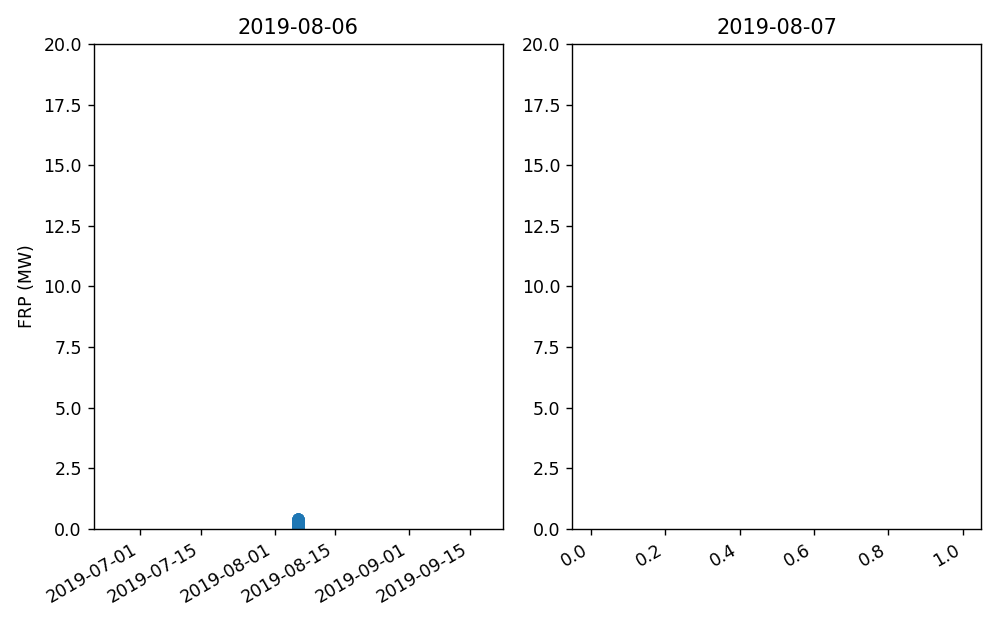

C:\Users\luisg\AppData\Local\Continuum\anaconda3\lib\site-packages\pandas\plotting\_matplotlib\converter.py:103: FutureWarning: Using an implicitly registered datetime converter for a matplotlib plotting method. The converter was registered by pandas on import. Future versions of pandas will require you to explicitly register matplotlib converters.

To register the converters:
	>>> from pandas.plotting import register_matplotlib_converters
	>>> register_matplotlib_converters()
  warnings.warn(msg, FutureWarning)


In [11]:
print(fire_detect_data["start_time"])
a = pd.to_datetime('2019-08-06T21').tz_localize('US/Pacific')
fire_detect_data["start_time"] < a

dates = ['2019-08-06','2019-08-07']
num_dates = len(dates)

fig, axs = plt.subplots(1, num_dates, figsize=(8,5))

for i in range(0, num_dates):
    date= dates[i]
    cutoff_max = pd.to_datetime(date+"T21").tz_localize('US/Pacific')
    cutoff_min = pd.to_datetime(date+"T01").tz_localize('US/Pacific')
    fire_on_date = fire_detect_data[(fire_detect_data["start_time"]>cutoff_min) & (fire_detect_data["start_time"]<cutoff_max)]
    axs[i].scatter(fire_on_date["start_time"], fire_on_date["FRP"]/1e6)
    axs[i].set_ylim([0,20])
    axs[i].set_title(date)
axs[0].set_ylabel("FRP (MW)")
fig.autofmt_xdate()
plt.tight_layout()
plt.savefig("WilliamsFlats_FirePixelFRP_T5.png")
plt.show()


[Timestamp('2019-08-06 11:51:00-0700', tz='US/Pacific')]


<IPython.core.display.Javascript object>


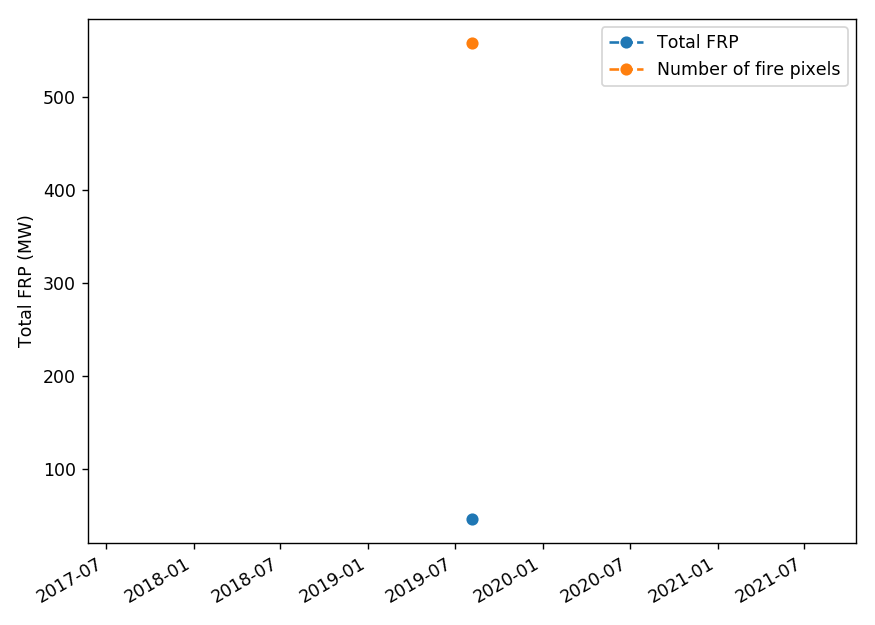

Total FRP [46.354564277066274]
Standard Deviation [0.06512338061757417]
Average FRP [0.08307269583703637]
Number of identified fire pixels [558]
Minimum 0.026859724987598557
Maximum 0.39899256917820514


In [12]:
dates = ['2019-08-06','2019-08-07']
num_dates = len(dates)

unique_starttimes = fire_detect_data["start_time"].unique()
print(unique_starttimes)

fig, axs = plt.subplots(1, 1, figsize=(7,5))
total_FRPs = []
ave_FRPs = []
stdev_FRPs = []
num_fires = []
for i in range(0, len(unique_starttimes)):
    fire_at_time = fire_detect_data[fire_detect_data["start_time"] == unique_starttimes[i]]
    total_FRP = fire_at_time["FRP"].sum()
    ave_FRP = fire_at_time["FRP"].mean()
    stdev_FRP= fire_at_time["FRP"].std()
    
    total_FRPs.append(total_FRP/1e6)
    ave_FRPs.append(ave_FRP/1e6)
    stdev_FRPs.append(stdev_FRP/1e6)
    num_fire = len(fire_at_time)
    num_fires.append(num_fire)

print("Total FRP", total_FRPs)
print("Standard Deviation", stdev_FRPs)
print("Average FRP", ave_FRPs)
print("Number of identified fire pixels", num_fires)
print("Minimum", np.min(fire_at_time["FRP"]/1e6))
print("Maximum", np.max(fire_at_time["FRP"]/1e6))
    
plt.plot(unique_starttimes, total_FRPs, '--o', label="Total FRP")
#plt.plot(unique_starttimes, ave_FRPs, '--o', label="Ave FRP")
plt.plot(unique_starttimes, num_fires, '--o', label="Number of fire pixels")

plt.legend()
axs.set_ylabel("Total FRP (MW)")
fig.autofmt_xdate()
plt.tight_layout()
plt.savefig("WilliamsFlats_TotalFRP_T4.png")
plt.show()


In [13]:
FRPs = []
for pix in fire_detect_FRPs:
    new = pix/1e6
    FRPs.append(new)
print(len(FRPs))
print(len(fire_detect_LfMIRs))

558
558


In [14]:
x= pd.Series(FRPs)
y = pd.Series(fire_detect_LfMIRs)

print(x.corr(y))
print(x.corr(y, method='spearman')) 
print(x.corr(y, method='kendall'))

1.0
1.0
1.0


<IPython.core.display.Javascript object>


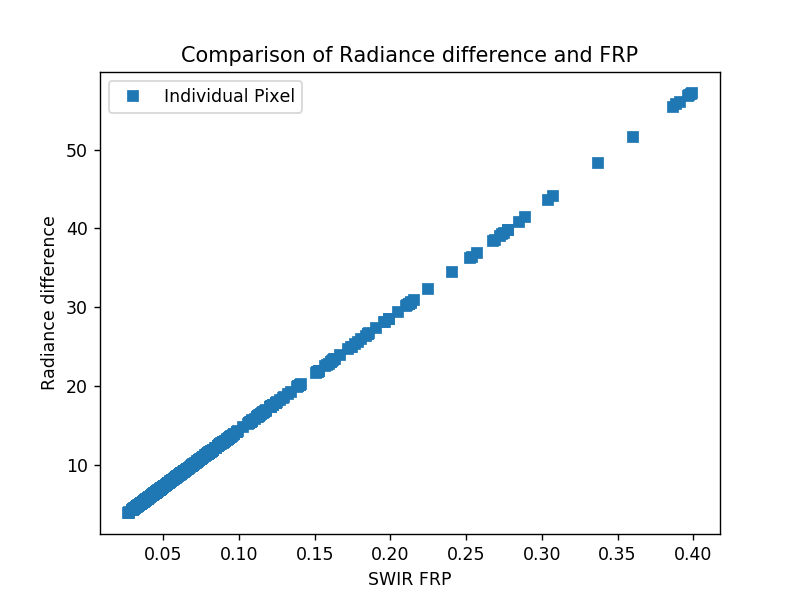

In [15]:
fig, ax = plt.subplots()
ax.plot(x, y, linewidth=0, marker='s', label='Individual Pixel')
ax.set_title("Comparison of Radiance difference and FRP")
ax.set_xlabel('SWIR FRP')
ax.set_ylabel('Radiance difference')
ax.legend(facecolor='white')
plt.show()